## Bidirectional LSTM model na predikciu hodnot DST o 1 hodinu dopredu na zaklade 6-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+1_6H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-25 08:16:30.703086: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 1
y_col = f"DST+{shift}"

n_input = 6
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  6


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 6, 2)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 6, 256)              │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 6, 128)              │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 6, 1)                │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               7 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,400 (1.26 MB)

 Trainable params: 331,400 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:54:20 12s/step - loss: 0.3613 - mae: 0.4772

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.3718 - mae: 0.4969 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.3692 - mae: 0.4972

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.3777 - mae: 0.5003

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.3752 - mae: 0.4964

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.3666 - mae: 0.4879

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.3772 - mae: 0.4845

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.3802 - mae: 0.4788

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.3793 - mae: 0.4726

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.3764 - mae: 0.4668

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.3781 - mae: 0.4643

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.3794 - mae: 0.4625

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.3791 - mae: 0.4605

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.3791 - mae: 0.4588

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.3781 - mae: 0.4567

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.3760 - mae: 0.4540

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.3733 - mae: 0.4510

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.3703 - mae: 0.4478

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.3671 - mae: 0.4447

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.3640 - mae: 0.4418

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.3607 - mae: 0.4387

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.3573 - mae: 0.4356

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.3540 - mae: 0.4327

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.3506 - mae: 0.4298

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.3478 - mae: 0.4273

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.3450 - mae: 0.4249

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.3422 - mae: 0.4224

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.3394 - mae: 0.4201

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 135ms/step - loss: 0.3367 - mae: 0.4178

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.3340 - mae: 0.4155

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.3314 - mae: 0.4134

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.3288 - mae: 0.4112

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.3263 - mae: 0.4092

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 134ms/step - loss: 0.3240 - mae: 0.4072

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.3216 - mae: 0.4053

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.3193 - mae: 0.4034

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.3171 - mae: 0.4016

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.3149 - mae: 0.3998

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.3127 - mae: 0.3980

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.3105 - mae: 0.3962

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.3086 - mae: 0.3945

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.3068 - mae: 0.3930

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.3051 - mae: 0.3915

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 139ms/step - loss: 0.3034 - mae: 0.3900

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.3018 - mae: 0.3886

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.3002 - mae: 0.3873

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.2987 - mae: 0.3860

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.2972 - mae: 0.3847

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.2958 - mae: 0.3835

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.2948 - mae: 0.3825

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.2937 - mae: 0.3815

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.2927 - mae: 0.3805

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.2916 - mae: 0.3795

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.2906 - mae: 0.3785

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.2896 - mae: 0.3776

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.2886 - mae: 0.3767

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.2875 - mae: 0.3757

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.2865 - mae: 0.3748

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.2854 - mae: 0.3738

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.2843 - mae: 0.3728

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.2833 - mae: 0.3719

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.2822 - mae: 0.3709

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.2812 - mae: 0.3700

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.2802 - mae: 0.3691

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.2792 - mae: 0.3682

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.2783 - mae: 0.3674

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.2773 - mae: 0.3665

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.2764 - mae: 0.3657

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.2755 - mae: 0.3649

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.2747 - mae: 0.3641

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.2740 - mae: 0.3634

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.2733 - mae: 0.3627

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.2726 - mae: 0.3620

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.2719 - mae: 0.3613

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.2712 - mae: 0.3606

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2705 - mae: 0.3599

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2698 - mae: 0.3592

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2691 - mae: 0.3586

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2684 - mae: 0.3579

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2677 - mae: 0.3573

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2671 - mae: 0.3567

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.2664 - mae: 0.3560

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.2657 - mae: 0.3554

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.2651 - mae: 0.3548

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.2644 - mae: 0.3543

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.2639 - mae: 0.3537

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.2633 - mae: 0.3531

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.2627 - mae: 0.3526

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.2621 - mae: 0.3520

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.2615 - mae: 0.3515

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.2610 - mae: 0.3509

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.2604 - mae: 0.3504

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.2598 - mae: 0.3499

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.2593 - mae: 0.3494

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.2587 - mae: 0.3488

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.2582 - mae: 0.3484

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.2577 - mae: 0.3479

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.2572 - mae: 0.3474

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.2567 - mae: 0.3469

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.2562 - mae: 0.3464

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.2558 - mae: 0.3460

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.2553 - mae: 0.3455

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.2548 - mae: 0.3451

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.2543 - mae: 0.3446

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.2538 - mae: 0.3441

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.2534 - mae: 0.3437

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.2529 - mae: 0.3433

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.2524 - mae: 0.3428

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.2520 - mae: 0.3424

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.2515 - mae: 0.3420

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.2511 - mae: 0.3416

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.2506 - mae: 0.3412

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.2502 - mae: 0.3408

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.2497 - mae: 0.3404

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.2493 - mae: 0.3400

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.2488 - mae: 0.3396

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.2484 - mae: 0.3392

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.2479 - mae: 0.3388

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.2475 - mae: 0.3384

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.2470 - mae: 0.3380

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.2466 - mae: 0.3376

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.2462 - mae: 0.3373

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.2458 - mae: 0.3369

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.2453 - mae: 0.3365

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.2449 - mae: 0.3362

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.2445 - mae: 0.3358

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.2441 - mae: 0.3354

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.2437 - mae: 0.3351

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.2433 - mae: 0.3347

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.2429 - mae: 0.3344

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.2424 - mae: 0.3340

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.2420 - mae: 0.3337

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.2416 - mae: 0.3333

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.2412 - mae: 0.3330

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.2408 - mae: 0.3326

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.2404 - mae: 0.3323

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.2400 - mae: 0.3319

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.2396 - mae: 0.3316

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.2392 - mae: 0.3313

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.2388 - mae: 0.3310

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.2384 - mae: 0.3306

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.2381 - mae: 0.3303

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.2377 - mae: 0.3300

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.2373 - mae: 0.3297

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.2369 - mae: 0.3293

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.2365 - mae: 0.3290

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.2362 - mae: 0.3287

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.2358 - mae: 0.3284

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.2354 - mae: 0.3281

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.2350 - mae: 0.3277

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.2347 - mae: 0.3274

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.2343 - mae: 0.3271

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.2339 - mae: 0.3268

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.2336 - mae: 0.3265

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.2333 - mae: 0.3262

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.2330 - mae: 0.3260

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.2326 - mae: 0.3257

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.2323 - mae: 0.3254

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.2320 - mae: 0.3251

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.2317 - mae: 0.3248

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.2314 - mae: 0.3246

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.2311 - mae: 0.3243

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.2308 - mae: 0.3240

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.2305 - mae: 0.3238

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2302 - mae: 0.3235

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2299 - mae: 0.3233

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2296 - mae: 0.3230

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2293 - mae: 0.3228

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2291 - mae: 0.3225

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2288 - mae: 0.3223

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2285 - mae: 0.3220

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.2283 - mae: 0.3218

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.2280 - mae: 0.3216

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.2278 - mae: 0.3213

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.2275 - mae: 0.3211

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.2273 - mae: 0.3209

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.2270 - mae: 0.3207

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.2268 - mae: 0.3204

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.2265 - mae: 0.3202

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2263 - mae: 0.3200

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2260 - mae: 0.3198

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2258 - mae: 0.3195

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.2256 - mae: 0.3193

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.2253 - mae: 0.3191

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.2251 - mae: 0.3189

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.2249 - mae: 0.3187

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.2247 - mae: 0.3185

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.2244 - mae: 0.3183

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.2242 - mae: 0.3181

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.2240 - mae: 0.3179

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.2238 - mae: 0.3176

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.2236 - mae: 0.3174

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.2233 - mae: 0.3172

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.2231 - mae: 0.3170

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.2229 - mae: 0.3168

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.2227 - mae: 0.3166

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.2225 - mae: 0.3165

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.2224 - mae: 0.3163

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 148ms/step - loss: 0.2222 - mae: 0.3161

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.2221 - mae: 0.3159

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.2220 - mae: 0.3158

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.2219 - mae: 0.3156

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.2218 - mae: 0.3154

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.2216 - mae: 0.3153

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.2215 - mae: 0.3151

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.2214 - mae: 0.3150

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.2213 - mae: 0.3148

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.2212 - mae: 0.3146

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.2211 - mae: 0.3145

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.2210 - mae: 0.3143

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.2209 - mae: 0.3142

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.2207 - mae: 0.3140

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.2206 - mae: 0.3139

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.2205 - mae: 0.3137

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.2204 - mae: 0.3136

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.2203 - mae: 0.3134

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.2202 - mae: 0.3133

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.2201 - mae: 0.3131

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.2199 - mae: 0.3130

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.2198 - mae: 0.3128

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.2197 - mae: 0.3127

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.2196 - mae: 0.3125

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.2195 - mae: 0.3124

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.2194 - mae: 0.3122

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.2192 - mae: 0.3121

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.2191 - mae: 0.3119

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.2190 - mae: 0.3118

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.2189 - mae: 0.3116

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.2187 - mae: 0.3115

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.2186 - mae: 0.3113

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.2185 - mae: 0.3112

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.2184 - mae: 0.3110

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.2182 - mae: 0.3109

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.2181 - mae: 0.3107

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.2180 - mae: 0.3106

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.2178 - mae: 0.3104

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.2177 - mae: 0.3103

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.2176 - mae: 0.3101

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.2175 - mae: 0.3100

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.2173 - mae: 0.3098

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.2172 - mae: 0.3097

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.2171 - mae: 0.3096

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.2170 - mae: 0.3094

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.2168 - mae: 0.3093

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.2167 - mae: 0.3091

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.2166 - mae: 0.3090

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.2165 - mae: 0.3088

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.2163 - mae: 0.3087

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.2162 - mae: 0.3086

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.2161 - mae: 0.3084

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.2160 - mae: 0.3083

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.2158 - mae: 0.3082

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.2157 - mae: 0.3080

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.2156 - mae: 0.3079

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.2155 - mae: 0.3077

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.2153 - mae: 0.3076

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.2152 - mae: 0.3075

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.2151 - mae: 0.3073

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.2150 - mae: 0.3072

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2148 - mae: 0.3071

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2147 - mae: 0.3069

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2146 - mae: 0.3068

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2144 - mae: 0.3067

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2143 - mae: 0.3065

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2142 - mae: 0.3064

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2141 - mae: 0.3063

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2139 - mae: 0.3061

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.2138 - mae: 0.3060

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2137 - mae: 0.3058

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2135 - mae: 0.3057

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2134 - mae: 0.3056

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2133 - mae: 0.3054

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.2131 - mae: 0.3053

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.2130 - mae: 0.3052

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.2129 - mae: 0.3050

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2128 - mae: 0.3049

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2126 - mae: 0.3048

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2125 - mae: 0.3047

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2124 - mae: 0.3045

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2122 - mae: 0.3044

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2121 - mae: 0.3043

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.2120 - mae: 0.3041

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.2119 - mae: 0.3040

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.2117 - mae: 0.3039

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.2116 - mae: 0.3038

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.2115 - mae: 0.3036

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.2113 - mae: 0.3035

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.2112 - mae: 0.3034

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.2111 - mae: 0.3032

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.2110 - mae: 0.3031

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.2108 - mae: 0.3030

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.2107 - mae: 0.3029

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.2106 - mae: 0.3027

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.2104 - mae: 0.3026

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.2103 - mae: 0.3025

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.2102 - mae: 0.3024

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.2101 - mae: 0.3022

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.2100 - mae: 0.3021

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.2099 - mae: 0.3020

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.2097 - mae: 0.3019

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.2096 - mae: 0.3018

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.2095 - mae: 0.3017

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.2094 - mae: 0.3015

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.2093 - mae: 0.3014

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.2092 - mae: 0.3013

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.2091 - mae: 0.3012

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.2090 - mae: 0.3011

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.2088 - mae: 0.3010

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.2087 - mae: 0.3009

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.2086 - mae: 0.3008

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.2085 - mae: 0.3006

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.2084 - mae: 0.3005

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.2083 - mae: 0.3004

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.2082 - mae: 0.3003

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.2081 - mae: 0.3002

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.2080 - mae: 0.3001

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.2079 - mae: 0.3000

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.2078 - mae: 0.2999

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.2077 - mae: 0.2998

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.2076 - mae: 0.2997

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.2074 - mae: 0.2996

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.2073 - mae: 0.2995

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.2072 - mae: 0.2994

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.2071 - mae: 0.2993

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.2070 - mae: 0.2991

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.2069 - mae: 0.2990

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.2068 - mae: 0.2989

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.2067 - mae: 0.2988

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.2066 - mae: 0.2987

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.2065 - mae: 0.2986

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.2064 - mae: 0.2985

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.2063 - mae: 0.2984

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.2062 - mae: 0.2983

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.2061 - mae: 0.2982

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.2060 - mae: 0.2981

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.2059 - mae: 0.2980

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.2058 - mae: 0.2979

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.2057 - mae: 0.2978

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.2056 - mae: 0.2977

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.2055 - mae: 0.2976

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.2054 - mae: 0.2975

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.2053 - mae: 0.2974

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.2052 - mae: 0.2973

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.2051 - mae: 0.2972

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.2050 - mae: 0.2972

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.2049 - mae: 0.2971

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.2048 - mae: 0.2970

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.2047 - mae: 0.2969

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.2046 - mae: 0.2968

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.2045 - mae: 0.2967

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.2044 - mae: 0.2966

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.2043 - mae: 0.2965

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.2042 - mae: 0.2964

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.2042 - mae: 0.2963

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.2041 - mae: 0.2962

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.2040 - mae: 0.2961

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.2039 - mae: 0.2960

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.2038 - mae: 0.2959

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.2037 - mae: 0.2958

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.2036 - mae: 0.2957

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.2035 - mae: 0.2957

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.2034 - mae: 0.2956

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.2033 - mae: 0.2955

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.2032 - mae: 0.2954

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.2031 - mae: 0.2953

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.2031 - mae: 0.2952

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.2030 - mae: 0.2951

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.2029 - mae: 0.2950

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.2028 - mae: 0.2949

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.2027 - mae: 0.2948

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.2026 - mae: 0.2947

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.2025 - mae: 0.2947

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.2024 - mae: 0.2946

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.2024 - mae: 0.2945

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.2023 - mae: 0.2944

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.2022 - mae: 0.2943

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.2021 - mae: 0.2942

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.2020 - mae: 0.2941

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.2019 - mae: 0.2941

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.2018 - mae: 0.2940

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.2017 - mae: 0.2939

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.2016 - mae: 0.2938

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.2016 - mae: 0.2937

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.2015 - mae: 0.2936

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.2014 - mae: 0.2935

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.2013 - mae: 0.2935

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.2012 - mae: 0.2934

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.2011 - mae: 0.2933

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.2011 - mae: 0.2932

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.2010 - mae: 0.2931

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.2009 - mae: 0.2930

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.2008 - mae: 0.2930

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.2007 - mae: 0.2929

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.2006 - mae: 0.2928

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.2005 - mae: 0.2927

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.2005 - mae: 0.2926

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.2004 - mae: 0.2926

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.2003 - mae: 0.2925

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.2002 - mae: 0.2924

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.2001 - mae: 0.2923

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.2000 - mae: 0.2922

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.2000 - mae: 0.2922

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.1999 - mae: 0.2921

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.1998 - mae: 0.2920

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.1997 - mae: 0.2919

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.1996 - mae: 0.2918

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.1995 - mae: 0.2918

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.1994 - mae: 0.2917

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.1994 - mae: 0.2916

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.1993 - mae: 0.2915

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.1992 - mae: 0.2914

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.1991 - mae: 0.2914

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.1990 - mae: 0.2913

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.1989 - mae: 0.2912

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.1989 - mae: 0.2911

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.1988 - mae: 0.2910

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.1987 - mae: 0.2910

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.1986 - mae: 0.2909

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.1985 - mae: 0.2908

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.1984 - mae: 0.2907

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.1984 - mae: 0.2907

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.1983 - mae: 0.2906

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.1982 - mae: 0.2905

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.1981 - mae: 0.2904

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.1980 - mae: 0.2904

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.1979 - mae: 0.2903

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.1979 - mae: 0.2902

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.1978 - mae: 0.2901

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.1977 - mae: 0.2901

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.1976 - mae: 0.2900

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.1975 - mae: 0.2899

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.1974 - mae: 0.2898

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.1974 - mae: 0.2898

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.1973 - mae: 0.2897

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.1972 - mae: 0.2896

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.1971 - mae: 0.2895

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.1970 - mae: 0.2895

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.1969 - mae: 0.2894

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.1969 - mae: 0.2893

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.1968 - mae: 0.2892

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.1967 - mae: 0.2891

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.1966 - mae: 0.2891

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.1965 - mae: 0.2890

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.1964 - mae: 0.2889

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.1964 - mae: 0.2889

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.1963 - mae: 0.2888

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.1962 - mae: 0.2887

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.1961 - mae: 0.2886

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.1960 - mae: 0.2886

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.1959 - mae: 0.2885

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.1959 - mae: 0.2884

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.1958 - mae: 0.2883

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.1957 - mae: 0.2883

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.1956 - mae: 0.2882

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.1955 - mae: 0.2881

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.1954 - mae: 0.2880

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.1954 - mae: 0.2880

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.1953 - mae: 0.2879

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.1952 - mae: 0.2878

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.1951 - mae: 0.2877

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.1950 - mae: 0.2877

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.1949 - mae: 0.2876

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.1949 - mae: 0.2875

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.1948 - mae: 0.2875

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.1947 - mae: 0.2874

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.1946 - mae: 0.2873

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.1945 - mae: 0.2872

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.1945 - mae: 0.2872

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.1944 - mae: 0.2871

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.1943 - mae: 0.2870

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.1942 - mae: 0.2869

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.1941 - mae: 0.2869

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.1940 - mae: 0.2868

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.1940 - mae: 0.2867

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.1939 - mae: 0.2867

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.1938 - mae: 0.2866

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.1937 - mae: 0.2865

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.1936 - mae: 0.2864

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.1935 - mae: 0.2864

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.1935 - mae: 0.2863

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.1934 - mae: 0.2862

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.1933 - mae: 0.2862

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.1932 - mae: 0.2861

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.1931 - mae: 0.2860

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.1931 - mae: 0.2859

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.1930 - mae: 0.2859

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.1929 - mae: 0.2858

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.1928 - mae: 0.2857

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.1927 - mae: 0.2857

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.1926 - mae: 0.2856

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.1926 - mae: 0.2855

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.1925 - mae: 0.2854

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.1924 - mae: 0.2854

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.1923 - mae: 0.2853

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.1922 - mae: 0.2852

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.1922 - mae: 0.2852

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.1921 - mae: 0.2851

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.1920 - mae: 0.2850

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.1919 - mae: 0.2850

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.1918 - mae: 0.2849

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.1917 - mae: 0.2848

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.1917 - mae: 0.2847

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.1916 - mae: 0.2847

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.1915 - mae: 0.2846

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.1914 - mae: 0.2845

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.1913 - mae: 0.2845

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.1913 - mae: 0.2844 

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.1912 - mae: 0.2843

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.1911 - mae: 0.2842

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.1910 - mae: 0.2842

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.1909 - mae: 0.2841

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.1908 - mae: 0.2840

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.1908 - mae: 0.2840

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.1907 - mae: 0.2839

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.1906 - mae: 0.2838

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.1905 - mae: 0.2838

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.1904 - mae: 0.2837

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.1904 - mae: 0.2836

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.1903 - mae: 0.2835

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.1902 - mae: 0.2835

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.1901 - mae: 0.2834

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.1900 - mae: 0.2833

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.1900 - mae: 0.2833

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.1899 - mae: 0.2832

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.1898 - mae: 0.2831

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.1897 - mae: 0.2831

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.1896 - mae: 0.2830

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.1895 - mae: 0.2829

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.1895 - mae: 0.2829

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.1894 - mae: 0.2828

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.1893 - mae: 0.2827

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.1892 - mae: 0.2827

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.1892 - mae: 0.2826

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.1891 - mae: 0.2825

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1890 - mae: 0.2825

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1889 - mae: 0.2824

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1888 - mae: 0.2823

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1888 - mae: 0.2823

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1887 - mae: 0.2822

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.1886 - mae: 0.2821

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1885 - mae: 0.2820

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1884 - mae: 0.2820

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1884 - mae: 0.2819

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1883 - mae: 0.2818

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1882 - mae: 0.2818

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.1881 - mae: 0.2817

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1880 - mae: 0.2816

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1880 - mae: 0.2816

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1879 - mae: 0.2815

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1878 - mae: 0.2814

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1877 - mae: 0.2814

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1877 - mae: 0.2813

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.1876 - mae: 0.2813

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1875 - mae: 0.2812

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1874 - mae: 0.2811

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1873 - mae: 0.2811

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1873 - mae: 0.2810

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1872 - mae: 0.2809

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1871 - mae: 0.2809

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.1870 - mae: 0.2808

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1870 - mae: 0.2807

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1869 - mae: 0.2807

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1868 - mae: 0.2806

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1867 - mae: 0.2805

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1867 - mae: 0.2805

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.1866 - mae: 0.2804

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1865 - mae: 0.2803

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1864 - mae: 0.2803

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1863 - mae: 0.2802

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1863 - mae: 0.2801

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1862 - mae: 0.2801

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.1861 - mae: 0.2800

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1860 - mae: 0.2800

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1860 - mae: 0.2799

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1859 - mae: 0.2798

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1858 - mae: 0.2798

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1857 - mae: 0.2797

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1857 - mae: 0.2796

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.1856 - mae: 0.2796

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.1855 - mae: 0.2795

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.1854 - mae: 0.2794

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.1854 - mae: 0.2794

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.1853 - mae: 0.2793

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.1852 - mae: 0.2793

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.1851 - mae: 0.2792

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1851 - mae: 0.2791

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1850 - mae: 0.2791

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1849 - mae: 0.2790

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1848 - mae: 0.2789

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1848 - mae: 0.2789

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.1847 - mae: 0.2788

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1846 - mae: 0.2788

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1845 - mae: 0.2787

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1845 - mae: 0.2786

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1844 - mae: 0.2786

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1843 - mae: 0.2785

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.1842 - mae: 0.2784

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.1842 - mae: 0.2784

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.1841 - mae: 0.2783

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.1840 - mae: 0.2783

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.1840 - mae: 0.2782

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.1839 - mae: 0.2781

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.1838 - mae: 0.2781

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.1837 - mae: 0.2780

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.1837 - mae: 0.2780

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.1836 - mae: 0.2779

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.1835 - mae: 0.2778

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.1835 - mae: 0.2778

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.1834 - mae: 0.2777

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.1833 - mae: 0.2777

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.1832 - mae: 0.2776

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.1832 - mae: 0.2775

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.1831 - mae: 0.2775

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.1830 - mae: 0.2774

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.1830 - mae: 0.2774

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.1829 - mae: 0.2773

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.1828 - mae: 0.2772

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.1827 - mae: 0.2772

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1827 - mae: 0.2771

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1826 - mae: 0.2771

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1825 - mae: 0.2770

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1825 - mae: 0.2769

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.1824 - mae: 0.2769

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1823 - mae: 0.2768

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1823 - mae: 0.2768

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1822 - mae: 0.2767

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1821 - mae: 0.2767

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1821 - mae: 0.2766

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1820 - mae: 0.2765

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.1819 - mae: 0.2765

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1818 - mae: 0.2764

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1818 - mae: 0.2764

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1817 - mae: 0.2763

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1816 - mae: 0.2762

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1816 - mae: 0.2762

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1815 - mae: 0.2761

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.1814 - mae: 0.2761

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1814 - mae: 0.2760

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1813 - mae: 0.2760

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1812 - mae: 0.2759

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1812 - mae: 0.2759

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1811 - mae: 0.2758

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.1810 - mae: 0.2757

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1810 - mae: 0.2757

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1809 - mae: 0.2756

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1808 - mae: 0.2756

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1808 - mae: 0.2755

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1807 - mae: 0.2755

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.1806 - mae: 0.2754

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.1806 - mae: 0.2753

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.1805 - mae: 0.2753

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.1804 - mae: 0.2752

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.1804 - mae: 0.2752

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.1803 - mae: 0.2751

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.1802 - mae: 0.2751

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.1802 - mae: 0.2750

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.1801 - mae: 0.2750

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.1800 - mae: 0.2749

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.1800 - mae: 0.2748

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.1799 - mae: 0.2748

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.1798 - mae: 0.2747

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.1798 - mae: 0.2747

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.1797 - mae: 0.2746

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.1797 - mae: 0.2746

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.1796 - mae: 0.2745

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.1795 - mae: 0.2745

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.1795 - mae: 0.2744

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.1794 - mae: 0.2743

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.1793 - mae: 0.2743

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.1793 - mae: 0.2742

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.1792 - mae: 0.2742

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.1791 - mae: 0.2741

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.1791 - mae: 0.2741

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.1790 - mae: 0.2740

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.1789 - mae: 0.2740

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.1789 - mae: 0.2739

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.1788 - mae: 0.2739

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.1788 - mae: 0.2738

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.1787 - mae: 0.2737

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.1786 - mae: 0.2737

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.1786 - mae: 0.2736

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.1785 - mae: 0.2736

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.1784 - mae: 0.2735

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.1784 - mae: 0.2735

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.1783 - mae: 0.2734

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.1782 - mae: 0.2734

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.1782 - mae: 0.2733

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.1781 - mae: 0.2733

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.1781 - mae: 0.2732

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.1780 - mae: 0.2731

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.1779 - mae: 0.2731

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.1779 - mae: 0.2730

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.1778 - mae: 0.2730

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.1777 - mae: 0.2729

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.1777 - mae: 0.2729

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.1776 - mae: 0.2728

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.1775 - mae: 0.2728

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.1775 - mae: 0.2727

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.1774 - mae: 0.2727

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.1774 - mae: 0.2726

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.1773 - mae: 0.2725

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.1772 - mae: 0.2725

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.1772 - mae: 0.2724

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.1771 - mae: 0.2724

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.1770 - mae: 0.2723

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.1770 - mae: 0.2723

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.1769 - mae: 0.2722

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.1769 - mae: 0.2722

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.1768 - mae: 0.2721

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.1767 - mae: 0.2721

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.1767 - mae: 0.2720

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.1766 - mae: 0.2720

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.1765 - mae: 0.2719

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.1765 - mae: 0.2719

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.1764 - mae: 0.2718

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.1764 - mae: 0.2718

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.1763 - mae: 0.2717

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.1762 - mae: 0.2716

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.1762 - mae: 0.2716

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.1761 - mae: 0.2715

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.1761 - mae: 0.2715

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.1760 - mae: 0.2714

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.1759 - mae: 0.2714

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.1759 - mae: 0.2713

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.1758 - mae: 0.2713

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.1758 - mae: 0.2712

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.1757 - mae: 0.2712

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.1756 - mae: 0.2711

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.1756 - mae: 0.2711

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.1755 - mae: 0.2710

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.1754 - mae: 0.2710

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.1754 - mae: 0.2709

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.1753 - mae: 0.2709

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.1753 - mae: 0.2708

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.1752 - mae: 0.2708

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.1752 - mae: 0.2707

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.1751 - mae: 0.2707

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.1750 - mae: 0.2706

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.1750 - mae: 0.2706

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.1749 - mae: 0.2705

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.1749 - mae: 0.2705

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.1748 - mae: 0.2704

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.1747 - mae: 0.2704

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.1747 - mae: 0.2703

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.1746 - mae: 0.2703

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.1746 - mae: 0.2702

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.1745 - mae: 0.2702

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.1745 - mae: 0.2701

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.1744 - mae: 0.2701

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.1743 - mae: 0.2700

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.1743 - mae: 0.2700

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.1742 - mae: 0.2699

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.1742 - mae: 0.2699

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.1741 - mae: 0.2698

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.1741 - mae: 0.2698

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.1740 - mae: 0.2697

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.1739 - mae: 0.2697

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.1739 - mae: 0.2696

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.1738 - mae: 0.2696

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.1738 - mae: 0.2695

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.1737 - mae: 0.2695

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.1737 - mae: 0.2694

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.1736 - mae: 0.2694

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.1736 - mae: 0.2693

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.1735 - mae: 0.2693

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.1734 - mae: 0.2692

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.1734 - mae: 0.2692

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.1733 - mae: 0.2692

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.1733 - mae: 0.2691

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.1732 - mae: 0.2691

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.1732 - mae: 0.2690

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.1731 - mae: 0.2690

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.1731 - mae: 0.2689

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.1730 - mae: 0.2689

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.1730 - mae: 0.2688

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.1729 - mae: 0.2688

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.1728 - mae: 0.2687

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.1728 - mae: 0.2687

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.1727 - mae: 0.2686

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.1727 - mae: 0.2686

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.1726 - mae: 0.2685

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.1726 - mae: 0.2685

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.1725 - mae: 0.2684

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.1725 - mae: 0.2684

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.1724 - mae: 0.2684

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.1724 - mae: 0.2683

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.1723 - mae: 0.2683

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.1723 - mae: 0.2682

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.1722 - mae: 0.2682

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.1721 - mae: 0.2681

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.1721 - mae: 0.2681

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.1720 - mae: 0.2680

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.1720 - mae: 0.2680

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.1719 - mae: 0.2679

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.1719 - mae: 0.2679

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.1718 - mae: 0.2678

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.1718 - mae: 0.2678

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.1717 - mae: 0.2678

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.1717 - mae: 0.2677

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.1716 - mae: 0.2677

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.1716 - mae: 0.2676

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.1715 - mae: 0.2676

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.1715 - mae: 0.2675

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.1714 - mae: 0.2675

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.1713 - mae: 0.2674

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.1713 - mae: 0.2674

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.1712 - mae: 0.2673

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.1712 - mae: 0.2673

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.1711 - mae: 0.2673

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.1711 - mae: 0.2672

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.1710 - mae: 0.2672

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.1710 - mae: 0.2671

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.1709 - mae: 0.2671

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.1709 - mae: 0.2670

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.1708 - mae: 0.2670

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.1708 - mae: 0.2669

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.1707 - mae: 0.2669

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.1707 - mae: 0.2668

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.1706 - mae: 0.2668

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.1706 - mae: 0.2668

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.1705 - mae: 0.2667

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.1705 - mae: 0.2667

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.1704 - mae: 0.2666

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.1704 - mae: 0.2666

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.1703 - mae: 0.2665

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.1703 - mae: 0.2665

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.1702 - mae: 0.2664

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.1702 - mae: 0.2664

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.1701 - mae: 0.2664

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.1701 - mae: 0.2663

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.1700 - mae: 0.2663

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.1700 - mae: 0.2662 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.1699 - mae: 0.2662

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.1699 - mae: 0.2661

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.1698 - mae: 0.2661

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.1698 - mae: 0.2661

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.1697 - mae: 0.2660

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.1697 - mae: 0.2660

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.1696 - mae: 0.2659

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.1696 - mae: 0.2659

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.1695 - mae: 0.2658

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.1695 - mae: 0.2658

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.1694 - mae: 0.2657

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.1694 - mae: 0.2657

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.1693 - mae: 0.2657

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.1693 - mae: 0.2656

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.1692 - mae: 0.2656

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.1692 - mae: 0.2655

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.1691 - mae: 0.2655

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.1691 - mae: 0.2654

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.1690 - mae: 0.2654

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.1690 - mae: 0.2654

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.1689 - mae: 0.2653

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.1689 - mae: 0.2653

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.1688 - mae: 0.2652

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.1688 - mae: 0.2652

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.1687 - mae: 0.2651

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.1687 - mae: 0.2651

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.1686 - mae: 0.2651

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.1686 - mae: 0.2650

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.1685 - mae: 0.2650

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.1685 - mae: 0.2649

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.1684 - mae: 0.2649

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.1684 - mae: 0.2648

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.1683 - mae: 0.2648

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.1683 - mae: 0.2648

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.1682 - mae: 0.2647

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.1682 - mae: 0.2647

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.1681 - mae: 0.2646

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.1681 - mae: 0.2646

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.1680 - mae: 0.2645

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.1680 - mae: 0.2645

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.1679 - mae: 0.2645

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.1679 - mae: 0.2644

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.1678 - mae: 0.2644

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.1678 - mae: 0.2643

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.1677 - mae: 0.2643

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.1677 - mae: 0.2642

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.1676 - mae: 0.2642

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.1676 - mae: 0.2642

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.1676 - mae: 0.2641

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.1675 - mae: 0.2641

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.1675 - mae: 0.2640

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.1674 - mae: 0.2640

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.1674 - mae: 0.2639

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.1673 - mae: 0.2639

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.1673 - mae: 0.2639

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.1672 - mae: 0.2638

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.1672 - mae: 0.2638

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.1671 - mae: 0.2637

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.1671 - mae: 0.2637

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.1670 - mae: 0.2637

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.1670 - mae: 0.2636

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.1669 - mae: 0.2636

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.1669 - mae: 0.2635

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.1668 - mae: 0.2635


Epoch 1: val_mae improved from inf to 0.25278, saving model to models/DST+1_6H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 165s 171ms/step - loss: 0.1668 - mae: 0.2634 - val_loss: 0.2136 - val_mae: 0.2528


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 217ms/step - loss: 0.3523 - mae: 0.3838

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.2959 - mae: 0.3406

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.2550 - mae: 0.3098

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.2279 - mae: 0.2909

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.2084 - mae: 0.2779

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1929 - mae: 0.2673

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.1806 - mae: 0.2588

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1708 - mae: 0.2521

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1643 - mae: 0.2476

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1586 - mae: 0.2437

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1534 - mae: 0.2402

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1487 - mae: 0.2370

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1445 - mae: 0.2342

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1406 - mae: 0.2316

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.1372 - mae: 0.2292

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.1342 - mae: 0.2270

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1314 - mae: 0.2249

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1287 - mae: 0.2229

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1262 - mae: 0.2210

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1239 - mae: 0.2191

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1217 - mae: 0.2173

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.1195 - mae: 0.2156

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1175 - mae: 0.2139

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1157 - mae: 0.2125

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1145 - mae: 0.2114

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.1133 - mae: 0.2104

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.1124 - mae: 0.2095

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.1114 - mae: 0.2086

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.1104 - mae: 0.2076

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.1095 - mae: 0.2067

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.1086 - mae: 0.2058

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.1078 - mae: 0.2051

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.1071 - mae: 0.2044

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.1064 - mae: 0.2037

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 131ms/step - loss: 0.1057 - mae: 0.2032

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.1051 - mae: 0.2027

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 133ms/step - loss: 0.1045 - mae: 0.2022

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1040 - mae: 0.2017

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 133ms/step - loss: 0.1034 - mae: 0.2012

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1029 - mae: 0.2008

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.1024 - mae: 0.2003

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 135ms/step - loss: 0.1019 - mae: 0.1999

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1014 - mae: 0.1994

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.1009 - mae: 0.1990

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.1005 - mae: 0.1986

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.1001 - mae: 0.1983

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.0997 - mae: 0.1980

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.0993 - mae: 0.1976

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.0989 - mae: 0.1973

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0985 - mae: 0.1969

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0981 - mae: 0.1966

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0978 - mae: 0.1963

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0974 - mae: 0.1960

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0970 - mae: 0.1957

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0967 - mae: 0.1954

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0963 - mae: 0.1951

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0959 - mae: 0.1948

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0956 - mae: 0.1945

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.0952 - mae: 0.1942

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0948 - mae: 0.1939

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0945 - mae: 0.1936

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0941 - mae: 0.1933

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.0938 - mae: 0.1930

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0934 - mae: 0.1927

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.0931 - mae: 0.1924

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.0927 - mae: 0.1921

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.0924 - mae: 0.1919

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.0921 - mae: 0.1916

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.0918 - mae: 0.1913

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.0915 - mae: 0.1911

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.0913 - mae: 0.1909

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 139ms/step - loss: 0.0910 - mae: 0.1907

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 140ms/step - loss: 0.0908 - mae: 0.1904

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 140ms/step - loss: 0.0905 - mae: 0.1902

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0903 - mae: 0.1900

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0900 - mae: 0.1897

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0898 - mae: 0.1895

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 141ms/step - loss: 0.0895 - mae: 0.1893

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0893 - mae: 0.1891

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0891 - mae: 0.1889

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0889 - mae: 0.1887

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0886 - mae: 0.1885

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0884 - mae: 0.1883

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0882 - mae: 0.1881

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0880 - mae: 0.1879

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.0878 - mae: 0.1877

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0876 - mae: 0.1875

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.0874 - mae: 0.1873

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.0872 - mae: 0.1871

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.0869 - mae: 0.1870

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.0867 - mae: 0.1868

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 142ms/step - loss: 0.0865 - mae: 0.1866

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.0863 - mae: 0.1864

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.0861 - mae: 0.1862

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.0860 - mae: 0.1860

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0858 - mae: 0.1859

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0856 - mae: 0.1857

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0854 - mae: 0.1855

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0852 - mae: 0.1853

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0850 - mae: 0.1851

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0848 - mae: 0.1850

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0846 - mae: 0.1848

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0845 - mae: 0.1846

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0843 - mae: 0.1845

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0841 - mae: 0.1843

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.0839 - mae: 0.1841

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0838 - mae: 0.1840

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0836 - mae: 0.1838

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0834 - mae: 0.1836

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0832 - mae: 0.1835

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0831 - mae: 0.1833

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0829 - mae: 0.1832

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0827 - mae: 0.1830

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0826 - mae: 0.1828

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0824 - mae: 0.1827

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0822 - mae: 0.1825

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 145ms/step - loss: 0.0821 - mae: 0.1824

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.0819 - mae: 0.1822

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.0817 - mae: 0.1821

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.0816 - mae: 0.1819

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.0814 - mae: 0.1818

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.0813 - mae: 0.1816

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.0811 - mae: 0.1815

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 145ms/step - loss: 0.0810 - mae: 0.1814

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0808 - mae: 0.1812

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0807 - mae: 0.1811

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0805 - mae: 0.1810

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0804 - mae: 0.1809

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0803 - mae: 0.1807

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0801 - mae: 0.1806

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0800 - mae: 0.1805

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0799 - mae: 0.1804

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0797 - mae: 0.1803

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0796 - mae: 0.1801

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0795 - mae: 0.1800

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0793 - mae: 0.1799

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0792 - mae: 0.1798

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0791 - mae: 0.1797

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0790 - mae: 0.1796

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0788 - mae: 0.1795

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0787 - mae: 0.1794

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0786 - mae: 0.1792

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0785 - mae: 0.1791

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0784 - mae: 0.1790

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0782 - mae: 0.1789

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0781 - mae: 0.1788

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0780 - mae: 0.1787

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0779 - mae: 0.1786

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0778 - mae: 0.1785

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0777 - mae: 0.1784

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0776 - mae: 0.1783

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0775 - mae: 0.1783

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0774 - mae: 0.1782

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0773 - mae: 0.1781

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0772 - mae: 0.1780

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0771 - mae: 0.1779

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0770 - mae: 0.1778

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0769 - mae: 0.1777

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0768 - mae: 0.1776

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0767 - mae: 0.1775

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0765 - mae: 0.1774

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0764 - mae: 0.1773

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0763 - mae: 0.1772

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0762 - mae: 0.1771

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0761 - mae: 0.1770

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0760 - mae: 0.1770

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0759 - mae: 0.1769

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0759 - mae: 0.1768

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0758 - mae: 0.1767

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0757 - mae: 0.1766

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0756 - mae: 0.1765

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0755 - mae: 0.1764

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0754 - mae: 0.1764

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0753 - mae: 0.1763

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0752 - mae: 0.1762

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0752 - mae: 0.1761

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0751 - mae: 0.1760

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0750 - mae: 0.1759

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0749 - mae: 0.1759

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0748 - mae: 0.1758

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0747 - mae: 0.1757

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0747 - mae: 0.1756

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0746 - mae: 0.1756

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0745 - mae: 0.1755

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0744 - mae: 0.1754

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0744 - mae: 0.1753

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0743 - mae: 0.1753

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0742 - mae: 0.1752

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0741 - mae: 0.1751

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0741 - mae: 0.1751

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0740 - mae: 0.1750

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0739 - mae: 0.1749

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0739 - mae: 0.1748

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0738 - mae: 0.1748

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0737 - mae: 0.1747

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0736 - mae: 0.1746

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0736 - mae: 0.1746

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0735 - mae: 0.1745

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0734 - mae: 0.1744

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0734 - mae: 0.1744

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0733 - mae: 0.1743

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0733 - mae: 0.1743

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0732 - mae: 0.1742

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0731 - mae: 0.1741

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0731 - mae: 0.1741

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0730 - mae: 0.1740

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0730 - mae: 0.1740

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0729 - mae: 0.1739

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0728 - mae: 0.1739

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0728 - mae: 0.1738

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0727 - mae: 0.1738

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0727 - mae: 0.1737

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0726 - mae: 0.1737

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0726 - mae: 0.1736

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0725 - mae: 0.1735

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0724 - mae: 0.1735

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0724 - mae: 0.1734

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0723 - mae: 0.1734

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0723 - mae: 0.1733

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0722 - mae: 0.1733

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0721 - mae: 0.1732

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0721 - mae: 0.1732

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0720 - mae: 0.1731

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0720 - mae: 0.1730

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0719 - mae: 0.1730

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0719 - mae: 0.1729

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0718 - mae: 0.1729

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0717 - mae: 0.1728

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0717 - mae: 0.1728

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0716 - mae: 0.1727

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0716 - mae: 0.1727

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0715 - mae: 0.1726

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0714 - mae: 0.1725

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0714 - mae: 0.1725

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0713 - mae: 0.1724

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0713 - mae: 0.1724

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0712 - mae: 0.1723

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0712 - mae: 0.1723

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0711 - mae: 0.1722

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0711 - mae: 0.1722

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0710 - mae: 0.1721

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0709 - mae: 0.1720

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0709 - mae: 0.1720

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0708 - mae: 0.1719

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0708 - mae: 0.1719

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0707 - mae: 0.1718

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0707 - mae: 0.1718

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0706 - mae: 0.1717

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0706 - mae: 0.1717

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0705 - mae: 0.1716

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0705 - mae: 0.1716

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0704 - mae: 0.1715

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0703 - mae: 0.1715

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0703 - mae: 0.1714

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0702 - mae: 0.1714

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0702 - mae: 0.1713

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0701 - mae: 0.1713

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0701 - mae: 0.1712

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0700 - mae: 0.1712

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0700 - mae: 0.1711

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0699 - mae: 0.1711

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0699 - mae: 0.1710

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0698 - mae: 0.1710

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0698 - mae: 0.1709

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0697 - mae: 0.1709

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0697 - mae: 0.1708

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0696 - mae: 0.1707

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0696 - mae: 0.1707

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0695 - mae: 0.1706

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0695 - mae: 0.1706

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0694 - mae: 0.1705

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0694 - mae: 0.1705

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0693 - mae: 0.1704

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0693 - mae: 0.1704

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0692 - mae: 0.1703

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0692 - mae: 0.1703

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0691 - mae: 0.1702

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0691 - mae: 0.1702

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0690 - mae: 0.1702

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0690 - mae: 0.1701

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0689 - mae: 0.1701

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0689 - mae: 0.1700

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0688 - mae: 0.1700

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0688 - mae: 0.1699

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0687 - mae: 0.1699

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0687 - mae: 0.1698

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0686 - mae: 0.1698

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0686 - mae: 0.1697

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0686 - mae: 0.1697

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0685 - mae: 0.1696

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0685 - mae: 0.1696

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0684 - mae: 0.1695

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0684 - mae: 0.1695

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0684 - mae: 0.1695

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0683 - mae: 0.1694

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0683 - mae: 0.1694

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0682 - mae: 0.1693

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0682 - mae: 0.1693

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0682 - mae: 0.1692

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0681 - mae: 0.1692

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0681 - mae: 0.1692

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0681 - mae: 0.1691

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0680 - mae: 0.1691

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0680 - mae: 0.1690

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0679 - mae: 0.1690

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0679 - mae: 0.1690

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0679 - mae: 0.1689

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0678 - mae: 0.1689

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0678 - mae: 0.1688

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0678 - mae: 0.1688

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0677 - mae: 0.1688

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0677 - mae: 0.1687

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0677 - mae: 0.1687

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0676 - mae: 0.1686

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0676 - mae: 0.1686

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0676 - mae: 0.1686

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0675 - mae: 0.1685

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0675 - mae: 0.1685

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0675 - mae: 0.1684

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0674 - mae: 0.1684

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0674 - mae: 0.1684

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0673 - mae: 0.1683

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0673 - mae: 0.1683

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0673 - mae: 0.1683

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0672 - mae: 0.1682

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0672 - mae: 0.1682

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0672 - mae: 0.1681

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0671 - mae: 0.1681

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0671 - mae: 0.1681

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0671 - mae: 0.1680

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0670 - mae: 0.1680

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0670 - mae: 0.1680

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0670 - mae: 0.1679

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0669 - mae: 0.1679

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0669 - mae: 0.1678

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0669 - mae: 0.1678

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0668 - mae: 0.1678

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0668 - mae: 0.1677

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0668 - mae: 0.1677

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0667 - mae: 0.1677

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0667 - mae: 0.1676

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0667 - mae: 0.1676

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0666 - mae: 0.1676

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0666 - mae: 0.1675

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0666 - mae: 0.1675

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0665 - mae: 0.1675

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0665 - mae: 0.1674

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0665 - mae: 0.1674

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0664 - mae: 0.1674

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0664 - mae: 0.1673

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0664 - mae: 0.1673

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0664 - mae: 0.1673

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0663 - mae: 0.1672

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0663 - mae: 0.1672

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0663 - mae: 0.1672

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0662 - mae: 0.1671

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0662 - mae: 0.1671

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0662 - mae: 0.1670

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0661 - mae: 0.1670

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0661 - mae: 0.1670

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0661 - mae: 0.1669

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0660 - mae: 0.1669

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0660 - mae: 0.1669

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0660 - mae: 0.1668

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0660 - mae: 0.1668

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0659 - mae: 0.1668

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0659 - mae: 0.1668

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0659 - mae: 0.1667

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0659 - mae: 0.1667

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0658 - mae: 0.1667

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0658 - mae: 0.1666

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0658 - mae: 0.1666

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0657 - mae: 0.1666

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0657 - mae: 0.1665

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0657 - mae: 0.1665

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0657 - mae: 0.1665

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0656 - mae: 0.1664

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0656 - mae: 0.1664

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0656 - mae: 0.1664

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0656 - mae: 0.1664

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0655 - mae: 0.1663

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0655 - mae: 0.1663

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0655 - mae: 0.1663

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0655 - mae: 0.1662

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0654 - mae: 0.1662

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0654 - mae: 0.1662

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0654 - mae: 0.1661

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0654 - mae: 0.1661

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0653 - mae: 0.1661

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0653 - mae: 0.1660

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0653 - mae: 0.1660

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0652 - mae: 0.1660

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0652 - mae: 0.1659

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0652 - mae: 0.1659

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0652 - mae: 0.1659

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0651 - mae: 0.1659

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0651 - mae: 0.1658

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0651 - mae: 0.1658

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0651 - mae: 0.1658

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0650 - mae: 0.1657

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0650 - mae: 0.1657

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0650 - mae: 0.1657

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0650 - mae: 0.1656

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0649 - mae: 0.1656

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0649 - mae: 0.1656

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0649 - mae: 0.1656

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0649 - mae: 0.1655

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0648 - mae: 0.1655

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0648 - mae: 0.1655

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0648 - mae: 0.1654

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0648 - mae: 0.1654

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0648 - mae: 0.1654

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0647 - mae: 0.1654

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0647 - mae: 0.1653

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0647 - mae: 0.1653

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0647 - mae: 0.1653

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0647 - mae: 0.1653

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0647 - mae: 0.1653

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0646 - mae: 0.1652

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0646 - mae: 0.1652

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0646 - mae: 0.1652

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0646 - mae: 0.1652

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0646 - mae: 0.1651

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0646 - mae: 0.1651

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0645 - mae: 0.1651

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0645 - mae: 0.1651

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0645 - mae: 0.1651

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0645 - mae: 0.1651

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0645 - mae: 0.1650

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0645 - mae: 0.1650

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0645 - mae: 0.1650

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0644 - mae: 0.1650

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0644 - mae: 0.1650

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0644 - mae: 0.1649

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0644 - mae: 0.1649

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0644 - mae: 0.1649

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0644 - mae: 0.1649

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0643 - mae: 0.1649

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0643 - mae: 0.1649

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0643 - mae: 0.1648

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0643 - mae: 0.1648

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0643 - mae: 0.1648

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0643 - mae: 0.1648

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0643 - mae: 0.1648

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0642 - mae: 0.1647

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0642 - mae: 0.1647

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0642 - mae: 0.1647

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0642 - mae: 0.1647

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0642 - mae: 0.1647

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0642 - mae: 0.1647

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0642 - mae: 0.1646

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0642 - mae: 0.1646

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0642 - mae: 0.1646

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0641 - mae: 0.1646

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0641 - mae: 0.1646

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0641 - mae: 0.1646

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0641 - mae: 0.1646

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0641 - mae: 0.1646

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0641 - mae: 0.1646

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0641 - mae: 0.1645

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0641 - mae: 0.1645

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0641 - mae: 0.1645

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0641 - mae: 0.1645

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0641 - mae: 0.1645

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0641 - mae: 0.1645

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0641 - mae: 0.1645

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0641 - mae: 0.1645

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0641 - mae: 0.1645

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0641 - mae: 0.1645

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0641 - mae: 0.1645

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0641 - mae: 0.1645

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0641 - mae: 0.1645

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0641 - mae: 0.1645

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0641 - mae: 0.1645

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0641 - mae: 0.1644

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0641 - mae: 0.1644

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0641 - mae: 0.1644

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0641 - mae: 0.1644

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0641 - mae: 0.1644

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0640 - mae: 0.1644

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0640 - mae: 0.1644

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0640 - mae: 0.1644

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0640 - mae: 0.1644

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0640 - mae: 0.1644

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0640 - mae: 0.1644

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0640 - mae: 0.1644

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0640 - mae: 0.1644

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0640 - mae: 0.1644

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0640 - mae: 0.1644

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0640 - mae: 0.1644

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0640 - mae: 0.1644

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0640 - mae: 0.1644

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0640 - mae: 0.1644

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0640 - mae: 0.1644

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0640 - mae: 0.1644

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0640 - mae: 0.1644

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0640 - mae: 0.1644

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0640 - mae: 0.1644

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0640 - mae: 0.1644

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0640 - mae: 0.1644

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0640 - mae: 0.1644

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0640 - mae: 0.1644

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0640 - mae: 0.1644

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0640 - mae: 0.1644 

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0640 - mae: 0.1644

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0640 - mae: 0.1644

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0640 - mae: 0.1644

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0640 - mae: 0.1643

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0640 - mae: 0.1643

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0640 - mae: 0.1643

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0640 - mae: 0.1643

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0640 - mae: 0.1643

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0640 - mae: 0.1643

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0640 - mae: 0.1643

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0640 - mae: 0.1643

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0640 - mae: 0.1643

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0640 - mae: 0.1643

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0640 - mae: 0.1643

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0640 - mae: 0.1643

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0640 - mae: 0.1643

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0640 - mae: 0.1643

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0640 - mae: 0.1643

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0640 - mae: 0.1643

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0640 - mae: 0.1643

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0640 - mae: 0.1643

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0640 - mae: 0.1643

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0640 - mae: 0.1643

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0640 - mae: 0.1643

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0640 - mae: 0.1643

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0640 - mae: 0.1643

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0640 - mae: 0.1643

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0640 - mae: 0.1643

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0640 - mae: 0.1643

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0640 - mae: 0.1643

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0640 - mae: 0.1643

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0640 - mae: 0.1643

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0640 - mae: 0.1643

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0640 - mae: 0.1643

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0640 - mae: 0.1643

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0640 - mae: 0.1643

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0640 - mae: 0.1643

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0640 - mae: 0.1643

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0640 - mae: 0.1643

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0640 - mae: 0.1643

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0640 - mae: 0.1643

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0640 - mae: 0.1643

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0640 - mae: 0.1643

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0640 - mae: 0.1643

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0640 - mae: 0.1643

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0640 - mae: 0.1643

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0640 - mae: 0.1643

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0640 - mae: 0.1643

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0640 - mae: 0.1642

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0640 - mae: 0.1642

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0640 - mae: 0.1642

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0640 - mae: 0.1642

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0640 - mae: 0.1642

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0640 - mae: 0.1642

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0640 - mae: 0.1642

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0640 - mae: 0.1642

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0640 - mae: 0.1642

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0640 - mae: 0.1642

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0640 - mae: 0.1642

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0640 - mae: 0.1642

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0640 - mae: 0.1642

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0640 - mae: 0.1642

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0640 - mae: 0.1642

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0640 - mae: 0.1642

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0640 - mae: 0.1642

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0640 - mae: 0.1642

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0640 - mae: 0.1642

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0640 - mae: 0.1642

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0640 - mae: 0.1642

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0640 - mae: 0.1642

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0640 - mae: 0.1642

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0640 - mae: 0.1642

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0640 - mae: 0.1642

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0640 - mae: 0.1642

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0640 - mae: 0.1642

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0640 - mae: 0.1641

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0640 - mae: 0.1641

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0640 - mae: 0.1641

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0640 - mae: 0.1641

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0640 - mae: 0.1641

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0639 - mae: 0.1641

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0639 - mae: 0.1641

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0639 - mae: 0.1641

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0639 - mae: 0.1641

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0639 - mae: 0.1641

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0639 - mae: 0.1641

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0639 - mae: 0.1641

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0639 - mae: 0.1641

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0639 - mae: 0.1641

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0639 - mae: 0.1641

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0639 - mae: 0.1641

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0639 - mae: 0.1641

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0639 - mae: 0.1641

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0639 - mae: 0.1641

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0639 - mae: 0.1641

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0639 - mae: 0.1641

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0639 - mae: 0.1641

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0639 - mae: 0.1640

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0639 - mae: 0.1640

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0639 - mae: 0.1640

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0639 - mae: 0.1640

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0639 - mae: 0.1640

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0639 - mae: 0.1640

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0639 - mae: 0.1640

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0639 - mae: 0.1640

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0639 - mae: 0.1640

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0639 - mae: 0.1640

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0639 - mae: 0.1640

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0639 - mae: 0.1640

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0639 - mae: 0.1640

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0639 - mae: 0.1640

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0639 - mae: 0.1640

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0639 - mae: 0.1640

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0639 - mae: 0.1640

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0639 - mae: 0.1640

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0638 - mae: 0.1640

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0638 - mae: 0.1640

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0638 - mae: 0.1639

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0638 - mae: 0.1639

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0638 - mae: 0.1639

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0638 - mae: 0.1639

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0638 - mae: 0.1639

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0638 - mae: 0.1639

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0638 - mae: 0.1639

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0638 - mae: 0.1639

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0638 - mae: 0.1639

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0638 - mae: 0.1639

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0638 - mae: 0.1639

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0638 - mae: 0.1639

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0638 - mae: 0.1639

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0638 - mae: 0.1639

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0638 - mae: 0.1639

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0638 - mae: 0.1639

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0638 - mae: 0.1639

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0638 - mae: 0.1638

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0638 - mae: 0.1638

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0638 - mae: 0.1638

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0638 - mae: 0.1638

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0638 - mae: 0.1638

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0637 - mae: 0.1638

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0637 - mae: 0.1638

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0637 - mae: 0.1638

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0637 - mae: 0.1638

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0637 - mae: 0.1638

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0637 - mae: 0.1638

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0637 - mae: 0.1638

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0637 - mae: 0.1638

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0637 - mae: 0.1638

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0637 - mae: 0.1638

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0637 - mae: 0.1637

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0637 - mae: 0.1637

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0637 - mae: 0.1637

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0637 - mae: 0.1637

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0637 - mae: 0.1637

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0637 - mae: 0.1637

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0637 - mae: 0.1637

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0637 - mae: 0.1637

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0637 - mae: 0.1637

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0637 - mae: 0.1637

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0636 - mae: 0.1637

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0636 - mae: 0.1637

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0636 - mae: 0.1637

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0636 - mae: 0.1637

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0636 - mae: 0.1636

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0636 - mae: 0.1636

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0636 - mae: 0.1636

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0636 - mae: 0.1636

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0636 - mae: 0.1636

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0636 - mae: 0.1636

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0636 - mae: 0.1636

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0636 - mae: 0.1636

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0636 - mae: 0.1636

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0636 - mae: 0.1636

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0636 - mae: 0.1636

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0636 - mae: 0.1636

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0636 - mae: 0.1636

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0636 - mae: 0.1636

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0636 - mae: 0.1635

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0635 - mae: 0.1635

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0635 - mae: 0.1635

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0635 - mae: 0.1635

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0635 - mae: 0.1635

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0635 - mae: 0.1635

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0635 - mae: 0.1635

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0635 - mae: 0.1635

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0635 - mae: 0.1635

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0635 - mae: 0.1635

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0635 - mae: 0.1635

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0635 - mae: 0.1635

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0635 - mae: 0.1635

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0635 - mae: 0.1635

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0635 - mae: 0.1635

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0635 - mae: 0.1634

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0635 - mae: 0.1634

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0635 - mae: 0.1634

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0635 - mae: 0.1634

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0635 - mae: 0.1634

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0635 - mae: 0.1634

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0635 - mae: 0.1634

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0635 - mae: 0.1634

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0635 - mae: 0.1634

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0635 - mae: 0.1634

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0635 - mae: 0.1634

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0634 - mae: 0.1634

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0634 - mae: 0.1634

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0634 - mae: 0.1634

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0634 - mae: 0.1634

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0634 - mae: 0.1633

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0634 - mae: 0.1633

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0634 - mae: 0.1633

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0634 - mae: 0.1633

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0634 - mae: 0.1633

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0634 - mae: 0.1633

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0634 - mae: 0.1633

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0634 - mae: 0.1633

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0634 - mae: 0.1633

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0634 - mae: 0.1633

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0634 - mae: 0.1633

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0634 - mae: 0.1633

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0634 - mae: 0.1633

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0634 - mae: 0.1633

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0634 - mae: 0.1633

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0634 - mae: 0.1632

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0634 - mae: 0.1632

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0634 - mae: 0.1632

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0634 - mae: 0.1632

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0633 - mae: 0.1632

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0633 - mae: 0.1632

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0633 - mae: 0.1632

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0633 - mae: 0.1632

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0633 - mae: 0.1632

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0633 - mae: 0.1632

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0633 - mae: 0.1632

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0633 - mae: 0.1632

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0633 - mae: 0.1632

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0633 - mae: 0.1632

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0633 - mae: 0.1631

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0633 - mae: 0.1631

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0633 - mae: 0.1631

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0633 - mae: 0.1631

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0633 - mae: 0.1631

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0633 - mae: 0.1631

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0633 - mae: 0.1631

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0633 - mae: 0.1631

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0633 - mae: 0.1631

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0633 - mae: 0.1631

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0632 - mae: 0.1631

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0632 - mae: 0.1631

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0632 - mae: 0.1631

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0632 - mae: 0.1630

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0632 - mae: 0.1630

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0632 - mae: 0.1630

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0632 - mae: 0.1630

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0632 - mae: 0.1630

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0632 - mae: 0.1630

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0632 - mae: 0.1630

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0632 - mae: 0.1630

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0632 - mae: 0.1630

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0632 - mae: 0.1630

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0632 - mae: 0.1630

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0632 - mae: 0.1630

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0632 - mae: 0.1630

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0632 - mae: 0.1630

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0632 - mae: 0.1629

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0632 - mae: 0.1629

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0632 - mae: 0.1629

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0632 - mae: 0.1629

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0631 - mae: 0.1629

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0631 - mae: 0.1629

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0631 - mae: 0.1629

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0631 - mae: 0.1629

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0631 - mae: 0.1629

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0631 - mae: 0.1629

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0631 - mae: 0.1629

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0631 - mae: 0.1629

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0631 - mae: 0.1629

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0631 - mae: 0.1629

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0631 - mae: 0.1628

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0631 - mae: 0.1628

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0631 - mae: 0.1628

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0631 - mae: 0.1628

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0631 - mae: 0.1628

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0631 - mae: 0.1628

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0631 - mae: 0.1628

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0631 - mae: 0.1628

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0631 - mae: 0.1628

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0631 - mae: 0.1628

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0631 - mae: 0.1628

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0631 - mae: 0.1628

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0630 - mae: 0.1628

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0630 - mae: 0.1628

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0630 - mae: 0.1627

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0630 - mae: 0.1627

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0630 - mae: 0.1627

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0630 - mae: 0.1627

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0630 - mae: 0.1627

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0630 - mae: 0.1627

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0630 - mae: 0.1627

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0630 - mae: 0.1627

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0630 - mae: 0.1627

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0630 - mae: 0.1627

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0630 - mae: 0.1627

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0630 - mae: 0.1627

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0630 - mae: 0.1627

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0630 - mae: 0.1627

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0630 - mae: 0.1627

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0630 - mae: 0.1627

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0630 - mae: 0.1626

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0630 - mae: 0.1626

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0630 - mae: 0.1626

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0630 - mae: 0.1626

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0630 - mae: 0.1626

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0630 - mae: 0.1626

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0629 - mae: 0.1626

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0629 - mae: 0.1626

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0629 - mae: 0.1626

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0629 - mae: 0.1626

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0629 - mae: 0.1626

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0629 - mae: 0.1626

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0629 - mae: 0.1626

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0629 - mae: 0.1626

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0629 - mae: 0.1626

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0629 - mae: 0.1626

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0629 - mae: 0.1625

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0629 - mae: 0.1625

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0629 - mae: 0.1625

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0629 - mae: 0.1625 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0629 - mae: 0.1625

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0629 - mae: 0.1625

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0629 - mae: 0.1625

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0629 - mae: 0.1625

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0629 - mae: 0.1625

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0629 - mae: 0.1625

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0629 - mae: 0.1625

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0629 - mae: 0.1625

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0629 - mae: 0.1625

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0629 - mae: 0.1625

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0628 - mae: 0.1625

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0628 - mae: 0.1625

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0628 - mae: 0.1625

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0628 - mae: 0.1624

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0628 - mae: 0.1624

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0628 - mae: 0.1624

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0628 - mae: 0.1624

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0628 - mae: 0.1624

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0628 - mae: 0.1624

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0628 - mae: 0.1624

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0628 - mae: 0.1624

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0628 - mae: 0.1624

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0628 - mae: 0.1624

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0628 - mae: 0.1624

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0628 - mae: 0.1624

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0628 - mae: 0.1624

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0628 - mae: 0.1624

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0628 - mae: 0.1624

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0628 - mae: 0.1624

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0628 - mae: 0.1623

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0628 - mae: 0.1623

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0628 - mae: 0.1623

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0628 - mae: 0.1623

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0627 - mae: 0.1623

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0627 - mae: 0.1623

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0627 - mae: 0.1623

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0627 - mae: 0.1623

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0627 - mae: 0.1623

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0627 - mae: 0.1623

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0627 - mae: 0.1623

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0627 - mae: 0.1623

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0627 - mae: 0.1623

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0627 - mae: 0.1623

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0627 - mae: 0.1623

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0627 - mae: 0.1623

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0627 - mae: 0.1622

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0627 - mae: 0.1622

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0627 - mae: 0.1622

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0627 - mae: 0.1622

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0627 - mae: 0.1622

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0627 - mae: 0.1622

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0627 - mae: 0.1622

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0627 - mae: 0.1622

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0627 - mae: 0.1622

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0627 - mae: 0.1622

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0626 - mae: 0.1622

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0626 - mae: 0.1622

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0626 - mae: 0.1622

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0626 - mae: 0.1622

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0626 - mae: 0.1622

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0626 - mae: 0.1622

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0626 - mae: 0.1621

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0626 - mae: 0.1621

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0626 - mae: 0.1621

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0626 - mae: 0.1621


Epoch 2: val_mae improved from 0.25278 to 0.16999, saving model to models/DST+1_6H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 149s 167ms/step - loss: 0.0626 - mae: 0.1621 - val_loss: 0.0745 - val_mae: 0.1700


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 208ms/step - loss: 0.0297 - mae: 0.1291

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0267 - mae: 0.1230

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.0272 - mae: 0.1229

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0269 - mae: 0.1222

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0271 - mae: 0.1225

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0273 - mae: 0.1226

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0275 - mae: 0.1231

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0278 - mae: 0.1238

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0279 - mae: 0.1241

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0279 - mae: 0.1241

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0280 - mae: 0.1241

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0281 - mae: 0.1243

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0282 - mae: 0.1245

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0283 - mae: 0.1247

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0285 - mae: 0.1249

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0286 - mae: 0.1251

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0287 - mae: 0.1252

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0287 - mae: 0.1253

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0288 - mae: 0.1254

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0288 - mae: 0.1254

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0289 - mae: 0.1254

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0289 - mae: 0.1254

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0289 - mae: 0.1255

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0290 - mae: 0.1255

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0291 - mae: 0.1257

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0292 - mae: 0.1258

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0293 - mae: 0.1259

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0294 - mae: 0.1260

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0294 - mae: 0.1260

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0295 - mae: 0.1261

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0295 - mae: 0.1261

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0296 - mae: 0.1261

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0296 - mae: 0.1261

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0296 - mae: 0.1261

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0296 - mae: 0.1261

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0297 - mae: 0.1261

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0297 - mae: 0.1262

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0297 - mae: 0.1262

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0298 - mae: 0.1262

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0298 - mae: 0.1262

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0298 - mae: 0.1262

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0299 - mae: 0.1262

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0299 - mae: 0.1262

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0299 - mae: 0.1262

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0299 - mae: 0.1262

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0299 - mae: 0.1261

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0299 - mae: 0.1261

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0299 - mae: 0.1261

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0300 - mae: 0.1262

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0300 - mae: 0.1262

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0300 - mae: 0.1262

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0301 - mae: 0.1262

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0301 - mae: 0.1263

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0302 - mae: 0.1263

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0303 - mae: 0.1264

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0304 - mae: 0.1265

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0304 - mae: 0.1266

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0305 - mae: 0.1268

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0306 - mae: 0.1269

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0307 - mae: 0.1270

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0308 - mae: 0.1271

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0309 - mae: 0.1272

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0310 - mae: 0.1273

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0311 - mae: 0.1274

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0311 - mae: 0.1275

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0312 - mae: 0.1276

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0313 - mae: 0.1277

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0314 - mae: 0.1278

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0314 - mae: 0.1279

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0315 - mae: 0.1280

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0316 - mae: 0.1281

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0316 - mae: 0.1281

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0317 - mae: 0.1282

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0317 - mae: 0.1283

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0318 - mae: 0.1284

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0319 - mae: 0.1284

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0319 - mae: 0.1285

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0320 - mae: 0.1286

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0320 - mae: 0.1287

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0321 - mae: 0.1287

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0321 - mae: 0.1288

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0322 - mae: 0.1289

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0322 - mae: 0.1289

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0323 - mae: 0.1290

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0323 - mae: 0.1290

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0324 - mae: 0.1291

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0324 - mae: 0.1291

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0324 - mae: 0.1292

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0325 - mae: 0.1292

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0325 - mae: 0.1293

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0326 - mae: 0.1293

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0326 - mae: 0.1293

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0326 - mae: 0.1294

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0327 - mae: 0.1294

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0327 - mae: 0.1295

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0327 - mae: 0.1295

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0328 - mae: 0.1296

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0328 - mae: 0.1296

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0328 - mae: 0.1296

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0329 - mae: 0.1297

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0329 - mae: 0.1297

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0330 - mae: 0.1298

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0330 - mae: 0.1298

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0331 - mae: 0.1299

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0331 - mae: 0.1299

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0331 - mae: 0.1299

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0332 - mae: 0.1300

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0332 - mae: 0.1300

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0333 - mae: 0.1301

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0333 - mae: 0.1301

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0333 - mae: 0.1302

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0334 - mae: 0.1302

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0334 - mae: 0.1303

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0335 - mae: 0.1303

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0335 - mae: 0.1303

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0336 - mae: 0.1304

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0336 - mae: 0.1304

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0336 - mae: 0.1305

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0337 - mae: 0.1305

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0337 - mae: 0.1306

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0337 - mae: 0.1306

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0338 - mae: 0.1306

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0338 - mae: 0.1307

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0339 - mae: 0.1307

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0339 - mae: 0.1308

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0340 - mae: 0.1308

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0340 - mae: 0.1309

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0341 - mae: 0.1309

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0341 - mae: 0.1310

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0342 - mae: 0.1310

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0342 - mae: 0.1311

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0342 - mae: 0.1311

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0343 - mae: 0.1312

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0343 - mae: 0.1312

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0344 - mae: 0.1313

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0344 - mae: 0.1313

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0344 - mae: 0.1314

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0345 - mae: 0.1314

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0345 - mae: 0.1315

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0346 - mae: 0.1315

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0346 - mae: 0.1316

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0347 - mae: 0.1316

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0347 - mae: 0.1317

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0348 - mae: 0.1317

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0348 - mae: 0.1318

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0349 - mae: 0.1318

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0349 - mae: 0.1319

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0350 - mae: 0.1319

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0350 - mae: 0.1320

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0351 - mae: 0.1320

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0351 - mae: 0.1321

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0352 - mae: 0.1321

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0352 - mae: 0.1322

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0352 - mae: 0.1322

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0353 - mae: 0.1323

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0353 - mae: 0.1323

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0354 - mae: 0.1324

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0354 - mae: 0.1324

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0354 - mae: 0.1324

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0355 - mae: 0.1325

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0355 - mae: 0.1325

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0356 - mae: 0.1326

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0356 - mae: 0.1326

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0357 - mae: 0.1327

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0357 - mae: 0.1327

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0358 - mae: 0.1328

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0358 - mae: 0.1328

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0359 - mae: 0.1329

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0360 - mae: 0.1330

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0360 - mae: 0.1330

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0361 - mae: 0.1331

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0361 - mae: 0.1331

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0362 - mae: 0.1332

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0363 - mae: 0.1332

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0363 - mae: 0.1333

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0364 - mae: 0.1333

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0364 - mae: 0.1334

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0365 - mae: 0.1335

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0365 - mae: 0.1335

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0366 - mae: 0.1336

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0367 - mae: 0.1336

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0367 - mae: 0.1337

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0368 - mae: 0.1337

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0368 - mae: 0.1338

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0369 - mae: 0.1338

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0369 - mae: 0.1339

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0370 - mae: 0.1340

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0370 - mae: 0.1340

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0371 - mae: 0.1341

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0371 - mae: 0.1341

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0372 - mae: 0.1342

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0372 - mae: 0.1342

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0373 - mae: 0.1343

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0373 - mae: 0.1343

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0374 - mae: 0.1344

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0374 - mae: 0.1344

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0375 - mae: 0.1345

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0375 - mae: 0.1345

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0376 - mae: 0.1345

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0376 - mae: 0.1346

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0377 - mae: 0.1346

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0377 - mae: 0.1347

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0377 - mae: 0.1347

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0378 - mae: 0.1348

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0378 - mae: 0.1348

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0379 - mae: 0.1348

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0379 - mae: 0.1349

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0379 - mae: 0.1349

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0380 - mae: 0.1350

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0380 - mae: 0.1350

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0381 - mae: 0.1350

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0381 - mae: 0.1351

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0381 - mae: 0.1351

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0382 - mae: 0.1351

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0382 - mae: 0.1352

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0382 - mae: 0.1352

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0383 - mae: 0.1352

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0383 - mae: 0.1353

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0383 - mae: 0.1353

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0384 - mae: 0.1353

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0384 - mae: 0.1353

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0384 - mae: 0.1354

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0385 - mae: 0.1354

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0385 - mae: 0.1354

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0385 - mae: 0.1355

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0386 - mae: 0.1355

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0386 - mae: 0.1355

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0386 - mae: 0.1356

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0387 - mae: 0.1356

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0387 - mae: 0.1356

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0387 - mae: 0.1356

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0388 - mae: 0.1357

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0388 - mae: 0.1357

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0388 - mae: 0.1357

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0388 - mae: 0.1358

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0389 - mae: 0.1358

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0389 - mae: 0.1358

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0389 - mae: 0.1358

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0390 - mae: 0.1359

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0390 - mae: 0.1359

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0390 - mae: 0.1359

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0390 - mae: 0.1359

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0391 - mae: 0.1360

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0391 - mae: 0.1360

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0391 - mae: 0.1360

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0391 - mae: 0.1360

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0392 - mae: 0.1360

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0392 - mae: 0.1361

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0392 - mae: 0.1361

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0392 - mae: 0.1361

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0393 - mae: 0.1361

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0393 - mae: 0.1361

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0393 - mae: 0.1362

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0393 - mae: 0.1362

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0393 - mae: 0.1362

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0394 - mae: 0.1362

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0394 - mae: 0.1363

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0394 - mae: 0.1363

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0394 - mae: 0.1363

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0395 - mae: 0.1363

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0395 - mae: 0.1363

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0395 - mae: 0.1364

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0395 - mae: 0.1364

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0396 - mae: 0.1364

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0396 - mae: 0.1364

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0396 - mae: 0.1364

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0396 - mae: 0.1365

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0397 - mae: 0.1365

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0397 - mae: 0.1365

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0397 - mae: 0.1365

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0398 - mae: 0.1366

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0398 - mae: 0.1366

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0398 - mae: 0.1366

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0399 - mae: 0.1366

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0399 - mae: 0.1367

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0399 - mae: 0.1367

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0400 - mae: 0.1367

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0400 - mae: 0.1367

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0400 - mae: 0.1368

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0400 - mae: 0.1368

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0401 - mae: 0.1368

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0401 - mae: 0.1368

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0402 - mae: 0.1369

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0402 - mae: 0.1369

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0402 - mae: 0.1369

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0403 - mae: 0.1370

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0403 - mae: 0.1370

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0403 - mae: 0.1370

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0404 - mae: 0.1371

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0404 - mae: 0.1371

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0405 - mae: 0.1371

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0405 - mae: 0.1372

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0405 - mae: 0.1372

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0406 - mae: 0.1372

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0406 - mae: 0.1373

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0407 - mae: 0.1373

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0407 - mae: 0.1373

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0408 - mae: 0.1374

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0408 - mae: 0.1374

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0408 - mae: 0.1374

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0409 - mae: 0.1375

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0409 - mae: 0.1375

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0410 - mae: 0.1375

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0410 - mae: 0.1376

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0410 - mae: 0.1376

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0411 - mae: 0.1376

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0411 - mae: 0.1377

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0411 - mae: 0.1377

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0412 - mae: 0.1377

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0412 - mae: 0.1378

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0413 - mae: 0.1378

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0413 - mae: 0.1378

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0413 - mae: 0.1379

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0414 - mae: 0.1379

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0414 - mae: 0.1379

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0414 - mae: 0.1380

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0415 - mae: 0.1380

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0415 - mae: 0.1380

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0415 - mae: 0.1381

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0416 - mae: 0.1381

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0416 - mae: 0.1381

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0417 - mae: 0.1382

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0417 - mae: 0.1382

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0418 - mae: 0.1383

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0418 - mae: 0.1383

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0419 - mae: 0.1383

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0419 - mae: 0.1384

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0420 - mae: 0.1384

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0420 - mae: 0.1385

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0421 - mae: 0.1385

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0421 - mae: 0.1386

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0422 - mae: 0.1386

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0423 - mae: 0.1386

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0423 - mae: 0.1387

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0424 - mae: 0.1387

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0424 - mae: 0.1388

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0425 - mae: 0.1388

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0426 - mae: 0.1389

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0426 - mae: 0.1389

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0427 - mae: 0.1390

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0427 - mae: 0.1390

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0428 - mae: 0.1390

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0428 - mae: 0.1391

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0429 - mae: 0.1391

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0429 - mae: 0.1392

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0430 - mae: 0.1392

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0431 - mae: 0.1393

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0431 - mae: 0.1393

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0432 - mae: 0.1393

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0432 - mae: 0.1394

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0433 - mae: 0.1394

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0433 - mae: 0.1395

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0434 - mae: 0.1395

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0434 - mae: 0.1396

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0435 - mae: 0.1396

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0435 - mae: 0.1396

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0436 - mae: 0.1397

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0436 - mae: 0.1397

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0437 - mae: 0.1398

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0437 - mae: 0.1398

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0438 - mae: 0.1398

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0438 - mae: 0.1399

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0439 - mae: 0.1399

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0439 - mae: 0.1400

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0440 - mae: 0.1400

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0440 - mae: 0.1400

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0441 - mae: 0.1401

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0441 - mae: 0.1401

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0442 - mae: 0.1402

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0442 - mae: 0.1402

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0443 - mae: 0.1402

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0443 - mae: 0.1403

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0444 - mae: 0.1403

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0444 - mae: 0.1404

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0445 - mae: 0.1404

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0445 - mae: 0.1404

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0446 - mae: 0.1405

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0446 - mae: 0.1405

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0447 - mae: 0.1406

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0447 - mae: 0.1406

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0448 - mae: 0.1406

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0448 - mae: 0.1407

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0449 - mae: 0.1407

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0449 - mae: 0.1407

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0450 - mae: 0.1408

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0450 - mae: 0.1408

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0450 - mae: 0.1409

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0451 - mae: 0.1409

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0451 - mae: 0.1409

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0452 - mae: 0.1410

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0452 - mae: 0.1410

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0453 - mae: 0.1410

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0453 - mae: 0.1411

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0453 - mae: 0.1411

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0454 - mae: 0.1411

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0454 - mae: 0.1412

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0455 - mae: 0.1412

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0455 - mae: 0.1412

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0455 - mae: 0.1413

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0456 - mae: 0.1413

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0456 - mae: 0.1413

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0457 - mae: 0.1414

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0457 - mae: 0.1414

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0457 - mae: 0.1414

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0458 - mae: 0.1415

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0458 - mae: 0.1415

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0459 - mae: 0.1415

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0459 - mae: 0.1416

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0459 - mae: 0.1416

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0460 - mae: 0.1416

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0460 - mae: 0.1417

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0460 - mae: 0.1417

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0461 - mae: 0.1417

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0461 - mae: 0.1417

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0461 - mae: 0.1418

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0462 - mae: 0.1418

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0462 - mae: 0.1418

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0463 - mae: 0.1419

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0463 - mae: 0.1419

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0463 - mae: 0.1419

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0464 - mae: 0.1420

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0464 - mae: 0.1420

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0464 - mae: 0.1420

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0465 - mae: 0.1420

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0465 - mae: 0.1421

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0465 - mae: 0.1421

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0466 - mae: 0.1421

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0466 - mae: 0.1422

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0466 - mae: 0.1422

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0467 - mae: 0.1422

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0467 - mae: 0.1422

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0467 - mae: 0.1423

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0468 - mae: 0.1423

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0468 - mae: 0.1423

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0468 - mae: 0.1423

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0469 - mae: 0.1424

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0469 - mae: 0.1424

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0469 - mae: 0.1424

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0470 - mae: 0.1424

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0470 - mae: 0.1425

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0470 - mae: 0.1425

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0471 - mae: 0.1425

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0471 - mae: 0.1426

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0471 - mae: 0.1426

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0471 - mae: 0.1426

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0472 - mae: 0.1426

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0472 - mae: 0.1427

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0472 - mae: 0.1427

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0473 - mae: 0.1427

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0473 - mae: 0.1427

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0473 - mae: 0.1428

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0474 - mae: 0.1428

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0474 - mae: 0.1428

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0474 - mae: 0.1428

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0474 - mae: 0.1429

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0475 - mae: 0.1429

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0475 - mae: 0.1429

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0475 - mae: 0.1429

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0476 - mae: 0.1430

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0476 - mae: 0.1430

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0476 - mae: 0.1430

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0476 - mae: 0.1430

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0477 - mae: 0.1431

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0477 - mae: 0.1431

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0477 - mae: 0.1431

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0478 - mae: 0.1431

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0478 - mae: 0.1431

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0478 - mae: 0.1432

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0478 - mae: 0.1432

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0479 - mae: 0.1432

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0479 - mae: 0.1432

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0479 - mae: 0.1433

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0479 - mae: 0.1433

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0480 - mae: 0.1433

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0480 - mae: 0.1433

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0480 - mae: 0.1434

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0481 - mae: 0.1434

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0481 - mae: 0.1434

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0481 - mae: 0.1434

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0481 - mae: 0.1434

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0482 - mae: 0.1435

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0482 - mae: 0.1435

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0482 - mae: 0.1435

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0482 - mae: 0.1435

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0483 - mae: 0.1435

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0483 - mae: 0.1436

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0483 - mae: 0.1436

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0483 - mae: 0.1436

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0483 - mae: 0.1436

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0484 - mae: 0.1436

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0484 - mae: 0.1437

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0484 - mae: 0.1437

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0484 - mae: 0.1437

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0485 - mae: 0.1437

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0485 - mae: 0.1437

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0485 - mae: 0.1438

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0485 - mae: 0.1438

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0485 - mae: 0.1438

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0486 - mae: 0.1438

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0486 - mae: 0.1438

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0486 - mae: 0.1438

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0486 - mae: 0.1439

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0487 - mae: 0.1439

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0487 - mae: 0.1439

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0487 - mae: 0.1439

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0487 - mae: 0.1439

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0487 - mae: 0.1440

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0488 - mae: 0.1440

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0488 - mae: 0.1440 

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0488 - mae: 0.1440

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0488 - mae: 0.1440

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0488 - mae: 0.1440

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0489 - mae: 0.1441

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0489 - mae: 0.1441

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0489 - mae: 0.1441

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0489 - mae: 0.1441

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0490 - mae: 0.1441

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0490 - mae: 0.1442

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0490 - mae: 0.1442

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0490 - mae: 0.1442

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0490 - mae: 0.1442

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0491 - mae: 0.1442

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0491 - mae: 0.1442

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0491 - mae: 0.1442

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0491 - mae: 0.1443

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0491 - mae: 0.1443

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0491 - mae: 0.1443

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0492 - mae: 0.1443

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0492 - mae: 0.1443

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0492 - mae: 0.1443

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0492 - mae: 0.1444

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0492 - mae: 0.1444

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0493 - mae: 0.1444

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0493 - mae: 0.1444

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0493 - mae: 0.1444

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0493 - mae: 0.1444

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0493 - mae: 0.1444

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0493 - mae: 0.1445

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0494 - mae: 0.1445

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0494 - mae: 0.1445

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0494 - mae: 0.1445

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0494 - mae: 0.1445

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0494 - mae: 0.1445

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0495 - mae: 0.1445

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0495 - mae: 0.1446

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0495 - mae: 0.1446

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0495 - mae: 0.1446

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0495 - mae: 0.1446

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0495 - mae: 0.1446

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0495 - mae: 0.1446

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0496 - mae: 0.1446

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0496 - mae: 0.1446

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0496 - mae: 0.1447

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0496 - mae: 0.1447

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0496 - mae: 0.1447

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0496 - mae: 0.1447

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0497 - mae: 0.1447

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0497 - mae: 0.1447

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0497 - mae: 0.1447

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0497 - mae: 0.1447

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0497 - mae: 0.1448

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0497 - mae: 0.1448

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0497 - mae: 0.1448

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0498 - mae: 0.1448

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0498 - mae: 0.1448

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0498 - mae: 0.1448

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0498 - mae: 0.1448

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0498 - mae: 0.1448

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0498 - mae: 0.1448

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0498 - mae: 0.1449

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0499 - mae: 0.1449

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0499 - mae: 0.1449

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0499 - mae: 0.1449

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0499 - mae: 0.1449

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0499 - mae: 0.1449

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0499 - mae: 0.1449

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0499 - mae: 0.1449

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0499 - mae: 0.1449

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0500 - mae: 0.1450

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0500 - mae: 0.1450

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0500 - mae: 0.1450

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0500 - mae: 0.1450

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0500 - mae: 0.1450

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0500 - mae: 0.1450

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0500 - mae: 0.1450

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0500 - mae: 0.1450

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0500 - mae: 0.1450

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0501 - mae: 0.1450

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0501 - mae: 0.1450

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0501 - mae: 0.1451

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0501 - mae: 0.1451

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0501 - mae: 0.1451

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0501 - mae: 0.1451

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0501 - mae: 0.1451

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0501 - mae: 0.1451

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0501 - mae: 0.1451

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0502 - mae: 0.1451

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0502 - mae: 0.1451

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0502 - mae: 0.1451

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0502 - mae: 0.1451

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0502 - mae: 0.1451

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0502 - mae: 0.1452

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0502 - mae: 0.1452

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0502 - mae: 0.1452

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0502 - mae: 0.1452

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0502 - mae: 0.1452

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0503 - mae: 0.1452

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0503 - mae: 0.1452

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0503 - mae: 0.1452

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0503 - mae: 0.1452

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0503 - mae: 0.1452

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0503 - mae: 0.1452

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0503 - mae: 0.1452

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0503 - mae: 0.1452

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0503 - mae: 0.1453

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0503 - mae: 0.1453

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0504 - mae: 0.1453

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0504 - mae: 0.1453

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0504 - mae: 0.1453

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0504 - mae: 0.1453

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0504 - mae: 0.1453

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0504 - mae: 0.1453

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0504 - mae: 0.1453

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0504 - mae: 0.1453

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0504 - mae: 0.1453

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0504 - mae: 0.1453

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0504 - mae: 0.1453

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0504 - mae: 0.1453

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0505 - mae: 0.1453

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0505 - mae: 0.1453

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0505 - mae: 0.1454

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0505 - mae: 0.1454

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0505 - mae: 0.1454

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0505 - mae: 0.1454

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0505 - mae: 0.1454

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0505 - mae: 0.1454

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0505 - mae: 0.1454

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0505 - mae: 0.1454

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0505 - mae: 0.1454

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0505 - mae: 0.1454

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0505 - mae: 0.1454

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0506 - mae: 0.1454

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0506 - mae: 0.1454

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0506 - mae: 0.1454

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0506 - mae: 0.1454

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0506 - mae: 0.1454

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0506 - mae: 0.1454

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0506 - mae: 0.1454

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0506 - mae: 0.1455

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0506 - mae: 0.1455

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0506 - mae: 0.1455

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0506 - mae: 0.1455

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0506 - mae: 0.1455

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0506 - mae: 0.1455

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0506 - mae: 0.1455

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0506 - mae: 0.1455

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0507 - mae: 0.1455

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0507 - mae: 0.1455

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0507 - mae: 0.1455

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0507 - mae: 0.1455

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0507 - mae: 0.1455

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0507 - mae: 0.1455

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0507 - mae: 0.1455

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0507 - mae: 0.1455

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0507 - mae: 0.1455

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0507 - mae: 0.1455

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0507 - mae: 0.1455

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0507 - mae: 0.1455

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0507 - mae: 0.1455

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0507 - mae: 0.1455

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0507 - mae: 0.1455

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0507 - mae: 0.1455

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0507 - mae: 0.1456

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0507 - mae: 0.1456

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0508 - mae: 0.1456

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0508 - mae: 0.1456

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0508 - mae: 0.1456

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0508 - mae: 0.1456

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0508 - mae: 0.1456

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0508 - mae: 0.1456

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0508 - mae: 0.1456

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0508 - mae: 0.1456

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0508 - mae: 0.1456

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0508 - mae: 0.1456

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0508 - mae: 0.1456

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0508 - mae: 0.1456

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0508 - mae: 0.1456

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0508 - mae: 0.1456

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0508 - mae: 0.1456

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0508 - mae: 0.1456

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0508 - mae: 0.1456

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0508 - mae: 0.1456

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0508 - mae: 0.1456

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0508 - mae: 0.1456

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0508 - mae: 0.1456

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0508 - mae: 0.1456

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0508 - mae: 0.1456

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0509 - mae: 0.1456

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0509 - mae: 0.1456

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0509 - mae: 0.1456

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0509 - mae: 0.1456

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0509 - mae: 0.1456

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0509 - mae: 0.1456

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0509 - mae: 0.1456

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0509 - mae: 0.1456

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0509 - mae: 0.1456

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0509 - mae: 0.1456

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0509 - mae: 0.1456

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0509 - mae: 0.1456

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0509 - mae: 0.1456

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0509 - mae: 0.1456

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0509 - mae: 0.1456

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0509 - mae: 0.1456

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0509 - mae: 0.1456

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0509 - mae: 0.1456

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0509 - mae: 0.1456

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0509 - mae: 0.1456

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0509 - mae: 0.1457

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0509 - mae: 0.1457

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0509 - mae: 0.1457

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0509 - mae: 0.1457

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0509 - mae: 0.1457

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0509 - mae: 0.1457

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0509 - mae: 0.1457

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0509 - mae: 0.1457

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0509 - mae: 0.1457

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0509 - mae: 0.1457

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0509 - mae: 0.1457

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0509 - mae: 0.1457

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0509 - mae: 0.1457

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0509 - mae: 0.1457

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0510 - mae: 0.1457

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0510 - mae: 0.1457

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0510 - mae: 0.1457

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0510 - mae: 0.1457

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0510 - mae: 0.1457

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0510 - mae: 0.1457

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0510 - mae: 0.1457

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0510 - mae: 0.1457

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0510 - mae: 0.1457

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0510 - mae: 0.1457

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0510 - mae: 0.1457

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0510 - mae: 0.1457

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0510 - mae: 0.1457

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0510 - mae: 0.1457

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0510 - mae: 0.1457

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0510 - mae: 0.1457

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0510 - mae: 0.1457

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0510 - mae: 0.1457

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0510 - mae: 0.1457

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0510 - mae: 0.1457

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0510 - mae: 0.1457

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0510 - mae: 0.1457

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0510 - mae: 0.1457

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0510 - mae: 0.1457

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0510 - mae: 0.1457

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0510 - mae: 0.1457

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0510 - mae: 0.1457

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0510 - mae: 0.1457

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0510 - mae: 0.1457

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0510 - mae: 0.1457

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0510 - mae: 0.1457

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0510 - mae: 0.1457

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0510 - mae: 0.1457

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0510 - mae: 0.1457

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0510 - mae: 0.1457

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0510 - mae: 0.1457

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0510 - mae: 0.1457

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0510 - mae: 0.1457

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0510 - mae: 0.1457

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0510 - mae: 0.1457

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0510 - mae: 0.1457

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0510 - mae: 0.1457

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0510 - mae: 0.1457

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0510 - mae: 0.1457

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0510 - mae: 0.1457

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0510 - mae: 0.1457

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0510 - mae: 0.1457

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0510 - mae: 0.1457

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0510 - mae: 0.1457

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0510 - mae: 0.1457

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0510 - mae: 0.1457

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0510 - mae: 0.1457

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0510 - mae: 0.1457

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0510 - mae: 0.1457

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0510 - mae: 0.1457

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0510 - mae: 0.1457

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0510 - mae: 0.1457

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0510 - mae: 0.1457

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0510 - mae: 0.1457

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0510 - mae: 0.1457

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0510 - mae: 0.1457

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0510 - mae: 0.1457

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0510 - mae: 0.1457

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0510 - mae: 0.1457

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0510 - mae: 0.1457

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0510 - mae: 0.1457

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0510 - mae: 0.1457

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0510 - mae: 0.1457

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0510 - mae: 0.1457

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0510 - mae: 0.1457

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0510 - mae: 0.1457

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0510 - mae: 0.1457

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0510 - mae: 0.1457

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0510 - mae: 0.1457

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0510 - mae: 0.1457

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0510 - mae: 0.1457

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0510 - mae: 0.1457

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0510 - mae: 0.1457

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0510 - mae: 0.1457

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0510 - mae: 0.1457

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0510 - mae: 0.1457

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0510 - mae: 0.1457

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0510 - mae: 0.1457

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0510 - mae: 0.1457

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0510 - mae: 0.1457

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0510 - mae: 0.1457

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0510 - mae: 0.1457

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0510 - mae: 0.1457

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0510 - mae: 0.1457

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0510 - mae: 0.1457

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0510 - mae: 0.1457

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0510 - mae: 0.1457

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0510 - mae: 0.1457

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0510 - mae: 0.1457

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0510 - mae: 0.1457

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0510 - mae: 0.1457

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0510 - mae: 0.1457

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0510 - mae: 0.1457

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0510 - mae: 0.1457

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0510 - mae: 0.1457 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0510 - mae: 0.1457

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0510 - mae: 0.1457

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0510 - mae: 0.1457

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0510 - mae: 0.1456

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0510 - mae: 0.1456

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0510 - mae: 0.1456

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0510 - mae: 0.1456

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0510 - mae: 0.1456

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0510 - mae: 0.1456

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0510 - mae: 0.1456

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0510 - mae: 0.1456

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0510 - mae: 0.1456

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0510 - mae: 0.1456

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0510 - mae: 0.1456

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0510 - mae: 0.1456

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0510 - mae: 0.1456

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0510 - mae: 0.1456

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0510 - mae: 0.1456

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0510 - mae: 0.1456

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0510 - mae: 0.1456

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0510 - mae: 0.1456

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0510 - mae: 0.1456

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0510 - mae: 0.1456

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0510 - mae: 0.1456

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0510 - mae: 0.1456

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0510 - mae: 0.1456

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0510 - mae: 0.1456

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0510 - mae: 0.1456

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0510 - mae: 0.1456

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0510 - mae: 0.1456

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0510 - mae: 0.1456

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0510 - mae: 0.1456

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0510 - mae: 0.1456

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0510 - mae: 0.1456

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0510 - mae: 0.1456

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0510 - mae: 0.1456

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0510 - mae: 0.1456

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0510 - mae: 0.1456

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0510 - mae: 0.1456

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0510 - mae: 0.1456

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0510 - mae: 0.1456

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0510 - mae: 0.1456

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0510 - mae: 0.1456

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0510 - mae: 0.1456

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0510 - mae: 0.1456

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0510 - mae: 0.1456

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0510 - mae: 0.1456

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0510 - mae: 0.1456

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0510 - mae: 0.1456

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0510 - mae: 0.1456

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0510 - mae: 0.1456

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0510 - mae: 0.1456

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0510 - mae: 0.1456

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0510 - mae: 0.1456

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0510 - mae: 0.1456

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0510 - mae: 0.1456

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0510 - mae: 0.1456

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0510 - mae: 0.1456

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0510 - mae: 0.1456

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0510 - mae: 0.1456

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0510 - mae: 0.1456

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0510 - mae: 0.1456

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0510 - mae: 0.1456

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0510 - mae: 0.1456

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0510 - mae: 0.1456


Epoch 3: val_mae improved from 0.16999 to 0.16163, saving model to models/DST+1_6H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 151s 169ms/step - loss: 0.0510 - mae: 0.1456 - val_loss: 0.0718 - val_mae: 0.1616


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.0238 - mae: 0.1220

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.0233 - mae: 0.1199

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0253 - mae: 0.1230

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.0261 - mae: 0.1240

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0262 - mae: 0.1238

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0267 - mae: 0.1244

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0271 - mae: 0.1249

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0272 - mae: 0.1249

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0272 - mae: 0.1246

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0272 - mae: 0.1243

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0271 - mae: 0.1241

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0271 - mae: 0.1239

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0270 - mae: 0.1236

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0270 - mae: 0.1234

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0269 - mae: 0.1231

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0269 - mae: 0.1230

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0269 - mae: 0.1229

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0270 - mae: 0.1230

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0271 - mae: 0.1229

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0272 - mae: 0.1229

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0274 - mae: 0.1230

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0275 - mae: 0.1231

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0276 - mae: 0.1232

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0278 - mae: 0.1232

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0279 - mae: 0.1232

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0280 - mae: 0.1233

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0281 - mae: 0.1233

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0282 - mae: 0.1234

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0283 - mae: 0.1234

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0284 - mae: 0.1234

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0284 - mae: 0.1235

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0285 - mae: 0.1235

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0286 - mae: 0.1235

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0287 - mae: 0.1235

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0287 - mae: 0.1235

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0288 - mae: 0.1236

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0289 - mae: 0.1237

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0289 - mae: 0.1237

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0290 - mae: 0.1238

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0291 - mae: 0.1239

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0292 - mae: 0.1240

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0293 - mae: 0.1241

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0294 - mae: 0.1242

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0295 - mae: 0.1243

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0295 - mae: 0.1244

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0296 - mae: 0.1246

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0297 - mae: 0.1247

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0298 - mae: 0.1248

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0299 - mae: 0.1249

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0300 - mae: 0.1250

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0301 - mae: 0.1252

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0302 - mae: 0.1253

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0303 - mae: 0.1254

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0303 - mae: 0.1256

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0305 - mae: 0.1257

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0306 - mae: 0.1258

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0307 - mae: 0.1260

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0308 - mae: 0.1261

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0309 - mae: 0.1262

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0310 - mae: 0.1263

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0311 - mae: 0.1264

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0311 - mae: 0.1265

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0312 - mae: 0.1266

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0313 - mae: 0.1266

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0314 - mae: 0.1267

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0314 - mae: 0.1268

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0315 - mae: 0.1269

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0316 - mae: 0.1270

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0317 - mae: 0.1271

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0318 - mae: 0.1272

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0319 - mae: 0.1273

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0320 - mae: 0.1274

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0321 - mae: 0.1275

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0322 - mae: 0.1276

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0323 - mae: 0.1277

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0324 - mae: 0.1278

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0325 - mae: 0.1278

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0325 - mae: 0.1279

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0326 - mae: 0.1280

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0327 - mae: 0.1281

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0328 - mae: 0.1282

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0329 - mae: 0.1282

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0329 - mae: 0.1283

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0330 - mae: 0.1284

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0331 - mae: 0.1284

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0331 - mae: 0.1285

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0332 - mae: 0.1286

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0332 - mae: 0.1286

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0333 - mae: 0.1287

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0334 - mae: 0.1287

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0334 - mae: 0.1288

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0334 - mae: 0.1288

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0335 - mae: 0.1289

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0335 - mae: 0.1289

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0336 - mae: 0.1290

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0336 - mae: 0.1290

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0337 - mae: 0.1291

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0337 - mae: 0.1291

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0338 - mae: 0.1291

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0338 - mae: 0.1292

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0339 - mae: 0.1292

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0339 - mae: 0.1292

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0339 - mae: 0.1293

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0340 - mae: 0.1293

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0340 - mae: 0.1293

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0340 - mae: 0.1294

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0341 - mae: 0.1294

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0341 - mae: 0.1294

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0341 - mae: 0.1294

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0342 - mae: 0.1295

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0342 - mae: 0.1295

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0342 - mae: 0.1295

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0342 - mae: 0.1295

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0343 - mae: 0.1295

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0343 - mae: 0.1296

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0343 - mae: 0.1296

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0344 - mae: 0.1296

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0345 - mae: 0.1297

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0345 - mae: 0.1297

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0346 - mae: 0.1297

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0347 - mae: 0.1298

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0347 - mae: 0.1298

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0348 - mae: 0.1299

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0349 - mae: 0.1299

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0350 - mae: 0.1300

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0350 - mae: 0.1300

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0351 - mae: 0.1301

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0352 - mae: 0.1301

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0352 - mae: 0.1301

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0353 - mae: 0.1302

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0353 - mae: 0.1302

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0354 - mae: 0.1303

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0355 - mae: 0.1303

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0355 - mae: 0.1304

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0356 - mae: 0.1304

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0357 - mae: 0.1305

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0357 - mae: 0.1305

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0358 - mae: 0.1306

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0358 - mae: 0.1306

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0359 - mae: 0.1307

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0360 - mae: 0.1308

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0360 - mae: 0.1308

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0361 - mae: 0.1309

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0362 - mae: 0.1309

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0362 - mae: 0.1310

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0363 - mae: 0.1310

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0363 - mae: 0.1311

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0364 - mae: 0.1311

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0364 - mae: 0.1312

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0365 - mae: 0.1312

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0365 - mae: 0.1313

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0366 - mae: 0.1313

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0366 - mae: 0.1314

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0367 - mae: 0.1314

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0368 - mae: 0.1315

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0368 - mae: 0.1315

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0369 - mae: 0.1316

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0369 - mae: 0.1316

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0370 - mae: 0.1317

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0370 - mae: 0.1317

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0371 - mae: 0.1318

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0371 - mae: 0.1318

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0372 - mae: 0.1319

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0372 - mae: 0.1319

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0373 - mae: 0.1320

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0373 - mae: 0.1320

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0374 - mae: 0.1321

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0374 - mae: 0.1321

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0375 - mae: 0.1322

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0375 - mae: 0.1322

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0376 - mae: 0.1323

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0376 - mae: 0.1323

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0377 - mae: 0.1324

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0377 - mae: 0.1324

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0378 - mae: 0.1325

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0378 - mae: 0.1325

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0379 - mae: 0.1326

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0379 - mae: 0.1326

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0380 - mae: 0.1327

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0380 - mae: 0.1327

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0381 - mae: 0.1328

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0381 - mae: 0.1328

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0382 - mae: 0.1329

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0383 - mae: 0.1329

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0383 - mae: 0.1330

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0384 - mae: 0.1331

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0384 - mae: 0.1331

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0385 - mae: 0.1332

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0386 - mae: 0.1333

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0386 - mae: 0.1333

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0387 - mae: 0.1334

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0387 - mae: 0.1334

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0388 - mae: 0.1335

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0389 - mae: 0.1336

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0389 - mae: 0.1336

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0390 - mae: 0.1337

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0390 - mae: 0.1338

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0391 - mae: 0.1338

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0391 - mae: 0.1339

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0392 - mae: 0.1339

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0392 - mae: 0.1340

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0393 - mae: 0.1341

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0394 - mae: 0.1341

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0394 - mae: 0.1342

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0395 - mae: 0.1343

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0395 - mae: 0.1343

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0396 - mae: 0.1344

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0396 - mae: 0.1345

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0397 - mae: 0.1345

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0397 - mae: 0.1346

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0398 - mae: 0.1347

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0399 - mae: 0.1347

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0399 - mae: 0.1348

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0400 - mae: 0.1349

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0400 - mae: 0.1350

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0401 - mae: 0.1350

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0401 - mae: 0.1351

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0402 - mae: 0.1352

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0403 - mae: 0.1353

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0403 - mae: 0.1353

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0404 - mae: 0.1354

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0404 - mae: 0.1355

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0405 - mae: 0.1355

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0405 - mae: 0.1356

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0406 - mae: 0.1357

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0406 - mae: 0.1357

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0407 - mae: 0.1358

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0407 - mae: 0.1359

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0408 - mae: 0.1359

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0408 - mae: 0.1360

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0409 - mae: 0.1361

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0409 - mae: 0.1361

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0410 - mae: 0.1362

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0410 - mae: 0.1363

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0411 - mae: 0.1363

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0411 - mae: 0.1364

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0412 - mae: 0.1364

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0412 - mae: 0.1365

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0412 - mae: 0.1366

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0413 - mae: 0.1366

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0413 - mae: 0.1367

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0414 - mae: 0.1367

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0414 - mae: 0.1368

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0415 - mae: 0.1368

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0415 - mae: 0.1369

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0415 - mae: 0.1369

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0416 - mae: 0.1370

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0416 - mae: 0.1370

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0416 - mae: 0.1371

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0417 - mae: 0.1371

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0417 - mae: 0.1372

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0418 - mae: 0.1372

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0418 - mae: 0.1373

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0418 - mae: 0.1373

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0419 - mae: 0.1374

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0419 - mae: 0.1374

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0419 - mae: 0.1375

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0420 - mae: 0.1375

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0420 - mae: 0.1376

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0421 - mae: 0.1376

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0421 - mae: 0.1377

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0421 - mae: 0.1377

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0422 - mae: 0.1378

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0422 - mae: 0.1378

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0422 - mae: 0.1378

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0423 - mae: 0.1379

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0423 - mae: 0.1379

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0423 - mae: 0.1380

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0423 - mae: 0.1380

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0424 - mae: 0.1380

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0424 - mae: 0.1381

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0424 - mae: 0.1381

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0425 - mae: 0.1382

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0425 - mae: 0.1382

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0425 - mae: 0.1382

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0426 - mae: 0.1383

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0426 - mae: 0.1383

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0426 - mae: 0.1384

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0427 - mae: 0.1384

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0427 - mae: 0.1384

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0427 - mae: 0.1385

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0427 - mae: 0.1385

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0428 - mae: 0.1385

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0428 - mae: 0.1386

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0428 - mae: 0.1386

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0429 - mae: 0.1386

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0429 - mae: 0.1387

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0429 - mae: 0.1387

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0429 - mae: 0.1387

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0430 - mae: 0.1388

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0430 - mae: 0.1388

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0430 - mae: 0.1388

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0430 - mae: 0.1389

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0431 - mae: 0.1389

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0431 - mae: 0.1389

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0431 - mae: 0.1390

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0431 - mae: 0.1390

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0432 - mae: 0.1390

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0432 - mae: 0.1391

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0432 - mae: 0.1391

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0432 - mae: 0.1391

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0433 - mae: 0.1392

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0433 - mae: 0.1392

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0433 - mae: 0.1392

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0433 - mae: 0.1392

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0433 - mae: 0.1393

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0434 - mae: 0.1393

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0434 - mae: 0.1393

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0434 - mae: 0.1394

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0434 - mae: 0.1394

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0434 - mae: 0.1394

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0435 - mae: 0.1394

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0435 - mae: 0.1395

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0435 - mae: 0.1395

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0435 - mae: 0.1395

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0435 - mae: 0.1396

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0436 - mae: 0.1396

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0436 - mae: 0.1396

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0436 - mae: 0.1396

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0436 - mae: 0.1397

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0436 - mae: 0.1397

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0437 - mae: 0.1397

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0437 - mae: 0.1397

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0437 - mae: 0.1398

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0437 - mae: 0.1398

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0437 - mae: 0.1398

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0437 - mae: 0.1398

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0438 - mae: 0.1398

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0438 - mae: 0.1399

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0438 - mae: 0.1399

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0438 - mae: 0.1399

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0438 - mae: 0.1399

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0438 - mae: 0.1399

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0439 - mae: 0.1400

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0439 - mae: 0.1400

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0439 - mae: 0.1400

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0439 - mae: 0.1400

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0439 - mae: 0.1400

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0439 - mae: 0.1401

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0439 - mae: 0.1401

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0439 - mae: 0.1401

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0440 - mae: 0.1401

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0440 - mae: 0.1401

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0440 - mae: 0.1402

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0440 - mae: 0.1402

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0440 - mae: 0.1402

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0440 - mae: 0.1402

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0440 - mae: 0.1402

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0441 - mae: 0.1403

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0441 - mae: 0.1403

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0441 - mae: 0.1403

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0441 - mae: 0.1403

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0441 - mae: 0.1403

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0441 - mae: 0.1403

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0441 - mae: 0.1404

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0441 - mae: 0.1404

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0442 - mae: 0.1404

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0442 - mae: 0.1404

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0442 - mae: 0.1404

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0442 - mae: 0.1404

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0442 - mae: 0.1405

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0442 - mae: 0.1405

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0442 - mae: 0.1405

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0442 - mae: 0.1405

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0442 - mae: 0.1405

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0442 - mae: 0.1405

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0443 - mae: 0.1405

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0443 - mae: 0.1406

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0443 - mae: 0.1406

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0443 - mae: 0.1406

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0443 - mae: 0.1406

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0443 - mae: 0.1406

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0443 - mae: 0.1406

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0443 - mae: 0.1407

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0443 - mae: 0.1407

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0444 - mae: 0.1407

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0444 - mae: 0.1407

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0444 - mae: 0.1407

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0444 - mae: 0.1407

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0444 - mae: 0.1407

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0444 - mae: 0.1408

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0444 - mae: 0.1408

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0444 - mae: 0.1408

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0444 - mae: 0.1408

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0444 - mae: 0.1408

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0445 - mae: 0.1408

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0445 - mae: 0.1408

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0445 - mae: 0.1409

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0445 - mae: 0.1409

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0445 - mae: 0.1409

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0445 - mae: 0.1409

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0445 - mae: 0.1409

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0445 - mae: 0.1409

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0445 - mae: 0.1409

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0445 - mae: 0.1409

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0446 - mae: 0.1410

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0446 - mae: 0.1410

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0446 - mae: 0.1410

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0446 - mae: 0.1410

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0446 - mae: 0.1410

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0446 - mae: 0.1410

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0446 - mae: 0.1410

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0446 - mae: 0.1410

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0446 - mae: 0.1411

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0446 - mae: 0.1411

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0446 - mae: 0.1411

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0447 - mae: 0.1411

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0447 - mae: 0.1411

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0447 - mae: 0.1411

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0447 - mae: 0.1411

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0447 - mae: 0.1411

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0447 - mae: 0.1411

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0447 - mae: 0.1412

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0447 - mae: 0.1412

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0447 - mae: 0.1412

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0447 - mae: 0.1412

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0447 - mae: 0.1412

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0448 - mae: 0.1412

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0448 - mae: 0.1412

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0448 - mae: 0.1412

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0448 - mae: 0.1412

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0448 - mae: 0.1412

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0448 - mae: 0.1413

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0448 - mae: 0.1413

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0448 - mae: 0.1413

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0448 - mae: 0.1413

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0448 - mae: 0.1413

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0448 - mae: 0.1413

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0448 - mae: 0.1413

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0449 - mae: 0.1413

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0449 - mae: 0.1413

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0449 - mae: 0.1413

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0449 - mae: 0.1414

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0449 - mae: 0.1414

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0449 - mae: 0.1414

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0449 - mae: 0.1414

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0449 - mae: 0.1414

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0449 - mae: 0.1414

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0449 - mae: 0.1414

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0449 - mae: 0.1414

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0449 - mae: 0.1414

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0449 - mae: 0.1414

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0450 - mae: 0.1414

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0450 - mae: 0.1415

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0450 - mae: 0.1415

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0450 - mae: 0.1415

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0450 - mae: 0.1415

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0450 - mae: 0.1415

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0450 - mae: 0.1415

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0450 - mae: 0.1415

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0450 - mae: 0.1415

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0450 - mae: 0.1415

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0450 - mae: 0.1415

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0450 - mae: 0.1415

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0450 - mae: 0.1415

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0450 - mae: 0.1415

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0450 - mae: 0.1416

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0451 - mae: 0.1416

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0451 - mae: 0.1416

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0451 - mae: 0.1416

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0451 - mae: 0.1416

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0451 - mae: 0.1416

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0451 - mae: 0.1416

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0451 - mae: 0.1416

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0451 - mae: 0.1416

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0451 - mae: 0.1416

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0451 - mae: 0.1416

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0451 - mae: 0.1416

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0451 - mae: 0.1416

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0451 - mae: 0.1417

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0451 - mae: 0.1417

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0451 - mae: 0.1417

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0451 - mae: 0.1417

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0451 - mae: 0.1417

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0451 - mae: 0.1417

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0452 - mae: 0.1417

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0452 - mae: 0.1417

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0452 - mae: 0.1417

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0452 - mae: 0.1417

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0452 - mae: 0.1417

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0452 - mae: 0.1417

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0452 - mae: 0.1417

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0452 - mae: 0.1417

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0452 - mae: 0.1417

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0452 - mae: 0.1417

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0452 - mae: 0.1418

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0452 - mae: 0.1418

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0452 - mae: 0.1418

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0452 - mae: 0.1418

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0452 - mae: 0.1418

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0452 - mae: 0.1418

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0452 - mae: 0.1418

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0452 - mae: 0.1418

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0452 - mae: 0.1418

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0452 - mae: 0.1418

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0452 - mae: 0.1418

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0452 - mae: 0.1418

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0452 - mae: 0.1418

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0453 - mae: 0.1418

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0453 - mae: 0.1418

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0453 - mae: 0.1418

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0453 - mae: 0.1418

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0453 - mae: 0.1418

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0453 - mae: 0.1418

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0453 - mae: 0.1418

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0453 - mae: 0.1418

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0453 - mae: 0.1419

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0453 - mae: 0.1419

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0453 - mae: 0.1419

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0453 - mae: 0.1419

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0453 - mae: 0.1419

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0453 - mae: 0.1419

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0453 - mae: 0.1419

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0453 - mae: 0.1419

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0453 - mae: 0.1419 

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0453 - mae: 0.1419

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0453 - mae: 0.1419

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0453 - mae: 0.1419

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0453 - mae: 0.1419

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0453 - mae: 0.1419

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0453 - mae: 0.1419

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0453 - mae: 0.1419

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0453 - mae: 0.1419

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0453 - mae: 0.1419

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0453 - mae: 0.1419

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0453 - mae: 0.1419

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0453 - mae: 0.1419

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0453 - mae: 0.1419

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0453 - mae: 0.1419

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0453 - mae: 0.1419

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0453 - mae: 0.1419

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0453 - mae: 0.1419

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0454 - mae: 0.1419

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0454 - mae: 0.1419

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0454 - mae: 0.1419

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0454 - mae: 0.1419

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0454 - mae: 0.1419

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0454 - mae: 0.1419

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0454 - mae: 0.1419

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0454 - mae: 0.1419

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0454 - mae: 0.1419

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0454 - mae: 0.1420

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0454 - mae: 0.1420

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0454 - mae: 0.1420

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0454 - mae: 0.1420

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0454 - mae: 0.1420

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0454 - mae: 0.1420

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0454 - mae: 0.1420

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0454 - mae: 0.1420

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0454 - mae: 0.1420

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0454 - mae: 0.1420

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0454 - mae: 0.1420

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0454 - mae: 0.1420

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0454 - mae: 0.1420

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0454 - mae: 0.1420

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0454 - mae: 0.1420

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0454 - mae: 0.1420

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0454 - mae: 0.1420

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0454 - mae: 0.1420

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0454 - mae: 0.1420

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0454 - mae: 0.1420

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0454 - mae: 0.1420

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0454 - mae: 0.1420

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0454 - mae: 0.1420

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0454 - mae: 0.1420

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0454 - mae: 0.1420

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0454 - mae: 0.1420

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0454 - mae: 0.1420

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0454 - mae: 0.1420

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0454 - mae: 0.1420

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0454 - mae: 0.1420

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0454 - mae: 0.1420

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0454 - mae: 0.1420

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0454 - mae: 0.1420

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0454 - mae: 0.1420

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0454 - mae: 0.1420

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0454 - mae: 0.1420

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0454 - mae: 0.1420

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0454 - mae: 0.1420

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0454 - mae: 0.1420

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0454 - mae: 0.1420

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0454 - mae: 0.1420

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0454 - mae: 0.1420

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0454 - mae: 0.1420

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0454 - mae: 0.1420

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0454 - mae: 0.1420

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0454 - mae: 0.1420

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0454 - mae: 0.1420

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0454 - mae: 0.1420

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0454 - mae: 0.1420

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0454 - mae: 0.1420

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0454 - mae: 0.1420

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0454 - mae: 0.1420

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0454 - mae: 0.1420

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0454 - mae: 0.1420

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0454 - mae: 0.1420

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0454 - mae: 0.1420

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0454 - mae: 0.1420

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0454 - mae: 0.1420

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0454 - mae: 0.1420

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0454 - mae: 0.1420

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0454 - mae: 0.1420

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0454 - mae: 0.1420

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0454 - mae: 0.1420

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0454 - mae: 0.1420

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0454 - mae: 0.1420

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0454 - mae: 0.1420

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0454 - mae: 0.1420

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0454 - mae: 0.1420

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0454 - mae: 0.1420

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0454 - mae: 0.1420

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0454 - mae: 0.1420

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0454 - mae: 0.1420

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0454 - mae: 0.1420

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0454 - mae: 0.1420

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0454 - mae: 0.1420

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0454 - mae: 0.1420

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0454 - mae: 0.1420

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0454 - mae: 0.1420

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0454 - mae: 0.1420

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0454 - mae: 0.1420

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0454 - mae: 0.1420

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0454 - mae: 0.1420

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0454 - mae: 0.1420

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0454 - mae: 0.1420

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0454 - mae: 0.1420

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0454 - mae: 0.1420

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0454 - mae: 0.1420

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0454 - mae: 0.1420

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0454 - mae: 0.1420

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0454 - mae: 0.1420

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0454 - mae: 0.1420

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0454 - mae: 0.1420

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0454 - mae: 0.1420

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0454 - mae: 0.1420

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0454 - mae: 0.1420

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0454 - mae: 0.1420

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0454 - mae: 0.1420

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0454 - mae: 0.1420

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0454 - mae: 0.1420

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0454 - mae: 0.1420

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0454 - mae: 0.1420

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0454 - mae: 0.1420

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0454 - mae: 0.1420

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0454 - mae: 0.1420

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0454 - mae: 0.1420

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0454 - mae: 0.1420

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0454 - mae: 0.1420

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0454 - mae: 0.1420

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0454 - mae: 0.1420

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0454 - mae: 0.1420

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0454 - mae: 0.1420

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0454 - mae: 0.1420

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0454 - mae: 0.1420

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0454 - mae: 0.1420

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0454 - mae: 0.1420

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0454 - mae: 0.1420

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0454 - mae: 0.1420

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0454 - mae: 0.1420

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0454 - mae: 0.1420

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0454 - mae: 0.1420

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0454 - mae: 0.1420

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0454 - mae: 0.1420

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0454 - mae: 0.1420

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0454 - mae: 0.1420

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0454 - mae: 0.1420

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0454 - mae: 0.1420

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0454 - mae: 0.1420

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0454 - mae: 0.1420

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0454 - mae: 0.1420

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0454 - mae: 0.1420

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0454 - mae: 0.1420

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0454 - mae: 0.1420

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0454 - mae: 0.1420

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0454 - mae: 0.1420

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0454 - mae: 0.1420

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0454 - mae: 0.1420

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0454 - mae: 0.1420

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0454 - mae: 0.1420

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0454 - mae: 0.1420

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0454 - mae: 0.1420

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0454 - mae: 0.1420

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0454 - mae: 0.1420

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0454 - mae: 0.1420

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0454 - mae: 0.1420

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0454 - mae: 0.1420

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0454 - mae: 0.1420

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0454 - mae: 0.1420

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0454 - mae: 0.1420

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0454 - mae: 0.1420

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0454 - mae: 0.1420

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0454 - mae: 0.1420

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0454 - mae: 0.1420

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0454 - mae: 0.1420

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0454 - mae: 0.1420

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0454 - mae: 0.1419

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0454 - mae: 0.1419

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0454 - mae: 0.1419

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0454 - mae: 0.1419

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0454 - mae: 0.1419

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0454 - mae: 0.1419

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0454 - mae: 0.1419

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0454 - mae: 0.1419

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0454 - mae: 0.1419

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0454 - mae: 0.1419

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0454 - mae: 0.1419

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0454 - mae: 0.1419

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0454 - mae: 0.1419

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0454 - mae: 0.1419

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0454 - mae: 0.1419

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0454 - mae: 0.1419

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0454 - mae: 0.1419

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0454 - mae: 0.1419

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0454 - mae: 0.1419

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0454 - mae: 0.1419

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0454 - mae: 0.1419

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0454 - mae: 0.1419

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0454 - mae: 0.1419

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0454 - mae: 0.1419

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0454 - mae: 0.1419

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0454 - mae: 0.1419

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0454 - mae: 0.1419

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0454 - mae: 0.1419

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0454 - mae: 0.1419

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0454 - mae: 0.1419

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0454 - mae: 0.1419

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0454 - mae: 0.1419

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0454 - mae: 0.1419

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0454 - mae: 0.1419

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0454 - mae: 0.1419

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0454 - mae: 0.1419

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0454 - mae: 0.1419

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0454 - mae: 0.1419

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0454 - mae: 0.1419

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0454 - mae: 0.1419

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0454 - mae: 0.1419

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0454 - mae: 0.1419

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0454 - mae: 0.1419

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0454 - mae: 0.1419

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0454 - mae: 0.1419

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0454 - mae: 0.1419

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0454 - mae: 0.1419

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0454 - mae: 0.1419

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0454 - mae: 0.1419

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0454 - mae: 0.1419

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0454 - mae: 0.1419

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0454 - mae: 0.1419

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0454 - mae: 0.1419

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0454 - mae: 0.1419

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0454 - mae: 0.1419

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0454 - mae: 0.1419

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0454 - mae: 0.1419

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0454 - mae: 0.1419

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0454 - mae: 0.1419

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0454 - mae: 0.1419

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0454 - mae: 0.1419

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0454 - mae: 0.1419

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0454 - mae: 0.1419

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0454 - mae: 0.1419

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0454 - mae: 0.1419

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0454 - mae: 0.1419

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0454 - mae: 0.1419

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0454 - mae: 0.1419

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0454 - mae: 0.1419

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0454 - mae: 0.1419

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0454 - mae: 0.1419

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0454 - mae: 0.1419

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0454 - mae: 0.1419

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0454 - mae: 0.1419

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0454 - mae: 0.1419

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0454 - mae: 0.1419

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0454 - mae: 0.1419

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0454 - mae: 0.1419

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0454 - mae: 0.1419

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0454 - mae: 0.1419

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0454 - mae: 0.1419

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0454 - mae: 0.1419

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0454 - mae: 0.1419

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0454 - mae: 0.1419

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0454 - mae: 0.1419

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0454 - mae: 0.1419

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0454 - mae: 0.1419

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0454 - mae: 0.1419

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0454 - mae: 0.1419

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0454 - mae: 0.1419

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0454 - mae: 0.1419

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0454 - mae: 0.1419

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0454 - mae: 0.1419

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0454 - mae: 0.1419

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0454 - mae: 0.1419

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0454 - mae: 0.1419

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0454 - mae: 0.1419

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0454 - mae: 0.1419

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0454 - mae: 0.1419

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0454 - mae: 0.1419

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0454 - mae: 0.1419

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0454 - mae: 0.1419

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0454 - mae: 0.1419

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0454 - mae: 0.1419

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0454 - mae: 0.1419

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0454 - mae: 0.1419

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0454 - mae: 0.1419

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0454 - mae: 0.1419

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0454 - mae: 0.1419

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0454 - mae: 0.1419

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0454 - mae: 0.1419

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0454 - mae: 0.1419

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0454 - mae: 0.1419

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0454 - mae: 0.1419

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0454 - mae: 0.1419

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0454 - mae: 0.1419

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0454 - mae: 0.1418

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0454 - mae: 0.1418

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0454 - mae: 0.1418

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0454 - mae: 0.1418

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0454 - mae: 0.1418

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0454 - mae: 0.1418

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0454 - mae: 0.1418

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0454 - mae: 0.1418

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0454 - mae: 0.1418

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0454 - mae: 0.1418

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0454 - mae: 0.1418

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0454 - mae: 0.1418

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0454 - mae: 0.1418

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0454 - mae: 0.1418

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0454 - mae: 0.1418

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0454 - mae: 0.1418

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0454 - mae: 0.1418

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0454 - mae: 0.1418

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0454 - mae: 0.1418

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0454 - mae: 0.1418

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0454 - mae: 0.1418 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0454 - mae: 0.1418

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0454 - mae: 0.1418

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0454 - mae: 0.1418

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0454 - mae: 0.1418

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0454 - mae: 0.1418

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0454 - mae: 0.1418

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0454 - mae: 0.1418

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0454 - mae: 0.1418

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0454 - mae: 0.1418

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0454 - mae: 0.1418

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0454 - mae: 0.1418

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0454 - mae: 0.1418

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0454 - mae: 0.1418

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0454 - mae: 0.1418

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0454 - mae: 0.1418

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0454 - mae: 0.1418

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0454 - mae: 0.1418

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0454 - mae: 0.1418

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0454 - mae: 0.1418

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0454 - mae: 0.1418

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0454 - mae: 0.1418

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0454 - mae: 0.1418

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0454 - mae: 0.1418

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0454 - mae: 0.1418

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0454 - mae: 0.1418

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0454 - mae: 0.1418

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0454 - mae: 0.1418

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0454 - mae: 0.1418

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0454 - mae: 0.1418

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0454 - mae: 0.1418

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0454 - mae: 0.1418

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0454 - mae: 0.1418

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0454 - mae: 0.1418

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0454 - mae: 0.1418

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0454 - mae: 0.1418

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0454 - mae: 0.1418

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0454 - mae: 0.1418

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0454 - mae: 0.1418

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0454 - mae: 0.1418

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0454 - mae: 0.1418

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0454 - mae: 0.1418

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0454 - mae: 0.1417

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0454 - mae: 0.1417

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0454 - mae: 0.1417

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0454 - mae: 0.1417

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0454 - mae: 0.1417

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0454 - mae: 0.1417

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0454 - mae: 0.1417

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0454 - mae: 0.1417

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0454 - mae: 0.1417

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0454 - mae: 0.1417

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0454 - mae: 0.1417

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0454 - mae: 0.1417

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0454 - mae: 0.1417

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0454 - mae: 0.1417

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0454 - mae: 0.1417

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0454 - mae: 0.1417

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0454 - mae: 0.1417

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0454 - mae: 0.1417

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0454 - mae: 0.1417

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0454 - mae: 0.1417

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0454 - mae: 0.1417

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0454 - mae: 0.1417

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0454 - mae: 0.1417


Epoch 4: val_mae did not improve from 0.16163


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 170ms/step - loss: 0.0454 - mae: 0.1417 - val_loss: 0.0744 - val_mae: 0.1663


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 240ms/step - loss: 0.0249 - mae: 0.1161

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.0274 - mae: 0.1206

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0277 - mae: 0.1210

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0275 - mae: 0.1205

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0278 - mae: 0.1210

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0278 - mae: 0.1210

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0278 - mae: 0.1211

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0277 - mae: 0.1208

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0276 - mae: 0.1205

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0275 - mae: 0.1205

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0275 - mae: 0.1204

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0276 - mae: 0.1206

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0277 - mae: 0.1206

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0277 - mae: 0.1207

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0278 - mae: 0.1208

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0281 - mae: 0.1211

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0283 - mae: 0.1213

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0284 - mae: 0.1214

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0285 - mae: 0.1215

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0286 - mae: 0.1216

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0287 - mae: 0.1217

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0288 - mae: 0.1217

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0288 - mae: 0.1217

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0288 - mae: 0.1217

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0289 - mae: 0.1217

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0289 - mae: 0.1217

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0289 - mae: 0.1217

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0289 - mae: 0.1217

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0289 - mae: 0.1217

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0290 - mae: 0.1218

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0291 - mae: 0.1218

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0291 - mae: 0.1219

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0292 - mae: 0.1219

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0293 - mae: 0.1220

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0293 - mae: 0.1220

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0294 - mae: 0.1221

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0295 - mae: 0.1222

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0296 - mae: 0.1224

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0296 - mae: 0.1225

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0297 - mae: 0.1226

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0298 - mae: 0.1227

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0299 - mae: 0.1228

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0299 - mae: 0.1229

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0300 - mae: 0.1230

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0301 - mae: 0.1231

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0302 - mae: 0.1233

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0303 - mae: 0.1234

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0305 - mae: 0.1235

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0306 - mae: 0.1237

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0307 - mae: 0.1238

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0308 - mae: 0.1239

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0309 - mae: 0.1240

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0310 - mae: 0.1241

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0311 - mae: 0.1242

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0312 - mae: 0.1243

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0312 - mae: 0.1244

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0313 - mae: 0.1245

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0314 - mae: 0.1245

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0315 - mae: 0.1246

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0315 - mae: 0.1247

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0316 - mae: 0.1248

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0317 - mae: 0.1249

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0318 - mae: 0.1249

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0319 - mae: 0.1251

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0320 - mae: 0.1252

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0321 - mae: 0.1253

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0322 - mae: 0.1254

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0323 - mae: 0.1255

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0323 - mae: 0.1256

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0324 - mae: 0.1256

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0325 - mae: 0.1257

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0326 - mae: 0.1258

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0327 - mae: 0.1259

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0327 - mae: 0.1260

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0328 - mae: 0.1260

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0329 - mae: 0.1261

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0329 - mae: 0.1262

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0330 - mae: 0.1263

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0331 - mae: 0.1263

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0332 - mae: 0.1264

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0333 - mae: 0.1265

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0333 - mae: 0.1266

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0334 - mae: 0.1266

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0335 - mae: 0.1267

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0336 - mae: 0.1268

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0337 - mae: 0.1269

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0338 - mae: 0.1270

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0339 - mae: 0.1271

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0340 - mae: 0.1272

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0341 - mae: 0.1273

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0342 - mae: 0.1274

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0343 - mae: 0.1275

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0344 - mae: 0.1276

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0345 - mae: 0.1277

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0345 - mae: 0.1278

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0346 - mae: 0.1279

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0347 - mae: 0.1280

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0348 - mae: 0.1281

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0349 - mae: 0.1283

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0350 - mae: 0.1284

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0351 - mae: 0.1285

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0352 - mae: 0.1286

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0353 - mae: 0.1287

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0353 - mae: 0.1288

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0354 - mae: 0.1289

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0355 - mae: 0.1291

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0356 - mae: 0.1292

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0357 - mae: 0.1293

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0357 - mae: 0.1294

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0358 - mae: 0.1295

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0359 - mae: 0.1297

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0360 - mae: 0.1298

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0360 - mae: 0.1299

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0361 - mae: 0.1300

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0362 - mae: 0.1301

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0363 - mae: 0.1302

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0364 - mae: 0.1303

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0365 - mae: 0.1304

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0365 - mae: 0.1305

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0366 - mae: 0.1306

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0367 - mae: 0.1307

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0368 - mae: 0.1308

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0369 - mae: 0.1310

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0369 - mae: 0.1311

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0370 - mae: 0.1312

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0371 - mae: 0.1313

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0372 - mae: 0.1314

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0373 - mae: 0.1315

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0373 - mae: 0.1316

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0374 - mae: 0.1317

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0375 - mae: 0.1318

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0376 - mae: 0.1319

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0376 - mae: 0.1320

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0377 - mae: 0.1321

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0378 - mae: 0.1321

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0378 - mae: 0.1322

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0379 - mae: 0.1323

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0380 - mae: 0.1324

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0380 - mae: 0.1325

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0381 - mae: 0.1326

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0382 - mae: 0.1327

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0382 - mae: 0.1328

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0383 - mae: 0.1328

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0383 - mae: 0.1329

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0384 - mae: 0.1330

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0385 - mae: 0.1331

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0385 - mae: 0.1331

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0386 - mae: 0.1332

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0386 - mae: 0.1333

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0387 - mae: 0.1333

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0387 - mae: 0.1334

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0388 - mae: 0.1335

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0388 - mae: 0.1335

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0389 - mae: 0.1336

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0389 - mae: 0.1337

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0389 - mae: 0.1337

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0390 - mae: 0.1338

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0390 - mae: 0.1338

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0391 - mae: 0.1339

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0391 - mae: 0.1339

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0391 - mae: 0.1340

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0392 - mae: 0.1341

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0392 - mae: 0.1341

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0393 - mae: 0.1342

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0393 - mae: 0.1342

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0393 - mae: 0.1342

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0394 - mae: 0.1343

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0394 - mae: 0.1343

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0394 - mae: 0.1344

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0395 - mae: 0.1344

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0395 - mae: 0.1345

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0395 - mae: 0.1345

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0395 - mae: 0.1345

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0396 - mae: 0.1346

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0396 - mae: 0.1346

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0396 - mae: 0.1347

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0397 - mae: 0.1347

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0397 - mae: 0.1347

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0397 - mae: 0.1348

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0397 - mae: 0.1348

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0398 - mae: 0.1348

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0398 - mae: 0.1349

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0398 - mae: 0.1349

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0398 - mae: 0.1349

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0399 - mae: 0.1350

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0399 - mae: 0.1350

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0399 - mae: 0.1350

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0399 - mae: 0.1351

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0400 - mae: 0.1351

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0400 - mae: 0.1351

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0400 - mae: 0.1352

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0400 - mae: 0.1352

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0401 - mae: 0.1352

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0401 - mae: 0.1352

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0401 - mae: 0.1353

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0401 - mae: 0.1353

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0402 - mae: 0.1353

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0402 - mae: 0.1354

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0402 - mae: 0.1354

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0402 - mae: 0.1354

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0402 - mae: 0.1354

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0403 - mae: 0.1354

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0403 - mae: 0.1355

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0403 - mae: 0.1355

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0403 - mae: 0.1355

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0403 - mae: 0.1355

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0403 - mae: 0.1356

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0404 - mae: 0.1356

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0404 - mae: 0.1356

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0404 - mae: 0.1356

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0404 - mae: 0.1356

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0404 - mae: 0.1357

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0404 - mae: 0.1357

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0405 - mae: 0.1357

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0405 - mae: 0.1357

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0405 - mae: 0.1357

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0405 - mae: 0.1358

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0405 - mae: 0.1358

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0405 - mae: 0.1358

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0406 - mae: 0.1358

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0406 - mae: 0.1358

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0406 - mae: 0.1359

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0406 - mae: 0.1359

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0406 - mae: 0.1359

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0406 - mae: 0.1359

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0406 - mae: 0.1359

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0406 - mae: 0.1359

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0407 - mae: 0.1359

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0407 - mae: 0.1360

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0407 - mae: 0.1360

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0407 - mae: 0.1360

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0407 - mae: 0.1360

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0407 - mae: 0.1360

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0407 - mae: 0.1360

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0408 - mae: 0.1361

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0408 - mae: 0.1361

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0408 - mae: 0.1361

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0408 - mae: 0.1361

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0408 - mae: 0.1361

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0408 - mae: 0.1361

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0408 - mae: 0.1361

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0408 - mae: 0.1361

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0408 - mae: 0.1361

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0408 - mae: 0.1362

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0409 - mae: 0.1362

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0409 - mae: 0.1362

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0409 - mae: 0.1362

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0409 - mae: 0.1362

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0409 - mae: 0.1362

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0409 - mae: 0.1362

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0409 - mae: 0.1362

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0409 - mae: 0.1362

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0409 - mae: 0.1362

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0409 - mae: 0.1362

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0409 - mae: 0.1362

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0409 - mae: 0.1363

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0409 - mae: 0.1363

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0409 - mae: 0.1363

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0409 - mae: 0.1363

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0410 - mae: 0.1363

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0410 - mae: 0.1363

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0410 - mae: 0.1363

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 152ms/step - loss: 0.0410 - mae: 0.1363

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0410 - mae: 0.1363

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0410 - mae: 0.1363

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0410 - mae: 0.1363

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0410 - mae: 0.1363

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0410 - mae: 0.1363

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0410 - mae: 0.1363

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0410 - mae: 0.1363

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0410 - mae: 0.1363

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0410 - mae: 0.1363

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0410 - mae: 0.1363

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0410 - mae: 0.1363

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0410 - mae: 0.1363

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0410 - mae: 0.1363

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0410 - mae: 0.1363

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0410 - mae: 0.1363

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0410 - mae: 0.1363

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0410 - mae: 0.1363

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0410 - mae: 0.1363

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0410 - mae: 0.1363

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0410 - mae: 0.1363

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0410 - mae: 0.1363

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0410 - mae: 0.1363

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0410 - mae: 0.1363

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0410 - mae: 0.1363

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0410 - mae: 0.1363

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0410 - mae: 0.1363

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0410 - mae: 0.1363

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0410 - mae: 0.1363

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0410 - mae: 0.1363

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0410 - mae: 0.1363

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0411 - mae: 0.1363

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0411 - mae: 0.1363

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0411 - mae: 0.1363

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 152ms/step - loss: 0.0411 - mae: 0.1363

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0411 - mae: 0.1363

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0411 - mae: 0.1363

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0411 - mae: 0.1363

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0411 - mae: 0.1363

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0411 - mae: 0.1363

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0411 - mae: 0.1363

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0411 - mae: 0.1363

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0411 - mae: 0.1363

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0411 - mae: 0.1363

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0411 - mae: 0.1363

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0411 - mae: 0.1363

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0411 - mae: 0.1363

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0411 - mae: 0.1363

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0411 - mae: 0.1363

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0411 - mae: 0.1363

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0411 - mae: 0.1363

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0411 - mae: 0.1363

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0411 - mae: 0.1363

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0411 - mae: 0.1363

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0411 - mae: 0.1363

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0411 - mae: 0.1363

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0411 - mae: 0.1363

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0411 - mae: 0.1363

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0411 - mae: 0.1363

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0411 - mae: 0.1363

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0411 - mae: 0.1363

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0411 - mae: 0.1363

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0411 - mae: 0.1363

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0410 - mae: 0.1363

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0410 - mae: 0.1363

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0410 - mae: 0.1363

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0410 - mae: 0.1363

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0410 - mae: 0.1363

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0410 - mae: 0.1362

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0410 - mae: 0.1362

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0410 - mae: 0.1362

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0410 - mae: 0.1362

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0410 - mae: 0.1362

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0410 - mae: 0.1362

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0410 - mae: 0.1362

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0410 - mae: 0.1362

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0410 - mae: 0.1362

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0410 - mae: 0.1362

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0410 - mae: 0.1362

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0410 - mae: 0.1362

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0410 - mae: 0.1362

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0410 - mae: 0.1362

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0410 - mae: 0.1362

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0410 - mae: 0.1362

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0410 - mae: 0.1362

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0410 - mae: 0.1362

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0410 - mae: 0.1362

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0410 - mae: 0.1362

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0410 - mae: 0.1361

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0410 - mae: 0.1361

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0410 - mae: 0.1361

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0410 - mae: 0.1361

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0410 - mae: 0.1361

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0410 - mae: 0.1361

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0410 - mae: 0.1361

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0410 - mae: 0.1361

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0410 - mae: 0.1361

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0409 - mae: 0.1361

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0409 - mae: 0.1361

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0409 - mae: 0.1361

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0409 - mae: 0.1361

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0409 - mae: 0.1361

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0409 - mae: 0.1361

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0409 - mae: 0.1361

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0409 - mae: 0.1360

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0409 - mae: 0.1360

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0409 - mae: 0.1360

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0409 - mae: 0.1360

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0409 - mae: 0.1360

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0409 - mae: 0.1360

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0409 - mae: 0.1360

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0409 - mae: 0.1360

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0409 - mae: 0.1360

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0409 - mae: 0.1360

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0409 - mae: 0.1360

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0409 - mae: 0.1360

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0409 - mae: 0.1360

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0409 - mae: 0.1360

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0409 - mae: 0.1360

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0409 - mae: 0.1359

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0409 - mae: 0.1359

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0408 - mae: 0.1359

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0408 - mae: 0.1359

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0408 - mae: 0.1359

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0408 - mae: 0.1359

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0408 - mae: 0.1359

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0408 - mae: 0.1359

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0408 - mae: 0.1359

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0408 - mae: 0.1359

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0408 - mae: 0.1359

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0408 - mae: 0.1359

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0408 - mae: 0.1359

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0408 - mae: 0.1359

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0408 - mae: 0.1358

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0408 - mae: 0.1358

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0408 - mae: 0.1358

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0408 - mae: 0.1358

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0408 - mae: 0.1358

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0408 - mae: 0.1358

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0408 - mae: 0.1358

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0408 - mae: 0.1358

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0408 - mae: 0.1358

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0408 - mae: 0.1358

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0407 - mae: 0.1358

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0407 - mae: 0.1358

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0407 - mae: 0.1357

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0407 - mae: 0.1357

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0407 - mae: 0.1357

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0407 - mae: 0.1357

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0407 - mae: 0.1357

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0407 - mae: 0.1357

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0407 - mae: 0.1357

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0407 - mae: 0.1357

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0407 - mae: 0.1357

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0407 - mae: 0.1357

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0407 - mae: 0.1357

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0407 - mae: 0.1357

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0407 - mae: 0.1356

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0407 - mae: 0.1356

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0407 - mae: 0.1356

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0407 - mae: 0.1356

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0407 - mae: 0.1356

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0407 - mae: 0.1356

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0407 - mae: 0.1356

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0407 - mae: 0.1356

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0407 - mae: 0.1356

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0406 - mae: 0.1356

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0406 - mae: 0.1356

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0406 - mae: 0.1356

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0406 - mae: 0.1356

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0406 - mae: 0.1355

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0406 - mae: 0.1355

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0406 - mae: 0.1355

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0406 - mae: 0.1355

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0406 - mae: 0.1355

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0406 - mae: 0.1355

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0406 - mae: 0.1355

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0406 - mae: 0.1355

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0406 - mae: 0.1355

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0406 - mae: 0.1355

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0406 - mae: 0.1355

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0406 - mae: 0.1355

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0406 - mae: 0.1355

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0406 - mae: 0.1355

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0406 - mae: 0.1355

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0406 - mae: 0.1355

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0406 - mae: 0.1354

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0406 - mae: 0.1354

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0406 - mae: 0.1354

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0406 - mae: 0.1354

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0406 - mae: 0.1354

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0406 - mae: 0.1354

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0406 - mae: 0.1354

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0406 - mae: 0.1354

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0406 - mae: 0.1354

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0406 - mae: 0.1354

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0406 - mae: 0.1354

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0406 - mae: 0.1354

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0406 - mae: 0.1354

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0406 - mae: 0.1354

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0406 - mae: 0.1354

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0406 - mae: 0.1354

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0406 - mae: 0.1354

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0406 - mae: 0.1354

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0406 - mae: 0.1354

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0406 - mae: 0.1353

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0406 - mae: 0.1353

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0406 - mae: 0.1353

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0406 - mae: 0.1353

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0406 - mae: 0.1353

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0406 - mae: 0.1353

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0406 - mae: 0.1353

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0406 - mae: 0.1353

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0406 - mae: 0.1353

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0406 - mae: 0.1353

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0406 - mae: 0.1353

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0406 - mae: 0.1353

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0406 - mae: 0.1353

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0406 - mae: 0.1353

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0406 - mae: 0.1353

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0406 - mae: 0.1353

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0406 - mae: 0.1353

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0406 - mae: 0.1353

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0406 - mae: 0.1353

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0405 - mae: 0.1353

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0405 - mae: 0.1353

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0405 - mae: 0.1353

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0405 - mae: 0.1352

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0405 - mae: 0.1352

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0405 - mae: 0.1352

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0405 - mae: 0.1352

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0405 - mae: 0.1352

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0405 - mae: 0.1352

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0405 - mae: 0.1352

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0405 - mae: 0.1352

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0405 - mae: 0.1352

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0405 - mae: 0.1352

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0405 - mae: 0.1352

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0405 - mae: 0.1352

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0405 - mae: 0.1352

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0405 - mae: 0.1352 

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0405 - mae: 0.1352

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0405 - mae: 0.1352

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0405 - mae: 0.1352

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0405 - mae: 0.1352

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0405 - mae: 0.1352

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0405 - mae: 0.1352

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0405 - mae: 0.1352

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0405 - mae: 0.1352

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0405 - mae: 0.1352

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0405 - mae: 0.1352

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0405 - mae: 0.1352

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0405 - mae: 0.1352

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0405 - mae: 0.1352

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0405 - mae: 0.1352

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0405 - mae: 0.1352

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0405 - mae: 0.1352

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0405 - mae: 0.1351

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0405 - mae: 0.1351

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0405 - mae: 0.1351

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0405 - mae: 0.1351

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0405 - mae: 0.1351

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0405 - mae: 0.1351

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0405 - mae: 0.1351

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0405 - mae: 0.1351

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0405 - mae: 0.1351

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0405 - mae: 0.1351

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0405 - mae: 0.1351

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0405 - mae: 0.1351

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0405 - mae: 0.1351

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0405 - mae: 0.1351

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0405 - mae: 0.1351

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0405 - mae: 0.1351

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0405 - mae: 0.1351

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0405 - mae: 0.1351

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0405 - mae: 0.1351

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0405 - mae: 0.1351

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0405 - mae: 0.1351

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0405 - mae: 0.1351

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0405 - mae: 0.1351

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0405 - mae: 0.1351

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0405 - mae: 0.1351

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0405 - mae: 0.1351

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0405 - mae: 0.1351

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0405 - mae: 0.1351

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0405 - mae: 0.1351

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0405 - mae: 0.1351

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0405 - mae: 0.1351

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0405 - mae: 0.1351

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0405 - mae: 0.1351

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0405 - mae: 0.1351

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0405 - mae: 0.1351

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0405 - mae: 0.1351

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0405 - mae: 0.1351

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0405 - mae: 0.1351

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0405 - mae: 0.1351

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0405 - mae: 0.1351

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0405 - mae: 0.1351

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0405 - mae: 0.1351

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0405 - mae: 0.1351

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0405 - mae: 0.1351

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0405 - mae: 0.1350

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0405 - mae: 0.1350

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0405 - mae: 0.1350

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0405 - mae: 0.1350

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0405 - mae: 0.1350

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0405 - mae: 0.1350

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0405 - mae: 0.1350

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0405 - mae: 0.1350

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0405 - mae: 0.1350

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0405 - mae: 0.1350

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0405 - mae: 0.1350

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0405 - mae: 0.1350

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0405 - mae: 0.1350

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0405 - mae: 0.1350

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0405 - mae: 0.1350

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0405 - mae: 0.1350

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0405 - mae: 0.1350

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0405 - mae: 0.1350

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0405 - mae: 0.1350

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0405 - mae: 0.1350

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0405 - mae: 0.1350

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0405 - mae: 0.1350

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0405 - mae: 0.1350

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0405 - mae: 0.1350

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0405 - mae: 0.1350

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0405 - mae: 0.1350

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0405 - mae: 0.1350

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0405 - mae: 0.1350

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0405 - mae: 0.1350

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0405 - mae: 0.1350

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0405 - mae: 0.1350

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0405 - mae: 0.1350

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0405 - mae: 0.1350

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0405 - mae: 0.1350

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0405 - mae: 0.1350

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0405 - mae: 0.1350

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0405 - mae: 0.1350

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0405 - mae: 0.1350

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0405 - mae: 0.1350

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0405 - mae: 0.1350

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0405 - mae: 0.1350

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0405 - mae: 0.1350

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0405 - mae: 0.1350

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0405 - mae: 0.1350

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0405 - mae: 0.1350

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0405 - mae: 0.1350

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0405 - mae: 0.1350

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0405 - mae: 0.1350

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0405 - mae: 0.1350

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0405 - mae: 0.1350

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0405 - mae: 0.1350

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0405 - mae: 0.1350

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0405 - mae: 0.1350

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0405 - mae: 0.1350

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0405 - mae: 0.1350

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0405 - mae: 0.1350

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0406 - mae: 0.1350

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0406 - mae: 0.1350

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0406 - mae: 0.1350

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0406 - mae: 0.1350

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0406 - mae: 0.1350

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0406 - mae: 0.1350

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0406 - mae: 0.1350

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0406 - mae: 0.1350

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0406 - mae: 0.1350

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0406 - mae: 0.1350

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0406 - mae: 0.1350

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0406 - mae: 0.1350

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0406 - mae: 0.1350

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0406 - mae: 0.1350

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0406 - mae: 0.1350

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0406 - mae: 0.1350

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0406 - mae: 0.1350

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0406 - mae: 0.1350

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0406 - mae: 0.1350

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0406 - mae: 0.1350

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0406 - mae: 0.1350

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0406 - mae: 0.1350

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0406 - mae: 0.1350

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0406 - mae: 0.1350

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0406 - mae: 0.1350

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0406 - mae: 0.1350

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0406 - mae: 0.1350

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0406 - mae: 0.1350

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0406 - mae: 0.1350

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0406 - mae: 0.1350

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0406 - mae: 0.1350

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0406 - mae: 0.1350

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0406 - mae: 0.1350

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0406 - mae: 0.1350

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0406 - mae: 0.1350

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0406 - mae: 0.1350

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0406 - mae: 0.1350

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0406 - mae: 0.1350

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0406 - mae: 0.1349

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0406 - mae: 0.1349

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0406 - mae: 0.1349

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0406 - mae: 0.1349

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0406 - mae: 0.1349

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0406 - mae: 0.1349

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0406 - mae: 0.1349

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0406 - mae: 0.1349

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0406 - mae: 0.1349

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0406 - mae: 0.1349

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0406 - mae: 0.1349

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0406 - mae: 0.1349

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0406 - mae: 0.1349

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0406 - mae: 0.1349

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0406 - mae: 0.1349

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0406 - mae: 0.1349

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0406 - mae: 0.1349

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0406 - mae: 0.1349

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0406 - mae: 0.1349

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0406 - mae: 0.1349

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0406 - mae: 0.1349

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0406 - mae: 0.1349

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0406 - mae: 0.1349

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0405 - mae: 0.1349

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0405 - mae: 0.1349

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0405 - mae: 0.1349

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0405 - mae: 0.1349

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0405 - mae: 0.1349

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0405 - mae: 0.1349

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0405 - mae: 0.1349

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0405 - mae: 0.1349

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0405 - mae: 0.1349

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0405 - mae: 0.1349

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0405 - mae: 0.1349

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0405 - mae: 0.1349

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0405 - mae: 0.1349

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0405 - mae: 0.1349

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0405 - mae: 0.1349

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0405 - mae: 0.1349

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0405 - mae: 0.1349

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0405 - mae: 0.1349

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0405 - mae: 0.1349

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0405 - mae: 0.1349

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0405 - mae: 0.1349

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0405 - mae: 0.1349

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0405 - mae: 0.1349

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0405 - mae: 0.1349

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0405 - mae: 0.1349

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0405 - mae: 0.1349

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0405 - mae: 0.1349

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0405 - mae: 0.1349

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0405 - mae: 0.1349

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0405 - mae: 0.1349

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0405 - mae: 0.1349

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0405 - mae: 0.1349

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0405 - mae: 0.1349

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0405 - mae: 0.1349

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0405 - mae: 0.1349

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0405 - mae: 0.1349

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0405 - mae: 0.1349

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0405 - mae: 0.1349

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0405 - mae: 0.1349

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0405 - mae: 0.1349

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0405 - mae: 0.1349

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0405 - mae: 0.1349

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0405 - mae: 0.1349

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0405 - mae: 0.1349

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0405 - mae: 0.1348

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0405 - mae: 0.1348

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0405 - mae: 0.1348

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0405 - mae: 0.1348

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0405 - mae: 0.1348

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0405 - mae: 0.1348

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0405 - mae: 0.1348

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0405 - mae: 0.1348

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0405 - mae: 0.1348

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0405 - mae: 0.1348

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0405 - mae: 0.1348

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0405 - mae: 0.1348

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0405 - mae: 0.1348

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0405 - mae: 0.1348

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0405 - mae: 0.1348

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0405 - mae: 0.1348

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0405 - mae: 0.1348

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0405 - mae: 0.1348

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0405 - mae: 0.1348

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0405 - mae: 0.1348

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0405 - mae: 0.1348

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0405 - mae: 0.1348

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0405 - mae: 0.1348

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0405 - mae: 0.1348

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0405 - mae: 0.1348

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0405 - mae: 0.1348

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0405 - mae: 0.1348

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0405 - mae: 0.1348

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0405 - mae: 0.1348

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0405 - mae: 0.1348

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0405 - mae: 0.1348

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0405 - mae: 0.1348

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0405 - mae: 0.1348

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0405 - mae: 0.1348

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0405 - mae: 0.1348

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0405 - mae: 0.1348

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0405 - mae: 0.1348

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0405 - mae: 0.1348

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0405 - mae: 0.1348

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0405 - mae: 0.1348

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0405 - mae: 0.1348

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0405 - mae: 0.1348

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0405 - mae: 0.1348

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0405 - mae: 0.1348

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0405 - mae: 0.1348

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0405 - mae: 0.1348

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0405 - mae: 0.1348

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0405 - mae: 0.1348

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0405 - mae: 0.1348

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0405 - mae: 0.1348

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0405 - mae: 0.1348

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0405 - mae: 0.1348

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0405 - mae: 0.1348

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0405 - mae: 0.1348

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0405 - mae: 0.1348

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0405 - mae: 0.1348

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0405 - mae: 0.1348

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0405 - mae: 0.1348

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0405 - mae: 0.1348

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0405 - mae: 0.1348

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0405 - mae: 0.1348

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0405 - mae: 0.1348

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0405 - mae: 0.1347

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0405 - mae: 0.1347

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0405 - mae: 0.1347

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0405 - mae: 0.1347

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0405 - mae: 0.1347

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0405 - mae: 0.1347

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0405 - mae: 0.1347

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0405 - mae: 0.1347

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0405 - mae: 0.1347

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0405 - mae: 0.1347

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0405 - mae: 0.1347

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0405 - mae: 0.1347

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0405 - mae: 0.1347

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0405 - mae: 0.1347

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0405 - mae: 0.1347

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0405 - mae: 0.1347

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0405 - mae: 0.1347

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0405 - mae: 0.1347

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0405 - mae: 0.1347

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0405 - mae: 0.1347

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0405 - mae: 0.1347

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0405 - mae: 0.1347

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0405 - mae: 0.1347

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0405 - mae: 0.1347

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0405 - mae: 0.1347

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0405 - mae: 0.1347

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0405 - mae: 0.1347

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0405 - mae: 0.1347

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0405 - mae: 0.1347

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0405 - mae: 0.1347

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0405 - mae: 0.1347

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0404 - mae: 0.1347

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0404 - mae: 0.1347

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0404 - mae: 0.1347

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0404 - mae: 0.1347

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0404 - mae: 0.1347

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0404 - mae: 0.1347

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0404 - mae: 0.1347

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0404 - mae: 0.1347

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0404 - mae: 0.1347

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0404 - mae: 0.1347

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0404 - mae: 0.1347

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0404 - mae: 0.1347

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0404 - mae: 0.1347 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0404 - mae: 0.1347

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0404 - mae: 0.1347

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0404 - mae: 0.1347

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0404 - mae: 0.1347

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0404 - mae: 0.1347

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0404 - mae: 0.1347

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0404 - mae: 0.1347

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0404 - mae: 0.1347

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0404 - mae: 0.1347

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0404 - mae: 0.1347

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0404 - mae: 0.1347

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0404 - mae: 0.1347

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0404 - mae: 0.1347

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0404 - mae: 0.1347

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0404 - mae: 0.1347

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0404 - mae: 0.1347

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0404 - mae: 0.1346

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0404 - mae: 0.1346

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0404 - mae: 0.1346

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0404 - mae: 0.1346

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0404 - mae: 0.1346

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0404 - mae: 0.1346

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0404 - mae: 0.1346

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0404 - mae: 0.1346

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0404 - mae: 0.1346

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0404 - mae: 0.1346

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0404 - mae: 0.1346

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0404 - mae: 0.1346

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0404 - mae: 0.1346

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0404 - mae: 0.1346

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0404 - mae: 0.1346

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0404 - mae: 0.1346

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0404 - mae: 0.1346

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0404 - mae: 0.1346

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0404 - mae: 0.1346

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0404 - mae: 0.1346

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0404 - mae: 0.1346

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0404 - mae: 0.1346

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0404 - mae: 0.1346

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0404 - mae: 0.1346

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0404 - mae: 0.1346

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0404 - mae: 0.1346

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0404 - mae: 0.1346

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0404 - mae: 0.1346

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0404 - mae: 0.1346

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0404 - mae: 0.1346

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0404 - mae: 0.1346

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0404 - mae: 0.1346

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0404 - mae: 0.1346

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0404 - mae: 0.1346

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0404 - mae: 0.1346

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0404 - mae: 0.1346

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0404 - mae: 0.1346

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0404 - mae: 0.1346

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0404 - mae: 0.1346

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0404 - mae: 0.1346

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0404 - mae: 0.1346

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0404 - mae: 0.1346

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0404 - mae: 0.1346

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0404 - mae: 0.1346

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0404 - mae: 0.1346

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0404 - mae: 0.1346

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0404 - mae: 0.1346

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0404 - mae: 0.1346

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0404 - mae: 0.1346

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0404 - mae: 0.1346


Epoch 5: val_mae did not improve from 0.16163


896/896 ━━━━━━━━━━━━━━━━━━━━ 148s 165ms/step - loss: 0.0404 - mae: 0.1346 - val_loss: 0.0817 - val_mae: 0.1718


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 205ms/step - loss: 0.0500 - mae: 0.1571

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 161ms/step - loss: 0.0520 - mae: 0.1553

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0498 - mae: 0.1506

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0474 - mae: 0.1463

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0475 - mae: 0.1455

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0484 - mae: 0.1466

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0484 - mae: 0.1467

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0487 - mae: 0.1472

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0489 - mae: 0.1473

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0487 - mae: 0.1469

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0482 - mae: 0.1462

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0477 - mae: 0.1455

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0472 - mae: 0.1448

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0467 - mae: 0.1441

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0466 - mae: 0.1438

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0464 - mae: 0.1435

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0462 - mae: 0.1431

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0460 - mae: 0.1428

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0457 - mae: 0.1424

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0460 - mae: 0.1424

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0462 - mae: 0.1424

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0463 - mae: 0.1424

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0465 - mae: 0.1425

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0467 - mae: 0.1425

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0468 - mae: 0.1425

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0468 - mae: 0.1424

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0468 - mae: 0.1423

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0468 - mae: 0.1421

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0467 - mae: 0.1419

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0467 - mae: 0.1417

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0466 - mae: 0.1415

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0467 - mae: 0.1416

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0468 - mae: 0.1416

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0469 - mae: 0.1416

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0471 - mae: 0.1418

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0473 - mae: 0.1419

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0475 - mae: 0.1422

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0477 - mae: 0.1424

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0479 - mae: 0.1426

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0481 - mae: 0.1428

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0482 - mae: 0.1430

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0483 - mae: 0.1431

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0484 - mae: 0.1433

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0485 - mae: 0.1434

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0486 - mae: 0.1435

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0487 - mae: 0.1436

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0487 - mae: 0.1437

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0487 - mae: 0.1438

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0488 - mae: 0.1438

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0488 - mae: 0.1439

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0488 - mae: 0.1439

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0489 - mae: 0.1440

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0489 - mae: 0.1441

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0489 - mae: 0.1441

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0490 - mae: 0.1441

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0490 - mae: 0.1442

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0490 - mae: 0.1442

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0491 - mae: 0.1443

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0491 - mae: 0.1443

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0491 - mae: 0.1443

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0491 - mae: 0.1444

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0491 - mae: 0.1444

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0491 - mae: 0.1444

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0491 - mae: 0.1444

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0491 - mae: 0.1444

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0490 - mae: 0.1444

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0490 - mae: 0.1444

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0490 - mae: 0.1444

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0490 - mae: 0.1443

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0489 - mae: 0.1443

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0489 - mae: 0.1443

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0488 - mae: 0.1443

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0488 - mae: 0.1442

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0488 - mae: 0.1442

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0487 - mae: 0.1442

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0487 - mae: 0.1441

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0486 - mae: 0.1441

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0486 - mae: 0.1441

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0486 - mae: 0.1440

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0485 - mae: 0.1440

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0485 - mae: 0.1439

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0484 - mae: 0.1439

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0484 - mae: 0.1438

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0483 - mae: 0.1438

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0483 - mae: 0.1437

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0482 - mae: 0.1437

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0482 - mae: 0.1436

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0481 - mae: 0.1435

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0480 - mae: 0.1435

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0480 - mae: 0.1434

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0480 - mae: 0.1434

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0479 - mae: 0.1433

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0479 - mae: 0.1433

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0478 - mae: 0.1432

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0478 - mae: 0.1432

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0478 - mae: 0.1432

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0477 - mae: 0.1431

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0477 - mae: 0.1431

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0476 - mae: 0.1430

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0476 - mae: 0.1429

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0476 - mae: 0.1429

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0475 - mae: 0.1428

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0475 - mae: 0.1428

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0474 - mae: 0.1427

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0474 - mae: 0.1427

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0474 - mae: 0.1426

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0473 - mae: 0.1426

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0473 - mae: 0.1425

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0472 - mae: 0.1425

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0472 - mae: 0.1424

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0472 - mae: 0.1424

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0471 - mae: 0.1423

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0471 - mae: 0.1423

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0470 - mae: 0.1422

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0470 - mae: 0.1422

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0469 - mae: 0.1421

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0469 - mae: 0.1421

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0469 - mae: 0.1420

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0468 - mae: 0.1420

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0468 - mae: 0.1419

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0467 - mae: 0.1419

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0467 - mae: 0.1418

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0466 - mae: 0.1418

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0466 - mae: 0.1417

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0466 - mae: 0.1417

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0465 - mae: 0.1416

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0465 - mae: 0.1416

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0464 - mae: 0.1415

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0464 - mae: 0.1415

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0463 - mae: 0.1414

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0463 - mae: 0.1414

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0463 - mae: 0.1413

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0462 - mae: 0.1413

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0462 - mae: 0.1412

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0461 - mae: 0.1412

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0461 - mae: 0.1411

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0461 - mae: 0.1411

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0460 - mae: 0.1411

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0460 - mae: 0.1410

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0460 - mae: 0.1410

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0459 - mae: 0.1409

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0459 - mae: 0.1409

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0458 - mae: 0.1408

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0458 - mae: 0.1408

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0458 - mae: 0.1408

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0457 - mae: 0.1407

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0457 - mae: 0.1407

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0457 - mae: 0.1407

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0456 - mae: 0.1406

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0456 - mae: 0.1406

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0456 - mae: 0.1405

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0455 - mae: 0.1405

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0455 - mae: 0.1405

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0455 - mae: 0.1404

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0454 - mae: 0.1404

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0454 - mae: 0.1404

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0454 - mae: 0.1403

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0453 - mae: 0.1403

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0453 - mae: 0.1402

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0453 - mae: 0.1402

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0452 - mae: 0.1402

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0452 - mae: 0.1401

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0452 - mae: 0.1401

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0451 - mae: 0.1401

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0451 - mae: 0.1400

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0451 - mae: 0.1400

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0450 - mae: 0.1400

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0450 - mae: 0.1399

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0450 - mae: 0.1399

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0449 - mae: 0.1399

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0449 - mae: 0.1398

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0449 - mae: 0.1398

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0449 - mae: 0.1398

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0448 - mae: 0.1397

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0448 - mae: 0.1397

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0448 - mae: 0.1397

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0448 - mae: 0.1396

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0447 - mae: 0.1396

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0447 - mae: 0.1396

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0447 - mae: 0.1395

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0446 - mae: 0.1395

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0446 - mae: 0.1395

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0446 - mae: 0.1394

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0446 - mae: 0.1394

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0445 - mae: 0.1393

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0445 - mae: 0.1393

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0445 - mae: 0.1393

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0444 - mae: 0.1392

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0444 - mae: 0.1392

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0444 - mae: 0.1392

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0443 - mae: 0.1391

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0443 - mae: 0.1391

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0443 - mae: 0.1390

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0443 - mae: 0.1390

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0442 - mae: 0.1390

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0442 - mae: 0.1389

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0442 - mae: 0.1389

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0441 - mae: 0.1388

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0441 - mae: 0.1388

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0441 - mae: 0.1388

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0441 - mae: 0.1387

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0440 - mae: 0.1387

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0440 - mae: 0.1387

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0440 - mae: 0.1386

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0439 - mae: 0.1386

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0439 - mae: 0.1386

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0439 - mae: 0.1385

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0439 - mae: 0.1385

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0438 - mae: 0.1384

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0438 - mae: 0.1384

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0438 - mae: 0.1384

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0437 - mae: 0.1383

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0437 - mae: 0.1383

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0437 - mae: 0.1383

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0437 - mae: 0.1382

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0436 - mae: 0.1382

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0436 - mae: 0.1381

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0436 - mae: 0.1381

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0435 - mae: 0.1381

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0435 - mae: 0.1380

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0435 - mae: 0.1380

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0435 - mae: 0.1380

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0434 - mae: 0.1379

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0434 - mae: 0.1379

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0434 - mae: 0.1379

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0434 - mae: 0.1378

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0433 - mae: 0.1378

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0433 - mae: 0.1378

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0433 - mae: 0.1377

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0433 - mae: 0.1377

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0432 - mae: 0.1377

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0432 - mae: 0.1376

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0432 - mae: 0.1376

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0432 - mae: 0.1376

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0431 - mae: 0.1375

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0431 - mae: 0.1375

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0431 - mae: 0.1375

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0431 - mae: 0.1374

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0430 - mae: 0.1374

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0430 - mae: 0.1374

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0430 - mae: 0.1373

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0430 - mae: 0.1373

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0430 - mae: 0.1373

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0429 - mae: 0.1373

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0429 - mae: 0.1372

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0429 - mae: 0.1372

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0429 - mae: 0.1372

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0428 - mae: 0.1371

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0428 - mae: 0.1371

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0428 - mae: 0.1371

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0428 - mae: 0.1370

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0427 - mae: 0.1370

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0427 - mae: 0.1370

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0427 - mae: 0.1369

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0427 - mae: 0.1369

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0427 - mae: 0.1369

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0426 - mae: 0.1369

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0426 - mae: 0.1368

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0426 - mae: 0.1368

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0426 - mae: 0.1368

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0426 - mae: 0.1368

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0425 - mae: 0.1367

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0425 - mae: 0.1367

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0425 - mae: 0.1367

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0425 - mae: 0.1367

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0425 - mae: 0.1366

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0425 - mae: 0.1366

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0424 - mae: 0.1366

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0424 - mae: 0.1366

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0424 - mae: 0.1366

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0424 - mae: 0.1365

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0424 - mae: 0.1365

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0424 - mae: 0.1365

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0423 - mae: 0.1365

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0423 - mae: 0.1365

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0423 - mae: 0.1364

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0423 - mae: 0.1364

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0423 - mae: 0.1364

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0423 - mae: 0.1364

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0423 - mae: 0.1364

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0423 - mae: 0.1364

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0422 - mae: 0.1363

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0422 - mae: 0.1363

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0422 - mae: 0.1363

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0422 - mae: 0.1363

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0422 - mae: 0.1363

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0422 - mae: 0.1363

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0422 - mae: 0.1362

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0422 - mae: 0.1362

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0422 - mae: 0.1362

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0421 - mae: 0.1362

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0421 - mae: 0.1362

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0421 - mae: 0.1362

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0421 - mae: 0.1362

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0421 - mae: 0.1361

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0421 - mae: 0.1361

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0421 - mae: 0.1361

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0421 - mae: 0.1361

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0421 - mae: 0.1361

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0421 - mae: 0.1361

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0421 - mae: 0.1361

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0420 - mae: 0.1361

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0420 - mae: 0.1360

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0420 - mae: 0.1360

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0420 - mae: 0.1360

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0420 - mae: 0.1360

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0420 - mae: 0.1360

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0420 - mae: 0.1360

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0420 - mae: 0.1360

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0420 - mae: 0.1360

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0420 - mae: 0.1359

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0419 - mae: 0.1359

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0419 - mae: 0.1359

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0419 - mae: 0.1359

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0419 - mae: 0.1359

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0419 - mae: 0.1359

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0419 - mae: 0.1359

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0419 - mae: 0.1359

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0419 - mae: 0.1358

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0419 - mae: 0.1358

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0419 - mae: 0.1358

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0419 - mae: 0.1358

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0419 - mae: 0.1358

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0418 - mae: 0.1358

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0418 - mae: 0.1358

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0418 - mae: 0.1358

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0418 - mae: 0.1358

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0418 - mae: 0.1357

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0418 - mae: 0.1357

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0418 - mae: 0.1357

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0418 - mae: 0.1357

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0418 - mae: 0.1357

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0418 - mae: 0.1357

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0418 - mae: 0.1357

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0418 - mae: 0.1357

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0418 - mae: 0.1357

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0417 - mae: 0.1356

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0417 - mae: 0.1356

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0417 - mae: 0.1356

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0417 - mae: 0.1356

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0417 - mae: 0.1356

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0417 - mae: 0.1356

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0417 - mae: 0.1356

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0417 - mae: 0.1356

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0417 - mae: 0.1356

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0417 - mae: 0.1356

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0417 - mae: 0.1356

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0417 - mae: 0.1355

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0417 - mae: 0.1355

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0417 - mae: 0.1355

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0417 - mae: 0.1355

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0417 - mae: 0.1355

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0416 - mae: 0.1355

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0416 - mae: 0.1355

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0416 - mae: 0.1355

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0416 - mae: 0.1355

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0416 - mae: 0.1355

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0416 - mae: 0.1355

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0416 - mae: 0.1355

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0416 - mae: 0.1354

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0416 - mae: 0.1354

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0416 - mae: 0.1354

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0416 - mae: 0.1354

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0416 - mae: 0.1354

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0416 - mae: 0.1354

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0416 - mae: 0.1354

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0416 - mae: 0.1354

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0416 - mae: 0.1354

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0416 - mae: 0.1354

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0416 - mae: 0.1354

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0415 - mae: 0.1354

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0415 - mae: 0.1354

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0415 - mae: 0.1353

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0415 - mae: 0.1353

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0415 - mae: 0.1353

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0415 - mae: 0.1353

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0415 - mae: 0.1353

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0415 - mae: 0.1353

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0415 - mae: 0.1353

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0415 - mae: 0.1353

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0415 - mae: 0.1353

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0415 - mae: 0.1353

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0415 - mae: 0.1353

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0415 - mae: 0.1353

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0415 - mae: 0.1353

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0415 - mae: 0.1353

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0415 - mae: 0.1353

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0415 - mae: 0.1353

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0415 - mae: 0.1353

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0415 - mae: 0.1353

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0415 - mae: 0.1352

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0415 - mae: 0.1352

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0415 - mae: 0.1352

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0415 - mae: 0.1352

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0415 - mae: 0.1352

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0415 - mae: 0.1352

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0415 - mae: 0.1352

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0415 - mae: 0.1352

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0414 - mae: 0.1352

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0414 - mae: 0.1352

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0414 - mae: 0.1352

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0414 - mae: 0.1352

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0414 - mae: 0.1352

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0414 - mae: 0.1352

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0414 - mae: 0.1352

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0414 - mae: 0.1352

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0414 - mae: 0.1352

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0414 - mae: 0.1352

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0414 - mae: 0.1352

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0414 - mae: 0.1352

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0414 - mae: 0.1352

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0414 - mae: 0.1351

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0414 - mae: 0.1351

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0414 - mae: 0.1351

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0414 - mae: 0.1351

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0414 - mae: 0.1351

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0414 - mae: 0.1351

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0414 - mae: 0.1351

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0414 - mae: 0.1351

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0414 - mae: 0.1351

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0414 - mae: 0.1351

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0414 - mae: 0.1351

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0414 - mae: 0.1351

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0414 - mae: 0.1351

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0414 - mae: 0.1351

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0414 - mae: 0.1351

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0414 - mae: 0.1351

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0413 - mae: 0.1351

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0413 - mae: 0.1351

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0413 - mae: 0.1351

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0413 - mae: 0.1351

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0413 - mae: 0.1350

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0413 - mae: 0.1350

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0413 - mae: 0.1350

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0413 - mae: 0.1350

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0413 - mae: 0.1350

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0413 - mae: 0.1350

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0413 - mae: 0.1350

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0413 - mae: 0.1350

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0413 - mae: 0.1350

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0413 - mae: 0.1350

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0413 - mae: 0.1350

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0413 - mae: 0.1350

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0413 - mae: 0.1350

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0413 - mae: 0.1350

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0413 - mae: 0.1350

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0413 - mae: 0.1350

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0413 - mae: 0.1350

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0413 - mae: 0.1350

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0413 - mae: 0.1350

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0413 - mae: 0.1350

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0413 - mae: 0.1350

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0412 - mae: 0.1350

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0412 - mae: 0.1349

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0412 - mae: 0.1349

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0412 - mae: 0.1349

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0412 - mae: 0.1349

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0412 - mae: 0.1349

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0412 - mae: 0.1349

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0412 - mae: 0.1349

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0412 - mae: 0.1349

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0412 - mae: 0.1349

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0412 - mae: 0.1349

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0412 - mae: 0.1349

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0412 - mae: 0.1349

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0412 - mae: 0.1349

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0412 - mae: 0.1349

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0412 - mae: 0.1349

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0412 - mae: 0.1349

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0412 - mae: 0.1349

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0412 - mae: 0.1349

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0412 - mae: 0.1349

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0412 - mae: 0.1348

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0412 - mae: 0.1348

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0412 - mae: 0.1348

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0411 - mae: 0.1348

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0411 - mae: 0.1348

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0411 - mae: 0.1348

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0411 - mae: 0.1348

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0411 - mae: 0.1348

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0411 - mae: 0.1348

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0411 - mae: 0.1348

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0411 - mae: 0.1348

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0411 - mae: 0.1348

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0411 - mae: 0.1348

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0411 - mae: 0.1348

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0411 - mae: 0.1348

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0411 - mae: 0.1348

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0411 - mae: 0.1348

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0411 - mae: 0.1347

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0411 - mae: 0.1347

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0411 - mae: 0.1347

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0411 - mae: 0.1347

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0411 - mae: 0.1347

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0411 - mae: 0.1347

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0410 - mae: 0.1347

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0410 - mae: 0.1347

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0410 - mae: 0.1347

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0410 - mae: 0.1347

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0410 - mae: 0.1347

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0410 - mae: 0.1347

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0410 - mae: 0.1347

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0410 - mae: 0.1347

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0410 - mae: 0.1347

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0410 - mae: 0.1347

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0410 - mae: 0.1347 

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0410 - mae: 0.1346

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0410 - mae: 0.1346

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0410 - mae: 0.1346

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0410 - mae: 0.1346

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0410 - mae: 0.1346

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0410 - mae: 0.1346

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0410 - mae: 0.1346

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0410 - mae: 0.1346

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0410 - mae: 0.1346

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0409 - mae: 0.1346

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0409 - mae: 0.1346

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0409 - mae: 0.1346

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0409 - mae: 0.1346

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0409 - mae: 0.1346

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0409 - mae: 0.1346

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0409 - mae: 0.1346

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0409 - mae: 0.1345

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0409 - mae: 0.1345

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0409 - mae: 0.1345

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0409 - mae: 0.1345

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0409 - mae: 0.1345

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0409 - mae: 0.1345

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0409 - mae: 0.1345

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0409 - mae: 0.1345

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0409 - mae: 0.1345

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1345

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1345

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1345

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1345

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1345

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1345

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0409 - mae: 0.1345

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0409 - mae: 0.1345

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0409 - mae: 0.1345

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0409 - mae: 0.1345

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0408 - mae: 0.1345

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0408 - mae: 0.1345

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0408 - mae: 0.1344

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0408 - mae: 0.1344

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0408 - mae: 0.1344

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0408 - mae: 0.1344

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0408 - mae: 0.1344

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0408 - mae: 0.1344

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0408 - mae: 0.1344

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0408 - mae: 0.1344

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0408 - mae: 0.1344

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0408 - mae: 0.1344

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0408 - mae: 0.1344

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0408 - mae: 0.1344

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0408 - mae: 0.1344

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0408 - mae: 0.1344

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0408 - mae: 0.1344

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0408 - mae: 0.1344

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0408 - mae: 0.1344

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0408 - mae: 0.1344

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0408 - mae: 0.1344

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0408 - mae: 0.1344

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0408 - mae: 0.1344

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0408 - mae: 0.1344

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0408 - mae: 0.1343

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0408 - mae: 0.1343

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0408 - mae: 0.1343

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0408 - mae: 0.1343

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0408 - mae: 0.1343

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0408 - mae: 0.1343

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0408 - mae: 0.1343

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0408 - mae: 0.1343

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0408 - mae: 0.1343

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0407 - mae: 0.1343

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0407 - mae: 0.1343

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0407 - mae: 0.1343

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0407 - mae: 0.1343

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0407 - mae: 0.1343

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0407 - mae: 0.1343

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0407 - mae: 0.1343

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0407 - mae: 0.1343

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0407 - mae: 0.1343

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0407 - mae: 0.1343

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0407 - mae: 0.1343

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0407 - mae: 0.1343

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0407 - mae: 0.1343

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0407 - mae: 0.1343

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0407 - mae: 0.1343

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0407 - mae: 0.1343

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0407 - mae: 0.1343

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0407 - mae: 0.1343

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0407 - mae: 0.1343

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0407 - mae: 0.1343

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0407 - mae: 0.1343

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0407 - mae: 0.1343

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0407 - mae: 0.1342

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0407 - mae: 0.1342

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0407 - mae: 0.1342

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0407 - mae: 0.1342

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0407 - mae: 0.1342

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0407 - mae: 0.1342

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0407 - mae: 0.1342

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0407 - mae: 0.1342

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0407 - mae: 0.1342

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0407 - mae: 0.1342

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0407 - mae: 0.1342

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 153ms/step - loss: 0.0407 - mae: 0.1342

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0407 - mae: 0.1342

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0407 - mae: 0.1342

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0407 - mae: 0.1342

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0407 - mae: 0.1342

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0407 - mae: 0.1342

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 153ms/step - loss: 0.0407 - mae: 0.1342

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0407 - mae: 0.1342

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0407 - mae: 0.1342

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0407 - mae: 0.1342

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0407 - mae: 0.1342

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0406 - mae: 0.1342

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0406 - mae: 0.1342

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 153ms/step - loss: 0.0406 - mae: 0.1342

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0406 - mae: 0.1342

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0406 - mae: 0.1342

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0406 - mae: 0.1342

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0406 - mae: 0.1342

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0406 - mae: 0.1342

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0406 - mae: 0.1342

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0406 - mae: 0.1342

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0406 - mae: 0.1342

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0406 - mae: 0.1342

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0406 - mae: 0.1342

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0406 - mae: 0.1342

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0406 - mae: 0.1342

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0406 - mae: 0.1342

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0406 - mae: 0.1341

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0406 - mae: 0.1341

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0406 - mae: 0.1341

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0406 - mae: 0.1341

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0406 - mae: 0.1341

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0406 - mae: 0.1341

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0406 - mae: 0.1341

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0406 - mae: 0.1341

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0406 - mae: 0.1341

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0406 - mae: 0.1341

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0406 - mae: 0.1341

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0406 - mae: 0.1341

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0406 - mae: 0.1341

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0406 - mae: 0.1341

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0406 - mae: 0.1341

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0406 - mae: 0.1341

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0406 - mae: 0.1341

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0406 - mae: 0.1341

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0406 - mae: 0.1341

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0406 - mae: 0.1341

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0406 - mae: 0.1341

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0406 - mae: 0.1341

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0406 - mae: 0.1341

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0406 - mae: 0.1341

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0406 - mae: 0.1341

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0406 - mae: 0.1341

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0406 - mae: 0.1341

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0406 - mae: 0.1341

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0406 - mae: 0.1341

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0405 - mae: 0.1341

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0405 - mae: 0.1341

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0405 - mae: 0.1341

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0405 - mae: 0.1341

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0405 - mae: 0.1341

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0405 - mae: 0.1341

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0405 - mae: 0.1340

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0405 - mae: 0.1340

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0405 - mae: 0.1340

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0405 - mae: 0.1340

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0405 - mae: 0.1340

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0405 - mae: 0.1340

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0405 - mae: 0.1340

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0405 - mae: 0.1340

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0405 - mae: 0.1340

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0405 - mae: 0.1340

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0405 - mae: 0.1340

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0405 - mae: 0.1340

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0405 - mae: 0.1340

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0405 - mae: 0.1340

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0405 - mae: 0.1340

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0405 - mae: 0.1340

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0405 - mae: 0.1340

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0405 - mae: 0.1340

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0405 - mae: 0.1340

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0405 - mae: 0.1340

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0405 - mae: 0.1340

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0405 - mae: 0.1340

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0405 - mae: 0.1340

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0405 - mae: 0.1340

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0405 - mae: 0.1340

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0405 - mae: 0.1340

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0405 - mae: 0.1340

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0405 - mae: 0.1340

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0405 - mae: 0.1340

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0405 - mae: 0.1340

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0405 - mae: 0.1340

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0405 - mae: 0.1340

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0405 - mae: 0.1340

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0405 - mae: 0.1340

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0405 - mae: 0.1339

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0405 - mae: 0.1339

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.0405 - mae: 0.1339

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0405 - mae: 0.1339

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0404 - mae: 0.1339

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0404 - mae: 0.1339

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0404 - mae: 0.1339

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0404 - mae: 0.1339

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0404 - mae: 0.1339

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.0404 - mae: 0.1339

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0404 - mae: 0.1339

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0404 - mae: 0.1339

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0404 - mae: 0.1339

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0404 - mae: 0.1339

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0404 - mae: 0.1339

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0404 - mae: 0.1339

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0404 - mae: 0.1339

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0404 - mae: 0.1339

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0404 - mae: 0.1339

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0404 - mae: 0.1339

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0404 - mae: 0.1339

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0404 - mae: 0.1339

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0404 - mae: 0.1339

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0404 - mae: 0.1339

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0404 - mae: 0.1339

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0404 - mae: 0.1339

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0404 - mae: 0.1339

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0404 - mae: 0.1339

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 153ms/step - loss: 0.0404 - mae: 0.1339

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0404 - mae: 0.1339

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0404 - mae: 0.1339

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0404 - mae: 0.1339

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0404 - mae: 0.1339

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0404 - mae: 0.1339

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0404 - mae: 0.1338

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0404 - mae: 0.1338

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0404 - mae: 0.1338

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0404 - mae: 0.1338

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0404 - mae: 0.1338

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0404 - mae: 0.1338

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0404 - mae: 0.1338

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0404 - mae: 0.1338

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0404 - mae: 0.1338

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0404 - mae: 0.1338

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0404 - mae: 0.1338

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0404 - mae: 0.1338

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0404 - mae: 0.1338

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0404 - mae: 0.1338

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0404 - mae: 0.1338

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0403 - mae: 0.1338

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0403 - mae: 0.1338

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0403 - mae: 0.1338

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0403 - mae: 0.1338

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0403 - mae: 0.1338

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0403 - mae: 0.1338

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0403 - mae: 0.1338

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0403 - mae: 0.1338

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0403 - mae: 0.1338

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0403 - mae: 0.1338

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0403 - mae: 0.1338

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0403 - mae: 0.1338

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0403 - mae: 0.1338

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0403 - mae: 0.1338

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0403 - mae: 0.1338

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0403 - mae: 0.1338

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0403 - mae: 0.1338

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0403 - mae: 0.1338

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0403 - mae: 0.1338

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0403 - mae: 0.1338

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0403 - mae: 0.1338

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0403 - mae: 0.1338

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0403 - mae: 0.1338

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0403 - mae: 0.1338

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0403 - mae: 0.1338

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0403 - mae: 0.1337

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0403 - mae: 0.1337

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0403 - mae: 0.1337

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0403 - mae: 0.1337

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0403 - mae: 0.1337

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0403 - mae: 0.1337

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0403 - mae: 0.1337

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0403 - mae: 0.1337

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0403 - mae: 0.1337

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0403 - mae: 0.1337

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0403 - mae: 0.1337

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0403 - mae: 0.1337

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0403 - mae: 0.1337

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0403 - mae: 0.1337

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0403 - mae: 0.1337

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0403 - mae: 0.1337

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0403 - mae: 0.1337

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0403 - mae: 0.1337

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0403 - mae: 0.1337

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0403 - mae: 0.1337

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0403 - mae: 0.1337

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0403 - mae: 0.1337

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0403 - mae: 0.1337

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0403 - mae: 0.1337

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0403 - mae: 0.1337

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0403 - mae: 0.1337

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0402 - mae: 0.1337

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0402 - mae: 0.1337

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0402 - mae: 0.1337

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0402 - mae: 0.1337

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0402 - mae: 0.1337

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0402 - mae: 0.1337

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0402 - mae: 0.1337

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0402 - mae: 0.1337

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0402 - mae: 0.1337

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0402 - mae: 0.1337

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0402 - mae: 0.1337

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0402 - mae: 0.1337

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0402 - mae: 0.1336

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0402 - mae: 0.1336

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0402 - mae: 0.1336

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0402 - mae: 0.1336

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0402 - mae: 0.1336

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0402 - mae: 0.1336

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0402 - mae: 0.1336

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0402 - mae: 0.1336

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0402 - mae: 0.1336

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0402 - mae: 0.1336

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0402 - mae: 0.1336

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0402 - mae: 0.1336

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0402 - mae: 0.1336

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0402 - mae: 0.1336

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0402 - mae: 0.1336

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0402 - mae: 0.1336 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0402 - mae: 0.1336

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0402 - mae: 0.1336

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0402 - mae: 0.1336

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0402 - mae: 0.1336

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0402 - mae: 0.1336

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0402 - mae: 0.1336

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0402 - mae: 0.1336

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0402 - mae: 0.1336

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0402 - mae: 0.1336

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0402 - mae: 0.1336

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0402 - mae: 0.1336

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0402 - mae: 0.1336

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0402 - mae: 0.1336

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0402 - mae: 0.1336

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0402 - mae: 0.1336

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0402 - mae: 0.1336

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0402 - mae: 0.1336

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0402 - mae: 0.1336

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0402 - mae: 0.1336

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0402 - mae: 0.1336

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0402 - mae: 0.1336

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0402 - mae: 0.1336

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0402 - mae: 0.1336

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0402 - mae: 0.1336

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0402 - mae: 0.1335

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0401 - mae: 0.1335

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0401 - mae: 0.1335

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0401 - mae: 0.1335

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0401 - mae: 0.1335

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0401 - mae: 0.1335

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0401 - mae: 0.1335

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0401 - mae: 0.1335

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0401 - mae: 0.1335

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0401 - mae: 0.1335

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0401 - mae: 0.1335

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0401 - mae: 0.1335

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0401 - mae: 0.1335

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0401 - mae: 0.1335

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0401 - mae: 0.1335

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0401 - mae: 0.1335

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0401 - mae: 0.1335

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0401 - mae: 0.1335

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0401 - mae: 0.1335

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0401 - mae: 0.1335

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0401 - mae: 0.1335

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0401 - mae: 0.1335

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0401 - mae: 0.1335

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0401 - mae: 0.1335

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0401 - mae: 0.1335

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0401 - mae: 0.1335

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0401 - mae: 0.1335

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0401 - mae: 0.1335

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0401 - mae: 0.1335

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0401 - mae: 0.1335

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0401 - mae: 0.1335

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0401 - mae: 0.1335

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0401 - mae: 0.1335

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0401 - mae: 0.1335

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0401 - mae: 0.1335

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0401 - mae: 0.1335

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0401 - mae: 0.1335

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0401 - mae: 0.1335

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0401 - mae: 0.1335

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0401 - mae: 0.1335

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0401 - mae: 0.1335


Epoch 6: val_mae improved from 0.16163 to 0.15690, saving model to models/DST+1_6H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 177ms/step - loss: 0.0401 - mae: 0.1334 - val_loss: 0.0656 - val_mae: 0.1569


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 10:55:05 44s/step - loss: 0.0426 - mae: 0.1631

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 177ms/step - loss: 0.0391 - mae: 0.1549  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0368 - mae: 0.1490

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0382 - mae: 0.1478

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0397 - mae: 0.1488

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0401 - mae: 0.1482

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0406 - mae: 0.1480

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0409 - mae: 0.1476

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0409 - mae: 0.1471

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0408 - mae: 0.1465

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.0409 - mae: 0.1461

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0409 - mae: 0.1454

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0409 - mae: 0.1449

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0408 - mae: 0.1442

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0406 - mae: 0.1436

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0405 - mae: 0.1431

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0403 - mae: 0.1424

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0406 - mae: 0.1423

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0408 - mae: 0.1422

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0412 - mae: 0.1422

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0414 - mae: 0.1422

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0416 - mae: 0.1422

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0419 - mae: 0.1423

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0423 - mae: 0.1427

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0426 - mae: 0.1430

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0429 - mae: 0.1432

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0431 - mae: 0.1434

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0432 - mae: 0.1435

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0434 - mae: 0.1436

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0435 - mae: 0.1438

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0437 - mae: 0.1440

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0439 - mae: 0.1442

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0441 - mae: 0.1444

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0442 - mae: 0.1445

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0443 - mae: 0.1446

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0445 - mae: 0.1447

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0446 - mae: 0.1448

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0446 - mae: 0.1449

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0447 - mae: 0.1450

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0448 - mae: 0.1451

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0449 - mae: 0.1452

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0451 - mae: 0.1454

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0453 - mae: 0.1456

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.0455 - mae: 0.1457

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0458 - mae: 0.1459

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0460 - mae: 0.1462

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0462 - mae: 0.1464

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0464 - mae: 0.1465

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0466 - mae: 0.1467

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0468 - mae: 0.1468

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.0469 - mae: 0.1469

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.0470 - mae: 0.1470

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.0471 - mae: 0.1471

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0472 - mae: 0.1471

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0473 - mae: 0.1472

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0474 - mae: 0.1472

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0474 - mae: 0.1472

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0475 - mae: 0.1472

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0475 - mae: 0.1472

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0476 - mae: 0.1472

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0477 - mae: 0.1473

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.0477 - mae: 0.1473

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.0478 - mae: 0.1473

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.0479 - mae: 0.1473

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0480 - mae: 0.1473

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0480 - mae: 0.1473

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0481 - mae: 0.1473

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0481 - mae: 0.1473

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0481 - mae: 0.1473

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0482 - mae: 0.1473

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0482 - mae: 0.1473

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0482 - mae: 0.1473

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0483 - mae: 0.1473

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0483 - mae: 0.1473

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0483 - mae: 0.1473

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0484 - mae: 0.1473

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0484 - mae: 0.1473

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0484 - mae: 0.1473

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0485 - mae: 0.1473

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0485 - mae: 0.1473

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0485 - mae: 0.1474

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0486 - mae: 0.1474

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0486 - mae: 0.1474

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0486 - mae: 0.1474

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0486 - mae: 0.1474

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0487 - mae: 0.1474

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0487 - mae: 0.1474

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0487 - mae: 0.1474

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0487 - mae: 0.1475

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0488 - mae: 0.1475

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0488 - mae: 0.1475

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0488 - mae: 0.1475

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0488 - mae: 0.1475

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0488 - mae: 0.1475

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0488 - mae: 0.1475

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0489 - mae: 0.1475

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0489 - mae: 0.1475

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0489 - mae: 0.1475

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0489 - mae: 0.1475

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0489 - mae: 0.1475

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0489 - mae: 0.1475

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0490 - mae: 0.1475

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0490 - mae: 0.1475

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0490 - mae: 0.1475

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0490 - mae: 0.1475

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0490 - mae: 0.1475

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0490 - mae: 0.1475

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0490 - mae: 0.1475

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0490 - mae: 0.1475

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0490 - mae: 0.1475

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0490 - mae: 0.1475

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0490 - mae: 0.1475

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0490 - mae: 0.1475

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0490 - mae: 0.1475

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0490 - mae: 0.1475

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0490 - mae: 0.1475

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0490 - mae: 0.1474

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0490 - mae: 0.1474

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0490 - mae: 0.1474

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0490 - mae: 0.1474

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0490 - mae: 0.1474

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0490 - mae: 0.1474

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0490 - mae: 0.1474

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0490 - mae: 0.1474

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0490 - mae: 0.1474

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0490 - mae: 0.1474

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0489 - mae: 0.1474

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0489 - mae: 0.1474

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0489 - mae: 0.1474

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0489 - mae: 0.1474

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0489 - mae: 0.1474

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0489 - mae: 0.1474

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0489 - mae: 0.1473

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0489 - mae: 0.1473

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0489 - mae: 0.1473

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0489 - mae: 0.1473

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0488 - mae: 0.1473

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0488 - mae: 0.1473

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0488 - mae: 0.1473

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0488 - mae: 0.1473

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0488 - mae: 0.1472

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0488 - mae: 0.1472

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0488 - mae: 0.1472

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0487 - mae: 0.1472

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0487 - mae: 0.1472

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0487 - mae: 0.1471

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0487 - mae: 0.1471

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0487 - mae: 0.1471

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0486 - mae: 0.1471

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0486 - mae: 0.1471

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0486 - mae: 0.1470

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0486 - mae: 0.1470

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0486 - mae: 0.1470

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0486 - mae: 0.1470

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0486 - mae: 0.1470

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0485 - mae: 0.1469

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0485 - mae: 0.1469

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0485 - mae: 0.1469

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0485 - mae: 0.1469

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0485 - mae: 0.1469

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0485 - mae: 0.1468

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0484 - mae: 0.1468

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0484 - mae: 0.1468

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0484 - mae: 0.1468

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0484 - mae: 0.1468

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0484 - mae: 0.1467

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0484 - mae: 0.1467

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0484 - mae: 0.1467

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0483 - mae: 0.1467

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0483 - mae: 0.1467

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0483 - mae: 0.1467

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0483 - mae: 0.1466

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0483 - mae: 0.1466

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0483 - mae: 0.1466

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0482 - mae: 0.1466

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0482 - mae: 0.1466

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0482 - mae: 0.1465

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0482 - mae: 0.1465

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0482 - mae: 0.1465

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0482 - mae: 0.1465

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0481 - mae: 0.1464

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0481 - mae: 0.1464

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0481 - mae: 0.1464

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0481 - mae: 0.1464

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0481 - mae: 0.1464

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0481 - mae: 0.1463

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0480 - mae: 0.1463

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0480 - mae: 0.1463

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0480 - mae: 0.1463

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0480 - mae: 0.1462

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0480 - mae: 0.1462

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0480 - mae: 0.1462

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0479 - mae: 0.1462

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0479 - mae: 0.1461

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0479 - mae: 0.1461

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0479 - mae: 0.1461

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0479 - mae: 0.1461

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0478 - mae: 0.1460

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0478 - mae: 0.1460

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0478 - mae: 0.1460

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0478 - mae: 0.1460

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0478 - mae: 0.1459

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0477 - mae: 0.1459

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0477 - mae: 0.1459

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0477 - mae: 0.1459

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0477 - mae: 0.1458

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0477 - mae: 0.1458

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0476 - mae: 0.1458

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0476 - mae: 0.1458

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0476 - mae: 0.1457

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0476 - mae: 0.1457

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0476 - mae: 0.1457

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0475 - mae: 0.1456

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0475 - mae: 0.1456

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0475 - mae: 0.1456

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0475 - mae: 0.1455

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0474 - mae: 0.1455

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0474 - mae: 0.1455

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0474 - mae: 0.1455

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0474 - mae: 0.1454

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0473 - mae: 0.1454

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0473 - mae: 0.1454

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0473 - mae: 0.1453

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0473 - mae: 0.1453

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0473 - mae: 0.1453

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0472 - mae: 0.1452

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0472 - mae: 0.1452

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0472 - mae: 0.1452

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0472 - mae: 0.1451

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0471 - mae: 0.1451

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0471 - mae: 0.1451

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0471 - mae: 0.1450

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0471 - mae: 0.1450

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0470 - mae: 0.1450

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0470 - mae: 0.1449

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0470 - mae: 0.1449

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0470 - mae: 0.1449

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0469 - mae: 0.1448

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0469 - mae: 0.1448

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0469 - mae: 0.1448

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0469 - mae: 0.1447

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0468 - mae: 0.1447

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0468 - mae: 0.1447

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0468 - mae: 0.1446

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0468 - mae: 0.1446

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0468 - mae: 0.1446

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0467 - mae: 0.1445

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0467 - mae: 0.1445

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0467 - mae: 0.1445

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0467 - mae: 0.1444

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0466 - mae: 0.1444

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0466 - mae: 0.1444

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0466 - mae: 0.1443

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0466 - mae: 0.1443

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0465 - mae: 0.1443

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0465 - mae: 0.1442

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0465 - mae: 0.1442

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0465 - mae: 0.1442

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0464 - mae: 0.1441

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0464 - mae: 0.1441

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0464 - mae: 0.1441

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0464 - mae: 0.1441

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0463 - mae: 0.1440

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0463 - mae: 0.1440

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0463 - mae: 0.1440

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0463 - mae: 0.1439

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0463 - mae: 0.1439

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0462 - mae: 0.1439

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0462 - mae: 0.1438

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0462 - mae: 0.1438

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0462 - mae: 0.1438

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0461 - mae: 0.1437

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0461 - mae: 0.1437

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0461 - mae: 0.1437

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0461 - mae: 0.1436

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0460 - mae: 0.1436

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0460 - mae: 0.1436

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0460 - mae: 0.1435

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0460 - mae: 0.1435

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0460 - mae: 0.1435

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0459 - mae: 0.1435

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0459 - mae: 0.1434

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0459 - mae: 0.1434

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0459 - mae: 0.1434

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0458 - mae: 0.1433

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0458 - mae: 0.1433

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0458 - mae: 0.1433

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0458 - mae: 0.1432

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0458 - mae: 0.1432

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0457 - mae: 0.1432

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0457 - mae: 0.1431

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0457 - mae: 0.1431

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0457 - mae: 0.1431

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0456 - mae: 0.1430

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0456 - mae: 0.1430

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0456 - mae: 0.1430

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0456 - mae: 0.1429

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0455 - mae: 0.1429

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0455 - mae: 0.1429

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0455 - mae: 0.1429

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0455 - mae: 0.1428

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0455 - mae: 0.1428

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0454 - mae: 0.1428

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0454 - mae: 0.1427

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0454 - mae: 0.1427

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0454 - mae: 0.1427

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0453 - mae: 0.1426

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0453 - mae: 0.1426

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0453 - mae: 0.1426

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0453 - mae: 0.1425

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0452 - mae: 0.1425

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0452 - mae: 0.1425

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0452 - mae: 0.1424

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0452 - mae: 0.1424

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0452 - mae: 0.1424

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0451 - mae: 0.1423

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0451 - mae: 0.1423

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0451 - mae: 0.1423

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0451 - mae: 0.1423

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0450 - mae: 0.1422

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0450 - mae: 0.1422

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0450 - mae: 0.1422

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0450 - mae: 0.1421

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0450 - mae: 0.1421

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0449 - mae: 0.1421

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0449 - mae: 0.1420

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0449 - mae: 0.1420

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0449 - mae: 0.1420

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0448 - mae: 0.1419

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0448 - mae: 0.1419

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0448 - mae: 0.1419

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0448 - mae: 0.1419

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0448 - mae: 0.1418

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0447 - mae: 0.1418

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0447 - mae: 0.1418

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0447 - mae: 0.1417

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0447 - mae: 0.1417

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0447 - mae: 0.1417

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0446 - mae: 0.1417

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0446 - mae: 0.1416

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0446 - mae: 0.1416

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0446 - mae: 0.1416

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0446 - mae: 0.1415

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0445 - mae: 0.1415

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0445 - mae: 0.1415

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0445 - mae: 0.1414

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0445 - mae: 0.1414

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0445 - mae: 0.1414

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0444 - mae: 0.1414

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0444 - mae: 0.1413

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0444 - mae: 0.1413

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0444 - mae: 0.1413

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0444 - mae: 0.1412

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0443 - mae: 0.1412

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0443 - mae: 0.1412

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0443 - mae: 0.1412

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0443 - mae: 0.1411

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0443 - mae: 0.1411

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0442 - mae: 0.1411

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0442 - mae: 0.1410

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0442 - mae: 0.1410

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0442 - mae: 0.1410

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0442 - mae: 0.1410

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0441 - mae: 0.1409

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0441 - mae: 0.1409

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0441 - mae: 0.1409

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0441 - mae: 0.1409

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0441 - mae: 0.1408

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0441 - mae: 0.1408

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0440 - mae: 0.1408

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0440 - mae: 0.1407

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0440 - mae: 0.1407

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0440 - mae: 0.1407

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0440 - mae: 0.1407

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0439 - mae: 0.1406

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0439 - mae: 0.1406

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0439 - mae: 0.1406

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0439 - mae: 0.1406

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0439 - mae: 0.1405

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0439 - mae: 0.1405

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0438 - mae: 0.1405

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0438 - mae: 0.1405

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0438 - mae: 0.1405

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0438 - mae: 0.1404

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0438 - mae: 0.1404

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0438 - mae: 0.1404

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0437 - mae: 0.1404

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0437 - mae: 0.1403

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0437 - mae: 0.1403

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0437 - mae: 0.1403

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0437 - mae: 0.1403

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0437 - mae: 0.1402

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0437 - mae: 0.1402

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0436 - mae: 0.1402

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0436 - mae: 0.1402

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0436 - mae: 0.1402

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0436 - mae: 0.1401

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0436 - mae: 0.1401

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0436 - mae: 0.1401

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0436 - mae: 0.1401

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0435 - mae: 0.1401

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0435 - mae: 0.1400

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0435 - mae: 0.1400

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0435 - mae: 0.1400

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0435 - mae: 0.1400

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0435 - mae: 0.1400

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0435 - mae: 0.1399

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0435 - mae: 0.1399

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0434 - mae: 0.1399

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0434 - mae: 0.1399

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0434 - mae: 0.1399

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0434 - mae: 0.1398

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0434 - mae: 0.1398

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0434 - mae: 0.1398

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0434 - mae: 0.1398

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0434 - mae: 0.1398

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0433 - mae: 0.1397

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0433 - mae: 0.1397

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0433 - mae: 0.1397

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0433 - mae: 0.1397

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0433 - mae: 0.1397

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0433 - mae: 0.1397

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0433 - mae: 0.1396

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0433 - mae: 0.1396

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0432 - mae: 0.1396

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0432 - mae: 0.1396

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0432 - mae: 0.1396

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0432 - mae: 0.1396

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0432 - mae: 0.1395

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0432 - mae: 0.1395

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0432 - mae: 0.1395

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0432 - mae: 0.1395

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0431 - mae: 0.1395

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0431 - mae: 0.1395

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0431 - mae: 0.1394

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0431 - mae: 0.1394

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0431 - mae: 0.1394

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0431 - mae: 0.1394

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0431 - mae: 0.1394

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0431 - mae: 0.1394

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0431 - mae: 0.1393

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0430 - mae: 0.1393

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0430 - mae: 0.1393

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0430 - mae: 0.1393

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0430 - mae: 0.1393

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0430 - mae: 0.1393

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0430 - mae: 0.1392

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0430 - mae: 0.1392

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0430 - mae: 0.1392

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0430 - mae: 0.1392

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0429 - mae: 0.1392

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0429 - mae: 0.1392

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0429 - mae: 0.1392

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0429 - mae: 0.1391

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0429 - mae: 0.1391

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0429 - mae: 0.1391

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0429 - mae: 0.1391

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0429 - mae: 0.1391

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0429 - mae: 0.1391

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0428 - mae: 0.1390

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0428 - mae: 0.1390

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0428 - mae: 0.1390

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0428 - mae: 0.1390

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0428 - mae: 0.1390

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0428 - mae: 0.1390

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0428 - mae: 0.1390

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0428 - mae: 0.1389

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0428 - mae: 0.1389

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0427 - mae: 0.1389

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0427 - mae: 0.1389

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0427 - mae: 0.1389

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0427 - mae: 0.1389

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0427 - mae: 0.1389

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0427 - mae: 0.1388

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0427 - mae: 0.1388

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0427 - mae: 0.1388

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0427 - mae: 0.1388

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0427 - mae: 0.1388

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0426 - mae: 0.1388

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0426 - mae: 0.1388

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0426 - mae: 0.1387

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0426 - mae: 0.1387

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0426 - mae: 0.1387

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0426 - mae: 0.1387

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0426 - mae: 0.1387

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0426 - mae: 0.1387

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0426 - mae: 0.1387

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.0425 - mae: 0.1386

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.0425 - mae: 0.1386

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0425 - mae: 0.1386

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0425 - mae: 0.1386

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0425 - mae: 0.1386

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0425 - mae: 0.1386

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0425 - mae: 0.1386

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0425 - mae: 0.1385

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0425 - mae: 0.1385

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0425 - mae: 0.1385

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0424 - mae: 0.1385

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0424 - mae: 0.1385

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0424 - mae: 0.1385

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0424 - mae: 0.1385 

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0424 - mae: 0.1384

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0424 - mae: 0.1384

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0424 - mae: 0.1384

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0424 - mae: 0.1384

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0424 - mae: 0.1384

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0424 - mae: 0.1384

508/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0423 - mae: 0.1384

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0423 - mae: 0.1383

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0423 - mae: 0.1383

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0423 - mae: 0.1383

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0423 - mae: 0.1383

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0423 - mae: 0.1383

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0423 - mae: 0.1383

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0423 - mae: 0.1383

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0423 - mae: 0.1382

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0423 - mae: 0.1382

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0423 - mae: 0.1382

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0422 - mae: 0.1382

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0422 - mae: 0.1382

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0422 - mae: 0.1382

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0422 - mae: 0.1382

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0422 - mae: 0.1381

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0422 - mae: 0.1381

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0422 - mae: 0.1381

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0422 - mae: 0.1381

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0422 - mae: 0.1381

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0422 - mae: 0.1381

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0422 - mae: 0.1381

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0422 - mae: 0.1381

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0422 - mae: 0.1381

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0421 - mae: 0.1380

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0421 - mae: 0.1380

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0421 - mae: 0.1380

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0421 - mae: 0.1380

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0421 - mae: 0.1380

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0421 - mae: 0.1380

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0421 - mae: 0.1380

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0421 - mae: 0.1380

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0421 - mae: 0.1379

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0421 - mae: 0.1379

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0421 - mae: 0.1379

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0421 - mae: 0.1379

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0421 - mae: 0.1379

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0420 - mae: 0.1379

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0420 - mae: 0.1379

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0420 - mae: 0.1379

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0420 - mae: 0.1378

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0420 - mae: 0.1378

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0420 - mae: 0.1378

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0420 - mae: 0.1378

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0420 - mae: 0.1378

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0420 - mae: 0.1378

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0420 - mae: 0.1378

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0420 - mae: 0.1378

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0420 - mae: 0.1377

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0420 - mae: 0.1377

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0419 - mae: 0.1377

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0419 - mae: 0.1377

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0419 - mae: 0.1377

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0419 - mae: 0.1377

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0419 - mae: 0.1377

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0419 - mae: 0.1377

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0419 - mae: 0.1376

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0419 - mae: 0.1376

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0419 - mae: 0.1376

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0419 - mae: 0.1376

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0419 - mae: 0.1376

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0419 - mae: 0.1376

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0419 - mae: 0.1376

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0419 - mae: 0.1376

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0418 - mae: 0.1376

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0418 - mae: 0.1375

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0418 - mae: 0.1375

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0418 - mae: 0.1375

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0418 - mae: 0.1375

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0418 - mae: 0.1375

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0418 - mae: 0.1375

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0418 - mae: 0.1375

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0418 - mae: 0.1375

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0418 - mae: 0.1374

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0418 - mae: 0.1374

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0418 - mae: 0.1374

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0418 - mae: 0.1374

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0418 - mae: 0.1374

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0418 - mae: 0.1374

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0417 - mae: 0.1374

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0417 - mae: 0.1374

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0417 - mae: 0.1374

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0417 - mae: 0.1373

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0417 - mae: 0.1373

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0417 - mae: 0.1373

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0417 - mae: 0.1373

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0417 - mae: 0.1373

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0417 - mae: 0.1373

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0417 - mae: 0.1373

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0417 - mae: 0.1373

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0417 - mae: 0.1372

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0417 - mae: 0.1372

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0417 - mae: 0.1372

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0417 - mae: 0.1372

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0416 - mae: 0.1372

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0416 - mae: 0.1372

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0416 - mae: 0.1372

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0416 - mae: 0.1372

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0416 - mae: 0.1372

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0416 - mae: 0.1371

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0416 - mae: 0.1371

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0416 - mae: 0.1371

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0416 - mae: 0.1371

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0416 - mae: 0.1371

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0416 - mae: 0.1371

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0416 - mae: 0.1371

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0416 - mae: 0.1371

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0416 - mae: 0.1371

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0416 - mae: 0.1370

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0416 - mae: 0.1370

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0415 - mae: 0.1370

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0415 - mae: 0.1370

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0415 - mae: 0.1370

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0415 - mae: 0.1370

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0415 - mae: 0.1370

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0415 - mae: 0.1370

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0415 - mae: 0.1370

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0415 - mae: 0.1370

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0415 - mae: 0.1369

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0415 - mae: 0.1369

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0415 - mae: 0.1369

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0415 - mae: 0.1369

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0415 - mae: 0.1369

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0415 - mae: 0.1369

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0415 - mae: 0.1369

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0415 - mae: 0.1369

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0415 - mae: 0.1369

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0414 - mae: 0.1368

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0414 - mae: 0.1368

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0414 - mae: 0.1368

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0414 - mae: 0.1368

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0414 - mae: 0.1368

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0414 - mae: 0.1368

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0414 - mae: 0.1368

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0414 - mae: 0.1368

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0414 - mae: 0.1368

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0414 - mae: 0.1368

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0414 - mae: 0.1367

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0414 - mae: 0.1367

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0414 - mae: 0.1367

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0414 - mae: 0.1367

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0414 - mae: 0.1367

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0414 - mae: 0.1367

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0414 - mae: 0.1367

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0413 - mae: 0.1367

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0413 - mae: 0.1367

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0413 - mae: 0.1367

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0413 - mae: 0.1366

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0413 - mae: 0.1366

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0413 - mae: 0.1366

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0413 - mae: 0.1366

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0413 - mae: 0.1366

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0413 - mae: 0.1366

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0413 - mae: 0.1366

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0413 - mae: 0.1366

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0413 - mae: 0.1366

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0413 - mae: 0.1366

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0413 - mae: 0.1365

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0413 - mae: 0.1365

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0413 - mae: 0.1365

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0413 - mae: 0.1365

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0413 - mae: 0.1365

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0413 - mae: 0.1365

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0412 - mae: 0.1365

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0412 - mae: 0.1365

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0412 - mae: 0.1365

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0412 - mae: 0.1365

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0412 - mae: 0.1365

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0412 - mae: 0.1364

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0412 - mae: 0.1364

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0412 - mae: 0.1364

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0412 - mae: 0.1364

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0412 - mae: 0.1364

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0412 - mae: 0.1364

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0412 - mae: 0.1364

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0412 - mae: 0.1364

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0412 - mae: 0.1364

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0412 - mae: 0.1364

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0412 - mae: 0.1364

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0412 - mae: 0.1363

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0412 - mae: 0.1363

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0412 - mae: 0.1363

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0412 - mae: 0.1363

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0412 - mae: 0.1363

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0411 - mae: 0.1363

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0411 - mae: 0.1363

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0411 - mae: 0.1363

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0411 - mae: 0.1363

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0411 - mae: 0.1363

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0411 - mae: 0.1363

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0411 - mae: 0.1363

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0411 - mae: 0.1363

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0411 - mae: 0.1362

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0411 - mae: 0.1362

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0411 - mae: 0.1362

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0411 - mae: 0.1362

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0411 - mae: 0.1362

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0411 - mae: 0.1362

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0411 - mae: 0.1362

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0411 - mae: 0.1362

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0411 - mae: 0.1362

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0411 - mae: 0.1362

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0411 - mae: 0.1362

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.0411 - mae: 0.1362

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.0411 - mae: 0.1362

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.0411 - mae: 0.1361

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.0411 - mae: 0.1361

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.0411 - mae: 0.1361

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.0411 - mae: 0.1361

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.0410 - mae: 0.1361

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.0410 - mae: 0.1361

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.0410 - mae: 0.1361

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.0410 - mae: 0.1361

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.0410 - mae: 0.1361

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.0410 - mae: 0.1361

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - loss: 0.0410 - mae: 0.1361

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 151ms/step - loss: 0.0410 - mae: 0.1361

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 151ms/step - loss: 0.0410 - mae: 0.1361

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 151ms/step - loss: 0.0410 - mae: 0.1361

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 151ms/step - loss: 0.0410 - mae: 0.1360

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 151ms/step - loss: 0.0410 - mae: 0.1360

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 151ms/step - loss: 0.0410 - mae: 0.1360

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.0410 - mae: 0.1360

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0410 - mae: 0.1360

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0410 - mae: 0.1360

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0410 - mae: 0.1360

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0410 - mae: 0.1360

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0410 - mae: 0.1360

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0410 - mae: 0.1360

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0410 - mae: 0.1360

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0410 - mae: 0.1360

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0410 - mae: 0.1360

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0410 - mae: 0.1360

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.0410 - mae: 0.1359

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.0410 - mae: 0.1359

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.0410 - mae: 0.1359

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0410 - mae: 0.1359

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0410 - mae: 0.1359

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0409 - mae: 0.1359

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0409 - mae: 0.1359

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0409 - mae: 0.1359

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0409 - mae: 0.1359

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0409 - mae: 0.1359

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0409 - mae: 0.1359

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0409 - mae: 0.1359

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0409 - mae: 0.1359

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0409 - mae: 0.1359

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0409 - mae: 0.1359

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0409 - mae: 0.1358

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0409 - mae: 0.1358

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0409 - mae: 0.1358

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0409 - mae: 0.1358

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0409 - mae: 0.1358

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0409 - mae: 0.1358

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0409 - mae: 0.1358

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0409 - mae: 0.1358

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0409 - mae: 0.1358

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0409 - mae: 0.1358

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0409 - mae: 0.1358

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0409 - mae: 0.1358

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0409 - mae: 0.1358

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0409 - mae: 0.1358

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0409 - mae: 0.1358

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0409 - mae: 0.1357

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0409 - mae: 0.1357

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0409 - mae: 0.1357

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0409 - mae: 0.1357

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0409 - mae: 0.1357

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0408 - mae: 0.1357

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0408 - mae: 0.1357

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0408 - mae: 0.1357

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0408 - mae: 0.1357

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0408 - mae: 0.1357

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0408 - mae: 0.1357

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0408 - mae: 0.1357

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0408 - mae: 0.1357

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0408 - mae: 0.1357

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0408 - mae: 0.1357

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0408 - mae: 0.1357

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0408 - mae: 0.1356

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0408 - mae: 0.1356

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0408 - mae: 0.1356

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0408 - mae: 0.1356

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0408 - mae: 0.1356

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0408 - mae: 0.1356

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0408 - mae: 0.1356

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0408 - mae: 0.1356

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0408 - mae: 0.1356

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0408 - mae: 0.1356

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0408 - mae: 0.1356

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0408 - mae: 0.1356

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0408 - mae: 0.1356

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0408 - mae: 0.1356

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0408 - mae: 0.1356

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0408 - mae: 0.1356

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0408 - mae: 0.1355

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.0408 - mae: 0.1355

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.0408 - mae: 0.1355

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.0407 - mae: 0.1355

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.0407 - mae: 0.1355

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.0407 - mae: 0.1355

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.0407 - mae: 0.1355

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0407 - mae: 0.1355

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0407 - mae: 0.1355

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0407 - mae: 0.1355

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0407 - mae: 0.1355

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0407 - mae: 0.1355

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0407 - mae: 0.1355

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0407 - mae: 0.1355

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0407 - mae: 0.1355

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0407 - mae: 0.1355

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0407 - mae: 0.1354

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0407 - mae: 0.1354

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0407 - mae: 0.1354

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0407 - mae: 0.1354

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0407 - mae: 0.1354

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0407 - mae: 0.1354

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0407 - mae: 0.1354

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0407 - mae: 0.1354

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0407 - mae: 0.1354

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0407 - mae: 0.1354

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0407 - mae: 0.1354

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0407 - mae: 0.1354 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0407 - mae: 0.1354

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0407 - mae: 0.1354

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0407 - mae: 0.1354

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0407 - mae: 0.1354

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0407 - mae: 0.1354

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0407 - mae: 0.1354

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0407 - mae: 0.1354

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0407 - mae: 0.1353

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0407 - mae: 0.1353

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0407 - mae: 0.1353

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0407 - mae: 0.1353

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0407 - mae: 0.1353

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0407 - mae: 0.1353

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0407 - mae: 0.1353

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0406 - mae: 0.1353

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0406 - mae: 0.1353

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0406 - mae: 0.1353

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0406 - mae: 0.1353

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0406 - mae: 0.1353

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0406 - mae: 0.1353

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0406 - mae: 0.1353

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0406 - mae: 0.1353

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0406 - mae: 0.1353

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0406 - mae: 0.1353

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0406 - mae: 0.1353

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0406 - mae: 0.1353

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0406 - mae: 0.1353

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0406 - mae: 0.1353

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0406 - mae: 0.1352

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0406 - mae: 0.1352

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0406 - mae: 0.1352

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0406 - mae: 0.1352

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0406 - mae: 0.1352

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0406 - mae: 0.1352

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0406 - mae: 0.1352

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0406 - mae: 0.1352

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0406 - mae: 0.1352

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0406 - mae: 0.1352

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0406 - mae: 0.1352

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0406 - mae: 0.1352

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0406 - mae: 0.1352

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0406 - mae: 0.1352

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0406 - mae: 0.1352

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0406 - mae: 0.1352

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0406 - mae: 0.1352

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0406 - mae: 0.1352

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0406 - mae: 0.1352

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0406 - mae: 0.1352

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0406 - mae: 0.1352

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0406 - mae: 0.1352

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0406 - mae: 0.1352

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0406 - mae: 0.1352

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0406 - mae: 0.1352

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0406 - mae: 0.1351

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0406 - mae: 0.1351

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0406 - mae: 0.1351

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0406 - mae: 0.1351

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0406 - mae: 0.1351

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0406 - mae: 0.1351

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0406 - mae: 0.1351

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0406 - mae: 0.1351

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0406 - mae: 0.1351

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0406 - mae: 0.1351

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0406 - mae: 0.1351

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0406 - mae: 0.1351

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0406 - mae: 0.1351


Epoch 7: val_mae did not improve from 0.15690


896/896 ━━━━━━━━━━━━━━━━━━━━ 199s 173ms/step - loss: 0.0406 - mae: 0.1351 - val_loss: 0.0885 - val_mae: 0.1777


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 190ms/step - loss: 0.0228 - mae: 0.1150

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.0328 - mae: 0.1292

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0348 - mae: 0.1324

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0453 - mae: 0.1410

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0496 - mae: 0.1444

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0513 - mae: 0.1454

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0519 - mae: 0.1456

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0517 - mae: 0.1451

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0512 - mae: 0.1442

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.0505 - mae: 0.1431

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 116ms/step - loss: 0.0498 - mae: 0.1421

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0498 - mae: 0.1422

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0499 - mae: 0.1423

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0498 - mae: 0.1423

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0497 - mae: 0.1423

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0496 - mae: 0.1423

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0493 - mae: 0.1421

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0490 - mae: 0.1418

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0488 - mae: 0.1416

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0486 - mae: 0.1414

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0483 - mae: 0.1411

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0481 - mae: 0.1409

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0479 - mae: 0.1407

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0477 - mae: 0.1405

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0475 - mae: 0.1403

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0473 - mae: 0.1401

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0471 - mae: 0.1399

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0469 - mae: 0.1396

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0467 - mae: 0.1394

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0466 - mae: 0.1393

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0465 - mae: 0.1392

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0463 - mae: 0.1391

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0462 - mae: 0.1390

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0461 - mae: 0.1389

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0459 - mae: 0.1388

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0458 - mae: 0.1386

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 139ms/step - loss: 0.0456 - mae: 0.1384

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0454 - mae: 0.1383

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.0453 - mae: 0.1381

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0451 - mae: 0.1379

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0449 - mae: 0.1377

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0448 - mae: 0.1375

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0446 - mae: 0.1373

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0444 - mae: 0.1371

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0443 - mae: 0.1369

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0441 - mae: 0.1367

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.0439 - mae: 0.1365

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0438 - mae: 0.1363

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0436 - mae: 0.1362

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0435 - mae: 0.1360

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 145ms/step - loss: 0.0434 - mae: 0.1359

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 145ms/step - loss: 0.0432 - mae: 0.1357

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 145ms/step - loss: 0.0431 - mae: 0.1356

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 145ms/step - loss: 0.0430 - mae: 0.1355

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0429 - mae: 0.1354

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0429 - mae: 0.1353

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0428 - mae: 0.1352

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0427 - mae: 0.1351

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0427 - mae: 0.1350

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0426 - mae: 0.1349

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0426 - mae: 0.1348

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0425 - mae: 0.1347

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0424 - mae: 0.1346

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0424 - mae: 0.1345

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0423 - mae: 0.1344

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0422 - mae: 0.1343

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0422 - mae: 0.1342

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0421 - mae: 0.1341

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0421 - mae: 0.1341

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0420 - mae: 0.1340

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0420 - mae: 0.1339

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0420 - mae: 0.1339

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0420 - mae: 0.1339

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0419 - mae: 0.1338

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0419 - mae: 0.1338

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0419 - mae: 0.1338

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0419 - mae: 0.1337

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0420 - mae: 0.1338

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0420 - mae: 0.1338

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0421 - mae: 0.1338

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0422 - mae: 0.1339

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0422 - mae: 0.1339

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0423 - mae: 0.1340

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0424 - mae: 0.1340

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0424 - mae: 0.1341

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0425 - mae: 0.1342

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0426 - mae: 0.1343

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0427 - mae: 0.1344

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0428 - mae: 0.1344

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0428 - mae: 0.1345

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0429 - mae: 0.1346

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0430 - mae: 0.1347

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0430 - mae: 0.1347

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0431 - mae: 0.1348

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0432 - mae: 0.1349

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0432 - mae: 0.1349

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0433 - mae: 0.1350

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0433 - mae: 0.1351

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0434 - mae: 0.1351

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 145ms/step - loss: 0.0434 - mae: 0.1352

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0435 - mae: 0.1353

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0436 - mae: 0.1354

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0436 - mae: 0.1354

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0437 - mae: 0.1355

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0437 - mae: 0.1356

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0438 - mae: 0.1357

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0439 - mae: 0.1358

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0440 - mae: 0.1359

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0441 - mae: 0.1359

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0441 - mae: 0.1360

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0442 - mae: 0.1361

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0443 - mae: 0.1362

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0444 - mae: 0.1363

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0444 - mae: 0.1364

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0445 - mae: 0.1365

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0446 - mae: 0.1365

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0446 - mae: 0.1366

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0447 - mae: 0.1367

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0447 - mae: 0.1367

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0448 - mae: 0.1368

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0448 - mae: 0.1369

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0449 - mae: 0.1369

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0449 - mae: 0.1370

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0450 - mae: 0.1371

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0450 - mae: 0.1371

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0451 - mae: 0.1372

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0451 - mae: 0.1372

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0451 - mae: 0.1373

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0452 - mae: 0.1373

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0452 - mae: 0.1373

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0452 - mae: 0.1374

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0453 - mae: 0.1374

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0453 - mae: 0.1375

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0453 - mae: 0.1375

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0454 - mae: 0.1375

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 146ms/step - loss: 0.0454 - mae: 0.1376

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0454 - mae: 0.1376

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0454 - mae: 0.1376

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0454 - mae: 0.1377

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0455 - mae: 0.1377

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0455 - mae: 0.1377

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0455 - mae: 0.1377

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0455 - mae: 0.1378

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0455 - mae: 0.1378

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0456 - mae: 0.1378

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0456 - mae: 0.1378

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 144ms/step - loss: 0.0456 - mae: 0.1379

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0456 - mae: 0.1379

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0456 - mae: 0.1379

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0456 - mae: 0.1379

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 144ms/step - loss: 0.0456 - mae: 0.1380

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0456 - mae: 0.1380

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0457 - mae: 0.1380

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0457 - mae: 0.1380

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0457 - mae: 0.1381

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.0457 - mae: 0.1381

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.0457 - mae: 0.1381

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.0457 - mae: 0.1381

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.0458 - mae: 0.1382

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0458 - mae: 0.1382

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0458 - mae: 0.1382

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0458 - mae: 0.1382

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0458 - mae: 0.1382

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0458 - mae: 0.1383

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0458 - mae: 0.1383

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0458 - mae: 0.1383

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0459 - mae: 0.1383

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 141ms/step - loss: 0.0459 - mae: 0.1383

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 141ms/step - loss: 0.0459 - mae: 0.1383

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 141ms/step - loss: 0.0459 - mae: 0.1384

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0459 - mae: 0.1384

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0459 - mae: 0.1384

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0459 - mae: 0.1384

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0459 - mae: 0.1384

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0459 - mae: 0.1384

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0459 - mae: 0.1385

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0459 - mae: 0.1385

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0459 - mae: 0.1385

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0459 - mae: 0.1385

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0459 - mae: 0.1385

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0459 - mae: 0.1385

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0459 - mae: 0.1385

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0459 - mae: 0.1385

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0459 - mae: 0.1385

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0459 - mae: 0.1385

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0459 - mae: 0.1385

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0459 - mae: 0.1385

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 143ms/step - loss: 0.0459 - mae: 0.1385

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 143ms/step - loss: 0.0459 - mae: 0.1386

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 142ms/step - loss: 0.0459 - mae: 0.1386

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 142ms/step - loss: 0.0459 - mae: 0.1386

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 142ms/step - loss: 0.0459 - mae: 0.1386

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 142ms/step - loss: 0.0459 - mae: 0.1386

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.0459 - mae: 0.1386

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.0459 - mae: 0.1386

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.0459 - mae: 0.1386

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.0459 - mae: 0.1386

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.0459 - mae: 0.1386

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.0459 - mae: 0.1385

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0459 - mae: 0.1385

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0459 - mae: 0.1385

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0459 - mae: 0.1385

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0459 - mae: 0.1385

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0459 - mae: 0.1385

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0459 - mae: 0.1385

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0459 - mae: 0.1385

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0458 - mae: 0.1385

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0458 - mae: 0.1385

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0458 - mae: 0.1385

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0458 - mae: 0.1385

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0458 - mae: 0.1385

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0458 - mae: 0.1385

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0458 - mae: 0.1385

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0458 - mae: 0.1385

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0458 - mae: 0.1384

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0458 - mae: 0.1384

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0458 - mae: 0.1384

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0457 - mae: 0.1384

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0457 - mae: 0.1384

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 142ms/step - loss: 0.0457 - mae: 0.1384

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0457 - mae: 0.1384

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0457 - mae: 0.1384

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0457 - mae: 0.1384

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0457 - mae: 0.1384

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0457 - mae: 0.1384

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0457 - mae: 0.1384

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0457 - mae: 0.1384

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0457 - mae: 0.1383

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0456 - mae: 0.1383

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0456 - mae: 0.1383

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0456 - mae: 0.1383

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0456 - mae: 0.1383

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0456 - mae: 0.1383

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0456 - mae: 0.1383

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0456 - mae: 0.1383

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0456 - mae: 0.1383

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0456 - mae: 0.1383

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0456 - mae: 0.1383

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0456 - mae: 0.1382

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0455 - mae: 0.1382

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0455 - mae: 0.1382

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0455 - mae: 0.1382

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0455 - mae: 0.1382

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0455 - mae: 0.1382

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0455 - mae: 0.1382

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0455 - mae: 0.1382

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0455 - mae: 0.1382

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0455 - mae: 0.1382

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0455 - mae: 0.1381

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 144ms/step - loss: 0.0454 - mae: 0.1381

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 144ms/step - loss: 0.0454 - mae: 0.1381

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 144ms/step - loss: 0.0454 - mae: 0.1381

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 144ms/step - loss: 0.0454 - mae: 0.1381

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0454 - mae: 0.1381

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0454 - mae: 0.1381

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0454 - mae: 0.1381

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0454 - mae: 0.1381

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0454 - mae: 0.1380

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0454 - mae: 0.1380

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0453 - mae: 0.1380

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 143ms/step - loss: 0.0453 - mae: 0.1380

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0453 - mae: 0.1380

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0453 - mae: 0.1380

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0453 - mae: 0.1380

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0453 - mae: 0.1380

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0453 - mae: 0.1380

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0453 - mae: 0.1379

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0453 - mae: 0.1379

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0453 - mae: 0.1379

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0452 - mae: 0.1379

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0452 - mae: 0.1379

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0452 - mae: 0.1379

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0452 - mae: 0.1379

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0452 - mae: 0.1379

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0452 - mae: 0.1379

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0452 - mae: 0.1378

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0452 - mae: 0.1378

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0452 - mae: 0.1378

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0451 - mae: 0.1378

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0451 - mae: 0.1378

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0451 - mae: 0.1378

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0451 - mae: 0.1378

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0451 - mae: 0.1377

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0451 - mae: 0.1377

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0451 - mae: 0.1377

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0451 - mae: 0.1377

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.0451 - mae: 0.1377

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0450 - mae: 0.1377

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.0450 - mae: 0.1377

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0450 - mae: 0.1377

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0450 - mae: 0.1376

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0450 - mae: 0.1376

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0450 - mae: 0.1376

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0450 - mae: 0.1376

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 145ms/step - loss: 0.0450 - mae: 0.1376

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0450 - mae: 0.1376

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0449 - mae: 0.1376

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0449 - mae: 0.1376

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0449 - mae: 0.1375

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0449 - mae: 0.1375

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0449 - mae: 0.1375

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0449 - mae: 0.1375

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 145ms/step - loss: 0.0449 - mae: 0.1375

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0449 - mae: 0.1375

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0449 - mae: 0.1375

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0449 - mae: 0.1375

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0449 - mae: 0.1375

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 145ms/step - loss: 0.0449 - mae: 0.1375

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0449 - mae: 0.1375

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0448 - mae: 0.1375

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0448 - mae: 0.1374

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 146ms/step - loss: 0.0448 - mae: 0.1374

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0448 - mae: 0.1374

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0448 - mae: 0.1374

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 146ms/step - loss: 0.0448 - mae: 0.1374

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0448 - mae: 0.1374

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0448 - mae: 0.1374

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0448 - mae: 0.1374

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0448 - mae: 0.1374

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0448 - mae: 0.1374

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0448 - mae: 0.1374

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0448 - mae: 0.1374

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0448 - mae: 0.1374

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0448 - mae: 0.1374

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0448 - mae: 0.1374

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0448 - mae: 0.1374

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0448 - mae: 0.1374

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0447 - mae: 0.1374

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0447 - mae: 0.1373

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0447 - mae: 0.1373

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0447 - mae: 0.1373

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0447 - mae: 0.1373

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0447 - mae: 0.1373

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0447 - mae: 0.1373

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0447 - mae: 0.1373

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0447 - mae: 0.1373

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0447 - mae: 0.1373

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0447 - mae: 0.1373

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0447 - mae: 0.1373

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0447 - mae: 0.1373

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0447 - mae: 0.1373

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0447 - mae: 0.1373

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0447 - mae: 0.1373

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0447 - mae: 0.1373

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0447 - mae: 0.1373

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0447 - mae: 0.1373

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0447 - mae: 0.1373

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0447 - mae: 0.1373

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0447 - mae: 0.1372

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0447 - mae: 0.1372

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0447 - mae: 0.1372

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0447 - mae: 0.1372

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0447 - mae: 0.1372

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0446 - mae: 0.1372

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0446 - mae: 0.1372

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0446 - mae: 0.1372

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 147ms/step - loss: 0.0446 - mae: 0.1372

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0446 - mae: 0.1372

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0446 - mae: 0.1372

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0446 - mae: 0.1372

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0446 - mae: 0.1372

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 147ms/step - loss: 0.0446 - mae: 0.1372

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0446 - mae: 0.1372

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0446 - mae: 0.1372

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0446 - mae: 0.1372

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0446 - mae: 0.1372

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0446 - mae: 0.1372

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0446 - mae: 0.1372

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0446 - mae: 0.1372

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0446 - mae: 0.1372

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 147ms/step - loss: 0.0446 - mae: 0.1372

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0446 - mae: 0.1372

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0446 - mae: 0.1371

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0446 - mae: 0.1371

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0446 - mae: 0.1371

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0446 - mae: 0.1371

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0446 - mae: 0.1371

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 147ms/step - loss: 0.0446 - mae: 0.1371

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0446 - mae: 0.1371

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0446 - mae: 0.1371

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0446 - mae: 0.1371

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0446 - mae: 0.1371

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0446 - mae: 0.1371

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0446 - mae: 0.1371

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0446 - mae: 0.1371

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 147ms/step - loss: 0.0446 - mae: 0.1371

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0446 - mae: 0.1371

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0446 - mae: 0.1371

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0446 - mae: 0.1371

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0446 - mae: 0.1371

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0446 - mae: 0.1371

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 147ms/step - loss: 0.0446 - mae: 0.1371

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0446 - mae: 0.1371

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0446 - mae: 0.1371

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0446 - mae: 0.1371

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0446 - mae: 0.1371

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0446 - mae: 0.1371

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 147ms/step - loss: 0.0446 - mae: 0.1371

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0446 - mae: 0.1371

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0446 - mae: 0.1370

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0445 - mae: 0.1370

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0445 - mae: 0.1370

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0445 - mae: 0.1370

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0445 - mae: 0.1370

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0445 - mae: 0.1370

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0445 - mae: 0.1370

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0445 - mae: 0.1370

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0445 - mae: 0.1370

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0445 - mae: 0.1370

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0445 - mae: 0.1370

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0445 - mae: 0.1370

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0445 - mae: 0.1370

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0445 - mae: 0.1370

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0445 - mae: 0.1370

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0445 - mae: 0.1370

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0445 - mae: 0.1370

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0445 - mae: 0.1370

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0445 - mae: 0.1370

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0445 - mae: 0.1370

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0445 - mae: 0.1370

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0445 - mae: 0.1370

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0445 - mae: 0.1370

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0445 - mae: 0.1370

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0445 - mae: 0.1370

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0445 - mae: 0.1370

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0445 - mae: 0.1370

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0445 - mae: 0.1370

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 145ms/step - loss: 0.0445 - mae: 0.1370

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0445 - mae: 0.1369

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0445 - mae: 0.1369

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0445 - mae: 0.1369

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0445 - mae: 0.1369

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0445 - mae: 0.1369

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0445 - mae: 0.1369

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0445 - mae: 0.1369

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0445 - mae: 0.1369

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0444 - mae: 0.1369

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0444 - mae: 0.1369

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0444 - mae: 0.1369

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0444 - mae: 0.1369

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0444 - mae: 0.1369

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0444 - mae: 0.1369

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0444 - mae: 0.1369

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0444 - mae: 0.1369

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0444 - mae: 0.1369

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0444 - mae: 0.1369

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0444 - mae: 0.1369

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0444 - mae: 0.1369

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0444 - mae: 0.1369

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 144ms/step - loss: 0.0444 - mae: 0.1368

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0444 - mae: 0.1368

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0444 - mae: 0.1368

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0444 - mae: 0.1368

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0444 - mae: 0.1368

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0444 - mae: 0.1368

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0444 - mae: 0.1368

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 144ms/step - loss: 0.0444 - mae: 0.1368

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0444 - mae: 0.1368

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0444 - mae: 0.1368

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0444 - mae: 0.1368

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0444 - mae: 0.1368

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0443 - mae: 0.1368

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0443 - mae: 0.1368

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0443 - mae: 0.1368

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 144ms/step - loss: 0.0443 - mae: 0.1368

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0443 - mae: 0.1368

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0443 - mae: 0.1368

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0443 - mae: 0.1368

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0443 - mae: 0.1367

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0443 - mae: 0.1367

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0443 - mae: 0.1367

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0443 - mae: 0.1367

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0443 - mae: 0.1367

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0443 - mae: 0.1367

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0443 - mae: 0.1367

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0443 - mae: 0.1367

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0443 - mae: 0.1367

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0443 - mae: 0.1367

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 144ms/step - loss: 0.0443 - mae: 0.1367

480/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0443 - mae: 0.1367 

481/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0443 - mae: 0.1367

482/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0443 - mae: 0.1367

483/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0443 - mae: 0.1367

484/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0442 - mae: 0.1367

485/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0442 - mae: 0.1367

486/896 ━━━━━━━━━━━━━━━━━━━━ 59s 144ms/step - loss: 0.0442 - mae: 0.1367

487/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0442 - mae: 0.1366

488/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0442 - mae: 0.1366

489/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0442 - mae: 0.1366

490/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0442 - mae: 0.1366

491/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0442 - mae: 0.1366

492/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0442 - mae: 0.1366

493/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0442 - mae: 0.1366

494/896 ━━━━━━━━━━━━━━━━━━━━ 58s 144ms/step - loss: 0.0442 - mae: 0.1366

495/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0442 - mae: 0.1366

496/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0442 - mae: 0.1366

497/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0442 - mae: 0.1366

498/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0442 - mae: 0.1366

499/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0442 - mae: 0.1366

500/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0442 - mae: 0.1366

501/896 ━━━━━━━━━━━━━━━━━━━━ 57s 144ms/step - loss: 0.0442 - mae: 0.1366

502/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0442 - mae: 0.1366

503/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0442 - mae: 0.1366

504/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0441 - mae: 0.1365

505/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0441 - mae: 0.1365

506/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0441 - mae: 0.1365

507/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0441 - mae: 0.1365

508/896 ━━━━━━━━━━━━━━━━━━━━ 56s 144ms/step - loss: 0.0441 - mae: 0.1365

509/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0441 - mae: 0.1365

510/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0441 - mae: 0.1365

511/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0441 - mae: 0.1365

512/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0441 - mae: 0.1365

513/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0441 - mae: 0.1365

514/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0441 - mae: 0.1365

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 144ms/step - loss: 0.0441 - mae: 0.1365

516/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.0441 - mae: 0.1365

517/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.0441 - mae: 0.1365

518/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.0441 - mae: 0.1365

519/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.0441 - mae: 0.1365

520/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.0441 - mae: 0.1364

521/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.0441 - mae: 0.1364

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 144ms/step - loss: 0.0440 - mae: 0.1364

523/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0440 - mae: 0.1364

524/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0440 - mae: 0.1364

525/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0440 - mae: 0.1364

526/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0440 - mae: 0.1364

527/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0440 - mae: 0.1364

528/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0440 - mae: 0.1364

529/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0440 - mae: 0.1364

530/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0440 - mae: 0.1364

531/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0440 - mae: 0.1364

532/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0440 - mae: 0.1364

533/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0440 - mae: 0.1364

534/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0440 - mae: 0.1364

535/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0440 - mae: 0.1363

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 145ms/step - loss: 0.0440 - mae: 0.1363

537/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0440 - mae: 0.1363

538/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0440 - mae: 0.1363

539/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0440 - mae: 0.1363

540/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0439 - mae: 0.1363

541/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0439 - mae: 0.1363

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0439 - mae: 0.1363

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 145ms/step - loss: 0.0439 - mae: 0.1363

544/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0439 - mae: 0.1363

545/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0439 - mae: 0.1363

546/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0439 - mae: 0.1363

547/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0439 - mae: 0.1363

548/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0439 - mae: 0.1363

549/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0439 - mae: 0.1363

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 145ms/step - loss: 0.0439 - mae: 0.1362

551/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0439 - mae: 0.1362

552/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0439 - mae: 0.1362

553/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0439 - mae: 0.1362

554/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0439 - mae: 0.1362

555/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0439 - mae: 0.1362

556/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0439 - mae: 0.1362

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 145ms/step - loss: 0.0438 - mae: 0.1362

558/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0438 - mae: 0.1362

559/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0438 - mae: 0.1362

560/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0438 - mae: 0.1362

561/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0438 - mae: 0.1362

562/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0438 - mae: 0.1362

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0438 - mae: 0.1362

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0438 - mae: 0.1362

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 145ms/step - loss: 0.0438 - mae: 0.1361

566/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0438 - mae: 0.1361

567/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0438 - mae: 0.1361

568/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0438 - mae: 0.1361

569/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0438 - mae: 0.1361

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0438 - mae: 0.1361

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0438 - mae: 0.1361

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 145ms/step - loss: 0.0438 - mae: 0.1361

573/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.0438 - mae: 0.1361

574/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.0437 - mae: 0.1361

575/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.0437 - mae: 0.1361

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.0437 - mae: 0.1361

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 145ms/step - loss: 0.0437 - mae: 0.1361

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0437 - mae: 0.1360

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0437 - mae: 0.1360

580/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0437 - mae: 0.1360

581/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0437 - mae: 0.1360

582/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0437 - mae: 0.1360

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0437 - mae: 0.1360

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0437 - mae: 0.1360

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0437 - mae: 0.1360

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0437 - mae: 0.1360

587/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0437 - mae: 0.1360

588/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0437 - mae: 0.1360

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0437 - mae: 0.1360

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0436 - mae: 0.1360

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0436 - mae: 0.1360

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0436 - mae: 0.1359

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0436 - mae: 0.1359

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0436 - mae: 0.1359

595/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0436 - mae: 0.1359

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0436 - mae: 0.1359

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0436 - mae: 0.1359

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0436 - mae: 0.1359

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0436 - mae: 0.1359

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0436 - mae: 0.1359

601/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0436 - mae: 0.1359

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0436 - mae: 0.1359

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0436 - mae: 0.1359

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0436 - mae: 0.1359

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0436 - mae: 0.1359

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0435 - mae: 0.1358

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0435 - mae: 0.1358

608/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0435 - mae: 0.1358

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0435 - mae: 0.1358

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0435 - mae: 0.1358

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0435 - mae: 0.1358

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0435 - mae: 0.1358

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0435 - mae: 0.1358

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0435 - mae: 0.1358

615/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0435 - mae: 0.1358

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0435 - mae: 0.1358

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0435 - mae: 0.1358

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0435 - mae: 0.1358

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0435 - mae: 0.1358

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0435 - mae: 0.1357

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0435 - mae: 0.1357

622/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0434 - mae: 0.1357

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0434 - mae: 0.1357

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0434 - mae: 0.1357

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0434 - mae: 0.1357

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0434 - mae: 0.1357

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0434 - mae: 0.1357

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0434 - mae: 0.1357

629/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0434 - mae: 0.1357

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0434 - mae: 0.1357

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0434 - mae: 0.1357

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0434 - mae: 0.1357

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0434 - mae: 0.1357

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0434 - mae: 0.1357

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0434 - mae: 0.1356

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0434 - mae: 0.1356

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0434 - mae: 0.1356

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0434 - mae: 0.1356

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0433 - mae: 0.1356

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0433 - mae: 0.1356

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0433 - mae: 0.1356

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0433 - mae: 0.1356

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0433 - mae: 0.1356

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0433 - mae: 0.1356

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0433 - mae: 0.1356

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0433 - mae: 0.1356

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0433 - mae: 0.1356

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0433 - mae: 0.1356

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0433 - mae: 0.1355

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0433 - mae: 0.1355

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0433 - mae: 0.1355

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0433 - mae: 0.1355

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0433 - mae: 0.1355

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0433 - mae: 0.1355

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0432 - mae: 0.1355

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0432 - mae: 0.1355

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0432 - mae: 0.1355

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0432 - mae: 0.1355

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0432 - mae: 0.1355

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0432 - mae: 0.1355

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0432 - mae: 0.1355

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0432 - mae: 0.1355

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0432 - mae: 0.1354

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0432 - mae: 0.1354

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0432 - mae: 0.1354

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0432 - mae: 0.1354

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0432 - mae: 0.1354

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0432 - mae: 0.1354

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0432 - mae: 0.1354

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 146ms/step - loss: 0.0432 - mae: 0.1354

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0431 - mae: 0.1354

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0431 - mae: 0.1354

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0431 - mae: 0.1354

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0431 - mae: 0.1354

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0431 - mae: 0.1354

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 146ms/step - loss: 0.0431 - mae: 0.1354

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0431 - mae: 0.1353

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0431 - mae: 0.1353

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0431 - mae: 0.1353

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0431 - mae: 0.1353

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0431 - mae: 0.1353

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step - loss: 0.0431 - mae: 0.1353

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 146ms/step - loss: 0.0431 - mae: 0.1353

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0431 - mae: 0.1353

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0431 - mae: 0.1353

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0431 - mae: 0.1353

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0430 - mae: 0.1353

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0430 - mae: 0.1353

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0430 - mae: 0.1353

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0430 - mae: 0.1353

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0430 - mae: 0.1352

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0430 - mae: 0.1352

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0430 - mae: 0.1352

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0430 - mae: 0.1352

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0430 - mae: 0.1352

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0430 - mae: 0.1352

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0430 - mae: 0.1352

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0430 - mae: 0.1352

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0430 - mae: 0.1352

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0430 - mae: 0.1352

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0430 - mae: 0.1352

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0430 - mae: 0.1352

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0429 - mae: 0.1352

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0429 - mae: 0.1352

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0429 - mae: 0.1351

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0429 - mae: 0.1351

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0429 - mae: 0.1351

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0429 - mae: 0.1351

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0429 - mae: 0.1351

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0429 - mae: 0.1351

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0429 - mae: 0.1351

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0429 - mae: 0.1351

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0429 - mae: 0.1351

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0429 - mae: 0.1351

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0429 - mae: 0.1351

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0429 - mae: 0.1351

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0429 - mae: 0.1351

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0429 - mae: 0.1351

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0429 - mae: 0.1351

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0428 - mae: 0.1350

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0428 - mae: 0.1350

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0428 - mae: 0.1350

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0428 - mae: 0.1350

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0428 - mae: 0.1350

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0428 - mae: 0.1350

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0428 - mae: 0.1350

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0428 - mae: 0.1350

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0428 - mae: 0.1350

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0428 - mae: 0.1350

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0428 - mae: 0.1350

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0428 - mae: 0.1350

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0428 - mae: 0.1350

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0428 - mae: 0.1350

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0428 - mae: 0.1350

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0428 - mae: 0.1350

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0428 - mae: 0.1349

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0428 - mae: 0.1349

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0428 - mae: 0.1349

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0427 - mae: 0.1349

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0427 - mae: 0.1349

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0427 - mae: 0.1349

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0427 - mae: 0.1349

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0427 - mae: 0.1349

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0427 - mae: 0.1349

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0427 - mae: 0.1349

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0427 - mae: 0.1349

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0427 - mae: 0.1349

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0427 - mae: 0.1349

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0427 - mae: 0.1349

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0427 - mae: 0.1349

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0427 - mae: 0.1349

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0427 - mae: 0.1349

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0427 - mae: 0.1348

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0427 - mae: 0.1348

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0427 - mae: 0.1348

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0427 - mae: 0.1348

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0427 - mae: 0.1348

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0426 - mae: 0.1348

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0426 - mae: 0.1348

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0426 - mae: 0.1348

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0426 - mae: 0.1348

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0426 - mae: 0.1348

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0426 - mae: 0.1348

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0426 - mae: 0.1348

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0426 - mae: 0.1348

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0426 - mae: 0.1348

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0426 - mae: 0.1348

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0426 - mae: 0.1348

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0426 - mae: 0.1348

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0426 - mae: 0.1348

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0426 - mae: 0.1347

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0426 - mae: 0.1347

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0426 - mae: 0.1347

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0426 - mae: 0.1347

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0426 - mae: 0.1347

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0426 - mae: 0.1347

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0426 - mae: 0.1347

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0426 - mae: 0.1347

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0426 - mae: 0.1347

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0425 - mae: 0.1347

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0425 - mae: 0.1347

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0425 - mae: 0.1347

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0425 - mae: 0.1347

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0425 - mae: 0.1347

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0425 - mae: 0.1347

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0425 - mae: 0.1347

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0425 - mae: 0.1347

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0425 - mae: 0.1347

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0425 - mae: 0.1347

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0425 - mae: 0.1346

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0425 - mae: 0.1346

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0425 - mae: 0.1346

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0425 - mae: 0.1346

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0425 - mae: 0.1346

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0425 - mae: 0.1346

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0425 - mae: 0.1346

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0425 - mae: 0.1346

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0425 - mae: 0.1346

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0425 - mae: 0.1346

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0425 - mae: 0.1346

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0424 - mae: 0.1346

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0424 - mae: 0.1346

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0424 - mae: 0.1346

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0424 - mae: 0.1346

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0424 - mae: 0.1346

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0424 - mae: 0.1346

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0424 - mae: 0.1346

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0424 - mae: 0.1345

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0424 - mae: 0.1345

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0424 - mae: 0.1345

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0424 - mae: 0.1345

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0424 - mae: 0.1345

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0424 - mae: 0.1345

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0424 - mae: 0.1345

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0424 - mae: 0.1345

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0424 - mae: 0.1345

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0424 - mae: 0.1345

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0424 - mae: 0.1345

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0424 - mae: 0.1345

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0424 - mae: 0.1345

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0424 - mae: 0.1345

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0424 - mae: 0.1345

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0424 - mae: 0.1345

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0423 - mae: 0.1345

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0423 - mae: 0.1345

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0423 - mae: 0.1345

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0423 - mae: 0.1345 

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0423 - mae: 0.1344

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0423 - mae: 0.1344

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0423 - mae: 0.1344

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0423 - mae: 0.1344

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0423 - mae: 0.1344

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0423 - mae: 0.1344

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0423 - mae: 0.1344

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0423 - mae: 0.1344

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0423 - mae: 0.1344

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0423 - mae: 0.1344

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0423 - mae: 0.1344

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0423 - mae: 0.1344

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0423 - mae: 0.1344

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0423 - mae: 0.1344

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0423 - mae: 0.1344

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0423 - mae: 0.1344

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0423 - mae: 0.1344

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0423 - mae: 0.1344

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0423 - mae: 0.1344

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0422 - mae: 0.1344

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0422 - mae: 0.1343

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0422 - mae: 0.1343

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0422 - mae: 0.1343

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0422 - mae: 0.1343

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0422 - mae: 0.1343

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0422 - mae: 0.1343

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0422 - mae: 0.1343

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0422 - mae: 0.1343

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0422 - mae: 0.1343

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0422 - mae: 0.1343

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0422 - mae: 0.1343

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0422 - mae: 0.1343

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0422 - mae: 0.1343

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0422 - mae: 0.1343

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0422 - mae: 0.1343

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0422 - mae: 0.1343

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0422 - mae: 0.1343

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0422 - mae: 0.1343

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0422 - mae: 0.1343

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0422 - mae: 0.1343

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0422 - mae: 0.1342

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0422 - mae: 0.1342

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0422 - mae: 0.1342

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0421 - mae: 0.1342

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0421 - mae: 0.1342

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0421 - mae: 0.1342

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0421 - mae: 0.1342

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0421 - mae: 0.1342

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0421 - mae: 0.1342

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0421 - mae: 0.1342

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0421 - mae: 0.1342

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0421 - mae: 0.1342

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0421 - mae: 0.1342

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0421 - mae: 0.1342

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0421 - mae: 0.1342

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0421 - mae: 0.1342

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0421 - mae: 0.1342

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0421 - mae: 0.1342

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0421 - mae: 0.1342

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0421 - mae: 0.1342

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0421 - mae: 0.1341

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0421 - mae: 0.1341

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0421 - mae: 0.1341

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0421 - mae: 0.1341

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0421 - mae: 0.1341

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0421 - mae: 0.1341

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0420 - mae: 0.1341

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0420 - mae: 0.1341

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0420 - mae: 0.1341


Epoch 8: val_mae did not improve from 0.15690


896/896 ━━━━━━━━━━━━━━━━━━━━ 143s 160ms/step - loss: 0.0420 - mae: 0.1341 - val_loss: 0.0868 - val_mae: 0.1826


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 192ms/step - loss: 0.0444 - mae: 0.1436

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.0451 - mae: 0.1498

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0433 - mae: 0.1482

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.0424 - mae: 0.1475

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0421 - mae: 0.1466

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.0415 - mae: 0.1452

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0408 - mae: 0.1435

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.0399 - mae: 0.1419

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.0391 - mae: 0.1402

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.0384 - mae: 0.1387

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0378 - mae: 0.1373

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0373 - mae: 0.1363

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0368 - mae: 0.1353

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0366 - mae: 0.1345

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0364 - mae: 0.1340

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0362 - mae: 0.1334

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0360 - mae: 0.1329

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0357 - mae: 0.1324

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0355 - mae: 0.1319

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0353 - mae: 0.1315

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0353 - mae: 0.1314

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0352 - mae: 0.1312

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0352 - mae: 0.1311

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0352 - mae: 0.1309

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0352 - mae: 0.1309

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0352 - mae: 0.1308

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0352 - mae: 0.1307

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0352 - mae: 0.1306

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 133ms/step - loss: 0.0351 - mae: 0.1306

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 134ms/step - loss: 0.0351 - mae: 0.1305

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0353 - mae: 0.1306

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0355 - mae: 0.1307

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0357 - mae: 0.1307

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0359 - mae: 0.1308

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0361 - mae: 0.1309

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0362 - mae: 0.1309

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0364 - mae: 0.1310

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0366 - mae: 0.1311

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0367 - mae: 0.1312

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.0368 - mae: 0.1312

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0369 - mae: 0.1312

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0370 - mae: 0.1312

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 136ms/step - loss: 0.0371 - mae: 0.1312

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.0371 - mae: 0.1312

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.0372 - mae: 0.1312

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.0373 - mae: 0.1312

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 136ms/step - loss: 0.0373 - mae: 0.1312

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0374 - mae: 0.1312

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0374 - mae: 0.1312

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0374 - mae: 0.1312

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0375 - mae: 0.1311

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0375 - mae: 0.1311

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0375 - mae: 0.1310

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0375 - mae: 0.1310

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0376 - mae: 0.1310

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0376 - mae: 0.1310

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0377 - mae: 0.1310

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0378 - mae: 0.1310

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0378 - mae: 0.1310

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0379 - mae: 0.1310

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0379 - mae: 0.1310

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.0380 - mae: 0.1310

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.0380 - mae: 0.1310

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.0381 - mae: 0.1310

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.0381 - mae: 0.1310

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0381 - mae: 0.1310

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0382 - mae: 0.1310

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0382 - mae: 0.1310

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0382 - mae: 0.1310

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 137ms/step - loss: 0.0382 - mae: 0.1310

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0383 - mae: 0.1310

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0383 - mae: 0.1310

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0383 - mae: 0.1310

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0383 - mae: 0.1310

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0383 - mae: 0.1310

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0384 - mae: 0.1310

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0384 - mae: 0.1310

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0384 - mae: 0.1310

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0384 - mae: 0.1310

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0385 - mae: 0.1311

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0385 - mae: 0.1311

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0385 - mae: 0.1311

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0386 - mae: 0.1311

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0387 - mae: 0.1312

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0387 - mae: 0.1313

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0388 - mae: 0.1313

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0389 - mae: 0.1314

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0390 - mae: 0.1314

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.0390 - mae: 0.1315

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0391 - mae: 0.1315

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0392 - mae: 0.1316

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0392 - mae: 0.1316

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0393 - mae: 0.1317

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0393 - mae: 0.1317

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0394 - mae: 0.1318

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0395 - mae: 0.1318

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0395 - mae: 0.1318

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0396 - mae: 0.1319

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0396 - mae: 0.1319

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0396 - mae: 0.1320

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0397 - mae: 0.1320

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0397 - mae: 0.1320

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0398 - mae: 0.1321

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0398 - mae: 0.1321

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0398 - mae: 0.1322

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0399 - mae: 0.1322

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0399 - mae: 0.1322

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0400 - mae: 0.1323

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 138ms/step - loss: 0.0400 - mae: 0.1323

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0400 - mae: 0.1323

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.0401 - mae: 0.1324

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.0401 - mae: 0.1324

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.0401 - mae: 0.1325

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.0402 - mae: 0.1325

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.0402 - mae: 0.1325

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.0402 - mae: 0.1326

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0402 - mae: 0.1326

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0403 - mae: 0.1326

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0403 - mae: 0.1326

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0403 - mae: 0.1326

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0403 - mae: 0.1327

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0404 - mae: 0.1327

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0404 - mae: 0.1327

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0404 - mae: 0.1328

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0404 - mae: 0.1328

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0404 - mae: 0.1328

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0405 - mae: 0.1329

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0405 - mae: 0.1329

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0405 - mae: 0.1329

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0405 - mae: 0.1329

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0406 - mae: 0.1330

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0406 - mae: 0.1330

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0406 - mae: 0.1330

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0406 - mae: 0.1330

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0406 - mae: 0.1331

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0406 - mae: 0.1331

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0407 - mae: 0.1331

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0407 - mae: 0.1331

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0407 - mae: 0.1331

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0407 - mae: 0.1332

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0407 - mae: 0.1332

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0407 - mae: 0.1332

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0408 - mae: 0.1332

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0408 - mae: 0.1332

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0408 - mae: 0.1333

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.0408 - mae: 0.1333

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.0408 - mae: 0.1333

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.0408 - mae: 0.1333

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 141ms/step - loss: 0.0409 - mae: 0.1333

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0409 - mae: 0.1333

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0409 - mae: 0.1334

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0409 - mae: 0.1334

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0409 - mae: 0.1334

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0409 - mae: 0.1334

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0409 - mae: 0.1334

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0409 - mae: 0.1334

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0410 - mae: 0.1334

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0410 - mae: 0.1335

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0410 - mae: 0.1335

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 141ms/step - loss: 0.0410 - mae: 0.1335

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 142ms/step - loss: 0.0410 - mae: 0.1335

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0410 - mae: 0.1335

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0410 - mae: 0.1335

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0410 - mae: 0.1335

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0410 - mae: 0.1335

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0410 - mae: 0.1335

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0410 - mae: 0.1335

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0410 - mae: 0.1335

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0410 - mae: 0.1335

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 142ms/step - loss: 0.0410 - mae: 0.1335

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0410 - mae: 0.1335

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0410 - mae: 0.1335

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0410 - mae: 0.1335

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0410 - mae: 0.1335

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 142ms/step - loss: 0.0410 - mae: 0.1335

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0410 - mae: 0.1335

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0410 - mae: 0.1335

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 141ms/step - loss: 0.0410 - mae: 0.1335

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0410 - mae: 0.1335

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 142ms/step - loss: 0.0410 - mae: 0.1335

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 141ms/step - loss: 0.0410 - mae: 0.1335

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.0410 - mae: 0.1335

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.0410 - mae: 0.1335

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.0410 - mae: 0.1335

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.0410 - mae: 0.1335

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0410 - mae: 0.1335

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 140ms/step - loss: 0.0410 - mae: 0.1335

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 140ms/step - loss: 0.0410 - mae: 0.1335

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0410 - mae: 0.1335

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0410 - mae: 0.1335

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0410 - mae: 0.1335

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0410 - mae: 0.1335

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.0410 - mae: 0.1335

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.0410 - mae: 0.1335

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.0410 - mae: 0.1335

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 139ms/step - loss: 0.0410 - mae: 0.1335

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 138ms/step - loss: 0.0410 - mae: 0.1335

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 138ms/step - loss: 0.0410 - mae: 0.1335

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 138ms/step - loss: 0.0410 - mae: 0.1335

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 138ms/step - loss: 0.0410 - mae: 0.1335

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 138ms/step - loss: 0.0410 - mae: 0.1335

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 138ms/step - loss: 0.0410 - mae: 0.1335

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 138ms/step - loss: 0.0410 - mae: 0.1335

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 137ms/step - loss: 0.0410 - mae: 0.1335

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.0410 - mae: 0.1335

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.0409 - mae: 0.1335

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.0409 - mae: 0.1335

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.0409 - mae: 0.1334

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.0409 - mae: 0.1334

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 137ms/step - loss: 0.0409 - mae: 0.1334

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 138ms/step - loss: 0.0409 - mae: 0.1334

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 138ms/step - loss: 0.0409 - mae: 0.1334

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 138ms/step - loss: 0.0409 - mae: 0.1334

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 138ms/step - loss: 0.0409 - mae: 0.1334

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 138ms/step - loss: 0.0409 - mae: 0.1334

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 138ms/step - loss: 0.0409 - mae: 0.1334

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 138ms/step - loss: 0.0409 - mae: 0.1334

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 138ms/step - loss: 0.0409 - mae: 0.1334

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 138ms/step - loss: 0.0409 - mae: 0.1334

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 138ms/step - loss: 0.0409 - mae: 0.1334

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 138ms/step - loss: 0.0409 - mae: 0.1334

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 138ms/step - loss: 0.0409 - mae: 0.1334

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 138ms/step - loss: 0.0409 - mae: 0.1333

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 138ms/step - loss: 0.0409 - mae: 0.1333

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 138ms/step - loss: 0.0408 - mae: 0.1333

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 138ms/step - loss: 0.0408 - mae: 0.1333

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 138ms/step - loss: 0.0408 - mae: 0.1333

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 138ms/step - loss: 0.0408 - mae: 0.1333

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 138ms/step - loss: 0.0408 - mae: 0.1333

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.0408 - mae: 0.1333

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.0408 - mae: 0.1333

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.0408 - mae: 0.1333

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.0408 - mae: 0.1333

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.0408 - mae: 0.1333

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.0408 - mae: 0.1333

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.0408 - mae: 0.1333

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 138ms/step - loss: 0.0408 - mae: 0.1332

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.0408 - mae: 0.1332

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.0408 - mae: 0.1332

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.0408 - mae: 0.1332

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.0408 - mae: 0.1332

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.0407 - mae: 0.1332

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.0407 - mae: 0.1332

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 138ms/step - loss: 0.0407 - mae: 0.1332

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0407 - mae: 0.1332

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0407 - mae: 0.1332

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0407 - mae: 0.1332

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0407 - mae: 0.1332

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0407 - mae: 0.1332

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0407 - mae: 0.1332

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0407 - mae: 0.1332

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0407 - mae: 0.1331

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 138ms/step - loss: 0.0407 - mae: 0.1331

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0407 - mae: 0.1331

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0407 - mae: 0.1331

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 138ms/step - loss: 0.0407 - mae: 0.1331

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0407 - mae: 0.1331

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0407 - mae: 0.1331

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0407 - mae: 0.1331

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0407 - mae: 0.1331

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 139ms/step - loss: 0.0407 - mae: 0.1331

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0407 - mae: 0.1331

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0407 - mae: 0.1331

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0407 - mae: 0.1331

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0407 - mae: 0.1331

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0406 - mae: 0.1331

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0407 - mae: 0.1331

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0407 - mae: 0.1331

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 139ms/step - loss: 0.0407 - mae: 0.1331

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0407 - mae: 0.1330

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0407 - mae: 0.1330

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0407 - mae: 0.1330

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0407 - mae: 0.1330

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0407 - mae: 0.1330

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0407 - mae: 0.1330

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 139ms/step - loss: 0.0407 - mae: 0.1330

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0407 - mae: 0.1330

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0407 - mae: 0.1330

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0407 - mae: 0.1330

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0407 - mae: 0.1330

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0407 - mae: 0.1330

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0407 - mae: 0.1330

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0407 - mae: 0.1330

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0407 - mae: 0.1330

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 139ms/step - loss: 0.0407 - mae: 0.1330

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0407 - mae: 0.1330

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0407 - mae: 0.1330

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0407 - mae: 0.1330

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0407 - mae: 0.1330

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0407 - mae: 0.1330

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0407 - mae: 0.1330

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 139ms/step - loss: 0.0407 - mae: 0.1330

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0407 - mae: 0.1330

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0406 - mae: 0.1330

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0406 - mae: 0.1330

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0406 - mae: 0.1330

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0406 - mae: 0.1330

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 139ms/step - loss: 0.0406 - mae: 0.1330

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0406 - mae: 0.1330

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0406 - mae: 0.1330

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 139ms/step - loss: 0.0406 - mae: 0.1330

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 138ms/step - loss: 0.0406 - mae: 0.1330

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 138ms/step - loss: 0.0406 - mae: 0.1330

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.0406 - mae: 0.1330

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.0406 - mae: 0.1330

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.0406 - mae: 0.1330

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.0406 - mae: 0.1329

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 138ms/step - loss: 0.0406 - mae: 0.1329

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.0406 - mae: 0.1329

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 138ms/step - loss: 0.0406 - mae: 0.1329

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 137ms/step - loss: 0.0406 - mae: 0.1329

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 137ms/step - loss: 0.0406 - mae: 0.1329

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 137ms/step - loss: 0.0406 - mae: 0.1329

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 137ms/step - loss: 0.0406 - mae: 0.1329

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 137ms/step - loss: 0.0406 - mae: 0.1329

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 137ms/step - loss: 0.0406 - mae: 0.1329

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 137ms/step - loss: 0.0406 - mae: 0.1329

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0406 - mae: 0.1329

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0406 - mae: 0.1329

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0406 - mae: 0.1329

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 138ms/step - loss: 0.0406 - mae: 0.1329

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0406 - mae: 0.1329

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0406 - mae: 0.1329

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0406 - mae: 0.1329

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0406 - mae: 0.1329

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0405 - mae: 0.1328

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0405 - mae: 0.1328

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0405 - mae: 0.1328

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 138ms/step - loss: 0.0405 - mae: 0.1328

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0405 - mae: 0.1328

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0405 - mae: 0.1328

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0405 - mae: 0.1328

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0405 - mae: 0.1328

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0405 - mae: 0.1328

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0405 - mae: 0.1328

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 138ms/step - loss: 0.0405 - mae: 0.1328

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.0405 - mae: 0.1328

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.0405 - mae: 0.1328

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.0405 - mae: 0.1328

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.0405 - mae: 0.1328

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.0405 - mae: 0.1327

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.0405 - mae: 0.1327

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.0405 - mae: 0.1327

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.0405 - mae: 0.1327

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 138ms/step - loss: 0.0405 - mae: 0.1327

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.0405 - mae: 0.1327

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.0405 - mae: 0.1327

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.0404 - mae: 0.1327

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.0404 - mae: 0.1327

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.0404 - mae: 0.1327

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.0404 - mae: 0.1327

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.0404 - mae: 0.1327

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 138ms/step - loss: 0.0404 - mae: 0.1327

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0404 - mae: 0.1327

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0404 - mae: 0.1326

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0404 - mae: 0.1326

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0404 - mae: 0.1326

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0404 - mae: 0.1326

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0404 - mae: 0.1326

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0404 - mae: 0.1326

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 138ms/step - loss: 0.0404 - mae: 0.1326

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0404 - mae: 0.1326

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0404 - mae: 0.1326

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0404 - mae: 0.1326

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0404 - mae: 0.1326

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0403 - mae: 0.1326

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0403 - mae: 0.1325

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 138ms/step - loss: 0.0403 - mae: 0.1325

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.0403 - mae: 0.1325

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.0403 - mae: 0.1325

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.0403 - mae: 0.1325

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 138ms/step - loss: 0.0403 - mae: 0.1325

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.0403 - mae: 0.1325

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.0403 - mae: 0.1325

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.0403 - mae: 0.1325

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 139ms/step - loss: 0.0403 - mae: 0.1325

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0403 - mae: 0.1325

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0403 - mae: 0.1325

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0403 - mae: 0.1324

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0403 - mae: 0.1324

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0403 - mae: 0.1324

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0403 - mae: 0.1324

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 139ms/step - loss: 0.0403 - mae: 0.1324

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.0403 - mae: 0.1324

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.0402 - mae: 0.1324

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 138ms/step - loss: 0.0402 - mae: 0.1324

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0402 - mae: 0.1324

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0402 - mae: 0.1324

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0402 - mae: 0.1324

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 139ms/step - loss: 0.0402 - mae: 0.1324

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0402 - mae: 0.1324

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0402 - mae: 0.1324

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0402 - mae: 0.1324

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0402 - mae: 0.1323

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0402 - mae: 0.1323

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0402 - mae: 0.1323

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0402 - mae: 0.1323

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0402 - mae: 0.1323

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 139ms/step - loss: 0.0402 - mae: 0.1323

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0402 - mae: 0.1323

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0402 - mae: 0.1323

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0402 - mae: 0.1323

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0402 - mae: 0.1323

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0402 - mae: 0.1323

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0401 - mae: 0.1323

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0401 - mae: 0.1323

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 139ms/step - loss: 0.0401 - mae: 0.1323

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0401 - mae: 0.1322

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0401 - mae: 0.1322

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0401 - mae: 0.1322

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0401 - mae: 0.1322

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0401 - mae: 0.1322

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0401 - mae: 0.1322

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 139ms/step - loss: 0.0401 - mae: 0.1322

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 140ms/step - loss: 0.0401 - mae: 0.1322

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0401 - mae: 0.1322

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0401 - mae: 0.1322

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0401 - mae: 0.1322

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0401 - mae: 0.1322

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0401 - mae: 0.1322

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0401 - mae: 0.1321

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 140ms/step - loss: 0.0401 - mae: 0.1321

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 140ms/step - loss: 0.0400 - mae: 0.1321

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 139ms/step - loss: 0.0400 - mae: 0.1321

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 139ms/step - loss: 0.0400 - mae: 0.1321

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 139ms/step - loss: 0.0400 - mae: 0.1321

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 139ms/step - loss: 0.0400 - mae: 0.1321

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 139ms/step - loss: 0.0400 - mae: 0.1321

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 139ms/step - loss: 0.0400 - mae: 0.1321

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 139ms/step - loss: 0.0400 - mae: 0.1321

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 139ms/step - loss: 0.0400 - mae: 0.1321

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 139ms/step - loss: 0.0400 - mae: 0.1321

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 140ms/step - loss: 0.0400 - mae: 0.1320

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 140ms/step - loss: 0.0400 - mae: 0.1320

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 140ms/step - loss: 0.0400 - mae: 0.1320

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 139ms/step - loss: 0.0400 - mae: 0.1320

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 139ms/step - loss: 0.0400 - mae: 0.1320

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 139ms/step - loss: 0.0400 - mae: 0.1320

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 139ms/step - loss: 0.0400 - mae: 0.1320

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 139ms/step - loss: 0.0400 - mae: 0.1320

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 139ms/step - loss: 0.0399 - mae: 0.1320

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 139ms/step - loss: 0.0399 - mae: 0.1320

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 139ms/step - loss: 0.0399 - mae: 0.1320

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 140ms/step - loss: 0.0399 - mae: 0.1320

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0399 - mae: 0.1320

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0399 - mae: 0.1319

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0399 - mae: 0.1319

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0399 - mae: 0.1319

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0399 - mae: 0.1319

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0399 - mae: 0.1319

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0399 - mae: 0.1319

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 140ms/step - loss: 0.0399 - mae: 0.1319

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0399 - mae: 0.1319

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0399 - mae: 0.1319

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0399 - mae: 0.1319

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0399 - mae: 0.1319

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0399 - mae: 0.1319

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0399 - mae: 0.1319

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0398 - mae: 0.1318

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 140ms/step - loss: 0.0398 - mae: 0.1318

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0398 - mae: 0.1318

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0398 - mae: 0.1318

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0398 - mae: 0.1318

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0398 - mae: 0.1318

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0398 - mae: 0.1318

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0398 - mae: 0.1318

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 140ms/step - loss: 0.0398 - mae: 0.1318

468/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0398 - mae: 0.1318 

469/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0398 - mae: 0.1318

470/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0398 - mae: 0.1318

471/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0398 - mae: 0.1318

472/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0398 - mae: 0.1317

473/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0398 - mae: 0.1317

474/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0398 - mae: 0.1317

475/896 ━━━━━━━━━━━━━━━━━━━━ 59s 140ms/step - loss: 0.0398 - mae: 0.1317

476/896 ━━━━━━━━━━━━━━━━━━━━ 59s 141ms/step - loss: 0.0398 - mae: 0.1317

477/896 ━━━━━━━━━━━━━━━━━━━━ 58s 141ms/step - loss: 0.0397 - mae: 0.1317

478/896 ━━━━━━━━━━━━━━━━━━━━ 58s 141ms/step - loss: 0.0397 - mae: 0.1317

479/896 ━━━━━━━━━━━━━━━━━━━━ 58s 141ms/step - loss: 0.0397 - mae: 0.1317

480/896 ━━━━━━━━━━━━━━━━━━━━ 58s 141ms/step - loss: 0.0397 - mae: 0.1317

481/896 ━━━━━━━━━━━━━━━━━━━━ 58s 141ms/step - loss: 0.0397 - mae: 0.1317

482/896 ━━━━━━━━━━━━━━━━━━━━ 58s 140ms/step - loss: 0.0397 - mae: 0.1317

483/896 ━━━━━━━━━━━━━━━━━━━━ 58s 141ms/step - loss: 0.0397 - mae: 0.1317

484/896 ━━━━━━━━━━━━━━━━━━━━ 57s 141ms/step - loss: 0.0397 - mae: 0.1317

485/896 ━━━━━━━━━━━━━━━━━━━━ 57s 141ms/step - loss: 0.0397 - mae: 0.1317

486/896 ━━━━━━━━━━━━━━━━━━━━ 57s 141ms/step - loss: 0.0397 - mae: 0.1316

487/896 ━━━━━━━━━━━━━━━━━━━━ 57s 140ms/step - loss: 0.0397 - mae: 0.1316

488/896 ━━━━━━━━━━━━━━━━━━━━ 57s 140ms/step - loss: 0.0397 - mae: 0.1316

489/896 ━━━━━━━━━━━━━━━━━━━━ 57s 140ms/step - loss: 0.0397 - mae: 0.1316

490/896 ━━━━━━━━━━━━━━━━━━━━ 57s 140ms/step - loss: 0.0397 - mae: 0.1316

491/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0397 - mae: 0.1316

492/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0397 - mae: 0.1316

493/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0397 - mae: 0.1316

494/896 ━━━━━━━━━━━━━━━━━━━━ 56s 140ms/step - loss: 0.0397 - mae: 0.1316

495/896 ━━━━━━━━━━━━━━━━━━━━ 56s 141ms/step - loss: 0.0396 - mae: 0.1316

496/896 ━━━━━━━━━━━━━━━━━━━━ 56s 141ms/step - loss: 0.0396 - mae: 0.1316

497/896 ━━━━━━━━━━━━━━━━━━━━ 56s 141ms/step - loss: 0.0396 - mae: 0.1316

498/896 ━━━━━━━━━━━━━━━━━━━━ 55s 141ms/step - loss: 0.0396 - mae: 0.1316

499/896 ━━━━━━━━━━━━━━━━━━━━ 55s 141ms/step - loss: 0.0396 - mae: 0.1315

500/896 ━━━━━━━━━━━━━━━━━━━━ 55s 141ms/step - loss: 0.0396 - mae: 0.1315

501/896 ━━━━━━━━━━━━━━━━━━━━ 55s 141ms/step - loss: 0.0396 - mae: 0.1315

502/896 ━━━━━━━━━━━━━━━━━━━━ 55s 141ms/step - loss: 0.0396 - mae: 0.1315

503/896 ━━━━━━━━━━━━━━━━━━━━ 55s 141ms/step - loss: 0.0396 - mae: 0.1315

504/896 ━━━━━━━━━━━━━━━━━━━━ 55s 141ms/step - loss: 0.0396 - mae: 0.1315

505/896 ━━━━━━━━━━━━━━━━━━━━ 55s 141ms/step - loss: 0.0396 - mae: 0.1315

506/896 ━━━━━━━━━━━━━━━━━━━━ 54s 141ms/step - loss: 0.0396 - mae: 0.1315

507/896 ━━━━━━━━━━━━━━━━━━━━ 54s 141ms/step - loss: 0.0396 - mae: 0.1315

508/896 ━━━━━━━━━━━━━━━━━━━━ 54s 141ms/step - loss: 0.0396 - mae: 0.1315

509/896 ━━━━━━━━━━━━━━━━━━━━ 54s 141ms/step - loss: 0.0396 - mae: 0.1315

510/896 ━━━━━━━━━━━━━━━━━━━━ 54s 141ms/step - loss: 0.0396 - mae: 0.1315

511/896 ━━━━━━━━━━━━━━━━━━━━ 54s 141ms/step - loss: 0.0396 - mae: 0.1315

512/896 ━━━━━━━━━━━━━━━━━━━━ 54s 141ms/step - loss: 0.0396 - mae: 0.1315

513/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0396 - mae: 0.1315

514/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0395 - mae: 0.1314

515/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0395 - mae: 0.1314

516/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0395 - mae: 0.1314

517/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0395 - mae: 0.1314

518/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0395 - mae: 0.1314

519/896 ━━━━━━━━━━━━━━━━━━━━ 53s 141ms/step - loss: 0.0395 - mae: 0.1314

520/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0395 - mae: 0.1314

521/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0395 - mae: 0.1314

522/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0395 - mae: 0.1314

523/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0395 - mae: 0.1314

524/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0395 - mae: 0.1314

525/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0395 - mae: 0.1314

526/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0395 - mae: 0.1314

527/896 ━━━━━━━━━━━━━━━━━━━━ 52s 141ms/step - loss: 0.0395 - mae: 0.1314

528/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0395 - mae: 0.1314

529/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0395 - mae: 0.1314

530/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0395 - mae: 0.1313

531/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0395 - mae: 0.1313

532/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0395 - mae: 0.1313

533/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0395 - mae: 0.1313

534/896 ━━━━━━━━━━━━━━━━━━━━ 51s 141ms/step - loss: 0.0394 - mae: 0.1313

535/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0394 - mae: 0.1313

536/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0394 - mae: 0.1313

537/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0394 - mae: 0.1313

538/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0394 - mae: 0.1313

539/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0394 - mae: 0.1313

540/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0394 - mae: 0.1313

541/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0394 - mae: 0.1313

542/896 ━━━━━━━━━━━━━━━━━━━━ 50s 141ms/step - loss: 0.0394 - mae: 0.1313

543/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0394 - mae: 0.1313

544/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0394 - mae: 0.1313

545/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0394 - mae: 0.1312

546/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0394 - mae: 0.1312

547/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0394 - mae: 0.1312

548/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0394 - mae: 0.1312

549/896 ━━━━━━━━━━━━━━━━━━━━ 49s 141ms/step - loss: 0.0394 - mae: 0.1312

550/896 ━━━━━━━━━━━━━━━━━━━━ 48s 141ms/step - loss: 0.0394 - mae: 0.1312

551/896 ━━━━━━━━━━━━━━━━━━━━ 48s 141ms/step - loss: 0.0394 - mae: 0.1312

552/896 ━━━━━━━━━━━━━━━━━━━━ 48s 141ms/step - loss: 0.0394 - mae: 0.1312

553/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0394 - mae: 0.1312

554/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0393 - mae: 0.1312

555/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0393 - mae: 0.1312

556/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0393 - mae: 0.1312

557/896 ━━━━━━━━━━━━━━━━━━━━ 48s 142ms/step - loss: 0.0393 - mae: 0.1312

558/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0393 - mae: 0.1312

559/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0393 - mae: 0.1312

560/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0393 - mae: 0.1312

561/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0393 - mae: 0.1311

562/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0393 - mae: 0.1311

563/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0393 - mae: 0.1311

564/896 ━━━━━━━━━━━━━━━━━━━━ 47s 142ms/step - loss: 0.0393 - mae: 0.1311

565/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0393 - mae: 0.1311

566/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0393 - mae: 0.1311

567/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0393 - mae: 0.1311

568/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0393 - mae: 0.1311

569/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0393 - mae: 0.1311

570/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0393 - mae: 0.1311

571/896 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - loss: 0.0393 - mae: 0.1311

572/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0393 - mae: 0.1311

573/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0392 - mae: 0.1311

574/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0392 - mae: 0.1311

575/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0392 - mae: 0.1311

576/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0392 - mae: 0.1310

577/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0392 - mae: 0.1310

578/896 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - loss: 0.0392 - mae: 0.1310

579/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0392 - mae: 0.1310

580/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0392 - mae: 0.1310

581/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0392 - mae: 0.1310

582/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0392 - mae: 0.1310

583/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0392 - mae: 0.1310

584/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0392 - mae: 0.1310

585/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0392 - mae: 0.1310

586/896 ━━━━━━━━━━━━━━━━━━━━ 44s 142ms/step - loss: 0.0392 - mae: 0.1310

587/896 ━━━━━━━━━━━━━━━━━━━━ 43s 142ms/step - loss: 0.0392 - mae: 0.1310

588/896 ━━━━━━━━━━━━━━━━━━━━ 43s 142ms/step - loss: 0.0392 - mae: 0.1310

589/896 ━━━━━━━━━━━━━━━━━━━━ 43s 142ms/step - loss: 0.0392 - mae: 0.1310

590/896 ━━━━━━━━━━━━━━━━━━━━ 43s 142ms/step - loss: 0.0392 - mae: 0.1310

591/896 ━━━━━━━━━━━━━━━━━━━━ 43s 142ms/step - loss: 0.0392 - mae: 0.1309

592/896 ━━━━━━━━━━━━━━━━━━━━ 43s 142ms/step - loss: 0.0392 - mae: 0.1309

593/896 ━━━━━━━━━━━━━━━━━━━━ 43s 142ms/step - loss: 0.0391 - mae: 0.1309

594/896 ━━━━━━━━━━━━━━━━━━━━ 42s 142ms/step - loss: 0.0391 - mae: 0.1309

595/896 ━━━━━━━━━━━━━━━━━━━━ 42s 142ms/step - loss: 0.0391 - mae: 0.1309

596/896 ━━━━━━━━━━━━━━━━━━━━ 42s 142ms/step - loss: 0.0391 - mae: 0.1309

597/896 ━━━━━━━━━━━━━━━━━━━━ 42s 142ms/step - loss: 0.0391 - mae: 0.1309

598/896 ━━━━━━━━━━━━━━━━━━━━ 42s 142ms/step - loss: 0.0391 - mae: 0.1309

599/896 ━━━━━━━━━━━━━━━━━━━━ 42s 142ms/step - loss: 0.0391 - mae: 0.1309

600/896 ━━━━━━━━━━━━━━━━━━━━ 42s 142ms/step - loss: 0.0391 - mae: 0.1309

601/896 ━━━━━━━━━━━━━━━━━━━━ 42s 142ms/step - loss: 0.0391 - mae: 0.1309

602/896 ━━━━━━━━━━━━━━━━━━━━ 41s 142ms/step - loss: 0.0391 - mae: 0.1309

603/896 ━━━━━━━━━━━━━━━━━━━━ 41s 142ms/step - loss: 0.0391 - mae: 0.1309

604/896 ━━━━━━━━━━━━━━━━━━━━ 41s 142ms/step - loss: 0.0391 - mae: 0.1309

605/896 ━━━━━━━━━━━━━━━━━━━━ 41s 142ms/step - loss: 0.0391 - mae: 0.1309

606/896 ━━━━━━━━━━━━━━━━━━━━ 41s 142ms/step - loss: 0.0391 - mae: 0.1309

607/896 ━━━━━━━━━━━━━━━━━━━━ 41s 142ms/step - loss: 0.0391 - mae: 0.1309

608/896 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - loss: 0.0391 - mae: 0.1309

609/896 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - loss: 0.0391 - mae: 0.1309

610/896 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - loss: 0.0391 - mae: 0.1308

611/896 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - loss: 0.0391 - mae: 0.1308

612/896 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - loss: 0.0391 - mae: 0.1308

613/896 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - loss: 0.0391 - mae: 0.1308

614/896 ━━━━━━━━━━━━━━━━━━━━ 40s 142ms/step - loss: 0.0391 - mae: 0.1308

615/896 ━━━━━━━━━━━━━━━━━━━━ 39s 142ms/step - loss: 0.0390 - mae: 0.1308

616/896 ━━━━━━━━━━━━━━━━━━━━ 39s 142ms/step - loss: 0.0390 - mae: 0.1308

617/896 ━━━━━━━━━━━━━━━━━━━━ 39s 142ms/step - loss: 0.0390 - mae: 0.1308

618/896 ━━━━━━━━━━━━━━━━━━━━ 39s 142ms/step - loss: 0.0390 - mae: 0.1308

619/896 ━━━━━━━━━━━━━━━━━━━━ 39s 142ms/step - loss: 0.0390 - mae: 0.1308

620/896 ━━━━━━━━━━━━━━━━━━━━ 39s 142ms/step - loss: 0.0390 - mae: 0.1308

621/896 ━━━━━━━━━━━━━━━━━━━━ 39s 142ms/step - loss: 0.0390 - mae: 0.1308

622/896 ━━━━━━━━━━━━━━━━━━━━ 38s 142ms/step - loss: 0.0390 - mae: 0.1308

623/896 ━━━━━━━━━━━━━━━━━━━━ 38s 142ms/step - loss: 0.0390 - mae: 0.1308

624/896 ━━━━━━━━━━━━━━━━━━━━ 38s 142ms/step - loss: 0.0390 - mae: 0.1308

625/896 ━━━━━━━━━━━━━━━━━━━━ 38s 142ms/step - loss: 0.0390 - mae: 0.1308

626/896 ━━━━━━━━━━━━━━━━━━━━ 38s 142ms/step - loss: 0.0390 - mae: 0.1308

627/896 ━━━━━━━━━━━━━━━━━━━━ 38s 142ms/step - loss: 0.0390 - mae: 0.1308

628/896 ━━━━━━━━━━━━━━━━━━━━ 38s 142ms/step - loss: 0.0390 - mae: 0.1308

629/896 ━━━━━━━━━━━━━━━━━━━━ 37s 142ms/step - loss: 0.0390 - mae: 0.1307

630/896 ━━━━━━━━━━━━━━━━━━━━ 37s 142ms/step - loss: 0.0390 - mae: 0.1307

631/896 ━━━━━━━━━━━━━━━━━━━━ 37s 142ms/step - loss: 0.0390 - mae: 0.1307

632/896 ━━━━━━━━━━━━━━━━━━━━ 37s 142ms/step - loss: 0.0390 - mae: 0.1307

633/896 ━━━━━━━━━━━━━━━━━━━━ 37s 142ms/step - loss: 0.0390 - mae: 0.1307

634/896 ━━━━━━━━━━━━━━━━━━━━ 37s 142ms/step - loss: 0.0390 - mae: 0.1307

635/896 ━━━━━━━━━━━━━━━━━━━━ 37s 142ms/step - loss: 0.0390 - mae: 0.1307

636/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0390 - mae: 0.1307

637/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0390 - mae: 0.1307

638/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0389 - mae: 0.1307

639/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0389 - mae: 0.1307

640/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0389 - mae: 0.1307

641/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0389 - mae: 0.1307

642/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0389 - mae: 0.1307

643/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0389 - mae: 0.1307

644/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0389 - mae: 0.1307

645/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0389 - mae: 0.1307

646/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0389 - mae: 0.1307

647/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0389 - mae: 0.1307

648/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0389 - mae: 0.1307

649/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0389 - mae: 0.1306

650/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0389 - mae: 0.1306

651/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0389 - mae: 0.1306

652/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0389 - mae: 0.1306

653/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0389 - mae: 0.1306

654/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0389 - mae: 0.1306

655/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0389 - mae: 0.1306

656/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0389 - mae: 0.1306

657/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0389 - mae: 0.1306

658/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0389 - mae: 0.1306

659/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0389 - mae: 0.1306

660/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0389 - mae: 0.1306

661/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0389 - mae: 0.1306

662/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0388 - mae: 0.1306

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0388 - mae: 0.1306

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0388 - mae: 0.1306

665/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0388 - mae: 0.1306

666/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0388 - mae: 0.1306

667/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0388 - mae: 0.1306

668/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0388 - mae: 0.1305

669/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0388 - mae: 0.1305

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0388 - mae: 0.1305

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 142ms/step - loss: 0.0388 - mae: 0.1305

672/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0388 - mae: 0.1305

673/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0388 - mae: 0.1305

674/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0388 - mae: 0.1305

675/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0388 - mae: 0.1305

676/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0388 - mae: 0.1305

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0388 - mae: 0.1305

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 142ms/step - loss: 0.0388 - mae: 0.1305

679/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0388 - mae: 0.1305

680/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0388 - mae: 0.1305

681/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0388 - mae: 0.1305

682/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0388 - mae: 0.1305

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0388 - mae: 0.1305

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0388 - mae: 0.1305

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0387 - mae: 0.1305

686/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0387 - mae: 0.1305

687/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0387 - mae: 0.1304

688/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0387 - mae: 0.1304

689/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0387 - mae: 0.1304

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0387 - mae: 0.1304

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0387 - mae: 0.1304

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0387 - mae: 0.1304

693/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0387 - mae: 0.1304

694/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0387 - mae: 0.1304

695/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0387 - mae: 0.1304

696/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0387 - mae: 0.1304

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0387 - mae: 0.1304

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0387 - mae: 0.1304

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0387 - mae: 0.1304

700/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0387 - mae: 0.1304

701/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0387 - mae: 0.1304

702/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0387 - mae: 0.1304

703/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0387 - mae: 0.1304

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0387 - mae: 0.1304

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0387 - mae: 0.1304

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0387 - mae: 0.1303

707/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0387 - mae: 0.1303

708/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0387 - mae: 0.1303

709/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0386 - mae: 0.1303

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0386 - mae: 0.1303

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0386 - mae: 0.1303

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0386 - mae: 0.1303

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0386 - mae: 0.1303

714/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0386 - mae: 0.1303

715/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0386 - mae: 0.1303

716/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0386 - mae: 0.1303

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0386 - mae: 0.1303

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0386 - mae: 0.1303

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0386 - mae: 0.1303

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0386 - mae: 0.1303

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0386 - mae: 0.1303

722/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.0386 - mae: 0.1303

723/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.0386 - mae: 0.1303

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.0386 - mae: 0.1303

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.0386 - mae: 0.1302

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.0386 - mae: 0.1302

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.0386 - mae: 0.1302

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.0386 - mae: 0.1302

729/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.0386 - mae: 0.1302

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.0386 - mae: 0.1302

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.0386 - mae: 0.1302

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.0385 - mae: 0.1302

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.0385 - mae: 0.1302

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.0385 - mae: 0.1302

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 143ms/step - loss: 0.0385 - mae: 0.1302

736/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0385 - mae: 0.1302

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0385 - mae: 0.1302

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0385 - mae: 0.1302

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0385 - mae: 0.1302

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0385 - mae: 0.1302

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0385 - mae: 0.1302

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 143ms/step - loss: 0.0385 - mae: 0.1302

743/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0385 - mae: 0.1302

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0385 - mae: 0.1301

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0385 - mae: 0.1301

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0385 - mae: 0.1301

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0385 - mae: 0.1301

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0385 - mae: 0.1301

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - loss: 0.0385 - mae: 0.1301

750/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0385 - mae: 0.1301

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0385 - mae: 0.1301

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0385 - mae: 0.1301

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0385 - mae: 0.1301

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0385 - mae: 0.1301

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0385 - mae: 0.1301

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 143ms/step - loss: 0.0385 - mae: 0.1301

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0385 - mae: 0.1301

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0385 - mae: 0.1301

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0384 - mae: 0.1301

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0384 - mae: 0.1301

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0384 - mae: 0.1301

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0384 - mae: 0.1301

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 143ms/step - loss: 0.0384 - mae: 0.1301

764/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0384 - mae: 0.1301

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0384 - mae: 0.1300

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0384 - mae: 0.1300

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0384 - mae: 0.1300

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0384 - mae: 0.1300

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0384 - mae: 0.1300

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 143ms/step - loss: 0.0384 - mae: 0.1300

771/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0384 - mae: 0.1300

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0384 - mae: 0.1300

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0384 - mae: 0.1300

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0384 - mae: 0.1300

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0384 - mae: 0.1300

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0384 - mae: 0.1300

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 143ms/step - loss: 0.0384 - mae: 0.1300

778/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0384 - mae: 0.1300

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0384 - mae: 0.1300

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0384 - mae: 0.1300

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0384 - mae: 0.1300

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0384 - mae: 0.1300

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0384 - mae: 0.1300

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 143ms/step - loss: 0.0384 - mae: 0.1300

785/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0384 - mae: 0.1300

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0384 - mae: 0.1300

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0384 - mae: 0.1300

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0384 - mae: 0.1300

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0384 - mae: 0.1299

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0384 - mae: 0.1299

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 143ms/step - loss: 0.0384 - mae: 0.1299

792/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0383 - mae: 0.1299

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0383 - mae: 0.1299

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0383 - mae: 0.1299

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0383 - mae: 0.1299

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 143ms/step - loss: 0.0383 - mae: 0.1299

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 144ms/step - loss: 0.0383 - mae: 0.1299

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 144ms/step - loss: 0.0383 - mae: 0.1299

799/896 ━━━━━━━━━━━━━━━━━━━━ 13s 144ms/step - loss: 0.0383 - mae: 0.1299

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 144ms/step - loss: 0.0383 - mae: 0.1299

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 144ms/step - loss: 0.0383 - mae: 0.1299

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 144ms/step - loss: 0.0383 - mae: 0.1299

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 144ms/step - loss: 0.0383 - mae: 0.1299

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 144ms/step - loss: 0.0383 - mae: 0.1299

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 144ms/step - loss: 0.0383 - mae: 0.1299

806/896 ━━━━━━━━━━━━━━━━━━━━ 12s 144ms/step - loss: 0.0383 - mae: 0.1299

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 144ms/step - loss: 0.0383 - mae: 0.1299

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 144ms/step - loss: 0.0383 - mae: 0.1299

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 144ms/step - loss: 0.0383 - mae: 0.1299

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 144ms/step - loss: 0.0383 - mae: 0.1299

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 144ms/step - loss: 0.0383 - mae: 0.1299

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 144ms/step - loss: 0.0383 - mae: 0.1299

813/896 ━━━━━━━━━━━━━━━━━━━━ 11s 144ms/step - loss: 0.0383 - mae: 0.1299

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 144ms/step - loss: 0.0383 - mae: 0.1299

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 144ms/step - loss: 0.0383 - mae: 0.1298

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 144ms/step - loss: 0.0383 - mae: 0.1298

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 144ms/step - loss: 0.0383 - mae: 0.1298

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 144ms/step - loss: 0.0383 - mae: 0.1298

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 144ms/step - loss: 0.0383 - mae: 0.1298

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - loss: 0.0383 - mae: 0.1298

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - loss: 0.0383 - mae: 0.1298

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - loss: 0.0383 - mae: 0.1298

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - loss: 0.0383 - mae: 0.1298

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - loss: 0.0383 - mae: 0.1298

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - loss: 0.0383 - mae: 0.1298

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - loss: 0.0383 - mae: 0.1298

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0383 - mae: 0.1298 

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0383 - mae: 0.1298

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0382 - mae: 0.1298

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0382 - mae: 0.1298

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0382 - mae: 0.1298

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0382 - mae: 0.1298

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0382 - mae: 0.1298

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0382 - mae: 0.1298

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0382 - mae: 0.1298

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0382 - mae: 0.1298

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0382 - mae: 0.1298

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0382 - mae: 0.1298

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0382 - mae: 0.1298

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0382 - mae: 0.1298

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0382 - mae: 0.1298

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0382 - mae: 0.1298

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0382 - mae: 0.1298

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0382 - mae: 0.1298

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0382 - mae: 0.1298

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0382 - mae: 0.1298

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0382 - mae: 0.1298

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0382 - mae: 0.1298

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0382 - mae: 0.1298

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0382 - mae: 0.1297

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0382 - mae: 0.1297

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0382 - mae: 0.1297

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0382 - mae: 0.1297

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0382 - mae: 0.1297

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0382 - mae: 0.1297

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0382 - mae: 0.1297

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0382 - mae: 0.1297

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0382 - mae: 0.1297

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0382 - mae: 0.1297

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0382 - mae: 0.1297

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0382 - mae: 0.1297

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0382 - mae: 0.1297

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0382 - mae: 0.1297

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0382 - mae: 0.1297

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0382 - mae: 0.1297

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0382 - mae: 0.1297

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0382 - mae: 0.1297

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0382 - mae: 0.1297

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0382 - mae: 0.1297

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0382 - mae: 0.1297

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0382 - mae: 0.1297

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0382 - mae: 0.1297

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0382 - mae: 0.1297

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0382 - mae: 0.1297

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0382 - mae: 0.1297

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0382 - mae: 0.1297

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0382 - mae: 0.1297

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0382 - mae: 0.1297

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0382 - mae: 0.1297

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0382 - mae: 0.1297

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0382 - mae: 0.1297

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 0.0382 - mae: 0.1297

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0382 - mae: 0.1297

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0381 - mae: 0.1297

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0381 - mae: 0.1297

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0381 - mae: 0.1297

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0381 - mae: 0.1297

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0381 - mae: 0.1297

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0381 - mae: 0.1297

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0381 - mae: 0.1297

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0381 - mae: 0.1297

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0381 - mae: 0.1297

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0381 - mae: 0.1297

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0381 - mae: 0.1297

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0381 - mae: 0.1297

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0381 - mae: 0.1297


Epoch 9: val_mae did not improve from 0.15690


896/896 ━━━━━━━━━━━━━━━━━━━━ 142s 158ms/step - loss: 0.0381 - mae: 0.1297 - val_loss: 0.1067 - val_mae: 0.1744


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 210ms/step - loss: 0.0362 - mae: 0.1399

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.0368 - mae: 0.1384

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.0376 - mae: 0.1400

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.0366 - mae: 0.1380

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.0355 - mae: 0.1359

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0355 - mae: 0.1356

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0370 - mae: 0.1369

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0377 - mae: 0.1374

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0385 - mae: 0.1379

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0388 - mae: 0.1378

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0388 - mae: 0.1372

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0399 - mae: 0.1376

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0409 - mae: 0.1380

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0416 - mae: 0.1382

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0421 - mae: 0.1383

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0431 - mae: 0.1388

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0438 - mae: 0.1392

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0444 - mae: 0.1395

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0449 - mae: 0.1396

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0452 - mae: 0.1396

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0455 - mae: 0.1396

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0457 - mae: 0.1397

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0459 - mae: 0.1397

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0461 - mae: 0.1397

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0464 - mae: 0.1400

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0466 - mae: 0.1401

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0468 - mae: 0.1402

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0469 - mae: 0.1402

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0470 - mae: 0.1403

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0472 - mae: 0.1406

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0474 - mae: 0.1408

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0475 - mae: 0.1409

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0476 - mae: 0.1410

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0477 - mae: 0.1411

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0478 - mae: 0.1412

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0478 - mae: 0.1413

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0479 - mae: 0.1414

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0479 - mae: 0.1415

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0479 - mae: 0.1415

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0479 - mae: 0.1416

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0480 - mae: 0.1416

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0479 - mae: 0.1416

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0479 - mae: 0.1416

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0479 - mae: 0.1417

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0479 - mae: 0.1417

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0479 - mae: 0.1417

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0479 - mae: 0.1417

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0478 - mae: 0.1416

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0478 - mae: 0.1416

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0478 - mae: 0.1416

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0478 - mae: 0.1416

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0478 - mae: 0.1416

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0477 - mae: 0.1416

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0477 - mae: 0.1416

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0477 - mae: 0.1416

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0476 - mae: 0.1415

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0476 - mae: 0.1415

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0476 - mae: 0.1415

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0475 - mae: 0.1415

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0475 - mae: 0.1414

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0475 - mae: 0.1414

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0475 - mae: 0.1414

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0474 - mae: 0.1414

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0474 - mae: 0.1413

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0473 - mae: 0.1413

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0473 - mae: 0.1412

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0472 - mae: 0.1412

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0472 - mae: 0.1411

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0471 - mae: 0.1411

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0471 - mae: 0.1410

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0471 - mae: 0.1410

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0471 - mae: 0.1410

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0470 - mae: 0.1409

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0470 - mae: 0.1409

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0470 - mae: 0.1408

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0469 - mae: 0.1408

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0469 - mae: 0.1407

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0469 - mae: 0.1407

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0468 - mae: 0.1406

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0468 - mae: 0.1406

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0468 - mae: 0.1405

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0467 - mae: 0.1405

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0467 - mae: 0.1405

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0466 - mae: 0.1404

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0466 - mae: 0.1404

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0465 - mae: 0.1403

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0465 - mae: 0.1403

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0465 - mae: 0.1402

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0464 - mae: 0.1401

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0464 - mae: 0.1401

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0463 - mae: 0.1400

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0463 - mae: 0.1400

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0462 - mae: 0.1399

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0462 - mae: 0.1398

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0461 - mae: 0.1398

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0461 - mae: 0.1397

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0461 - mae: 0.1397

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0460 - mae: 0.1396

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0460 - mae: 0.1396

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0459 - mae: 0.1395

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0459 - mae: 0.1394

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0458 - mae: 0.1394

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0458 - mae: 0.1393

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0458 - mae: 0.1393

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0457 - mae: 0.1392

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0457 - mae: 0.1392

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0456 - mae: 0.1391

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0456 - mae: 0.1390

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0455 - mae: 0.1390

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0455 - mae: 0.1389

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0454 - mae: 0.1389

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0454 - mae: 0.1388

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0454 - mae: 0.1387

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0453 - mae: 0.1387

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0453 - mae: 0.1386

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0453 - mae: 0.1386

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0452 - mae: 0.1386

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0452 - mae: 0.1385

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0452 - mae: 0.1385

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0451 - mae: 0.1384

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0451 - mae: 0.1384

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0451 - mae: 0.1384

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0451 - mae: 0.1383

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0450 - mae: 0.1383

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0450 - mae: 0.1383

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0450 - mae: 0.1382

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0449 - mae: 0.1382

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0449 - mae: 0.1381

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0449 - mae: 0.1381

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0449 - mae: 0.1381

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0448 - mae: 0.1380

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0448 - mae: 0.1380

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0448 - mae: 0.1379

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0447 - mae: 0.1379

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0447 - mae: 0.1379

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0447 - mae: 0.1378

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0447 - mae: 0.1378

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0446 - mae: 0.1377

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0446 - mae: 0.1377

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0446 - mae: 0.1377

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0445 - mae: 0.1376

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0445 - mae: 0.1376

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0445 - mae: 0.1376

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0445 - mae: 0.1375

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0444 - mae: 0.1375

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0444 - mae: 0.1375

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0444 - mae: 0.1374

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0444 - mae: 0.1374

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0443 - mae: 0.1374

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0443 - mae: 0.1373

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0443 - mae: 0.1373

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0443 - mae: 0.1372

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0442 - mae: 0.1372

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0442 - mae: 0.1372

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0442 - mae: 0.1371

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0441 - mae: 0.1371

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0441 - mae: 0.1370

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0441 - mae: 0.1370

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0441 - mae: 0.1370

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0440 - mae: 0.1369

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0440 - mae: 0.1369

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0440 - mae: 0.1369

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0440 - mae: 0.1368

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0439 - mae: 0.1368

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0439 - mae: 0.1367

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0439 - mae: 0.1367

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0438 - mae: 0.1367

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0438 - mae: 0.1366

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0438 - mae: 0.1366

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0438 - mae: 0.1366

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0437 - mae: 0.1365

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0437 - mae: 0.1365

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0437 - mae: 0.1364

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0437 - mae: 0.1364

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0436 - mae: 0.1364

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0436 - mae: 0.1363

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0436 - mae: 0.1363

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0436 - mae: 0.1363

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0435 - mae: 0.1362

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0435 - mae: 0.1362

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0435 - mae: 0.1362

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0434 - mae: 0.1361

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0434 - mae: 0.1361

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0434 - mae: 0.1361

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0434 - mae: 0.1360

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0433 - mae: 0.1360

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0433 - mae: 0.1360

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0433 - mae: 0.1359

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0433 - mae: 0.1359

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0433 - mae: 0.1359

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0432 - mae: 0.1358

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0432 - mae: 0.1358

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0432 - mae: 0.1358

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0432 - mae: 0.1357

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0431 - mae: 0.1357

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0431 - mae: 0.1357

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0431 - mae: 0.1357

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0431 - mae: 0.1356

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0431 - mae: 0.1356

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0430 - mae: 0.1356

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0430 - mae: 0.1355

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0430 - mae: 0.1355

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0430 - mae: 0.1355

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0429 - mae: 0.1354

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0429 - mae: 0.1354

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0429 - mae: 0.1354

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0429 - mae: 0.1354

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0429 - mae: 0.1353

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0428 - mae: 0.1353

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0428 - mae: 0.1353

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0428 - mae: 0.1353

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0428 - mae: 0.1352

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0428 - mae: 0.1352

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0427 - mae: 0.1352

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0427 - mae: 0.1351

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0427 - mae: 0.1351

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0427 - mae: 0.1351

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0427 - mae: 0.1351

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0427 - mae: 0.1350

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0426 - mae: 0.1350

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0426 - mae: 0.1350

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0426 - mae: 0.1350

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0426 - mae: 0.1349

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0426 - mae: 0.1349

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0425 - mae: 0.1349

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0425 - mae: 0.1349

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0425 - mae: 0.1348

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0425 - mae: 0.1348

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0425 - mae: 0.1348

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0424 - mae: 0.1348

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0424 - mae: 0.1347

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0424 - mae: 0.1347

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0424 - mae: 0.1347

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0424 - mae: 0.1346

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0423 - mae: 0.1346

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0423 - mae: 0.1346

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0423 - mae: 0.1346

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0423 - mae: 0.1345

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0423 - mae: 0.1345

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0423 - mae: 0.1345

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0423 - mae: 0.1345

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0422 - mae: 0.1345

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0422 - mae: 0.1344

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0422 - mae: 0.1344

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0422 - mae: 0.1344

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0422 - mae: 0.1344

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0422 - mae: 0.1344

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0421 - mae: 0.1343

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0421 - mae: 0.1343

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0421 - mae: 0.1343

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0421 - mae: 0.1343

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0421 - mae: 0.1342

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0421 - mae: 0.1342

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0421 - mae: 0.1342

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0420 - mae: 0.1342

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0420 - mae: 0.1342

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0420 - mae: 0.1341

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0420 - mae: 0.1341

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0420 - mae: 0.1341

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0420 - mae: 0.1341

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0420 - mae: 0.1341

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0419 - mae: 0.1340

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0419 - mae: 0.1340

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0419 - mae: 0.1340

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0419 - mae: 0.1340

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0419 - mae: 0.1340

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0419 - mae: 0.1339

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0419 - mae: 0.1339

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0418 - mae: 0.1339

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0418 - mae: 0.1339

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0418 - mae: 0.1339

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0418 - mae: 0.1338

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0418 - mae: 0.1338

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0418 - mae: 0.1338

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0418 - mae: 0.1338

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0417 - mae: 0.1338

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0417 - mae: 0.1338

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0417 - mae: 0.1337

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0417 - mae: 0.1337

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0417 - mae: 0.1337

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0417 - mae: 0.1337

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0417 - mae: 0.1337

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0417 - mae: 0.1337

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0417 - mae: 0.1336

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0416 - mae: 0.1336

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0416 - mae: 0.1336

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0416 - mae: 0.1336

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0416 - mae: 0.1336

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0416 - mae: 0.1336

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0416 - mae: 0.1336

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0416 - mae: 0.1335

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0416 - mae: 0.1335

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0416 - mae: 0.1335

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0415 - mae: 0.1335

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0415 - mae: 0.1335

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0415 - mae: 0.1335

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0415 - mae: 0.1335

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0415 - mae: 0.1334

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0415 - mae: 0.1334

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0415 - mae: 0.1334

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0415 - mae: 0.1334

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0415 - mae: 0.1334

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0414 - mae: 0.1334

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0414 - mae: 0.1334

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0414 - mae: 0.1333

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0414 - mae: 0.1333

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0414 - mae: 0.1333

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0414 - mae: 0.1333

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0414 - mae: 0.1333

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0414 - mae: 0.1333

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0414 - mae: 0.1333

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0414 - mae: 0.1333

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0414 - mae: 0.1332

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0413 - mae: 0.1332

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0413 - mae: 0.1332

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0413 - mae: 0.1332

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0413 - mae: 0.1332

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0413 - mae: 0.1332

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0413 - mae: 0.1332

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0413 - mae: 0.1332

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0413 - mae: 0.1331

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0413 - mae: 0.1331

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0413 - mae: 0.1331

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0413 - mae: 0.1331

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0412 - mae: 0.1331

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0412 - mae: 0.1331

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0412 - mae: 0.1331

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0412 - mae: 0.1331

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0412 - mae: 0.1330

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0412 - mae: 0.1330

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0412 - mae: 0.1330

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0412 - mae: 0.1330

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0412 - mae: 0.1330

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0412 - mae: 0.1330

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0412 - mae: 0.1330

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0412 - mae: 0.1330

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0411 - mae: 0.1329

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0411 - mae: 0.1329

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0411 - mae: 0.1329

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0411 - mae: 0.1329

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0411 - mae: 0.1329

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0411 - mae: 0.1329

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0411 - mae: 0.1329

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0411 - mae: 0.1329

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0411 - mae: 0.1328

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0411 - mae: 0.1328

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0411 - mae: 0.1328

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0411 - mae: 0.1328

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0410 - mae: 0.1328

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0410 - mae: 0.1328

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0410 - mae: 0.1328

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0410 - mae: 0.1328

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0410 - mae: 0.1328

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0410 - mae: 0.1327

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0410 - mae: 0.1327

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0410 - mae: 0.1327

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0410 - mae: 0.1327

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0410 - mae: 0.1327

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0410 - mae: 0.1327

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0410 - mae: 0.1327

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0409 - mae: 0.1327

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0409 - mae: 0.1327

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0409 - mae: 0.1326

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0409 - mae: 0.1326

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0409 - mae: 0.1326

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0409 - mae: 0.1326

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0409 - mae: 0.1326

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0409 - mae: 0.1326

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0409 - mae: 0.1326

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0409 - mae: 0.1326

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0409 - mae: 0.1326

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0409 - mae: 0.1326

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0409 - mae: 0.1326

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0408 - mae: 0.1325

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0408 - mae: 0.1325

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0408 - mae: 0.1325

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0408 - mae: 0.1325

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0408 - mae: 0.1325

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0408 - mae: 0.1325

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0408 - mae: 0.1325

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0408 - mae: 0.1325

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0408 - mae: 0.1325

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0408 - mae: 0.1325

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0408 - mae: 0.1325

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0408 - mae: 0.1324

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0408 - mae: 0.1324

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0408 - mae: 0.1324

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0408 - mae: 0.1324

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0407 - mae: 0.1324

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0407 - mae: 0.1324

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 151ms/step - loss: 0.0407 - mae: 0.1324

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0407 - mae: 0.1324

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0407 - mae: 0.1324

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0407 - mae: 0.1324

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0407 - mae: 0.1324

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0407 - mae: 0.1324

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 151ms/step - loss: 0.0407 - mae: 0.1323

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0407 - mae: 0.1323

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0407 - mae: 0.1323

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0407 - mae: 0.1323

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0407 - mae: 0.1323

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0407 - mae: 0.1323

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0407 - mae: 0.1323

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 151ms/step - loss: 0.0407 - mae: 0.1323

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0406 - mae: 0.1323

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0406 - mae: 0.1323

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0406 - mae: 0.1323

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0406 - mae: 0.1323

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0406 - mae: 0.1323

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0406 - mae: 0.1322

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0406 - mae: 0.1322

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0406 - mae: 0.1322

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0406 - mae: 0.1322

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0406 - mae: 0.1322

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0406 - mae: 0.1322

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0406 - mae: 0.1322

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0406 - mae: 0.1322

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0406 - mae: 0.1322

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0406 - mae: 0.1322

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0406 - mae: 0.1322

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0405 - mae: 0.1322

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0405 - mae: 0.1321

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0405 - mae: 0.1321

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0405 - mae: 0.1321

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0405 - mae: 0.1321

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0405 - mae: 0.1321

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0405 - mae: 0.1321

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0405 - mae: 0.1321

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0405 - mae: 0.1321

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0405 - mae: 0.1321

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0405 - mae: 0.1321

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0405 - mae: 0.1321

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0405 - mae: 0.1321

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0405 - mae: 0.1320

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0405 - mae: 0.1320

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0405 - mae: 0.1320

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0404 - mae: 0.1320

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0404 - mae: 0.1320

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0404 - mae: 0.1320

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0404 - mae: 0.1320

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0404 - mae: 0.1320

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0404 - mae: 0.1320

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0404 - mae: 0.1320

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0404 - mae: 0.1320

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0404 - mae: 0.1320

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0404 - mae: 0.1319

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0404 - mae: 0.1319

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0404 - mae: 0.1319

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0404 - mae: 0.1319

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0404 - mae: 0.1319

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0404 - mae: 0.1319

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0403 - mae: 0.1319

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0403 - mae: 0.1319

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0403 - mae: 0.1319

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0403 - mae: 0.1319

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0403 - mae: 0.1319

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0403 - mae: 0.1319

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0403 - mae: 0.1319

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0403 - mae: 0.1318

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0403 - mae: 0.1318

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0403 - mae: 0.1318

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0403 - mae: 0.1318

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0403 - mae: 0.1318

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0403 - mae: 0.1318

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0403 - mae: 0.1318

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0403 - mae: 0.1318

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0403 - mae: 0.1318

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0402 - mae: 0.1318

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0402 - mae: 0.1318

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0402 - mae: 0.1318

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0402 - mae: 0.1317

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0402 - mae: 0.1317

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0402 - mae: 0.1317

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0402 - mae: 0.1317

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0402 - mae: 0.1317

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0402 - mae: 0.1317

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0402 - mae: 0.1317

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0402 - mae: 0.1317

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0402 - mae: 0.1317

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0402 - mae: 0.1317

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0402 - mae: 0.1317

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0402 - mae: 0.1317

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0401 - mae: 0.1316

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0401 - mae: 0.1316

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0401 - mae: 0.1316

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0401 - mae: 0.1316

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0401 - mae: 0.1316

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0401 - mae: 0.1316

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0401 - mae: 0.1316

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0401 - mae: 0.1316

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0401 - mae: 0.1316

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0401 - mae: 0.1316

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0401 - mae: 0.1316

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0401 - mae: 0.1316

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0401 - mae: 0.1316

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0401 - mae: 0.1315

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0401 - mae: 0.1315 

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0401 - mae: 0.1315

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0400 - mae: 0.1315

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0400 - mae: 0.1315

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0400 - mae: 0.1315

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0400 - mae: 0.1315

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0400 - mae: 0.1315

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0400 - mae: 0.1315

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0400 - mae: 0.1315

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0400 - mae: 0.1315

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0400 - mae: 0.1315

508/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0400 - mae: 0.1315

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0400 - mae: 0.1315

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0400 - mae: 0.1315

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0400 - mae: 0.1314

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0400 - mae: 0.1314

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0400 - mae: 0.1314

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0400 - mae: 0.1314

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0400 - mae: 0.1314

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0400 - mae: 0.1314

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0400 - mae: 0.1314

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0400 - mae: 0.1314

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0400 - mae: 0.1314

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0400 - mae: 0.1314

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0400 - mae: 0.1314

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0400 - mae: 0.1314

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0400 - mae: 0.1314

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0400 - mae: 0.1314

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0400 - mae: 0.1314

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0400 - mae: 0.1314

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0400 - mae: 0.1314

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0400 - mae: 0.1314

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0400 - mae: 0.1314

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0399 - mae: 0.1313

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0399 - mae: 0.1313

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0399 - mae: 0.1313

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0399 - mae: 0.1313

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0399 - mae: 0.1313

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0399 - mae: 0.1313

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0399 - mae: 0.1313

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0399 - mae: 0.1313

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0399 - mae: 0.1313

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0399 - mae: 0.1313

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0399 - mae: 0.1313

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0399 - mae: 0.1313

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0399 - mae: 0.1313

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0399 - mae: 0.1313

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0399 - mae: 0.1313

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0399 - mae: 0.1313

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0399 - mae: 0.1313

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0399 - mae: 0.1313

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0399 - mae: 0.1313

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0399 - mae: 0.1313

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0399 - mae: 0.1313

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0399 - mae: 0.1313

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0399 - mae: 0.1313

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0399 - mae: 0.1313

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0399 - mae: 0.1312

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0399 - mae: 0.1312

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0399 - mae: 0.1312

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0399 - mae: 0.1312

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0399 - mae: 0.1312

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0399 - mae: 0.1312

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0399 - mae: 0.1312

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0399 - mae: 0.1312

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0399 - mae: 0.1312

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0399 - mae: 0.1312

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0399 - mae: 0.1312

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0399 - mae: 0.1312

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0399 - mae: 0.1312

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0399 - mae: 0.1312

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0399 - mae: 0.1312

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0399 - mae: 0.1312

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0399 - mae: 0.1312

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0399 - mae: 0.1312

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0399 - mae: 0.1312

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0398 - mae: 0.1312

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0398 - mae: 0.1312

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0398 - mae: 0.1312

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0398 - mae: 0.1312

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0398 - mae: 0.1312

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0398 - mae: 0.1312

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0398 - mae: 0.1312

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0398 - mae: 0.1312

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0398 - mae: 0.1312

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0398 - mae: 0.1312

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0398 - mae: 0.1312

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0398 - mae: 0.1311

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0398 - mae: 0.1311

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0398 - mae: 0.1311

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0398 - mae: 0.1311

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0398 - mae: 0.1311

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0398 - mae: 0.1311

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0398 - mae: 0.1311

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0398 - mae: 0.1311

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0398 - mae: 0.1311

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0398 - mae: 0.1311

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0398 - mae: 0.1311

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0398 - mae: 0.1311

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0398 - mae: 0.1311

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0398 - mae: 0.1311

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0398 - mae: 0.1311

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0398 - mae: 0.1311

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0398 - mae: 0.1311

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0398 - mae: 0.1311

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0398 - mae: 0.1311

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0398 - mae: 0.1311

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0398 - mae: 0.1311

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0398 - mae: 0.1311

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0398 - mae: 0.1311

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0398 - mae: 0.1311

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0398 - mae: 0.1311

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0398 - mae: 0.1311

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0398 - mae: 0.1311

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0398 - mae: 0.1310

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0398 - mae: 0.1310

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0397 - mae: 0.1310

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0397 - mae: 0.1310

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0397 - mae: 0.1310

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0397 - mae: 0.1310

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0397 - mae: 0.1310

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0397 - mae: 0.1310

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0397 - mae: 0.1310

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0397 - mae: 0.1310

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0397 - mae: 0.1310

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0397 - mae: 0.1310

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0397 - mae: 0.1310

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0397 - mae: 0.1310

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0397 - mae: 0.1310

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0397 - mae: 0.1310

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0397 - mae: 0.1310

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0397 - mae: 0.1310

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0397 - mae: 0.1310

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0397 - mae: 0.1310

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0397 - mae: 0.1310

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0397 - mae: 0.1310

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0397 - mae: 0.1310

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0397 - mae: 0.1310

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0397 - mae: 0.1310

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0397 - mae: 0.1309

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0397 - mae: 0.1309

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0397 - mae: 0.1309

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0397 - mae: 0.1309

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0397 - mae: 0.1309

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0397 - mae: 0.1309

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0397 - mae: 0.1309

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0397 - mae: 0.1309

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0397 - mae: 0.1309

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0397 - mae: 0.1309

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0397 - mae: 0.1309

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0397 - mae: 0.1309

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0397 - mae: 0.1309

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0397 - mae: 0.1309

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0397 - mae: 0.1309

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0397 - mae: 0.1309

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0397 - mae: 0.1309

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0396 - mae: 0.1309

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0396 - mae: 0.1309

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0396 - mae: 0.1309

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0396 - mae: 0.1309

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0396 - mae: 0.1309

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0396 - mae: 0.1309

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0396 - mae: 0.1309

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0396 - mae: 0.1309

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0396 - mae: 0.1309

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0396 - mae: 0.1309

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0396 - mae: 0.1309

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0396 - mae: 0.1309

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0396 - mae: 0.1309

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0396 - mae: 0.1309

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0396 - mae: 0.1308

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0396 - mae: 0.1308

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0396 - mae: 0.1308

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0396 - mae: 0.1308

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0396 - mae: 0.1308

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0396 - mae: 0.1308

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0396 - mae: 0.1308

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0396 - mae: 0.1308

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0396 - mae: 0.1308

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0396 - mae: 0.1308

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0396 - mae: 0.1308

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0396 - mae: 0.1308

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0396 - mae: 0.1308

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0396 - mae: 0.1308

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0396 - mae: 0.1308

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0396 - mae: 0.1308

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0396 - mae: 0.1308

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0396 - mae: 0.1308

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0396 - mae: 0.1308

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0396 - mae: 0.1308

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0396 - mae: 0.1308

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0396 - mae: 0.1308

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0396 - mae: 0.1308

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0396 - mae: 0.1308

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0396 - mae: 0.1308

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0396 - mae: 0.1308

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0396 - mae: 0.1308

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0396 - mae: 0.1308

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0396 - mae: 0.1307

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0396 - mae: 0.1307

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0396 - mae: 0.1307

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0396 - mae: 0.1307

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0396 - mae: 0.1307

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0395 - mae: 0.1307

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0395 - mae: 0.1307

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0395 - mae: 0.1307

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0395 - mae: 0.1307

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0395 - mae: 0.1307

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0395 - mae: 0.1307

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0395 - mae: 0.1307

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0395 - mae: 0.1307

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0395 - mae: 0.1307

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0395 - mae: 0.1307

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0395 - mae: 0.1307

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0395 - mae: 0.1307

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0395 - mae: 0.1307

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0395 - mae: 0.1307

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0395 - mae: 0.1307

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0395 - mae: 0.1307

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0395 - mae: 0.1307

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0395 - mae: 0.1307

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0395 - mae: 0.1307

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0395 - mae: 0.1307

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0395 - mae: 0.1307

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0395 - mae: 0.1307

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0395 - mae: 0.1307

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0395 - mae: 0.1307

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0395 - mae: 0.1307

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0395 - mae: 0.1307

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0395 - mae: 0.1307

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0395 - mae: 0.1307

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0395 - mae: 0.1307

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0395 - mae: 0.1307

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0395 - mae: 0.1307

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0395 - mae: 0.1307

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0395 - mae: 0.1307

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0395 - mae: 0.1307

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0395 - mae: 0.1307

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0395 - mae: 0.1307

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0395 - mae: 0.1307

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0395 - mae: 0.1307

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0395 - mae: 0.1307

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0395 - mae: 0.1307

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0395 - mae: 0.1307

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0395 - mae: 0.1307

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0395 - mae: 0.1307

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0395 - mae: 0.1307

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0395 - mae: 0.1307

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0395 - mae: 0.1307

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0395 - mae: 0.1307

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0395 - mae: 0.1307

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0395 - mae: 0.1307

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0395 - mae: 0.1307

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0395 - mae: 0.1307

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0395 - mae: 0.1307

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0395 - mae: 0.1307

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0395 - mae: 0.1307

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0395 - mae: 0.1307

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 149ms/step - loss: 0.0395 - mae: 0.1307

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0395 - mae: 0.1307

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0395 - mae: 0.1307

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0395 - mae: 0.1307

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0395 - mae: 0.1307

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0395 - mae: 0.1307

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0395 - mae: 0.1307

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 149ms/step - loss: 0.0395 - mae: 0.1307

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0395 - mae: 0.1307

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0395 - mae: 0.1307

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0395 - mae: 0.1307

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0395 - mae: 0.1307

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0395 - mae: 0.1307

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 149ms/step - loss: 0.0395 - mae: 0.1307

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 149ms/step - loss: 0.0395 - mae: 0.1307

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0395 - mae: 0.1307

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0395 - mae: 0.1307

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0395 - mae: 0.1307

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0396 - mae: 0.1307

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0396 - mae: 0.1307

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0396 - mae: 0.1307

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0396 - mae: 0.1307

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0396 - mae: 0.1307

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0396 - mae: 0.1307

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0396 - mae: 0.1307

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0396 - mae: 0.1307

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0396 - mae: 0.1307

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0396 - mae: 0.1307

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0396 - mae: 0.1307

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0396 - mae: 0.1307

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0396 - mae: 0.1307

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0396 - mae: 0.1307

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0396 - mae: 0.1307

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0396 - mae: 0.1307

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0396 - mae: 0.1307

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0396 - mae: 0.1307

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0396 - mae: 0.1307

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0396 - mae: 0.1307

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0396 - mae: 0.1307

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0396 - mae: 0.1307

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0396 - mae: 0.1307

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0396 - mae: 0.1307

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0396 - mae: 0.1307

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0396 - mae: 0.1307

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0396 - mae: 0.1307

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0396 - mae: 0.1307

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0396 - mae: 0.1307

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0396 - mae: 0.1307

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0396 - mae: 0.1307

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0396 - mae: 0.1307

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0396 - mae: 0.1307

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0396 - mae: 0.1307

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0396 - mae: 0.1307

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0396 - mae: 0.1307

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0396 - mae: 0.1307

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0396 - mae: 0.1307

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0396 - mae: 0.1307

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0396 - mae: 0.1307

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0396 - mae: 0.1307

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0396 - mae: 0.1307

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0396 - mae: 0.1307

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0396 - mae: 0.1307

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0396 - mae: 0.1307

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0396 - mae: 0.1307

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0396 - mae: 0.1307

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0396 - mae: 0.1307

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0396 - mae: 0.1307

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0396 - mae: 0.1307

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0396 - mae: 0.1307

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0396 - mae: 0.1307

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0396 - mae: 0.1307

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0396 - mae: 0.1307

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0396 - mae: 0.1307

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0396 - mae: 0.1307

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0396 - mae: 0.1307

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0396 - mae: 0.1307 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0396 - mae: 0.1307

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0396 - mae: 0.1307

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0396 - mae: 0.1307

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0396 - mae: 0.1307

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0396 - mae: 0.1307

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0396 - mae: 0.1307

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0396 - mae: 0.1307

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0396 - mae: 0.1307

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0396 - mae: 0.1307

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0396 - mae: 0.1307

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0396 - mae: 0.1307

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0396 - mae: 0.1308

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0396 - mae: 0.1308

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0396 - mae: 0.1308

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0396 - mae: 0.1308

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0396 - mae: 0.1308

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0396 - mae: 0.1308

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0396 - mae: 0.1308

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0396 - mae: 0.1308

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0396 - mae: 0.1308

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0396 - mae: 0.1308

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0396 - mae: 0.1308

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0396 - mae: 0.1308

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0396 - mae: 0.1308

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0396 - mae: 0.1308

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0396 - mae: 0.1308

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0396 - mae: 0.1308

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0396 - mae: 0.1308

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0396 - mae: 0.1308

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0396 - mae: 0.1308

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0396 - mae: 0.1308

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0396 - mae: 0.1308

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0396 - mae: 0.1308

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0396 - mae: 0.1308

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0396 - mae: 0.1308

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0396 - mae: 0.1308

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0396 - mae: 0.1308

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0396 - mae: 0.1308

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0396 - mae: 0.1308

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0396 - mae: 0.1308

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0396 - mae: 0.1308

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0396 - mae: 0.1308

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0396 - mae: 0.1308

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0396 - mae: 0.1308

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0396 - mae: 0.1308

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0396 - mae: 0.1308

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0396 - mae: 0.1308

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0396 - mae: 0.1308

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0396 - mae: 0.1308

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0396 - mae: 0.1308

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0396 - mae: 0.1308

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0396 - mae: 0.1308

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0396 - mae: 0.1308

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0396 - mae: 0.1308

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0396 - mae: 0.1308

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0396 - mae: 0.1308

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0396 - mae: 0.1308

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0396 - mae: 0.1308

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0396 - mae: 0.1308

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0396 - mae: 0.1308

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0396 - mae: 0.1308

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0396 - mae: 0.1308

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0396 - mae: 0.1308

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0396 - mae: 0.1308

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0396 - mae: 0.1308

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0396 - mae: 0.1308


Epoch 10: val_mae improved from 0.15690 to 0.15550, saving model to models/DST+1_6H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 148s 165ms/step - loss: 0.0396 - mae: 0.1308 - val_loss: 0.0672 - val_mae: 0.1555


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 269ms/step - loss: 0.0345 - mae: 0.1313

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0318 - mae: 0.1253

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0311 - mae: 0.1246

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0298 - mae: 0.1226

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.0297 - mae: 0.1225

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0293 - mae: 0.1219

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0291 - mae: 0.1215

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0289 - mae: 0.1212

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0287 - mae: 0.1211

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0287 - mae: 0.1212

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0293 - mae: 0.1216

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0300 - mae: 0.1222

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0305 - mae: 0.1224

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0311 - mae: 0.1230

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0316 - mae: 0.1234

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0320 - mae: 0.1238

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0329 - mae: 0.1246

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0338 - mae: 0.1255

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0346 - mae: 0.1262

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0352 - mae: 0.1268

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0357 - mae: 0.1273

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0361 - mae: 0.1276

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0364 - mae: 0.1279

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0368 - mae: 0.1284

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0372 - mae: 0.1287

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0375 - mae: 0.1290

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0377 - mae: 0.1293

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0380 - mae: 0.1296

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0383 - mae: 0.1298

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0384 - mae: 0.1300

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0386 - mae: 0.1301

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0388 - mae: 0.1303

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0389 - mae: 0.1304

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0390 - mae: 0.1305

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0392 - mae: 0.1306

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0393 - mae: 0.1308

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0395 - mae: 0.1309

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0396 - mae: 0.1311

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0397 - mae: 0.1313

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0398 - mae: 0.1314

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0399 - mae: 0.1315

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0400 - mae: 0.1317

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0401 - mae: 0.1318

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0402 - mae: 0.1319

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0404 - mae: 0.1321

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0406 - mae: 0.1323

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0408 - mae: 0.1325

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0409 - mae: 0.1327

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0411 - mae: 0.1328

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0413 - mae: 0.1330

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0415 - mae: 0.1332

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0416 - mae: 0.1333

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0417 - mae: 0.1335

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0419 - mae: 0.1336

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0421 - mae: 0.1338

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0422 - mae: 0.1339

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0423 - mae: 0.1341

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0425 - mae: 0.1342

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0426 - mae: 0.1344

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0427 - mae: 0.1345

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0428 - mae: 0.1346

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0429 - mae: 0.1347

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0432 - mae: 0.1349

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0435 - mae: 0.1351

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0438 - mae: 0.1352

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0441 - mae: 0.1354

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0444 - mae: 0.1355

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0447 - mae: 0.1357

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0450 - mae: 0.1359

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0452 - mae: 0.1361

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0455 - mae: 0.1362

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0459 - mae: 0.1364

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0462 - mae: 0.1367

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0465 - mae: 0.1369

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0469 - mae: 0.1372

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0473 - mae: 0.1374

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0477 - mae: 0.1377

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0481 - mae: 0.1380

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0484 - mae: 0.1382

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0488 - mae: 0.1385

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0491 - mae: 0.1387

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0494 - mae: 0.1389

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0497 - mae: 0.1392

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0500 - mae: 0.1394

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0503 - mae: 0.1396

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0505 - mae: 0.1398

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0508 - mae: 0.1400

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0510 - mae: 0.1402

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0513 - mae: 0.1403

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0515 - mae: 0.1405

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0517 - mae: 0.1407

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0519 - mae: 0.1409

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0521 - mae: 0.1410

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0524 - mae: 0.1412

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0526 - mae: 0.1414

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0528 - mae: 0.1415

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0530 - mae: 0.1417

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0531 - mae: 0.1418

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0533 - mae: 0.1420

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0535 - mae: 0.1421

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0536 - mae: 0.1423

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0538 - mae: 0.1424

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0539 - mae: 0.1425

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0541 - mae: 0.1426

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0542 - mae: 0.1427

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0544 - mae: 0.1428

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0545 - mae: 0.1429

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0546 - mae: 0.1430

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0547 - mae: 0.1431

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0548 - mae: 0.1432

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0549 - mae: 0.1433

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0550 - mae: 0.1434

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0551 - mae: 0.1435

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0552 - mae: 0.1436

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0553 - mae: 0.1437

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0554 - mae: 0.1437

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0555 - mae: 0.1438

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0556 - mae: 0.1439

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0557 - mae: 0.1439

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0557 - mae: 0.1440

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0558 - mae: 0.1440

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0559 - mae: 0.1441

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0559 - mae: 0.1441

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0560 - mae: 0.1442

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0561 - mae: 0.1442

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0561 - mae: 0.1443

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0562 - mae: 0.1443

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0562 - mae: 0.1444

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0563 - mae: 0.1444

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0563 - mae: 0.1444

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0563 - mae: 0.1445

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0564 - mae: 0.1445

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0564 - mae: 0.1445

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0565 - mae: 0.1445

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0565 - mae: 0.1446

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0565 - mae: 0.1446

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0565 - mae: 0.1446

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0566 - mae: 0.1446

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0566 - mae: 0.1446

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0566 - mae: 0.1446

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0566 - mae: 0.1446

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0566 - mae: 0.1447

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0567 - mae: 0.1447

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0567 - mae: 0.1447

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0567 - mae: 0.1447

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0567 - mae: 0.1447

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0567 - mae: 0.1447

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0567 - mae: 0.1447

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0567 - mae: 0.1447

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0567 - mae: 0.1447

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0567 - mae: 0.1446

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0567 - mae: 0.1446

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0567 - mae: 0.1446

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0567 - mae: 0.1446

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0567 - mae: 0.1446

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0567 - mae: 0.1446

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0567 - mae: 0.1446

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0567 - mae: 0.1446

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0567 - mae: 0.1446

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0567 - mae: 0.1445

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0567 - mae: 0.1445

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0566 - mae: 0.1445

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0566 - mae: 0.1445

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0566 - mae: 0.1445

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0566 - mae: 0.1445

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0566 - mae: 0.1445

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0566 - mae: 0.1445

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0566 - mae: 0.1444

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0566 - mae: 0.1444

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0566 - mae: 0.1444

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0565 - mae: 0.1444

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0565 - mae: 0.1444

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0565 - mae: 0.1444

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0565 - mae: 0.1444

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0565 - mae: 0.1443

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0565 - mae: 0.1443

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0565 - mae: 0.1443

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0565 - mae: 0.1443

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0564 - mae: 0.1443

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0564 - mae: 0.1443

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0564 - mae: 0.1442

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0564 - mae: 0.1442

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0564 - mae: 0.1442

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0563 - mae: 0.1442

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0563 - mae: 0.1442

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0563 - mae: 0.1441

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0563 - mae: 0.1441

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0563 - mae: 0.1441

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0562 - mae: 0.1441

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0562 - mae: 0.1441

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0562 - mae: 0.1440

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0562 - mae: 0.1440

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0562 - mae: 0.1440

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0561 - mae: 0.1440

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0561 - mae: 0.1440

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0561 - mae: 0.1439

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0561 - mae: 0.1439

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0560 - mae: 0.1439

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0560 - mae: 0.1439

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0560 - mae: 0.1439

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0560 - mae: 0.1438

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0560 - mae: 0.1438

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0559 - mae: 0.1438

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0559 - mae: 0.1438

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0559 - mae: 0.1438

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0559 - mae: 0.1437

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0558 - mae: 0.1437

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0558 - mae: 0.1437

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0558 - mae: 0.1437

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0558 - mae: 0.1437

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0557 - mae: 0.1436

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0557 - mae: 0.1436

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0557 - mae: 0.1436

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0557 - mae: 0.1436

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0556 - mae: 0.1436

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0556 - mae: 0.1435

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0556 - mae: 0.1435

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0556 - mae: 0.1435

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0555 - mae: 0.1435

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0555 - mae: 0.1435

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0555 - mae: 0.1434

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0555 - mae: 0.1434

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0554 - mae: 0.1434

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0554 - mae: 0.1434

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0554 - mae: 0.1433

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0554 - mae: 0.1433

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0553 - mae: 0.1433

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0553 - mae: 0.1433

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0553 - mae: 0.1433

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0553 - mae: 0.1432

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0552 - mae: 0.1432

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0552 - mae: 0.1432

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0552 - mae: 0.1432

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0551 - mae: 0.1431

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0551 - mae: 0.1431

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0551 - mae: 0.1431

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0551 - mae: 0.1431

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0550 - mae: 0.1430

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0550 - mae: 0.1430

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0550 - mae: 0.1430

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0550 - mae: 0.1430

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0549 - mae: 0.1429

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0549 - mae: 0.1429

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0549 - mae: 0.1429

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0548 - mae: 0.1429

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0548 - mae: 0.1428

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0548 - mae: 0.1428

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0548 - mae: 0.1428

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0547 - mae: 0.1427

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0547 - mae: 0.1427

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0547 - mae: 0.1427

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0547 - mae: 0.1427

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0546 - mae: 0.1427

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0546 - mae: 0.1426

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0546 - mae: 0.1426

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0545 - mae: 0.1426

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0545 - mae: 0.1426

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0545 - mae: 0.1425

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0545 - mae: 0.1425

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0544 - mae: 0.1425

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0544 - mae: 0.1425

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0544 - mae: 0.1424

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0544 - mae: 0.1424

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0543 - mae: 0.1424

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0543 - mae: 0.1424

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0543 - mae: 0.1424

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 148ms/step - loss: 0.0543 - mae: 0.1423

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0542 - mae: 0.1423

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0542 - mae: 0.1423

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0542 - mae: 0.1423

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0542 - mae: 0.1423

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0542 - mae: 0.1422

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0541 - mae: 0.1422

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0541 - mae: 0.1422

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0541 - mae: 0.1422

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0541 - mae: 0.1422

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0540 - mae: 0.1421

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0540 - mae: 0.1421

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0540 - mae: 0.1421

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0540 - mae: 0.1421

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0540 - mae: 0.1421

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0539 - mae: 0.1420

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0539 - mae: 0.1420

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0539 - mae: 0.1420

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0539 - mae: 0.1420

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0538 - mae: 0.1420

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0538 - mae: 0.1419

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0538 - mae: 0.1419

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0538 - mae: 0.1419

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0537 - mae: 0.1419

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0537 - mae: 0.1419

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0537 - mae: 0.1418

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 148ms/step - loss: 0.0537 - mae: 0.1418

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0537 - mae: 0.1418

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0536 - mae: 0.1418

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0536 - mae: 0.1418

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0536 - mae: 0.1418

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0536 - mae: 0.1417

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0536 - mae: 0.1417

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0535 - mae: 0.1417

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0535 - mae: 0.1417

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0535 - mae: 0.1417

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0535 - mae: 0.1416

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0535 - mae: 0.1416

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0534 - mae: 0.1416

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 148ms/step - loss: 0.0534 - mae: 0.1416

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0534 - mae: 0.1416

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0534 - mae: 0.1415

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0533 - mae: 0.1415

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0533 - mae: 0.1415

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0533 - mae: 0.1415

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0533 - mae: 0.1415

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 148ms/step - loss: 0.0533 - mae: 0.1414

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0532 - mae: 0.1414

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0532 - mae: 0.1414

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0532 - mae: 0.1414

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0532 - mae: 0.1414

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0532 - mae: 0.1413

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0531 - mae: 0.1413

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0531 - mae: 0.1413

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 148ms/step - loss: 0.0531 - mae: 0.1413

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0531 - mae: 0.1413

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0531 - mae: 0.1413

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0530 - mae: 0.1412

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0530 - mae: 0.1412

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0530 - mae: 0.1412

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0530 - mae: 0.1412

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0530 - mae: 0.1412

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 148ms/step - loss: 0.0529 - mae: 0.1411

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0529 - mae: 0.1411

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0529 - mae: 0.1411

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0529 - mae: 0.1411

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0529 - mae: 0.1411

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 148ms/step - loss: 0.0528 - mae: 0.1410

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0528 - mae: 0.1410

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0528 - mae: 0.1410

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0528 - mae: 0.1410

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.0528 - mae: 0.1410

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.0527 - mae: 0.1409

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0527 - mae: 0.1409

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0527 - mae: 0.1409

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0527 - mae: 0.1409

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0527 - mae: 0.1409

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0526 - mae: 0.1409

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 147ms/step - loss: 0.0526 - mae: 0.1408

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0526 - mae: 0.1408

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0526 - mae: 0.1408

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0526 - mae: 0.1408

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0525 - mae: 0.1408

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 147ms/step - loss: 0.0525 - mae: 0.1407

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0525 - mae: 0.1407

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0525 - mae: 0.1407

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0525 - mae: 0.1407

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0524 - mae: 0.1407

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0524 - mae: 0.1406

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0524 - mae: 0.1406

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0524 - mae: 0.1406

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0524 - mae: 0.1406

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0523 - mae: 0.1406

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0523 - mae: 0.1405

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 148ms/step - loss: 0.0523 - mae: 0.1405

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.0523 - mae: 0.1405

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.0523 - mae: 0.1405

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.0522 - mae: 0.1405

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.0522 - mae: 0.1404

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.0522 - mae: 0.1404

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 148ms/step - loss: 0.0522 - mae: 0.1404

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.0522 - mae: 0.1404

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.0521 - mae: 0.1404

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.0521 - mae: 0.1404

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.0521 - mae: 0.1403

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.0521 - mae: 0.1403

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.0521 - mae: 0.1403

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.0520 - mae: 0.1403

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.0520 - mae: 0.1403

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 148ms/step - loss: 0.0520 - mae: 0.1403

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 148ms/step - loss: 0.0520 - mae: 0.1402

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 148ms/step - loss: 0.0520 - mae: 0.1402

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 148ms/step - loss: 0.0519 - mae: 0.1402

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 148ms/step - loss: 0.0519 - mae: 0.1402

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 148ms/step - loss: 0.0519 - mae: 0.1402

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 148ms/step - loss: 0.0519 - mae: 0.1401

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 148ms/step - loss: 0.0519 - mae: 0.1401

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0519 - mae: 0.1401

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0518 - mae: 0.1401

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0518 - mae: 0.1401

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0518 - mae: 0.1401

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0518 - mae: 0.1400

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0518 - mae: 0.1400

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0517 - mae: 0.1400

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0517 - mae: 0.1400

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0517 - mae: 0.1400

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0517 - mae: 0.1400

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0517 - mae: 0.1399

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0516 - mae: 0.1399

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0516 - mae: 0.1399

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0516 - mae: 0.1399

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0516 - mae: 0.1399

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0516 - mae: 0.1399

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0516 - mae: 0.1398

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0515 - mae: 0.1398

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0515 - mae: 0.1398

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0515 - mae: 0.1398

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0515 - mae: 0.1398

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0515 - mae: 0.1397

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0514 - mae: 0.1397

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0514 - mae: 0.1397

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0514 - mae: 0.1397

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0514 - mae: 0.1397

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0514 - mae: 0.1397

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0513 - mae: 0.1396

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0513 - mae: 0.1396

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0513 - mae: 0.1396

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0513 - mae: 0.1396

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0513 - mae: 0.1396

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0512 - mae: 0.1395

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0512 - mae: 0.1395

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0512 - mae: 0.1395

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0512 - mae: 0.1395

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0512 - mae: 0.1395

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0511 - mae: 0.1395

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0511 - mae: 0.1394

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0511 - mae: 0.1394

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0511 - mae: 0.1394

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0511 - mae: 0.1394

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0511 - mae: 0.1394

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0510 - mae: 0.1393

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0510 - mae: 0.1393

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0510 - mae: 0.1393

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0510 - mae: 0.1393

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0510 - mae: 0.1393

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0509 - mae: 0.1393

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 149ms/step - loss: 0.0509 - mae: 0.1392

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0509 - mae: 0.1392

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0509 - mae: 0.1392

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0509 - mae: 0.1392

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0508 - mae: 0.1392

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0508 - mae: 0.1392

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0508 - mae: 0.1391

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 149ms/step - loss: 0.0508 - mae: 0.1391

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0508 - mae: 0.1391

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0508 - mae: 0.1391

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0507 - mae: 0.1391

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0507 - mae: 0.1390

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0507 - mae: 0.1390

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0507 - mae: 0.1390

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 149ms/step - loss: 0.0507 - mae: 0.1390

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0506 - mae: 0.1390

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0506 - mae: 0.1390

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0506 - mae: 0.1389

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0506 - mae: 0.1389

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0506 - mae: 0.1389

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0506 - mae: 0.1389

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0505 - mae: 0.1389

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0505 - mae: 0.1389

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0505 - mae: 0.1389

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0505 - mae: 0.1388

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0505 - mae: 0.1388

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0505 - mae: 0.1388

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0504 - mae: 0.1388

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0504 - mae: 0.1388

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0504 - mae: 0.1388

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0504 - mae: 0.1387

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0504 - mae: 0.1387

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0503 - mae: 0.1387

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0503 - mae: 0.1387

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0503 - mae: 0.1387

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0503 - mae: 0.1387

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0503 - mae: 0.1387

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0503 - mae: 0.1386

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0503 - mae: 0.1386

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0502 - mae: 0.1386

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0502 - mae: 0.1386

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0502 - mae: 0.1386

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0502 - mae: 0.1386

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0502 - mae: 0.1385

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0502 - mae: 0.1385

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0501 - mae: 0.1385

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0501 - mae: 0.1385

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0501 - mae: 0.1385

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0501 - mae: 0.1385

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0501 - mae: 0.1385

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0501 - mae: 0.1385

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0500 - mae: 0.1384

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0500 - mae: 0.1384

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0500 - mae: 0.1384

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0500 - mae: 0.1384

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0500 - mae: 0.1384

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0500 - mae: 0.1384

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0500 - mae: 0.1384

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0499 - mae: 0.1383

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0499 - mae: 0.1383

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0499 - mae: 0.1383

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0499 - mae: 0.1383

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0499 - mae: 0.1383

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0499 - mae: 0.1383

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0499 - mae: 0.1383 

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0498 - mae: 0.1382

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0498 - mae: 0.1382

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0498 - mae: 0.1382

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0498 - mae: 0.1382

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0498 - mae: 0.1382

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0498 - mae: 0.1382

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0497 - mae: 0.1382

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0497 - mae: 0.1382

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0497 - mae: 0.1381

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0497 - mae: 0.1381

508/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0497 - mae: 0.1381

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0497 - mae: 0.1381

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0497 - mae: 0.1381

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0496 - mae: 0.1381

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0496 - mae: 0.1381

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0496 - mae: 0.1381

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0496 - mae: 0.1380

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0496 - mae: 0.1380

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0496 - mae: 0.1380

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0496 - mae: 0.1380

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0495 - mae: 0.1380

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0495 - mae: 0.1380

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0495 - mae: 0.1380

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0495 - mae: 0.1379

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0495 - mae: 0.1379

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0495 - mae: 0.1379

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0495 - mae: 0.1379

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.0494 - mae: 0.1379

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0494 - mae: 0.1379

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0494 - mae: 0.1379

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0494 - mae: 0.1379

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0494 - mae: 0.1378

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0494 - mae: 0.1378

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0494 - mae: 0.1378

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0493 - mae: 0.1378

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0493 - mae: 0.1378

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0493 - mae: 0.1378

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0493 - mae: 0.1378

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0493 - mae: 0.1378

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0493 - mae: 0.1377

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0493 - mae: 0.1377

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0493 - mae: 0.1377

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0492 - mae: 0.1377

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0492 - mae: 0.1377

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0492 - mae: 0.1377

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0492 - mae: 0.1377

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0492 - mae: 0.1377

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0492 - mae: 0.1376

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0492 - mae: 0.1376

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0491 - mae: 0.1376

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0491 - mae: 0.1376

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0491 - mae: 0.1376

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0491 - mae: 0.1376

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0491 - mae: 0.1376

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0491 - mae: 0.1376

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0491 - mae: 0.1375

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0490 - mae: 0.1375

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0490 - mae: 0.1375

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0490 - mae: 0.1375

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0490 - mae: 0.1375

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0490 - mae: 0.1375

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0490 - mae: 0.1375

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0490 - mae: 0.1375

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0489 - mae: 0.1374

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0489 - mae: 0.1374

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0489 - mae: 0.1374

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0489 - mae: 0.1374

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0489 - mae: 0.1374

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0489 - mae: 0.1374

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0489 - mae: 0.1374

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0489 - mae: 0.1374

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0488 - mae: 0.1373

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0488 - mae: 0.1373

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0488 - mae: 0.1373

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0488 - mae: 0.1373

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0488 - mae: 0.1373

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0488 - mae: 0.1373

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0488 - mae: 0.1373

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0487 - mae: 0.1373

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0487 - mae: 0.1373

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0487 - mae: 0.1372

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0487 - mae: 0.1372

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0487 - mae: 0.1372

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0487 - mae: 0.1372

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0487 - mae: 0.1372

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0486 - mae: 0.1372

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0486 - mae: 0.1372

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0486 - mae: 0.1372

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0486 - mae: 0.1371

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0486 - mae: 0.1371

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0486 - mae: 0.1371

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0486 - mae: 0.1371

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0486 - mae: 0.1371

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0485 - mae: 0.1371

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0485 - mae: 0.1371

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0485 - mae: 0.1371

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0485 - mae: 0.1371

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0485 - mae: 0.1370

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0485 - mae: 0.1370

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0485 - mae: 0.1370

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0485 - mae: 0.1370

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0484 - mae: 0.1370

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0484 - mae: 0.1370

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0484 - mae: 0.1370

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0484 - mae: 0.1370

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0484 - mae: 0.1370

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0484 - mae: 0.1369

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0484 - mae: 0.1369

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0483 - mae: 0.1369

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0483 - mae: 0.1369

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0483 - mae: 0.1369

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0483 - mae: 0.1369

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0483 - mae: 0.1369

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0483 - mae: 0.1369

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0483 - mae: 0.1369

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0483 - mae: 0.1368

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0482 - mae: 0.1368

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0482 - mae: 0.1368

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0482 - mae: 0.1368

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0482 - mae: 0.1368

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0482 - mae: 0.1368

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0482 - mae: 0.1368

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0482 - mae: 0.1368

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0482 - mae: 0.1368

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0481 - mae: 0.1367

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0481 - mae: 0.1367

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0481 - mae: 0.1367

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0481 - mae: 0.1367

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0481 - mae: 0.1367

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0481 - mae: 0.1367

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0481 - mae: 0.1367

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0481 - mae: 0.1367

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0481 - mae: 0.1367

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0480 - mae: 0.1367

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0480 - mae: 0.1366

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0480 - mae: 0.1366

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0480 - mae: 0.1366

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0480 - mae: 0.1366

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0480 - mae: 0.1366

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0480 - mae: 0.1366

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0480 - mae: 0.1366

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0479 - mae: 0.1366

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0479 - mae: 0.1366

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0479 - mae: 0.1365

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0479 - mae: 0.1365

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0479 - mae: 0.1365

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0479 - mae: 0.1365

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0479 - mae: 0.1365

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0479 - mae: 0.1365

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0478 - mae: 0.1365

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0478 - mae: 0.1365

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0478 - mae: 0.1365

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0478 - mae: 0.1365

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0478 - mae: 0.1364

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0478 - mae: 0.1364

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0478 - mae: 0.1364

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0478 - mae: 0.1364

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0478 - mae: 0.1364

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0477 - mae: 0.1364

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0477 - mae: 0.1364

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0477 - mae: 0.1364

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0477 - mae: 0.1364

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0477 - mae: 0.1364

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0477 - mae: 0.1363

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0477 - mae: 0.1363

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0477 - mae: 0.1363

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0477 - mae: 0.1363

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0476 - mae: 0.1363

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0476 - mae: 0.1363

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0476 - mae: 0.1363

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0476 - mae: 0.1363

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0476 - mae: 0.1363

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0476 - mae: 0.1363

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0476 - mae: 0.1362

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0476 - mae: 0.1362

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0476 - mae: 0.1362

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0475 - mae: 0.1362

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0475 - mae: 0.1362

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0475 - mae: 0.1362

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0475 - mae: 0.1362

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0475 - mae: 0.1362

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0475 - mae: 0.1362

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0475 - mae: 0.1362

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0475 - mae: 0.1361

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0474 - mae: 0.1361

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0474 - mae: 0.1361

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0474 - mae: 0.1361

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0474 - mae: 0.1361

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0474 - mae: 0.1361

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0474 - mae: 0.1361

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0474 - mae: 0.1361

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0474 - mae: 0.1361

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0474 - mae: 0.1361

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0473 - mae: 0.1360

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0473 - mae: 0.1360

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0473 - mae: 0.1360

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0473 - mae: 0.1360

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0473 - mae: 0.1360

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0473 - mae: 0.1360

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0473 - mae: 0.1360

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0473 - mae: 0.1360

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0473 - mae: 0.1360

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0472 - mae: 0.1360

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0472 - mae: 0.1359

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0472 - mae: 0.1359

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0472 - mae: 0.1359

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0472 - mae: 0.1359

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0472 - mae: 0.1359

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0472 - mae: 0.1359

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0472 - mae: 0.1359

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0472 - mae: 0.1359

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0472 - mae: 0.1359

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0471 - mae: 0.1359

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0471 - mae: 0.1359

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0471 - mae: 0.1358

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0471 - mae: 0.1358

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0471 - mae: 0.1358

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0471 - mae: 0.1358

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0471 - mae: 0.1358

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0471 - mae: 0.1358

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0471 - mae: 0.1358

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0470 - mae: 0.1358

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0470 - mae: 0.1358

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0470 - mae: 0.1358

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0470 - mae: 0.1357

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0470 - mae: 0.1357

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0470 - mae: 0.1357

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0470 - mae: 0.1357

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0470 - mae: 0.1357

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0470 - mae: 0.1357

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0469 - mae: 0.1357

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0469 - mae: 0.1357

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0469 - mae: 0.1357

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0469 - mae: 0.1357

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0469 - mae: 0.1356

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0469 - mae: 0.1356

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0469 - mae: 0.1356

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0469 - mae: 0.1356

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0469 - mae: 0.1356

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0469 - mae: 0.1356

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0468 - mae: 0.1356

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0468 - mae: 0.1356

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0468 - mae: 0.1356

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0468 - mae: 0.1356

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0468 - mae: 0.1356

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0468 - mae: 0.1355

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0468 - mae: 0.1355

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0468 - mae: 0.1355

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0468 - mae: 0.1355

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0467 - mae: 0.1355

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0467 - mae: 0.1355

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0467 - mae: 0.1355

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0467 - mae: 0.1355

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0467 - mae: 0.1355

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0467 - mae: 0.1355

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0467 - mae: 0.1355

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0467 - mae: 0.1354

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0467 - mae: 0.1354

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0467 - mae: 0.1354

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0466 - mae: 0.1354

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0466 - mae: 0.1354

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0466 - mae: 0.1354

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0466 - mae: 0.1354

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0466 - mae: 0.1354

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0466 - mae: 0.1354

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0466 - mae: 0.1354

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0466 - mae: 0.1354

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0466 - mae: 0.1353

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0466 - mae: 0.1353

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0465 - mae: 0.1353

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0465 - mae: 0.1353

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0465 - mae: 0.1353

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0465 - mae: 0.1353

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0465 - mae: 0.1353

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0465 - mae: 0.1353

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0465 - mae: 0.1353

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0465 - mae: 0.1353

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0465 - mae: 0.1353

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0465 - mae: 0.1352

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0464 - mae: 0.1352

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0464 - mae: 0.1352

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0464 - mae: 0.1352

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0464 - mae: 0.1352

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0464 - mae: 0.1352

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 149ms/step - loss: 0.0464 - mae: 0.1352

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0464 - mae: 0.1352

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0464 - mae: 0.1352

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0464 - mae: 0.1352

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0464 - mae: 0.1352

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0464 - mae: 0.1352

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - loss: 0.0463 - mae: 0.1351

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0463 - mae: 0.1351

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0463 - mae: 0.1351

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0463 - mae: 0.1351

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0463 - mae: 0.1351

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0463 - mae: 0.1351

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0463 - mae: 0.1351

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 149ms/step - loss: 0.0463 - mae: 0.1351

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0463 - mae: 0.1351

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0463 - mae: 0.1351

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0462 - mae: 0.1351

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0462 - mae: 0.1351

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0462 - mae: 0.1350

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0462 - mae: 0.1350

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 149ms/step - loss: 0.0462 - mae: 0.1350

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0462 - mae: 0.1350

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0462 - mae: 0.1350

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0462 - mae: 0.1350

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0462 - mae: 0.1350

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0462 - mae: 0.1350

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0462 - mae: 0.1350

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0461 - mae: 0.1350

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0461 - mae: 0.1350

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0461 - mae: 0.1350

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0461 - mae: 0.1350

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0461 - mae: 0.1349

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0461 - mae: 0.1349

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0461 - mae: 0.1349

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0461 - mae: 0.1349

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0461 - mae: 0.1349

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0461 - mae: 0.1349

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0461 - mae: 0.1349

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0460 - mae: 0.1349

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0460 - mae: 0.1349

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0460 - mae: 0.1349

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0460 - mae: 0.1349

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0460 - mae: 0.1349

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0460 - mae: 0.1348

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0460 - mae: 0.1348

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0460 - mae: 0.1348

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0460 - mae: 0.1348

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0460 - mae: 0.1348

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0460 - mae: 0.1348 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0459 - mae: 0.1348

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0459 - mae: 0.1348

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0459 - mae: 0.1348

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0459 - mae: 0.1348

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0459 - mae: 0.1348

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0459 - mae: 0.1348

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0459 - mae: 0.1348

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0459 - mae: 0.1347

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0459 - mae: 0.1347

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0459 - mae: 0.1347

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0459 - mae: 0.1347

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0458 - mae: 0.1347

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0458 - mae: 0.1347

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0458 - mae: 0.1347

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0458 - mae: 0.1347

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0458 - mae: 0.1347

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0458 - mae: 0.1347

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0458 - mae: 0.1347

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0458 - mae: 0.1347

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0458 - mae: 0.1346

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0458 - mae: 0.1346

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0458 - mae: 0.1346

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0457 - mae: 0.1346

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0457 - mae: 0.1346

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0457 - mae: 0.1346

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0457 - mae: 0.1346

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0457 - mae: 0.1346

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0457 - mae: 0.1346

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0457 - mae: 0.1346

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0457 - mae: 0.1346

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0457 - mae: 0.1346

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0457 - mae: 0.1346

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0457 - mae: 0.1346

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0457 - mae: 0.1345

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0456 - mae: 0.1345

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0456 - mae: 0.1345

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0456 - mae: 0.1345

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0456 - mae: 0.1345

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0456 - mae: 0.1345

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0456 - mae: 0.1345

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0456 - mae: 0.1345

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0456 - mae: 0.1345

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0456 - mae: 0.1345

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0456 - mae: 0.1345

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0456 - mae: 0.1345

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0456 - mae: 0.1345

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0455 - mae: 0.1344

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0455 - mae: 0.1344

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0455 - mae: 0.1344

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0455 - mae: 0.1344

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0455 - mae: 0.1344

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0455 - mae: 0.1344

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0455 - mae: 0.1344

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0455 - mae: 0.1344

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0455 - mae: 0.1344

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0455 - mae: 0.1344

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0455 - mae: 0.1344

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0455 - mae: 0.1344

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0454 - mae: 0.1344

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0454 - mae: 0.1344

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0454 - mae: 0.1343

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0454 - mae: 0.1343

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0454 - mae: 0.1343

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0454 - mae: 0.1343

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0454 - mae: 0.1343

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0454 - mae: 0.1343


Epoch 11: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 146s 163ms/step - loss: 0.0454 - mae: 0.1343 - val_loss: 0.0892 - val_mae: 0.1797


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 228ms/step - loss: 0.1464 - mae: 0.2019

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.1185 - mae: 0.1836

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 158ms/step - loss: 0.1007 - mae: 0.1691

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0898 - mae: 0.1616

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.0823 - mae: 0.1570

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0767 - mae: 0.1537

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0722 - mae: 0.1510

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0684 - mae: 0.1484

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0653 - mae: 0.1461

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0626 - mae: 0.1442

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0604 - mae: 0.1427

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0587 - mae: 0.1417

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0572 - mae: 0.1409

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.0559 - mae: 0.1401

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.0547 - mae: 0.1394

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0537 - mae: 0.1388

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0528 - mae: 0.1383

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0519 - mae: 0.1378

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0513 - mae: 0.1375

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0508 - mae: 0.1373

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0503 - mae: 0.1370

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0499 - mae: 0.1369

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0495 - mae: 0.1366

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0491 - mae: 0.1363

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0487 - mae: 0.1361

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0484 - mae: 0.1358

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0480 - mae: 0.1356

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0477 - mae: 0.1354

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0474 - mae: 0.1351

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0470 - mae: 0.1349

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0468 - mae: 0.1347

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0465 - mae: 0.1345

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0462 - mae: 0.1343

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0460 - mae: 0.1342

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0457 - mae: 0.1340

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0455 - mae: 0.1339

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0454 - mae: 0.1338

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0452 - mae: 0.1336

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0450 - mae: 0.1335

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0448 - mae: 0.1333

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0446 - mae: 0.1332

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0444 - mae: 0.1331

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0443 - mae: 0.1330

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0441 - mae: 0.1329

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0439 - mae: 0.1328

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0438 - mae: 0.1327

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0436 - mae: 0.1325

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0434 - mae: 0.1324

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0433 - mae: 0.1323

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0431 - mae: 0.1322

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0430 - mae: 0.1321

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0428 - mae: 0.1319

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0427 - mae: 0.1318

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0425 - mae: 0.1317

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0424 - mae: 0.1315

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0422 - mae: 0.1314

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0421 - mae: 0.1313

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0419 - mae: 0.1311

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0418 - mae: 0.1310

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0417 - mae: 0.1309

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0415 - mae: 0.1308

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0414 - mae: 0.1306

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0413 - mae: 0.1305

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0411 - mae: 0.1304

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0410 - mae: 0.1303

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0409 - mae: 0.1302

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0408 - mae: 0.1301

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0407 - mae: 0.1300

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0406 - mae: 0.1299

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0405 - mae: 0.1298

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0404 - mae: 0.1297

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0403 - mae: 0.1296

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0402 - mae: 0.1295

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0401 - mae: 0.1294

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0400 - mae: 0.1293

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0399 - mae: 0.1292

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0398 - mae: 0.1292

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0397 - mae: 0.1291

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0396 - mae: 0.1290

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0396 - mae: 0.1289

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0395 - mae: 0.1288

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0394 - mae: 0.1287

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0393 - mae: 0.1287

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0392 - mae: 0.1286

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0392 - mae: 0.1285

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0391 - mae: 0.1284

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0390 - mae: 0.1284

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0389 - mae: 0.1283

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0389 - mae: 0.1282

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0388 - mae: 0.1282

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0387 - mae: 0.1281

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0387 - mae: 0.1281

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0386 - mae: 0.1280

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0386 - mae: 0.1280

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0385 - mae: 0.1279

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0384 - mae: 0.1279

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0384 - mae: 0.1278

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0383 - mae: 0.1278

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0383 - mae: 0.1277

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0382 - mae: 0.1277

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0382 - mae: 0.1276

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0381 - mae: 0.1276

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0381 - mae: 0.1275

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0380 - mae: 0.1275

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0380 - mae: 0.1274

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0379 - mae: 0.1274

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0379 - mae: 0.1274

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0378 - mae: 0.1273

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0378 - mae: 0.1273

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0377 - mae: 0.1272

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0377 - mae: 0.1272

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0376 - mae: 0.1272

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0376 - mae: 0.1271

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0375 - mae: 0.1271

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0375 - mae: 0.1270

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0375 - mae: 0.1270

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0374 - mae: 0.1270

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0374 - mae: 0.1269

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0373 - mae: 0.1269

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0373 - mae: 0.1269

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0373 - mae: 0.1268

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0372 - mae: 0.1268

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0372 - mae: 0.1268

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0372 - mae: 0.1268

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0371 - mae: 0.1267

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0371 - mae: 0.1267

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0371 - mae: 0.1267

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0370 - mae: 0.1267

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0370 - mae: 0.1266

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0370 - mae: 0.1266

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0369 - mae: 0.1266

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0369 - mae: 0.1265

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0369 - mae: 0.1265

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0368 - mae: 0.1265

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0368 - mae: 0.1265

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0368 - mae: 0.1264

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0367 - mae: 0.1264

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0367 - mae: 0.1264

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0367 - mae: 0.1263

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0367 - mae: 0.1263

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0366 - mae: 0.1263

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0366 - mae: 0.1263

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0366 - mae: 0.1262

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0365 - mae: 0.1262

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0365 - mae: 0.1262

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0365 - mae: 0.1262

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0365 - mae: 0.1261

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0364 - mae: 0.1261

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0364 - mae: 0.1261

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.0364 - mae: 0.1261

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0364 - mae: 0.1260

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0363 - mae: 0.1260

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0363 - mae: 0.1260

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0363 - mae: 0.1260

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0363 - mae: 0.1259

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0362 - mae: 0.1259

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0362 - mae: 0.1259

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0362 - mae: 0.1259

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0362 - mae: 0.1259

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0361 - mae: 0.1258

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0361 - mae: 0.1258

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0361 - mae: 0.1258

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0361 - mae: 0.1258

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0360 - mae: 0.1257

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0360 - mae: 0.1257

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0360 - mae: 0.1257

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0360 - mae: 0.1257

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0359 - mae: 0.1256

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0359 - mae: 0.1256

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0359 - mae: 0.1256

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0359 - mae: 0.1256

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0359 - mae: 0.1255

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0358 - mae: 0.1255

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0358 - mae: 0.1255

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0358 - mae: 0.1255

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0358 - mae: 0.1255

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0358 - mae: 0.1254

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0357 - mae: 0.1254

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0357 - mae: 0.1254

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0357 - mae: 0.1254

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0357 - mae: 0.1253

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0357 - mae: 0.1253

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0356 - mae: 0.1253

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0356 - mae: 0.1253

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0356 - mae: 0.1253

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0356 - mae: 0.1252

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0356 - mae: 0.1252

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0356 - mae: 0.1252

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0355 - mae: 0.1252

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0355 - mae: 0.1252

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0355 - mae: 0.1251

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0355 - mae: 0.1251

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0355 - mae: 0.1251

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0355 - mae: 0.1251

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0354 - mae: 0.1251

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0354 - mae: 0.1251

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0354 - mae: 0.1250

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0354 - mae: 0.1250

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0354 - mae: 0.1250

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0354 - mae: 0.1250

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0354 - mae: 0.1250

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0353 - mae: 0.1250

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 146ms/step - loss: 0.0353 - mae: 0.1250

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0353 - mae: 0.1249

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0353 - mae: 0.1249

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0353 - mae: 0.1249

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0353 - mae: 0.1249

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0353 - mae: 0.1249

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 146ms/step - loss: 0.0353 - mae: 0.1249

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 146ms/step - loss: 0.0353 - mae: 0.1249

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0353 - mae: 0.1249

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0353 - mae: 0.1249

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0353 - mae: 0.1249

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0353 - mae: 0.1249

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 145ms/step - loss: 0.0353 - mae: 0.1249

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0353 - mae: 0.1249

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0352 - mae: 0.1249

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0352 - mae: 0.1248

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0352 - mae: 0.1248

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0352 - mae: 0.1248

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 145ms/step - loss: 0.0352 - mae: 0.1248

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.0352 - mae: 0.1248

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.0352 - mae: 0.1248

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.0352 - mae: 0.1248

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.0352 - mae: 0.1248

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.0352 - mae: 0.1248

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.0352 - mae: 0.1248

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 146ms/step - loss: 0.0352 - mae: 0.1248

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 145ms/step - loss: 0.0352 - mae: 0.1248

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0352 - mae: 0.1248

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0352 - mae: 0.1248

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0352 - mae: 0.1248

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 145ms/step - loss: 0.0352 - mae: 0.1248

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0352 - mae: 0.1248

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 145ms/step - loss: 0.0352 - mae: 0.1248

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.0352 - mae: 0.1248

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.0352 - mae: 0.1248

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 144ms/step - loss: 0.0352 - mae: 0.1248

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 144ms/step - loss: 0.0352 - mae: 0.1248

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 144ms/step - loss: 0.0352 - mae: 0.1248

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0352 - mae: 0.1248

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 144ms/step - loss: 0.0352 - mae: 0.1248

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 144ms/step - loss: 0.0352 - mae: 0.1248

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 144ms/step - loss: 0.0352 - mae: 0.1248

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 144ms/step - loss: 0.0352 - mae: 0.1248

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0352 - mae: 0.1248

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0352 - mae: 0.1248

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0352 - mae: 0.1248

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0352 - mae: 0.1248

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0352 - mae: 0.1249

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0352 - mae: 0.1249

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0352 - mae: 0.1249

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0352 - mae: 0.1249

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.0353 - mae: 0.1249

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.0353 - mae: 0.1249

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 145ms/step - loss: 0.0353 - mae: 0.1249

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 144ms/step - loss: 0.0353 - mae: 0.1249

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 144ms/step - loss: 0.0353 - mae: 0.1249

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0353 - mae: 0.1249

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0353 - mae: 0.1249

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0353 - mae: 0.1249

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0353 - mae: 0.1249

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0353 - mae: 0.1249

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0353 - mae: 0.1249

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0353 - mae: 0.1250

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0354 - mae: 0.1250

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0354 - mae: 0.1250

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0354 - mae: 0.1250

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 144ms/step - loss: 0.0354 - mae: 0.1250

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0354 - mae: 0.1250

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 144ms/step - loss: 0.0354 - mae: 0.1250

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0354 - mae: 0.1250

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0354 - mae: 0.1250

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0354 - mae: 0.1250

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0354 - mae: 0.1250

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0354 - mae: 0.1250

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0354 - mae: 0.1250

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0354 - mae: 0.1250

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0354 - mae: 0.1250

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0354 - mae: 0.1250

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0354 - mae: 0.1250

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0354 - mae: 0.1250

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0355 - mae: 0.1250

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 144ms/step - loss: 0.0355 - mae: 0.1250

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.0355 - mae: 0.1251

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.0355 - mae: 0.1251

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.0355 - mae: 0.1251

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.0355 - mae: 0.1251

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.0355 - mae: 0.1251

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.0355 - mae: 0.1251

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.0355 - mae: 0.1251

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 144ms/step - loss: 0.0355 - mae: 0.1251

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0355 - mae: 0.1251

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0355 - mae: 0.1251

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0355 - mae: 0.1251

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0355 - mae: 0.1251

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0355 - mae: 0.1251

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0355 - mae: 0.1251

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0355 - mae: 0.1251

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0355 - mae: 0.1251

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0355 - mae: 0.1251

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0355 - mae: 0.1251

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0356 - mae: 0.1251

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0356 - mae: 0.1251

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0356 - mae: 0.1251

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0356 - mae: 0.1252

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0356 - mae: 0.1252

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0356 - mae: 0.1252

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0356 - mae: 0.1252

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0356 - mae: 0.1252

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0356 - mae: 0.1252

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0356 - mae: 0.1252

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0356 - mae: 0.1252

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0356 - mae: 0.1252

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0356 - mae: 0.1252

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0356 - mae: 0.1252

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0356 - mae: 0.1252

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0357 - mae: 0.1252

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0357 - mae: 0.1253

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0357 - mae: 0.1253

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0357 - mae: 0.1253

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0357 - mae: 0.1253

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0357 - mae: 0.1253

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0357 - mae: 0.1253

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0357 - mae: 0.1253

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0357 - mae: 0.1253

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0357 - mae: 0.1253

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0358 - mae: 0.1254

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0358 - mae: 0.1254

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0358 - mae: 0.1254

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0358 - mae: 0.1254

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0358 - mae: 0.1254

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0358 - mae: 0.1254

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0358 - mae: 0.1254

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0358 - mae: 0.1254

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0358 - mae: 0.1255

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0358 - mae: 0.1255

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0358 - mae: 0.1255

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0359 - mae: 0.1255

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0359 - mae: 0.1255

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0359 - mae: 0.1255

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0359 - mae: 0.1255

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0359 - mae: 0.1256

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0359 - mae: 0.1256

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0359 - mae: 0.1256

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0359 - mae: 0.1256

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0359 - mae: 0.1256

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0359 - mae: 0.1256

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0359 - mae: 0.1256

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0360 - mae: 0.1256

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0360 - mae: 0.1257

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0360 - mae: 0.1257

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0360 - mae: 0.1257

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0360 - mae: 0.1257

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0360 - mae: 0.1257

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0360 - mae: 0.1257

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0360 - mae: 0.1257

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0360 - mae: 0.1258

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0360 - mae: 0.1258

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 146ms/step - loss: 0.0360 - mae: 0.1258

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0360 - mae: 0.1258

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0361 - mae: 0.1258

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0361 - mae: 0.1258

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0361 - mae: 0.1258

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0361 - mae: 0.1258

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0361 - mae: 0.1258

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 146ms/step - loss: 0.0361 - mae: 0.1259

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0361 - mae: 0.1259

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0361 - mae: 0.1259

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0361 - mae: 0.1259

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0361 - mae: 0.1259

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0361 - mae: 0.1259

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 146ms/step - loss: 0.0361 - mae: 0.1259

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0361 - mae: 0.1259

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0361 - mae: 0.1259

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0361 - mae: 0.1259

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0362 - mae: 0.1260

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0362 - mae: 0.1260

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0362 - mae: 0.1260

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0362 - mae: 0.1260

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 146ms/step - loss: 0.0362 - mae: 0.1260

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0362 - mae: 0.1260

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0362 - mae: 0.1260

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0362 - mae: 0.1260

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0362 - mae: 0.1260

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0362 - mae: 0.1260

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0362 - mae: 0.1261

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0362 - mae: 0.1261

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0362 - mae: 0.1261

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0362 - mae: 0.1261

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0362 - mae: 0.1261

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0362 - mae: 0.1261

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0362 - mae: 0.1261

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0363 - mae: 0.1261

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0363 - mae: 0.1261

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0363 - mae: 0.1261

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0363 - mae: 0.1261

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0363 - mae: 0.1262

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0363 - mae: 0.1262

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0363 - mae: 0.1262

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0363 - mae: 0.1262

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0363 - mae: 0.1262

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0363 - mae: 0.1262

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0363 - mae: 0.1262

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0363 - mae: 0.1262

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0363 - mae: 0.1262

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0363 - mae: 0.1262

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0363 - mae: 0.1262

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 146ms/step - loss: 0.0363 - mae: 0.1262

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0363 - mae: 0.1262

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0363 - mae: 0.1262

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0363 - mae: 0.1262

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0363 - mae: 0.1263

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0363 - mae: 0.1263

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0363 - mae: 0.1263

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0363 - mae: 0.1263

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 146ms/step - loss: 0.0363 - mae: 0.1263

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0363 - mae: 0.1263

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0364 - mae: 0.1263

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0364 - mae: 0.1263

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0364 - mae: 0.1263

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0364 - mae: 0.1263

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0364 - mae: 0.1263

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0364 - mae: 0.1263

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0364 - mae: 0.1263

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0364 - mae: 0.1263

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0364 - mae: 0.1263

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0364 - mae: 0.1263

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0364 - mae: 0.1263

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0364 - mae: 0.1264

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0364 - mae: 0.1264

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0364 - mae: 0.1264

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0364 - mae: 0.1264

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0364 - mae: 0.1264

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0364 - mae: 0.1264

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0364 - mae: 0.1264

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0364 - mae: 0.1264

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0364 - mae: 0.1264

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0364 - mae: 0.1264

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0364 - mae: 0.1264

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0364 - mae: 0.1264

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0364 - mae: 0.1264

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0364 - mae: 0.1264

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0364 - mae: 0.1264

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0364 - mae: 0.1264

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0364 - mae: 0.1264

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0364 - mae: 0.1264

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0364 - mae: 0.1264

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0364 - mae: 0.1264

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0364 - mae: 0.1265

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0364 - mae: 0.1265

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0364 - mae: 0.1265

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0364 - mae: 0.1265

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0365 - mae: 0.1265

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0365 - mae: 0.1265

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0365 - mae: 0.1265

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0365 - mae: 0.1265

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0365 - mae: 0.1265

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0365 - mae: 0.1265

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0365 - mae: 0.1265

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0365 - mae: 0.1265

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0365 - mae: 0.1265

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0365 - mae: 0.1265

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0365 - mae: 0.1265

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0365 - mae: 0.1265

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0365 - mae: 0.1265

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0365 - mae: 0.1265

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0365 - mae: 0.1265

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0365 - mae: 0.1265

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0365 - mae: 0.1265

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0365 - mae: 0.1265

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0365 - mae: 0.1265

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0365 - mae: 0.1265

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0365 - mae: 0.1265

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0365 - mae: 0.1265

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0365 - mae: 0.1265

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0365 - mae: 0.1265

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0365 - mae: 0.1265

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0365 - mae: 0.1266

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0365 - mae: 0.1266

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0365 - mae: 0.1266

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0365 - mae: 0.1266

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0365 - mae: 0.1266

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0365 - mae: 0.1266

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0365 - mae: 0.1266

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0365 - mae: 0.1266

487/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0365 - mae: 0.1266 

488/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0365 - mae: 0.1266

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0365 - mae: 0.1266

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0365 - mae: 0.1266

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0365 - mae: 0.1266

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0365 - mae: 0.1266

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0365 - mae: 0.1266

494/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0365 - mae: 0.1266

495/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0365 - mae: 0.1266

496/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0365 - mae: 0.1266

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0365 - mae: 0.1266

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0365 - mae: 0.1266

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0365 - mae: 0.1266

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 146ms/step - loss: 0.0365 - mae: 0.1266

501/896 ━━━━━━━━━━━━━━━━━━━━ 57s 146ms/step - loss: 0.0365 - mae: 0.1266

502/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0365 - mae: 0.1266

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0365 - mae: 0.1266

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0365 - mae: 0.1266

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0365 - mae: 0.1266

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0365 - mae: 0.1266

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0365 - mae: 0.1266

508/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0365 - mae: 0.1266

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0365 - mae: 0.1266

510/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0365 - mae: 0.1266

511/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0365 - mae: 0.1266

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0365 - mae: 0.1266

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0365 - mae: 0.1266

514/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0365 - mae: 0.1266

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0365 - mae: 0.1266

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0365 - mae: 0.1266

517/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0365 - mae: 0.1266

518/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0365 - mae: 0.1266

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0365 - mae: 0.1266

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0365 - mae: 0.1266

521/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0365 - mae: 0.1267

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0365 - mae: 0.1267

523/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0365 - mae: 0.1267

524/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0365 - mae: 0.1267

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0365 - mae: 0.1267

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0365 - mae: 0.1267

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0365 - mae: 0.1267

528/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0365 - mae: 0.1267

529/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0365 - mae: 0.1267

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0365 - mae: 0.1267

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0365 - mae: 0.1267

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0365 - mae: 0.1267

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0365 - mae: 0.1267

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0365 - mae: 0.1267

535/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0365 - mae: 0.1267

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0365 - mae: 0.1267

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0365 - mae: 0.1267

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0365 - mae: 0.1267

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0365 - mae: 0.1267

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0365 - mae: 0.1267

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0365 - mae: 0.1267

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0365 - mae: 0.1267

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0365 - mae: 0.1267

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.0365 - mae: 0.1267

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.0365 - mae: 0.1267

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.0365 - mae: 0.1267

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 146ms/step - loss: 0.0365 - mae: 0.1267

548/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0365 - mae: 0.1267

549/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0365 - mae: 0.1267

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0365 - mae: 0.1267

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0365 - mae: 0.1267

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0365 - mae: 0.1267

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0366 - mae: 0.1267

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - loss: 0.0366 - mae: 0.1267

555/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0366 - mae: 0.1267

556/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0366 - mae: 0.1267

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0366 - mae: 0.1267

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0366 - mae: 0.1267

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0366 - mae: 0.1267

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0366 - mae: 0.1267

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 146ms/step - loss: 0.0366 - mae: 0.1267

562/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0366 - mae: 0.1267

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0366 - mae: 0.1267

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0366 - mae: 0.1267

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0366 - mae: 0.1267

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0366 - mae: 0.1267

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 146ms/step - loss: 0.0366 - mae: 0.1267

568/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0366 - mae: 0.1267

569/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0366 - mae: 0.1267

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0366 - mae: 0.1267

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0366 - mae: 0.1267

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0366 - mae: 0.1267

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0366 - mae: 0.1267

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 146ms/step - loss: 0.0366 - mae: 0.1268

575/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0366 - mae: 0.1268

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0366 - mae: 0.1268

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0366 - mae: 0.1268

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0366 - mae: 0.1268

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0366 - mae: 0.1268

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0366 - mae: 0.1268

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0366 - mae: 0.1268

582/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0366 - mae: 0.1268

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0366 - mae: 0.1268

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0366 - mae: 0.1268

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0366 - mae: 0.1268

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0366 - mae: 0.1268

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0366 - mae: 0.1268

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 146ms/step - loss: 0.0366 - mae: 0.1268

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0366 - mae: 0.1268

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0366 - mae: 0.1268

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0366 - mae: 0.1268

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0366 - mae: 0.1268

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0366 - mae: 0.1268

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 146ms/step - loss: 0.0366 - mae: 0.1268

595/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0366 - mae: 0.1268

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0366 - mae: 0.1268

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0366 - mae: 0.1268

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0366 - mae: 0.1268

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0366 - mae: 0.1268

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0366 - mae: 0.1268

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 146ms/step - loss: 0.0366 - mae: 0.1268

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0366 - mae: 0.1268

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0366 - mae: 0.1268

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0366 - mae: 0.1268

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0366 - mae: 0.1268

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0366 - mae: 0.1268

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0366 - mae: 0.1268

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 146ms/step - loss: 0.0366 - mae: 0.1268

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0366 - mae: 0.1268

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0366 - mae: 0.1268

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0366 - mae: 0.1268

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0366 - mae: 0.1268

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0366 - mae: 0.1268

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0366 - mae: 0.1268

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 146ms/step - loss: 0.0366 - mae: 0.1268

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0366 - mae: 0.1268

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0366 - mae: 0.1269

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0366 - mae: 0.1269

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0366 - mae: 0.1269

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0366 - mae: 0.1269

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 146ms/step - loss: 0.0366 - mae: 0.1269

622/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0366 - mae: 0.1269

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0366 - mae: 0.1269

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0366 - mae: 0.1269

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0366 - mae: 0.1269

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0366 - mae: 0.1269

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0366 - mae: 0.1269

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - loss: 0.0366 - mae: 0.1269

629/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0366 - mae: 0.1269

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0366 - mae: 0.1269

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0366 - mae: 0.1269

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0366 - mae: 0.1269

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0366 - mae: 0.1269

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0366 - mae: 0.1269

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 146ms/step - loss: 0.0366 - mae: 0.1269

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0366 - mae: 0.1269

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0366 - mae: 0.1269

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0366 - mae: 0.1269

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0366 - mae: 0.1269

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0366 - mae: 0.1269

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 146ms/step - loss: 0.0366 - mae: 0.1269

642/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0366 - mae: 0.1269

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 146ms/step - loss: 0.0366 - mae: 0.1269

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0366 - mae: 0.1269

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0366 - mae: 0.1269

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0367 - mae: 0.1269

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0367 - mae: 0.1269

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0367 - mae: 0.1269

649/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0367 - mae: 0.1269

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0367 - mae: 0.1269

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0367 - mae: 0.1269

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0367 - mae: 0.1269

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0367 - mae: 0.1269

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0367 - mae: 0.1269

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0367 - mae: 0.1269

656/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0367 - mae: 0.1269

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0367 - mae: 0.1269

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0367 - mae: 0.1269

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0367 - mae: 0.1269

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0367 - mae: 0.1269

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0367 - mae: 0.1269

662/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0367 - mae: 0.1269

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0367 - mae: 0.1269

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0367 - mae: 0.1269

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0367 - mae: 0.1269

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0367 - mae: 0.1269

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0367 - mae: 0.1269

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0367 - mae: 0.1269

669/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0367 - mae: 0.1269

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0367 - mae: 0.1269

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0367 - mae: 0.1269

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0367 - mae: 0.1269

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0367 - mae: 0.1269

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0367 - mae: 0.1269

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0367 - mae: 0.1269

676/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0367 - mae: 0.1269

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0367 - mae: 0.1269

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0367 - mae: 0.1269

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0367 - mae: 0.1269

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0367 - mae: 0.1269

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0367 - mae: 0.1269

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0367 - mae: 0.1269

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0367 - mae: 0.1269

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0367 - mae: 0.1269

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0367 - mae: 0.1270

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0367 - mae: 0.1270

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0367 - mae: 0.1270

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0367 - mae: 0.1270

689/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0367 - mae: 0.1270

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0367 - mae: 0.1270

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0367 - mae: 0.1270

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0367 - mae: 0.1270

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0367 - mae: 0.1270

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0367 - mae: 0.1270

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 144ms/step - loss: 0.0367 - mae: 0.1270

696/896 ━━━━━━━━━━━━━━━━━━━━ 28s 144ms/step - loss: 0.0367 - mae: 0.1270

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 144ms/step - loss: 0.0367 - mae: 0.1270

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 144ms/step - loss: 0.0367 - mae: 0.1270

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 144ms/step - loss: 0.0367 - mae: 0.1270

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 144ms/step - loss: 0.0367 - mae: 0.1270

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 144ms/step - loss: 0.0367 - mae: 0.1270

702/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0367 - mae: 0.1270

703/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0367 - mae: 0.1270

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0367 - mae: 0.1270

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0367 - mae: 0.1270

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0367 - mae: 0.1270

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0367 - mae: 0.1270

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0367 - mae: 0.1270

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 144ms/step - loss: 0.0367 - mae: 0.1270

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0367 - mae: 0.1270

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0367 - mae: 0.1270

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0367 - mae: 0.1270

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0367 - mae: 0.1270

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0367 - mae: 0.1270

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0367 - mae: 0.1270

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0367 - mae: 0.1270

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0367 - mae: 0.1270

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0367 - mae: 0.1270

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0367 - mae: 0.1270

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0367 - mae: 0.1270

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0367 - mae: 0.1270

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0367 - mae: 0.1270

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0367 - mae: 0.1270

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0367 - mae: 0.1270

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0367 - mae: 0.1270

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0367 - mae: 0.1270

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0367 - mae: 0.1270

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0367 - mae: 0.1270

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0367 - mae: 0.1270

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 145ms/step - loss: 0.0367 - mae: 0.1270

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0367 - mae: 0.1270

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0367 - mae: 0.1270

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0367 - mae: 0.1270

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0367 - mae: 0.1270

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0367 - mae: 0.1270

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0367 - mae: 0.1270

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 145ms/step - loss: 0.0367 - mae: 0.1270

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0367 - mae: 0.1270

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0367 - mae: 0.1270

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0367 - mae: 0.1270

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0367 - mae: 0.1270

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0367 - mae: 0.1270

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0367 - mae: 0.1270

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 145ms/step - loss: 0.0367 - mae: 0.1270

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0367 - mae: 0.1270

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0367 - mae: 0.1270

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0367 - mae: 0.1270

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0367 - mae: 0.1270

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0367 - mae: 0.1270

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0367 - mae: 0.1270

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 145ms/step - loss: 0.0367 - mae: 0.1270

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0367 - mae: 0.1270

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0367 - mae: 0.1270

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0367 - mae: 0.1270

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0367 - mae: 0.1270

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0367 - mae: 0.1270

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0367 - mae: 0.1270

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0367 - mae: 0.1270

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0367 - mae: 0.1270

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0367 - mae: 0.1270

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0367 - mae: 0.1270

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0367 - mae: 0.1270

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0367 - mae: 0.1270

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0367 - mae: 0.1270

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0367 - mae: 0.1270

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0367 - mae: 0.1270

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0367 - mae: 0.1270

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0367 - mae: 0.1270

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0367 - mae: 0.1270

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0367 - mae: 0.1270

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0367 - mae: 0.1270

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0367 - mae: 0.1270

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0367 - mae: 0.1270

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0367 - mae: 0.1270

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0367 - mae: 0.1270

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0367 - mae: 0.1270

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0367 - mae: 0.1270

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0367 - mae: 0.1270

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0367 - mae: 0.1270

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0367 - mae: 0.1270

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0367 - mae: 0.1270

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0367 - mae: 0.1270

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0367 - mae: 0.1270

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0367 - mae: 0.1270

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0367 - mae: 0.1270

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0367 - mae: 0.1270

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0367 - mae: 0.1270

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0367 - mae: 0.1270

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0367 - mae: 0.1270

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0367 - mae: 0.1270

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0367 - mae: 0.1270

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0367 - mae: 0.1270

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0367 - mae: 0.1270

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0367 - mae: 0.1270

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0367 - mae: 0.1270

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0367 - mae: 0.1270

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0367 - mae: 0.1270

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0367 - mae: 0.1270

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0367 - mae: 0.1270

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0367 - mae: 0.1270

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0367 - mae: 0.1270

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0367 - mae: 0.1270

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0367 - mae: 0.1270

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0367 - mae: 0.1270

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0367 - mae: 0.1270

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0367 - mae: 0.1270

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0367 - mae: 0.1270

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0367 - mae: 0.1270

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0367 - mae: 0.1270

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0367 - mae: 0.1270

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0367 - mae: 0.1270

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0367 - mae: 0.1270

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 146ms/step - loss: 0.0367 - mae: 0.1270

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0367 - mae: 0.1270

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0367 - mae: 0.1270

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0367 - mae: 0.1270

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0367 - mae: 0.1270

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0367 - mae: 0.1270

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0367 - mae: 0.1270

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 146ms/step - loss: 0.0367 - mae: 0.1270

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0367 - mae: 0.1270

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0367 - mae: 0.1270

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0367 - mae: 0.1270

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0367 - mae: 0.1270

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0367 - mae: 0.1270

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0367 - mae: 0.1270

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0367 - mae: 0.1270

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0367 - mae: 0.1270 

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0367 - mae: 0.1270

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0367 - mae: 0.1270

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0367 - mae: 0.1270

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0367 - mae: 0.1270

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0367 - mae: 0.1270

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0367 - mae: 0.1270

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0367 - mae: 0.1270

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0367 - mae: 0.1270

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0367 - mae: 0.1270

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0367 - mae: 0.1270

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0367 - mae: 0.1270

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0367 - mae: 0.1270

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0367 - mae: 0.1270

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0367 - mae: 0.1270

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0367 - mae: 0.1270

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0367 - mae: 0.1270

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0367 - mae: 0.1270

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0367 - mae: 0.1270

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0367 - mae: 0.1270

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0367 - mae: 0.1270

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0367 - mae: 0.1270

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0367 - mae: 0.1270

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0367 - mae: 0.1270

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0367 - mae: 0.1270

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0367 - mae: 0.1270

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0367 - mae: 0.1270

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0367 - mae: 0.1270

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0367 - mae: 0.1270

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0367 - mae: 0.1270

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0367 - mae: 0.1270

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0367 - mae: 0.1270

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0367 - mae: 0.1270

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0367 - mae: 0.1270

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0367 - mae: 0.1270

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0367 - mae: 0.1270

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0367 - mae: 0.1270

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0367 - mae: 0.1270

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0367 - mae: 0.1270

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0367 - mae: 0.1270

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0367 - mae: 0.1270

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0367 - mae: 0.1270

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0367 - mae: 0.1270

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0367 - mae: 0.1270

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0367 - mae: 0.1270

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0367 - mae: 0.1270

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0367 - mae: 0.1270

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0367 - mae: 0.1270

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0367 - mae: 0.1270

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0367 - mae: 0.1270

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0367 - mae: 0.1270

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0367 - mae: 0.1270

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0367 - mae: 0.1270

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0367 - mae: 0.1270

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0367 - mae: 0.1270

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0367 - mae: 0.1270

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0367 - mae: 0.1270

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0367 - mae: 0.1270

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0367 - mae: 0.1270

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0367 - mae: 0.1270

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0367 - mae: 0.1270

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0367 - mae: 0.1270

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0367 - mae: 0.1270

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0367 - mae: 0.1270

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0367 - mae: 0.1270

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0367 - mae: 0.1270

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0367 - mae: 0.1270

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0367 - mae: 0.1270

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0367 - mae: 0.1270


Epoch 12: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 144s 160ms/step - loss: 0.0367 - mae: 0.1270 - val_loss: 0.0714 - val_mae: 0.1641


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 198ms/step - loss: 0.0227 - mae: 0.1142

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0223 - mae: 0.1129

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.0217 - mae: 0.1115

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0227 - mae: 0.1127

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0231 - mae: 0.1128

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0231 - mae: 0.1126

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0232 - mae: 0.1125

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0235 - mae: 0.1126

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0239 - mae: 0.1130

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0244 - mae: 0.1136

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0247 - mae: 0.1137

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0249 - mae: 0.1138

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.0253 - mae: 0.1143

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0257 - mae: 0.1149

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0261 - mae: 0.1153

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0264 - mae: 0.1158

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0268 - mae: 0.1163

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0272 - mae: 0.1169

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0275 - mae: 0.1176

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0279 - mae: 0.1182

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0283 - mae: 0.1188

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0286 - mae: 0.1193

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0290 - mae: 0.1197

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0292 - mae: 0.1200

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0294 - mae: 0.1203

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0296 - mae: 0.1205

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0298 - mae: 0.1207

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0300 - mae: 0.1209

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0301 - mae: 0.1211

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0303 - mae: 0.1213

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0304 - mae: 0.1214

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0305 - mae: 0.1216

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0307 - mae: 0.1217

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0308 - mae: 0.1218

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0308 - mae: 0.1218

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0309 - mae: 0.1219

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0310 - mae: 0.1219

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0310 - mae: 0.1219

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0311 - mae: 0.1219

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0311 - mae: 0.1219

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0311 - mae: 0.1219

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0311 - mae: 0.1219

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0311 - mae: 0.1219

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0311 - mae: 0.1219

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0311 - mae: 0.1219

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0311 - mae: 0.1218

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0311 - mae: 0.1218

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0311 - mae: 0.1217

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0311 - mae: 0.1217

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0311 - mae: 0.1217

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0311 - mae: 0.1216

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0311 - mae: 0.1215

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0311 - mae: 0.1215

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0310 - mae: 0.1214

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0310 - mae: 0.1214

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0310 - mae: 0.1213

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0310 - mae: 0.1213

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0310 - mae: 0.1213

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0310 - mae: 0.1212

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0310 - mae: 0.1212

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0310 - mae: 0.1212

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0309 - mae: 0.1211

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0309 - mae: 0.1211

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0309 - mae: 0.1211

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0309 - mae: 0.1210

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0309 - mae: 0.1210

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0309 - mae: 0.1210

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0309 - mae: 0.1209

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0308 - mae: 0.1209

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0308 - mae: 0.1208

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0308 - mae: 0.1208

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0308 - mae: 0.1208

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0308 - mae: 0.1207

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0307 - mae: 0.1207

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0307 - mae: 0.1207

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0307 - mae: 0.1206

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0307 - mae: 0.1206

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0307 - mae: 0.1206

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0307 - mae: 0.1205

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0306 - mae: 0.1205

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0306 - mae: 0.1205

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0306 - mae: 0.1205

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0306 - mae: 0.1205

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0306 - mae: 0.1204

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0306 - mae: 0.1204

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0306 - mae: 0.1204

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0305 - mae: 0.1204

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0305 - mae: 0.1203

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0305 - mae: 0.1203

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0305 - mae: 0.1203

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0305 - mae: 0.1203

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0305 - mae: 0.1202

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0305 - mae: 0.1202

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0304 - mae: 0.1202

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0304 - mae: 0.1201

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0304 - mae: 0.1201

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0304 - mae: 0.1201

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0304 - mae: 0.1200

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0304 - mae: 0.1200

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0303 - mae: 0.1200

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0303 - mae: 0.1199

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0303 - mae: 0.1199

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0303 - mae: 0.1199

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0303 - mae: 0.1198

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0302 - mae: 0.1198

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0302 - mae: 0.1198

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0302 - mae: 0.1197

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0302 - mae: 0.1197

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0302 - mae: 0.1197

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0302 - mae: 0.1197

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0301 - mae: 0.1196

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0301 - mae: 0.1196

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0301 - mae: 0.1196

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0301 - mae: 0.1195

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0301 - mae: 0.1195

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0301 - mae: 0.1195

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0301 - mae: 0.1195

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0301 - mae: 0.1195

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0301 - mae: 0.1194

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0300 - mae: 0.1194

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0300 - mae: 0.1194

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0300 - mae: 0.1194

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0300 - mae: 0.1194

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0300 - mae: 0.1194

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0300 - mae: 0.1194

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0300 - mae: 0.1194

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0300 - mae: 0.1194

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0300 - mae: 0.1194

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0300 - mae: 0.1194

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0300 - mae: 0.1194

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0300 - mae: 0.1194

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0300 - mae: 0.1194

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0300 - mae: 0.1194

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0300 - mae: 0.1194

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0300 - mae: 0.1194

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0300 - mae: 0.1194

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0300 - mae: 0.1194

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0300 - mae: 0.1194

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0300 - mae: 0.1194

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0300 - mae: 0.1194

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0300 - mae: 0.1194

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0300 - mae: 0.1194

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0300 - mae: 0.1194

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0300 - mae: 0.1194

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0300 - mae: 0.1194

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0300 - mae: 0.1194

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0301 - mae: 0.1194

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0301 - mae: 0.1194

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0301 - mae: 0.1195

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0301 - mae: 0.1195

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0301 - mae: 0.1195

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0301 - mae: 0.1195

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0301 - mae: 0.1195

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0302 - mae: 0.1195

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0302 - mae: 0.1195

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0302 - mae: 0.1196

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0302 - mae: 0.1196

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0302 - mae: 0.1196

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0302 - mae: 0.1196

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0303 - mae: 0.1196

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0303 - mae: 0.1196

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0303 - mae: 0.1196

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0303 - mae: 0.1197

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0303 - mae: 0.1197

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0303 - mae: 0.1197

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0303 - mae: 0.1197

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0304 - mae: 0.1197

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0304 - mae: 0.1197

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0304 - mae: 0.1198

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0304 - mae: 0.1198

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0304 - mae: 0.1198

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0304 - mae: 0.1198

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0304 - mae: 0.1198

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0304 - mae: 0.1198

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0305 - mae: 0.1198

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0305 - mae: 0.1198

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0305 - mae: 0.1198

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0305 - mae: 0.1198

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0305 - mae: 0.1198

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0305 - mae: 0.1199

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0305 - mae: 0.1199

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0305 - mae: 0.1199

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0305 - mae: 0.1199

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0305 - mae: 0.1199

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0305 - mae: 0.1199

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0305 - mae: 0.1199

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0305 - mae: 0.1199

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0306 - mae: 0.1199

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0306 - mae: 0.1199

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0306 - mae: 0.1199

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0306 - mae: 0.1199

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0306 - mae: 0.1199

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0306 - mae: 0.1199

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0306 - mae: 0.1200

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0306 - mae: 0.1200

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0306 - mae: 0.1200

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0306 - mae: 0.1200

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 151ms/step - loss: 0.0306 - mae: 0.1200

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0306 - mae: 0.1200

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0306 - mae: 0.1200

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0307 - mae: 0.1200

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0307 - mae: 0.1200

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0307 - mae: 0.1200

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0307 - mae: 0.1201

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0307 - mae: 0.1201

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0307 - mae: 0.1201

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0307 - mae: 0.1201

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0307 - mae: 0.1201

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0307 - mae: 0.1201

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0307 - mae: 0.1201

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0308 - mae: 0.1201

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0308 - mae: 0.1201

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0308 - mae: 0.1202

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0308 - mae: 0.1202

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0308 - mae: 0.1202

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0308 - mae: 0.1202

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0308 - mae: 0.1202

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0309 - mae: 0.1202

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0309 - mae: 0.1202

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0309 - mae: 0.1203

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0309 - mae: 0.1203

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0309 - mae: 0.1203

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0309 - mae: 0.1203

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0309 - mae: 0.1203

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0309 - mae: 0.1203

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0310 - mae: 0.1203

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0310 - mae: 0.1204

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0310 - mae: 0.1204

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0310 - mae: 0.1204

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0310 - mae: 0.1204

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0310 - mae: 0.1204

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0311 - mae: 0.1204

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0311 - mae: 0.1205

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0311 - mae: 0.1205

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0311 - mae: 0.1205

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0311 - mae: 0.1205

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0311 - mae: 0.1205

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0311 - mae: 0.1205

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0312 - mae: 0.1205

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0312 - mae: 0.1206

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0312 - mae: 0.1206

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0312 - mae: 0.1206

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0312 - mae: 0.1206

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0312 - mae: 0.1206

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0312 - mae: 0.1206

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0312 - mae: 0.1206

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0313 - mae: 0.1207

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0313 - mae: 0.1207

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0313 - mae: 0.1207

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0313 - mae: 0.1207

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0313 - mae: 0.1207

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0313 - mae: 0.1207

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0313 - mae: 0.1207

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0313 - mae: 0.1208

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0314 - mae: 0.1208

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0314 - mae: 0.1208

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0314 - mae: 0.1208

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0314 - mae: 0.1208

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0314 - mae: 0.1208

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0314 - mae: 0.1208

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0314 - mae: 0.1209

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0314 - mae: 0.1209

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0315 - mae: 0.1209

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0315 - mae: 0.1209

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0315 - mae: 0.1209

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0315 - mae: 0.1209

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0315 - mae: 0.1209

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0315 - mae: 0.1209

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0315 - mae: 0.1210

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0315 - mae: 0.1210

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0315 - mae: 0.1210

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0315 - mae: 0.1210

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0316 - mae: 0.1210

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0316 - mae: 0.1210

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0316 - mae: 0.1210

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0316 - mae: 0.1210

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0316 - mae: 0.1210

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0316 - mae: 0.1211

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0316 - mae: 0.1211

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0316 - mae: 0.1211

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0316 - mae: 0.1211

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0316 - mae: 0.1211

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0317 - mae: 0.1211

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0317 - mae: 0.1211

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0317 - mae: 0.1211

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0317 - mae: 0.1211

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0317 - mae: 0.1211

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0317 - mae: 0.1212

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0317 - mae: 0.1212

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0317 - mae: 0.1212

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0317 - mae: 0.1212

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0317 - mae: 0.1212

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0317 - mae: 0.1212

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0317 - mae: 0.1212

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0318 - mae: 0.1212

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0318 - mae: 0.1212

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0318 - mae: 0.1212

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0318 - mae: 0.1213

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0318 - mae: 0.1213

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0318 - mae: 0.1213

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0318 - mae: 0.1213

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0318 - mae: 0.1213

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0318 - mae: 0.1213

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0318 - mae: 0.1213

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0318 - mae: 0.1213

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0318 - mae: 0.1213

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0318 - mae: 0.1213

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0319 - mae: 0.1213

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0319 - mae: 0.1214

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0319 - mae: 0.1214

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0319 - mae: 0.1214

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0319 - mae: 0.1214

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0319 - mae: 0.1214

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0319 - mae: 0.1214

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0319 - mae: 0.1214

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0319 - mae: 0.1214

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0319 - mae: 0.1214

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0319 - mae: 0.1214

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0319 - mae: 0.1214

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0319 - mae: 0.1214

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0319 - mae: 0.1214

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0319 - mae: 0.1214

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0319 - mae: 0.1214

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0319 - mae: 0.1215

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0320 - mae: 0.1215

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0320 - mae: 0.1215

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0320 - mae: 0.1215

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0320 - mae: 0.1215

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0320 - mae: 0.1215

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0320 - mae: 0.1215

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0320 - mae: 0.1215

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0320 - mae: 0.1215

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0320 - mae: 0.1215

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0320 - mae: 0.1215

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 150ms/step - loss: 0.0320 - mae: 0.1215

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0320 - mae: 0.1215

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0320 - mae: 0.1215

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0320 - mae: 0.1215

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0320 - mae: 0.1215

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0320 - mae: 0.1215

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0320 - mae: 0.1216

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0320 - mae: 0.1216

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0320 - mae: 0.1216

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0320 - mae: 0.1216

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0321 - mae: 0.1216

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0321 - mae: 0.1216

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0321 - mae: 0.1216

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0321 - mae: 0.1216

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0321 - mae: 0.1216

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0321 - mae: 0.1216

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0321 - mae: 0.1216

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0321 - mae: 0.1216

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0321 - mae: 0.1216

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0321 - mae: 0.1216

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0321 - mae: 0.1216

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0321 - mae: 0.1216

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0321 - mae: 0.1216

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0321 - mae: 0.1217

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0321 - mae: 0.1217

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0321 - mae: 0.1217

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0321 - mae: 0.1217

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0321 - mae: 0.1217

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0321 - mae: 0.1217

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0321 - mae: 0.1217

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0321 - mae: 0.1217

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0322 - mae: 0.1217

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0322 - mae: 0.1217

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0322 - mae: 0.1217

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0322 - mae: 0.1217

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0322 - mae: 0.1217

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0322 - mae: 0.1217

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0322 - mae: 0.1217

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0322 - mae: 0.1217

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0322 - mae: 0.1217

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0322 - mae: 0.1217

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0322 - mae: 0.1217

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0322 - mae: 0.1218

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0322 - mae: 0.1218

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0322 - mae: 0.1218

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0322 - mae: 0.1218

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0322 - mae: 0.1218

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0322 - mae: 0.1218

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0322 - mae: 0.1218

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0322 - mae: 0.1218

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0322 - mae: 0.1218

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0322 - mae: 0.1218

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0322 - mae: 0.1218

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0323 - mae: 0.1218

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0323 - mae: 0.1218

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0323 - mae: 0.1218

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0323 - mae: 0.1218

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0323 - mae: 0.1218

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0323 - mae: 0.1218

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0323 - mae: 0.1218

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0323 - mae: 0.1218

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0323 - mae: 0.1218

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0323 - mae: 0.1218

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0323 - mae: 0.1218

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0323 - mae: 0.1218

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0323 - mae: 0.1218

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0323 - mae: 0.1219

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0323 - mae: 0.1219

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 152ms/step - loss: 0.0323 - mae: 0.1219

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0323 - mae: 0.1219

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0323 - mae: 0.1219

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0323 - mae: 0.1219

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0323 - mae: 0.1219

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0323 - mae: 0.1219

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0323 - mae: 0.1219

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0323 - mae: 0.1219

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0323 - mae: 0.1219

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0323 - mae: 0.1219

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0323 - mae: 0.1219

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0323 - mae: 0.1219

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0324 - mae: 0.1219

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0324 - mae: 0.1219

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0324 - mae: 0.1219

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0324 - mae: 0.1219

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0324 - mae: 0.1219

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0324 - mae: 0.1219

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0324 - mae: 0.1219

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0324 - mae: 0.1219

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0324 - mae: 0.1219

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0324 - mae: 0.1219

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0324 - mae: 0.1219

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0324 - mae: 0.1219

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0324 - mae: 0.1219

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0324 - mae: 0.1219

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0324 - mae: 0.1219

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0324 - mae: 0.1219

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0324 - mae: 0.1220

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0324 - mae: 0.1220

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0324 - mae: 0.1220

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0324 - mae: 0.1220

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0324 - mae: 0.1220

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0324 - mae: 0.1220

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0324 - mae: 0.1220

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0324 - mae: 0.1220

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0324 - mae: 0.1220

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0324 - mae: 0.1220

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0324 - mae: 0.1220

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0324 - mae: 0.1220

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0324 - mae: 0.1220

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0325 - mae: 0.1220

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0325 - mae: 0.1220

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0325 - mae: 0.1220

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0325 - mae: 0.1220

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0325 - mae: 0.1220

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0325 - mae: 0.1220

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0325 - mae: 0.1220

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0325 - mae: 0.1220

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0325 - mae: 0.1220

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0325 - mae: 0.1220

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0325 - mae: 0.1221

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0325 - mae: 0.1221

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0325 - mae: 0.1221

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0325 - mae: 0.1221

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0325 - mae: 0.1221

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0325 - mae: 0.1221

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0325 - mae: 0.1221

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0325 - mae: 0.1221

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0325 - mae: 0.1221

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0325 - mae: 0.1221

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0325 - mae: 0.1221

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0326 - mae: 0.1221

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0326 - mae: 0.1221

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0326 - mae: 0.1221

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0326 - mae: 0.1221

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0326 - mae: 0.1221

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0326 - mae: 0.1221

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0326 - mae: 0.1221

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0326 - mae: 0.1221

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0326 - mae: 0.1221

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0326 - mae: 0.1221

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0326 - mae: 0.1221

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0326 - mae: 0.1222

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0326 - mae: 0.1222

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0326 - mae: 0.1222

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0326 - mae: 0.1222

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0326 - mae: 0.1222

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0326 - mae: 0.1222

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0326 - mae: 0.1222

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0326 - mae: 0.1222

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0326 - mae: 0.1222

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0326 - mae: 0.1222

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0327 - mae: 0.1222

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0327 - mae: 0.1222

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0327 - mae: 0.1222

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0327 - mae: 0.1222

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0327 - mae: 0.1222

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0327 - mae: 0.1222

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0327 - mae: 0.1222

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0327 - mae: 0.1222

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0327 - mae: 0.1222

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0327 - mae: 0.1222

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0327 - mae: 0.1222

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0327 - mae: 0.1222

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0327 - mae: 0.1222

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0327 - mae: 0.1223

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0327 - mae: 0.1223

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0327 - mae: 0.1223

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0327 - mae: 0.1223

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0327 - mae: 0.1223 

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0327 - mae: 0.1223

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0327 - mae: 0.1223

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0327 - mae: 0.1223

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0327 - mae: 0.1223

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0327 - mae: 0.1223

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0327 - mae: 0.1223

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0328 - mae: 0.1223

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0328 - mae: 0.1223

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0328 - mae: 0.1223

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0328 - mae: 0.1223

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0328 - mae: 0.1223

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0328 - mae: 0.1223

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0328 - mae: 0.1223

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0328 - mae: 0.1223

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0328 - mae: 0.1223

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0328 - mae: 0.1223

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0328 - mae: 0.1223

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0328 - mae: 0.1224

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0328 - mae: 0.1224

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0328 - mae: 0.1224

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0328 - mae: 0.1224

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0328 - mae: 0.1224

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0328 - mae: 0.1224

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0328 - mae: 0.1224

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0328 - mae: 0.1224

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0328 - mae: 0.1224

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0328 - mae: 0.1224

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0328 - mae: 0.1224

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0328 - mae: 0.1224

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0328 - mae: 0.1224

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0328 - mae: 0.1224

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0328 - mae: 0.1224

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0328 - mae: 0.1224

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0328 - mae: 0.1224

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0328 - mae: 0.1224

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0329 - mae: 0.1224

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0329 - mae: 0.1224

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1224

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1224

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1224

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1224

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1224

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1224

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0329 - mae: 0.1224

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0329 - mae: 0.1224

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0329 - mae: 0.1224

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0329 - mae: 0.1224

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0329 - mae: 0.1225

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0329 - mae: 0.1225

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0329 - mae: 0.1225

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0329 - mae: 0.1225

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0329 - mae: 0.1225

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0329 - mae: 0.1225

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0329 - mae: 0.1225

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0329 - mae: 0.1225

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0329 - mae: 0.1225

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0329 - mae: 0.1225

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0329 - mae: 0.1225

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0329 - mae: 0.1225

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0329 - mae: 0.1225

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0329 - mae: 0.1225

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0329 - mae: 0.1225

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0329 - mae: 0.1225

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0329 - mae: 0.1225

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0329 - mae: 0.1225

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0329 - mae: 0.1225

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0329 - mae: 0.1225

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0329 - mae: 0.1225

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0329 - mae: 0.1225

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0329 - mae: 0.1225

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0329 - mae: 0.1225

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0329 - mae: 0.1225

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0329 - mae: 0.1225

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0329 - mae: 0.1225

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 151ms/step - loss: 0.0329 - mae: 0.1225

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0329 - mae: 0.1225

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0329 - mae: 0.1225

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0329 - mae: 0.1225

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0329 - mae: 0.1225

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0329 - mae: 0.1225

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 151ms/step - loss: 0.0329 - mae: 0.1225

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0330 - mae: 0.1225

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0330 - mae: 0.1225

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0330 - mae: 0.1225

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0330 - mae: 0.1225

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0330 - mae: 0.1225

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0330 - mae: 0.1225

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 151ms/step - loss: 0.0330 - mae: 0.1225

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0330 - mae: 0.1225

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0330 - mae: 0.1225

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0330 - mae: 0.1225

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0330 - mae: 0.1225

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0330 - mae: 0.1226

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0330 - mae: 0.1226

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 151ms/step - loss: 0.0330 - mae: 0.1226

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0330 - mae: 0.1226

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0330 - mae: 0.1226

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0330 - mae: 0.1226

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0330 - mae: 0.1226

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0330 - mae: 0.1226

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 151ms/step - loss: 0.0330 - mae: 0.1226

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0330 - mae: 0.1226

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0330 - mae: 0.1226

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0330 - mae: 0.1226

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0330 - mae: 0.1226

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0330 - mae: 0.1226

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0330 - mae: 0.1226

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0330 - mae: 0.1226

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0330 - mae: 0.1226

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0330 - mae: 0.1226

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0330 - mae: 0.1226

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0330 - mae: 0.1226

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0330 - mae: 0.1226

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 151ms/step - loss: 0.0330 - mae: 0.1226

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0330 - mae: 0.1226

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0330 - mae: 0.1226

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0330 - mae: 0.1226

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0330 - mae: 0.1226

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0330 - mae: 0.1226

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 151ms/step - loss: 0.0330 - mae: 0.1226

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0330 - mae: 0.1226

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0330 - mae: 0.1226

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0330 - mae: 0.1226

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0330 - mae: 0.1226

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0330 - mae: 0.1226

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0330 - mae: 0.1226

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0330 - mae: 0.1226

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 151ms/step - loss: 0.0330 - mae: 0.1226

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0330 - mae: 0.1226

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0330 - mae: 0.1226

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0330 - mae: 0.1226

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0330 - mae: 0.1226

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0330 - mae: 0.1226

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0330 - mae: 0.1226

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 151ms/step - loss: 0.0330 - mae: 0.1226

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0330 - mae: 0.1226

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0330 - mae: 0.1226

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0330 - mae: 0.1226

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0330 - mae: 0.1226

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0330 - mae: 0.1226

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0330 - mae: 0.1226

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0330 - mae: 0.1226

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0330 - mae: 0.1226

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0330 - mae: 0.1226

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0330 - mae: 0.1226

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0330 - mae: 0.1226

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0330 - mae: 0.1226

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0331 - mae: 0.1226

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0331 - mae: 0.1226

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0331 - mae: 0.1226

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0331 - mae: 0.1226

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0331 - mae: 0.1226

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0331 - mae: 0.1226

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0331 - mae: 0.1227

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0331 - mae: 0.1227

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0331 - mae: 0.1227

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0331 - mae: 0.1227

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0331 - mae: 0.1227

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0331 - mae: 0.1227

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0331 - mae: 0.1227

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0331 - mae: 0.1227

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0331 - mae: 0.1227

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0331 - mae: 0.1227

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0331 - mae: 0.1227

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0331 - mae: 0.1227

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0331 - mae: 0.1227

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0331 - mae: 0.1227

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0331 - mae: 0.1227

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0331 - mae: 0.1227

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0331 - mae: 0.1227

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0331 - mae: 0.1227

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0331 - mae: 0.1227

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0331 - mae: 0.1227

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0331 - mae: 0.1227

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0331 - mae: 0.1227

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0331 - mae: 0.1227

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0331 - mae: 0.1227

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0331 - mae: 0.1227

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0331 - mae: 0.1227

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0331 - mae: 0.1227

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0331 - mae: 0.1227

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0331 - mae: 0.1227

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0331 - mae: 0.1227

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0331 - mae: 0.1227

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0331 - mae: 0.1227

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0331 - mae: 0.1227

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0331 - mae: 0.1227

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0332 - mae: 0.1228

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0332 - mae: 0.1228

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0332 - mae: 0.1228

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0332 - mae: 0.1228

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0332 - mae: 0.1228

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0332 - mae: 0.1228

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0332 - mae: 0.1228

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0332 - mae: 0.1228

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1228

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1228

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1228

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1228

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1228

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1228

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1228

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1228

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1228

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1228

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1228

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1228

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1228

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1228

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0332 - mae: 0.1228

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0332 - mae: 0.1228

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0332 - mae: 0.1228

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0332 - mae: 0.1228

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0332 - mae: 0.1228

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.0332 - mae: 0.1228

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0332 - mae: 0.1228

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0332 - mae: 0.1228

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 153ms/step - loss: 0.0332 - mae: 0.1229

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0332 - mae: 0.1229

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0332 - mae: 0.1229

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0332 - mae: 0.1229

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0332 - mae: 0.1229

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0332 - mae: 0.1229

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0332 - mae: 0.1229

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0332 - mae: 0.1229

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0332 - mae: 0.1229

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0332 - mae: 0.1229

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0333 - mae: 0.1229

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0333 - mae: 0.1229

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0333 - mae: 0.1229

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0333 - mae: 0.1229

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0333 - mae: 0.1229

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0333 - mae: 0.1229

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0333 - mae: 0.1229

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0333 - mae: 0.1229

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0333 - mae: 0.1229

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0333 - mae: 0.1229

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0333 - mae: 0.1229

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0333 - mae: 0.1229

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0333 - mae: 0.1229

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0333 - mae: 0.1229

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0333 - mae: 0.1229

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0333 - mae: 0.1229

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0333 - mae: 0.1229

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0333 - mae: 0.1229

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0333 - mae: 0.1229

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0333 - mae: 0.1229

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0333 - mae: 0.1229

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0333 - mae: 0.1229

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0333 - mae: 0.1230

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0333 - mae: 0.1230

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0333 - mae: 0.1230

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0333 - mae: 0.1230

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0333 - mae: 0.1230

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0333 - mae: 0.1230

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0333 - mae: 0.1230

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0333 - mae: 0.1230

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0333 - mae: 0.1230

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0333 - mae: 0.1230

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0333 - mae: 0.1230

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0333 - mae: 0.1230

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0333 - mae: 0.1230

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0333 - mae: 0.1230

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0333 - mae: 0.1230

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0334 - mae: 0.1230

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0334 - mae: 0.1230

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0334 - mae: 0.1230

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0334 - mae: 0.1230

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0334 - mae: 0.1230

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0334 - mae: 0.1230

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0334 - mae: 0.1230

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0334 - mae: 0.1230

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0334 - mae: 0.1230

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0334 - mae: 0.1230

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0334 - mae: 0.1230

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0334 - mae: 0.1231

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0334 - mae: 0.1231

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0334 - mae: 0.1231

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0334 - mae: 0.1231

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0334 - mae: 0.1231

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0334 - mae: 0.1231

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0334 - mae: 0.1231

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0334 - mae: 0.1231

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0334 - mae: 0.1231

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0334 - mae: 0.1231

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0334 - mae: 0.1231

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0334 - mae: 0.1231

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0334 - mae: 0.1231

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0334 - mae: 0.1231

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0334 - mae: 0.1231

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0334 - mae: 0.1231

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0334 - mae: 0.1231

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0335 - mae: 0.1231

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0335 - mae: 0.1231

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0335 - mae: 0.1231

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0335 - mae: 0.1231

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0335 - mae: 0.1231

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0335 - mae: 0.1232

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0335 - mae: 0.1232

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0335 - mae: 0.1232

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0335 - mae: 0.1232

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0335 - mae: 0.1232

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0335 - mae: 0.1232

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0335 - mae: 0.1232

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0335 - mae: 0.1232

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0335 - mae: 0.1232

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0335 - mae: 0.1232

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0335 - mae: 0.1232

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0335 - mae: 0.1232

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0335 - mae: 0.1232

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0335 - mae: 0.1232

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0335 - mae: 0.1232

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0335 - mae: 0.1232

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0335 - mae: 0.1232

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0335 - mae: 0.1232

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0335 - mae: 0.1232

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0335 - mae: 0.1232

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0335 - mae: 0.1232

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0335 - mae: 0.1232

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0335 - mae: 0.1232

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0336 - mae: 0.1233

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0336 - mae: 0.1233

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0336 - mae: 0.1233

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0336 - mae: 0.1233

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0336 - mae: 0.1233

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0336 - mae: 0.1233

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0336 - mae: 0.1233

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0336 - mae: 0.1233 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0336 - mae: 0.1233

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0336 - mae: 0.1233

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0336 - mae: 0.1233

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0336 - mae: 0.1233

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0336 - mae: 0.1233

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0336 - mae: 0.1233

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0336 - mae: 0.1233

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0336 - mae: 0.1233

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0336 - mae: 0.1233

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0336 - mae: 0.1233

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0336 - mae: 0.1233

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0336 - mae: 0.1233

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0336 - mae: 0.1233

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0336 - mae: 0.1233

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0336 - mae: 0.1233

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0336 - mae: 0.1233

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0336 - mae: 0.1233

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0336 - mae: 0.1233

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0336 - mae: 0.1233

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0336 - mae: 0.1234

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0336 - mae: 0.1234

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0336 - mae: 0.1234

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0336 - mae: 0.1234

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0336 - mae: 0.1234

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0336 - mae: 0.1234

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0337 - mae: 0.1234

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0337 - mae: 0.1234

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0337 - mae: 0.1234

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0337 - mae: 0.1234

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0337 - mae: 0.1234

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0337 - mae: 0.1234

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0337 - mae: 0.1234

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0337 - mae: 0.1234

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0337 - mae: 0.1234

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0337 - mae: 0.1234

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0337 - mae: 0.1234

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0337 - mae: 0.1234

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0337 - mae: 0.1234

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0337 - mae: 0.1234

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0337 - mae: 0.1234

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0337 - mae: 0.1234

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0337 - mae: 0.1234

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0337 - mae: 0.1234

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0337 - mae: 0.1234

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0337 - mae: 0.1234

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0337 - mae: 0.1234

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0337 - mae: 0.1234

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0337 - mae: 0.1234

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0337 - mae: 0.1235

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0337 - mae: 0.1235

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0337 - mae: 0.1235

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0337 - mae: 0.1235

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0337 - mae: 0.1235

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0337 - mae: 0.1235

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0337 - mae: 0.1235

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0337 - mae: 0.1235

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0337 - mae: 0.1235

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0337 - mae: 0.1235

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0337 - mae: 0.1235

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0337 - mae: 0.1235

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0337 - mae: 0.1235

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0337 - mae: 0.1235

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0337 - mae: 0.1235

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0338 - mae: 0.1235

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0338 - mae: 0.1235


Epoch 13: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 149s 167ms/step - loss: 0.0338 - mae: 0.1235 - val_loss: 0.0651 - val_mae: 0.1599


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 13:05:24 53s/step - loss: 0.0194 - mae: 0.1043

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0205 - mae: 0.1050  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0206 - mae: 0.1047

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 183ms/step - loss: 0.0203 - mae: 0.1034

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.0208 - mae: 0.1037

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.0220 - mae: 0.1054

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.0226 - mae: 0.1064

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.0236 - mae: 0.1078

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 176ms/step - loss: 0.0242 - mae: 0.1086

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 176ms/step - loss: 0.0247 - mae: 0.1092

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 176ms/step - loss: 0.0251 - mae: 0.1096

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 177ms/step - loss: 0.0253 - mae: 0.1099

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 177ms/step - loss: 0.0255 - mae: 0.1102

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 176ms/step - loss: 0.0256 - mae: 0.1103

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 177ms/step - loss: 0.0258 - mae: 0.1106

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 178ms/step - loss: 0.0259 - mae: 0.1108

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 179ms/step - loss: 0.0259 - mae: 0.1110

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 179ms/step - loss: 0.0260 - mae: 0.1112

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 176ms/step - loss: 0.0261 - mae: 0.1114

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 174ms/step - loss: 0.0262 - mae: 0.1116

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0263 - mae: 0.1118

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0263 - mae: 0.1119

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0264 - mae: 0.1121

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0265 - mae: 0.1123

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0265 - mae: 0.1124

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0266 - mae: 0.1126

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0267 - mae: 0.1127

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0267 - mae: 0.1129

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0268 - mae: 0.1130

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0268 - mae: 0.1131

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0268 - mae: 0.1131

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 173ms/step - loss: 0.0268 - mae: 0.1132

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 172ms/step - loss: 0.0268 - mae: 0.1133

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 171ms/step - loss: 0.0269 - mae: 0.1134

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 175ms/step - loss: 0.0269 - mae: 0.1135

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 176ms/step - loss: 0.0270 - mae: 0.1135

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 175ms/step - loss: 0.0270 - mae: 0.1137

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 179ms/step - loss: 0.0271 - mae: 0.1138

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 179ms/step - loss: 0.0271 - mae: 0.1139

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 178ms/step - loss: 0.0272 - mae: 0.1140

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 176ms/step - loss: 0.0272 - mae: 0.1140

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0273 - mae: 0.1141

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.0273 - mae: 0.1142

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0274 - mae: 0.1143

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.0274 - mae: 0.1144

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0274 - mae: 0.1144

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0275 - mae: 0.1145

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0275 - mae: 0.1146

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0275 - mae: 0.1147

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.0276 - mae: 0.1147

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.0276 - mae: 0.1148

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0276 - mae: 0.1148

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0276 - mae: 0.1149

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0277 - mae: 0.1150

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0277 - mae: 0.1150

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0277 - mae: 0.1150

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0277 - mae: 0.1151

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0277 - mae: 0.1151

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0277 - mae: 0.1151

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0278 - mae: 0.1152

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0278 - mae: 0.1152

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0278 - mae: 0.1153

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0278 - mae: 0.1153

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0278 - mae: 0.1154

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0279 - mae: 0.1155

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0279 - mae: 0.1155

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0279 - mae: 0.1155

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0279 - mae: 0.1156

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0279 - mae: 0.1156

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0280 - mae: 0.1157

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0280 - mae: 0.1158

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0280 - mae: 0.1158

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0280 - mae: 0.1159

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0281 - mae: 0.1159

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0281 - mae: 0.1160

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0281 - mae: 0.1160

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0282 - mae: 0.1161

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0282 - mae: 0.1161

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0282 - mae: 0.1162

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0283 - mae: 0.1162

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0283 - mae: 0.1163

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0283 - mae: 0.1163

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0284 - mae: 0.1164

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0284 - mae: 0.1164

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0284 - mae: 0.1165

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0285 - mae: 0.1165

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0285 - mae: 0.1166

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0285 - mae: 0.1166

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0285 - mae: 0.1166

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0286 - mae: 0.1167

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0286 - mae: 0.1167

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0286 - mae: 0.1167

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0286 - mae: 0.1168

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0287 - mae: 0.1168

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0287 - mae: 0.1168

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0287 - mae: 0.1169

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0287 - mae: 0.1169

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0287 - mae: 0.1169

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0288 - mae: 0.1170

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0288 - mae: 0.1170

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0288 - mae: 0.1170

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0288 - mae: 0.1171

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0289 - mae: 0.1171

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0289 - mae: 0.1171

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0289 - mae: 0.1171

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0289 - mae: 0.1172

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0289 - mae: 0.1172

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0289 - mae: 0.1172

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0289 - mae: 0.1172

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0290 - mae: 0.1172

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0290 - mae: 0.1172

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0290 - mae: 0.1173

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0290 - mae: 0.1173

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0290 - mae: 0.1173

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0290 - mae: 0.1173

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0291 - mae: 0.1173

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0291 - mae: 0.1174

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0291 - mae: 0.1174

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0291 - mae: 0.1174

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0291 - mae: 0.1174

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0291 - mae: 0.1174

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0291 - mae: 0.1174

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.0291 - mae: 0.1174

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.0291 - mae: 0.1174

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.0292 - mae: 0.1175

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0292 - mae: 0.1175

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0292 - mae: 0.1175

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0292 - mae: 0.1175

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0292 - mae: 0.1175

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0292 - mae: 0.1175

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0292 - mae: 0.1175

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0292 - mae: 0.1175

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0292 - mae: 0.1175

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0292 - mae: 0.1175

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0292 - mae: 0.1175

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0292 - mae: 0.1175

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0293 - mae: 0.1176

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0293 - mae: 0.1176

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0293 - mae: 0.1176

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0293 - mae: 0.1176

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0293 - mae: 0.1176

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0293 - mae: 0.1176

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0294 - mae: 0.1176

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0294 - mae: 0.1176

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0294 - mae: 0.1177

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0294 - mae: 0.1177

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0294 - mae: 0.1177

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0294 - mae: 0.1177

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0294 - mae: 0.1177

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0295 - mae: 0.1177

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0295 - mae: 0.1178

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0295 - mae: 0.1178

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0295 - mae: 0.1178

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0295 - mae: 0.1178

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0295 - mae: 0.1178

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0296 - mae: 0.1178

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0296 - mae: 0.1178

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0296 - mae: 0.1179

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0296 - mae: 0.1179

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0296 - mae: 0.1179

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0297 - mae: 0.1179

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0297 - mae: 0.1179

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0297 - mae: 0.1180

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0297 - mae: 0.1180

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0298 - mae: 0.1180

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0298 - mae: 0.1180

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0298 - mae: 0.1180

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0298 - mae: 0.1181

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0298 - mae: 0.1181

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0299 - mae: 0.1181

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0299 - mae: 0.1181

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0299 - mae: 0.1182

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0299 - mae: 0.1182

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0300 - mae: 0.1182

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0300 - mae: 0.1182

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0300 - mae: 0.1182

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0300 - mae: 0.1183

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0300 - mae: 0.1183

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0301 - mae: 0.1183

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0301 - mae: 0.1183

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0301 - mae: 0.1183

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0301 - mae: 0.1184

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0302 - mae: 0.1184

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0302 - mae: 0.1184

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0302 - mae: 0.1184

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0302 - mae: 0.1184

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0302 - mae: 0.1185

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0303 - mae: 0.1185

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0303 - mae: 0.1185

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0303 - mae: 0.1185

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0303 - mae: 0.1185

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0303 - mae: 0.1186

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0304 - mae: 0.1186

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0304 - mae: 0.1186

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0304 - mae: 0.1186

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0304 - mae: 0.1186

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0304 - mae: 0.1187

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0305 - mae: 0.1187

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0305 - mae: 0.1187

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0305 - mae: 0.1187

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0305 - mae: 0.1187

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0305 - mae: 0.1187

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0305 - mae: 0.1188

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0306 - mae: 0.1188

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0306 - mae: 0.1188

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0306 - mae: 0.1188

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0306 - mae: 0.1188

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0306 - mae: 0.1188

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0306 - mae: 0.1189

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0306 - mae: 0.1189

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0307 - mae: 0.1189

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0307 - mae: 0.1189

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0307 - mae: 0.1189

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0307 - mae: 0.1189

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0307 - mae: 0.1189

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0307 - mae: 0.1189

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0307 - mae: 0.1190

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0307 - mae: 0.1190

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0308 - mae: 0.1190

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0308 - mae: 0.1190

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0308 - mae: 0.1190

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0308 - mae: 0.1190

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0308 - mae: 0.1190

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0308 - mae: 0.1190

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0308 - mae: 0.1190

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0308 - mae: 0.1191

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0308 - mae: 0.1191

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0309 - mae: 0.1191

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0309 - mae: 0.1191

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0309 - mae: 0.1191

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0309 - mae: 0.1191

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0309 - mae: 0.1191

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0309 - mae: 0.1191

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0309 - mae: 0.1191

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0309 - mae: 0.1191

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0309 - mae: 0.1191

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0309 - mae: 0.1192

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0309 - mae: 0.1192

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0310 - mae: 0.1192

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0310 - mae: 0.1192

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0310 - mae: 0.1192

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0310 - mae: 0.1192

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0310 - mae: 0.1192

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0310 - mae: 0.1192

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0310 - mae: 0.1192

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0310 - mae: 0.1192

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0310 - mae: 0.1192

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0310 - mae: 0.1192

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0310 - mae: 0.1192

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0310 - mae: 0.1192

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0310 - mae: 0.1192

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0310 - mae: 0.1193

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0310 - mae: 0.1193

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0310 - mae: 0.1193

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0311 - mae: 0.1193

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0311 - mae: 0.1193

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0311 - mae: 0.1193

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0311 - mae: 0.1193

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0311 - mae: 0.1193

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0311 - mae: 0.1193

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0311 - mae: 0.1193

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0311 - mae: 0.1193

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0311 - mae: 0.1193

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0311 - mae: 0.1193

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0311 - mae: 0.1193

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0311 - mae: 0.1193

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0311 - mae: 0.1193

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0311 - mae: 0.1193

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0311 - mae: 0.1194

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0311 - mae: 0.1194

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0311 - mae: 0.1194

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0312 - mae: 0.1194

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0312 - mae: 0.1194

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0312 - mae: 0.1194

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0312 - mae: 0.1194

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0312 - mae: 0.1194

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0312 - mae: 0.1194

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0312 - mae: 0.1194

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0312 - mae: 0.1194

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0312 - mae: 0.1194

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0312 - mae: 0.1194

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0312 - mae: 0.1194

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0312 - mae: 0.1195

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0312 - mae: 0.1195

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0312 - mae: 0.1195

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0312 - mae: 0.1195

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0312 - mae: 0.1195

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0312 - mae: 0.1195

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0313 - mae: 0.1195

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0313 - mae: 0.1195

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0313 - mae: 0.1195

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0313 - mae: 0.1195

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0313 - mae: 0.1195

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0313 - mae: 0.1195

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0313 - mae: 0.1195

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0313 - mae: 0.1195

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 161ms/step - loss: 0.0313 - mae: 0.1196

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.0313 - mae: 0.1196

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0313 - mae: 0.1196

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0313 - mae: 0.1196

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0313 - mae: 0.1196

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0313 - mae: 0.1196

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0313 - mae: 0.1196

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0313 - mae: 0.1196

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0313 - mae: 0.1196

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0313 - mae: 0.1196

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0314 - mae: 0.1196

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0314 - mae: 0.1196

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0314 - mae: 0.1196

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0314 - mae: 0.1196

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0314 - mae: 0.1197

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0314 - mae: 0.1197

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0314 - mae: 0.1197

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0314 - mae: 0.1197

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0314 - mae: 0.1197

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0314 - mae: 0.1197

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0314 - mae: 0.1197

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0314 - mae: 0.1197

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0314 - mae: 0.1197

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0314 - mae: 0.1197

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0314 - mae: 0.1197

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0314 - mae: 0.1197

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0315 - mae: 0.1197

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0315 - mae: 0.1198

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0315 - mae: 0.1198

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0315 - mae: 0.1198

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0315 - mae: 0.1198

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0315 - mae: 0.1198

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0315 - mae: 0.1198

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0315 - mae: 0.1198

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0315 - mae: 0.1198

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0315 - mae: 0.1198

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0315 - mae: 0.1198

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0315 - mae: 0.1198

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0315 - mae: 0.1198

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0315 - mae: 0.1198

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0315 - mae: 0.1198

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0315 - mae: 0.1198

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0315 - mae: 0.1198

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0315 - mae: 0.1199

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0315 - mae: 0.1199

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0316 - mae: 0.1199

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0316 - mae: 0.1199

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0316 - mae: 0.1199

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0316 - mae: 0.1199

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0316 - mae: 0.1199

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0316 - mae: 0.1199

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0316 - mae: 0.1199

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0316 - mae: 0.1199

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0316 - mae: 0.1199

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0316 - mae: 0.1199

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0316 - mae: 0.1199

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0316 - mae: 0.1199

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0316 - mae: 0.1199

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0316 - mae: 0.1199

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0316 - mae: 0.1199

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0316 - mae: 0.1199

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0316 - mae: 0.1200

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0316 - mae: 0.1200

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0316 - mae: 0.1200

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0316 - mae: 0.1200

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0316 - mae: 0.1200

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0316 - mae: 0.1200

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0317 - mae: 0.1200

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0317 - mae: 0.1200

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0317 - mae: 0.1200

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0317 - mae: 0.1200

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0317 - mae: 0.1200

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0317 - mae: 0.1200

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0317 - mae: 0.1200

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0317 - mae: 0.1200

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0317 - mae: 0.1200

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0317 - mae: 0.1200

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0317 - mae: 0.1200

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0317 - mae: 0.1200

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0317 - mae: 0.1200

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0317 - mae: 0.1200

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0317 - mae: 0.1200

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0317 - mae: 0.1201

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0317 - mae: 0.1201

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0317 - mae: 0.1201

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0317 - mae: 0.1201

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0317 - mae: 0.1201

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0317 - mae: 0.1201

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0317 - mae: 0.1201

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0317 - mae: 0.1201

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0318 - mae: 0.1201

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0318 - mae: 0.1201

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0318 - mae: 0.1201

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0318 - mae: 0.1201

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0318 - mae: 0.1201

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0318 - mae: 0.1201

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0318 - mae: 0.1201

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0318 - mae: 0.1201

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0318 - mae: 0.1201

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0318 - mae: 0.1201

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0318 - mae: 0.1201

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0318 - mae: 0.1201

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0318 - mae: 0.1202

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0318 - mae: 0.1202

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0318 - mae: 0.1202

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0318 - mae: 0.1202

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0318 - mae: 0.1202

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0318 - mae: 0.1202

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0318 - mae: 0.1202

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0318 - mae: 0.1202

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0318 - mae: 0.1202

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0318 - mae: 0.1202

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0318 - mae: 0.1202

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0319 - mae: 0.1202

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0319 - mae: 0.1202

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0319 - mae: 0.1202

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0319 - mae: 0.1202

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0319 - mae: 0.1202

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0319 - mae: 0.1203

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0319 - mae: 0.1203

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0319 - mae: 0.1203

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0319 - mae: 0.1203

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0319 - mae: 0.1203

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0319 - mae: 0.1203

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0319 - mae: 0.1203

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0319 - mae: 0.1203

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0319 - mae: 0.1203

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0319 - mae: 0.1203

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0319 - mae: 0.1203

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0319 - mae: 0.1203

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0319 - mae: 0.1203

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0320 - mae: 0.1203

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0320 - mae: 0.1203

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0320 - mae: 0.1203

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0320 - mae: 0.1204

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0320 - mae: 0.1204

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0320 - mae: 0.1204

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0320 - mae: 0.1204

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0320 - mae: 0.1204

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0320 - mae: 0.1204

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0320 - mae: 0.1204

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0320 - mae: 0.1204

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0320 - mae: 0.1204

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0320 - mae: 0.1204

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0320 - mae: 0.1204

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0320 - mae: 0.1204

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0320 - mae: 0.1204

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0321 - mae: 0.1205

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0321 - mae: 0.1205

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0321 - mae: 0.1205

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0321 - mae: 0.1205

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0321 - mae: 0.1205

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0321 - mae: 0.1205

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 162ms/step - loss: 0.0321 - mae: 0.1205

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0321 - mae: 0.1205

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0321 - mae: 0.1205

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0321 - mae: 0.1205

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0321 - mae: 0.1205

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0321 - mae: 0.1205

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0321 - mae: 0.1206

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0322 - mae: 0.1206

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0322 - mae: 0.1206

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0322 - mae: 0.1206

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0322 - mae: 0.1206

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0322 - mae: 0.1206

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0322 - mae: 0.1206

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0322 - mae: 0.1206

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0322 - mae: 0.1206

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0322 - mae: 0.1206

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0322 - mae: 0.1206

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0322 - mae: 0.1206

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0322 - mae: 0.1207

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0322 - mae: 0.1207

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0322 - mae: 0.1207

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0323 - mae: 0.1207

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0323 - mae: 0.1207

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0323 - mae: 0.1207

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0323 - mae: 0.1207

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0323 - mae: 0.1207

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0323 - mae: 0.1207

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0323 - mae: 0.1207

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0323 - mae: 0.1207

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0323 - mae: 0.1207

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0323 - mae: 0.1207

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0323 - mae: 0.1207

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0323 - mae: 0.1208

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0323 - mae: 0.1208

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0323 - mae: 0.1208

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0323 - mae: 0.1208

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0323 - mae: 0.1208

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0324 - mae: 0.1208

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0324 - mae: 0.1208

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0324 - mae: 0.1208

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0324 - mae: 0.1208

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0324 - mae: 0.1208

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0324 - mae: 0.1208

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0324 - mae: 0.1208

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0324 - mae: 0.1208

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0324 - mae: 0.1208

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0324 - mae: 0.1208

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0324 - mae: 0.1209

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0324 - mae: 0.1209

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0324 - mae: 0.1209

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0324 - mae: 0.1209

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0324 - mae: 0.1209

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0324 - mae: 0.1209

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0324 - mae: 0.1209

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0325 - mae: 0.1209

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0325 - mae: 0.1209

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0325 - mae: 0.1209

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0325 - mae: 0.1209

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0325 - mae: 0.1209

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0325 - mae: 0.1209

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0325 - mae: 0.1209

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0325 - mae: 0.1209

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0325 - mae: 0.1209

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0325 - mae: 0.1210

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0325 - mae: 0.1210

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0325 - mae: 0.1210

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0325 - mae: 0.1210

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0325 - mae: 0.1210

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0325 - mae: 0.1210

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0325 - mae: 0.1210

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0326 - mae: 0.1210

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0326 - mae: 0.1210

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0326 - mae: 0.1210

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0326 - mae: 0.1210

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0326 - mae: 0.1210

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0326 - mae: 0.1210

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0326 - mae: 0.1210 

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0326 - mae: 0.1211

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0326 - mae: 0.1211

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0326 - mae: 0.1211

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0326 - mae: 0.1211

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0326 - mae: 0.1211

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0326 - mae: 0.1211

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0326 - mae: 0.1211

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0327 - mae: 0.1211

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0327 - mae: 0.1211

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0327 - mae: 0.1211

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0327 - mae: 0.1211

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0327 - mae: 0.1211

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0327 - mae: 0.1211

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0327 - mae: 0.1212

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0327 - mae: 0.1212

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0327 - mae: 0.1212

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0327 - mae: 0.1212

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0327 - mae: 0.1212

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0327 - mae: 0.1212

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0327 - mae: 0.1212

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0327 - mae: 0.1212

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0328 - mae: 0.1212

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0328 - mae: 0.1212

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0328 - mae: 0.1212

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0328 - mae: 0.1212

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0328 - mae: 0.1213

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0328 - mae: 0.1213

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0328 - mae: 0.1213

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0328 - mae: 0.1213

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0328 - mae: 0.1213

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0328 - mae: 0.1213

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0329 - mae: 0.1213

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0329 - mae: 0.1213

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0329 - mae: 0.1213

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0329 - mae: 0.1213

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0329 - mae: 0.1214

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0329 - mae: 0.1214

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0329 - mae: 0.1214

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0329 - mae: 0.1214

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0329 - mae: 0.1214

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0330 - mae: 0.1214

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0330 - mae: 0.1214

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0330 - mae: 0.1214

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0330 - mae: 0.1214

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0330 - mae: 0.1215

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0330 - mae: 0.1215

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0330 - mae: 0.1215

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0330 - mae: 0.1215

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0330 - mae: 0.1215

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0330 - mae: 0.1215

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0331 - mae: 0.1215

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0331 - mae: 0.1215

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0331 - mae: 0.1215

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0331 - mae: 0.1215

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0331 - mae: 0.1216

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0331 - mae: 0.1216

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0331 - mae: 0.1216

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0331 - mae: 0.1216

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0331 - mae: 0.1216

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0331 - mae: 0.1216

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0332 - mae: 0.1216

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0332 - mae: 0.1216

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0332 - mae: 0.1216

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0332 - mae: 0.1216

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0332 - mae: 0.1217

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0332 - mae: 0.1217

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0332 - mae: 0.1217

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0332 - mae: 0.1217

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0332 - mae: 0.1217

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0332 - mae: 0.1217

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0332 - mae: 0.1217

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0333 - mae: 0.1217

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0333 - mae: 0.1217

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0333 - mae: 0.1217

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0333 - mae: 0.1217

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0333 - mae: 0.1218

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0333 - mae: 0.1218

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0333 - mae: 0.1218

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0333 - mae: 0.1218

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0333 - mae: 0.1218

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0333 - mae: 0.1218

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0333 - mae: 0.1218

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0334 - mae: 0.1218

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0334 - mae: 0.1218

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0334 - mae: 0.1218

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0334 - mae: 0.1219

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0334 - mae: 0.1219

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0334 - mae: 0.1219

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0334 - mae: 0.1219

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0334 - mae: 0.1219

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0334 - mae: 0.1219

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0334 - mae: 0.1219

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0334 - mae: 0.1219

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0334 - mae: 0.1219

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0335 - mae: 0.1219

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0335 - mae: 0.1219

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0335 - mae: 0.1219

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0335 - mae: 0.1220

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0335 - mae: 0.1220

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0335 - mae: 0.1220

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0335 - mae: 0.1220

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0335 - mae: 0.1220

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0335 - mae: 0.1220

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0335 - mae: 0.1220

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0335 - mae: 0.1220

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0335 - mae: 0.1220

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0335 - mae: 0.1220

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0336 - mae: 0.1220

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0336 - mae: 0.1220

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0336 - mae: 0.1221

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0336 - mae: 0.1221

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0336 - mae: 0.1221

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0336 - mae: 0.1221

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0336 - mae: 0.1221

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0336 - mae: 0.1221

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0336 - mae: 0.1221

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0336 - mae: 0.1221

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0336 - mae: 0.1221

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0336 - mae: 0.1221

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0336 - mae: 0.1221

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0336 - mae: 0.1221

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0336 - mae: 0.1221

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0337 - mae: 0.1221

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0337 - mae: 0.1222

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0337 - mae: 0.1222

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0337 - mae: 0.1222

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0337 - mae: 0.1222

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0337 - mae: 0.1222

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0337 - mae: 0.1222

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0337 - mae: 0.1222

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0337 - mae: 0.1222

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0337 - mae: 0.1222

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0337 - mae: 0.1222

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0337 - mae: 0.1222

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0337 - mae: 0.1222

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0337 - mae: 0.1222

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0337 - mae: 0.1222

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0337 - mae: 0.1222

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0337 - mae: 0.1222

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0338 - mae: 0.1223

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0338 - mae: 0.1223

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0338 - mae: 0.1223

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0338 - mae: 0.1223

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0338 - mae: 0.1223

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0338 - mae: 0.1223

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0338 - mae: 0.1223

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0338 - mae: 0.1223

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0338 - mae: 0.1223

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0338 - mae: 0.1223

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0338 - mae: 0.1223

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0338 - mae: 0.1223

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0338 - mae: 0.1223

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0338 - mae: 0.1223

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0338 - mae: 0.1223

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0338 - mae: 0.1223

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0338 - mae: 0.1223

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0338 - mae: 0.1223

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0338 - mae: 0.1224

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0339 - mae: 0.1224

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0339 - mae: 0.1224

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0339 - mae: 0.1224

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0339 - mae: 0.1224

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0339 - mae: 0.1224

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0339 - mae: 0.1224

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0339 - mae: 0.1224

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0339 - mae: 0.1224

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0339 - mae: 0.1224

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0339 - mae: 0.1224

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0339 - mae: 0.1224

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0339 - mae: 0.1224

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0339 - mae: 0.1224

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0339 - mae: 0.1224

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0339 - mae: 0.1224

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0339 - mae: 0.1224

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0339 - mae: 0.1224

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0339 - mae: 0.1224

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0339 - mae: 0.1225

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0339 - mae: 0.1225

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0339 - mae: 0.1225

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0340 - mae: 0.1225

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0340 - mae: 0.1225

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0340 - mae: 0.1225

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0340 - mae: 0.1225

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0340 - mae: 0.1225

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0340 - mae: 0.1225

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0340 - mae: 0.1225

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0340 - mae: 0.1225

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0340 - mae: 0.1225

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0340 - mae: 0.1225

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0340 - mae: 0.1225

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0340 - mae: 0.1225

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0340 - mae: 0.1225

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0340 - mae: 0.1225

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0340 - mae: 0.1225

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0340 - mae: 0.1225

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0340 - mae: 0.1225

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0340 - mae: 0.1225

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0340 - mae: 0.1226

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0340 - mae: 0.1226

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0340 - mae: 0.1226

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0341 - mae: 0.1226

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0341 - mae: 0.1226

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0341 - mae: 0.1226

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0341 - mae: 0.1226

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0341 - mae: 0.1226

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0341 - mae: 0.1226

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0341 - mae: 0.1226

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0341 - mae: 0.1226

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0341 - mae: 0.1226

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0341 - mae: 0.1226

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0341 - mae: 0.1226

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0341 - mae: 0.1226

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0341 - mae: 0.1226

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0341 - mae: 0.1226

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0341 - mae: 0.1226

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0341 - mae: 0.1226

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0341 - mae: 0.1227

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0341 - mae: 0.1227

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0341 - mae: 0.1227

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0341 - mae: 0.1227

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0341 - mae: 0.1227

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0342 - mae: 0.1227

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0342 - mae: 0.1227

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0342 - mae: 0.1227

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0342 - mae: 0.1227

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0342 - mae: 0.1227

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0342 - mae: 0.1227

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0342 - mae: 0.1227

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0342 - mae: 0.1227

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0342 - mae: 0.1227

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0342 - mae: 0.1227

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0342 - mae: 0.1227

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0342 - mae: 0.1227

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0342 - mae: 0.1227

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0342 - mae: 0.1227

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0342 - mae: 0.1227

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0342 - mae: 0.1228

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0342 - mae: 0.1228

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0342 - mae: 0.1228

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0342 - mae: 0.1228

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0342 - mae: 0.1228

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0342 - mae: 0.1228

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0342 - mae: 0.1228

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0343 - mae: 0.1228

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0343 - mae: 0.1228

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0343 - mae: 0.1228

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0343 - mae: 0.1228

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0343 - mae: 0.1228

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0343 - mae: 0.1228

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0343 - mae: 0.1228

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0343 - mae: 0.1228

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0343 - mae: 0.1228

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0343 - mae: 0.1228

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0343 - mae: 0.1228

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0343 - mae: 0.1228

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0343 - mae: 0.1228

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0343 - mae: 0.1229

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0343 - mae: 0.1229

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0343 - mae: 0.1229

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0343 - mae: 0.1229

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0343 - mae: 0.1229

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0343 - mae: 0.1229

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0343 - mae: 0.1229

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0343 - mae: 0.1229

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0343 - mae: 0.1229

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0343 - mae: 0.1229

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0343 - mae: 0.1229

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0344 - mae: 0.1229

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0344 - mae: 0.1229

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0344 - mae: 0.1229

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0344 - mae: 0.1229

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0344 - mae: 0.1229

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0344 - mae: 0.1229

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0344 - mae: 0.1229

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0344 - mae: 0.1229

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0344 - mae: 0.1229

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0344 - mae: 0.1229

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0344 - mae: 0.1229

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0344 - mae: 0.1230

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0344 - mae: 0.1230

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0344 - mae: 0.1230

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0344 - mae: 0.1230

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0344 - mae: 0.1230

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0344 - mae: 0.1230

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0344 - mae: 0.1230

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0344 - mae: 0.1230

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0344 - mae: 0.1230

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0344 - mae: 0.1230

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0344 - mae: 0.1230

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0344 - mae: 0.1230

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0344 - mae: 0.1230

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0344 - mae: 0.1230

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0344 - mae: 0.1230

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0345 - mae: 0.1230

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0345 - mae: 0.1230

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0345 - mae: 0.1230

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0345 - mae: 0.1230

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0345 - mae: 0.1230

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0345 - mae: 0.1230

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0345 - mae: 0.1230

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0345 - mae: 0.1230

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0345 - mae: 0.1230

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0345 - mae: 0.1231

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0345 - mae: 0.1231

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0345 - mae: 0.1231

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0345 - mae: 0.1231

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0345 - mae: 0.1231 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0345 - mae: 0.1231

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0345 - mae: 0.1231

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0345 - mae: 0.1231

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0345 - mae: 0.1231

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0345 - mae: 0.1231

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0345 - mae: 0.1231

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0345 - mae: 0.1231

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0345 - mae: 0.1231

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0345 - mae: 0.1231

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0345 - mae: 0.1231

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0345 - mae: 0.1231

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0345 - mae: 0.1231

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0345 - mae: 0.1231

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0345 - mae: 0.1231

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0345 - mae: 0.1231

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0345 - mae: 0.1231

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0345 - mae: 0.1231

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0345 - mae: 0.1231

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0346 - mae: 0.1231

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0346 - mae: 0.1231

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0346 - mae: 0.1231

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0346 - mae: 0.1231

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0346 - mae: 0.1232

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0346 - mae: 0.1232

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0346 - mae: 0.1232

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0346 - mae: 0.1232

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0346 - mae: 0.1232

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0346 - mae: 0.1232

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0346 - mae: 0.1232

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0346 - mae: 0.1232

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0346 - mae: 0.1232

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0346 - mae: 0.1232

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0346 - mae: 0.1232

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0346 - mae: 0.1232

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0346 - mae: 0.1232

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0346 - mae: 0.1232

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0346 - mae: 0.1232

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0346 - mae: 0.1232

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0346 - mae: 0.1232

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0346 - mae: 0.1232

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0346 - mae: 0.1232

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0346 - mae: 0.1232

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0346 - mae: 0.1232

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0346 - mae: 0.1232

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0346 - mae: 0.1232

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0346 - mae: 0.1232

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0346 - mae: 0.1232

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0346 - mae: 0.1232

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0346 - mae: 0.1232

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0346 - mae: 0.1232

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0346 - mae: 0.1232

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0346 - mae: 0.1233

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0347 - mae: 0.1233

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0347 - mae: 0.1233

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0347 - mae: 0.1233

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0347 - mae: 0.1233

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0347 - mae: 0.1233

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0347 - mae: 0.1233

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0347 - mae: 0.1233

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0347 - mae: 0.1233

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0347 - mae: 0.1233

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0347 - mae: 0.1233

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0347 - mae: 0.1233


Epoch 14: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 206s 172ms/step - loss: 0.0347 - mae: 0.1233 - val_loss: 0.0776 - val_mae: 0.1676


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 195ms/step - loss: 0.0138 - mae: 0.0875

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0283 - mae: 0.1123

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0312 - mae: 0.1183

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0324 - mae: 0.1204

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0323 - mae: 0.1207

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0321 - mae: 0.1206

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0318 - mae: 0.1203

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0314 - mae: 0.1200

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0310 - mae: 0.1197

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0308 - mae: 0.1195

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0309 - mae: 0.1198

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0309 - mae: 0.1199

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0310 - mae: 0.1202

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0310 - mae: 0.1202

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0309 - mae: 0.1202

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0309 - mae: 0.1202

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0308 - mae: 0.1202

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0308 - mae: 0.1203

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0307 - mae: 0.1203

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0308 - mae: 0.1204

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.0309 - mae: 0.1206

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.0310 - mae: 0.1207

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0310 - mae: 0.1208

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0311 - mae: 0.1209

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0311 - mae: 0.1210

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0311 - mae: 0.1210

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0311 - mae: 0.1210

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0311 - mae: 0.1209

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0310 - mae: 0.1209

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.0310 - mae: 0.1209

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.0310 - mae: 0.1209

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.0310 - mae: 0.1208

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.0310 - mae: 0.1208

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.0309 - mae: 0.1207

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.0309 - mae: 0.1207

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0309 - mae: 0.1207

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0309 - mae: 0.1207

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0309 - mae: 0.1207

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0309 - mae: 0.1206

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 143ms/step - loss: 0.0309 - mae: 0.1206

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0309 - mae: 0.1207

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 145ms/step - loss: 0.0310 - mae: 0.1207

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0310 - mae: 0.1207

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0310 - mae: 0.1207

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0310 - mae: 0.1207

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0310 - mae: 0.1207

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0310 - mae: 0.1207

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0310 - mae: 0.1207

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0310 - mae: 0.1207

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0310 - mae: 0.1207

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0310 - mae: 0.1207

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0310 - mae: 0.1207

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0310 - mae: 0.1206

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0310 - mae: 0.1206

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0310 - mae: 0.1206

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0310 - mae: 0.1206

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0310 - mae: 0.1206

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0310 - mae: 0.1206

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0310 - mae: 0.1206

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0310 - mae: 0.1206

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0310 - mae: 0.1207

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0311 - mae: 0.1207

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0311 - mae: 0.1208

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0312 - mae: 0.1208

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0312 - mae: 0.1209

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0313 - mae: 0.1209

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0315 - mae: 0.1210

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0316 - mae: 0.1211

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0317 - mae: 0.1212

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0319 - mae: 0.1213

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0321 - mae: 0.1214

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0322 - mae: 0.1216

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0324 - mae: 0.1217

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.0325 - mae: 0.1218

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0327 - mae: 0.1219

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.0328 - mae: 0.1220

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.0329 - mae: 0.1220

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0330 - mae: 0.1221

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0332 - mae: 0.1222

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0333 - mae: 0.1223

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0334 - mae: 0.1224

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0335 - mae: 0.1225

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0336 - mae: 0.1225

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0337 - mae: 0.1226

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0338 - mae: 0.1227

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0339 - mae: 0.1228

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0340 - mae: 0.1229

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0341 - mae: 0.1229

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0342 - mae: 0.1230

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0343 - mae: 0.1231

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0343 - mae: 0.1232

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0344 - mae: 0.1233

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0345 - mae: 0.1233

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0346 - mae: 0.1234

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0347 - mae: 0.1235

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0348 - mae: 0.1236

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0348 - mae: 0.1237

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0349 - mae: 0.1237

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0350 - mae: 0.1238

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0351 - mae: 0.1239

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0352 - mae: 0.1240

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0352 - mae: 0.1241

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0353 - mae: 0.1241

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0354 - mae: 0.1242

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0355 - mae: 0.1243

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0355 - mae: 0.1244

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0356 - mae: 0.1244

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0357 - mae: 0.1245

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0357 - mae: 0.1246

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0358 - mae: 0.1246

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0359 - mae: 0.1247

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0359 - mae: 0.1247

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0360 - mae: 0.1248

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0360 - mae: 0.1248

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0361 - mae: 0.1249

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0361 - mae: 0.1249

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0362 - mae: 0.1250

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0362 - mae: 0.1250

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0362 - mae: 0.1251

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0363 - mae: 0.1251

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0363 - mae: 0.1251

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0363 - mae: 0.1252

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0364 - mae: 0.1252

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0364 - mae: 0.1252

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0364 - mae: 0.1253

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0365 - mae: 0.1253

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0365 - mae: 0.1253

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0365 - mae: 0.1253

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0366 - mae: 0.1254

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0366 - mae: 0.1254

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0366 - mae: 0.1254

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0366 - mae: 0.1254

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0367 - mae: 0.1255

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0367 - mae: 0.1255

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0367 - mae: 0.1255

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0367 - mae: 0.1255

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0368 - mae: 0.1255

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0368 - mae: 0.1256

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0368 - mae: 0.1256

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0368 - mae: 0.1256

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0368 - mae: 0.1256

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0369 - mae: 0.1256

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0369 - mae: 0.1257

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0369 - mae: 0.1257

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0369 - mae: 0.1257

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0370 - mae: 0.1257

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0370 - mae: 0.1257

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0370 - mae: 0.1258

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0370 - mae: 0.1258

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0371 - mae: 0.1258

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0371 - mae: 0.1258

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0371 - mae: 0.1258

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0371 - mae: 0.1258

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0371 - mae: 0.1259

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0372 - mae: 0.1259

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0372 - mae: 0.1259

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0372 - mae: 0.1259

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0372 - mae: 0.1259

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0372 - mae: 0.1259

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0372 - mae: 0.1259

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0372 - mae: 0.1259

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0372 - mae: 0.1259

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0373 - mae: 0.1260

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0373 - mae: 0.1260

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0373 - mae: 0.1260

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0373 - mae: 0.1260

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0373 - mae: 0.1260

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0373 - mae: 0.1260

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0373 - mae: 0.1260

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0373 - mae: 0.1260

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0373 - mae: 0.1260

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0373 - mae: 0.1260

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0374 - mae: 0.1260

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0374 - mae: 0.1260

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0374 - mae: 0.1260

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0374 - mae: 0.1260

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0374 - mae: 0.1260

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0374 - mae: 0.1261

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0374 - mae: 0.1261

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0374 - mae: 0.1261

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0374 - mae: 0.1261

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0374 - mae: 0.1261

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0374 - mae: 0.1261

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0374 - mae: 0.1261

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0374 - mae: 0.1261

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0374 - mae: 0.1261

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0374 - mae: 0.1261

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0375 - mae: 0.1261

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0375 - mae: 0.1261

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0375 - mae: 0.1261

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0375 - mae: 0.1262

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0375 - mae: 0.1262

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0376 - mae: 0.1262

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0376 - mae: 0.1262

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0376 - mae: 0.1262

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0376 - mae: 0.1262

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0376 - mae: 0.1262

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0376 - mae: 0.1263

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0376 - mae: 0.1263

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0377 - mae: 0.1263

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0377 - mae: 0.1263

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0377 - mae: 0.1263

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0377 - mae: 0.1263

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0377 - mae: 0.1263

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0378 - mae: 0.1264

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0378 - mae: 0.1264

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0378 - mae: 0.1264

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0378 - mae: 0.1264

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0378 - mae: 0.1264

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0379 - mae: 0.1265

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0379 - mae: 0.1265

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0379 - mae: 0.1265

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0379 - mae: 0.1265

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0380 - mae: 0.1265

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0380 - mae: 0.1266

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0380 - mae: 0.1266

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0380 - mae: 0.1266

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0381 - mae: 0.1266

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0381 - mae: 0.1267

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0381 - mae: 0.1267

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0381 - mae: 0.1267

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0381 - mae: 0.1267

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0382 - mae: 0.1268

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0382 - mae: 0.1268

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0382 - mae: 0.1268

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0382 - mae: 0.1268

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0382 - mae: 0.1269

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0383 - mae: 0.1269

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0383 - mae: 0.1269

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0383 - mae: 0.1269

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0383 - mae: 0.1269

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 162ms/step - loss: 0.0383 - mae: 0.1270

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0384 - mae: 0.1270

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0384 - mae: 0.1270

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0384 - mae: 0.1271

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0384 - mae: 0.1271

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0385 - mae: 0.1271

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0385 - mae: 0.1271

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0385 - mae: 0.1272

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0385 - mae: 0.1272

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0386 - mae: 0.1272

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0386 - mae: 0.1273

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0386 - mae: 0.1273

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0386 - mae: 0.1273

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0386 - mae: 0.1273

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0387 - mae: 0.1274

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0387 - mae: 0.1274

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0387 - mae: 0.1274

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0387 - mae: 0.1274

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0387 - mae: 0.1275

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0388 - mae: 0.1275

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0388 - mae: 0.1275

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0388 - mae: 0.1275

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0388 - mae: 0.1275

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0388 - mae: 0.1276

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0388 - mae: 0.1276

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0389 - mae: 0.1276

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0389 - mae: 0.1276

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0389 - mae: 0.1277

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0389 - mae: 0.1277

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0389 - mae: 0.1277

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0389 - mae: 0.1277

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0390 - mae: 0.1277

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0390 - mae: 0.1278

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0390 - mae: 0.1278

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0390 - mae: 0.1278

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0390 - mae: 0.1278

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0390 - mae: 0.1278

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0390 - mae: 0.1278

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0391 - mae: 0.1279

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0391 - mae: 0.1279

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0391 - mae: 0.1279

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0391 - mae: 0.1279

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0391 - mae: 0.1279

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0391 - mae: 0.1279

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0391 - mae: 0.1279

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0391 - mae: 0.1280

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0391 - mae: 0.1280

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0392 - mae: 0.1280

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0392 - mae: 0.1280

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0392 - mae: 0.1280

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0392 - mae: 0.1280

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0392 - mae: 0.1281

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0392 - mae: 0.1281

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0392 - mae: 0.1281

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 161ms/step - loss: 0.0392 - mae: 0.1281

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0393 - mae: 0.1281

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0393 - mae: 0.1281

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0393 - mae: 0.1281

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0393 - mae: 0.1282

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0393 - mae: 0.1282

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0393 - mae: 0.1282

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 161ms/step - loss: 0.0393 - mae: 0.1282

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0393 - mae: 0.1282

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0393 - mae: 0.1282

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0393 - mae: 0.1282

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0394 - mae: 0.1283

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0394 - mae: 0.1283

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0394 - mae: 0.1283

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0394 - mae: 0.1283

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0394 - mae: 0.1283

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0394 - mae: 0.1283

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0394 - mae: 0.1283

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0394 - mae: 0.1283

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0394 - mae: 0.1284

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0394 - mae: 0.1284

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0394 - mae: 0.1284

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0394 - mae: 0.1284

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0395 - mae: 0.1284

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0395 - mae: 0.1284

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0395 - mae: 0.1284

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0395 - mae: 0.1284

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0395 - mae: 0.1284

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0395 - mae: 0.1284

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0395 - mae: 0.1285

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0395 - mae: 0.1285

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0395 - mae: 0.1285

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0395 - mae: 0.1285

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0395 - mae: 0.1285

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0395 - mae: 0.1285

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0395 - mae: 0.1285

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0395 - mae: 0.1285

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0395 - mae: 0.1285

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0395 - mae: 0.1285

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0395 - mae: 0.1285

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0395 - mae: 0.1286

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0396 - mae: 0.1286

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0396 - mae: 0.1286

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0396 - mae: 0.1286

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0396 - mae: 0.1286

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0396 - mae: 0.1286

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0396 - mae: 0.1286

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0396 - mae: 0.1286

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0396 - mae: 0.1286

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0396 - mae: 0.1286

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0396 - mae: 0.1286

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0396 - mae: 0.1286

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0396 - mae: 0.1286

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0396 - mae: 0.1286

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0396 - mae: 0.1286

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0396 - mae: 0.1286

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0396 - mae: 0.1286

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0396 - mae: 0.1286

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0396 - mae: 0.1287

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0396 - mae: 0.1287

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0396 - mae: 0.1287

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0396 - mae: 0.1287

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0396 - mae: 0.1287

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0396 - mae: 0.1287

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0396 - mae: 0.1287

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0396 - mae: 0.1287

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0396 - mae: 0.1287

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0396 - mae: 0.1287

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0396 - mae: 0.1287

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0396 - mae: 0.1287

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0396 - mae: 0.1287

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0396 - mae: 0.1287

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0396 - mae: 0.1287

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0396 - mae: 0.1287

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0396 - mae: 0.1287

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0396 - mae: 0.1287

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0396 - mae: 0.1287

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0396 - mae: 0.1287

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0396 - mae: 0.1287

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0396 - mae: 0.1287

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0396 - mae: 0.1287

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0396 - mae: 0.1287

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0396 - mae: 0.1287

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0396 - mae: 0.1287

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0396 - mae: 0.1287

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0396 - mae: 0.1287

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0396 - mae: 0.1287

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0396 - mae: 0.1287

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0396 - mae: 0.1287

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0396 - mae: 0.1287

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0396 - mae: 0.1287

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0396 - mae: 0.1287

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0396 - mae: 0.1287

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0396 - mae: 0.1287

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0396 - mae: 0.1287

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0396 - mae: 0.1287

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0396 - mae: 0.1287

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0396 - mae: 0.1287

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0396 - mae: 0.1287

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0396 - mae: 0.1287

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0396 - mae: 0.1287

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0396 - mae: 0.1287

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0396 - mae: 0.1287

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0396 - mae: 0.1287

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0396 - mae: 0.1287

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0396 - mae: 0.1287

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0396 - mae: 0.1287

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0396 - mae: 0.1287

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0396 - mae: 0.1287

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0396 - mae: 0.1287

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0396 - mae: 0.1287

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0396 - mae: 0.1287

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0396 - mae: 0.1287

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0396 - mae: 0.1287

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0396 - mae: 0.1287

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0396 - mae: 0.1287

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0396 - mae: 0.1287

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0396 - mae: 0.1287

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0396 - mae: 0.1287

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0396 - mae: 0.1287

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0396 - mae: 0.1287

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0396 - mae: 0.1287

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0396 - mae: 0.1287

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0396 - mae: 0.1287

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0396 - mae: 0.1287

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0396 - mae: 0.1287

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0396 - mae: 0.1287

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0395 - mae: 0.1287

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0395 - mae: 0.1287

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0395 - mae: 0.1287

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0395 - mae: 0.1287

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0395 - mae: 0.1287

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0395 - mae: 0.1287

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0395 - mae: 0.1287

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0395 - mae: 0.1287

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0395 - mae: 0.1287

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0395 - mae: 0.1287

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0395 - mae: 0.1287

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0395 - mae: 0.1287

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0395 - mae: 0.1287

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0395 - mae: 0.1287

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0395 - mae: 0.1287

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0395 - mae: 0.1287

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0395 - mae: 0.1287

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0395 - mae: 0.1287

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0395 - mae: 0.1287

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0395 - mae: 0.1287

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0395 - mae: 0.1287

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0395 - mae: 0.1287

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0395 - mae: 0.1287

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0395 - mae: 0.1286

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0395 - mae: 0.1286

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0395 - mae: 0.1286

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0395 - mae: 0.1286

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0395 - mae: 0.1286

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0395 - mae: 0.1286

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0395 - mae: 0.1286

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0395 - mae: 0.1286

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0394 - mae: 0.1286

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0394 - mae: 0.1286

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0394 - mae: 0.1286

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0394 - mae: 0.1286

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0394 - mae: 0.1286

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0394 - mae: 0.1286

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0394 - mae: 0.1286

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0394 - mae: 0.1286

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0394 - mae: 0.1286

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0394 - mae: 0.1286

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0394 - mae: 0.1286

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0394 - mae: 0.1286

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0394 - mae: 0.1286

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0394 - mae: 0.1286

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0394 - mae: 0.1286

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0394 - mae: 0.1286

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0394 - mae: 0.1286

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0394 - mae: 0.1286

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0394 - mae: 0.1286

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0394 - mae: 0.1286

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0394 - mae: 0.1286

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0394 - mae: 0.1286

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0394 - mae: 0.1286

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0394 - mae: 0.1286

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0394 - mae: 0.1286

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0394 - mae: 0.1286

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0394 - mae: 0.1286

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0394 - mae: 0.1286

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0394 - mae: 0.1286

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0394 - mae: 0.1286

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0394 - mae: 0.1286

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0394 - mae: 0.1286

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0394 - mae: 0.1286

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0394 - mae: 0.1286

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0394 - mae: 0.1286

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0394 - mae: 0.1286

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0394 - mae: 0.1286

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0394 - mae: 0.1286

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0394 - mae: 0.1286

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0394 - mae: 0.1286

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0393 - mae: 0.1286

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0393 - mae: 0.1286

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0393 - mae: 0.1286

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0393 - mae: 0.1285

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0393 - mae: 0.1285

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0393 - mae: 0.1285

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0393 - mae: 0.1285

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0393 - mae: 0.1285

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0393 - mae: 0.1285

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0393 - mae: 0.1285

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0393 - mae: 0.1285

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0393 - mae: 0.1285

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0393 - mae: 0.1285

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0393 - mae: 0.1285

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0393 - mae: 0.1285

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0393 - mae: 0.1285

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0393 - mae: 0.1285

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0393 - mae: 0.1285

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0393 - mae: 0.1285

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0393 - mae: 0.1285

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0393 - mae: 0.1285

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0393 - mae: 0.1285

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1285

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1285

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1285

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1285

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1285

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0393 - mae: 0.1285

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1285 

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1285

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1285

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1285

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0393 - mae: 0.1285

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0393 - mae: 0.1285

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0393 - mae: 0.1285

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0393 - mae: 0.1285

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0393 - mae: 0.1285

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0393 - mae: 0.1285

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0393 - mae: 0.1285

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0393 - mae: 0.1285

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0393 - mae: 0.1285

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0393 - mae: 0.1285

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0393 - mae: 0.1285

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0393 - mae: 0.1285

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0393 - mae: 0.1285

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0392 - mae: 0.1285

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0392 - mae: 0.1285

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0392 - mae: 0.1285

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1285

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1285

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1285

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1285

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0392 - mae: 0.1285

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0392 - mae: 0.1284

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0392 - mae: 0.1284

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0392 - mae: 0.1284

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0392 - mae: 0.1284

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0392 - mae: 0.1284

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0392 - mae: 0.1284

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0392 - mae: 0.1284

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0392 - mae: 0.1284

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0392 - mae: 0.1284

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0392 - mae: 0.1284

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0392 - mae: 0.1284

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0392 - mae: 0.1284

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1284

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1284

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1284

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1284

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1284

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1284

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1284

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1284

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1284

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1284

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1284

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1284

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0391 - mae: 0.1284

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0391 - mae: 0.1284

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0391 - mae: 0.1284

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0391 - mae: 0.1284

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0391 - mae: 0.1284

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0391 - mae: 0.1284

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0391 - mae: 0.1284

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0391 - mae: 0.1284

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0391 - mae: 0.1283

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0391 - mae: 0.1283

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0391 - mae: 0.1283

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0391 - mae: 0.1283

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0391 - mae: 0.1283

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0391 - mae: 0.1283

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0391 - mae: 0.1283

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0391 - mae: 0.1283

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0391 - mae: 0.1283

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0391 - mae: 0.1283

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0391 - mae: 0.1283

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0391 - mae: 0.1283

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0391 - mae: 0.1283

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0391 - mae: 0.1283

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0391 - mae: 0.1283

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0391 - mae: 0.1283

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0391 - mae: 0.1283

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0391 - mae: 0.1283

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0391 - mae: 0.1283

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0391 - mae: 0.1283

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0391 - mae: 0.1283

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0391 - mae: 0.1283

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0390 - mae: 0.1283

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0390 - mae: 0.1283

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0390 - mae: 0.1283

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0390 - mae: 0.1283

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0390 - mae: 0.1283

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0390 - mae: 0.1283

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0390 - mae: 0.1283

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0390 - mae: 0.1282

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0390 - mae: 0.1282

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0390 - mae: 0.1282

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0390 - mae: 0.1282

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0390 - mae: 0.1282

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0390 - mae: 0.1282

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0390 - mae: 0.1282

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0390 - mae: 0.1282

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0390 - mae: 0.1282

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0390 - mae: 0.1282

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0390 - mae: 0.1282

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0390 - mae: 0.1282

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0390 - mae: 0.1282

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0390 - mae: 0.1282

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0390 - mae: 0.1282

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0390 - mae: 0.1282

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0390 - mae: 0.1282

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0390 - mae: 0.1282

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0390 - mae: 0.1282

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0390 - mae: 0.1282

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0390 - mae: 0.1282

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0390 - mae: 0.1282

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0389 - mae: 0.1282

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0389 - mae: 0.1282

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0389 - mae: 0.1282

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0389 - mae: 0.1282

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0389 - mae: 0.1282

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0389 - mae: 0.1282

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0389 - mae: 0.1282

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0389 - mae: 0.1281

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0389 - mae: 0.1281

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0389 - mae: 0.1281

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0389 - mae: 0.1281

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0389 - mae: 0.1281

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0389 - mae: 0.1281

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0389 - mae: 0.1281

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0389 - mae: 0.1281

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0389 - mae: 0.1281

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0389 - mae: 0.1281

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0389 - mae: 0.1281

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0389 - mae: 0.1281

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0389 - mae: 0.1281

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0389 - mae: 0.1281

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0389 - mae: 0.1281

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0389 - mae: 0.1281

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0389 - mae: 0.1281

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0389 - mae: 0.1281

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0389 - mae: 0.1281

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0389 - mae: 0.1281

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0389 - mae: 0.1281

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0389 - mae: 0.1281

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0389 - mae: 0.1281

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0389 - mae: 0.1281

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1281

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1281

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1281

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1281

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1280

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1280

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0388 - mae: 0.1280

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1280

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1280

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1280

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1280

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1280

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0388 - mae: 0.1280

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1280

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1280

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1280

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1280

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1280

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1280

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0388 - mae: 0.1280

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1280

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1280

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1280

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1280

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1280

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1280

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0388 - mae: 0.1280

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0388 - mae: 0.1280

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0388 - mae: 0.1280

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0387 - mae: 0.1280

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0387 - mae: 0.1280

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0387 - mae: 0.1280

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0387 - mae: 0.1279

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0387 - mae: 0.1279

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0387 - mae: 0.1279

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0387 - mae: 0.1279

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0387 - mae: 0.1279

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0387 - mae: 0.1279

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0387 - mae: 0.1279

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0387 - mae: 0.1279

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0387 - mae: 0.1279

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0387 - mae: 0.1279

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0387 - mae: 0.1279

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0387 - mae: 0.1279

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0387 - mae: 0.1279

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0387 - mae: 0.1279

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0387 - mae: 0.1279

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0387 - mae: 0.1279

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0387 - mae: 0.1279

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0387 - mae: 0.1279

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0387 - mae: 0.1279

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0387 - mae: 0.1279

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0387 - mae: 0.1279

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0387 - mae: 0.1279

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0387 - mae: 0.1279

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0387 - mae: 0.1279

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0387 - mae: 0.1279

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0386 - mae: 0.1279

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0386 - mae: 0.1279

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0386 - mae: 0.1279

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0386 - mae: 0.1278

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0386 - mae: 0.1278

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0386 - mae: 0.1278

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0386 - mae: 0.1278

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0386 - mae: 0.1278

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0386 - mae: 0.1278

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0386 - mae: 0.1278

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0386 - mae: 0.1278

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0386 - mae: 0.1278

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0386 - mae: 0.1278

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0386 - mae: 0.1278

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0386 - mae: 0.1278

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0386 - mae: 0.1278

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0386 - mae: 0.1278

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0386 - mae: 0.1278

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0386 - mae: 0.1278

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0386 - mae: 0.1278

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0386 - mae: 0.1278

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0386 - mae: 0.1278

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0386 - mae: 0.1278

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0386 - mae: 0.1278

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0386 - mae: 0.1278

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0386 - mae: 0.1278

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0386 - mae: 0.1278

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0386 - mae: 0.1278

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0386 - mae: 0.1278

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0386 - mae: 0.1278

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0385 - mae: 0.1278

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0385 - mae: 0.1278

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0385 - mae: 0.1277

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0385 - mae: 0.1277

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0385 - mae: 0.1277

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0385 - mae: 0.1277

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0385 - mae: 0.1277

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0385 - mae: 0.1277

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0385 - mae: 0.1277

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0385 - mae: 0.1277

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0385 - mae: 0.1277

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0385 - mae: 0.1277

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0385 - mae: 0.1277

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0385 - mae: 0.1277

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0385 - mae: 0.1277

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0385 - mae: 0.1277

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0385 - mae: 0.1277

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0385 - mae: 0.1277

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0385 - mae: 0.1277

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0385 - mae: 0.1277

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0385 - mae: 0.1277

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0385 - mae: 0.1277

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0385 - mae: 0.1277

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0385 - mae: 0.1277

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0385 - mae: 0.1277

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0385 - mae: 0.1277

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0385 - mae: 0.1277

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0385 - mae: 0.1277

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0385 - mae: 0.1277

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0385 - mae: 0.1277

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0385 - mae: 0.1277

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0385 - mae: 0.1277

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0385 - mae: 0.1277

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0385 - mae: 0.1277

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0385 - mae: 0.1277

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0384 - mae: 0.1277

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0384 - mae: 0.1277

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0384 - mae: 0.1277

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0384 - mae: 0.1277

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0384 - mae: 0.1277

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0384 - mae: 0.1277

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0384 - mae: 0.1276

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0384 - mae: 0.1276

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0384 - mae: 0.1276

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0384 - mae: 0.1276

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0384 - mae: 0.1276

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0384 - mae: 0.1276

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0384 - mae: 0.1276

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0384 - mae: 0.1276

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0384 - mae: 0.1276

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0384 - mae: 0.1276

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0384 - mae: 0.1276

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0384 - mae: 0.1276

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0384 - mae: 0.1276

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0384 - mae: 0.1276

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0384 - mae: 0.1276

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0384 - mae: 0.1276

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0384 - mae: 0.1276

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0384 - mae: 0.1276

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0384 - mae: 0.1276

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0384 - mae: 0.1276

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0384 - mae: 0.1276

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0384 - mae: 0.1276

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0384 - mae: 0.1276

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0384 - mae: 0.1276

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0384 - mae: 0.1276

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0384 - mae: 0.1276

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0384 - mae: 0.1276

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0384 - mae: 0.1276

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0384 - mae: 0.1276

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0384 - mae: 0.1276

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0384 - mae: 0.1276

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0384 - mae: 0.1276

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0384 - mae: 0.1276

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0384 - mae: 0.1276

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0384 - mae: 0.1276

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0384 - mae: 0.1276

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0384 - mae: 0.1276

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0384 - mae: 0.1276

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0384 - mae: 0.1276

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0383 - mae: 0.1276

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0383 - mae: 0.1276

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0383 - mae: 0.1276

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0383 - mae: 0.1276

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0383 - mae: 0.1276

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0383 - mae: 0.1276

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0383 - mae: 0.1276

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0383 - mae: 0.1276

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0383 - mae: 0.1276

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0383 - mae: 0.1276

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0383 - mae: 0.1276

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0383 - mae: 0.1275

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0383 - mae: 0.1275

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0383 - mae: 0.1275

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0383 - mae: 0.1275 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0383 - mae: 0.1275

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0383 - mae: 0.1275

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0383 - mae: 0.1275

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0383 - mae: 0.1275

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0383 - mae: 0.1275

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0383 - mae: 0.1275

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0383 - mae: 0.1275

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0383 - mae: 0.1275

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0383 - mae: 0.1275

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0383 - mae: 0.1275

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0383 - mae: 0.1275

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0383 - mae: 0.1275

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0383 - mae: 0.1275

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0383 - mae: 0.1275

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0383 - mae: 0.1275

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0383 - mae: 0.1275

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0383 - mae: 0.1275

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0383 - mae: 0.1275

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1275

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1275

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1275

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1275

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1275

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0383 - mae: 0.1275

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0383 - mae: 0.1275

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0383 - mae: 0.1275

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0383 - mae: 0.1275

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0383 - mae: 0.1275

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0383 - mae: 0.1275

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0383 - mae: 0.1275

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0383 - mae: 0.1275

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0383 - mae: 0.1275

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0382 - mae: 0.1275

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0382 - mae: 0.1275

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0382 - mae: 0.1275

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0382 - mae: 0.1275

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0382 - mae: 0.1275

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0382 - mae: 0.1275

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0382 - mae: 0.1275

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0382 - mae: 0.1275

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0382 - mae: 0.1275

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0382 - mae: 0.1275

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0382 - mae: 0.1275

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0382 - mae: 0.1275

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0382 - mae: 0.1275

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0382 - mae: 0.1275

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0382 - mae: 0.1275

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0382 - mae: 0.1274

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0382 - mae: 0.1274

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0382 - mae: 0.1274

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0382 - mae: 0.1274

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0382 - mae: 0.1274

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0382 - mae: 0.1274

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0382 - mae: 0.1274

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0382 - mae: 0.1274

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0382 - mae: 0.1274

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0382 - mae: 0.1274

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0382 - mae: 0.1274

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0382 - mae: 0.1274

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0382 - mae: 0.1274

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0382 - mae: 0.1274

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0382 - mae: 0.1274

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0382 - mae: 0.1274

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0382 - mae: 0.1274


Epoch 15: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 149s 166ms/step - loss: 0.0382 - mae: 0.1274 - val_loss: 0.0723 - val_mae: 0.1647


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:46 320ms/step - loss: 0.0266 - mae: 0.1176

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0363 - mae: 0.1363

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0365 - mae: 0.1361

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0367 - mae: 0.1357

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0362 - mae: 0.1345

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0357 - mae: 0.1331

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.0349 - mae: 0.1313

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 173ms/step - loss: 0.0342 - mae: 0.1295

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 174ms/step - loss: 0.0335 - mae: 0.1282

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 174ms/step - loss: 0.0331 - mae: 0.1273

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 174ms/step - loss: 0.0327 - mae: 0.1265

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.0325 - mae: 0.1260

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.0322 - mae: 0.1255

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0319 - mae: 0.1249

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.0316 - mae: 0.1244

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.0314 - mae: 0.1239

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0311 - mae: 0.1234

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0308 - mae: 0.1229

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0306 - mae: 0.1224

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0303 - mae: 0.1218

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0301 - mae: 0.1214

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0300 - mae: 0.1210

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0298 - mae: 0.1207

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0297 - mae: 0.1204

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0296 - mae: 0.1202

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0296 - mae: 0.1200

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0295 - mae: 0.1199

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0294 - mae: 0.1197

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0294 - mae: 0.1195

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0293 - mae: 0.1193

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 171ms/step - loss: 0.0293 - mae: 0.1192

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 171ms/step - loss: 0.0293 - mae: 0.1191

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0293 - mae: 0.1190

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0292 - mae: 0.1189

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 173ms/step - loss: 0.0292 - mae: 0.1188

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 173ms/step - loss: 0.0292 - mae: 0.1187

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.0292 - mae: 0.1186

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0292 - mae: 0.1185

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0291 - mae: 0.1184

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0291 - mae: 0.1184

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0291 - mae: 0.1183

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.0291 - mae: 0.1182

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.0291 - mae: 0.1182

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0291 - mae: 0.1181

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.0291 - mae: 0.1181

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0291 - mae: 0.1181

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0291 - mae: 0.1181

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0291 - mae: 0.1181

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0291 - mae: 0.1181

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0291 - mae: 0.1181

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0292 - mae: 0.1182

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0292 - mae: 0.1182

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0293 - mae: 0.1183

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0293 - mae: 0.1184

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0294 - mae: 0.1184

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0294 - mae: 0.1185

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0295 - mae: 0.1185

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0295 - mae: 0.1185

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0295 - mae: 0.1186

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0296 - mae: 0.1186

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0296 - mae: 0.1186

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0298 - mae: 0.1187

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0299 - mae: 0.1188

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0300 - mae: 0.1189

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0302 - mae: 0.1189

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0303 - mae: 0.1190

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0304 - mae: 0.1191

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0305 - mae: 0.1191

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0306 - mae: 0.1192

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0307 - mae: 0.1192

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0309 - mae: 0.1193

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0310 - mae: 0.1194

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0311 - mae: 0.1194

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0311 - mae: 0.1194

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0312 - mae: 0.1195

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0313 - mae: 0.1195

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0314 - mae: 0.1195

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0314 - mae: 0.1196

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0315 - mae: 0.1196

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0316 - mae: 0.1196

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0317 - mae: 0.1197

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0318 - mae: 0.1197

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0319 - mae: 0.1198

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0319 - mae: 0.1198

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0320 - mae: 0.1199

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0321 - mae: 0.1199

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0322 - mae: 0.1200

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0322 - mae: 0.1200

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0323 - mae: 0.1200

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0324 - mae: 0.1201

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0325 - mae: 0.1201

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0326 - mae: 0.1202

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 153ms/step - loss: 0.0326 - mae: 0.1202

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0327 - mae: 0.1203

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0328 - mae: 0.1203

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0328 - mae: 0.1203

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0329 - mae: 0.1204

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0330 - mae: 0.1204

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0330 - mae: 0.1204

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0331 - mae: 0.1205

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0331 - mae: 0.1205

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0332 - mae: 0.1206

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0333 - mae: 0.1206

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0333 - mae: 0.1206

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0334 - mae: 0.1207

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0334 - mae: 0.1207

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0335 - mae: 0.1207

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0335 - mae: 0.1208

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0335 - mae: 0.1208

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0336 - mae: 0.1208

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0336 - mae: 0.1208

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0337 - mae: 0.1209

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0337 - mae: 0.1209

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0337 - mae: 0.1209

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0338 - mae: 0.1210

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0338 - mae: 0.1210

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0338 - mae: 0.1210

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0339 - mae: 0.1210

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0339 - mae: 0.1210

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0339 - mae: 0.1211

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0340 - mae: 0.1211

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0340 - mae: 0.1211

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0340 - mae: 0.1211

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0340 - mae: 0.1211

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0341 - mae: 0.1212

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0341 - mae: 0.1212

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0341 - mae: 0.1212

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0341 - mae: 0.1212

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0342 - mae: 0.1212

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0342 - mae: 0.1212

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0342 - mae: 0.1212

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0342 - mae: 0.1213

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0342 - mae: 0.1213

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0343 - mae: 0.1213

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0343 - mae: 0.1213

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0343 - mae: 0.1213

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0343 - mae: 0.1213

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0344 - mae: 0.1214

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0344 - mae: 0.1214

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0344 - mae: 0.1214

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0344 - mae: 0.1214

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0344 - mae: 0.1214

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0345 - mae: 0.1214

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0345 - mae: 0.1214

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0345 - mae: 0.1214

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0345 - mae: 0.1215

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0345 - mae: 0.1215

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0345 - mae: 0.1215

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0345 - mae: 0.1215

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0346 - mae: 0.1215

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0346 - mae: 0.1215

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0346 - mae: 0.1215

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0346 - mae: 0.1215

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0346 - mae: 0.1215

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0346 - mae: 0.1215

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0346 - mae: 0.1215

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0346 - mae: 0.1215

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0346 - mae: 0.1215

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0346 - mae: 0.1215

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0347 - mae: 0.1215

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0347 - mae: 0.1215

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0347 - mae: 0.1215

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0347 - mae: 0.1215

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0347 - mae: 0.1216

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0347 - mae: 0.1216

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0347 - mae: 0.1216

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0347 - mae: 0.1216

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0347 - mae: 0.1216

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0347 - mae: 0.1216

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0347 - mae: 0.1216

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0347 - mae: 0.1216

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0347 - mae: 0.1216

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0347 - mae: 0.1216

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0347 - mae: 0.1216

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0348 - mae: 0.1216

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0348 - mae: 0.1216

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0348 - mae: 0.1216

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0348 - mae: 0.1216

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0348 - mae: 0.1216

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0348 - mae: 0.1216

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0348 - mae: 0.1216

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0348 - mae: 0.1216

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 155ms/step - loss: 0.0348 - mae: 0.1216

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0348 - mae: 0.1216

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0348 - mae: 0.1216

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0348 - mae: 0.1217

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0348 - mae: 0.1217

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0348 - mae: 0.1217

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0348 - mae: 0.1217

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0348 - mae: 0.1217

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0348 - mae: 0.1217

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0348 - mae: 0.1217

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0348 - mae: 0.1217

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0348 - mae: 0.1217

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0348 - mae: 0.1217

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0348 - mae: 0.1217

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0348 - mae: 0.1217

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0348 - mae: 0.1217

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0348 - mae: 0.1217

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0348 - mae: 0.1217

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0348 - mae: 0.1217

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0348 - mae: 0.1217

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0348 - mae: 0.1216

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0348 - mae: 0.1216

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0348 - mae: 0.1216

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0348 - mae: 0.1216

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0348 - mae: 0.1216

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0348 - mae: 0.1216

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0348 - mae: 0.1216

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0348 - mae: 0.1216

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0348 - mae: 0.1216

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0348 - mae: 0.1216

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0348 - mae: 0.1217

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0348 - mae: 0.1217

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0348 - mae: 0.1217

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0348 - mae: 0.1217

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0348 - mae: 0.1217

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0348 - mae: 0.1217

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0348 - mae: 0.1217

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0348 - mae: 0.1217

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0348 - mae: 0.1217

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0348 - mae: 0.1217

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0348 - mae: 0.1217

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0348 - mae: 0.1217

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0348 - mae: 0.1217

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0348 - mae: 0.1217

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0348 - mae: 0.1217

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0348 - mae: 0.1217

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0348 - mae: 0.1217

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0348 - mae: 0.1217

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0348 - mae: 0.1217

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0348 - mae: 0.1217

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0348 - mae: 0.1217

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0348 - mae: 0.1217

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0348 - mae: 0.1217

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0348 - mae: 0.1217

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0348 - mae: 0.1217

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0348 - mae: 0.1217

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0348 - mae: 0.1217

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0348 - mae: 0.1217

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0348 - mae: 0.1217

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0348 - mae: 0.1217

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0348 - mae: 0.1217

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0348 - mae: 0.1217

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0348 - mae: 0.1217

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0348 - mae: 0.1217

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0348 - mae: 0.1217

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0348 - mae: 0.1217

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0348 - mae: 0.1217

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0349 - mae: 0.1217

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0349 - mae: 0.1217

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0349 - mae: 0.1217

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0349 - mae: 0.1217

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0349 - mae: 0.1217

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0349 - mae: 0.1217

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0349 - mae: 0.1218

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0349 - mae: 0.1218

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0349 - mae: 0.1218

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0349 - mae: 0.1218

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0349 - mae: 0.1218

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0349 - mae: 0.1218

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0349 - mae: 0.1218

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0349 - mae: 0.1218

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0349 - mae: 0.1218

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0349 - mae: 0.1218

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0349 - mae: 0.1218

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0349 - mae: 0.1218

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0349 - mae: 0.1218

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0349 - mae: 0.1218

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0349 - mae: 0.1218

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0349 - mae: 0.1218

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0349 - mae: 0.1218

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0349 - mae: 0.1218

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0349 - mae: 0.1218

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0349 - mae: 0.1218

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0349 - mae: 0.1218

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0349 - mae: 0.1218

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0349 - mae: 0.1218

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0349 - mae: 0.1219

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0349 - mae: 0.1219

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0350 - mae: 0.1219

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0350 - mae: 0.1219

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0350 - mae: 0.1219

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0350 - mae: 0.1219

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0350 - mae: 0.1219

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0350 - mae: 0.1219

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0350 - mae: 0.1219

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0350 - mae: 0.1219

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0350 - mae: 0.1219

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0350 - mae: 0.1219

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0350 - mae: 0.1219

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0350 - mae: 0.1219

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0350 - mae: 0.1219

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0350 - mae: 0.1219

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0350 - mae: 0.1219

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0350 - mae: 0.1219

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0350 - mae: 0.1219

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0350 - mae: 0.1219

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0350 - mae: 0.1219

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0350 - mae: 0.1219

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0350 - mae: 0.1219

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0350 - mae: 0.1219

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0350 - mae: 0.1220

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0350 - mae: 0.1220

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0350 - mae: 0.1220

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0350 - mae: 0.1220

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0350 - mae: 0.1220

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0350 - mae: 0.1220

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0350 - mae: 0.1220

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0350 - mae: 0.1220

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0351 - mae: 0.1220

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0351 - mae: 0.1220

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0351 - mae: 0.1220

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0351 - mae: 0.1220

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0351 - mae: 0.1220

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0351 - mae: 0.1220

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0351 - mae: 0.1221

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0351 - mae: 0.1221

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0351 - mae: 0.1221

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0351 - mae: 0.1221

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0351 - mae: 0.1221

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0351 - mae: 0.1221

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0351 - mae: 0.1221

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0351 - mae: 0.1221

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0351 - mae: 0.1221

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0351 - mae: 0.1221

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0351 - mae: 0.1221

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0351 - mae: 0.1221

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0351 - mae: 0.1221

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0351 - mae: 0.1221

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0351 - mae: 0.1221

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0351 - mae: 0.1221

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0351 - mae: 0.1221

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0351 - mae: 0.1221

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0351 - mae: 0.1222

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0351 - mae: 0.1222

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0351 - mae: 0.1222

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0352 - mae: 0.1222

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0352 - mae: 0.1222

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0352 - mae: 0.1222

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0352 - mae: 0.1222

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0352 - mae: 0.1222

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0352 - mae: 0.1222

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0352 - mae: 0.1222

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0352 - mae: 0.1222

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0352 - mae: 0.1222

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0352 - mae: 0.1222

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0352 - mae: 0.1222

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0352 - mae: 0.1222

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0352 - mae: 0.1222

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0352 - mae: 0.1222

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0352 - mae: 0.1222

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0352 - mae: 0.1222

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0352 - mae: 0.1222

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0352 - mae: 0.1222

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0352 - mae: 0.1222

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0352 - mae: 0.1222

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0352 - mae: 0.1222

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0352 - mae: 0.1222

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0352 - mae: 0.1223

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0352 - mae: 0.1223

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0352 - mae: 0.1223

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0352 - mae: 0.1223

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0352 - mae: 0.1223

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0352 - mae: 0.1223

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1223

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1223

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1223

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1223

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1223

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0352 - mae: 0.1223

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0352 - mae: 0.1223

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0352 - mae: 0.1223

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0352 - mae: 0.1223

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0352 - mae: 0.1223

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0352 - mae: 0.1223

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0352 - mae: 0.1223

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0352 - mae: 0.1223

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0352 - mae: 0.1223

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0352 - mae: 0.1223

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0352 - mae: 0.1223

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0352 - mae: 0.1224

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0352 - mae: 0.1224

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0352 - mae: 0.1224

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0352 - mae: 0.1224

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0352 - mae: 0.1224

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0352 - mae: 0.1224

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0353 - mae: 0.1224

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0353 - mae: 0.1224

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0353 - mae: 0.1224

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0353 - mae: 0.1224

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0353 - mae: 0.1224

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0353 - mae: 0.1224

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0353 - mae: 0.1224

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0353 - mae: 0.1224

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0353 - mae: 0.1224

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0353 - mae: 0.1224

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0353 - mae: 0.1224

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0353 - mae: 0.1224

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0353 - mae: 0.1224

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0353 - mae: 0.1224

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0353 - mae: 0.1224

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0353 - mae: 0.1224

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0353 - mae: 0.1225

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0353 - mae: 0.1225

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0353 - mae: 0.1225

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0353 - mae: 0.1225

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0353 - mae: 0.1225

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0353 - mae: 0.1225

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0353 - mae: 0.1225

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0353 - mae: 0.1225

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0353 - mae: 0.1225

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0353 - mae: 0.1225

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0353 - mae: 0.1225

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0353 - mae: 0.1225

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0353 - mae: 0.1225

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0353 - mae: 0.1225

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0353 - mae: 0.1225

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0353 - mae: 0.1225

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0353 - mae: 0.1225

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0353 - mae: 0.1225

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0353 - mae: 0.1225

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0353 - mae: 0.1225

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0353 - mae: 0.1225

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0353 - mae: 0.1225

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0353 - mae: 0.1225

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0353 - mae: 0.1225

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0353 - mae: 0.1225

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0353 - mae: 0.1225

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0353 - mae: 0.1225

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0353 - mae: 0.1225

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0353 - mae: 0.1225

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0353 - mae: 0.1226

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0353 - mae: 0.1226

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0353 - mae: 0.1226

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0353 - mae: 0.1226

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0353 - mae: 0.1226

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0353 - mae: 0.1226

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0353 - mae: 0.1226

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0353 - mae: 0.1226

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0353 - mae: 0.1226

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0353 - mae: 0.1226

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0353 - mae: 0.1226

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0353 - mae: 0.1226

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0353 - mae: 0.1226

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0353 - mae: 0.1226

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0353 - mae: 0.1226

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0353 - mae: 0.1226

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0353 - mae: 0.1226

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0353 - mae: 0.1226

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0353 - mae: 0.1226

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0353 - mae: 0.1226

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0353 - mae: 0.1226

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0353 - mae: 0.1226

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0353 - mae: 0.1226

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0353 - mae: 0.1226

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0353 - mae: 0.1226

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0353 - mae: 0.1226

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0353 - mae: 0.1226

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0353 - mae: 0.1226

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0353 - mae: 0.1226

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0353 - mae: 0.1226

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0353 - mae: 0.1226

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0353 - mae: 0.1226

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0353 - mae: 0.1226

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0353 - mae: 0.1226

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0353 - mae: 0.1226

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0353 - mae: 0.1226

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0353 - mae: 0.1226

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0353 - mae: 0.1227

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0353 - mae: 0.1227

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0353 - mae: 0.1227

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0353 - mae: 0.1227

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0353 - mae: 0.1227

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0353 - mae: 0.1227

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0353 - mae: 0.1227

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0353 - mae: 0.1227

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0353 - mae: 0.1227

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0353 - mae: 0.1227

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0353 - mae: 0.1227

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0353 - mae: 0.1227

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0353 - mae: 0.1227

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0353 - mae: 0.1227

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0353 - mae: 0.1227

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0353 - mae: 0.1227

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0353 - mae: 0.1227

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0353 - mae: 0.1227

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0353 - mae: 0.1227

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0353 - mae: 0.1227

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0353 - mae: 0.1227

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0353 - mae: 0.1227

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0353 - mae: 0.1227

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0353 - mae: 0.1227

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0353 - mae: 0.1227

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0353 - mae: 0.1227

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0353 - mae: 0.1227

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0353 - mae: 0.1227

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0353 - mae: 0.1227

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0353 - mae: 0.1227

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0353 - mae: 0.1227

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0353 - mae: 0.1227

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0353 - mae: 0.1227

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0353 - mae: 0.1227

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0353 - mae: 0.1227

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0354 - mae: 0.1227

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0354 - mae: 0.1227

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0354 - mae: 0.1227

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0354 - mae: 0.1227

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0354 - mae: 0.1227

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0354 - mae: 0.1227

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0354 - mae: 0.1227

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0354 - mae: 0.1227

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0354 - mae: 0.1227

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0354 - mae: 0.1227

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0354 - mae: 0.1227

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0354 - mae: 0.1227

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0354 - mae: 0.1227

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0354 - mae: 0.1227

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0353 - mae: 0.1228

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0353 - mae: 0.1228

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0353 - mae: 0.1228

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0353 - mae: 0.1228

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0353 - mae: 0.1228 

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0353 - mae: 0.1228

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0353 - mae: 0.1228

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0353 - mae: 0.1228

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0353 - mae: 0.1228

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0353 - mae: 0.1228

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0353 - mae: 0.1228

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0353 - mae: 0.1228

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0353 - mae: 0.1228

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0353 - mae: 0.1228

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0353 - mae: 0.1228

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0353 - mae: 0.1228

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0353 - mae: 0.1228

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0353 - mae: 0.1228

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0353 - mae: 0.1228

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0353 - mae: 0.1228

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0353 - mae: 0.1228

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0353 - mae: 0.1228

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0353 - mae: 0.1228

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0353 - mae: 0.1228

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0353 - mae: 0.1228

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0353 - mae: 0.1228

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0353 - mae: 0.1228

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0353 - mae: 0.1228

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0353 - mae: 0.1228

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0353 - mae: 0.1228

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0353 - mae: 0.1228

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0353 - mae: 0.1228

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0353 - mae: 0.1228

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0353 - mae: 0.1228

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0353 - mae: 0.1228

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0353 - mae: 0.1228

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0353 - mae: 0.1228

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 162ms/step - loss: 0.0353 - mae: 0.1228

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0353 - mae: 0.1228

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0353 - mae: 0.1228

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0353 - mae: 0.1228

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0353 - mae: 0.1228

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0353 - mae: 0.1228

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0353 - mae: 0.1228

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 162ms/step - loss: 0.0353 - mae: 0.1228

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0353 - mae: 0.1228

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0353 - mae: 0.1228

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0353 - mae: 0.1228

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0353 - mae: 0.1228

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0353 - mae: 0.1228

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0353 - mae: 0.1228

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0353 - mae: 0.1228

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0353 - mae: 0.1228

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0353 - mae: 0.1228

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0353 - mae: 0.1228

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0353 - mae: 0.1228

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0353 - mae: 0.1228

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0353 - mae: 0.1228

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0353 - mae: 0.1228

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0353 - mae: 0.1228

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0353 - mae: 0.1228

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0353 - mae: 0.1228

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0353 - mae: 0.1228

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0353 - mae: 0.1228

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0353 - mae: 0.1228

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0353 - mae: 0.1228

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0353 - mae: 0.1228

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0353 - mae: 0.1228

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0353 - mae: 0.1228

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0353 - mae: 0.1228

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0353 - mae: 0.1228

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0353 - mae: 0.1228

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0353 - mae: 0.1228

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0353 - mae: 0.1228

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0353 - mae: 0.1228

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0353 - mae: 0.1228

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0353 - mae: 0.1228

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0353 - mae: 0.1228

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0353 - mae: 0.1228

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0353 - mae: 0.1228

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0353 - mae: 0.1228

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0353 - mae: 0.1228

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0353 - mae: 0.1228

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0353 - mae: 0.1228

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0353 - mae: 0.1228

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0353 - mae: 0.1228

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0353 - mae: 0.1228

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0353 - mae: 0.1228

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0353 - mae: 0.1228

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0353 - mae: 0.1228

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0353 - mae: 0.1228

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0353 - mae: 0.1228

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0353 - mae: 0.1228

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0353 - mae: 0.1228

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0353 - mae: 0.1228

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0353 - mae: 0.1228

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0353 - mae: 0.1228

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0353 - mae: 0.1228

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0353 - mae: 0.1228

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0353 - mae: 0.1228

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0353 - mae: 0.1228

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0353 - mae: 0.1228

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0353 - mae: 0.1228

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0353 - mae: 0.1228

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0353 - mae: 0.1228

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0353 - mae: 0.1228

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0353 - mae: 0.1228

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0353 - mae: 0.1228

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0353 - mae: 0.1228

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0353 - mae: 0.1228

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0352 - mae: 0.1228

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0352 - mae: 0.1228

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0352 - mae: 0.1228

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0352 - mae: 0.1228

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0352 - mae: 0.1228

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0352 - mae: 0.1228

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0352 - mae: 0.1228

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0352 - mae: 0.1228

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0352 - mae: 0.1228

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0352 - mae: 0.1228

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0352 - mae: 0.1228

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0352 - mae: 0.1228

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0352 - mae: 0.1228

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0352 - mae: 0.1228

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0352 - mae: 0.1228

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0352 - mae: 0.1228

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0352 - mae: 0.1228

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0352 - mae: 0.1228

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0352 - mae: 0.1228

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0352 - mae: 0.1228

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0352 - mae: 0.1228

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0352 - mae: 0.1228

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0352 - mae: 0.1228

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0352 - mae: 0.1228

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0352 - mae: 0.1228

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0352 - mae: 0.1228

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0352 - mae: 0.1228

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0352 - mae: 0.1228

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0352 - mae: 0.1228

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0352 - mae: 0.1228

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0352 - mae: 0.1228

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0352 - mae: 0.1228

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0352 - mae: 0.1228

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0352 - mae: 0.1228

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0352 - mae: 0.1228

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0352 - mae: 0.1228

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0352 - mae: 0.1228

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0352 - mae: 0.1228

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0352 - mae: 0.1228

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0352 - mae: 0.1228

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0352 - mae: 0.1228

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0352 - mae: 0.1228

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0352 - mae: 0.1228

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0352 - mae: 0.1228

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0352 - mae: 0.1228

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0352 - mae: 0.1228

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0352 - mae: 0.1228

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0352 - mae: 0.1228

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0352 - mae: 0.1228

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0352 - mae: 0.1228

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0352 - mae: 0.1228

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0352 - mae: 0.1228

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0352 - mae: 0.1228

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0352 - mae: 0.1228

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0352 - mae: 0.1228

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0352 - mae: 0.1228

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0352 - mae: 0.1228

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0352 - mae: 0.1228

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0352 - mae: 0.1228

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0352 - mae: 0.1228

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0352 - mae: 0.1228

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0352 - mae: 0.1229

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0352 - mae: 0.1229

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0352 - mae: 0.1229

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0352 - mae: 0.1229

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0352 - mae: 0.1229

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0352 - mae: 0.1229

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0352 - mae: 0.1229

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0352 - mae: 0.1229

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0352 - mae: 0.1229

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0352 - mae: 0.1229

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0352 - mae: 0.1229

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0352 - mae: 0.1229

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0352 - mae: 0.1229

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0352 - mae: 0.1229

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0352 - mae: 0.1229

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0352 - mae: 0.1229

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0352 - mae: 0.1229

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0352 - mae: 0.1229

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0352 - mae: 0.1229

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0352 - mae: 0.1229

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0352 - mae: 0.1229

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0352 - mae: 0.1229

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0352 - mae: 0.1229

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0352 - mae: 0.1229

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0352 - mae: 0.1229

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0352 - mae: 0.1229

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0352 - mae: 0.1229

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0352 - mae: 0.1229

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0352 - mae: 0.1229

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0352 - mae: 0.1229

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0352 - mae: 0.1229

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0352 - mae: 0.1229

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0352 - mae: 0.1229

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0352 - mae: 0.1229

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0352 - mae: 0.1229

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0352 - mae: 0.1229

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0352 - mae: 0.1229

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0352 - mae: 0.1229

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0352 - mae: 0.1229

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0352 - mae: 0.1229

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0352 - mae: 0.1229

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0352 - mae: 0.1229

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0352 - mae: 0.1229

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0352 - mae: 0.1229

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0352 - mae: 0.1229

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0352 - mae: 0.1229

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0352 - mae: 0.1229

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0352 - mae: 0.1229

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0352 - mae: 0.1229

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0352 - mae: 0.1229

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0352 - mae: 0.1229

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0352 - mae: 0.1229

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0352 - mae: 0.1229

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0352 - mae: 0.1229

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0352 - mae: 0.1229

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0352 - mae: 0.1229

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0352 - mae: 0.1229

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0352 - mae: 0.1229

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0352 - mae: 0.1229

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0352 - mae: 0.1229

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0352 - mae: 0.1229

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0352 - mae: 0.1229

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0352 - mae: 0.1229

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0352 - mae: 0.1229

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0352 - mae: 0.1229

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0352 - mae: 0.1229

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0352 - mae: 0.1229

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0352 - mae: 0.1229

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0352 - mae: 0.1229

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0352 - mae: 0.1229

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0352 - mae: 0.1229

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0352 - mae: 0.1229

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0352 - mae: 0.1229

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0352 - mae: 0.1229

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0352 - mae: 0.1229

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0352 - mae: 0.1229

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0352 - mae: 0.1229

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0352 - mae: 0.1229

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0352 - mae: 0.1229

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0352 - mae: 0.1229

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0352 - mae: 0.1229

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0352 - mae: 0.1229

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0352 - mae: 0.1229

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0352 - mae: 0.1229

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0352 - mae: 0.1229

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0352 - mae: 0.1229

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0352 - mae: 0.1229

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0352 - mae: 0.1229

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0352 - mae: 0.1229

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0352 - mae: 0.1229

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0352 - mae: 0.1229

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0352 - mae: 0.1229

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0352 - mae: 0.1229

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0352 - mae: 0.1229

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0352 - mae: 0.1229

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0352 - mae: 0.1229

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0352 - mae: 0.1229

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0352 - mae: 0.1229

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0352 - mae: 0.1229

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0352 - mae: 0.1229

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0352 - mae: 0.1229

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0352 - mae: 0.1229

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0352 - mae: 0.1229

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0352 - mae: 0.1229

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0352 - mae: 0.1229

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0352 - mae: 0.1229

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0352 - mae: 0.1229

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0352 - mae: 0.1229

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0352 - mae: 0.1229

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0352 - mae: 0.1229

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0352 - mae: 0.1229

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0352 - mae: 0.1229

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0352 - mae: 0.1229

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0352 - mae: 0.1229

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0352 - mae: 0.1229

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0352 - mae: 0.1229

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0352 - mae: 0.1229

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0352 - mae: 0.1229

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0352 - mae: 0.1229

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0352 - mae: 0.1229

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0352 - mae: 0.1229

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0352 - mae: 0.1229

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0352 - mae: 0.1229

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0352 - mae: 0.1229

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0352 - mae: 0.1229

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0352 - mae: 0.1229

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0352 - mae: 0.1229

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0352 - mae: 0.1229

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0352 - mae: 0.1229

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0352 - mae: 0.1229

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0352 - mae: 0.1229

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0352 - mae: 0.1229

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0352 - mae: 0.1229

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0352 - mae: 0.1229

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0352 - mae: 0.1229

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0352 - mae: 0.1229

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0351 - mae: 0.1229

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0351 - mae: 0.1229

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0351 - mae: 0.1229

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0351 - mae: 0.1229

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0351 - mae: 0.1229

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0351 - mae: 0.1229

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0351 - mae: 0.1229

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0351 - mae: 0.1229

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0351 - mae: 0.1229

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0351 - mae: 0.1229 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0351 - mae: 0.1229

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0351 - mae: 0.1229

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0351 - mae: 0.1229

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0351 - mae: 0.1229

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0351 - mae: 0.1229

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0351 - mae: 0.1229

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0351 - mae: 0.1229

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0351 - mae: 0.1229

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0351 - mae: 0.1229

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0351 - mae: 0.1229

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0351 - mae: 0.1229

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0351 - mae: 0.1229

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0351 - mae: 0.1229

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0351 - mae: 0.1229

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0351 - mae: 0.1229

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0351 - mae: 0.1229

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0351 - mae: 0.1229

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0351 - mae: 0.1229

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0351 - mae: 0.1229

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0351 - mae: 0.1229

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0351 - mae: 0.1229

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0351 - mae: 0.1229

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0351 - mae: 0.1229

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0351 - mae: 0.1229

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0351 - mae: 0.1229

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0351 - mae: 0.1229

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0351 - mae: 0.1229

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0351 - mae: 0.1229

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0351 - mae: 0.1229

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0351 - mae: 0.1229

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0351 - mae: 0.1229

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0351 - mae: 0.1229

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0351 - mae: 0.1229

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0351 - mae: 0.1229

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0351 - mae: 0.1229

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0351 - mae: 0.1229

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0351 - mae: 0.1229

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0351 - mae: 0.1229

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0351 - mae: 0.1229

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0351 - mae: 0.1229

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0351 - mae: 0.1229

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0351 - mae: 0.1229

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0351 - mae: 0.1229

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0351 - mae: 0.1229

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0351 - mae: 0.1229

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0351 - mae: 0.1229

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0351 - mae: 0.1229

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0351 - mae: 0.1229

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0351 - mae: 0.1229

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0351 - mae: 0.1229

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0351 - mae: 0.1229

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0351 - mae: 0.1229

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0351 - mae: 0.1229

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0351 - mae: 0.1229

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0351 - mae: 0.1229

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0351 - mae: 0.1229

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0351 - mae: 0.1229

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0351 - mae: 0.1229

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0351 - mae: 0.1229

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0351 - mae: 0.1229

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0351 - mae: 0.1229


Epoch 16: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 178ms/step - loss: 0.0351 - mae: 0.1229 - val_loss: 0.0747 - val_mae: 0.1701


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 172ms/step - loss: 0.0245 - mae: 0.1202

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.0258 - mae: 0.1193

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0307 - mae: 0.1231

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0323 - mae: 0.1242

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0337 - mae: 0.1260

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0341 - mae: 0.1264

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0341 - mae: 0.1260

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0338 - mae: 0.1253

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0334 - mae: 0.1245

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0344 - mae: 0.1251

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0350 - mae: 0.1253

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0356 - mae: 0.1257

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0361 - mae: 0.1262

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0367 - mae: 0.1268

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0373 - mae: 0.1273

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0376 - mae: 0.1276

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0380 - mae: 0.1281

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0383 - mae: 0.1284

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0386 - mae: 0.1288

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0388 - mae: 0.1291

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0390 - mae: 0.1294

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0391 - mae: 0.1296

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0392 - mae: 0.1298

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0393 - mae: 0.1298

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0393 - mae: 0.1298

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0393 - mae: 0.1298

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0392 - mae: 0.1298

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0392 - mae: 0.1298

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0391 - mae: 0.1297

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0390 - mae: 0.1295

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.0389 - mae: 0.1294

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0388 - mae: 0.1293

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0387 - mae: 0.1291

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0385 - mae: 0.1289

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0384 - mae: 0.1287

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0383 - mae: 0.1285

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0381 - mae: 0.1283

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0380 - mae: 0.1282

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0379 - mae: 0.1280

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0378 - mae: 0.1279

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0377 - mae: 0.1279

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0376 - mae: 0.1278

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0376 - mae: 0.1277

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0375 - mae: 0.1276

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0374 - mae: 0.1276

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0374 - mae: 0.1275

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0373 - mae: 0.1274

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0372 - mae: 0.1273

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0372 - mae: 0.1273

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0371 - mae: 0.1272

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0370 - mae: 0.1271

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 171ms/step - loss: 0.0369 - mae: 0.1270

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0369 - mae: 0.1269

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 170ms/step - loss: 0.0368 - mae: 0.1268

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0367 - mae: 0.1266

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0366 - mae: 0.1265

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 171ms/step - loss: 0.0365 - mae: 0.1264

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.0365 - mae: 0.1264

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0364 - mae: 0.1263

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0363 - mae: 0.1262

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0363 - mae: 0.1261

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0363 - mae: 0.1261

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.0362 - mae: 0.1260

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.0362 - mae: 0.1259

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.0361 - mae: 0.1258

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0361 - mae: 0.1258

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0360 - mae: 0.1257

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0360 - mae: 0.1256

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0359 - mae: 0.1256

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0359 - mae: 0.1255

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0358 - mae: 0.1254

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0358 - mae: 0.1254

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0358 - mae: 0.1253

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.0357 - mae: 0.1253

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.0357 - mae: 0.1252

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0356 - mae: 0.1251

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0356 - mae: 0.1251

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0356 - mae: 0.1250

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0355 - mae: 0.1250

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0355 - mae: 0.1249

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0355 - mae: 0.1249

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0354 - mae: 0.1248

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0354 - mae: 0.1248

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0354 - mae: 0.1247

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0353 - mae: 0.1247

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0353 - mae: 0.1246

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0353 - mae: 0.1246

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0352 - mae: 0.1245

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0352 - mae: 0.1245

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0352 - mae: 0.1244

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0351 - mae: 0.1244

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0351 - mae: 0.1244

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0351 - mae: 0.1243

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0350 - mae: 0.1243

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0350 - mae: 0.1243

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0350 - mae: 0.1242

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0350 - mae: 0.1242

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0349 - mae: 0.1242

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0349 - mae: 0.1241

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0349 - mae: 0.1241

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0348 - mae: 0.1241

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0348 - mae: 0.1240

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0348 - mae: 0.1240

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0348 - mae: 0.1240

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0347 - mae: 0.1239

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0347 - mae: 0.1239

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0347 - mae: 0.1239

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0346 - mae: 0.1239

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0346 - mae: 0.1238

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0346 - mae: 0.1238

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0346 - mae: 0.1238

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0346 - mae: 0.1238

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0345 - mae: 0.1238

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0345 - mae: 0.1237

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0345 - mae: 0.1237

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0345 - mae: 0.1237

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0345 - mae: 0.1237

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0344 - mae: 0.1236

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0344 - mae: 0.1236

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0344 - mae: 0.1236

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0344 - mae: 0.1236

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0344 - mae: 0.1235

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0343 - mae: 0.1235

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0343 - mae: 0.1235

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0343 - mae: 0.1235

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0343 - mae: 0.1234

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0342 - mae: 0.1234

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0342 - mae: 0.1234

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 168ms/step - loss: 0.0342 - mae: 0.1234

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.0342 - mae: 0.1233

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.0342 - mae: 0.1233

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0341 - mae: 0.1233

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 168ms/step - loss: 0.0341 - mae: 0.1233

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 168ms/step - loss: 0.0341 - mae: 0.1233

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0341 - mae: 0.1232

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0341 - mae: 0.1232

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0341 - mae: 0.1232

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0341 - mae: 0.1232

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0340 - mae: 0.1232

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0340 - mae: 0.1232

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0340 - mae: 0.1231

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0340 - mae: 0.1231

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0340 - mae: 0.1231

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0340 - mae: 0.1231

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0340 - mae: 0.1231

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0339 - mae: 0.1231

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0339 - mae: 0.1231

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0339 - mae: 0.1230

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0339 - mae: 0.1230

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0339 - mae: 0.1230

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0339 - mae: 0.1230

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0339 - mae: 0.1230

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0338 - mae: 0.1230

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0338 - mae: 0.1229

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0338 - mae: 0.1229

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0338 - mae: 0.1229

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0338 - mae: 0.1229

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0338 - mae: 0.1229

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0337 - mae: 0.1228

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0337 - mae: 0.1228

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0337 - mae: 0.1228

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0337 - mae: 0.1228

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0337 - mae: 0.1228

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0337 - mae: 0.1227

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0336 - mae: 0.1227

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0336 - mae: 0.1227

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0336 - mae: 0.1227

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0336 - mae: 0.1227

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0336 - mae: 0.1226

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0336 - mae: 0.1226

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0335 - mae: 0.1226

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0335 - mae: 0.1226

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0335 - mae: 0.1226

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0335 - mae: 0.1225

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0335 - mae: 0.1225

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0335 - mae: 0.1225

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0334 - mae: 0.1225

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0334 - mae: 0.1225

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0334 - mae: 0.1225

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0334 - mae: 0.1224

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0334 - mae: 0.1224

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0334 - mae: 0.1224

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0334 - mae: 0.1224

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0334 - mae: 0.1224

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0333 - mae: 0.1224

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0333 - mae: 0.1224

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0333 - mae: 0.1224

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.0333 - mae: 0.1224

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.0333 - mae: 0.1223

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.0333 - mae: 0.1223

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0333 - mae: 0.1223

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0333 - mae: 0.1223

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0333 - mae: 0.1223

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0333 - mae: 0.1223

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0333 - mae: 0.1223

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0333 - mae: 0.1223

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0332 - mae: 0.1223

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0332 - mae: 0.1223

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0332 - mae: 0.1223

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0332 - mae: 0.1223

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0332 - mae: 0.1223

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0332 - mae: 0.1223

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0332 - mae: 0.1223

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0332 - mae: 0.1223

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0332 - mae: 0.1223

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0332 - mae: 0.1223

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0332 - mae: 0.1223

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0332 - mae: 0.1222

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0332 - mae: 0.1222

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0332 - mae: 0.1222

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0332 - mae: 0.1222

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0332 - mae: 0.1222

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0331 - mae: 0.1222

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0331 - mae: 0.1222

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0331 - mae: 0.1222

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0331 - mae: 0.1222

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0331 - mae: 0.1222

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0331 - mae: 0.1222

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0331 - mae: 0.1222

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0331 - mae: 0.1222

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0331 - mae: 0.1221

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0331 - mae: 0.1221

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0331 - mae: 0.1221

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0331 - mae: 0.1221

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0331 - mae: 0.1221

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0331 - mae: 0.1221

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0330 - mae: 0.1221

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0330 - mae: 0.1221

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0330 - mae: 0.1221

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0330 - mae: 0.1221

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0330 - mae: 0.1221

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0330 - mae: 0.1221

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0330 - mae: 0.1220

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0330 - mae: 0.1220

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0330 - mae: 0.1220

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0330 - mae: 0.1220

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.0330 - mae: 0.1220

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.0330 - mae: 0.1220

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.0330 - mae: 0.1220

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0330 - mae: 0.1220

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0329 - mae: 0.1220

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0329 - mae: 0.1220

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0329 - mae: 0.1220

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0329 - mae: 0.1220

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0329 - mae: 0.1220

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0329 - mae: 0.1220

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0329 - mae: 0.1219

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0329 - mae: 0.1219

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0329 - mae: 0.1219

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1219

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1219

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1219

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1219

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1219

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1219

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0329 - mae: 0.1219

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0329 - mae: 0.1219

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0329 - mae: 0.1219

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0329 - mae: 0.1219

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0329 - mae: 0.1219

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0329 - mae: 0.1219

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0329 - mae: 0.1219

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0329 - mae: 0.1219

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0329 - mae: 0.1219

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0329 - mae: 0.1219

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0329 - mae: 0.1219

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0329 - mae: 0.1219

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0329 - mae: 0.1219

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0329 - mae: 0.1219

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0329 - mae: 0.1219

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0328 - mae: 0.1219

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0328 - mae: 0.1219

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0328 - mae: 0.1219

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0328 - mae: 0.1219

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0328 - mae: 0.1219

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0328 - mae: 0.1219

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0328 - mae: 0.1219

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0328 - mae: 0.1219

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0328 - mae: 0.1219

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0328 - mae: 0.1219

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0328 - mae: 0.1219

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0328 - mae: 0.1219

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0328 - mae: 0.1219

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0328 - mae: 0.1219

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0328 - mae: 0.1219

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0328 - mae: 0.1219

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0328 - mae: 0.1219

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0328 - mae: 0.1219

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0328 - mae: 0.1219

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0328 - mae: 0.1219

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0328 - mae: 0.1219

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0328 - mae: 0.1219

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0328 - mae: 0.1219

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0328 - mae: 0.1219

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0328 - mae: 0.1219

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0328 - mae: 0.1219

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0328 - mae: 0.1219

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0328 - mae: 0.1219

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0328 - mae: 0.1219

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0328 - mae: 0.1219

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0328 - mae: 0.1219

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0328 - mae: 0.1219

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0328 - mae: 0.1219

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0328 - mae: 0.1219

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0328 - mae: 0.1219

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0328 - mae: 0.1219

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0328 - mae: 0.1219

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0328 - mae: 0.1219

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0328 - mae: 0.1219

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0328 - mae: 0.1219

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0328 - mae: 0.1219

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0328 - mae: 0.1219

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0328 - mae: 0.1219

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0328 - mae: 0.1219

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0328 - mae: 0.1219

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0328 - mae: 0.1219

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0328 - mae: 0.1219

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0328 - mae: 0.1219

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0328 - mae: 0.1219

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0328 - mae: 0.1219

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0328 - mae: 0.1219

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0328 - mae: 0.1219

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0328 - mae: 0.1219

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0328 - mae: 0.1219

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0328 - mae: 0.1219

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0328 - mae: 0.1219

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0328 - mae: 0.1219

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0328 - mae: 0.1219

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0328 - mae: 0.1219

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0328 - mae: 0.1219

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0328 - mae: 0.1219

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0328 - mae: 0.1219

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0328 - mae: 0.1219

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0328 - mae: 0.1219

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0328 - mae: 0.1219

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0328 - mae: 0.1219

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0328 - mae: 0.1219

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0328 - mae: 0.1219

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0328 - mae: 0.1219

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0328 - mae: 0.1219

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0328 - mae: 0.1219

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0328 - mae: 0.1219

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0328 - mae: 0.1219

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0328 - mae: 0.1219

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0328 - mae: 0.1219

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0328 - mae: 0.1219

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0328 - mae: 0.1219

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0328 - mae: 0.1219

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0328 - mae: 0.1219

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0328 - mae: 0.1219

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0328 - mae: 0.1219

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0328 - mae: 0.1219

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0328 - mae: 0.1219

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0328 - mae: 0.1219

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0328 - mae: 0.1219

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0328 - mae: 0.1219

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0328 - mae: 0.1219

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0328 - mae: 0.1219

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0328 - mae: 0.1219

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0328 - mae: 0.1219

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0328 - mae: 0.1219

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0328 - mae: 0.1219

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0328 - mae: 0.1219

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0328 - mae: 0.1219

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0328 - mae: 0.1219

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0328 - mae: 0.1219

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0328 - mae: 0.1219

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0328 - mae: 0.1219

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0328 - mae: 0.1219

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0328 - mae: 0.1219

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0328 - mae: 0.1219

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0328 - mae: 0.1219

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0328 - mae: 0.1219

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0328 - mae: 0.1219

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0328 - mae: 0.1219

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0328 - mae: 0.1219

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0328 - mae: 0.1219

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0328 - mae: 0.1219

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0328 - mae: 0.1219

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 165ms/step - loss: 0.0328 - mae: 0.1219

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0328 - mae: 0.1219

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0328 - mae: 0.1219

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0328 - mae: 0.1219

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0328 - mae: 0.1219

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0328 - mae: 0.1219

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0328 - mae: 0.1219

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0328 - mae: 0.1219

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0328 - mae: 0.1219

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0328 - mae: 0.1219

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0328 - mae: 0.1219

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0328 - mae: 0.1219

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0328 - mae: 0.1219

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0328 - mae: 0.1219

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0328 - mae: 0.1219

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0328 - mae: 0.1219

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0328 - mae: 0.1219

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0328 - mae: 0.1219

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0328 - mae: 0.1219

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0328 - mae: 0.1219

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0328 - mae: 0.1219

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0328 - mae: 0.1219

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0328 - mae: 0.1219

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0328 - mae: 0.1219

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0328 - mae: 0.1219

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0328 - mae: 0.1219

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0328 - mae: 0.1219

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0328 - mae: 0.1219

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0328 - mae: 0.1219

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0328 - mae: 0.1219

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0328 - mae: 0.1219

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0328 - mae: 0.1219

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0328 - mae: 0.1219

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0328 - mae: 0.1219

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0328 - mae: 0.1219

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0328 - mae: 0.1219

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0328 - mae: 0.1219

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0328 - mae: 0.1219

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0328 - mae: 0.1219

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0328 - mae: 0.1219

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0328 - mae: 0.1219

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0328 - mae: 0.1219

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0328 - mae: 0.1219

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0328 - mae: 0.1219

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0328 - mae: 0.1219

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0328 - mae: 0.1219

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0328 - mae: 0.1219

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0328 - mae: 0.1219

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0328 - mae: 0.1219

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0328 - mae: 0.1219

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0328 - mae: 0.1219

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0328 - mae: 0.1219

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0329 - mae: 0.1219

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0329 - mae: 0.1219

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0329 - mae: 0.1219

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0329 - mae: 0.1219

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0329 - mae: 0.1219

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0329 - mae: 0.1219

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0329 - mae: 0.1219

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0329 - mae: 0.1219

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0329 - mae: 0.1219

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0329 - mae: 0.1220

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0329 - mae: 0.1220

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0329 - mae: 0.1220

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0329 - mae: 0.1220

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0329 - mae: 0.1220

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0329 - mae: 0.1220

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0329 - mae: 0.1220

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0329 - mae: 0.1220

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0329 - mae: 0.1220

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0329 - mae: 0.1220

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0329 - mae: 0.1220

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0329 - mae: 0.1220

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0329 - mae: 0.1220

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0329 - mae: 0.1220

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0329 - mae: 0.1220

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0329 - mae: 0.1220

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0329 - mae: 0.1220

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0329 - mae: 0.1220

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0329 - mae: 0.1220

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0329 - mae: 0.1220

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0329 - mae: 0.1220

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0329 - mae: 0.1220

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0329 - mae: 0.1220

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0329 - mae: 0.1220

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0329 - mae: 0.1220

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0329 - mae: 0.1220

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0329 - mae: 0.1220

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0329 - mae: 0.1220

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0329 - mae: 0.1220

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0329 - mae: 0.1220

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0329 - mae: 0.1220

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0329 - mae: 0.1220

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0329 - mae: 0.1220

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0329 - mae: 0.1220

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0329 - mae: 0.1220

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0329 - mae: 0.1220

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0329 - mae: 0.1220

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0329 - mae: 0.1220

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0329 - mae: 0.1220

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0329 - mae: 0.1219

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0329 - mae: 0.1219

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0329 - mae: 0.1219

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0329 - mae: 0.1219

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0329 - mae: 0.1219

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0329 - mae: 0.1219

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0329 - mae: 0.1219

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0329 - mae: 0.1219

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0329 - mae: 0.1219

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0329 - mae: 0.1219

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0329 - mae: 0.1219

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0329 - mae: 0.1219

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0329 - mae: 0.1219

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0329 - mae: 0.1219

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0329 - mae: 0.1219

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0329 - mae: 0.1219

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0329 - mae: 0.1219

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0329 - mae: 0.1219

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0329 - mae: 0.1219

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0329 - mae: 0.1219

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0329 - mae: 0.1219

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0329 - mae: 0.1219

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0329 - mae: 0.1219

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0329 - mae: 0.1219

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0329 - mae: 0.1219

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0329 - mae: 0.1219

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0329 - mae: 0.1219

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0329 - mae: 0.1219

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0329 - mae: 0.1219

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0329 - mae: 0.1219

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0329 - mae: 0.1219

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0329 - mae: 0.1219

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0329 - mae: 0.1219

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0329 - mae: 0.1219

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0329 - mae: 0.1219

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0329 - mae: 0.1219

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0329 - mae: 0.1219

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0329 - mae: 0.1219

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0329 - mae: 0.1219

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0329 - mae: 0.1219

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0329 - mae: 0.1219

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0329 - mae: 0.1219

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0329 - mae: 0.1219

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0329 - mae: 0.1219

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0329 - mae: 0.1219

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0329 - mae: 0.1219

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0329 - mae: 0.1219

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0329 - mae: 0.1219

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0329 - mae: 0.1219

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0329 - mae: 0.1219

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0329 - mae: 0.1219

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 165ms/step - loss: 0.0329 - mae: 0.1219

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0329 - mae: 0.1219 

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0329 - mae: 0.1219

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0329 - mae: 0.1219

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0329 - mae: 0.1219

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0329 - mae: 0.1219

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0329 - mae: 0.1219

538/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0329 - mae: 0.1219

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0329 - mae: 0.1219

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0329 - mae: 0.1219

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0329 - mae: 0.1219

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0329 - mae: 0.1219

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0329 - mae: 0.1219

544/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0329 - mae: 0.1219

545/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0329 - mae: 0.1219

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0329 - mae: 0.1219

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0329 - mae: 0.1219

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0329 - mae: 0.1219

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0329 - mae: 0.1219

550/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0329 - mae: 0.1219

551/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0329 - mae: 0.1219

552/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0329 - mae: 0.1219

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0329 - mae: 0.1219

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0329 - mae: 0.1219

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0329 - mae: 0.1219

556/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0329 - mae: 0.1219

557/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0329 - mae: 0.1219

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0329 - mae: 0.1219

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0329 - mae: 0.1219

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0329 - mae: 0.1219

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0329 - mae: 0.1219

562/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0329 - mae: 0.1219

563/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0329 - mae: 0.1219

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0329 - mae: 0.1219

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0329 - mae: 0.1219

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0329 - mae: 0.1219

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0329 - mae: 0.1219

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0329 - mae: 0.1219

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0329 - mae: 0.1219

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0329 - mae: 0.1219

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0329 - mae: 0.1219

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0329 - mae: 0.1219

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0329 - mae: 0.1219

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0329 - mae: 0.1219

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0329 - mae: 0.1219

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0329 - mae: 0.1219

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0329 - mae: 0.1219

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0329 - mae: 0.1219

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0329 - mae: 0.1219

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0329 - mae: 0.1219

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0329 - mae: 0.1219

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0329 - mae: 0.1219

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0329 - mae: 0.1219

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0329 - mae: 0.1219

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0329 - mae: 0.1219

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0329 - mae: 0.1219

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0329 - mae: 0.1220

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0329 - mae: 0.1220

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0329 - mae: 0.1220

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0329 - mae: 0.1220

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0329 - mae: 0.1220

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0329 - mae: 0.1220

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0329 - mae: 0.1220

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0329 - mae: 0.1220

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0329 - mae: 0.1220

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0329 - mae: 0.1220

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0329 - mae: 0.1220

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0329 - mae: 0.1220

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0329 - mae: 0.1220

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0329 - mae: 0.1220

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0329 - mae: 0.1220

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0329 - mae: 0.1220

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0329 - mae: 0.1220

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0329 - mae: 0.1220

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0329 - mae: 0.1220

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0329 - mae: 0.1220

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0329 - mae: 0.1220

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0329 - mae: 0.1220

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0329 - mae: 0.1220

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0329 - mae: 0.1220

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0329 - mae: 0.1220

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0329 - mae: 0.1220

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0329 - mae: 0.1220

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0329 - mae: 0.1220

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0329 - mae: 0.1220

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0329 - mae: 0.1220

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0329 - mae: 0.1220

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0329 - mae: 0.1220

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0329 - mae: 0.1220

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0329 - mae: 0.1220

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0329 - mae: 0.1220

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0329 - mae: 0.1220

623/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0329 - mae: 0.1220

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0329 - mae: 0.1220

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0329 - mae: 0.1220

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0329 - mae: 0.1220

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0329 - mae: 0.1220

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0329 - mae: 0.1220

629/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.0329 - mae: 0.1220

630/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.0329 - mae: 0.1220

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0329 - mae: 0.1220

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0329 - mae: 0.1220

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0329 - mae: 0.1220

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0329 - mae: 0.1220

635/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0329 - mae: 0.1220

636/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0329 - mae: 0.1220

637/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0329 - mae: 0.1220

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0329 - mae: 0.1220

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0329 - mae: 0.1220

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0329 - mae: 0.1220

641/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0329 - mae: 0.1220

642/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0329 - mae: 0.1220

643/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0329 - mae: 0.1220

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0329 - mae: 0.1220

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0329 - mae: 0.1220

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0329 - mae: 0.1220

647/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0329 - mae: 0.1220

648/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0329 - mae: 0.1220

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0329 - mae: 0.1220

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0329 - mae: 0.1220

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0329 - mae: 0.1220

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0329 - mae: 0.1220

653/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0329 - mae: 0.1220

654/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0329 - mae: 0.1220

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0329 - mae: 0.1220

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0329 - mae: 0.1220

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0329 - mae: 0.1220

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0329 - mae: 0.1220

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0329 - mae: 0.1220

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0329 - mae: 0.1220

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0329 - mae: 0.1220

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0329 - mae: 0.1220

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0329 - mae: 0.1220

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0329 - mae: 0.1220

665/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0329 - mae: 0.1220

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0329 - mae: 0.1220

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0329 - mae: 0.1220

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0329 - mae: 0.1220

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0329 - mae: 0.1220

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0329 - mae: 0.1220

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0329 - mae: 0.1220

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0329 - mae: 0.1219

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0329 - mae: 0.1219

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0329 - mae: 0.1219

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0329 - mae: 0.1219

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0329 - mae: 0.1219

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0329 - mae: 0.1219

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0329 - mae: 0.1219

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0329 - mae: 0.1219

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0329 - mae: 0.1219

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0329 - mae: 0.1219

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0329 - mae: 0.1219

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0329 - mae: 0.1219

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0329 - mae: 0.1219

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0329 - mae: 0.1219

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0329 - mae: 0.1219

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0329 - mae: 0.1219

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0329 - mae: 0.1219

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0329 - mae: 0.1219

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0329 - mae: 0.1219

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0329 - mae: 0.1219

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0329 - mae: 0.1219

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0329 - mae: 0.1219

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0329 - mae: 0.1219

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0329 - mae: 0.1219

696/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0329 - mae: 0.1219

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0329 - mae: 0.1219

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0329 - mae: 0.1219

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0329 - mae: 0.1219

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0329 - mae: 0.1219

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0329 - mae: 0.1219

702/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0329 - mae: 0.1219

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0329 - mae: 0.1219

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0329 - mae: 0.1219

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0329 - mae: 0.1219

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0329 - mae: 0.1219

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0329 - mae: 0.1219

708/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0329 - mae: 0.1219

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0329 - mae: 0.1219

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0329 - mae: 0.1219

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0329 - mae: 0.1219

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0329 - mae: 0.1219

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0329 - mae: 0.1219

714/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0329 - mae: 0.1219

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0329 - mae: 0.1219

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0329 - mae: 0.1219

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0329 - mae: 0.1219

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0329 - mae: 0.1219

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0329 - mae: 0.1219

720/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0329 - mae: 0.1219

721/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0329 - mae: 0.1219

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0329 - mae: 0.1219

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0329 - mae: 0.1219

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0329 - mae: 0.1219

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0329 - mae: 0.1219

726/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0329 - mae: 0.1219

727/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0329 - mae: 0.1219

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0329 - mae: 0.1219

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0329 - mae: 0.1219

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0329 - mae: 0.1219

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0329 - mae: 0.1219

732/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0329 - mae: 0.1219

733/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0329 - mae: 0.1219

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0329 - mae: 0.1219

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0329 - mae: 0.1219

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0329 - mae: 0.1219

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0329 - mae: 0.1219

738/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0329 - mae: 0.1219

739/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0329 - mae: 0.1219

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0329 - mae: 0.1219

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0329 - mae: 0.1219

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0329 - mae: 0.1219

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0329 - mae: 0.1219

744/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0329 - mae: 0.1219

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0329 - mae: 0.1219

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0329 - mae: 0.1219

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0329 - mae: 0.1219

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0329 - mae: 0.1219

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0329 - mae: 0.1219

750/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0329 - mae: 0.1219

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0329 - mae: 0.1219

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0329 - mae: 0.1219

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0329 - mae: 0.1219

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0329 - mae: 0.1219

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0329 - mae: 0.1219

756/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0329 - mae: 0.1219

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.0329 - mae: 0.1219

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.0329 - mae: 0.1219

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.0329 - mae: 0.1219

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.0329 - mae: 0.1219

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.0329 - mae: 0.1219

762/896 ━━━━━━━━━━━━━━━━━━━━ 22s 165ms/step - loss: 0.0329 - mae: 0.1219

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.0329 - mae: 0.1219

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.0329 - mae: 0.1219

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.0329 - mae: 0.1219

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.0329 - mae: 0.1219

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.0329 - mae: 0.1219

768/896 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/step - loss: 0.0329 - mae: 0.1219

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.0329 - mae: 0.1219

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.0329 - mae: 0.1219

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.0329 - mae: 0.1219

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.0329 - mae: 0.1219

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.0329 - mae: 0.1219

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 165ms/step - loss: 0.0329 - mae: 0.1219

775/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0329 - mae: 0.1219

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0329 - mae: 0.1219

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0329 - mae: 0.1219

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0329 - mae: 0.1219

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0329 - mae: 0.1219

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0329 - mae: 0.1219

781/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0329 - mae: 0.1219

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0329 - mae: 0.1219

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0329 - mae: 0.1219

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0329 - mae: 0.1219

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0329 - mae: 0.1219

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0329 - mae: 0.1219

787/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0330 - mae: 0.1219

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0330 - mae: 0.1219

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0330 - mae: 0.1219

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0330 - mae: 0.1219

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0330 - mae: 0.1219

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0330 - mae: 0.1219

793/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0330 - mae: 0.1219

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0330 - mae: 0.1219

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0330 - mae: 0.1220

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0330 - mae: 0.1220

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0330 - mae: 0.1220

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0330 - mae: 0.1220

799/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0330 - mae: 0.1220

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0330 - mae: 0.1220

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0330 - mae: 0.1220

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0330 - mae: 0.1220

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0330 - mae: 0.1220

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0330 - mae: 0.1220

805/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0330 - mae: 0.1220

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0330 - mae: 0.1220

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0330 - mae: 0.1220

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0331 - mae: 0.1220

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0331 - mae: 0.1220

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0331 - mae: 0.1220

811/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0331 - mae: 0.1220

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0331 - mae: 0.1220

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0331 - mae: 0.1220

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0331 - mae: 0.1220

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0331 - mae: 0.1220

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0331 - mae: 0.1220

817/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0331 - mae: 0.1220

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0331 - mae: 0.1220

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0331 - mae: 0.1220

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0331 - mae: 0.1220

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0331 - mae: 0.1221

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0331 - mae: 0.1221

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0331 - mae: 0.1221

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0331 - mae: 0.1221

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 165ms/step - loss: 0.0331 - mae: 0.1221

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 165ms/step - loss: 0.0331 - mae: 0.1221

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 165ms/step - loss: 0.0332 - mae: 0.1221

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 165ms/step - loss: 0.0332 - mae: 0.1221

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 165ms/step - loss: 0.0332 - mae: 0.1221

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.0332 - mae: 0.1221

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.0332 - mae: 0.1221

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.0332 - mae: 0.1221

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.0332 - mae: 0.1221

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.0332 - mae: 0.1221

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.0332 - mae: 0.1221

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.0332 - mae: 0.1221 

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.0332 - mae: 0.1221

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.0332 - mae: 0.1221

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.0332 - mae: 0.1221

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.0332 - mae: 0.1221

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.0332 - mae: 0.1221

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 165ms/step - loss: 0.0332 - mae: 0.1221

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 165ms/step - loss: 0.0332 - mae: 0.1221

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 165ms/step - loss: 0.0332 - mae: 0.1221

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 165ms/step - loss: 0.0332 - mae: 0.1221

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 165ms/step - loss: 0.0332 - mae: 0.1222

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 165ms/step - loss: 0.0333 - mae: 0.1222

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 165ms/step - loss: 0.0333 - mae: 0.1222

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 165ms/step - loss: 0.0333 - mae: 0.1222

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 165ms/step - loss: 0.0333 - mae: 0.1222

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 165ms/step - loss: 0.0333 - mae: 0.1222

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 165ms/step - loss: 0.0333 - mae: 0.1222

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 165ms/step - loss: 0.0333 - mae: 0.1222

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.0333 - mae: 0.1222

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.0333 - mae: 0.1222

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.0333 - mae: 0.1222

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.0333 - mae: 0.1222

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.0333 - mae: 0.1222

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - loss: 0.0333 - mae: 0.1222

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.0333 - mae: 0.1222

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.0333 - mae: 0.1222

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.0333 - mae: 0.1222

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.0333 - mae: 0.1222

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.0333 - mae: 0.1222

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.0333 - mae: 0.1222

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0333 - mae: 0.1222

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0333 - mae: 0.1222

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0333 - mae: 0.1222

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0334 - mae: 0.1222

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0334 - mae: 0.1222

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0334 - mae: 0.1222

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0334 - mae: 0.1222

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0334 - mae: 0.1223

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0334 - mae: 0.1223

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0334 - mae: 0.1223

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0334 - mae: 0.1223

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.0334 - mae: 0.1223

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0334 - mae: 0.1223

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0334 - mae: 0.1223

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0334 - mae: 0.1223

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0334 - mae: 0.1223

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0334 - mae: 0.1223

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 165ms/step - loss: 0.0334 - mae: 0.1223

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0334 - mae: 0.1223

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0334 - mae: 0.1223

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.0334 - mae: 0.1223

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0334 - mae: 0.1223

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0334 - mae: 0.1223

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0334 - mae: 0.1223

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0334 - mae: 0.1223

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0334 - mae: 0.1223

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0335 - mae: 0.1223

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0335 - mae: 0.1223

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0335 - mae: 0.1223

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0335 - mae: 0.1223

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0335 - mae: 0.1223


Epoch 17: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 162s 180ms/step - loss: 0.0335 - mae: 0.1223 - val_loss: 0.0732 - val_mae: 0.1672


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 237ms/step - loss: 0.0318 - mae: 0.1371

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0335 - mae: 0.1382

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.0329 - mae: 0.1364

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0325 - mae: 0.1355

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.0325 - mae: 0.1343

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0320 - mae: 0.1326

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.0316 - mae: 0.1311

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0314 - mae: 0.1302

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0312 - mae: 0.1295

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0309 - mae: 0.1288

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0308 - mae: 0.1284

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0307 - mae: 0.1279

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0306 - mae: 0.1275

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0304 - mae: 0.1270

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0302 - mae: 0.1264

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0301 - mae: 0.1260

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0299 - mae: 0.1256

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0298 - mae: 0.1251

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.0296 - mae: 0.1247

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0295 - mae: 0.1243

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.0293 - mae: 0.1240

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.0292 - mae: 0.1237

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.0292 - mae: 0.1235

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0292 - mae: 0.1234

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0292 - mae: 0.1233

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0292 - mae: 0.1232

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0292 - mae: 0.1232

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 172ms/step - loss: 0.0292 - mae: 0.1231

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 174ms/step - loss: 0.0292 - mae: 0.1231

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 176ms/step - loss: 0.0292 - mae: 0.1230

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 177ms/step - loss: 0.0294 - mae: 0.1231

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 177ms/step - loss: 0.0295 - mae: 0.1231

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 177ms/step - loss: 0.0297 - mae: 0.1231

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 178ms/step - loss: 0.0298 - mae: 0.1231

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 177ms/step - loss: 0.0298 - mae: 0.1230

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 176ms/step - loss: 0.0299 - mae: 0.1230

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 177ms/step - loss: 0.0300 - mae: 0.1229

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 175ms/step - loss: 0.0300 - mae: 0.1229

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 175ms/step - loss: 0.0301 - mae: 0.1229

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 178ms/step - loss: 0.0302 - mae: 0.1229

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 178ms/step - loss: 0.0303 - mae: 0.1229

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 177ms/step - loss: 0.0303 - mae: 0.1229

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 180ms/step - loss: 0.0304 - mae: 0.1229

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 180ms/step - loss: 0.0305 - mae: 0.1229

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 179ms/step - loss: 0.0305 - mae: 0.1229

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 179ms/step - loss: 0.0306 - mae: 0.1229

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 179ms/step - loss: 0.0306 - mae: 0.1229

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 180ms/step - loss: 0.0307 - mae: 0.1229

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 179ms/step - loss: 0.0307 - mae: 0.1228

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 178ms/step - loss: 0.0308 - mae: 0.1228

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 179ms/step - loss: 0.0308 - mae: 0.1228

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 180ms/step - loss: 0.0308 - mae: 0.1228

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 180ms/step - loss: 0.0309 - mae: 0.1228

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 179ms/step - loss: 0.0309 - mae: 0.1228

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 179ms/step - loss: 0.0309 - mae: 0.1228

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 178ms/step - loss: 0.0310 - mae: 0.1228

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 177ms/step - loss: 0.0310 - mae: 0.1228

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 176ms/step - loss: 0.0310 - mae: 0.1228

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 176ms/step - loss: 0.0311 - mae: 0.1228

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 175ms/step - loss: 0.0311 - mae: 0.1227

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 174ms/step - loss: 0.0311 - mae: 0.1227

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.0311 - mae: 0.1227

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 173ms/step - loss: 0.0311 - mae: 0.1227

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0311 - mae: 0.1227

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.0312 - mae: 0.1226

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0312 - mae: 0.1226

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.0312 - mae: 0.1226

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.0312 - mae: 0.1226

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0312 - mae: 0.1225

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0312 - mae: 0.1225

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0312 - mae: 0.1225

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0312 - mae: 0.1224

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0312 - mae: 0.1224

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0312 - mae: 0.1224

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0313 - mae: 0.1224

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0313 - mae: 0.1224

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0313 - mae: 0.1223

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0313 - mae: 0.1223

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0313 - mae: 0.1223

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0313 - mae: 0.1223

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0313 - mae: 0.1223

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0313 - mae: 0.1223

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0314 - mae: 0.1223

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0314 - mae: 0.1223

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0314 - mae: 0.1223

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0314 - mae: 0.1223

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0314 - mae: 0.1222

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0314 - mae: 0.1222

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0314 - mae: 0.1222

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0314 - mae: 0.1222

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0314 - mae: 0.1222

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0314 - mae: 0.1222

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0314 - mae: 0.1222

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0314 - mae: 0.1222

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0314 - mae: 0.1222

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0314 - mae: 0.1221

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0314 - mae: 0.1221

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0314 - mae: 0.1221

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0314 - mae: 0.1221

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0314 - mae: 0.1221

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0314 - mae: 0.1220

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0314 - mae: 0.1220

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0314 - mae: 0.1220

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0314 - mae: 0.1220

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0314 - mae: 0.1220

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0314 - mae: 0.1220

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0314 - mae: 0.1220

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.0314 - mae: 0.1220

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.0314 - mae: 0.1219

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 172ms/step - loss: 0.0314 - mae: 0.1219

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 172ms/step - loss: 0.0314 - mae: 0.1219

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 172ms/step - loss: 0.0314 - mae: 0.1219

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 172ms/step - loss: 0.0314 - mae: 0.1219

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.0314 - mae: 0.1219

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 172ms/step - loss: 0.0314 - mae: 0.1219

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 173ms/step - loss: 0.0314 - mae: 0.1219

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 172ms/step - loss: 0.0314 - mae: 0.1219

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 172ms/step - loss: 0.0314 - mae: 0.1219

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 173ms/step - loss: 0.0315 - mae: 0.1218

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 173ms/step - loss: 0.0315 - mae: 0.1218

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 174ms/step - loss: 0.0315 - mae: 0.1218

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 173ms/step - loss: 0.0315 - mae: 0.1219

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 173ms/step - loss: 0.0315 - mae: 0.1219

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 173ms/step - loss: 0.0315 - mae: 0.1219

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 174ms/step - loss: 0.0315 - mae: 0.1219

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 174ms/step - loss: 0.0315 - mae: 0.1219

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 174ms/step - loss: 0.0315 - mae: 0.1219

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 175ms/step - loss: 0.0316 - mae: 0.1219

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 175ms/step - loss: 0.0316 - mae: 0.1219

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 175ms/step - loss: 0.0316 - mae: 0.1219

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 174ms/step - loss: 0.0316 - mae: 0.1219

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 174ms/step - loss: 0.0316 - mae: 0.1219

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 174ms/step - loss: 0.0316 - mae: 0.1219

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 174ms/step - loss: 0.0316 - mae: 0.1219

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 173ms/step - loss: 0.0316 - mae: 0.1219

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 173ms/step - loss: 0.0316 - mae: 0.1219

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 173ms/step - loss: 0.0316 - mae: 0.1219

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 172ms/step - loss: 0.0316 - mae: 0.1219

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 172ms/step - loss: 0.0316 - mae: 0.1219

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 172ms/step - loss: 0.0316 - mae: 0.1219

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 172ms/step - loss: 0.0317 - mae: 0.1219

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 172ms/step - loss: 0.0317 - mae: 0.1219

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.0317 - mae: 0.1219

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0317 - mae: 0.1219

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0317 - mae: 0.1219

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0317 - mae: 0.1219

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 170ms/step - loss: 0.0317 - mae: 0.1219

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 170ms/step - loss: 0.0317 - mae: 0.1219

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 170ms/step - loss: 0.0317 - mae: 0.1219

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 170ms/step - loss: 0.0317 - mae: 0.1219

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 169ms/step - loss: 0.0317 - mae: 0.1219

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0317 - mae: 0.1219

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0317 - mae: 0.1219

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.0317 - mae: 0.1219

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.0317 - mae: 0.1219

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.0317 - mae: 0.1218

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 168ms/step - loss: 0.0317 - mae: 0.1218

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0317 - mae: 0.1218

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0318 - mae: 0.1218

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0318 - mae: 0.1218

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0318 - mae: 0.1218

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0318 - mae: 0.1218

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0318 - mae: 0.1218

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0318 - mae: 0.1218

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0318 - mae: 0.1218

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0318 - mae: 0.1218

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0318 - mae: 0.1218

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0318 - mae: 0.1218

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0318 - mae: 0.1218

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0318 - mae: 0.1218

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0318 - mae: 0.1218

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0318 - mae: 0.1218

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0318 - mae: 0.1218

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0318 - mae: 0.1218

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0318 - mae: 0.1218

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0318 - mae: 0.1219

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0318 - mae: 0.1219

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0318 - mae: 0.1219

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0319 - mae: 0.1219

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0319 - mae: 0.1219

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0319 - mae: 0.1219

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0319 - mae: 0.1219

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0319 - mae: 0.1219

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0319 - mae: 0.1219

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0319 - mae: 0.1219

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0319 - mae: 0.1219

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 169ms/step - loss: 0.0319 - mae: 0.1219

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 169ms/step - loss: 0.0319 - mae: 0.1219

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 169ms/step - loss: 0.0319 - mae: 0.1219

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 169ms/step - loss: 0.0319 - mae: 0.1219

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0319 - mae: 0.1219

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0319 - mae: 0.1219

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0319 - mae: 0.1219

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0319 - mae: 0.1219

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0319 - mae: 0.1219

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0319 - mae: 0.1219

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0320 - mae: 0.1219

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 169ms/step - loss: 0.0320 - mae: 0.1219

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 169ms/step - loss: 0.0320 - mae: 0.1219

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0320 - mae: 0.1220

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0320 - mae: 0.1220

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 170ms/step - loss: 0.0320 - mae: 0.1220

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 170ms/step - loss: 0.0320 - mae: 0.1220

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 171ms/step - loss: 0.0320 - mae: 0.1220

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 171ms/step - loss: 0.0320 - mae: 0.1220

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 171ms/step - loss: 0.0320 - mae: 0.1220

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 172ms/step - loss: 0.0320 - mae: 0.1220

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 173ms/step - loss: 0.0320 - mae: 0.1220

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 173ms/step - loss: 0.0321 - mae: 0.1220

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 173ms/step - loss: 0.0321 - mae: 0.1220

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 172ms/step - loss: 0.0321 - mae: 0.1220

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 172ms/step - loss: 0.0321 - mae: 0.1220

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 172ms/step - loss: 0.0321 - mae: 0.1220

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 172ms/step - loss: 0.0321 - mae: 0.1220

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 171ms/step - loss: 0.0321 - mae: 0.1220

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 171ms/step - loss: 0.0321 - mae: 0.1220

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 171ms/step - loss: 0.0321 - mae: 0.1220

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 171ms/step - loss: 0.0321 - mae: 0.1220

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 170ms/step - loss: 0.0321 - mae: 0.1220

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 170ms/step - loss: 0.0321 - mae: 0.1220

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 170ms/step - loss: 0.0321 - mae: 0.1220

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 170ms/step - loss: 0.0321 - mae: 0.1220

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 170ms/step - loss: 0.0321 - mae: 0.1220

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 170ms/step - loss: 0.0321 - mae: 0.1220

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0322 - mae: 0.1220

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0322 - mae: 0.1220

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0322 - mae: 0.1220

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 169ms/step - loss: 0.0322 - mae: 0.1220

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 169ms/step - loss: 0.0322 - mae: 0.1220

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 169ms/step - loss: 0.0322 - mae: 0.1220

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0322 - mae: 0.1220

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0322 - mae: 0.1220

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0322 - mae: 0.1220

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0322 - mae: 0.1220

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.0322 - mae: 0.1220

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.0322 - mae: 0.1220

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0322 - mae: 0.1220

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0322 - mae: 0.1220

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0322 - mae: 0.1220

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0322 - mae: 0.1220

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0322 - mae: 0.1220

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0323 - mae: 0.1220

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0323 - mae: 0.1220

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0323 - mae: 0.1220

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0323 - mae: 0.1221

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0323 - mae: 0.1221

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0323 - mae: 0.1221

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0323 - mae: 0.1221

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0323 - mae: 0.1221

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0323 - mae: 0.1221

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0323 - mae: 0.1221

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0323 - mae: 0.1221

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0323 - mae: 0.1221

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0323 - mae: 0.1221

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0323 - mae: 0.1221

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0323 - mae: 0.1221

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0323 - mae: 0.1221

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0324 - mae: 0.1221

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0324 - mae: 0.1221

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0324 - mae: 0.1221

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0324 - mae: 0.1221

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0324 - mae: 0.1221

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0324 - mae: 0.1221

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0324 - mae: 0.1221

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0324 - mae: 0.1221

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0324 - mae: 0.1221

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0324 - mae: 0.1221

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0324 - mae: 0.1222

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.0324 - mae: 0.1222

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.0325 - mae: 0.1222

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.0325 - mae: 0.1222

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.0325 - mae: 0.1222

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.0325 - mae: 0.1222

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0325 - mae: 0.1222

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0325 - mae: 0.1222

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0325 - mae: 0.1222

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0325 - mae: 0.1222

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0326 - mae: 0.1222

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0326 - mae: 0.1222

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0326 - mae: 0.1223

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0326 - mae: 0.1223

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0326 - mae: 0.1223

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0326 - mae: 0.1223

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0327 - mae: 0.1223

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0327 - mae: 0.1223

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0327 - mae: 0.1223

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 170ms/step - loss: 0.0327 - mae: 0.1223

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 170ms/step - loss: 0.0327 - mae: 0.1223

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 170ms/step - loss: 0.0327 - mae: 0.1224

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.0327 - mae: 0.1224

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 170ms/step - loss: 0.0328 - mae: 0.1224

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.0328 - mae: 0.1224

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.0328 - mae: 0.1224

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.0328 - mae: 0.1224

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.0328 - mae: 0.1224

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 170ms/step - loss: 0.0329 - mae: 0.1224

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 170ms/step - loss: 0.0329 - mae: 0.1225

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 170ms/step - loss: 0.0329 - mae: 0.1225

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 170ms/step - loss: 0.0329 - mae: 0.1225

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.0329 - mae: 0.1225

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.0330 - mae: 0.1225

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.0330 - mae: 0.1225

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.0330 - mae: 0.1225

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.0330 - mae: 0.1226

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.0330 - mae: 0.1226

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.0330 - mae: 0.1226

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.0331 - mae: 0.1226

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 168ms/step - loss: 0.0331 - mae: 0.1226

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.0331 - mae: 0.1226

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.0331 - mae: 0.1226

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.0331 - mae: 0.1227

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 168ms/step - loss: 0.0332 - mae: 0.1227

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.0332 - mae: 0.1227

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.0332 - mae: 0.1227

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0332 - mae: 0.1227

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0332 - mae: 0.1227

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0332 - mae: 0.1227

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0333 - mae: 0.1228

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0333 - mae: 0.1228

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0333 - mae: 0.1228

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0333 - mae: 0.1228

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0333 - mae: 0.1228

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0333 - mae: 0.1228

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0333 - mae: 0.1228

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 166ms/step - loss: 0.0334 - mae: 0.1228

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0334 - mae: 0.1228

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0334 - mae: 0.1229

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0334 - mae: 0.1229

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0334 - mae: 0.1229

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0334 - mae: 0.1229

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0335 - mae: 0.1229

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0335 - mae: 0.1229

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0335 - mae: 0.1229

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0335 - mae: 0.1229

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0335 - mae: 0.1230

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0335 - mae: 0.1230

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0336 - mae: 0.1230

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0336 - mae: 0.1230

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0336 - mae: 0.1230

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 165ms/step - loss: 0.0336 - mae: 0.1230

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0336 - mae: 0.1230

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0336 - mae: 0.1230

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0336 - mae: 0.1231

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0337 - mae: 0.1231

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0337 - mae: 0.1231

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0337 - mae: 0.1231

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0337 - mae: 0.1231

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0337 - mae: 0.1231

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0337 - mae: 0.1231

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0337 - mae: 0.1231

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0338 - mae: 0.1231

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0338 - mae: 0.1232

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0338 - mae: 0.1232

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0338 - mae: 0.1232

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0338 - mae: 0.1232

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0338 - mae: 0.1232

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0338 - mae: 0.1232

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0338 - mae: 0.1232

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0339 - mae: 0.1232

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0339 - mae: 0.1232

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0339 - mae: 0.1232

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0339 - mae: 0.1233

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0339 - mae: 0.1233

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0339 - mae: 0.1233

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0339 - mae: 0.1233

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0339 - mae: 0.1233

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0340 - mae: 0.1233

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0340 - mae: 0.1233

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0340 - mae: 0.1233

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.0340 - mae: 0.1233

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.0340 - mae: 0.1233

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.0340 - mae: 0.1233

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.0340 - mae: 0.1233

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.0340 - mae: 0.1234

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.0340 - mae: 0.1234

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.0341 - mae: 0.1234

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.0341 - mae: 0.1234

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.0341 - mae: 0.1234

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 168ms/step - loss: 0.0341 - mae: 0.1234

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 168ms/step - loss: 0.0341 - mae: 0.1234

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 168ms/step - loss: 0.0341 - mae: 0.1234

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 168ms/step - loss: 0.0341 - mae: 0.1234

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 168ms/step - loss: 0.0341 - mae: 0.1234

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.0341 - mae: 0.1234

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.0342 - mae: 0.1234

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.0342 - mae: 0.1234

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0342 - mae: 0.1235

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0342 - mae: 0.1235

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0342 - mae: 0.1235

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0342 - mae: 0.1235

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0342 - mae: 0.1235

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0342 - mae: 0.1235

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0342 - mae: 0.1235

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0342 - mae: 0.1235

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 166ms/step - loss: 0.0342 - mae: 0.1235

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0343 - mae: 0.1235

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0343 - mae: 0.1235

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0343 - mae: 0.1235

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 166ms/step - loss: 0.0343 - mae: 0.1235

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0343 - mae: 0.1235

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0343 - mae: 0.1235

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0343 - mae: 0.1235

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0343 - mae: 0.1235

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0343 - mae: 0.1236

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0343 - mae: 0.1236

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0343 - mae: 0.1236

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0343 - mae: 0.1236

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0343 - mae: 0.1236

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0344 - mae: 0.1236

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0344 - mae: 0.1236

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0344 - mae: 0.1236

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0344 - mae: 0.1236

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0344 - mae: 0.1236

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0344 - mae: 0.1236

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0344 - mae: 0.1236

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0344 - mae: 0.1236

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0344 - mae: 0.1236

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0344 - mae: 0.1236

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0344 - mae: 0.1236

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0344 - mae: 0.1236

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0344 - mae: 0.1236

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0344 - mae: 0.1236

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0344 - mae: 0.1236

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0345 - mae: 0.1236

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0345 - mae: 0.1236

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0345 - mae: 0.1236

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0345 - mae: 0.1236

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0345 - mae: 0.1236

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0345 - mae: 0.1237

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0345 - mae: 0.1237

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0345 - mae: 0.1237

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0345 - mae: 0.1237

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0345 - mae: 0.1237

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0345 - mae: 0.1237

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0345 - mae: 0.1237

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0345 - mae: 0.1237

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0345 - mae: 0.1237

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0345 - mae: 0.1237

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0345 - mae: 0.1237

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0345 - mae: 0.1237

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0345 - mae: 0.1237

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0346 - mae: 0.1237

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0346 - mae: 0.1237

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0346 - mae: 0.1237

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0346 - mae: 0.1237

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0346 - mae: 0.1237

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0346 - mae: 0.1237

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0346 - mae: 0.1237

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0346 - mae: 0.1237

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0346 - mae: 0.1237

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0346 - mae: 0.1237

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0346 - mae: 0.1237

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0346 - mae: 0.1237

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0346 - mae: 0.1237

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0346 - mae: 0.1237

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0346 - mae: 0.1237

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0346 - mae: 0.1237

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0346 - mae: 0.1237

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0346 - mae: 0.1237

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0346 - mae: 0.1237

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0346 - mae: 0.1237

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0346 - mae: 0.1237

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0346 - mae: 0.1237

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0346 - mae: 0.1237

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0346 - mae: 0.1237

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0347 - mae: 0.1237

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0347 - mae: 0.1237

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0347 - mae: 0.1237

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0347 - mae: 0.1237

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0347 - mae: 0.1237

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0347 - mae: 0.1237

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0347 - mae: 0.1237

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0347 - mae: 0.1237

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0347 - mae: 0.1237

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0347 - mae: 0.1237

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0347 - mae: 0.1237

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0347 - mae: 0.1237

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0347 - mae: 0.1237

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0347 - mae: 0.1237

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0347 - mae: 0.1237

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0347 - mae: 0.1237

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0347 - mae: 0.1237

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0347 - mae: 0.1237

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0347 - mae: 0.1238

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0347 - mae: 0.1238

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0347 - mae: 0.1238

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0347 - mae: 0.1238

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0347 - mae: 0.1238

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0347 - mae: 0.1238

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0347 - mae: 0.1238

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0347 - mae: 0.1238

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0347 - mae: 0.1238

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0347 - mae: 0.1238

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0347 - mae: 0.1238

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0347 - mae: 0.1238

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0348 - mae: 0.1238

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0348 - mae: 0.1238

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0348 - mae: 0.1238

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0348 - mae: 0.1238

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0348 - mae: 0.1238

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0348 - mae: 0.1238

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0348 - mae: 0.1238

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0348 - mae: 0.1238

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0348 - mae: 0.1238

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0348 - mae: 0.1238

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0348 - mae: 0.1238

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0348 - mae: 0.1238

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0348 - mae: 0.1238

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0348 - mae: 0.1238

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0348 - mae: 0.1238

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0348 - mae: 0.1238

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0348 - mae: 0.1238

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0348 - mae: 0.1238

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0348 - mae: 0.1238

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0348 - mae: 0.1238

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0348 - mae: 0.1238

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0348 - mae: 0.1238

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0348 - mae: 0.1238

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0348 - mae: 0.1238

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0348 - mae: 0.1238

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0348 - mae: 0.1238

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0348 - mae: 0.1238

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0348 - mae: 0.1238

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0348 - mae: 0.1238

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0348 - mae: 0.1238

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0348 - mae: 0.1238 

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0348 - mae: 0.1238

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0348 - mae: 0.1238

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0348 - mae: 0.1238

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0348 - mae: 0.1238

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0349 - mae: 0.1238

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0349 - mae: 0.1238

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0349 - mae: 0.1238

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0349 - mae: 0.1238

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0349 - mae: 0.1238

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0349 - mae: 0.1238

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0349 - mae: 0.1238

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0349 - mae: 0.1238

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0349 - mae: 0.1238

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0349 - mae: 0.1238

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0349 - mae: 0.1238

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0349 - mae: 0.1238

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0349 - mae: 0.1238

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0349 - mae: 0.1238

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0349 - mae: 0.1238

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0349 - mae: 0.1238

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0349 - mae: 0.1238

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0349 - mae: 0.1238

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0349 - mae: 0.1238

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0349 - mae: 0.1238

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0349 - mae: 0.1238

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0349 - mae: 0.1238

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0349 - mae: 0.1238

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0349 - mae: 0.1238

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0349 - mae: 0.1238

556/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0349 - mae: 0.1238

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0349 - mae: 0.1238

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0349 - mae: 0.1238

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0349 - mae: 0.1238

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0349 - mae: 0.1238

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0349 - mae: 0.1238

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0349 - mae: 0.1238

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0349 - mae: 0.1238

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0349 - mae: 0.1238

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0349 - mae: 0.1238

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0349 - mae: 0.1238

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0349 - mae: 0.1238

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0349 - mae: 0.1238

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0349 - mae: 0.1238

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0349 - mae: 0.1238

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0349 - mae: 0.1238

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0349 - mae: 0.1238

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0349 - mae: 0.1238

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0349 - mae: 0.1238

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0349 - mae: 0.1238

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0349 - mae: 0.1238

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0349 - mae: 0.1238

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0349 - mae: 0.1238

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0349 - mae: 0.1238

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0349 - mae: 0.1238

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0349 - mae: 0.1238

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0349 - mae: 0.1238

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0349 - mae: 0.1238

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0349 - mae: 0.1238

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0349 - mae: 0.1238

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0349 - mae: 0.1238

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0349 - mae: 0.1238

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0349 - mae: 0.1238

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0349 - mae: 0.1238

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0349 - mae: 0.1238

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0349 - mae: 0.1238

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0349 - mae: 0.1238

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0349 - mae: 0.1238

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0349 - mae: 0.1238

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0349 - mae: 0.1238

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0349 - mae: 0.1238

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0349 - mae: 0.1238

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0349 - mae: 0.1238

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0349 - mae: 0.1238

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0349 - mae: 0.1238

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0349 - mae: 0.1238

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0349 - mae: 0.1238

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0349 - mae: 0.1238

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0349 - mae: 0.1238

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0349 - mae: 0.1238

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0349 - mae: 0.1238

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0349 - mae: 0.1238

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0349 - mae: 0.1238

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0349 - mae: 0.1238

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0349 - mae: 0.1238

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0349 - mae: 0.1238

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0349 - mae: 0.1238

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0349 - mae: 0.1238

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0349 - mae: 0.1238

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0349 - mae: 0.1238

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0350 - mae: 0.1237

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0350 - mae: 0.1237

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0350 - mae: 0.1237

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0350 - mae: 0.1237

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0350 - mae: 0.1237

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0350 - mae: 0.1237

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0350 - mae: 0.1237

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0350 - mae: 0.1237

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0350 - mae: 0.1237

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0350 - mae: 0.1237

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0350 - mae: 0.1237

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0350 - mae: 0.1237

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0350 - mae: 0.1237

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0350 - mae: 0.1237

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0350 - mae: 0.1237

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0350 - mae: 0.1237

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0350 - mae: 0.1237

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0350 - mae: 0.1237

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0350 - mae: 0.1237

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0350 - mae: 0.1237

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0350 - mae: 0.1237

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0350 - mae: 0.1237

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0350 - mae: 0.1237

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0350 - mae: 0.1237

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0350 - mae: 0.1237

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0350 - mae: 0.1237

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0350 - mae: 0.1237

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0350 - mae: 0.1237

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0350 - mae: 0.1237

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0350 - mae: 0.1237

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0350 - mae: 0.1237

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0350 - mae: 0.1237

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0350 - mae: 0.1237

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0350 - mae: 0.1237

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0350 - mae: 0.1237

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0350 - mae: 0.1237

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 164ms/step - loss: 0.0350 - mae: 0.1237

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0350 - mae: 0.1237

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0350 - mae: 0.1237

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0350 - mae: 0.1237

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0350 - mae: 0.1237

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0350 - mae: 0.1237

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0350 - mae: 0.1237

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0350 - mae: 0.1237

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0350 - mae: 0.1237

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0350 - mae: 0.1237

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0350 - mae: 0.1237

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0350 - mae: 0.1237

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0350 - mae: 0.1237

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0350 - mae: 0.1237

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0350 - mae: 0.1237

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0350 - mae: 0.1237

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0350 - mae: 0.1237

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0350 - mae: 0.1237

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0350 - mae: 0.1237

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0350 - mae: 0.1237

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0350 - mae: 0.1237

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0350 - mae: 0.1237

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0350 - mae: 0.1237

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0350 - mae: 0.1237

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0350 - mae: 0.1237

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0350 - mae: 0.1237

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0350 - mae: 0.1237

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0350 - mae: 0.1237

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0350 - mae: 0.1237

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0350 - mae: 0.1237

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0350 - mae: 0.1237

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0350 - mae: 0.1237

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0350 - mae: 0.1237

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0350 - mae: 0.1237

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0350 - mae: 0.1237

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0350 - mae: 0.1237

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0350 - mae: 0.1237

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0350 - mae: 0.1237

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0350 - mae: 0.1237

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0350 - mae: 0.1237

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0350 - mae: 0.1237

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0350 - mae: 0.1237

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0350 - mae: 0.1237

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0350 - mae: 0.1237

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0350 - mae: 0.1237

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0350 - mae: 0.1237

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0350 - mae: 0.1237

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0350 - mae: 0.1237

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0350 - mae: 0.1237

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0350 - mae: 0.1237

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0350 - mae: 0.1237

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0350 - mae: 0.1237

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0350 - mae: 0.1237

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0350 - mae: 0.1237

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0350 - mae: 0.1237

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0350 - mae: 0.1237

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0350 - mae: 0.1237

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0350 - mae: 0.1237

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0350 - mae: 0.1237

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0350 - mae: 0.1237

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0350 - mae: 0.1237

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0350 - mae: 0.1237

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0350 - mae: 0.1237

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0350 - mae: 0.1237

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0350 - mae: 0.1237

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0350 - mae: 0.1237

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0350 - mae: 0.1237

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0350 - mae: 0.1237

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0350 - mae: 0.1237

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0350 - mae: 0.1237

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0350 - mae: 0.1237

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0350 - mae: 0.1237

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0350 - mae: 0.1237

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0350 - mae: 0.1237

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0350 - mae: 0.1237

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0350 - mae: 0.1237

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0350 - mae: 0.1237

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0350 - mae: 0.1237

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0350 - mae: 0.1237

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0350 - mae: 0.1237

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0350 - mae: 0.1237

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0350 - mae: 0.1237

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0350 - mae: 0.1237

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0350 - mae: 0.1237

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0350 - mae: 0.1237

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0350 - mae: 0.1237

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0350 - mae: 0.1237

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0350 - mae: 0.1237

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0350 - mae: 0.1237

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0350 - mae: 0.1237

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0350 - mae: 0.1237

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0350 - mae: 0.1237

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0350 - mae: 0.1237

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0350 - mae: 0.1237

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0350 - mae: 0.1237

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0350 - mae: 0.1237

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0350 - mae: 0.1237

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0350 - mae: 0.1237

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0350 - mae: 0.1237

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0350 - mae: 0.1237

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0350 - mae: 0.1237

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0350 - mae: 0.1237

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0350 - mae: 0.1237

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0350 - mae: 0.1237

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0350 - mae: 0.1237

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0350 - mae: 0.1237

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0350 - mae: 0.1237

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0350 - mae: 0.1237

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0350 - mae: 0.1236

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0350 - mae: 0.1236

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0350 - mae: 0.1236

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0350 - mae: 0.1236

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0350 - mae: 0.1236

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0350 - mae: 0.1236

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0350 - mae: 0.1236

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0350 - mae: 0.1236

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0350 - mae: 0.1236

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0350 - mae: 0.1236

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0350 - mae: 0.1236

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0350 - mae: 0.1236

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0350 - mae: 0.1236

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0350 - mae: 0.1236

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0350 - mae: 0.1236

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0350 - mae: 0.1236

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0350 - mae: 0.1236

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0350 - mae: 0.1236

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0350 - mae: 0.1236

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0350 - mae: 0.1236

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0350 - mae: 0.1236

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0350 - mae: 0.1236

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0350 - mae: 0.1236

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0350 - mae: 0.1236

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0350 - mae: 0.1236

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0350 - mae: 0.1236

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0350 - mae: 0.1236

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0350 - mae: 0.1236

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0350 - mae: 0.1236

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0350 - mae: 0.1236

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0350 - mae: 0.1236

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0350 - mae: 0.1236

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0350 - mae: 0.1236

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0350 - mae: 0.1236

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0350 - mae: 0.1236

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0350 - mae: 0.1236

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0350 - mae: 0.1236

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0350 - mae: 0.1236

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0350 - mae: 0.1236

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0350 - mae: 0.1236

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0350 - mae: 0.1236

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0350 - mae: 0.1236

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0350 - mae: 0.1236

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0350 - mae: 0.1236

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0350 - mae: 0.1236

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0350 - mae: 0.1236

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0350 - mae: 0.1236

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0350 - mae: 0.1236

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0350 - mae: 0.1236

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0350 - mae: 0.1236

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0350 - mae: 0.1236

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0350 - mae: 0.1236

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0350 - mae: 0.1236

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0350 - mae: 0.1236

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0350 - mae: 0.1236

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0350 - mae: 0.1236

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0350 - mae: 0.1236

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0350 - mae: 0.1236

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0350 - mae: 0.1236

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0350 - mae: 0.1236

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0350 - mae: 0.1236

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0350 - mae: 0.1236

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0350 - mae: 0.1236

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0350 - mae: 0.1236

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0350 - mae: 0.1236

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0350 - mae: 0.1236

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0350 - mae: 0.1236

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0350 - mae: 0.1236

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0350 - mae: 0.1236

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0350 - mae: 0.1236

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0350 - mae: 0.1236

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0350 - mae: 0.1236

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0350 - mae: 0.1236

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0350 - mae: 0.1236

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0350 - mae: 0.1236

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0350 - mae: 0.1236 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0350 - mae: 0.1236

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0350 - mae: 0.1236

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0350 - mae: 0.1236

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0350 - mae: 0.1236

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0350 - mae: 0.1236

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0350 - mae: 0.1236

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0350 - mae: 0.1236

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0350 - mae: 0.1236

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0350 - mae: 0.1236

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0350 - mae: 0.1236

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0350 - mae: 0.1236

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0350 - mae: 0.1236

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0350 - mae: 0.1236

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0350 - mae: 0.1236

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0350 - mae: 0.1236

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0350 - mae: 0.1236

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0350 - mae: 0.1236

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0350 - mae: 0.1236

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0350 - mae: 0.1236

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0350 - mae: 0.1236

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0350 - mae: 0.1236

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0350 - mae: 0.1236

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0350 - mae: 0.1236

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0350 - mae: 0.1236

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0350 - mae: 0.1236

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0350 - mae: 0.1236

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0350 - mae: 0.1236

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0350 - mae: 0.1236

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0350 - mae: 0.1236

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0350 - mae: 0.1236

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0350 - mae: 0.1236

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0350 - mae: 0.1236

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0350 - mae: 0.1236

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0350 - mae: 0.1236

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0350 - mae: 0.1236

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0350 - mae: 0.1235

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0350 - mae: 0.1235

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0350 - mae: 0.1235

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0350 - mae: 0.1235

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0350 - mae: 0.1235

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0350 - mae: 0.1235

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0350 - mae: 0.1235

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0350 - mae: 0.1235

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0350 - mae: 0.1235

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0350 - mae: 0.1235

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0350 - mae: 0.1235

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0350 - mae: 0.1235

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0350 - mae: 0.1235

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0350 - mae: 0.1235

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0350 - mae: 0.1235

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0350 - mae: 0.1235

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0350 - mae: 0.1235

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0350 - mae: 0.1235

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0350 - mae: 0.1235

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0350 - mae: 0.1235

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0350 - mae: 0.1235

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0350 - mae: 0.1235

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0350 - mae: 0.1235

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0350 - mae: 0.1235

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0350 - mae: 0.1235

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0350 - mae: 0.1235


Epoch 18: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.0350 - mae: 0.1235 - val_loss: 0.0708 - val_mae: 0.1669


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 177ms/step - loss: 0.0158 - mae: 0.0961

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0172 - mae: 0.0988

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0227 - mae: 0.1042

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.0247 - mae: 0.1069

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.0267 - mae: 0.1094

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0281 - mae: 0.1117

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0287 - mae: 0.1128

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0293 - mae: 0.1141

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0300 - mae: 0.1154

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0305 - mae: 0.1162

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0307 - mae: 0.1168

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0308 - mae: 0.1170

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0308 - mae: 0.1172

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0308 - mae: 0.1174

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0308 - mae: 0.1175

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0308 - mae: 0.1176

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0308 - mae: 0.1176

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0307 - mae: 0.1178

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0308 - mae: 0.1179

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0307 - mae: 0.1180

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0307 - mae: 0.1180

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0306 - mae: 0.1180

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0305 - mae: 0.1179

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0304 - mae: 0.1179

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.0304 - mae: 0.1178

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0302 - mae: 0.1177

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0302 - mae: 0.1176

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0301 - mae: 0.1176

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0301 - mae: 0.1176

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0300 - mae: 0.1176

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0300 - mae: 0.1175

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0299 - mae: 0.1175

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0299 - mae: 0.1175

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0298 - mae: 0.1175

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0297 - mae: 0.1174

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0297 - mae: 0.1174

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0296 - mae: 0.1173

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0296 - mae: 0.1173

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0295 - mae: 0.1172

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0295 - mae: 0.1171

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0294 - mae: 0.1171

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0294 - mae: 0.1171

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0294 - mae: 0.1170

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0293 - mae: 0.1170

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0293 - mae: 0.1170

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0293 - mae: 0.1170

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0293 - mae: 0.1170

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0293 - mae: 0.1170

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0293 - mae: 0.1171

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0294 - mae: 0.1171

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0294 - mae: 0.1172

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0295 - mae: 0.1172

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0296 - mae: 0.1173

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0297 - mae: 0.1174

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0297 - mae: 0.1175

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0298 - mae: 0.1176

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0299 - mae: 0.1177

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0300 - mae: 0.1178

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0301 - mae: 0.1178

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0302 - mae: 0.1179

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0302 - mae: 0.1180

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0303 - mae: 0.1181

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0304 - mae: 0.1181

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0304 - mae: 0.1182

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0305 - mae: 0.1182

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0305 - mae: 0.1183

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0306 - mae: 0.1183

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0306 - mae: 0.1184

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0307 - mae: 0.1184

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0307 - mae: 0.1185

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0307 - mae: 0.1185

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0308 - mae: 0.1186

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0308 - mae: 0.1186

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0309 - mae: 0.1187

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0309 - mae: 0.1187

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0309 - mae: 0.1188

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0310 - mae: 0.1188

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0310 - mae: 0.1189

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0310 - mae: 0.1189

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0311 - mae: 0.1190

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0311 - mae: 0.1190

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0311 - mae: 0.1191

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0311 - mae: 0.1191

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0311 - mae: 0.1191

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0312 - mae: 0.1192

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0312 - mae: 0.1192

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0312 - mae: 0.1192

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0312 - mae: 0.1193

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0312 - mae: 0.1193

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0313 - mae: 0.1194

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0313 - mae: 0.1194

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0313 - mae: 0.1194

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 146ms/step - loss: 0.0313 - mae: 0.1195

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0313 - mae: 0.1195

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 145ms/step - loss: 0.0314 - mae: 0.1195

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0314 - mae: 0.1196

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0314 - mae: 0.1196

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0314 - mae: 0.1196

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0314 - mae: 0.1196

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0314 - mae: 0.1197

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0314 - mae: 0.1197

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0314 - mae: 0.1197

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0315 - mae: 0.1197

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.0315 - mae: 0.1198

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0315 - mae: 0.1198

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0315 - mae: 0.1198

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0315 - mae: 0.1198

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 145ms/step - loss: 0.0315 - mae: 0.1199

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0315 - mae: 0.1199

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0315 - mae: 0.1199

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0316 - mae: 0.1199

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0316 - mae: 0.1200

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0316 - mae: 0.1200

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0316 - mae: 0.1200

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0317 - mae: 0.1201

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0317 - mae: 0.1201

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0317 - mae: 0.1201

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0317 - mae: 0.1202

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0317 - mae: 0.1202

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0318 - mae: 0.1202

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0318 - mae: 0.1203

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 147ms/step - loss: 0.0318 - mae: 0.1203

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0318 - mae: 0.1203

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0319 - mae: 0.1204

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0319 - mae: 0.1204

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0319 - mae: 0.1204

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0319 - mae: 0.1204

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0319 - mae: 0.1205

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0319 - mae: 0.1205

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0320 - mae: 0.1205

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0320 - mae: 0.1205

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0320 - mae: 0.1206

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0320 - mae: 0.1206

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0320 - mae: 0.1206

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0320 - mae: 0.1206

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0320 - mae: 0.1207

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0321 - mae: 0.1207

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0321 - mae: 0.1207

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0321 - mae: 0.1207

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0321 - mae: 0.1207

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0321 - mae: 0.1208

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0321 - mae: 0.1208

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0321 - mae: 0.1208

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0321 - mae: 0.1208

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0322 - mae: 0.1208

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0322 - mae: 0.1208

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0322 - mae: 0.1209

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0322 - mae: 0.1209

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0322 - mae: 0.1209

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0322 - mae: 0.1209

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0322 - mae: 0.1209

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0322 - mae: 0.1210

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0323 - mae: 0.1210

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0323 - mae: 0.1210

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0323 - mae: 0.1210

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0323 - mae: 0.1210

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0323 - mae: 0.1210

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0323 - mae: 0.1210

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0323 - mae: 0.1210

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0323 - mae: 0.1211

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0323 - mae: 0.1211

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0323 - mae: 0.1211

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0323 - mae: 0.1211

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0323 - mae: 0.1211

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0323 - mae: 0.1211

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0324 - mae: 0.1211

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0324 - mae: 0.1211

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0324 - mae: 0.1211

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0324 - mae: 0.1211

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0324 - mae: 0.1211

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0324 - mae: 0.1211

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0324 - mae: 0.1211

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0324 - mae: 0.1211

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0324 - mae: 0.1211

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0324 - mae: 0.1211

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0324 - mae: 0.1211

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0324 - mae: 0.1211

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0324 - mae: 0.1212

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0324 - mae: 0.1212

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0324 - mae: 0.1212

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0324 - mae: 0.1212

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0324 - mae: 0.1212

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0324 - mae: 0.1212

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0324 - mae: 0.1212

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0324 - mae: 0.1212

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0324 - mae: 0.1212

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0324 - mae: 0.1212

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0324 - mae: 0.1212

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0324 - mae: 0.1212

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0324 - mae: 0.1212

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0325 - mae: 0.1212

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0325 - mae: 0.1212

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0325 - mae: 0.1212

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0325 - mae: 0.1212

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0325 - mae: 0.1212

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0325 - mae: 0.1212

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0325 - mae: 0.1212

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0325 - mae: 0.1212

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0325 - mae: 0.1212

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0325 - mae: 0.1212

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0325 - mae: 0.1212

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0325 - mae: 0.1212

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0325 - mae: 0.1212

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0325 - mae: 0.1212

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0325 - mae: 0.1212

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0325 - mae: 0.1212

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0325 - mae: 0.1212

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0325 - mae: 0.1212

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0325 - mae: 0.1212

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0325 - mae: 0.1212

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0325 - mae: 0.1212

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0325 - mae: 0.1212

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0325 - mae: 0.1212

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0325 - mae: 0.1212

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0325 - mae: 0.1212

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0325 - mae: 0.1212

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0325 - mae: 0.1212

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0325 - mae: 0.1212

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0325 - mae: 0.1212

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0325 - mae: 0.1212

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0325 - mae: 0.1212

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0325 - mae: 0.1212

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0325 - mae: 0.1212

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0325 - mae: 0.1212

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0325 - mae: 0.1212

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0325 - mae: 0.1212

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0325 - mae: 0.1212

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0325 - mae: 0.1212

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0325 - mae: 0.1212

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0325 - mae: 0.1212

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0325 - mae: 0.1212

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0325 - mae: 0.1212

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0325 - mae: 0.1212

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0325 - mae: 0.1212

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0325 - mae: 0.1212

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0325 - mae: 0.1212

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0325 - mae: 0.1212

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0325 - mae: 0.1212

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0326 - mae: 0.1212

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0326 - mae: 0.1212

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0326 - mae: 0.1212

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0326 - mae: 0.1212

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0326 - mae: 0.1212

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0326 - mae: 0.1212

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0326 - mae: 0.1212

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0326 - mae: 0.1212

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0326 - mae: 0.1212

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0326 - mae: 0.1212

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0326 - mae: 0.1212

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0326 - mae: 0.1212

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0326 - mae: 0.1212

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0326 - mae: 0.1212

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0326 - mae: 0.1212

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0326 - mae: 0.1212

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0326 - mae: 0.1212

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0326 - mae: 0.1212

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0326 - mae: 0.1212

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0326 - mae: 0.1212

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0326 - mae: 0.1212

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0326 - mae: 0.1212

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0326 - mae: 0.1212

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0326 - mae: 0.1212

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0326 - mae: 0.1212

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0326 - mae: 0.1212

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0326 - mae: 0.1212

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0326 - mae: 0.1212

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0326 - mae: 0.1212

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0326 - mae: 0.1212

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0326 - mae: 0.1212

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0326 - mae: 0.1212

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0326 - mae: 0.1212

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 146ms/step - loss: 0.0326 - mae: 0.1212

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0326 - mae: 0.1212

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0326 - mae: 0.1212

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0326 - mae: 0.1212

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0326 - mae: 0.1212

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0326 - mae: 0.1212

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 146ms/step - loss: 0.0326 - mae: 0.1212

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0326 - mae: 0.1212

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0326 - mae: 0.1212

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0326 - mae: 0.1212

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0326 - mae: 0.1212

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0326 - mae: 0.1212

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 146ms/step - loss: 0.0326 - mae: 0.1212

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0326 - mae: 0.1212

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0326 - mae: 0.1212

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0326 - mae: 0.1212

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0326 - mae: 0.1212

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0326 - mae: 0.1212

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0326 - mae: 0.1212

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0326 - mae: 0.1212

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0326 - mae: 0.1212

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0326 - mae: 0.1212

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0326 - mae: 0.1212

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0326 - mae: 0.1212

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0326 - mae: 0.1212

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0326 - mae: 0.1212

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0326 - mae: 0.1212

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0326 - mae: 0.1212

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 148ms/step - loss: 0.0326 - mae: 0.1212

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0326 - mae: 0.1212

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0326 - mae: 0.1212

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0326 - mae: 0.1212

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0326 - mae: 0.1212

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0326 - mae: 0.1212

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0326 - mae: 0.1212

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0326 - mae: 0.1212

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0326 - mae: 0.1212

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0326 - mae: 0.1212

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0326 - mae: 0.1212

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0326 - mae: 0.1212

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0326 - mae: 0.1212

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0326 - mae: 0.1212

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0326 - mae: 0.1212

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0326 - mae: 0.1212

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0326 - mae: 0.1212

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0326 - mae: 0.1212

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0326 - mae: 0.1212

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0326 - mae: 0.1212

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0326 - mae: 0.1212

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0326 - mae: 0.1212

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0326 - mae: 0.1212

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0326 - mae: 0.1212

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0326 - mae: 0.1212

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0326 - mae: 0.1212

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0326 - mae: 0.1212

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0326 - mae: 0.1212

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0326 - mae: 0.1212

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0326 - mae: 0.1212

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0326 - mae: 0.1212

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0326 - mae: 0.1212

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0326 - mae: 0.1212

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0326 - mae: 0.1212

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0326 - mae: 0.1212

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0326 - mae: 0.1212

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0326 - mae: 0.1212

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0326 - mae: 0.1212

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0326 - mae: 0.1212

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0326 - mae: 0.1212

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0326 - mae: 0.1212

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0326 - mae: 0.1212

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0326 - mae: 0.1212

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0326 - mae: 0.1212

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0326 - mae: 0.1212

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0326 - mae: 0.1212

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0326 - mae: 0.1212

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0326 - mae: 0.1212

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 150ms/step - loss: 0.0326 - mae: 0.1212

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0326 - mae: 0.1212

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0326 - mae: 0.1212

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0326 - mae: 0.1212

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0326 - mae: 0.1212

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0326 - mae: 0.1212

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0326 - mae: 0.1212

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0326 - mae: 0.1212

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0326 - mae: 0.1212

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0326 - mae: 0.1212

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0326 - mae: 0.1212

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0326 - mae: 0.1212

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 150ms/step - loss: 0.0326 - mae: 0.1212

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0326 - mae: 0.1212

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0326 - mae: 0.1212

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0326 - mae: 0.1212

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0326 - mae: 0.1212

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0326 - mae: 0.1212

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0326 - mae: 0.1212

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0326 - mae: 0.1212

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0326 - mae: 0.1212

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0326 - mae: 0.1212

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0326 - mae: 0.1212

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0326 - mae: 0.1212

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0326 - mae: 0.1212

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0326 - mae: 0.1212

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0326 - mae: 0.1212

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0326 - mae: 0.1212

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0326 - mae: 0.1212

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0326 - mae: 0.1212

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 151ms/step - loss: 0.0326 - mae: 0.1212

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0326 - mae: 0.1212

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0326 - mae: 0.1212

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0326 - mae: 0.1212

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0326 - mae: 0.1212

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 151ms/step - loss: 0.0326 - mae: 0.1212

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0326 - mae: 0.1212

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0327 - mae: 0.1212

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0327 - mae: 0.1211

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0327 - mae: 0.1211

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0327 - mae: 0.1211

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0327 - mae: 0.1211

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0327 - mae: 0.1211

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0327 - mae: 0.1211

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0327 - mae: 0.1211

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0327 - mae: 0.1211

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0327 - mae: 0.1211

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0327 - mae: 0.1211

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 152ms/step - loss: 0.0327 - mae: 0.1211

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0327 - mae: 0.1211

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0327 - mae: 0.1211

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0327 - mae: 0.1211

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0327 - mae: 0.1211

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0327 - mae: 0.1211

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0327 - mae: 0.1211

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0327 - mae: 0.1211

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0327 - mae: 0.1212

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0327 - mae: 0.1212

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0327 - mae: 0.1212

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0327 - mae: 0.1212

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0327 - mae: 0.1212

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0327 - mae: 0.1212

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0327 - mae: 0.1212

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0327 - mae: 0.1212

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0327 - mae: 0.1212

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0327 - mae: 0.1212

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0327 - mae: 0.1212

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0327 - mae: 0.1212

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0327 - mae: 0.1212

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0327 - mae: 0.1212

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0327 - mae: 0.1212

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0327 - mae: 0.1212

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0327 - mae: 0.1212

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0327 - mae: 0.1212

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0327 - mae: 0.1212

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0327 - mae: 0.1212

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0327 - mae: 0.1212

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0327 - mae: 0.1212

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0327 - mae: 0.1212

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0327 - mae: 0.1212

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0327 - mae: 0.1212

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0327 - mae: 0.1212

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0327 - mae: 0.1212

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0327 - mae: 0.1212

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0327 - mae: 0.1212

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0327 - mae: 0.1212

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0327 - mae: 0.1212

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0327 - mae: 0.1212

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0327 - mae: 0.1212

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0327 - mae: 0.1212

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0327 - mae: 0.1212

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0327 - mae: 0.1212

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0327 - mae: 0.1212

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0327 - mae: 0.1212

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0327 - mae: 0.1212

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0327 - mae: 0.1212

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0327 - mae: 0.1212

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0327 - mae: 0.1212

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0327 - mae: 0.1212

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0327 - mae: 0.1212

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0327 - mae: 0.1212

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0327 - mae: 0.1212

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0327 - mae: 0.1212

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0327 - mae: 0.1212

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0327 - mae: 0.1212

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0327 - mae: 0.1212

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0327 - mae: 0.1212

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0327 - mae: 0.1212

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0327 - mae: 0.1212

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0327 - mae: 0.1212

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0327 - mae: 0.1212

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0327 - mae: 0.1212

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0327 - mae: 0.1212

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0327 - mae: 0.1212

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0327 - mae: 0.1212

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0327 - mae: 0.1212

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0327 - mae: 0.1212

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0327 - mae: 0.1212

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0327 - mae: 0.1212

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0327 - mae: 0.1212

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0327 - mae: 0.1212

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0327 - mae: 0.1212

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0327 - mae: 0.1212

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0327 - mae: 0.1212

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0327 - mae: 0.1212

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0327 - mae: 0.1212

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0327 - mae: 0.1212

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0327 - mae: 0.1212

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0327 - mae: 0.1212

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0327 - mae: 0.1212

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0327 - mae: 0.1212

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0327 - mae: 0.1212

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0327 - mae: 0.1212

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0327 - mae: 0.1212

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0327 - mae: 0.1212

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0327 - mae: 0.1212

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0327 - mae: 0.1212

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0327 - mae: 0.1211

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0327 - mae: 0.1211

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0327 - mae: 0.1211

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0327 - mae: 0.1211

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0327 - mae: 0.1211

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0327 - mae: 0.1211

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0327 - mae: 0.1211

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0327 - mae: 0.1211

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0327 - mae: 0.1211

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0327 - mae: 0.1211

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0327 - mae: 0.1211

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0327 - mae: 0.1211

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0327 - mae: 0.1211

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0327 - mae: 0.1211

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0327 - mae: 0.1211

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0327 - mae: 0.1211

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0327 - mae: 0.1211

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0327 - mae: 0.1211

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0327 - mae: 0.1211

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0327 - mae: 0.1211

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0327 - mae: 0.1211

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0327 - mae: 0.1211

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0327 - mae: 0.1211

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0327 - mae: 0.1211

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0327 - mae: 0.1211

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0327 - mae: 0.1211

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0327 - mae: 0.1211 

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0327 - mae: 0.1211

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0327 - mae: 0.1211

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0327 - mae: 0.1211

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0327 - mae: 0.1211

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0327 - mae: 0.1211

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0326 - mae: 0.1211

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0326 - mae: 0.1211

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0326 - mae: 0.1211

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0326 - mae: 0.1211

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0326 - mae: 0.1211

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0326 - mae: 0.1211

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0326 - mae: 0.1211

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0326 - mae: 0.1211

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0326 - mae: 0.1211

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0326 - mae: 0.1211

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0326 - mae: 0.1211

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0326 - mae: 0.1211

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0326 - mae: 0.1211

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0326 - mae: 0.1211

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0326 - mae: 0.1211

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0326 - mae: 0.1211

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0326 - mae: 0.1211

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0326 - mae: 0.1211

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0326 - mae: 0.1211

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0326 - mae: 0.1211

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0326 - mae: 0.1211

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0326 - mae: 0.1211

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0326 - mae: 0.1211

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0326 - mae: 0.1211

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0326 - mae: 0.1211

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0326 - mae: 0.1211

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0326 - mae: 0.1211

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0326 - mae: 0.1211

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0326 - mae: 0.1211

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0326 - mae: 0.1211

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0326 - mae: 0.1211

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0326 - mae: 0.1211

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0326 - mae: 0.1211

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0326 - mae: 0.1211

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0326 - mae: 0.1211

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0326 - mae: 0.1211

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0326 - mae: 0.1211

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0326 - mae: 0.1211

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0326 - mae: 0.1211

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0326 - mae: 0.1211

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0326 - mae: 0.1211

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0326 - mae: 0.1211

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0326 - mae: 0.1211

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0326 - mae: 0.1211

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0326 - mae: 0.1211

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0326 - mae: 0.1211

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0326 - mae: 0.1211

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0326 - mae: 0.1211

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0326 - mae: 0.1211

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0326 - mae: 0.1211

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0326 - mae: 0.1211

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0326 - mae: 0.1211

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0326 - mae: 0.1211

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0326 - mae: 0.1211

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0326 - mae: 0.1211

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0326 - mae: 0.1211

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0326 - mae: 0.1211

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0326 - mae: 0.1211

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0326 - mae: 0.1211

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0326 - mae: 0.1211

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0326 - mae: 0.1211

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0326 - mae: 0.1211

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0326 - mae: 0.1211

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0326 - mae: 0.1211

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0326 - mae: 0.1211

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0326 - mae: 0.1211

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0326 - mae: 0.1211

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0326 - mae: 0.1211

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0326 - mae: 0.1211

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0326 - mae: 0.1211

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0327 - mae: 0.1211

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0327 - mae: 0.1211

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0327 - mae: 0.1211

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0327 - mae: 0.1211

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0327 - mae: 0.1211

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0327 - mae: 0.1211

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0327 - mae: 0.1211

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0327 - mae: 0.1211

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0327 - mae: 0.1211

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0327 - mae: 0.1211

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0327 - mae: 0.1211

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0327 - mae: 0.1211

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0327 - mae: 0.1211

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0327 - mae: 0.1211

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0327 - mae: 0.1211

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0327 - mae: 0.1211

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0327 - mae: 0.1211

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0327 - mae: 0.1211

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0327 - mae: 0.1211

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0327 - mae: 0.1211

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0327 - mae: 0.1211

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0327 - mae: 0.1211

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0327 - mae: 0.1211

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0327 - mae: 0.1211

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0327 - mae: 0.1211

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0327 - mae: 0.1211

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0327 - mae: 0.1211

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0327 - mae: 0.1211

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0327 - mae: 0.1211

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0327 - mae: 0.1211

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0327 - mae: 0.1211

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0327 - mae: 0.1211

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0327 - mae: 0.1211

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0327 - mae: 0.1211

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0327 - mae: 0.1211

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0327 - mae: 0.1211

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0327 - mae: 0.1211

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0327 - mae: 0.1211

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0327 - mae: 0.1211

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0327 - mae: 0.1211

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0327 - mae: 0.1211

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0327 - mae: 0.1211

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0327 - mae: 0.1211

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0327 - mae: 0.1211

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0327 - mae: 0.1211

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0327 - mae: 0.1211

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0327 - mae: 0.1211

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0327 - mae: 0.1211

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0327 - mae: 0.1211

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0327 - mae: 0.1211

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0327 - mae: 0.1211

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0327 - mae: 0.1211

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0327 - mae: 0.1211

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0327 - mae: 0.1211

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0327 - mae: 0.1211

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0327 - mae: 0.1211

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0327 - mae: 0.1211

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0327 - mae: 0.1211

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0327 - mae: 0.1211

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0327 - mae: 0.1211

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0327 - mae: 0.1212

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0327 - mae: 0.1212

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0327 - mae: 0.1212

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0327 - mae: 0.1212

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0327 - mae: 0.1212

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0327 - mae: 0.1212

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0327 - mae: 0.1212

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0327 - mae: 0.1212

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0327 - mae: 0.1212

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0327 - mae: 0.1212

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0328 - mae: 0.1212

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0328 - mae: 0.1212

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0328 - mae: 0.1212

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0328 - mae: 0.1212

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0328 - mae: 0.1212

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0328 - mae: 0.1212

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0328 - mae: 0.1212

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0328 - mae: 0.1212

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0328 - mae: 0.1212

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0328 - mae: 0.1212

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0328 - mae: 0.1212

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0328 - mae: 0.1212

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0328 - mae: 0.1212

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0328 - mae: 0.1212

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0328 - mae: 0.1212

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0328 - mae: 0.1212

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0328 - mae: 0.1212

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0328 - mae: 0.1212

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0328 - mae: 0.1212

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0328 - mae: 0.1212

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0328 - mae: 0.1212

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0328 - mae: 0.1212

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0328 - mae: 0.1212

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0328 - mae: 0.1212

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0328 - mae: 0.1212

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0328 - mae: 0.1212

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0328 - mae: 0.1212

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0328 - mae: 0.1212

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0328 - mae: 0.1212

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0328 - mae: 0.1212

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0328 - mae: 0.1212

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0328 - mae: 0.1212

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0328 - mae: 0.1212

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0328 - mae: 0.1212

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0328 - mae: 0.1212

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0328 - mae: 0.1212

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0328 - mae: 0.1212

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0328 - mae: 0.1212

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0328 - mae: 0.1212

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0328 - mae: 0.1212

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0328 - mae: 0.1212

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0328 - mae: 0.1212

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0328 - mae: 0.1212

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0328 - mae: 0.1212

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0328 - mae: 0.1212

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0328 - mae: 0.1212

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0328 - mae: 0.1212

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0328 - mae: 0.1212

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0328 - mae: 0.1212

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0328 - mae: 0.1212

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0328 - mae: 0.1212

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0328 - mae: 0.1212

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0328 - mae: 0.1212

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0329 - mae: 0.1212

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0329 - mae: 0.1212

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0329 - mae: 0.1212

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0329 - mae: 0.1212

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0329 - mae: 0.1212

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0329 - mae: 0.1212

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0329 - mae: 0.1212

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0329 - mae: 0.1212

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0329 - mae: 0.1213

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0329 - mae: 0.1213

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0329 - mae: 0.1213

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0329 - mae: 0.1213

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0329 - mae: 0.1213

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0329 - mae: 0.1213

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0329 - mae: 0.1213

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0329 - mae: 0.1213

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0329 - mae: 0.1213

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0329 - mae: 0.1213

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0329 - mae: 0.1213

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0329 - mae: 0.1213

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0329 - mae: 0.1213

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0329 - mae: 0.1213

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0329 - mae: 0.1213

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0329 - mae: 0.1213

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0329 - mae: 0.1213

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0329 - mae: 0.1213

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0329 - mae: 0.1213

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0329 - mae: 0.1213

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0329 - mae: 0.1213

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0329 - mae: 0.1213

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0329 - mae: 0.1213

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0329 - mae: 0.1213

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0329 - mae: 0.1213

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0329 - mae: 0.1213

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0329 - mae: 0.1213

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0329 - mae: 0.1213

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0329 - mae: 0.1213

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0329 - mae: 0.1213

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0329 - mae: 0.1213

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0329 - mae: 0.1213

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0329 - mae: 0.1213

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0329 - mae: 0.1213

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0329 - mae: 0.1213

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0329 - mae: 0.1213

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0329 - mae: 0.1213

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0329 - mae: 0.1213

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0329 - mae: 0.1213

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0329 - mae: 0.1213

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0329 - mae: 0.1213

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0329 - mae: 0.1213

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0329 - mae: 0.1213

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0329 - mae: 0.1213

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0329 - mae: 0.1213

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0329 - mae: 0.1213

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0329 - mae: 0.1213

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0330 - mae: 0.1213

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0330 - mae: 0.1213

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0330 - mae: 0.1213

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0330 - mae: 0.1213

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0330 - mae: 0.1213

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0330 - mae: 0.1213

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0330 - mae: 0.1213

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0330 - mae: 0.1213

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0330 - mae: 0.1213

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0330 - mae: 0.1213

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0330 - mae: 0.1213

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0330 - mae: 0.1213

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0330 - mae: 0.1213

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0330 - mae: 0.1213

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0330 - mae: 0.1213

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0330 - mae: 0.1213

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0330 - mae: 0.1213

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0330 - mae: 0.1213

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0330 - mae: 0.1213

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0330 - mae: 0.1213

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0330 - mae: 0.1213

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0330 - mae: 0.1213

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0330 - mae: 0.1213

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0330 - mae: 0.1213

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0330 - mae: 0.1213

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0330 - mae: 0.1213

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0330 - mae: 0.1213

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0330 - mae: 0.1213

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0330 - mae: 0.1213

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0330 - mae: 0.1214

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0330 - mae: 0.1214

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0330 - mae: 0.1214

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0330 - mae: 0.1214

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0330 - mae: 0.1214

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0330 - mae: 0.1214

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0330 - mae: 0.1214

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0330 - mae: 0.1214

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0330 - mae: 0.1214

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0330 - mae: 0.1214

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0330 - mae: 0.1214

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0330 - mae: 0.1214

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0330 - mae: 0.1214

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0330 - mae: 0.1214

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0330 - mae: 0.1214

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0330 - mae: 0.1214

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0330 - mae: 0.1214

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0330 - mae: 0.1214

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0330 - mae: 0.1214

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0330 - mae: 0.1214

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0330 - mae: 0.1214

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0330 - mae: 0.1214

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0330 - mae: 0.1214

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0330 - mae: 0.1214

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0330 - mae: 0.1214

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0330 - mae: 0.1214

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0330 - mae: 0.1214

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0330 - mae: 0.1214

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0330 - mae: 0.1214

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0331 - mae: 0.1214

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0331 - mae: 0.1214

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0331 - mae: 0.1214

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0331 - mae: 0.1214

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0331 - mae: 0.1214

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0331 - mae: 0.1214

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0331 - mae: 0.1214

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0331 - mae: 0.1214

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0331 - mae: 0.1214

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0331 - mae: 0.1214

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0331 - mae: 0.1214

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0331 - mae: 0.1214 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0331 - mae: 0.1214

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0331 - mae: 0.1214

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0331 - mae: 0.1214

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0331 - mae: 0.1214

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0331 - mae: 0.1214

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0331 - mae: 0.1214

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0331 - mae: 0.1214

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0331 - mae: 0.1214

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0331 - mae: 0.1214

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0331 - mae: 0.1214

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0331 - mae: 0.1214

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0331 - mae: 0.1214

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0331 - mae: 0.1214

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0331 - mae: 0.1214

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0331 - mae: 0.1214

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0331 - mae: 0.1214

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0331 - mae: 0.1214

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0331 - mae: 0.1214

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0331 - mae: 0.1214

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0331 - mae: 0.1214

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0331 - mae: 0.1214

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0331 - mae: 0.1214

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0331 - mae: 0.1214

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0331 - mae: 0.1214

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0331 - mae: 0.1214

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0331 - mae: 0.1214

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0331 - mae: 0.1214

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0331 - mae: 0.1214

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0331 - mae: 0.1214

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0331 - mae: 0.1214

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0331 - mae: 0.1214

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0331 - mae: 0.1214

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0331 - mae: 0.1214

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0331 - mae: 0.1214

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0331 - mae: 0.1214

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0331 - mae: 0.1214

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0331 - mae: 0.1214

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0331 - mae: 0.1214

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0331 - mae: 0.1214

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0331 - mae: 0.1214

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0331 - mae: 0.1214

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0331 - mae: 0.1214

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0331 - mae: 0.1214

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0331 - mae: 0.1214

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0331 - mae: 0.1214

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0331 - mae: 0.1214

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0331 - mae: 0.1214

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0331 - mae: 0.1214

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0331 - mae: 0.1214

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0331 - mae: 0.1215

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0331 - mae: 0.1215

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0331 - mae: 0.1215

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0331 - mae: 0.1215

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0331 - mae: 0.1215

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0331 - mae: 0.1215

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0331 - mae: 0.1215

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0331 - mae: 0.1215

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0331 - mae: 0.1215

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0331 - mae: 0.1215

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0331 - mae: 0.1215

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0331 - mae: 0.1215

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0332 - mae: 0.1215


Epoch 19: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 175ms/step - loss: 0.0332 - mae: 0.1215 - val_loss: 0.0689 - val_mae: 0.1689


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 189ms/step - loss: 0.0305 - mae: 0.1319

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.0287 - mae: 0.1259

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.0316 - mae: 0.1276

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0320 - mae: 0.1265

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 0.0321 - mae: 0.1260

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0320 - mae: 0.1254

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0314 - mae: 0.1242

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0311 - mae: 0.1236

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0307 - mae: 0.1228

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0303 - mae: 0.1219

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0298 - mae: 0.1209

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0294 - mae: 0.1202

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0291 - mae: 0.1195

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0288 - mae: 0.1190

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0287 - mae: 0.1187

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0286 - mae: 0.1185

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0285 - mae: 0.1184

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0285 - mae: 0.1182

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0285 - mae: 0.1182

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0286 - mae: 0.1181

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0286 - mae: 0.1180

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0286 - mae: 0.1178

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0285 - mae: 0.1177

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0285 - mae: 0.1176

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0285 - mae: 0.1175

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 125ms/step - loss: 0.0285 - mae: 0.1174

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0285 - mae: 0.1173

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0284 - mae: 0.1172

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.0284 - mae: 0.1171

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0283 - mae: 0.1169

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0283 - mae: 0.1168

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.0283 - mae: 0.1168

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.0283 - mae: 0.1168

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.0285 - mae: 0.1169

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.0286 - mae: 0.1170

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.0288 - mae: 0.1171

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 126ms/step - loss: 0.0289 - mae: 0.1172

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0290 - mae: 0.1173

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0291 - mae: 0.1174

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0292 - mae: 0.1174

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0293 - mae: 0.1175

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.0294 - mae: 0.1175

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 130ms/step - loss: 0.0295 - mae: 0.1176

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.0295 - mae: 0.1177

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0296 - mae: 0.1177

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0297 - mae: 0.1177

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0297 - mae: 0.1178

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 134ms/step - loss: 0.0298 - mae: 0.1178

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 135ms/step - loss: 0.0298 - mae: 0.1178

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.0299 - mae: 0.1178

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0299 - mae: 0.1178

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0299 - mae: 0.1179

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0300 - mae: 0.1179

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0300 - mae: 0.1179

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0300 - mae: 0.1179

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0300 - mae: 0.1179

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0301 - mae: 0.1179

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0301 - mae: 0.1179

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0301 - mae: 0.1179

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0301 - mae: 0.1179

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0301 - mae: 0.1179

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0302 - mae: 0.1179

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0302 - mae: 0.1179

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0302 - mae: 0.1179

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.0302 - mae: 0.1179

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0302 - mae: 0.1179

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 143ms/step - loss: 0.0302 - mae: 0.1179

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0302 - mae: 0.1179

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0302 - mae: 0.1179

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0302 - mae: 0.1179

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0302 - mae: 0.1178

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0302 - mae: 0.1178

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0302 - mae: 0.1178

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0302 - mae: 0.1178

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0302 - mae: 0.1178

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0302 - mae: 0.1178

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0302 - mae: 0.1178

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0302 - mae: 0.1178

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0302 - mae: 0.1177

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0302 - mae: 0.1177

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0302 - mae: 0.1177

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0302 - mae: 0.1177

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0302 - mae: 0.1177

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0302 - mae: 0.1177

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0302 - mae: 0.1177

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0302 - mae: 0.1177

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0302 - mae: 0.1177

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0302 - mae: 0.1177

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0302 - mae: 0.1177

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0302 - mae: 0.1177

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0302 - mae: 0.1177

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0302 - mae: 0.1177

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0302 - mae: 0.1177

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0302 - mae: 0.1177

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0302 - mae: 0.1178

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0302 - mae: 0.1178

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0302 - mae: 0.1178

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0303 - mae: 0.1178

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0303 - mae: 0.1178

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.0303 - mae: 0.1179

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.0303 - mae: 0.1179

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.0303 - mae: 0.1179

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.0303 - mae: 0.1179

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.0303 - mae: 0.1179

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.0303 - mae: 0.1179

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0304 - mae: 0.1179

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0304 - mae: 0.1179

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 146ms/step - loss: 0.0304 - mae: 0.1179

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0304 - mae: 0.1179

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0304 - mae: 0.1179

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0304 - mae: 0.1179

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0304 - mae: 0.1179

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 146ms/step - loss: 0.0304 - mae: 0.1179

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0304 - mae: 0.1179

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0304 - mae: 0.1179

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0304 - mae: 0.1179

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0304 - mae: 0.1179

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0304 - mae: 0.1179

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0304 - mae: 0.1179

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0304 - mae: 0.1179

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0304 - mae: 0.1179

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 146ms/step - loss: 0.0304 - mae: 0.1179

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 146ms/step - loss: 0.0304 - mae: 0.1179

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0304 - mae: 0.1179

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0304 - mae: 0.1179

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 147ms/step - loss: 0.0304 - mae: 0.1179

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0304 - mae: 0.1179

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0304 - mae: 0.1179

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0304 - mae: 0.1179

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0304 - mae: 0.1179

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0304 - mae: 0.1179

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0304 - mae: 0.1179

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0304 - mae: 0.1179

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0304 - mae: 0.1179

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0304 - mae: 0.1179

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0304 - mae: 0.1179

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0304 - mae: 0.1179

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0304 - mae: 0.1179

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0304 - mae: 0.1179

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0305 - mae: 0.1179

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0305 - mae: 0.1179

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0305 - mae: 0.1179

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0305 - mae: 0.1179

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0305 - mae: 0.1179

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0305 - mae: 0.1179

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0305 - mae: 0.1179

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0305 - mae: 0.1180

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0306 - mae: 0.1180

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0306 - mae: 0.1180

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0306 - mae: 0.1180

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0306 - mae: 0.1180

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0306 - mae: 0.1180

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0306 - mae: 0.1180

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0306 - mae: 0.1180

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0306 - mae: 0.1180

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0307 - mae: 0.1180

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0307 - mae: 0.1180

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0307 - mae: 0.1181

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0307 - mae: 0.1181

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0307 - mae: 0.1181

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0307 - mae: 0.1181

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0307 - mae: 0.1181

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0307 - mae: 0.1181

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0308 - mae: 0.1181

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0308 - mae: 0.1181

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0308 - mae: 0.1181

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0308 - mae: 0.1181

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0308 - mae: 0.1182

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0308 - mae: 0.1182

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0308 - mae: 0.1182

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0308 - mae: 0.1182

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0309 - mae: 0.1182

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0309 - mae: 0.1182

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0309 - mae: 0.1182

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0309 - mae: 0.1182

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0309 - mae: 0.1182

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0309 - mae: 0.1182

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0309 - mae: 0.1183

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0309 - mae: 0.1183

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0309 - mae: 0.1183

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0310 - mae: 0.1183

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0310 - mae: 0.1183

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0310 - mae: 0.1183

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0310 - mae: 0.1183

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0310 - mae: 0.1183

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0310 - mae: 0.1183

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0310 - mae: 0.1183

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0310 - mae: 0.1184

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 151ms/step - loss: 0.0310 - mae: 0.1184

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0310 - mae: 0.1184

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0310 - mae: 0.1184

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0311 - mae: 0.1184

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0311 - mae: 0.1184

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0311 - mae: 0.1184

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 151ms/step - loss: 0.0311 - mae: 0.1184

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0311 - mae: 0.1184

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0311 - mae: 0.1185

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0311 - mae: 0.1185

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0311 - mae: 0.1185

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0311 - mae: 0.1185

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0311 - mae: 0.1185

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0311 - mae: 0.1185

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0311 - mae: 0.1185

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0312 - mae: 0.1185

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0312 - mae: 0.1185

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0312 - mae: 0.1186

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0312 - mae: 0.1186

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0312 - mae: 0.1186

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0312 - mae: 0.1186

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0312 - mae: 0.1186

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0312 - mae: 0.1186

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0312 - mae: 0.1186

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0312 - mae: 0.1186

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0312 - mae: 0.1186

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0312 - mae: 0.1186

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0312 - mae: 0.1187

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0312 - mae: 0.1187

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0312 - mae: 0.1187

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0313 - mae: 0.1187

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0313 - mae: 0.1187

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0313 - mae: 0.1187

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0313 - mae: 0.1187

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0313 - mae: 0.1187

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0313 - mae: 0.1187

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0313 - mae: 0.1187

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0313 - mae: 0.1187

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0313 - mae: 0.1187

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0313 - mae: 0.1188

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0313 - mae: 0.1188

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0313 - mae: 0.1188

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0313 - mae: 0.1188

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0313 - mae: 0.1188

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0313 - mae: 0.1188

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0313 - mae: 0.1188

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0313 - mae: 0.1188

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0313 - mae: 0.1188

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0313 - mae: 0.1188

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0313 - mae: 0.1188

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0313 - mae: 0.1188

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0313 - mae: 0.1188

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0313 - mae: 0.1188

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0313 - mae: 0.1188

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0313 - mae: 0.1188

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0313 - mae: 0.1188

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0313 - mae: 0.1188

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0314 - mae: 0.1188

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0314 - mae: 0.1188

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0314 - mae: 0.1188

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0314 - mae: 0.1189

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0314 - mae: 0.1189

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0314 - mae: 0.1189

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0314 - mae: 0.1189

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0314 - mae: 0.1189

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0314 - mae: 0.1189

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0314 - mae: 0.1189

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0314 - mae: 0.1189

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0314 - mae: 0.1189

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0314 - mae: 0.1189

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0314 - mae: 0.1189

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0314 - mae: 0.1189

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0314 - mae: 0.1189

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0314 - mae: 0.1189

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0314 - mae: 0.1189

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0314 - mae: 0.1189

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0314 - mae: 0.1189

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0314 - mae: 0.1189

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0314 - mae: 0.1189

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 153ms/step - loss: 0.0314 - mae: 0.1189

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0314 - mae: 0.1189

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0314 - mae: 0.1189

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0314 - mae: 0.1189

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0314 - mae: 0.1190

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0314 - mae: 0.1190

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0314 - mae: 0.1190

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0314 - mae: 0.1190

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0314 - mae: 0.1190

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0314 - mae: 0.1190

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0314 - mae: 0.1190

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0314 - mae: 0.1190

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0314 - mae: 0.1190

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0314 - mae: 0.1190

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0314 - mae: 0.1190

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0314 - mae: 0.1190

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0314 - mae: 0.1190

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0314 - mae: 0.1190

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0314 - mae: 0.1190

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0314 - mae: 0.1190

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0314 - mae: 0.1190

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0314 - mae: 0.1190

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0314 - mae: 0.1190

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0314 - mae: 0.1190

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0314 - mae: 0.1190

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0314 - mae: 0.1190

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0314 - mae: 0.1190

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0314 - mae: 0.1190

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0314 - mae: 0.1190

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0315 - mae: 0.1190

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0315 - mae: 0.1190

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0315 - mae: 0.1190

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0315 - mae: 0.1190

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0315 - mae: 0.1190

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0315 - mae: 0.1190

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0315 - mae: 0.1190

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0315 - mae: 0.1191

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0315 - mae: 0.1191

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0315 - mae: 0.1191

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0315 - mae: 0.1191

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0315 - mae: 0.1191

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0315 - mae: 0.1191

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0315 - mae: 0.1191

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0315 - mae: 0.1191

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0315 - mae: 0.1191

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0315 - mae: 0.1191

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0315 - mae: 0.1191

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0315 - mae: 0.1191

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0315 - mae: 0.1191

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0315 - mae: 0.1191

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0315 - mae: 0.1191

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0315 - mae: 0.1191

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0315 - mae: 0.1191

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0315 - mae: 0.1191

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0315 - mae: 0.1191

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0315 - mae: 0.1191

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0315 - mae: 0.1192

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0315 - mae: 0.1192

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0315 - mae: 0.1192

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0315 - mae: 0.1192

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0315 - mae: 0.1192

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0315 - mae: 0.1192

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0315 - mae: 0.1192

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0315 - mae: 0.1192

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0315 - mae: 0.1192

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0315 - mae: 0.1192

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0315 - mae: 0.1192

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0315 - mae: 0.1192

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0315 - mae: 0.1192

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0315 - mae: 0.1192

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0316 - mae: 0.1192

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0316 - mae: 0.1192

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0316 - mae: 0.1192

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0316 - mae: 0.1192

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0316 - mae: 0.1192

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0316 - mae: 0.1192

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0316 - mae: 0.1192

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0316 - mae: 0.1193

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0316 - mae: 0.1193

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0316 - mae: 0.1193

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0316 - mae: 0.1193

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0316 - mae: 0.1193

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0316 - mae: 0.1193

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0316 - mae: 0.1193

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0316 - mae: 0.1193

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0316 - mae: 0.1193

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0316 - mae: 0.1193

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0316 - mae: 0.1193

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0316 - mae: 0.1193

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0316 - mae: 0.1193

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0316 - mae: 0.1193

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0316 - mae: 0.1193

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0316 - mae: 0.1193

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0316 - mae: 0.1193

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0316 - mae: 0.1193

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0316 - mae: 0.1193

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0316 - mae: 0.1193

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0316 - mae: 0.1193

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0316 - mae: 0.1193

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0316 - mae: 0.1193

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0316 - mae: 0.1193

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0316 - mae: 0.1193

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0316 - mae: 0.1193

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0316 - mae: 0.1193

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0316 - mae: 0.1193

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0316 - mae: 0.1193

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0316 - mae: 0.1193

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0316 - mae: 0.1194

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0316 - mae: 0.1194

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0316 - mae: 0.1194

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0316 - mae: 0.1194

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0316 - mae: 0.1194

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0316 - mae: 0.1194

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0316 - mae: 0.1194

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0316 - mae: 0.1194

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0316 - mae: 0.1194

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0316 - mae: 0.1194

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0316 - mae: 0.1194

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0316 - mae: 0.1194

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0316 - mae: 0.1194

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0316 - mae: 0.1194

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0316 - mae: 0.1194

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0316 - mae: 0.1194

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0316 - mae: 0.1194

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0316 - mae: 0.1194

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0316 - mae: 0.1194

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0316 - mae: 0.1194

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0316 - mae: 0.1194

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0316 - mae: 0.1194

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0316 - mae: 0.1194

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0316 - mae: 0.1194

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0316 - mae: 0.1194

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0316 - mae: 0.1194

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0316 - mae: 0.1194

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0316 - mae: 0.1194

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0316 - mae: 0.1194

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0316 - mae: 0.1194

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0316 - mae: 0.1194

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0316 - mae: 0.1194

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0316 - mae: 0.1194

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0316 - mae: 0.1194

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0316 - mae: 0.1194

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0316 - mae: 0.1194

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0316 - mae: 0.1194

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0316 - mae: 0.1194

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0316 - mae: 0.1194

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0316 - mae: 0.1194

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0316 - mae: 0.1194

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0316 - mae: 0.1194

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0316 - mae: 0.1194

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0316 - mae: 0.1194

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0316 - mae: 0.1194

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0316 - mae: 0.1195

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0317 - mae: 0.1195

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0317 - mae: 0.1195

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0317 - mae: 0.1195

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0317 - mae: 0.1195

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0317 - mae: 0.1195

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0317 - mae: 0.1195

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0317 - mae: 0.1195

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0317 - mae: 0.1195

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0317 - mae: 0.1195

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0317 - mae: 0.1195

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0317 - mae: 0.1195

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0317 - mae: 0.1195

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0317 - mae: 0.1195

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0317 - mae: 0.1195

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0317 - mae: 0.1195

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0317 - mae: 0.1195

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0317 - mae: 0.1195

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0317 - mae: 0.1195

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0317 - mae: 0.1195

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0317 - mae: 0.1195

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0317 - mae: 0.1195

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0317 - mae: 0.1195

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0317 - mae: 0.1195

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0317 - mae: 0.1195

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0317 - mae: 0.1195

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0317 - mae: 0.1195

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0317 - mae: 0.1195

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0317 - mae: 0.1195

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0317 - mae: 0.1195

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0317 - mae: 0.1195

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0317 - mae: 0.1195

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0317 - mae: 0.1195

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0317 - mae: 0.1195

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0317 - mae: 0.1195

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0317 - mae: 0.1195

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0317 - mae: 0.1195

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0317 - mae: 0.1195

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0317 - mae: 0.1195

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0317 - mae: 0.1195

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0317 - mae: 0.1195

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0317 - mae: 0.1195

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0317 - mae: 0.1195

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0317 - mae: 0.1195

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0317 - mae: 0.1196

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0317 - mae: 0.1196

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0317 - mae: 0.1196

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0317 - mae: 0.1196

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0317 - mae: 0.1196

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0317 - mae: 0.1196

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0317 - mae: 0.1196

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0317 - mae: 0.1196

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0317 - mae: 0.1196

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0317 - mae: 0.1196

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0317 - mae: 0.1196

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0317 - mae: 0.1196

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0317 - mae: 0.1196

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0317 - mae: 0.1196

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0317 - mae: 0.1196

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0317 - mae: 0.1196

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0317 - mae: 0.1196

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0318 - mae: 0.1196

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0318 - mae: 0.1196

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0318 - mae: 0.1196

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0318 - mae: 0.1196

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0318 - mae: 0.1196

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0318 - mae: 0.1196

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0318 - mae: 0.1196

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0318 - mae: 0.1196

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0318 - mae: 0.1196

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0318 - mae: 0.1196

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0318 - mae: 0.1196

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0318 - mae: 0.1196

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0318 - mae: 0.1196

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0318 - mae: 0.1196

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0318 - mae: 0.1196

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0318 - mae: 0.1196

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0318 - mae: 0.1196

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0318 - mae: 0.1196

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0318 - mae: 0.1196

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0318 - mae: 0.1196

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0318 - mae: 0.1196

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0318 - mae: 0.1196

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0318 - mae: 0.1197

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0318 - mae: 0.1197

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0318 - mae: 0.1197

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0318 - mae: 0.1197

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0318 - mae: 0.1197

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0318 - mae: 0.1197

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0318 - mae: 0.1197

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0318 - mae: 0.1197

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0318 - mae: 0.1197

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0318 - mae: 0.1197

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0318 - mae: 0.1197

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0318 - mae: 0.1197

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0318 - mae: 0.1197

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0318 - mae: 0.1197

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0318 - mae: 0.1197

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0318 - mae: 0.1197

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0318 - mae: 0.1197

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0318 - mae: 0.1197

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0318 - mae: 0.1197

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0318 - mae: 0.1197

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0318 - mae: 0.1197 

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0318 - mae: 0.1197

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0318 - mae: 0.1197

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0318 - mae: 0.1197

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0318 - mae: 0.1197

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0318 - mae: 0.1197

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0319 - mae: 0.1197

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0319 - mae: 0.1197

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0319 - mae: 0.1197

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0319 - mae: 0.1197

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0319 - mae: 0.1197

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0319 - mae: 0.1197

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0319 - mae: 0.1197

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0319 - mae: 0.1197

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0319 - mae: 0.1197

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0319 - mae: 0.1197

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0319 - mae: 0.1198

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0319 - mae: 0.1198

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0319 - mae: 0.1198

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0319 - mae: 0.1198

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0319 - mae: 0.1198

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0319 - mae: 0.1198

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0319 - mae: 0.1198

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0319 - mae: 0.1198

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0319 - mae: 0.1198

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0319 - mae: 0.1198

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0319 - mae: 0.1198

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0319 - mae: 0.1198

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0319 - mae: 0.1198

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0319 - mae: 0.1198

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0319 - mae: 0.1198

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0319 - mae: 0.1198

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0319 - mae: 0.1198

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0319 - mae: 0.1198

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0319 - mae: 0.1198

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0319 - mae: 0.1198

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0319 - mae: 0.1198

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0319 - mae: 0.1198

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0319 - mae: 0.1198

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0319 - mae: 0.1198

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0319 - mae: 0.1198

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0319 - mae: 0.1198

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0319 - mae: 0.1198

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0319 - mae: 0.1198

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0319 - mae: 0.1198

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0319 - mae: 0.1198

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0319 - mae: 0.1198

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0319 - mae: 0.1198

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0319 - mae: 0.1198

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0319 - mae: 0.1198

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0319 - mae: 0.1198

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0319 - mae: 0.1198

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0319 - mae: 0.1198

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0319 - mae: 0.1198

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0319 - mae: 0.1198

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0319 - mae: 0.1198

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0319 - mae: 0.1199

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0320 - mae: 0.1199

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0320 - mae: 0.1199

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0320 - mae: 0.1199

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0320 - mae: 0.1199

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0320 - mae: 0.1199

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0320 - mae: 0.1199

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0320 - mae: 0.1199

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0320 - mae: 0.1199

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0320 - mae: 0.1199

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0320 - mae: 0.1199

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0320 - mae: 0.1199

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0320 - mae: 0.1199

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0320 - mae: 0.1199

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0320 - mae: 0.1199

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0320 - mae: 0.1199

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0320 - mae: 0.1199

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0320 - mae: 0.1199

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0320 - mae: 0.1199

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0320 - mae: 0.1199

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0320 - mae: 0.1199

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0320 - mae: 0.1199

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0320 - mae: 0.1199

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0320 - mae: 0.1199

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0320 - mae: 0.1199

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0320 - mae: 0.1199

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0320 - mae: 0.1199

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0320 - mae: 0.1199

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0320 - mae: 0.1199

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0320 - mae: 0.1199

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0320 - mae: 0.1199

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0320 - mae: 0.1199

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0320 - mae: 0.1199

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0320 - mae: 0.1199

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0320 - mae: 0.1199

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0320 - mae: 0.1199

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0320 - mae: 0.1199

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0320 - mae: 0.1199

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0320 - mae: 0.1199

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0320 - mae: 0.1199

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0320 - mae: 0.1199

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0320 - mae: 0.1199

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0320 - mae: 0.1199

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0320 - mae: 0.1199

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0320 - mae: 0.1199

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0320 - mae: 0.1199

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0320 - mae: 0.1199

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0320 - mae: 0.1199

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0320 - mae: 0.1199

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0320 - mae: 0.1199

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0320 - mae: 0.1199

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0320 - mae: 0.1199

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0320 - mae: 0.1199

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0320 - mae: 0.1199

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0320 - mae: 0.1200

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0320 - mae: 0.1200

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0320 - mae: 0.1200

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0320 - mae: 0.1200

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0320 - mae: 0.1200

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0320 - mae: 0.1200

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0320 - mae: 0.1200

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0320 - mae: 0.1200

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0320 - mae: 0.1200

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0320 - mae: 0.1200

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0320 - mae: 0.1200

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0321 - mae: 0.1200

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0321 - mae: 0.1200

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0321 - mae: 0.1200

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0321 - mae: 0.1200

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0321 - mae: 0.1200

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0321 - mae: 0.1200

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0321 - mae: 0.1200

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0321 - mae: 0.1200

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0321 - mae: 0.1200

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0321 - mae: 0.1200

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0321 - mae: 0.1200

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0321 - mae: 0.1200

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0321 - mae: 0.1200

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0321 - mae: 0.1200

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0321 - mae: 0.1200

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0321 - mae: 0.1200

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0321 - mae: 0.1200

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0321 - mae: 0.1200

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0321 - mae: 0.1200

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0321 - mae: 0.1200

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0321 - mae: 0.1200

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0321 - mae: 0.1200

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0321 - mae: 0.1200

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0321 - mae: 0.1200

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0321 - mae: 0.1200

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0321 - mae: 0.1200

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0321 - mae: 0.1200

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0321 - mae: 0.1200

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0321 - mae: 0.1200

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0321 - mae: 0.1200

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0321 - mae: 0.1200

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0321 - mae: 0.1200

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0321 - mae: 0.1200

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0321 - mae: 0.1200

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0321 - mae: 0.1200

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0321 - mae: 0.1200

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0321 - mae: 0.1200

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0321 - mae: 0.1200

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0321 - mae: 0.1200

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0321 - mae: 0.1200

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0321 - mae: 0.1200

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0321 - mae: 0.1200

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0321 - mae: 0.1200

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0321 - mae: 0.1200

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0321 - mae: 0.1200

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0321 - mae: 0.1200

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0321 - mae: 0.1200

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0321 - mae: 0.1200

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0321 - mae: 0.1200

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0321 - mae: 0.1200

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0321 - mae: 0.1200

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0321 - mae: 0.1200

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0321 - mae: 0.1200

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0321 - mae: 0.1200

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0321 - mae: 0.1200

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0321 - mae: 0.1200

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0321 - mae: 0.1200

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0321 - mae: 0.1200

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0321 - mae: 0.1200

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0321 - mae: 0.1200

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0321 - mae: 0.1200

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0321 - mae: 0.1200

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0321 - mae: 0.1200

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0321 - mae: 0.1200

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0321 - mae: 0.1200

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0321 - mae: 0.1200

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0321 - mae: 0.1200

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0321 - mae: 0.1200

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0321 - mae: 0.1200

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0321 - mae: 0.1200

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0321 - mae: 0.1200

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0321 - mae: 0.1200

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0321 - mae: 0.1200

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0321 - mae: 0.1200

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0321 - mae: 0.1200

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0321 - mae: 0.1200

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0321 - mae: 0.1200

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0321 - mae: 0.1200

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0321 - mae: 0.1200

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0321 - mae: 0.1201

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0321 - mae: 0.1201

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0321 - mae: 0.1201

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0321 - mae: 0.1201

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0321 - mae: 0.1201

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0321 - mae: 0.1201

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0321 - mae: 0.1201

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0321 - mae: 0.1201

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0321 - mae: 0.1201

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0321 - mae: 0.1201

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0321 - mae: 0.1201

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0321 - mae: 0.1201

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0321 - mae: 0.1201

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0321 - mae: 0.1201

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0321 - mae: 0.1201

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0321 - mae: 0.1201

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0321 - mae: 0.1201

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0321 - mae: 0.1201

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0321 - mae: 0.1201

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0322 - mae: 0.1201

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0322 - mae: 0.1201

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0322 - mae: 0.1201

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0322 - mae: 0.1201

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0322 - mae: 0.1201

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0322 - mae: 0.1201

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0322 - mae: 0.1201

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0322 - mae: 0.1201

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0322 - mae: 0.1201

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0322 - mae: 0.1201

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0322 - mae: 0.1201

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0322 - mae: 0.1201

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0322 - mae: 0.1201

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0322 - mae: 0.1201

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0322 - mae: 0.1201

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0322 - mae: 0.1201

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0322 - mae: 0.1201

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0322 - mae: 0.1201

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0322 - mae: 0.1201

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0322 - mae: 0.1201

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0322 - mae: 0.1201

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0322 - mae: 0.1201

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0322 - mae: 0.1201

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0322 - mae: 0.1201

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0322 - mae: 0.1201

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0322 - mae: 0.1201

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0322 - mae: 0.1201

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0322 - mae: 0.1201

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0322 - mae: 0.1201

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0322 - mae: 0.1201

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0322 - mae: 0.1201

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0322 - mae: 0.1201

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0322 - mae: 0.1201

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0322 - mae: 0.1201

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0322 - mae: 0.1201

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0322 - mae: 0.1201

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0322 - mae: 0.1201

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0322 - mae: 0.1201

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0322 - mae: 0.1201

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0322 - mae: 0.1201

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0322 - mae: 0.1201

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0322 - mae: 0.1202

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0322 - mae: 0.1202

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0322 - mae: 0.1202

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0322 - mae: 0.1202

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0322 - mae: 0.1202

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0322 - mae: 0.1202

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0322 - mae: 0.1202

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0322 - mae: 0.1202

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0322 - mae: 0.1202

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0322 - mae: 0.1202

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0322 - mae: 0.1202

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0322 - mae: 0.1202

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0322 - mae: 0.1202

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0322 - mae: 0.1202

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0323 - mae: 0.1202

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0323 - mae: 0.1202

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0323 - mae: 0.1202

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0323 - mae: 0.1202

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0323 - mae: 0.1202

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0323 - mae: 0.1202

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0323 - mae: 0.1202

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0323 - mae: 0.1202

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0323 - mae: 0.1202

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0323 - mae: 0.1202

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0323 - mae: 0.1202

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0323 - mae: 0.1202

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0323 - mae: 0.1202

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0323 - mae: 0.1202

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0323 - mae: 0.1202

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0323 - mae: 0.1202

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0323 - mae: 0.1202

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0323 - mae: 0.1202

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0323 - mae: 0.1202

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0323 - mae: 0.1202

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0323 - mae: 0.1202

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0323 - mae: 0.1202

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0323 - mae: 0.1202

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0323 - mae: 0.1202

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0323 - mae: 0.1202

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0323 - mae: 0.1202

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0323 - mae: 0.1202

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0323 - mae: 0.1203

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0323 - mae: 0.1203

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0323 - mae: 0.1203

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0323 - mae: 0.1203

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0323 - mae: 0.1203

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0323 - mae: 0.1203

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0323 - mae: 0.1203

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0323 - mae: 0.1203

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0323 - mae: 0.1203

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0323 - mae: 0.1203

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0323 - mae: 0.1203 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0323 - mae: 0.1203

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0323 - mae: 0.1203

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0323 - mae: 0.1203

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0323 - mae: 0.1203

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0323 - mae: 0.1203

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0323 - mae: 0.1203

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0323 - mae: 0.1203

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0323 - mae: 0.1203

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0323 - mae: 0.1203

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0323 - mae: 0.1203

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0324 - mae: 0.1203

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0324 - mae: 0.1203

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0324 - mae: 0.1203

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0324 - mae: 0.1203

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0324 - mae: 0.1203

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0324 - mae: 0.1203

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0324 - mae: 0.1203

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0324 - mae: 0.1203

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0324 - mae: 0.1203

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0324 - mae: 0.1203

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0324 - mae: 0.1203

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0324 - mae: 0.1203

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0324 - mae: 0.1203

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0324 - mae: 0.1203

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0324 - mae: 0.1203

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0324 - mae: 0.1203

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0324 - mae: 0.1203

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0324 - mae: 0.1203

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0324 - mae: 0.1203

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0324 - mae: 0.1203

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0324 - mae: 0.1203

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0324 - mae: 0.1203

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0324 - mae: 0.1203

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0324 - mae: 0.1203

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0324 - mae: 0.1203

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0324 - mae: 0.1204

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0324 - mae: 0.1204

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0324 - mae: 0.1204

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0324 - mae: 0.1204

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0324 - mae: 0.1204

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0324 - mae: 0.1204

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0324 - mae: 0.1204

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0324 - mae: 0.1204

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0324 - mae: 0.1204

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0324 - mae: 0.1204

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0324 - mae: 0.1204

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0324 - mae: 0.1204

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0324 - mae: 0.1204

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0324 - mae: 0.1204

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0324 - mae: 0.1204

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0324 - mae: 0.1204

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0324 - mae: 0.1204

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0324 - mae: 0.1204

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0324 - mae: 0.1204

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0324 - mae: 0.1204

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0324 - mae: 0.1204

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0324 - mae: 0.1204

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0324 - mae: 0.1204

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0324 - mae: 0.1204

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0324 - mae: 0.1204

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0324 - mae: 0.1204

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0324 - mae: 0.1204


Epoch 20: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 155s 173ms/step - loss: 0.0324 - mae: 0.1204 - val_loss: 0.0709 - val_mae: 0.1684


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:22 293ms/step - loss: 0.0168 - mae: 0.0985

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 182ms/step - loss: 0.0175 - mae: 0.1012

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 174ms/step - loss: 0.0241 - mae: 0.1102

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0335 - mae: 0.1202

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.0374 - mae: 0.1241

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 183ms/step - loss: 0.0389 - mae: 0.1254

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 186ms/step - loss: 0.0399 - mae: 0.1263

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 179ms/step - loss: 0.0403 - mae: 0.1267

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 183ms/step - loss: 0.0404 - mae: 0.1269

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 190ms/step - loss: 0.0405 - mae: 0.1271

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 190ms/step - loss: 0.0404 - mae: 0.1273

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 192ms/step - loss: 0.0401 - mae: 0.1271

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 188ms/step - loss: 0.0398 - mae: 0.1269

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 182ms/step - loss: 0.0395 - mae: 0.1267

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 179ms/step - loss: 0.0392 - mae: 0.1264

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 175ms/step - loss: 0.0391 - mae: 0.1263

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 172ms/step - loss: 0.0390 - mae: 0.1264

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0389 - mae: 0.1266

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0389 - mae: 0.1267

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0388 - mae: 0.1268

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0388 - mae: 0.1270

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 174ms/step - loss: 0.0387 - mae: 0.1272

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0386 - mae: 0.1272

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0386 - mae: 0.1273

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0385 - mae: 0.1274

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0385 - mae: 0.1275

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0385 - mae: 0.1276

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0385 - mae: 0.1277

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 165ms/step - loss: 0.0384 - mae: 0.1278

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.0384 - mae: 0.1278

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.0383 - mae: 0.1279

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0382 - mae: 0.1279

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0382 - mae: 0.1279

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0382 - mae: 0.1279

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0382 - mae: 0.1280

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0382 - mae: 0.1281

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0381 - mae: 0.1281

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0381 - mae: 0.1281

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0381 - mae: 0.1281

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0380 - mae: 0.1281

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0380 - mae: 0.1281

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0379 - mae: 0.1281

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0378 - mae: 0.1280

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0378 - mae: 0.1279

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0377 - mae: 0.1279

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0376 - mae: 0.1278

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0375 - mae: 0.1277

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0374 - mae: 0.1276

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0374 - mae: 0.1276

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0373 - mae: 0.1275

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0373 - mae: 0.1275

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0372 - mae: 0.1275

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0372 - mae: 0.1274

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0371 - mae: 0.1274

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0371 - mae: 0.1274

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0371 - mae: 0.1273

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0370 - mae: 0.1273

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0370 - mae: 0.1273

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0370 - mae: 0.1273

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0369 - mae: 0.1272

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0369 - mae: 0.1272

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0368 - mae: 0.1272

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0368 - mae: 0.1271

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0367 - mae: 0.1271

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0367 - mae: 0.1270

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0367 - mae: 0.1270

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0366 - mae: 0.1269

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0366 - mae: 0.1269

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0365 - mae: 0.1268

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0365 - mae: 0.1268

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0364 - mae: 0.1267

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0364 - mae: 0.1267

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0363 - mae: 0.1266

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0363 - mae: 0.1266

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0362 - mae: 0.1265

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0362 - mae: 0.1264

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0361 - mae: 0.1264

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0361 - mae: 0.1263

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0360 - mae: 0.1263

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0360 - mae: 0.1262

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0359 - mae: 0.1262

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0359 - mae: 0.1261

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0358 - mae: 0.1261

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0358 - mae: 0.1260

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0357 - mae: 0.1260

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0357 - mae: 0.1259

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0357 - mae: 0.1259

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0356 - mae: 0.1258

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0356 - mae: 0.1258

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0355 - mae: 0.1258

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0355 - mae: 0.1257

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0355 - mae: 0.1257

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0355 - mae: 0.1257

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0354 - mae: 0.1257

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0354 - mae: 0.1256

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.0354 - mae: 0.1256

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0353 - mae: 0.1256

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0353 - mae: 0.1255

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0353 - mae: 0.1255

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0353 - mae: 0.1255

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0352 - mae: 0.1254

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0352 - mae: 0.1254

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0352 - mae: 0.1254

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0351 - mae: 0.1253

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0351 - mae: 0.1253

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0351 - mae: 0.1253

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0351 - mae: 0.1252

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0350 - mae: 0.1252

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0350 - mae: 0.1252

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0350 - mae: 0.1251

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0349 - mae: 0.1251

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0349 - mae: 0.1251

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.0349 - mae: 0.1251

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0349 - mae: 0.1250

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0348 - mae: 0.1250

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0348 - mae: 0.1250

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0348 - mae: 0.1249

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0347 - mae: 0.1249

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0347 - mae: 0.1249

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0347 - mae: 0.1248

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0346 - mae: 0.1248

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0346 - mae: 0.1248

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0346 - mae: 0.1247

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0346 - mae: 0.1247

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0345 - mae: 0.1246

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0345 - mae: 0.1246

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0345 - mae: 0.1246

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0344 - mae: 0.1245

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0344 - mae: 0.1245

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0344 - mae: 0.1245

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0344 - mae: 0.1245

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0343 - mae: 0.1244

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0343 - mae: 0.1244

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0343 - mae: 0.1244

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0343 - mae: 0.1244

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0343 - mae: 0.1243

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0342 - mae: 0.1243

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0342 - mae: 0.1243

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0342 - mae: 0.1243

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0342 - mae: 0.1242

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0342 - mae: 0.1242

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0342 - mae: 0.1242

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0342 - mae: 0.1242

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0341 - mae: 0.1242

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0341 - mae: 0.1242

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0341 - mae: 0.1241

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0341 - mae: 0.1241

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0341 - mae: 0.1241

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0341 - mae: 0.1241

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0341 - mae: 0.1241

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0341 - mae: 0.1240

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0340 - mae: 0.1240

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0340 - mae: 0.1240

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0340 - mae: 0.1240

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0340 - mae: 0.1240

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0340 - mae: 0.1239

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0340 - mae: 0.1239

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0340 - mae: 0.1239

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0339 - mae: 0.1239

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0339 - mae: 0.1239

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0339 - mae: 0.1238

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0339 - mae: 0.1238

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0339 - mae: 0.1238

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0339 - mae: 0.1238

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0339 - mae: 0.1238

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.0339 - mae: 0.1238

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0339 - mae: 0.1237

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 166ms/step - loss: 0.0338 - mae: 0.1237

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0338 - mae: 0.1237

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0338 - mae: 0.1237

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0338 - mae: 0.1237

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0338 - mae: 0.1237

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0338 - mae: 0.1236

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0338 - mae: 0.1236

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0338 - mae: 0.1236

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0338 - mae: 0.1236

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0337 - mae: 0.1236

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0337 - mae: 0.1236

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0337 - mae: 0.1235

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 167ms/step - loss: 0.0337 - mae: 0.1235

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0337 - mae: 0.1235

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0337 - mae: 0.1235

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0337 - mae: 0.1235

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0337 - mae: 0.1235

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0337 - mae: 0.1234

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0337 - mae: 0.1234

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0336 - mae: 0.1234

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0336 - mae: 0.1234

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0336 - mae: 0.1234

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0336 - mae: 0.1234

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0336 - mae: 0.1234

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0336 - mae: 0.1233

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0336 - mae: 0.1233

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0336 - mae: 0.1233

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0336 - mae: 0.1233

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0336 - mae: 0.1233

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0336 - mae: 0.1233

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0336 - mae: 0.1233

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0335 - mae: 0.1233

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0335 - mae: 0.1232

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0335 - mae: 0.1232

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0335 - mae: 0.1232

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0335 - mae: 0.1232

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 165ms/step - loss: 0.0335 - mae: 0.1232

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0335 - mae: 0.1232

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 165ms/step - loss: 0.0335 - mae: 0.1232

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0335 - mae: 0.1232

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0335 - mae: 0.1231

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.0335 - mae: 0.1231

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.0335 - mae: 0.1231

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.0334 - mae: 0.1231

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.0334 - mae: 0.1231

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.0334 - mae: 0.1231

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 164ms/step - loss: 0.0334 - mae: 0.1231

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.0334 - mae: 0.1231

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 164ms/step - loss: 0.0334 - mae: 0.1231

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0334 - mae: 0.1230

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0334 - mae: 0.1230

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0334 - mae: 0.1230

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0334 - mae: 0.1230

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0334 - mae: 0.1230

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0334 - mae: 0.1230

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0334 - mae: 0.1230

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0333 - mae: 0.1230

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0333 - mae: 0.1230

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0333 - mae: 0.1230

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0333 - mae: 0.1229

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0333 - mae: 0.1229

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0333 - mae: 0.1229

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0333 - mae: 0.1229

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0333 - mae: 0.1229

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0333 - mae: 0.1229

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0333 - mae: 0.1229

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0333 - mae: 0.1229

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0333 - mae: 0.1229

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0333 - mae: 0.1229

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0333 - mae: 0.1228

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0332 - mae: 0.1228

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0332 - mae: 0.1228

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0332 - mae: 0.1228

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0332 - mae: 0.1228

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0332 - mae: 0.1228

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0332 - mae: 0.1228

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.0332 - mae: 0.1228

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.0332 - mae: 0.1228

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.0332 - mae: 0.1227

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.0332 - mae: 0.1227

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 169ms/step - loss: 0.0332 - mae: 0.1227

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 169ms/step - loss: 0.0332 - mae: 0.1227

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 169ms/step - loss: 0.0332 - mae: 0.1227

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.0332 - mae: 0.1227

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.0331 - mae: 0.1227

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 168ms/step - loss: 0.0331 - mae: 0.1227

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.0331 - mae: 0.1227

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.0331 - mae: 0.1227

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.0331 - mae: 0.1227

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 168ms/step - loss: 0.0331 - mae: 0.1226

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.0331 - mae: 0.1226

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.0331 - mae: 0.1226

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0331 - mae: 0.1226

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0331 - mae: 0.1226

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0331 - mae: 0.1226

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0331 - mae: 0.1226

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0331 - mae: 0.1226

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0331 - mae: 0.1226

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0331 - mae: 0.1226

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0331 - mae: 0.1226

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0331 - mae: 0.1226

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0331 - mae: 0.1226

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0330 - mae: 0.1225

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0330 - mae: 0.1225

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0330 - mae: 0.1225

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0330 - mae: 0.1225

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0330 - mae: 0.1225

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0330 - mae: 0.1225

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0330 - mae: 0.1225

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0330 - mae: 0.1225

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0330 - mae: 0.1225

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0330 - mae: 0.1225

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0330 - mae: 0.1225

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0330 - mae: 0.1225

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0330 - mae: 0.1225

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0330 - mae: 0.1225

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0330 - mae: 0.1225

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0330 - mae: 0.1225

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0330 - mae: 0.1225

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0330 - mae: 0.1225

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0330 - mae: 0.1224

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0330 - mae: 0.1224

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0330 - mae: 0.1224

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0330 - mae: 0.1224

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0330 - mae: 0.1224

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0330 - mae: 0.1224

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0330 - mae: 0.1224

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0330 - mae: 0.1224

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0330 - mae: 0.1224

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0330 - mae: 0.1224

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0330 - mae: 0.1224

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0330 - mae: 0.1224

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0330 - mae: 0.1224

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0330 - mae: 0.1224

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0329 - mae: 0.1224

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0329 - mae: 0.1224

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0329 - mae: 0.1224

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0329 - mae: 0.1223

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0329 - mae: 0.1223

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0329 - mae: 0.1223

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0329 - mae: 0.1223

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0329 - mae: 0.1223

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0329 - mae: 0.1223

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0329 - mae: 0.1223

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0329 - mae: 0.1223

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0329 - mae: 0.1223

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0329 - mae: 0.1223

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0329 - mae: 0.1223

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0329 - mae: 0.1223

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0329 - mae: 0.1223

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0329 - mae: 0.1223

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0329 - mae: 0.1223

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0329 - mae: 0.1223

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0329 - mae: 0.1223

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0329 - mae: 0.1223

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.0329 - mae: 0.1223

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0329 - mae: 0.1223

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0329 - mae: 0.1223

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0329 - mae: 0.1222

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0329 - mae: 0.1222

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0329 - mae: 0.1222

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0329 - mae: 0.1222

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.0329 - mae: 0.1222

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0329 - mae: 0.1222

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.0329 - mae: 0.1222

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0329 - mae: 0.1222

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0329 - mae: 0.1222

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0329 - mae: 0.1222

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0329 - mae: 0.1222

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0329 - mae: 0.1222

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0328 - mae: 0.1222

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0328 - mae: 0.1222

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0328 - mae: 0.1222

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0328 - mae: 0.1222

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0328 - mae: 0.1222

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0328 - mae: 0.1222

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0328 - mae: 0.1222

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0328 - mae: 0.1222

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0328 - mae: 0.1221

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0328 - mae: 0.1221

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0328 - mae: 0.1221

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0328 - mae: 0.1221

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0328 - mae: 0.1221

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0328 - mae: 0.1221

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0328 - mae: 0.1221

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0328 - mae: 0.1221

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0328 - mae: 0.1221

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0328 - mae: 0.1221

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0328 - mae: 0.1221

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0328 - mae: 0.1221

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0328 - mae: 0.1221

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0328 - mae: 0.1221

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0328 - mae: 0.1221

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0328 - mae: 0.1221

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0328 - mae: 0.1221

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0328 - mae: 0.1221

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0328 - mae: 0.1221

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0328 - mae: 0.1221

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0328 - mae: 0.1221

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0328 - mae: 0.1221

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0328 - mae: 0.1221

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 165ms/step - loss: 0.0328 - mae: 0.1221

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0328 - mae: 0.1221

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0328 - mae: 0.1220

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 165ms/step - loss: 0.0328 - mae: 0.1220

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0328 - mae: 0.1220

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0328 - mae: 0.1220

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0328 - mae: 0.1220

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0328 - mae: 0.1220

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0328 - mae: 0.1220

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0328 - mae: 0.1220

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0328 - mae: 0.1220

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0328 - mae: 0.1220

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0328 - mae: 0.1220

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0328 - mae: 0.1220

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0328 - mae: 0.1220

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0328 - mae: 0.1220

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0328 - mae: 0.1220

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0328 - mae: 0.1220

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0328 - mae: 0.1220

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0328 - mae: 0.1220

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0328 - mae: 0.1220

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0328 - mae: 0.1220

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0328 - mae: 0.1220

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0328 - mae: 0.1220

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0328 - mae: 0.1220

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0328 - mae: 0.1220

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0328 - mae: 0.1220

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0328 - mae: 0.1220

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0328 - mae: 0.1220

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0328 - mae: 0.1220

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.0328 - mae: 0.1220

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0328 - mae: 0.1220

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 168ms/step - loss: 0.0328 - mae: 0.1220

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 168ms/step - loss: 0.0328 - mae: 0.1220

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 168ms/step - loss: 0.0328 - mae: 0.1220

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0328 - mae: 0.1220

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0328 - mae: 0.1220

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0328 - mae: 0.1220

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0328 - mae: 0.1220

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0328 - mae: 0.1220

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0328 - mae: 0.1220

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.0328 - mae: 0.1220

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.0328 - mae: 0.1220

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.0328 - mae: 0.1220

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 168ms/step - loss: 0.0328 - mae: 0.1220

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.0328 - mae: 0.1220

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.0328 - mae: 0.1220

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 168ms/step - loss: 0.0328 - mae: 0.1220

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0328 - mae: 0.1220

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0328 - mae: 0.1220

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0328 - mae: 0.1220

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0328 - mae: 0.1220

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0328 - mae: 0.1220

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0328 - mae: 0.1220

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0328 - mae: 0.1220

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0328 - mae: 0.1220

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0328 - mae: 0.1220

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0328 - mae: 0.1220

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0328 - mae: 0.1220

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0328 - mae: 0.1219

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0328 - mae: 0.1219

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0328 - mae: 0.1219

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0328 - mae: 0.1219

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0328 - mae: 0.1219

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0328 - mae: 0.1219

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0328 - mae: 0.1219

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0328 - mae: 0.1219

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0328 - mae: 0.1219

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0328 - mae: 0.1219

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0328 - mae: 0.1219

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0328 - mae: 0.1219

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0328 - mae: 0.1219

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0328 - mae: 0.1219

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0328 - mae: 0.1219

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0328 - mae: 0.1219

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0328 - mae: 0.1219

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0328 - mae: 0.1219

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0328 - mae: 0.1219

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0328 - mae: 0.1219

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0328 - mae: 0.1219

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0328 - mae: 0.1219

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0328 - mae: 0.1219

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0328 - mae: 0.1219

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0328 - mae: 0.1219

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0328 - mae: 0.1219

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0328 - mae: 0.1219

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0328 - mae: 0.1219

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0328 - mae: 0.1219

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0328 - mae: 0.1219

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0328 - mae: 0.1219

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0328 - mae: 0.1219

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0328 - mae: 0.1219

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0328 - mae: 0.1219

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0328 - mae: 0.1219

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0328 - mae: 0.1219

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0328 - mae: 0.1219

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0328 - mae: 0.1219

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0328 - mae: 0.1219

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0328 - mae: 0.1219

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0328 - mae: 0.1219

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0328 - mae: 0.1219

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0328 - mae: 0.1219

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0328 - mae: 0.1219

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0328 - mae: 0.1219

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0328 - mae: 0.1219

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0328 - mae: 0.1219

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0328 - mae: 0.1219

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0328 - mae: 0.1219

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0328 - mae: 0.1219

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0328 - mae: 0.1219

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0328 - mae: 0.1219

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0328 - mae: 0.1219

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0328 - mae: 0.1219

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0328 - mae: 0.1219

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0328 - mae: 0.1218

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0328 - mae: 0.1218

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0328 - mae: 0.1218

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0328 - mae: 0.1218

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0328 - mae: 0.1218

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0328 - mae: 0.1218

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0328 - mae: 0.1218

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0328 - mae: 0.1218

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0328 - mae: 0.1218

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0328 - mae: 0.1218

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0328 - mae: 0.1218

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0327 - mae: 0.1218

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0327 - mae: 0.1218

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0327 - mae: 0.1218

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0327 - mae: 0.1218

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0327 - mae: 0.1218

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0327 - mae: 0.1218

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0327 - mae: 0.1218

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0327 - mae: 0.1218

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0327 - mae: 0.1218

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0327 - mae: 0.1218

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0327 - mae: 0.1218

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0327 - mae: 0.1218

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0327 - mae: 0.1218

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0327 - mae: 0.1218

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0327 - mae: 0.1218

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0327 - mae: 0.1218

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0327 - mae: 0.1218

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0327 - mae: 0.1218

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0327 - mae: 0.1218

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0327 - mae: 0.1218

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0327 - mae: 0.1218

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0327 - mae: 0.1218

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0327 - mae: 0.1218

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0327 - mae: 0.1218

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 165ms/step - loss: 0.0327 - mae: 0.1218

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0327 - mae: 0.1218

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0327 - mae: 0.1218

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0327 - mae: 0.1218

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0327 - mae: 0.1218

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0327 - mae: 0.1218

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0327 - mae: 0.1218

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0327 - mae: 0.1218

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0327 - mae: 0.1218

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0327 - mae: 0.1217

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0327 - mae: 0.1217

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0327 - mae: 0.1217

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0327 - mae: 0.1217

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0327 - mae: 0.1217 

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0327 - mae: 0.1217

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0327 - mae: 0.1217

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0327 - mae: 0.1217

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0327 - mae: 0.1217

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0327 - mae: 0.1217

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0327 - mae: 0.1217

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0327 - mae: 0.1217

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0327 - mae: 0.1217

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0327 - mae: 0.1217

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0327 - mae: 0.1217

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0327 - mae: 0.1217

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0327 - mae: 0.1217

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0327 - mae: 0.1217

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0327 - mae: 0.1217

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0327 - mae: 0.1217

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0327 - mae: 0.1217

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0327 - mae: 0.1217

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0327 - mae: 0.1217

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0327 - mae: 0.1217

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0327 - mae: 0.1217

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0327 - mae: 0.1217

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0327 - mae: 0.1217

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0327 - mae: 0.1217

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0327 - mae: 0.1217

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0327 - mae: 0.1217

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0327 - mae: 0.1217

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0327 - mae: 0.1217

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0327 - mae: 0.1217

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0327 - mae: 0.1217

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0327 - mae: 0.1217

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0327 - mae: 0.1217

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0327 - mae: 0.1217

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0327 - mae: 0.1217

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0327 - mae: 0.1217

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0327 - mae: 0.1217

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0327 - mae: 0.1217

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0327 - mae: 0.1217

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0327 - mae: 0.1217

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0327 - mae: 0.1217

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0327 - mae: 0.1217

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0327 - mae: 0.1217

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0327 - mae: 0.1217

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0327 - mae: 0.1217

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0327 - mae: 0.1217

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0327 - mae: 0.1217

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0327 - mae: 0.1217

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0327 - mae: 0.1217

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0327 - mae: 0.1217

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0327 - mae: 0.1217

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0327 - mae: 0.1217

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0327 - mae: 0.1217

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0327 - mae: 0.1217

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0327 - mae: 0.1217

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0327 - mae: 0.1217

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0327 - mae: 0.1217

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0328 - mae: 0.1217

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0328 - mae: 0.1217

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0328 - mae: 0.1217

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0328 - mae: 0.1217

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0328 - mae: 0.1217

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0328 - mae: 0.1217

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0328 - mae: 0.1217

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0328 - mae: 0.1217

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0328 - mae: 0.1217

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0328 - mae: 0.1217

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0328 - mae: 0.1217

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0328 - mae: 0.1217

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0328 - mae: 0.1217

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0328 - mae: 0.1217

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0328 - mae: 0.1217

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0328 - mae: 0.1217

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0328 - mae: 0.1217

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0328 - mae: 0.1217

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0328 - mae: 0.1217

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 162ms/step - loss: 0.0328 - mae: 0.1217

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0328 - mae: 0.1217

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0328 - mae: 0.1217

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0328 - mae: 0.1217

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0328 - mae: 0.1217

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0328 - mae: 0.1217

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 162ms/step - loss: 0.0328 - mae: 0.1217

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0328 - mae: 0.1217

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0328 - mae: 0.1217

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0328 - mae: 0.1217

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0328 - mae: 0.1217

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0328 - mae: 0.1217

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0328 - mae: 0.1217

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0328 - mae: 0.1217

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0328 - mae: 0.1217

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0328 - mae: 0.1217

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0328 - mae: 0.1217

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0328 - mae: 0.1217

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0328 - mae: 0.1217

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0328 - mae: 0.1217

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0328 - mae: 0.1217

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0328 - mae: 0.1217

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0328 - mae: 0.1217

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0328 - mae: 0.1217

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0328 - mae: 0.1217

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0328 - mae: 0.1217

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0328 - mae: 0.1217

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0328 - mae: 0.1217

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0328 - mae: 0.1217

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0328 - mae: 0.1217

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 162ms/step - loss: 0.0328 - mae: 0.1217

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0328 - mae: 0.1217

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0328 - mae: 0.1217

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0328 - mae: 0.1217

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0328 - mae: 0.1217

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0328 - mae: 0.1217

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 162ms/step - loss: 0.0328 - mae: 0.1217

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0328 - mae: 0.1217

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0328 - mae: 0.1217

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0328 - mae: 0.1217

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0328 - mae: 0.1217

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0328 - mae: 0.1217

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - loss: 0.0328 - mae: 0.1217

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0328 - mae: 0.1217

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0328 - mae: 0.1217

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0328 - mae: 0.1217

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0328 - mae: 0.1217

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 162ms/step - loss: 0.0328 - mae: 0.1217

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0328 - mae: 0.1217

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0328 - mae: 0.1217

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0328 - mae: 0.1217

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0328 - mae: 0.1217

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0328 - mae: 0.1217

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0328 - mae: 0.1217

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0328 - mae: 0.1217

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0328 - mae: 0.1217

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0328 - mae: 0.1217

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0328 - mae: 0.1217

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0328 - mae: 0.1217

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0328 - mae: 0.1217

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0328 - mae: 0.1217

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0328 - mae: 0.1217

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0328 - mae: 0.1217

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0328 - mae: 0.1217

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0328 - mae: 0.1217

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0328 - mae: 0.1217

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0328 - mae: 0.1217

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0328 - mae: 0.1217

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0328 - mae: 0.1217

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0328 - mae: 0.1217

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0328 - mae: 0.1217

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0328 - mae: 0.1217

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0328 - mae: 0.1217

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0328 - mae: 0.1217

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0328 - mae: 0.1217

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0328 - mae: 0.1217

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0328 - mae: 0.1216

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0328 - mae: 0.1216

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0328 - mae: 0.1216

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0328 - mae: 0.1216

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0328 - mae: 0.1216

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0328 - mae: 0.1216

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0328 - mae: 0.1216

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0328 - mae: 0.1216

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0328 - mae: 0.1216

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0328 - mae: 0.1216

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0328 - mae: 0.1216

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0328 - mae: 0.1216

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0328 - mae: 0.1216

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0328 - mae: 0.1216

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0328 - mae: 0.1216

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0328 - mae: 0.1216

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0328 - mae: 0.1216

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0328 - mae: 0.1216

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0328 - mae: 0.1216

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0328 - mae: 0.1216

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0328 - mae: 0.1216

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0328 - mae: 0.1216

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0328 - mae: 0.1216

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0328 - mae: 0.1216

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0328 - mae: 0.1216

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0328 - mae: 0.1216

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0328 - mae: 0.1216

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0328 - mae: 0.1216

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0328 - mae: 0.1216

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0328 - mae: 0.1216

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0328 - mae: 0.1216

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0328 - mae: 0.1216

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0328 - mae: 0.1216

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0328 - mae: 0.1216

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0328 - mae: 0.1216

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0328 - mae: 0.1216

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0328 - mae: 0.1216

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0328 - mae: 0.1216

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0328 - mae: 0.1216

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0328 - mae: 0.1216

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0328 - mae: 0.1216

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0328 - mae: 0.1216

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0328 - mae: 0.1216

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0328 - mae: 0.1216

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0328 - mae: 0.1216

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0328 - mae: 0.1216

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0328 - mae: 0.1216

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0328 - mae: 0.1216

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0328 - mae: 0.1216

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0328 - mae: 0.1216

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0328 - mae: 0.1216

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0328 - mae: 0.1216

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0328 - mae: 0.1216

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0328 - mae: 0.1216

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0328 - mae: 0.1216

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0328 - mae: 0.1216

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0328 - mae: 0.1216

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0328 - mae: 0.1216

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0328 - mae: 0.1216

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0328 - mae: 0.1216

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0328 - mae: 0.1216

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0328 - mae: 0.1216

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0328 - mae: 0.1216

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0328 - mae: 0.1216

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0328 - mae: 0.1216

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0328 - mae: 0.1216

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0328 - mae: 0.1216

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0328 - mae: 0.1216

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0328 - mae: 0.1216

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0328 - mae: 0.1216

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0328 - mae: 0.1216

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0328 - mae: 0.1216

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0328 - mae: 0.1216

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0328 - mae: 0.1216

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0328 - mae: 0.1216

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0328 - mae: 0.1216

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0328 - mae: 0.1216

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0328 - mae: 0.1216

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0328 - mae: 0.1216

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0328 - mae: 0.1216

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0328 - mae: 0.1216

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0328 - mae: 0.1216

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0328 - mae: 0.1216

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0328 - mae: 0.1216

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0328 - mae: 0.1216

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0328 - mae: 0.1216

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0328 - mae: 0.1216

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0328 - mae: 0.1216

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0328 - mae: 0.1216

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0328 - mae: 0.1216

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0328 - mae: 0.1216

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0328 - mae: 0.1216

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0328 - mae: 0.1216

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0328 - mae: 0.1216

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0328 - mae: 0.1216

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0328 - mae: 0.1216

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0328 - mae: 0.1216

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0328 - mae: 0.1216

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0328 - mae: 0.1216

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0328 - mae: 0.1216

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0328 - mae: 0.1216

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0328 - mae: 0.1216

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0328 - mae: 0.1216

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0328 - mae: 0.1216

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0328 - mae: 0.1216

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0328 - mae: 0.1216

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0328 - mae: 0.1216

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0328 - mae: 0.1216

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0328 - mae: 0.1216

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0328 - mae: 0.1216

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0328 - mae: 0.1216

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0328 - mae: 0.1216

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0328 - mae: 0.1216

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0328 - mae: 0.1216

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0328 - mae: 0.1216

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0328 - mae: 0.1216

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0328 - mae: 0.1216

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0328 - mae: 0.1216

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0328 - mae: 0.1216

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0328 - mae: 0.1216

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0328 - mae: 0.1216

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0328 - mae: 0.1216

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0328 - mae: 0.1216

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0328 - mae: 0.1216

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0328 - mae: 0.1216

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0328 - mae: 0.1216

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0328 - mae: 0.1216

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0328 - mae: 0.1216

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0328 - mae: 0.1216

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0328 - mae: 0.1216

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0328 - mae: 0.1216

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0328 - mae: 0.1216

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0328 - mae: 0.1216

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0328 - mae: 0.1215

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0328 - mae: 0.1215

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0328 - mae: 0.1215

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0328 - mae: 0.1215

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0328 - mae: 0.1215

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0328 - mae: 0.1215

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0328 - mae: 0.1215

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0328 - mae: 0.1215

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0328 - mae: 0.1215

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0328 - mae: 0.1215

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0328 - mae: 0.1215

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0328 - mae: 0.1215

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0328 - mae: 0.1215

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0328 - mae: 0.1215

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0328 - mae: 0.1215

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0328 - mae: 0.1215

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0328 - mae: 0.1215

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0328 - mae: 0.1215

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0328 - mae: 0.1215

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0328 - mae: 0.1215 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0328 - mae: 0.1215

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0328 - mae: 0.1215

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0328 - mae: 0.1215

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0328 - mae: 0.1215

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0328 - mae: 0.1215

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0328 - mae: 0.1215

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0328 - mae: 0.1215

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0328 - mae: 0.1215

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0328 - mae: 0.1215

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0328 - mae: 0.1215

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0328 - mae: 0.1215

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0328 - mae: 0.1215

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0328 - mae: 0.1215

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0328 - mae: 0.1215

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0328 - mae: 0.1215

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0328 - mae: 0.1215

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0328 - mae: 0.1215

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0328 - mae: 0.1215

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0328 - mae: 0.1215

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0328 - mae: 0.1215

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0328 - mae: 0.1215

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0328 - mae: 0.1215

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0328 - mae: 0.1215

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0328 - mae: 0.1215

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0328 - mae: 0.1215

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0328 - mae: 0.1215

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0328 - mae: 0.1215

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0328 - mae: 0.1215

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0328 - mae: 0.1215

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0328 - mae: 0.1215

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0328 - mae: 0.1215

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0328 - mae: 0.1215

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0328 - mae: 0.1215

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0328 - mae: 0.1215

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0328 - mae: 0.1215

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0328 - mae: 0.1215

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0328 - mae: 0.1215

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0328 - mae: 0.1215

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0328 - mae: 0.1215

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0328 - mae: 0.1215

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0328 - mae: 0.1215

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0328 - mae: 0.1215

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0328 - mae: 0.1215

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0328 - mae: 0.1215

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0328 - mae: 0.1215

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0328 - mae: 0.1215

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0328 - mae: 0.1215

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0328 - mae: 0.1215

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0328 - mae: 0.1215

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0328 - mae: 0.1215

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0328 - mae: 0.1215

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0328 - mae: 0.1215

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0328 - mae: 0.1215

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0328 - mae: 0.1215

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0328 - mae: 0.1215

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0328 - mae: 0.1215

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0328 - mae: 0.1215

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0328 - mae: 0.1215

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0328 - mae: 0.1215

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0328 - mae: 0.1215

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0328 - mae: 0.1215

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0328 - mae: 0.1215


Epoch 21: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 158s 177ms/step - loss: 0.0328 - mae: 0.1215 - val_loss: 0.1284 - val_mae: 0.1907


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 158ms/step - loss: 0.0346 - mae: 0.1318

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0317 - mae: 0.1280

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0309 - mae: 0.1271

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0294 - mae: 0.1240

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0284 - mae: 0.1221

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0276 - mae: 0.1207

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0277 - mae: 0.1203

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0276 - mae: 0.1197

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0276 - mae: 0.1194

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0276 - mae: 0.1192

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0275 - mae: 0.1187

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0274 - mae: 0.1184

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0275 - mae: 0.1184

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0275 - mae: 0.1183

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0276 - mae: 0.1184

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0275 - mae: 0.1183

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0275 - mae: 0.1182

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0275 - mae: 0.1181

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0274 - mae: 0.1180

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0274 - mae: 0.1179

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0273 - mae: 0.1178

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0274 - mae: 0.1177

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0274 - mae: 0.1177

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0275 - mae: 0.1177

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0275 - mae: 0.1176

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0275 - mae: 0.1176

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0276 - mae: 0.1176

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0277 - mae: 0.1176

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0277 - mae: 0.1176

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0278 - mae: 0.1176

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0279 - mae: 0.1177

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0279 - mae: 0.1176

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0281 - mae: 0.1178

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0284 - mae: 0.1179

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0286 - mae: 0.1181

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0289 - mae: 0.1183

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0291 - mae: 0.1185

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0292 - mae: 0.1187

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0294 - mae: 0.1188

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0296 - mae: 0.1189

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0297 - mae: 0.1190

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0298 - mae: 0.1191

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0299 - mae: 0.1192

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0300 - mae: 0.1193

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0301 - mae: 0.1193

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.0302 - mae: 0.1194

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 145ms/step - loss: 0.0303 - mae: 0.1194

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 144ms/step - loss: 0.0304 - mae: 0.1195

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.0304 - mae: 0.1195

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 143ms/step - loss: 0.0305 - mae: 0.1196

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0305 - mae: 0.1196

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0306 - mae: 0.1196

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0306 - mae: 0.1197

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0307 - mae: 0.1197

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0307 - mae: 0.1197

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0308 - mae: 0.1197

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0308 - mae: 0.1198

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.0309 - mae: 0.1198

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0310 - mae: 0.1199

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0310 - mae: 0.1200

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.0311 - mae: 0.1200

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.0311 - mae: 0.1201

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 138ms/step - loss: 0.0312 - mae: 0.1202

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0312 - mae: 0.1202

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0312 - mae: 0.1202

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0313 - mae: 0.1203

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 136ms/step - loss: 0.0313 - mae: 0.1203

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0314 - mae: 0.1204

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0314 - mae: 0.1204

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0315 - mae: 0.1205

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0315 - mae: 0.1205

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0315 - mae: 0.1206

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0316 - mae: 0.1206

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0316 - mae: 0.1207

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0317 - mae: 0.1207

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0317 - mae: 0.1208

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0317 - mae: 0.1208

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0318 - mae: 0.1209

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.0318 - mae: 0.1210

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.0319 - mae: 0.1210

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.0319 - mae: 0.1211

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.0320 - mae: 0.1211

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.0320 - mae: 0.1212

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 136ms/step - loss: 0.0320 - mae: 0.1212

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0321 - mae: 0.1213

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0321 - mae: 0.1213

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0321 - mae: 0.1214

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0322 - mae: 0.1214

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0322 - mae: 0.1215

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0322 - mae: 0.1215

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0323 - mae: 0.1216

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0323 - mae: 0.1216

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0323 - mae: 0.1216

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0323 - mae: 0.1217

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0323 - mae: 0.1217

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0324 - mae: 0.1217

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.0324 - mae: 0.1217

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0324 - mae: 0.1218

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0324 - mae: 0.1218

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0324 - mae: 0.1218

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 138ms/step - loss: 0.0324 - mae: 0.1218

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0325 - mae: 0.1219

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 139ms/step - loss: 0.0325 - mae: 0.1219

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0325 - mae: 0.1219

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0325 - mae: 0.1219

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 140ms/step - loss: 0.0325 - mae: 0.1219

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0325 - mae: 0.1220

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0325 - mae: 0.1220

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0325 - mae: 0.1220

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0325 - mae: 0.1220

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.0325 - mae: 0.1220

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.0325 - mae: 0.1220

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 138ms/step - loss: 0.0326 - mae: 0.1220

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 138ms/step - loss: 0.0326 - mae: 0.1220

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 138ms/step - loss: 0.0326 - mae: 0.1220

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 138ms/step - loss: 0.0326 - mae: 0.1221

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 137ms/step - loss: 0.0326 - mae: 0.1221

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 137ms/step - loss: 0.0326 - mae: 0.1221

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 137ms/step - loss: 0.0326 - mae: 0.1221

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 137ms/step - loss: 0.0326 - mae: 0.1221

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 137ms/step - loss: 0.0326 - mae: 0.1221

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 136ms/step - loss: 0.0327 - mae: 0.1222

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 136ms/step - loss: 0.0327 - mae: 0.1222

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.0327 - mae: 0.1222

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 135ms/step - loss: 0.0327 - mae: 0.1222

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0327 - mae: 0.1222

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0327 - mae: 0.1222

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 135ms/step - loss: 0.0327 - mae: 0.1222

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 134ms/step - loss: 0.0327 - mae: 0.1223

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.0328 - mae: 0.1223

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.0328 - mae: 0.1223

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.0328 - mae: 0.1223

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.0328 - mae: 0.1223

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.0328 - mae: 0.1223

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 135ms/step - loss: 0.0328 - mae: 0.1223

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 134ms/step - loss: 0.0328 - mae: 0.1224

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0328 - mae: 0.1224

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0328 - mae: 0.1224

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0329 - mae: 0.1224

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step - loss: 0.0329 - mae: 0.1224

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.0329 - mae: 0.1224

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.0329 - mae: 0.1224

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.0329 - mae: 0.1224

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.0329 - mae: 0.1224

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 134ms/step - loss: 0.0329 - mae: 0.1225

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 133ms/step - loss: 0.0329 - mae: 0.1225

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0329 - mae: 0.1225

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0329 - mae: 0.1225

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0329 - mae: 0.1225

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 133ms/step - loss: 0.0329 - mae: 0.1225

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0329 - mae: 0.1225

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0329 - mae: 0.1225

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0330 - mae: 0.1225

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0330 - mae: 0.1225

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0330 - mae: 0.1225

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0330 - mae: 0.1226

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0330 - mae: 0.1226

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0330 - mae: 0.1226

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 133ms/step - loss: 0.0330 - mae: 0.1226

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.0330 - mae: 0.1226

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.0330 - mae: 0.1226

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.0330 - mae: 0.1226

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.0330 - mae: 0.1226

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 134ms/step - loss: 0.0330 - mae: 0.1226

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 135ms/step - loss: 0.0330 - mae: 0.1226

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 135ms/step - loss: 0.0330 - mae: 0.1226

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0331 - mae: 0.1226

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0331 - mae: 0.1226

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0331 - mae: 0.1226

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0331 - mae: 0.1226

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 134ms/step - loss: 0.0331 - mae: 0.1226

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0331 - mae: 0.1226

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0331 - mae: 0.1226

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 135ms/step - loss: 0.0331 - mae: 0.1226

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.0331 - mae: 0.1226

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.0331 - mae: 0.1226

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.0331 - mae: 0.1226

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.0331 - mae: 0.1226

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.0331 - mae: 0.1226

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.0331 - mae: 0.1226

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 136ms/step - loss: 0.0331 - mae: 0.1226

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 136ms/step - loss: 0.0331 - mae: 0.1226

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 136ms/step - loss: 0.0331 - mae: 0.1226

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 136ms/step - loss: 0.0331 - mae: 0.1226

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0331 - mae: 0.1226

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 135ms/step - loss: 0.0331 - mae: 0.1227

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0331 - mae: 0.1227

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0332 - mae: 0.1227

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0332 - mae: 0.1227

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 135ms/step - loss: 0.0332 - mae: 0.1227

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0332 - mae: 0.1227

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0332 - mae: 0.1227

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 135ms/step - loss: 0.0332 - mae: 0.1227

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.0332 - mae: 0.1227

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 134ms/step - loss: 0.0332 - mae: 0.1227

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.0332 - mae: 0.1227

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.0332 - mae: 0.1227

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 134ms/step - loss: 0.0332 - mae: 0.1227

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0332 - mae: 0.1227

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0332 - mae: 0.1227

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0332 - mae: 0.1227

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 133ms/step - loss: 0.0332 - mae: 0.1227

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0332 - mae: 0.1227

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 133ms/step - loss: 0.0332 - mae: 0.1227

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0333 - mae: 0.1227

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0333 - mae: 0.1227

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 132ms/step - loss: 0.0333 - mae: 0.1227

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0333 - mae: 0.1227

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0333 - mae: 0.1227

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0333 - mae: 0.1227

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 132ms/step - loss: 0.0333 - mae: 0.1228

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 132ms/step - loss: 0.0333 - mae: 0.1228

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0333 - mae: 0.1228

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0333 - mae: 0.1228

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0333 - mae: 0.1228

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0333 - mae: 0.1228

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 131ms/step - loss: 0.0333 - mae: 0.1228

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0333 - mae: 0.1228

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0333 - mae: 0.1228

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0333 - mae: 0.1228

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0333 - mae: 0.1228

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0333 - mae: 0.1228

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 131ms/step - loss: 0.0333 - mae: 0.1228

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0333 - mae: 0.1228

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0333 - mae: 0.1228

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0333 - mae: 0.1228

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0333 - mae: 0.1228

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0333 - mae: 0.1228

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0333 - mae: 0.1228

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 131ms/step - loss: 0.0333 - mae: 0.1228

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0333 - mae: 0.1228

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0333 - mae: 0.1228

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0333 - mae: 0.1228

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0333 - mae: 0.1228

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0333 - mae: 0.1228

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 132ms/step - loss: 0.0333 - mae: 0.1228

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0333 - mae: 0.1228

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0333 - mae: 0.1228

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0333 - mae: 0.1228

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0333 - mae: 0.1228

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0334 - mae: 0.1228

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0334 - mae: 0.1228

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0334 - mae: 0.1228

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0334 - mae: 0.1228

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 132ms/step - loss: 0.0334 - mae: 0.1228

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0334 - mae: 0.1228

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0334 - mae: 0.1228

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0334 - mae: 0.1228

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0334 - mae: 0.1228

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 133ms/step - loss: 0.0333 - mae: 0.1228

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0333 - mae: 0.1228

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0333 - mae: 0.1228

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0333 - mae: 0.1228

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0333 - mae: 0.1228

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 133ms/step - loss: 0.0333 - mae: 0.1228

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0333 - mae: 0.1228

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0333 - mae: 0.1228

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 133ms/step - loss: 0.0333 - mae: 0.1228

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0333 - mae: 0.1228

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 132ms/step - loss: 0.0333 - mae: 0.1228

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0333 - mae: 0.1228

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0333 - mae: 0.1228

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0333 - mae: 0.1228

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0333 - mae: 0.1228

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0333 - mae: 0.1228

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 132ms/step - loss: 0.0333 - mae: 0.1228

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0333 - mae: 0.1228

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0333 - mae: 0.1228

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 132ms/step - loss: 0.0333 - mae: 0.1228

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0333 - mae: 0.1228

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 131ms/step - loss: 0.0333 - mae: 0.1228

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0333 - mae: 0.1228

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0333 - mae: 0.1228

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0333 - mae: 0.1228

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0333 - mae: 0.1228

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0333 - mae: 0.1228

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 131ms/step - loss: 0.0333 - mae: 0.1228

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0333 - mae: 0.1228

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0333 - mae: 0.1228

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0333 - mae: 0.1228

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0333 - mae: 0.1228

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0333 - mae: 0.1228

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 131ms/step - loss: 0.0333 - mae: 0.1228

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0333 - mae: 0.1228

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0333 - mae: 0.1228

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 131ms/step - loss: 0.0333 - mae: 0.1228

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0333 - mae: 0.1228

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0333 - mae: 0.1228

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 130ms/step - loss: 0.0333 - mae: 0.1228

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0333 - mae: 0.1228

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0333 - mae: 0.1228

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0333 - mae: 0.1228

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0333 - mae: 0.1228

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0333 - mae: 0.1228

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0333 - mae: 0.1228

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 130ms/step - loss: 0.0334 - mae: 0.1228

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0334 - mae: 0.1228

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0334 - mae: 0.1228

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 130ms/step - loss: 0.0334 - mae: 0.1228

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0334 - mae: 0.1228

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0334 - mae: 0.1228

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0334 - mae: 0.1228

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0334 - mae: 0.1228

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0334 - mae: 0.1228

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0334 - mae: 0.1228

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0334 - mae: 0.1228

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0334 - mae: 0.1228

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 131ms/step - loss: 0.0334 - mae: 0.1228

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0334 - mae: 0.1228

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0334 - mae: 0.1228

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0334 - mae: 0.1228

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0334 - mae: 0.1228

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0334 - mae: 0.1228

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0334 - mae: 0.1228

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0334 - mae: 0.1228

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 131ms/step - loss: 0.0334 - mae: 0.1228

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0334 - mae: 0.1228

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0334 - mae: 0.1228

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 132ms/step - loss: 0.0334 - mae: 0.1228

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0334 - mae: 0.1228

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0334 - mae: 0.1227

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0334 - mae: 0.1227

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0334 - mae: 0.1227

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0334 - mae: 0.1227

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0334 - mae: 0.1227

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 132ms/step - loss: 0.0334 - mae: 0.1227

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0334 - mae: 0.1227

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0334 - mae: 0.1227

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0334 - mae: 0.1227

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0334 - mae: 0.1227

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0334 - mae: 0.1227

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0334 - mae: 0.1227

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 132ms/step - loss: 0.0334 - mae: 0.1227

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0334 - mae: 0.1227

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0333 - mae: 0.1227

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0333 - mae: 0.1227

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0333 - mae: 0.1227

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0333 - mae: 0.1227

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0333 - mae: 0.1227

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 131ms/step - loss: 0.0333 - mae: 0.1227

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0333 - mae: 0.1227

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0333 - mae: 0.1227

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0333 - mae: 0.1227

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0333 - mae: 0.1227

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0333 - mae: 0.1227

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0333 - mae: 0.1227

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 131ms/step - loss: 0.0333 - mae: 0.1227

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0333 - mae: 0.1227

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0333 - mae: 0.1227

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0333 - mae: 0.1227

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0333 - mae: 0.1227

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0333 - mae: 0.1227

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0333 - mae: 0.1227

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0333 - mae: 0.1227

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 131ms/step - loss: 0.0333 - mae: 0.1227

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0333 - mae: 0.1227

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0333 - mae: 0.1227

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0333 - mae: 0.1227

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0333 - mae: 0.1227

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0333 - mae: 0.1227

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0333 - mae: 0.1227

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0333 - mae: 0.1227

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 131ms/step - loss: 0.0333 - mae: 0.1227

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 131ms/step - loss: 0.0333 - mae: 0.1227

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0333 - mae: 0.1227

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0333 - mae: 0.1227

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0333 - mae: 0.1227

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0333 - mae: 0.1227

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0333 - mae: 0.1227

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0333 - mae: 0.1227

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0333 - mae: 0.1226

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0333 - mae: 0.1226

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 132ms/step - loss: 0.0333 - mae: 0.1226

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0333 - mae: 0.1226

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0333 - mae: 0.1226

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 133ms/step - loss: 0.0333 - mae: 0.1226

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0333 - mae: 0.1226

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0333 - mae: 0.1226

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0333 - mae: 0.1226

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0333 - mae: 0.1226

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0333 - mae: 0.1226

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0333 - mae: 0.1226

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0333 - mae: 0.1226

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 133ms/step - loss: 0.0333 - mae: 0.1226

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0333 - mae: 0.1226

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0333 - mae: 0.1226

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0333 - mae: 0.1226

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 135ms/step - loss: 0.0333 - mae: 0.1226

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 134ms/step - loss: 0.0333 - mae: 0.1226

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 135ms/step - loss: 0.0333 - mae: 0.1226

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0333 - mae: 0.1226

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0333 - mae: 0.1226

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0333 - mae: 0.1226

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0333 - mae: 0.1226

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0333 - mae: 0.1226

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0333 - mae: 0.1226

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0333 - mae: 0.1226

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 135ms/step - loss: 0.0333 - mae: 0.1226

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0333 - mae: 0.1226

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0333 - mae: 0.1226

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0333 - mae: 0.1226

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0333 - mae: 0.1226

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0333 - mae: 0.1226

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0333 - mae: 0.1226

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0333 - mae: 0.1226

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 135ms/step - loss: 0.0333 - mae: 0.1226

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0333 - mae: 0.1226

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0333 - mae: 0.1226

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0333 - mae: 0.1226

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0333 - mae: 0.1226

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0333 - mae: 0.1226

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0333 - mae: 0.1226

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0333 - mae: 0.1225

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 135ms/step - loss: 0.0333 - mae: 0.1225

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0333 - mae: 0.1225

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0333 - mae: 0.1225

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0333 - mae: 0.1225

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0333 - mae: 0.1225

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0333 - mae: 0.1225

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0333 - mae: 0.1225

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 135ms/step - loss: 0.0333 - mae: 0.1225

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0333 - mae: 0.1225

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0333 - mae: 0.1225

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0333 - mae: 0.1225

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0333 - mae: 0.1225

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0333 - mae: 0.1225

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0333 - mae: 0.1225

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0333 - mae: 0.1225

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 135ms/step - loss: 0.0333 - mae: 0.1225

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0333 - mae: 0.1225

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0333 - mae: 0.1225

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0333 - mae: 0.1225

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0333 - mae: 0.1225

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 135ms/step - loss: 0.0333 - mae: 0.1225

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0333 - mae: 0.1225

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0333 - mae: 0.1225

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0333 - mae: 0.1225

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 136ms/step - loss: 0.0333 - mae: 0.1225

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0333 - mae: 0.1225

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0332 - mae: 0.1225

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0332 - mae: 0.1225

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0332 - mae: 0.1225

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0332 - mae: 0.1224

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0332 - mae: 0.1224

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0332 - mae: 0.1224

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0332 - mae: 0.1224

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 136ms/step - loss: 0.0332 - mae: 0.1224

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 136ms/step - loss: 0.0332 - mae: 0.1224

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 136ms/step - loss: 0.0332 - mae: 0.1224

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0332 - mae: 0.1224

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0332 - mae: 0.1224

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0332 - mae: 0.1224

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0332 - mae: 0.1224

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0332 - mae: 0.1224

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0332 - mae: 0.1224

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0332 - mae: 0.1224

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0332 - mae: 0.1224

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 137ms/step - loss: 0.0332 - mae: 0.1224

459/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0332 - mae: 0.1224 

460/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0332 - mae: 0.1224

461/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0332 - mae: 0.1224

462/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0332 - mae: 0.1224

463/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0332 - mae: 0.1224

464/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0332 - mae: 0.1224

465/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0332 - mae: 0.1224

466/896 ━━━━━━━━━━━━━━━━━━━━ 59s 137ms/step - loss: 0.0332 - mae: 0.1224

467/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0332 - mae: 0.1224

468/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0332 - mae: 0.1224

469/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0332 - mae: 0.1224

470/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0332 - mae: 0.1224

471/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0332 - mae: 0.1224

472/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0332 - mae: 0.1224

473/896 ━━━━━━━━━━━━━━━━━━━━ 58s 137ms/step - loss: 0.0332 - mae: 0.1223

474/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.0332 - mae: 0.1223

475/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.0332 - mae: 0.1223

476/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.0332 - mae: 0.1223

477/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.0332 - mae: 0.1223

478/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.0332 - mae: 0.1223

479/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.0332 - mae: 0.1223

480/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.0332 - mae: 0.1223

481/896 ━━━━━━━━━━━━━━━━━━━━ 57s 137ms/step - loss: 0.0332 - mae: 0.1223

482/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.0332 - mae: 0.1223

483/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.0332 - mae: 0.1223

484/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.0332 - mae: 0.1223

485/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.0332 - mae: 0.1223

486/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.0332 - mae: 0.1223

487/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.0332 - mae: 0.1223

488/896 ━━━━━━━━━━━━━━━━━━━━ 56s 137ms/step - loss: 0.0332 - mae: 0.1223

489/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0332 - mae: 0.1223

490/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0332 - mae: 0.1223

491/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0332 - mae: 0.1223

492/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0332 - mae: 0.1223

493/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0332 - mae: 0.1223

494/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0332 - mae: 0.1223

495/896 ━━━━━━━━━━━━━━━━━━━━ 55s 137ms/step - loss: 0.0332 - mae: 0.1223

496/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0332 - mae: 0.1223

497/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0332 - mae: 0.1223

498/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0332 - mae: 0.1223

499/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0332 - mae: 0.1223

500/896 ━━━━━━━━━━━━━━━━━━━━ 54s 137ms/step - loss: 0.0332 - mae: 0.1223

501/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0332 - mae: 0.1223

502/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0332 - mae: 0.1223

503/896 ━━━━━━━━━━━━━━━━━━━━ 54s 138ms/step - loss: 0.0332 - mae: 0.1223

504/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0332 - mae: 0.1223

505/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0332 - mae: 0.1223

506/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0332 - mae: 0.1223

507/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0332 - mae: 0.1223

508/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0332 - mae: 0.1223

509/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0332 - mae: 0.1223

510/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0332 - mae: 0.1223

511/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0332 - mae: 0.1222

512/896 ━━━━━━━━━━━━━━━━━━━━ 53s 138ms/step - loss: 0.0332 - mae: 0.1222

513/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0332 - mae: 0.1222

514/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0331 - mae: 0.1222

515/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0331 - mae: 0.1222

516/896 ━━━━━━━━━━━━━━━━━━━━ 52s 139ms/step - loss: 0.0331 - mae: 0.1222

517/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0331 - mae: 0.1222

518/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0331 - mae: 0.1222

519/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0331 - mae: 0.1222

520/896 ━━━━━━━━━━━━━━━━━━━━ 52s 138ms/step - loss: 0.0331 - mae: 0.1222

521/896 ━━━━━━━━━━━━━━━━━━━━ 51s 138ms/step - loss: 0.0331 - mae: 0.1222

522/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0331 - mae: 0.1222

523/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0331 - mae: 0.1222

524/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0331 - mae: 0.1222

525/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0331 - mae: 0.1222

526/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0331 - mae: 0.1222

527/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0331 - mae: 0.1222

528/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0331 - mae: 0.1222

529/896 ━━━━━━━━━━━━━━━━━━━━ 51s 139ms/step - loss: 0.0331 - mae: 0.1222

530/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0331 - mae: 0.1222

531/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0331 - mae: 0.1222

532/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0331 - mae: 0.1222

533/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0331 - mae: 0.1222

534/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0331 - mae: 0.1222

535/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0331 - mae: 0.1222

536/896 ━━━━━━━━━━━━━━━━━━━━ 50s 139ms/step - loss: 0.0331 - mae: 0.1222

537/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0331 - mae: 0.1222

538/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0331 - mae: 0.1222

539/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0331 - mae: 0.1222

540/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0331 - mae: 0.1221

541/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0331 - mae: 0.1221

542/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0331 - mae: 0.1221

543/896 ━━━━━━━━━━━━━━━━━━━━ 49s 139ms/step - loss: 0.0331 - mae: 0.1221

544/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0331 - mae: 0.1221

545/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0331 - mae: 0.1221

546/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0331 - mae: 0.1221

547/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0331 - mae: 0.1221

548/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0331 - mae: 0.1221

549/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0331 - mae: 0.1221

550/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0331 - mae: 0.1221

551/896 ━━━━━━━━━━━━━━━━━━━━ 48s 139ms/step - loss: 0.0331 - mae: 0.1221

552/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0331 - mae: 0.1221

553/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0331 - mae: 0.1221

554/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0331 - mae: 0.1221

555/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0331 - mae: 0.1221

556/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0331 - mae: 0.1221

557/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0331 - mae: 0.1221

558/896 ━━━━━━━━━━━━━━━━━━━━ 47s 139ms/step - loss: 0.0331 - mae: 0.1221

559/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0331 - mae: 0.1221

560/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0331 - mae: 0.1221

561/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0331 - mae: 0.1221

562/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0331 - mae: 0.1221

563/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0331 - mae: 0.1221

564/896 ━━━━━━━━━━━━━━━━━━━━ 46s 139ms/step - loss: 0.0331 - mae: 0.1221

565/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0331 - mae: 0.1221

566/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0331 - mae: 0.1221

567/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0331 - mae: 0.1221

568/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0331 - mae: 0.1221

569/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0331 - mae: 0.1221

570/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0331 - mae: 0.1221

571/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0331 - mae: 0.1221

572/896 ━━━━━━━━━━━━━━━━━━━━ 45s 139ms/step - loss: 0.0331 - mae: 0.1221

573/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0331 - mae: 0.1221

574/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0331 - mae: 0.1220

575/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0331 - mae: 0.1220

576/896 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - loss: 0.0331 - mae: 0.1220

577/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0331 - mae: 0.1220

578/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0331 - mae: 0.1220

579/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0331 - mae: 0.1220

580/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0331 - mae: 0.1220

581/896 ━━━━━━━━━━━━━━━━━━━━ 44s 140ms/step - loss: 0.0330 - mae: 0.1220

582/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0330 - mae: 0.1220

583/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0330 - mae: 0.1220

584/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0330 - mae: 0.1220

585/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0330 - mae: 0.1220

586/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0330 - mae: 0.1220

587/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0330 - mae: 0.1220

588/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0330 - mae: 0.1220

589/896 ━━━━━━━━━━━━━━━━━━━━ 43s 140ms/step - loss: 0.0330 - mae: 0.1220

590/896 ━━━━━━━━━━━━━━━━━━━━ 42s 140ms/step - loss: 0.0330 - mae: 0.1220

591/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0330 - mae: 0.1220

592/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0330 - mae: 0.1220

593/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0330 - mae: 0.1220

594/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0330 - mae: 0.1220

595/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0330 - mae: 0.1220

596/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0330 - mae: 0.1220

597/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0330 - mae: 0.1220

598/896 ━━━━━━━━━━━━━━━━━━━━ 42s 141ms/step - loss: 0.0330 - mae: 0.1220

599/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0330 - mae: 0.1220

600/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0330 - mae: 0.1220

601/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0330 - mae: 0.1220

602/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0330 - mae: 0.1220

603/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0330 - mae: 0.1220

604/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0330 - mae: 0.1220

605/896 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0330 - mae: 0.1220

606/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0330 - mae: 0.1220

607/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0330 - mae: 0.1220

608/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0330 - mae: 0.1220

609/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0330 - mae: 0.1220

610/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0330 - mae: 0.1220

611/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0330 - mae: 0.1220

612/896 ━━━━━━━━━━━━━━━━━━━━ 40s 141ms/step - loss: 0.0330 - mae: 0.1219

613/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0330 - mae: 0.1219

614/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0330 - mae: 0.1219

615/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0330 - mae: 0.1219

616/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0330 - mae: 0.1219

617/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0330 - mae: 0.1219

618/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0330 - mae: 0.1219

619/896 ━━━━━━━━━━━━━━━━━━━━ 39s 141ms/step - loss: 0.0330 - mae: 0.1219

620/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0330 - mae: 0.1219

621/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0330 - mae: 0.1219

622/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0330 - mae: 0.1219

623/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0330 - mae: 0.1219

624/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0330 - mae: 0.1219

625/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0330 - mae: 0.1219

626/896 ━━━━━━━━━━━━━━━━━━━━ 38s 141ms/step - loss: 0.0330 - mae: 0.1219

627/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0330 - mae: 0.1219

628/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0330 - mae: 0.1219

629/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0330 - mae: 0.1219

630/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0330 - mae: 0.1219

631/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0330 - mae: 0.1219

632/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0330 - mae: 0.1219

633/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0330 - mae: 0.1219

634/896 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0330 - mae: 0.1219

635/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0330 - mae: 0.1219

636/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0330 - mae: 0.1219

637/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0330 - mae: 0.1219

638/896 ━━━━━━━━━━━━━━━━━━━━ 36s 141ms/step - loss: 0.0330 - mae: 0.1219

639/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0330 - mae: 0.1219

640/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0330 - mae: 0.1219

641/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0330 - mae: 0.1219

642/896 ━━━━━━━━━━━━━━━━━━━━ 36s 142ms/step - loss: 0.0330 - mae: 0.1219

643/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0330 - mae: 0.1219

644/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0330 - mae: 0.1219

645/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0330 - mae: 0.1219

646/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0330 - mae: 0.1219

647/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0330 - mae: 0.1219

648/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0330 - mae: 0.1219

649/896 ━━━━━━━━━━━━━━━━━━━━ 35s 142ms/step - loss: 0.0330 - mae: 0.1219

650/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0330 - mae: 0.1219

651/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0330 - mae: 0.1219

652/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0330 - mae: 0.1219

653/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0330 - mae: 0.1219

654/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0330 - mae: 0.1219

655/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0330 - mae: 0.1219

656/896 ━━━━━━━━━━━━━━━━━━━━ 34s 142ms/step - loss: 0.0330 - mae: 0.1219

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 143ms/step - loss: 0.0330 - mae: 0.1219

658/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0330 - mae: 0.1219

659/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0330 - mae: 0.1219

660/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0330 - mae: 0.1219

661/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0330 - mae: 0.1219

662/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0330 - mae: 0.1219

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0330 - mae: 0.1219

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0330 - mae: 0.1219

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 143ms/step - loss: 0.0330 - mae: 0.1219

666/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0330 - mae: 0.1219

667/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0330 - mae: 0.1219

668/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0330 - mae: 0.1219

669/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0330 - mae: 0.1219

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0330 - mae: 0.1219

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 143ms/step - loss: 0.0330 - mae: 0.1219

672/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0330 - mae: 0.1219

673/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0330 - mae: 0.1219

674/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0330 - mae: 0.1219

675/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0330 - mae: 0.1219

676/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0330 - mae: 0.1219

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0330 - mae: 0.1219

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0330 - mae: 0.1219

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 143ms/step - loss: 0.0330 - mae: 0.1219

680/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0330 - mae: 0.1219

681/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0330 - mae: 0.1219

682/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0330 - mae: 0.1219

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0330 - mae: 0.1219

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0330 - mae: 0.1219

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0330 - mae: 0.1219

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 143ms/step - loss: 0.0330 - mae: 0.1219

687/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0330 - mae: 0.1219

688/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0330 - mae: 0.1219

689/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0330 - mae: 0.1219

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0330 - mae: 0.1219

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0330 - mae: 0.1219

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0330 - mae: 0.1219

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 143ms/step - loss: 0.0330 - mae: 0.1219

694/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0330 - mae: 0.1219

695/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0330 - mae: 0.1219

696/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0330 - mae: 0.1219

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0330 - mae: 0.1219

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0330 - mae: 0.1219

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 143ms/step - loss: 0.0330 - mae: 0.1219

700/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0330 - mae: 0.1219

701/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0330 - mae: 0.1219

702/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0330 - mae: 0.1218

703/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0330 - mae: 0.1218

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0330 - mae: 0.1218

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0330 - mae: 0.1218

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - loss: 0.0330 - mae: 0.1218

707/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0330 - mae: 0.1218

708/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0330 - mae: 0.1218

709/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0330 - mae: 0.1218

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0330 - mae: 0.1218

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0330 - mae: 0.1218

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0330 - mae: 0.1218

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0330 - mae: 0.1218

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 143ms/step - loss: 0.0330 - mae: 0.1218

715/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0330 - mae: 0.1218

716/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0330 - mae: 0.1218

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0330 - mae: 0.1218

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0330 - mae: 0.1218

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0330 - mae: 0.1218

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0330 - mae: 0.1218

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 143ms/step - loss: 0.0330 - mae: 0.1218

722/896 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - loss: 0.0330 - mae: 0.1218

723/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0330 - mae: 0.1218

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0330 - mae: 0.1218

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0330 - mae: 0.1218

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0330 - mae: 0.1218

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0330 - mae: 0.1218

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0330 - mae: 0.1218

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0330 - mae: 0.1218

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0330 - mae: 0.1218

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0330 - mae: 0.1218

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0330 - mae: 0.1218

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0330 - mae: 0.1218

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0330 - mae: 0.1218

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0330 - mae: 0.1218

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0330 - mae: 0.1218

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0330 - mae: 0.1218

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0330 - mae: 0.1218

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0330 - mae: 0.1218

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0331 - mae: 0.1218

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0331 - mae: 0.1218

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0331 - mae: 0.1218

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0331 - mae: 0.1218

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0331 - mae: 0.1218

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0331 - mae: 0.1218

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0331 - mae: 0.1218

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0331 - mae: 0.1218

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0331 - mae: 0.1218

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0331 - mae: 0.1218

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0331 - mae: 0.1218

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0331 - mae: 0.1218

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0331 - mae: 0.1218

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0331 - mae: 0.1218

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0331 - mae: 0.1218

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0331 - mae: 0.1218

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0331 - mae: 0.1218

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0331 - mae: 0.1218

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0331 - mae: 0.1218

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0331 - mae: 0.1218

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0331 - mae: 0.1218

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0331 - mae: 0.1218

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0331 - mae: 0.1218

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0331 - mae: 0.1218

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0331 - mae: 0.1218

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.0331 - mae: 0.1218

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.0331 - mae: 0.1218

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.0331 - mae: 0.1218

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.0331 - mae: 0.1218

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.0331 - mae: 0.1218

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.0331 - mae: 0.1218

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.0331 - mae: 0.1218

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 144ms/step - loss: 0.0331 - mae: 0.1218

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 144ms/step - loss: 0.0331 - mae: 0.1218

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 144ms/step - loss: 0.0331 - mae: 0.1218

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 144ms/step - loss: 0.0331 - mae: 0.1218

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 144ms/step - loss: 0.0331 - mae: 0.1218

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 144ms/step - loss: 0.0331 - mae: 0.1218

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 144ms/step - loss: 0.0331 - mae: 0.1218

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 144ms/step - loss: 0.0331 - mae: 0.1218

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 144ms/step - loss: 0.0331 - mae: 0.1218

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 144ms/step - loss: 0.0331 - mae: 0.1218

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 144ms/step - loss: 0.0331 - mae: 0.1219

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 144ms/step - loss: 0.0331 - mae: 0.1219

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 144ms/step - loss: 0.0331 - mae: 0.1219

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 144ms/step - loss: 0.0331 - mae: 0.1219

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0331 - mae: 0.1219

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0331 - mae: 0.1219

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0331 - mae: 0.1219

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0331 - mae: 0.1219

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0331 - mae: 0.1219

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0331 - mae: 0.1219

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0331 - mae: 0.1219

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0331 - mae: 0.1219

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0331 - mae: 0.1219

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0331 - mae: 0.1219

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0331 - mae: 0.1219

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0331 - mae: 0.1219

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0331 - mae: 0.1219

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0331 - mae: 0.1219

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0331 - mae: 0.1219

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0331 - mae: 0.1219

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0331 - mae: 0.1219

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0331 - mae: 0.1219

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0331 - mae: 0.1219

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0331 - mae: 0.1219

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0331 - mae: 0.1219

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0331 - mae: 0.1219

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0331 - mae: 0.1219

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0331 - mae: 0.1219

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0331 - mae: 0.1219

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0331 - mae: 0.1219

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0331 - mae: 0.1219

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0331 - mae: 0.1219

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0331 - mae: 0.1219

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0331 - mae: 0.1219

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0331 - mae: 0.1219

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0331 - mae: 0.1219

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0331 - mae: 0.1219

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0331 - mae: 0.1219

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0331 - mae: 0.1219

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0331 - mae: 0.1219

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0331 - mae: 0.1219

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0331 - mae: 0.1219

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0331 - mae: 0.1219

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0331 - mae: 0.1219

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0331 - mae: 0.1219

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0331 - mae: 0.1219

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0331 - mae: 0.1219 

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0331 - mae: 0.1219

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0331 - mae: 0.1219

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0331 - mae: 0.1219

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0331 - mae: 0.1219

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0331 - mae: 0.1219

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0331 - mae: 0.1219

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0331 - mae: 0.1219

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0331 - mae: 0.1219

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0331 - mae: 0.1219

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0331 - mae: 0.1219

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0331 - mae: 0.1219

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0331 - mae: 0.1219

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0331 - mae: 0.1219

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0331 - mae: 0.1219

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0331 - mae: 0.1219

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0331 - mae: 0.1219

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0331 - mae: 0.1219

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0331 - mae: 0.1219

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0331 - mae: 0.1219

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0331 - mae: 0.1219

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0331 - mae: 0.1219

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0331 - mae: 0.1219

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0331 - mae: 0.1219

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0331 - mae: 0.1219

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0331 - mae: 0.1219

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0331 - mae: 0.1219

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0331 - mae: 0.1219

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0331 - mae: 0.1219

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0331 - mae: 0.1219

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0331 - mae: 0.1219

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0331 - mae: 0.1219

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0331 - mae: 0.1219

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0331 - mae: 0.1219

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0331 - mae: 0.1219

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0331 - mae: 0.1219

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0331 - mae: 0.1219

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0331 - mae: 0.1219

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0331 - mae: 0.1219

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0331 - mae: 0.1219

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - loss: 0.0331 - mae: 0.1219

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0331 - mae: 0.1219

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0331 - mae: 0.1219

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0331 - mae: 0.1219

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0331 - mae: 0.1219

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0331 - mae: 0.1219

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0331 - mae: 0.1219

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0331 - mae: 0.1219

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0331 - mae: 0.1219

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0331 - mae: 0.1219

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0331 - mae: 0.1219

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0331 - mae: 0.1219

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0331 - mae: 0.1219

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0331 - mae: 0.1219

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0331 - mae: 0.1219

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0331 - mae: 0.1219

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0331 - mae: 0.1219

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0331 - mae: 0.1219

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0331 - mae: 0.1219

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0331 - mae: 0.1219

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0331 - mae: 0.1219

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0331 - mae: 0.1219

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0331 - mae: 0.1219

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0331 - mae: 0.1219

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0331 - mae: 0.1219

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0331 - mae: 0.1219

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0331 - mae: 0.1219

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0331 - mae: 0.1219

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0331 - mae: 0.1219


Epoch 22: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 169ms/step - loss: 0.0331 - mae: 0.1219 - val_loss: 0.0788 - val_mae: 0.1787


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 208ms/step - loss: 0.1046 - mae: 0.2023

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.0896 - mae: 0.1872

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0786 - mae: 0.1742

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0737 - mae: 0.1684

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0692 - mae: 0.1632

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0663 - mae: 0.1593

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0642 - mae: 0.1562

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0626 - mae: 0.1540

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0609 - mae: 0.1519

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0593 - mae: 0.1500

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0577 - mae: 0.1481

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0564 - mae: 0.1465

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0550 - mae: 0.1448

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0538 - mae: 0.1434

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0527 - mae: 0.1419

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0517 - mae: 0.1408

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0507 - mae: 0.1397

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0498 - mae: 0.1386

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0490 - mae: 0.1377

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0487 - mae: 0.1372

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0483 - mae: 0.1368

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0480 - mae: 0.1364

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0478 - mae: 0.1361

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0475 - mae: 0.1358

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0472 - mae: 0.1355

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0469 - mae: 0.1352

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0466 - mae: 0.1348

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0464 - mae: 0.1345

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0461 - mae: 0.1342

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0458 - mae: 0.1339

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0455 - mae: 0.1336

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0452 - mae: 0.1333

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 171ms/step - loss: 0.0449 - mae: 0.1330

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 173ms/step - loss: 0.0446 - mae: 0.1327

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 174ms/step - loss: 0.0443 - mae: 0.1324

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 175ms/step - loss: 0.0441 - mae: 0.1321

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 176ms/step - loss: 0.0438 - mae: 0.1317

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 177ms/step - loss: 0.0436 - mae: 0.1315

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 176ms/step - loss: 0.0433 - mae: 0.1312

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 176ms/step - loss: 0.0431 - mae: 0.1310

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 174ms/step - loss: 0.0429 - mae: 0.1308

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0427 - mae: 0.1306

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0425 - mae: 0.1303

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 173ms/step - loss: 0.0423 - mae: 0.1301

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.0421 - mae: 0.1298

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 171ms/step - loss: 0.0419 - mae: 0.1296

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 171ms/step - loss: 0.0417 - mae: 0.1294

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0415 - mae: 0.1292

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0413 - mae: 0.1290

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0411 - mae: 0.1288

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0410 - mae: 0.1286

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0408 - mae: 0.1284

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 169ms/step - loss: 0.0406 - mae: 0.1282

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 169ms/step - loss: 0.0405 - mae: 0.1280

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0403 - mae: 0.1278

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0402 - mae: 0.1277

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0400 - mae: 0.1275

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0399 - mae: 0.1273

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0398 - mae: 0.1272

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0396 - mae: 0.1271

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0395 - mae: 0.1269

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0394 - mae: 0.1268

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0393 - mae: 0.1267

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0392 - mae: 0.1266

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0391 - mae: 0.1265

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.0390 - mae: 0.1264

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0389 - mae: 0.1263

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0388 - mae: 0.1262

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0387 - mae: 0.1261

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0387 - mae: 0.1260

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0386 - mae: 0.1259

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0385 - mae: 0.1258

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0384 - mae: 0.1257

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0383 - mae: 0.1256

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0382 - mae: 0.1255

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0382 - mae: 0.1254

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0381 - mae: 0.1253

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0380 - mae: 0.1253

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0379 - mae: 0.1252

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0379 - mae: 0.1251

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0378 - mae: 0.1250

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0377 - mae: 0.1249

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0376 - mae: 0.1248

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0376 - mae: 0.1248

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0375 - mae: 0.1247

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0374 - mae: 0.1246

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0374 - mae: 0.1245

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0373 - mae: 0.1244

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0372 - mae: 0.1244

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0372 - mae: 0.1243

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0371 - mae: 0.1242

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0371 - mae: 0.1242

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0370 - mae: 0.1241

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0369 - mae: 0.1240

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0369 - mae: 0.1240

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0368 - mae: 0.1239

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0368 - mae: 0.1238

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0367 - mae: 0.1238

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0367 - mae: 0.1237

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0366 - mae: 0.1237

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0366 - mae: 0.1236

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0365 - mae: 0.1236

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0365 - mae: 0.1235

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0364 - mae: 0.1235

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0364 - mae: 0.1234

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0364 - mae: 0.1234

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0363 - mae: 0.1233

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0363 - mae: 0.1233

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0362 - mae: 0.1233

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 166ms/step - loss: 0.0362 - mae: 0.1232

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0362 - mae: 0.1232

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0361 - mae: 0.1231

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0361 - mae: 0.1231

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0360 - mae: 0.1230

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0360 - mae: 0.1230

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0359 - mae: 0.1229

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0359 - mae: 0.1229

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0359 - mae: 0.1228

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0358 - mae: 0.1228

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0358 - mae: 0.1228

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0357 - mae: 0.1227

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0357 - mae: 0.1227

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0357 - mae: 0.1226

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0356 - mae: 0.1226

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0356 - mae: 0.1225

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0356 - mae: 0.1225

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0355 - mae: 0.1225

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0355 - mae: 0.1224

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0355 - mae: 0.1224

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0354 - mae: 0.1224

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0354 - mae: 0.1223

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0354 - mae: 0.1223

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0353 - mae: 0.1223

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0353 - mae: 0.1223

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0353 - mae: 0.1222

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0353 - mae: 0.1222

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0352 - mae: 0.1222

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0352 - mae: 0.1222

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0352 - mae: 0.1221

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0352 - mae: 0.1221

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0351 - mae: 0.1221

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0351 - mae: 0.1221

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0351 - mae: 0.1220

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0351 - mae: 0.1220

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0350 - mae: 0.1220

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0350 - mae: 0.1220

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0350 - mae: 0.1220

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0350 - mae: 0.1219

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0349 - mae: 0.1219

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0349 - mae: 0.1219

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0349 - mae: 0.1219

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0349 - mae: 0.1218

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0348 - mae: 0.1218

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0348 - mae: 0.1218

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0348 - mae: 0.1218

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0348 - mae: 0.1218

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0347 - mae: 0.1217

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0347 - mae: 0.1217

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0347 - mae: 0.1217

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0347 - mae: 0.1217

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0347 - mae: 0.1217

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0346 - mae: 0.1216

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0346 - mae: 0.1216

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0346 - mae: 0.1216

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0346 - mae: 0.1216

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0346 - mae: 0.1216

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0346 - mae: 0.1216

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0345 - mae: 0.1216

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0345 - mae: 0.1215

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0345 - mae: 0.1215

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0345 - mae: 0.1215

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0345 - mae: 0.1215

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0344 - mae: 0.1215

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0344 - mae: 0.1215

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0344 - mae: 0.1215

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0344 - mae: 0.1214

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0344 - mae: 0.1214

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0344 - mae: 0.1214

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0343 - mae: 0.1214

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0343 - mae: 0.1214

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0343 - mae: 0.1214

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0343 - mae: 0.1214

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0343 - mae: 0.1214

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0343 - mae: 0.1213

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0343 - mae: 0.1213

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0342 - mae: 0.1213

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0342 - mae: 0.1213

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0342 - mae: 0.1213

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0342 - mae: 0.1213

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0342 - mae: 0.1213

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0342 - mae: 0.1213

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0342 - mae: 0.1213

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0342 - mae: 0.1213

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0342 - mae: 0.1213

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0342 - mae: 0.1213

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0341 - mae: 0.1213

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0341 - mae: 0.1212

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0341 - mae: 0.1212

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0341 - mae: 0.1212

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0341 - mae: 0.1212

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0341 - mae: 0.1212

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0341 - mae: 0.1212

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0341 - mae: 0.1212

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0341 - mae: 0.1212

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0341 - mae: 0.1212

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0341 - mae: 0.1212

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0341 - mae: 0.1212

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0341 - mae: 0.1212

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0340 - mae: 0.1212

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0340 - mae: 0.1212

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0340 - mae: 0.1212

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0340 - mae: 0.1212

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0340 - mae: 0.1212

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0340 - mae: 0.1212

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0340 - mae: 0.1212

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0340 - mae: 0.1212

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0340 - mae: 0.1212

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0340 - mae: 0.1212

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0340 - mae: 0.1212

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0340 - mae: 0.1212

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0340 - mae: 0.1212

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0340 - mae: 0.1212

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0340 - mae: 0.1212

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0339 - mae: 0.1212

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0339 - mae: 0.1212

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0339 - mae: 0.1212

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0339 - mae: 0.1212

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0339 - mae: 0.1212

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0339 - mae: 0.1212

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0339 - mae: 0.1212

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0339 - mae: 0.1212

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0339 - mae: 0.1211

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0339 - mae: 0.1211

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0339 - mae: 0.1211

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0339 - mae: 0.1211

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0339 - mae: 0.1211

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0338 - mae: 0.1211

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0338 - mae: 0.1211

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0338 - mae: 0.1211

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0338 - mae: 0.1211

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0338 - mae: 0.1211

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0338 - mae: 0.1211

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0338 - mae: 0.1211

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0338 - mae: 0.1211

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0338 - mae: 0.1211

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0338 - mae: 0.1211

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0338 - mae: 0.1211

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0338 - mae: 0.1211

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0338 - mae: 0.1211

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0338 - mae: 0.1211

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0337 - mae: 0.1211

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0337 - mae: 0.1211

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0337 - mae: 0.1211

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0337 - mae: 0.1211

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0337 - mae: 0.1210

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0337 - mae: 0.1210

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0337 - mae: 0.1210

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0337 - mae: 0.1210

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0337 - mae: 0.1210

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0337 - mae: 0.1210

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0337 - mae: 0.1210

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0337 - mae: 0.1210

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0336 - mae: 0.1210

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0336 - mae: 0.1210

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0336 - mae: 0.1210

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0336 - mae: 0.1210

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0336 - mae: 0.1210

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0336 - mae: 0.1210

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0336 - mae: 0.1210

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0336 - mae: 0.1209

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0336 - mae: 0.1209

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0336 - mae: 0.1209

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0336 - mae: 0.1209

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0336 - mae: 0.1209

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0335 - mae: 0.1209

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0335 - mae: 0.1209

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0335 - mae: 0.1209

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0335 - mae: 0.1209

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0335 - mae: 0.1209

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0335 - mae: 0.1209

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0335 - mae: 0.1209

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0335 - mae: 0.1209

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0335 - mae: 0.1209

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0335 - mae: 0.1208

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0335 - mae: 0.1208

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0335 - mae: 0.1208

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0334 - mae: 0.1208

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0334 - mae: 0.1208

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0334 - mae: 0.1208

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0334 - mae: 0.1208

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0334 - mae: 0.1208

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0334 - mae: 0.1208

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0334 - mae: 0.1208

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0334 - mae: 0.1208

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0334 - mae: 0.1208

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0334 - mae: 0.1208

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0334 - mae: 0.1208

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0334 - mae: 0.1208

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0334 - mae: 0.1208

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0334 - mae: 0.1208

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0333 - mae: 0.1208

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0333 - mae: 0.1208

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0333 - mae: 0.1208

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0333 - mae: 0.1207

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0333 - mae: 0.1207

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0333 - mae: 0.1207

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0333 - mae: 0.1207

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0333 - mae: 0.1207

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0333 - mae: 0.1207

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0333 - mae: 0.1207

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0333 - mae: 0.1207

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0333 - mae: 0.1207

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0333 - mae: 0.1207

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0333 - mae: 0.1207

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0333 - mae: 0.1207

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0333 - mae: 0.1207

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0332 - mae: 0.1207

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0332 - mae: 0.1207

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0332 - mae: 0.1207

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0332 - mae: 0.1207

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0332 - mae: 0.1207

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0332 - mae: 0.1207

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0332 - mae: 0.1207

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0332 - mae: 0.1207

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0332 - mae: 0.1207

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0332 - mae: 0.1207

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0332 - mae: 0.1207

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0332 - mae: 0.1206

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0332 - mae: 0.1206

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0332 - mae: 0.1206

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0332 - mae: 0.1206

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0332 - mae: 0.1206

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0332 - mae: 0.1206

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0332 - mae: 0.1206

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0331 - mae: 0.1206

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0331 - mae: 0.1206

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0331 - mae: 0.1206

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0331 - mae: 0.1206

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0331 - mae: 0.1206

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0331 - mae: 0.1206

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0331 - mae: 0.1206

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0331 - mae: 0.1206

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0331 - mae: 0.1206

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0331 - mae: 0.1206

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0331 - mae: 0.1206

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0331 - mae: 0.1206

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0331 - mae: 0.1206

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0331 - mae: 0.1206

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0331 - mae: 0.1206

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0331 - mae: 0.1206

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0331 - mae: 0.1206

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0331 - mae: 0.1206

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0331 - mae: 0.1206

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0331 - mae: 0.1206

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0331 - mae: 0.1206

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0330 - mae: 0.1206

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0330 - mae: 0.1206

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0330 - mae: 0.1206

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0330 - mae: 0.1206

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0330 - mae: 0.1206

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0330 - mae: 0.1206

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0330 - mae: 0.1206

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0330 - mae: 0.1206

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0330 - mae: 0.1206

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0330 - mae: 0.1206

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0330 - mae: 0.1206

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0330 - mae: 0.1206

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0330 - mae: 0.1206

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0330 - mae: 0.1206

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0330 - mae: 0.1206

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0330 - mae: 0.1206

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0330 - mae: 0.1206

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0330 - mae: 0.1206

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0330 - mae: 0.1206

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0330 - mae: 0.1206

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0330 - mae: 0.1206

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0330 - mae: 0.1206

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0330 - mae: 0.1206

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0330 - mae: 0.1206

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0330 - mae: 0.1206

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0330 - mae: 0.1206

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0330 - mae: 0.1206

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0330 - mae: 0.1206

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0330 - mae: 0.1206

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0330 - mae: 0.1206

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0330 - mae: 0.1206

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0330 - mae: 0.1206

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0330 - mae: 0.1206

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0330 - mae: 0.1206

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0330 - mae: 0.1206

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0330 - mae: 0.1206

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0330 - mae: 0.1206

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0329 - mae: 0.1206

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0329 - mae: 0.1206

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0329 - mae: 0.1206

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0329 - mae: 0.1206

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0329 - mae: 0.1206

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0329 - mae: 0.1206

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0329 - mae: 0.1206

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0329 - mae: 0.1206

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0329 - mae: 0.1206

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0329 - mae: 0.1206

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0329 - mae: 0.1206

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0329 - mae: 0.1206

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0329 - mae: 0.1206

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0329 - mae: 0.1206

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0329 - mae: 0.1206

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0329 - mae: 0.1206

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0329 - mae: 0.1206

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0329 - mae: 0.1206

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0329 - mae: 0.1206

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0329 - mae: 0.1206

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0329 - mae: 0.1206

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0329 - mae: 0.1206

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0329 - mae: 0.1206

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0329 - mae: 0.1206

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0329 - mae: 0.1206

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0329 - mae: 0.1206

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0329 - mae: 0.1206

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0329 - mae: 0.1206

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0329 - mae: 0.1206

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0329 - mae: 0.1206

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0329 - mae: 0.1206

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0329 - mae: 0.1206

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0329 - mae: 0.1206

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0329 - mae: 0.1206

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0329 - mae: 0.1206

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0329 - mae: 0.1206

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0329 - mae: 0.1206

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0329 - mae: 0.1206

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0329 - mae: 0.1206

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0329 - mae: 0.1206

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0329 - mae: 0.1206

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0329 - mae: 0.1206

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0329 - mae: 0.1206

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0329 - mae: 0.1206

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0329 - mae: 0.1206

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0329 - mae: 0.1206

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0329 - mae: 0.1206

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0329 - mae: 0.1206

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0329 - mae: 0.1206

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0329 - mae: 0.1206

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0329 - mae: 0.1206

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0329 - mae: 0.1206

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0329 - mae: 0.1206

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0329 - mae: 0.1206

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0329 - mae: 0.1206

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0329 - mae: 0.1206

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0329 - mae: 0.1206

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0329 - mae: 0.1206

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0329 - mae: 0.1206

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0329 - mae: 0.1206

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0329 - mae: 0.1206

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0329 - mae: 0.1207

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0329 - mae: 0.1207

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0329 - mae: 0.1207

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0329 - mae: 0.1207

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0329 - mae: 0.1207

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0329 - mae: 0.1207

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0329 - mae: 0.1207

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0329 - mae: 0.1207

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0329 - mae: 0.1207

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0329 - mae: 0.1207

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0329 - mae: 0.1207

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0329 - mae: 0.1207

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0329 - mae: 0.1207

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0329 - mae: 0.1207

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0329 - mae: 0.1207

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0329 - mae: 0.1207

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0329 - mae: 0.1207

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0329 - mae: 0.1207

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0329 - mae: 0.1207

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0329 - mae: 0.1207

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0329 - mae: 0.1207

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0329 - mae: 0.1207

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0329 - mae: 0.1207

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0329 - mae: 0.1207

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0329 - mae: 0.1207

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0329 - mae: 0.1207

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0329 - mae: 0.1207

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0329 - mae: 0.1207

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0329 - mae: 0.1207

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0329 - mae: 0.1207

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0329 - mae: 0.1207

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0329 - mae: 0.1207

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0329 - mae: 0.1207

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0329 - mae: 0.1207

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0329 - mae: 0.1207

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0329 - mae: 0.1207

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0329 - mae: 0.1207

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0329 - mae: 0.1207

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0329 - mae: 0.1207

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0329 - mae: 0.1208

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0329 - mae: 0.1208

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0329 - mae: 0.1208

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0329 - mae: 0.1208

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0329 - mae: 0.1208

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0329 - mae: 0.1208

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0329 - mae: 0.1208

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0329 - mae: 0.1208

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0329 - mae: 0.1208

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0329 - mae: 0.1208

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0329 - mae: 0.1208

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0329 - mae: 0.1208

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0329 - mae: 0.1208

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0329 - mae: 0.1208

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0329 - mae: 0.1208

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0329 - mae: 0.1208

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0329 - mae: 0.1208

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0329 - mae: 0.1208

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0329 - mae: 0.1208

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0329 - mae: 0.1208

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0329 - mae: 0.1208

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0329 - mae: 0.1208

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0329 - mae: 0.1208

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0329 - mae: 0.1208

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0329 - mae: 0.1208

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0329 - mae: 0.1208

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0329 - mae: 0.1208

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0329 - mae: 0.1208

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0329 - mae: 0.1208

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0329 - mae: 0.1208 

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0329 - mae: 0.1208

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0329 - mae: 0.1208

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0329 - mae: 0.1209

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0329 - mae: 0.1209

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0330 - mae: 0.1209

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0330 - mae: 0.1209

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0330 - mae: 0.1209

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0330 - mae: 0.1209

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0330 - mae: 0.1209

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0330 - mae: 0.1209

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0330 - mae: 0.1209

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0330 - mae: 0.1209

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0330 - mae: 0.1209

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0330 - mae: 0.1209

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0330 - mae: 0.1209

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0330 - mae: 0.1209

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0330 - mae: 0.1209

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0330 - mae: 0.1209

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0330 - mae: 0.1209

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0330 - mae: 0.1209

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0330 - mae: 0.1209

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0330 - mae: 0.1209

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0330 - mae: 0.1209

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0330 - mae: 0.1209

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0330 - mae: 0.1209

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0330 - mae: 0.1209

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0330 - mae: 0.1209

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0330 - mae: 0.1209

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0330 - mae: 0.1209

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0330 - mae: 0.1210

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0330 - mae: 0.1210

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0330 - mae: 0.1210

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0330 - mae: 0.1210

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0330 - mae: 0.1210

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0331 - mae: 0.1210

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0331 - mae: 0.1210

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0331 - mae: 0.1210

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0331 - mae: 0.1210

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0331 - mae: 0.1210

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0331 - mae: 0.1210

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0331 - mae: 0.1210

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0331 - mae: 0.1210

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0331 - mae: 0.1210

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0331 - mae: 0.1210

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0331 - mae: 0.1210

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0331 - mae: 0.1210

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0331 - mae: 0.1210

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0331 - mae: 0.1210

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0331 - mae: 0.1210

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0331 - mae: 0.1210

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0331 - mae: 0.1210

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0331 - mae: 0.1210

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0331 - mae: 0.1210

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0331 - mae: 0.1210

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0331 - mae: 0.1210

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0331 - mae: 0.1210

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0331 - mae: 0.1210

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0331 - mae: 0.1210

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0331 - mae: 0.1211

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0331 - mae: 0.1211

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0331 - mae: 0.1211

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0331 - mae: 0.1211

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0331 - mae: 0.1211

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0331 - mae: 0.1211

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0331 - mae: 0.1211

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0331 - mae: 0.1211

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0331 - mae: 0.1211

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0331 - mae: 0.1211

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0331 - mae: 0.1211

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0331 - mae: 0.1211

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0331 - mae: 0.1211

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0331 - mae: 0.1211

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0332 - mae: 0.1211

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0332 - mae: 0.1211

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0332 - mae: 0.1211

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0332 - mae: 0.1211

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0332 - mae: 0.1211

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0332 - mae: 0.1211

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0332 - mae: 0.1211

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0332 - mae: 0.1211

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0332 - mae: 0.1211

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0332 - mae: 0.1211

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0332 - mae: 0.1211

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0332 - mae: 0.1211

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0332 - mae: 0.1211

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0332 - mae: 0.1211

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0332 - mae: 0.1211

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0332 - mae: 0.1211

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0332 - mae: 0.1211

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0332 - mae: 0.1211

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0332 - mae: 0.1211

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0332 - mae: 0.1212

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0332 - mae: 0.1212

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0332 - mae: 0.1212

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 162ms/step - loss: 0.0332 - mae: 0.1212

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0332 - mae: 0.1212

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0332 - mae: 0.1212

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0332 - mae: 0.1212

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0332 - mae: 0.1212

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0332 - mae: 0.1212

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - loss: 0.0332 - mae: 0.1212

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0332 - mae: 0.1212

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0332 - mae: 0.1212

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 162ms/step - loss: 0.0332 - mae: 0.1212

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0332 - mae: 0.1212

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0332 - mae: 0.1212

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0332 - mae: 0.1212

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0332 - mae: 0.1212

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0332 - mae: 0.1212

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0332 - mae: 0.1212

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0332 - mae: 0.1212

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0332 - mae: 0.1212

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0332 - mae: 0.1212

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0332 - mae: 0.1212

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0332 - mae: 0.1212

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0333 - mae: 0.1212

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0333 - mae: 0.1212

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0333 - mae: 0.1212

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0333 - mae: 0.1212

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0333 - mae: 0.1212

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0333 - mae: 0.1212

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0333 - mae: 0.1212

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0333 - mae: 0.1212

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0333 - mae: 0.1212

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0333 - mae: 0.1212

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0333 - mae: 0.1213

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0333 - mae: 0.1213

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0333 - mae: 0.1213

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0333 - mae: 0.1213

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0333 - mae: 0.1213

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0333 - mae: 0.1213

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0333 - mae: 0.1213

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0333 - mae: 0.1213

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0333 - mae: 0.1213

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0333 - mae: 0.1213

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0333 - mae: 0.1213

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0333 - mae: 0.1213

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0333 - mae: 0.1213

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0333 - mae: 0.1213

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0333 - mae: 0.1213

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0333 - mae: 0.1213

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0333 - mae: 0.1213

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0333 - mae: 0.1213

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0333 - mae: 0.1213

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0333 - mae: 0.1213

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0333 - mae: 0.1213

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0333 - mae: 0.1213

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0333 - mae: 0.1213

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0333 - mae: 0.1213

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0333 - mae: 0.1213

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0333 - mae: 0.1213

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0333 - mae: 0.1213

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0333 - mae: 0.1213

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0333 - mae: 0.1213

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0333 - mae: 0.1213

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0333 - mae: 0.1213

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0333 - mae: 0.1213

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0333 - mae: 0.1213

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0333 - mae: 0.1213

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0334 - mae: 0.1213

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0334 - mae: 0.1213

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0334 - mae: 0.1213

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0334 - mae: 0.1214

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0334 - mae: 0.1214

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0334 - mae: 0.1214

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0334 - mae: 0.1214

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0334 - mae: 0.1214

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0334 - mae: 0.1214

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 161ms/step - loss: 0.0334 - mae: 0.1214

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0334 - mae: 0.1214

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0334 - mae: 0.1214

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0334 - mae: 0.1214

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0334 - mae: 0.1214

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0334 - mae: 0.1214

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 161ms/step - loss: 0.0334 - mae: 0.1214

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0334 - mae: 0.1214

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0334 - mae: 0.1214

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0334 - mae: 0.1214

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0334 - mae: 0.1214

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0334 - mae: 0.1214

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 161ms/step - loss: 0.0334 - mae: 0.1214

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0334 - mae: 0.1214

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0334 - mae: 0.1214

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0334 - mae: 0.1214

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0334 - mae: 0.1214

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0334 - mae: 0.1214

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0334 - mae: 0.1214

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0334 - mae: 0.1214

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0334 - mae: 0.1214

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0334 - mae: 0.1214

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0334 - mae: 0.1214

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0334 - mae: 0.1214

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0334 - mae: 0.1214

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0334 - mae: 0.1214

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0334 - mae: 0.1214

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0334 - mae: 0.1214

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0334 - mae: 0.1214

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0334 - mae: 0.1214

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0334 - mae: 0.1214

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0334 - mae: 0.1214

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0334 - mae: 0.1214

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0334 - mae: 0.1214

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0334 - mae: 0.1214

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0334 - mae: 0.1214

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0334 - mae: 0.1214

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 161ms/step - loss: 0.0334 - mae: 0.1214

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0334 - mae: 0.1214

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0334 - mae: 0.1214

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0334 - mae: 0.1214

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0334 - mae: 0.1214

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0334 - mae: 0.1214

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 161ms/step - loss: 0.0334 - mae: 0.1214

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0334 - mae: 0.1214

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0334 - mae: 0.1214

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0334 - mae: 0.1214

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0334 - mae: 0.1214

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 161ms/step - loss: 0.0334 - mae: 0.1214

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0334 - mae: 0.1214

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0334 - mae: 0.1214

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0334 - mae: 0.1214

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0334 - mae: 0.1215

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0334 - mae: 0.1215

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0334 - mae: 0.1215

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0334 - mae: 0.1215

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0334 - mae: 0.1215

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0334 - mae: 0.1215

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0334 - mae: 0.1215

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0334 - mae: 0.1215

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0334 - mae: 0.1215

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0334 - mae: 0.1215

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0334 - mae: 0.1215

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0334 - mae: 0.1215

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0334 - mae: 0.1215

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0335 - mae: 0.1215

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0335 - mae: 0.1215

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0335 - mae: 0.1215

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 161ms/step - loss: 0.0335 - mae: 0.1215

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0335 - mae: 0.1215

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0335 - mae: 0.1215

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0335 - mae: 0.1215

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0335 - mae: 0.1215

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0335 - mae: 0.1215

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 161ms/step - loss: 0.0335 - mae: 0.1215

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0335 - mae: 0.1215

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0335 - mae: 0.1215

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0335 - mae: 0.1215

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0335 - mae: 0.1215

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0335 - mae: 0.1215

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 161ms/step - loss: 0.0335 - mae: 0.1215

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0335 - mae: 0.1215

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0335 - mae: 0.1215

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0335 - mae: 0.1215

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0335 - mae: 0.1215

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0335 - mae: 0.1215

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 161ms/step - loss: 0.0335 - mae: 0.1215

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0335 - mae: 0.1215

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0335 - mae: 0.1215

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 161ms/step - loss: 0.0335 - mae: 0.1215

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0335 - mae: 0.1215

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0335 - mae: 0.1215

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0335 - mae: 0.1215

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0335 - mae: 0.1215

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0335 - mae: 0.1215

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0335 - mae: 0.1215

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0335 - mae: 0.1215

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0335 - mae: 0.1215

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0335 - mae: 0.1215

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0335 - mae: 0.1215

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0335 - mae: 0.1215

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0335 - mae: 0.1215

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0335 - mae: 0.1215

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0335 - mae: 0.1215

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0335 - mae: 0.1215

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0335 - mae: 0.1215

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0335 - mae: 0.1215

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0335 - mae: 0.1215

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0335 - mae: 0.1215

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0335 - mae: 0.1215

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0335 - mae: 0.1215

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0335 - mae: 0.1215

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0335 - mae: 0.1215

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0335 - mae: 0.1215

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0335 - mae: 0.1215

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0335 - mae: 0.1215

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0335 - mae: 0.1215

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0335 - mae: 0.1215

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0335 - mae: 0.1215

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0335 - mae: 0.1215

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0335 - mae: 0.1215

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0335 - mae: 0.1215

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0335 - mae: 0.1215

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0335 - mae: 0.1215

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0335 - mae: 0.1215

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0335 - mae: 0.1215

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0335 - mae: 0.1215

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0335 - mae: 0.1215

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0335 - mae: 0.1215

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0335 - mae: 0.1215

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0335 - mae: 0.1215

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0335 - mae: 0.1215

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0335 - mae: 0.1215

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0335 - mae: 0.1215

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0335 - mae: 0.1215

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0335 - mae: 0.1215

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0335 - mae: 0.1215

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0335 - mae: 0.1215

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0335 - mae: 0.1215

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0335 - mae: 0.1215

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0335 - mae: 0.1215

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0335 - mae: 0.1215

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0335 - mae: 0.1215

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0335 - mae: 0.1215 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0335 - mae: 0.1215

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0335 - mae: 0.1215

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0335 - mae: 0.1215

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0335 - mae: 0.1215

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0335 - mae: 0.1215

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0335 - mae: 0.1215

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0335 - mae: 0.1215

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0335 - mae: 0.1215

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0335 - mae: 0.1215

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0335 - mae: 0.1215

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0335 - mae: 0.1215

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0335 - mae: 0.1215

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0335 - mae: 0.1215

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0335 - mae: 0.1215

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0335 - mae: 0.1215

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0335 - mae: 0.1215

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0335 - mae: 0.1215

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0335 - mae: 0.1215

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0335 - mae: 0.1215

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0335 - mae: 0.1215

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0335 - mae: 0.1215

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0335 - mae: 0.1215

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0335 - mae: 0.1215

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0335 - mae: 0.1215

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0335 - mae: 0.1215

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0335 - mae: 0.1215

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0335 - mae: 0.1215

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0335 - mae: 0.1215

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0335 - mae: 0.1215

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0335 - mae: 0.1215

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0335 - mae: 0.1215

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0335 - mae: 0.1215

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0335 - mae: 0.1215

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0335 - mae: 0.1215

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0335 - mae: 0.1215

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0335 - mae: 0.1215

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0335 - mae: 0.1215

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0335 - mae: 0.1215

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0335 - mae: 0.1215

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0335 - mae: 0.1215

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0335 - mae: 0.1215

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0335 - mae: 0.1215

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0335 - mae: 0.1215

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0335 - mae: 0.1215

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0335 - mae: 0.1215

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0335 - mae: 0.1215

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0335 - mae: 0.1215

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0335 - mae: 0.1215

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0335 - mae: 0.1215

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0335 - mae: 0.1215

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0335 - mae: 0.1215

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0335 - mae: 0.1215

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0335 - mae: 0.1215

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0335 - mae: 0.1215

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0335 - mae: 0.1215

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0335 - mae: 0.1215

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0335 - mae: 0.1215

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0335 - mae: 0.1215

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0335 - mae: 0.1215

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0335 - mae: 0.1215

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0335 - mae: 0.1215

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0335 - mae: 0.1215


Epoch 23: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 171ms/step - loss: 0.0335 - mae: 0.1215 - val_loss: 0.0907 - val_mae: 0.1808


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 254ms/step - loss: 0.0134 - mae: 0.0921

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0202 - mae: 0.1073

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0209 - mae: 0.1088

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0214 - mae: 0.1093

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0217 - mae: 0.1093

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0228 - mae: 0.1108

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0235 - mae: 0.1113

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0252 - mae: 0.1134

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0264 - mae: 0.1148

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0271 - mae: 0.1156

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0276 - mae: 0.1160

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0279 - mae: 0.1164

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0281 - mae: 0.1165

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0282 - mae: 0.1165

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0283 - mae: 0.1165

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0282 - mae: 0.1163

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0283 - mae: 0.1163

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.0284 - mae: 0.1165

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.0286 - mae: 0.1167

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.0287 - mae: 0.1168

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.0288 - mae: 0.1169

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0288 - mae: 0.1169

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0288 - mae: 0.1169

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0288 - mae: 0.1169

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0289 - mae: 0.1170

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0289 - mae: 0.1170

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0289 - mae: 0.1171

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0289 - mae: 0.1171

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0289 - mae: 0.1171

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0289 - mae: 0.1172

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0290 - mae: 0.1173

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0292 - mae: 0.1175

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0294 - mae: 0.1177

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0296 - mae: 0.1179

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0297 - mae: 0.1181

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0299 - mae: 0.1183

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0300 - mae: 0.1185

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0302 - mae: 0.1187

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0303 - mae: 0.1188

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0304 - mae: 0.1190

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0305 - mae: 0.1191

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0306 - mae: 0.1192

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0306 - mae: 0.1193

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0307 - mae: 0.1194

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0308 - mae: 0.1195

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0308 - mae: 0.1196

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0309 - mae: 0.1197

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 140ms/step - loss: 0.0309 - mae: 0.1198

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0310 - mae: 0.1198

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0310 - mae: 0.1199

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0311 - mae: 0.1200

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0311 - mae: 0.1200

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0311 - mae: 0.1201

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0312 - mae: 0.1201

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0312 - mae: 0.1202

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0312 - mae: 0.1202

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0313 - mae: 0.1202

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0313 - mae: 0.1203

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.0313 - mae: 0.1203

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0313 - mae: 0.1204

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0313 - mae: 0.1204

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.0314 - mae: 0.1204

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0314 - mae: 0.1205

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0314 - mae: 0.1205

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0314 - mae: 0.1205

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0314 - mae: 0.1205

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0314 - mae: 0.1206

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0315 - mae: 0.1206

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0315 - mae: 0.1207

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0316 - mae: 0.1207

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0316 - mae: 0.1208

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0317 - mae: 0.1208

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0317 - mae: 0.1209

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0317 - mae: 0.1209

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0318 - mae: 0.1210

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0318 - mae: 0.1210

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0318 - mae: 0.1210

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0319 - mae: 0.1211

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0319 - mae: 0.1211

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0319 - mae: 0.1211

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0319 - mae: 0.1211

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0320 - mae: 0.1212

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0320 - mae: 0.1212

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0320 - mae: 0.1213

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0321 - mae: 0.1213

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0321 - mae: 0.1213

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0321 - mae: 0.1214

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0322 - mae: 0.1214

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0322 - mae: 0.1215

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0322 - mae: 0.1215

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0322 - mae: 0.1215

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0323 - mae: 0.1216

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0323 - mae: 0.1216

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0323 - mae: 0.1216

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0323 - mae: 0.1216

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0324 - mae: 0.1217

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0324 - mae: 0.1217

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0324 - mae: 0.1217

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0324 - mae: 0.1217

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0324 - mae: 0.1217

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0325 - mae: 0.1218

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0325 - mae: 0.1218

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0325 - mae: 0.1218

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0325 - mae: 0.1219

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0325 - mae: 0.1219

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0326 - mae: 0.1219

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0326 - mae: 0.1220

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0326 - mae: 0.1220

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0326 - mae: 0.1220

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0327 - mae: 0.1221

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0327 - mae: 0.1221

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0327 - mae: 0.1221

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0327 - mae: 0.1221

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0327 - mae: 0.1221

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 147ms/step - loss: 0.0327 - mae: 0.1222

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 147ms/step - loss: 0.0327 - mae: 0.1222

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0328 - mae: 0.1222

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0328 - mae: 0.1222

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0328 - mae: 0.1222

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0328 - mae: 0.1222

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0328 - mae: 0.1223

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0328 - mae: 0.1223

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0328 - mae: 0.1223

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0328 - mae: 0.1223

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0328 - mae: 0.1223

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0328 - mae: 0.1223

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0328 - mae: 0.1223

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0328 - mae: 0.1223

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0328 - mae: 0.1223

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0328 - mae: 0.1223

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0328 - mae: 0.1223

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0328 - mae: 0.1223

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0329 - mae: 0.1223

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0329 - mae: 0.1223

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0329 - mae: 0.1223

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 154ms/step - loss: 0.0329 - mae: 0.1223

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0329 - mae: 0.1224

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0329 - mae: 0.1224

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0329 - mae: 0.1224

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0329 - mae: 0.1224

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0329 - mae: 0.1224

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0329 - mae: 0.1224

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0329 - mae: 0.1224

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0329 - mae: 0.1224

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0329 - mae: 0.1224

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0329 - mae: 0.1224

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0329 - mae: 0.1224

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0329 - mae: 0.1224

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0329 - mae: 0.1224

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0329 - mae: 0.1224

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0329 - mae: 0.1224

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0329 - mae: 0.1224

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0330 - mae: 0.1224

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0330 - mae: 0.1224

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0330 - mae: 0.1224

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0330 - mae: 0.1225

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0330 - mae: 0.1225

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0330 - mae: 0.1225

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0330 - mae: 0.1225

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0330 - mae: 0.1225

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0330 - mae: 0.1225

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0330 - mae: 0.1225

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0330 - mae: 0.1225

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0330 - mae: 0.1225

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0330 - mae: 0.1225

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0330 - mae: 0.1225

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0330 - mae: 0.1225

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0330 - mae: 0.1225

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0330 - mae: 0.1225

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0330 - mae: 0.1225

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0330 - mae: 0.1225

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.0330 - mae: 0.1225

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.0330 - mae: 0.1225

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.0330 - mae: 0.1225

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.0330 - mae: 0.1225

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.0330 - mae: 0.1225

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.0330 - mae: 0.1225

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.0330 - mae: 0.1225

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0330 - mae: 0.1225

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0330 - mae: 0.1225

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0330 - mae: 0.1225

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0330 - mae: 0.1225

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0330 - mae: 0.1225

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0330 - mae: 0.1224

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0330 - mae: 0.1224

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0330 - mae: 0.1224

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0330 - mae: 0.1224

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0330 - mae: 0.1224

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0330 - mae: 0.1224

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0330 - mae: 0.1224

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0330 - mae: 0.1224

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0330 - mae: 0.1224

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0329 - mae: 0.1224

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0329 - mae: 0.1224

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0329 - mae: 0.1224

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0329 - mae: 0.1224

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0329 - mae: 0.1224

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0329 - mae: 0.1224

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0329 - mae: 0.1224

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0329 - mae: 0.1224

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0329 - mae: 0.1224

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0329 - mae: 0.1224

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0329 - mae: 0.1224

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0329 - mae: 0.1223

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0329 - mae: 0.1223

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0329 - mae: 0.1223

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0329 - mae: 0.1223

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0329 - mae: 0.1223

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0329 - mae: 0.1223

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0329 - mae: 0.1223

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0329 - mae: 0.1223

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0329 - mae: 0.1223

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0329 - mae: 0.1223

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0329 - mae: 0.1223

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0329 - mae: 0.1223

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0329 - mae: 0.1223

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0329 - mae: 0.1223

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0329 - mae: 0.1223

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0329 - mae: 0.1223

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0329 - mae: 0.1223

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0329 - mae: 0.1223

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0329 - mae: 0.1223

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0329 - mae: 0.1223

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0329 - mae: 0.1223

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0329 - mae: 0.1223

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0329 - mae: 0.1223

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0329 - mae: 0.1223

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0329 - mae: 0.1223

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0329 - mae: 0.1223

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0329 - mae: 0.1223

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0329 - mae: 0.1223

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0329 - mae: 0.1223

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0329 - mae: 0.1223

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 163ms/step - loss: 0.0329 - mae: 0.1223

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0329 - mae: 0.1223

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0329 - mae: 0.1223

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0329 - mae: 0.1223

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0329 - mae: 0.1223

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0329 - mae: 0.1223

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0329 - mae: 0.1223

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0329 - mae: 0.1223

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0329 - mae: 0.1223

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0329 - mae: 0.1223

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0329 - mae: 0.1223

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0329 - mae: 0.1223

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0329 - mae: 0.1223

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0329 - mae: 0.1223

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1223

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1223

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1223

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1223

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1223

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1223

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0329 - mae: 0.1223

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0329 - mae: 0.1223

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0329 - mae: 0.1223

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0329 - mae: 0.1223

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0329 - mae: 0.1223

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0329 - mae: 0.1223

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0329 - mae: 0.1223

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0329 - mae: 0.1223

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0329 - mae: 0.1223

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0329 - mae: 0.1223

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0329 - mae: 0.1223

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0329 - mae: 0.1223

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0329 - mae: 0.1223

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0329 - mae: 0.1223

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0329 - mae: 0.1223

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0329 - mae: 0.1223

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0329 - mae: 0.1223

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0329 - mae: 0.1223

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0329 - mae: 0.1223

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0329 - mae: 0.1223

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0329 - mae: 0.1223

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0329 - mae: 0.1223

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0329 - mae: 0.1223

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0329 - mae: 0.1223

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0329 - mae: 0.1223

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0329 - mae: 0.1223

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0329 - mae: 0.1223

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0329 - mae: 0.1223

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0329 - mae: 0.1223

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0329 - mae: 0.1223

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0329 - mae: 0.1223

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0329 - mae: 0.1223

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0329 - mae: 0.1222

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0329 - mae: 0.1222

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0329 - mae: 0.1222

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0329 - mae: 0.1222

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0329 - mae: 0.1222

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0329 - mae: 0.1222

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0329 - mae: 0.1222

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0329 - mae: 0.1222

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0329 - mae: 0.1222

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0329 - mae: 0.1222

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0329 - mae: 0.1222

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0329 - mae: 0.1222

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0329 - mae: 0.1222

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0329 - mae: 0.1222

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0329 - mae: 0.1222

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0329 - mae: 0.1222

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0329 - mae: 0.1222

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0329 - mae: 0.1222

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0329 - mae: 0.1222

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0329 - mae: 0.1222

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0329 - mae: 0.1222

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0328 - mae: 0.1222

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0328 - mae: 0.1222

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0328 - mae: 0.1222

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0328 - mae: 0.1222

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0328 - mae: 0.1222

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0328 - mae: 0.1222

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0328 - mae: 0.1222

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0328 - mae: 0.1222

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0328 - mae: 0.1222

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0328 - mae: 0.1222

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0328 - mae: 0.1222

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0328 - mae: 0.1222

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0328 - mae: 0.1222

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0328 - mae: 0.1222

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0328 - mae: 0.1222

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0328 - mae: 0.1222

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0328 - mae: 0.1222

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0328 - mae: 0.1222

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0328 - mae: 0.1222

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0328 - mae: 0.1222

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0328 - mae: 0.1222

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0328 - mae: 0.1222

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0328 - mae: 0.1222

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0328 - mae: 0.1222

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0328 - mae: 0.1222

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0328 - mae: 0.1222

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0328 - mae: 0.1222

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0328 - mae: 0.1221

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0328 - mae: 0.1221

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0328 - mae: 0.1221

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0328 - mae: 0.1221

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0328 - mae: 0.1221

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0328 - mae: 0.1221

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0328 - mae: 0.1221

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0328 - mae: 0.1221

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0328 - mae: 0.1221

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0328 - mae: 0.1221

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0328 - mae: 0.1221

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0328 - mae: 0.1221

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0328 - mae: 0.1221

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0328 - mae: 0.1221

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0328 - mae: 0.1221

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0328 - mae: 0.1221

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0328 - mae: 0.1221

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0328 - mae: 0.1221

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0328 - mae: 0.1221

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0328 - mae: 0.1221

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0328 - mae: 0.1221

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0328 - mae: 0.1221

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0328 - mae: 0.1221

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0328 - mae: 0.1221

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0328 - mae: 0.1221

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0328 - mae: 0.1221

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0328 - mae: 0.1221

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0328 - mae: 0.1221

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0328 - mae: 0.1221

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0328 - mae: 0.1221

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0328 - mae: 0.1221

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0328 - mae: 0.1221

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0328 - mae: 0.1221

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0328 - mae: 0.1221

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0328 - mae: 0.1221

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0328 - mae: 0.1221

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0328 - mae: 0.1221

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0328 - mae: 0.1221

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0328 - mae: 0.1221

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0328 - mae: 0.1221

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0328 - mae: 0.1221

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1221

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1221

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1221

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1221

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1221

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1221

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1221

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1221

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1221

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1220

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1220

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1220

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1220

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1220

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1220

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1220

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0328 - mae: 0.1220

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0328 - mae: 0.1220

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0328 - mae: 0.1220

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0328 - mae: 0.1220

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0328 - mae: 0.1220

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0328 - mae: 0.1220

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0328 - mae: 0.1220

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0328 - mae: 0.1220

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0328 - mae: 0.1220

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0328 - mae: 0.1220

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0328 - mae: 0.1220

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0328 - mae: 0.1220

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0328 - mae: 0.1220

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0328 - mae: 0.1220

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0328 - mae: 0.1220

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0328 - mae: 0.1220

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0328 - mae: 0.1220

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0328 - mae: 0.1220

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0328 - mae: 0.1220

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0328 - mae: 0.1220

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0328 - mae: 0.1220

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0328 - mae: 0.1220

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0328 - mae: 0.1220

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0328 - mae: 0.1220

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0328 - mae: 0.1220

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0328 - mae: 0.1220

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0328 - mae: 0.1220

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0328 - mae: 0.1220

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0328 - mae: 0.1220

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0328 - mae: 0.1220

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0328 - mae: 0.1220

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0328 - mae: 0.1220

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0328 - mae: 0.1220

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0328 - mae: 0.1220

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0328 - mae: 0.1220

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0328 - mae: 0.1220

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0328 - mae: 0.1220

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0328 - mae: 0.1220

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0328 - mae: 0.1220

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 153ms/step - loss: 0.0328 - mae: 0.1220

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0328 - mae: 0.1220

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0328 - mae: 0.1220

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0328 - mae: 0.1220

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0328 - mae: 0.1220

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0328 - mae: 0.1220

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0328 - mae: 0.1220

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 153ms/step - loss: 0.0328 - mae: 0.1220

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0328 - mae: 0.1220

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0328 - mae: 0.1220

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0329 - mae: 0.1220

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0329 - mae: 0.1220

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0329 - mae: 0.1220

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 153ms/step - loss: 0.0329 - mae: 0.1220

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0329 - mae: 0.1220

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0329 - mae: 0.1220

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0329 - mae: 0.1220

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0329 - mae: 0.1220

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0329 - mae: 0.1220

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0329 - mae: 0.1220

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0329 - mae: 0.1220

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0329 - mae: 0.1220

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0329 - mae: 0.1220

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0329 - mae: 0.1220

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0329 - mae: 0.1220

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0329 - mae: 0.1220

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0329 - mae: 0.1220

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0329 - mae: 0.1220

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0329 - mae: 0.1220

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0329 - mae: 0.1220

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0329 - mae: 0.1220

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0329 - mae: 0.1220

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0329 - mae: 0.1220

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0329 - mae: 0.1220

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0329 - mae: 0.1220

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0329 - mae: 0.1220

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0329 - mae: 0.1220

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0329 - mae: 0.1220

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0329 - mae: 0.1220

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0329 - mae: 0.1220

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0329 - mae: 0.1220

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0329 - mae: 0.1220

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0329 - mae: 0.1220

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0329 - mae: 0.1220

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0329 - mae: 0.1220

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0329 - mae: 0.1220

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0329 - mae: 0.1220

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0329 - mae: 0.1220

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0329 - mae: 0.1220

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0329 - mae: 0.1220

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0329 - mae: 0.1220

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0329 - mae: 0.1220

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0329 - mae: 0.1220

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0329 - mae: 0.1220

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0329 - mae: 0.1220

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0329 - mae: 0.1220

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0329 - mae: 0.1220

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0329 - mae: 0.1220

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0329 - mae: 0.1220

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0329 - mae: 0.1220

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0329 - mae: 0.1220

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0329 - mae: 0.1220

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0329 - mae: 0.1220

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0329 - mae: 0.1220

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0329 - mae: 0.1220

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0329 - mae: 0.1220

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0329 - mae: 0.1220

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0329 - mae: 0.1220

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0329 - mae: 0.1220

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0329 - mae: 0.1220

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0329 - mae: 0.1220

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0329 - mae: 0.1220

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0329 - mae: 0.1220 

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0329 - mae: 0.1220

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0329 - mae: 0.1220

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0329 - mae: 0.1220

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0329 - mae: 0.1220

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0329 - mae: 0.1220

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0329 - mae: 0.1220

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0329 - mae: 0.1220

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0329 - mae: 0.1220

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0329 - mae: 0.1220

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0329 - mae: 0.1220

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0329 - mae: 0.1220

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0329 - mae: 0.1220

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0329 - mae: 0.1220

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0329 - mae: 0.1220

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0329 - mae: 0.1220

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0329 - mae: 0.1220

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0329 - mae: 0.1220

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0329 - mae: 0.1220

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0329 - mae: 0.1220

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0329 - mae: 0.1220

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0329 - mae: 0.1220

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0329 - mae: 0.1220

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0329 - mae: 0.1220

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0329 - mae: 0.1220

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0329 - mae: 0.1220

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0329 - mae: 0.1220

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0329 - mae: 0.1219

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0329 - mae: 0.1219

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0329 - mae: 0.1219

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0329 - mae: 0.1219

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0329 - mae: 0.1219

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 152ms/step - loss: 0.0329 - mae: 0.1219

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0329 - mae: 0.1219

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0329 - mae: 0.1219

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0329 - mae: 0.1219

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0329 - mae: 0.1219

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0329 - mae: 0.1219

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 152ms/step - loss: 0.0329 - mae: 0.1219

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1219

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1219

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1219

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1219

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1219

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0329 - mae: 0.1219

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0329 - mae: 0.1219

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0329 - mae: 0.1219

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0329 - mae: 0.1219

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0329 - mae: 0.1219

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0329 - mae: 0.1219

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0329 - mae: 0.1219

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0329 - mae: 0.1219

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0329 - mae: 0.1219

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0329 - mae: 0.1219

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0329 - mae: 0.1219

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0329 - mae: 0.1219

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0329 - mae: 0.1219

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0329 - mae: 0.1219

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0329 - mae: 0.1219

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0329 - mae: 0.1219

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0329 - mae: 0.1219

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0329 - mae: 0.1219

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0329 - mae: 0.1219

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0329 - mae: 0.1219

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0329 - mae: 0.1219

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0329 - mae: 0.1219

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0329 - mae: 0.1219

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0329 - mae: 0.1219

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0329 - mae: 0.1219

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0329 - mae: 0.1219

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0329 - mae: 0.1219

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0329 - mae: 0.1219

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0329 - mae: 0.1219

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0329 - mae: 0.1219

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0329 - mae: 0.1219

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0329 - mae: 0.1219

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0329 - mae: 0.1219

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0328 - mae: 0.1219

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0328 - mae: 0.1219

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0328 - mae: 0.1219

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0328 - mae: 0.1218

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0328 - mae: 0.1218

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0328 - mae: 0.1218

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0328 - mae: 0.1218

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0328 - mae: 0.1218

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0328 - mae: 0.1218

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0328 - mae: 0.1218

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0328 - mae: 0.1218

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0328 - mae: 0.1218

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0328 - mae: 0.1218

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0328 - mae: 0.1218

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0328 - mae: 0.1218

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0328 - mae: 0.1218

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0328 - mae: 0.1218

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0328 - mae: 0.1218

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0328 - mae: 0.1218

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0328 - mae: 0.1218

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0328 - mae: 0.1218

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0328 - mae: 0.1218

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0328 - mae: 0.1218

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0328 - mae: 0.1218

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0328 - mae: 0.1218

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0328 - mae: 0.1218

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0328 - mae: 0.1218

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0328 - mae: 0.1218

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0328 - mae: 0.1218

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0328 - mae: 0.1218

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0328 - mae: 0.1218

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0328 - mae: 0.1218

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0328 - mae: 0.1218

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0328 - mae: 0.1218

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0328 - mae: 0.1218

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0328 - mae: 0.1218

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0328 - mae: 0.1218

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0328 - mae: 0.1218

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0328 - mae: 0.1218

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0328 - mae: 0.1218

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0328 - mae: 0.1218

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0328 - mae: 0.1218

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0328 - mae: 0.1218

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0328 - mae: 0.1218

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0328 - mae: 0.1218

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0328 - mae: 0.1218

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0328 - mae: 0.1218

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0328 - mae: 0.1218

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0328 - mae: 0.1218

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - loss: 0.0328 - mae: 0.1218

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0328 - mae: 0.1218

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0328 - mae: 0.1218

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0328 - mae: 0.1218

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0328 - mae: 0.1218

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0328 - mae: 0.1218

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 153ms/step - loss: 0.0328 - mae: 0.1218

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0328 - mae: 0.1218

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0328 - mae: 0.1218

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0328 - mae: 0.1218

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0328 - mae: 0.1218

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0328 - mae: 0.1218

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 0.0328 - mae: 0.1217

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0328 - mae: 0.1217

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0328 - mae: 0.1217

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0328 - mae: 0.1217

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0328 - mae: 0.1217

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0328 - mae: 0.1217

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0328 - mae: 0.1217

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 153ms/step - loss: 0.0328 - mae: 0.1217

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0328 - mae: 0.1217

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0328 - mae: 0.1217

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0328 - mae: 0.1217

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0328 - mae: 0.1217

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0328 - mae: 0.1217

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 153ms/step - loss: 0.0328 - mae: 0.1217

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0328 - mae: 0.1217

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0328 - mae: 0.1217

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0328 - mae: 0.1217

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0328 - mae: 0.1217

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0328 - mae: 0.1217

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0328 - mae: 0.1217

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - loss: 0.0328 - mae: 0.1217

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0328 - mae: 0.1217

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0328 - mae: 0.1217

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0328 - mae: 0.1217

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0328 - mae: 0.1217

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0328 - mae: 0.1217

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 153ms/step - loss: 0.0328 - mae: 0.1217

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0328 - mae: 0.1217

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0328 - mae: 0.1217

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0328 - mae: 0.1217

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0328 - mae: 0.1217

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0328 - mae: 0.1217

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0328 - mae: 0.1217

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 153ms/step - loss: 0.0328 - mae: 0.1217

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0328 - mae: 0.1217

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0328 - mae: 0.1217

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0328 - mae: 0.1217

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0328 - mae: 0.1217

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0328 - mae: 0.1217

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.0328 - mae: 0.1217

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0328 - mae: 0.1217

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0328 - mae: 0.1217

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0328 - mae: 0.1217

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0328 - mae: 0.1217

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0328 - mae: 0.1217

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0328 - mae: 0.1217

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.0328 - mae: 0.1217

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0328 - mae: 0.1217

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0328 - mae: 0.1217

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0328 - mae: 0.1217

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0328 - mae: 0.1217

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0328 - mae: 0.1217

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.0328 - mae: 0.1217

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0328 - mae: 0.1217

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.0328 - mae: 0.1217

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0328 - mae: 0.1217

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0328 - mae: 0.1217

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0328 - mae: 0.1217

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0328 - mae: 0.1217

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0328 - mae: 0.1217

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0328 - mae: 0.1217

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0328 - mae: 0.1217

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0328 - mae: 0.1217

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0328 - mae: 0.1217

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0328 - mae: 0.1217

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0328 - mae: 0.1217

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0328 - mae: 0.1217

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0328 - mae: 0.1217

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0328 - mae: 0.1217

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0328 - mae: 0.1217

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0328 - mae: 0.1217

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0328 - mae: 0.1217

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0328 - mae: 0.1217

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0328 - mae: 0.1217

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0328 - mae: 0.1217

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0328 - mae: 0.1217

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0328 - mae: 0.1217

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0328 - mae: 0.1217

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0328 - mae: 0.1217

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0328 - mae: 0.1217

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0328 - mae: 0.1217

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0328 - mae: 0.1217

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0328 - mae: 0.1217

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0328 - mae: 0.1217

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0328 - mae: 0.1217

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0328 - mae: 0.1217

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0328 - mae: 0.1217

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0328 - mae: 0.1217

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0328 - mae: 0.1217

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0328 - mae: 0.1217

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0328 - mae: 0.1217

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0328 - mae: 0.1217

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0328 - mae: 0.1217

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0328 - mae: 0.1217

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0328 - mae: 0.1217

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0328 - mae: 0.1217

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0328 - mae: 0.1217

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0328 - mae: 0.1217

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0328 - mae: 0.1217

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0328 - mae: 0.1217

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0328 - mae: 0.1217

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0328 - mae: 0.1217

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0328 - mae: 0.1217

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0328 - mae: 0.1217

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0328 - mae: 0.1217

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0328 - mae: 0.1217

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0328 - mae: 0.1217

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0328 - mae: 0.1217

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0328 - mae: 0.1217

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0328 - mae: 0.1217

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0328 - mae: 0.1217

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0328 - mae: 0.1217

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0328 - mae: 0.1217

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0328 - mae: 0.1217

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0328 - mae: 0.1217

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0328 - mae: 0.1217

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0328 - mae: 0.1217

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0328 - mae: 0.1217

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0328 - mae: 0.1217

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0328 - mae: 0.1217

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0328 - mae: 0.1217

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0328 - mae: 0.1217

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0328 - mae: 0.1217

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0328 - mae: 0.1217

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0328 - mae: 0.1217

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0328 - mae: 0.1217

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0328 - mae: 0.1217

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0328 - mae: 0.1217

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0328 - mae: 0.1217

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0328 - mae: 0.1217

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0328 - mae: 0.1217

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0328 - mae: 0.1217

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0328 - mae: 0.1217

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0328 - mae: 0.1217

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0328 - mae: 0.1217

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0328 - mae: 0.1217

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0329 - mae: 0.1217

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0329 - mae: 0.1216

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0329 - mae: 0.1216

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0329 - mae: 0.1216

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0329 - mae: 0.1216

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0329 - mae: 0.1216

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0329 - mae: 0.1216

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0329 - mae: 0.1216

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0329 - mae: 0.1216

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0329 - mae: 0.1216

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0329 - mae: 0.1216

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0329 - mae: 0.1216

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0329 - mae: 0.1216

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0329 - mae: 0.1216

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0329 - mae: 0.1216

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0329 - mae: 0.1216

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0329 - mae: 0.1216

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0329 - mae: 0.1216

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0329 - mae: 0.1216

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0329 - mae: 0.1216

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0329 - mae: 0.1216

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0329 - mae: 0.1216

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0329 - mae: 0.1216

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0329 - mae: 0.1216

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0329 - mae: 0.1216

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0329 - mae: 0.1216

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0329 - mae: 0.1216

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0329 - mae: 0.1216

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0329 - mae: 0.1216

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0329 - mae: 0.1216

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0329 - mae: 0.1216

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0329 - mae: 0.1216

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0329 - mae: 0.1216

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0329 - mae: 0.1216

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0329 - mae: 0.1216

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0329 - mae: 0.1216

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0329 - mae: 0.1216

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0329 - mae: 0.1216

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0329 - mae: 0.1216

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0329 - mae: 0.1216

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0329 - mae: 0.1216

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0329 - mae: 0.1216

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0329 - mae: 0.1216

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0329 - mae: 0.1216

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0329 - mae: 0.1216

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0329 - mae: 0.1216

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0329 - mae: 0.1216

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0329 - mae: 0.1216

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0329 - mae: 0.1216

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0329 - mae: 0.1216

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0329 - mae: 0.1216

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0329 - mae: 0.1216

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0329 - mae: 0.1216

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0329 - mae: 0.1216

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0329 - mae: 0.1216

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0329 - mae: 0.1216 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0329 - mae: 0.1216

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0329 - mae: 0.1216

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0329 - mae: 0.1216

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0329 - mae: 0.1216

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0329 - mae: 0.1216

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0329 - mae: 0.1216

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0329 - mae: 0.1216

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0329 - mae: 0.1216

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0329 - mae: 0.1216

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0329 - mae: 0.1216

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0329 - mae: 0.1216

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0329 - mae: 0.1216

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0329 - mae: 0.1216

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0329 - mae: 0.1216

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0329 - mae: 0.1216

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0329 - mae: 0.1216

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0329 - mae: 0.1216

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0329 - mae: 0.1216

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0329 - mae: 0.1216

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0329 - mae: 0.1216

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0329 - mae: 0.1216

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0329 - mae: 0.1216

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0329 - mae: 0.1216

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0329 - mae: 0.1216

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0329 - mae: 0.1216

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0329 - mae: 0.1216

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0329 - mae: 0.1216

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0329 - mae: 0.1216

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0329 - mae: 0.1216

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0329 - mae: 0.1216

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0329 - mae: 0.1216

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0329 - mae: 0.1216

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0329 - mae: 0.1216

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0329 - mae: 0.1216

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0329 - mae: 0.1216

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0329 - mae: 0.1216

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0329 - mae: 0.1216

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0329 - mae: 0.1216

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0329 - mae: 0.1216

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0329 - mae: 0.1216

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0329 - mae: 0.1216

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0329 - mae: 0.1216

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0329 - mae: 0.1216

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0329 - mae: 0.1216

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0329 - mae: 0.1216

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0329 - mae: 0.1216

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0329 - mae: 0.1216

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0329 - mae: 0.1216

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0329 - mae: 0.1216

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0329 - mae: 0.1216

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0329 - mae: 0.1216

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0329 - mae: 0.1216

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0329 - mae: 0.1216

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0329 - mae: 0.1216

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0329 - mae: 0.1216

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0329 - mae: 0.1216

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0329 - mae: 0.1216

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0329 - mae: 0.1216

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0329 - mae: 0.1216

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0329 - mae: 0.1216

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0329 - mae: 0.1216

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0329 - mae: 0.1216

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0329 - mae: 0.1216

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0329 - mae: 0.1216

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0329 - mae: 0.1216


Epoch 24: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 151s 168ms/step - loss: 0.0329 - mae: 0.1216 - val_loss: 0.0693 - val_mae: 0.1624


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 240ms/step - loss: 0.0201 - mae: 0.1011

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0199 - mae: 0.1023

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.0189 - mae: 0.1002

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0221 - mae: 0.1027

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0233 - mae: 0.1032

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0237 - mae: 0.1031

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0241 - mae: 0.1034

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0244 - mae: 0.1038

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0248 - mae: 0.1047

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0252 - mae: 0.1056

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0256 - mae: 0.1065

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0263 - mae: 0.1078

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0267 - mae: 0.1087

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0271 - mae: 0.1094

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0277 - mae: 0.1104

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0281 - mae: 0.1112

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0285 - mae: 0.1119

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0287 - mae: 0.1124

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0290 - mae: 0.1128

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0292 - mae: 0.1132

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.0295 - mae: 0.1136

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0296 - mae: 0.1139

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0297 - mae: 0.1141

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0299 - mae: 0.1144

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0300 - mae: 0.1147

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.0301 - mae: 0.1149

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0302 - mae: 0.1151

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0302 - mae: 0.1153

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0303 - mae: 0.1155

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0303 - mae: 0.1156

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0303 - mae: 0.1157

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.0304 - mae: 0.1158

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0304 - mae: 0.1159

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0304 - mae: 0.1159

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0304 - mae: 0.1160

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0304 - mae: 0.1161

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0305 - mae: 0.1162

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0305 - mae: 0.1163

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0306 - mae: 0.1164

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0306 - mae: 0.1165

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0307 - mae: 0.1166

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0307 - mae: 0.1167

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0307 - mae: 0.1168

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0307 - mae: 0.1169

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0308 - mae: 0.1169

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0308 - mae: 0.1170

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0308 - mae: 0.1170

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0308 - mae: 0.1171

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 127ms/step - loss: 0.0308 - mae: 0.1171

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0308 - mae: 0.1171

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0308 - mae: 0.1172

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.0308 - mae: 0.1172

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.0308 - mae: 0.1172

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.0308 - mae: 0.1172

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0307 - mae: 0.1173

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0307 - mae: 0.1173

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0307 - mae: 0.1173

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0307 - mae: 0.1173

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0307 - mae: 0.1173

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0307 - mae: 0.1173

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0307 - mae: 0.1174

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.0307 - mae: 0.1174

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0307 - mae: 0.1174

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 132ms/step - loss: 0.0307 - mae: 0.1175

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0307 - mae: 0.1175

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 134ms/step - loss: 0.0307 - mae: 0.1176

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0307 - mae: 0.1176

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0307 - mae: 0.1177

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0307 - mae: 0.1177

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0307 - mae: 0.1177

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0307 - mae: 0.1177

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0307 - mae: 0.1178

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0308 - mae: 0.1178

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0308 - mae: 0.1179

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0308 - mae: 0.1179

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0308 - mae: 0.1180

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0308 - mae: 0.1180

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0308 - mae: 0.1180

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0308 - mae: 0.1181

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0308 - mae: 0.1181

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 135ms/step - loss: 0.0308 - mae: 0.1182

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0309 - mae: 0.1182

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 134ms/step - loss: 0.0309 - mae: 0.1182

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0309 - mae: 0.1183

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0309 - mae: 0.1183

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0309 - mae: 0.1183

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0309 - mae: 0.1184

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0309 - mae: 0.1184

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0309 - mae: 0.1184

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0309 - mae: 0.1184

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0309 - mae: 0.1185

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 134ms/step - loss: 0.0310 - mae: 0.1185

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0310 - mae: 0.1185

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0310 - mae: 0.1186

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0310 - mae: 0.1186

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0310 - mae: 0.1186

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 134ms/step - loss: 0.0310 - mae: 0.1187

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0310 - mae: 0.1187

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0311 - mae: 0.1187

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0311 - mae: 0.1187

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 135ms/step - loss: 0.0311 - mae: 0.1188

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.0311 - mae: 0.1188

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.0311 - mae: 0.1188

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.0311 - mae: 0.1188

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.0311 - mae: 0.1189

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.0311 - mae: 0.1189

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.0311 - mae: 0.1189

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.0311 - mae: 0.1189

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 136ms/step - loss: 0.0311 - mae: 0.1189

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.0311 - mae: 0.1190

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.0311 - mae: 0.1190

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.0311 - mae: 0.1190

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.0312 - mae: 0.1190

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 136ms/step - loss: 0.0312 - mae: 0.1190

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 137ms/step - loss: 0.0312 - mae: 0.1191

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 137ms/step - loss: 0.0312 - mae: 0.1191

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 137ms/step - loss: 0.0312 - mae: 0.1191

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 137ms/step - loss: 0.0312 - mae: 0.1191

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 138ms/step - loss: 0.0312 - mae: 0.1191

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 138ms/step - loss: 0.0312 - mae: 0.1191

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 138ms/step - loss: 0.0312 - mae: 0.1192

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 139ms/step - loss: 0.0312 - mae: 0.1192

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 139ms/step - loss: 0.0312 - mae: 0.1192

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 139ms/step - loss: 0.0312 - mae: 0.1192

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 139ms/step - loss: 0.0312 - mae: 0.1192

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 139ms/step - loss: 0.0313 - mae: 0.1192

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.0313 - mae: 0.1192

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.0313 - mae: 0.1192

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.0313 - mae: 0.1193

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0313 - mae: 0.1193

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0313 - mae: 0.1193

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0313 - mae: 0.1193

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0313 - mae: 0.1193

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0313 - mae: 0.1193

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0313 - mae: 0.1193

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0313 - mae: 0.1193

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0313 - mae: 0.1193

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0313 - mae: 0.1193

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0313 - mae: 0.1193

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0313 - mae: 0.1193

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 140ms/step - loss: 0.0313 - mae: 0.1193

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 140ms/step - loss: 0.0313 - mae: 0.1193

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 140ms/step - loss: 0.0313 - mae: 0.1193

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 140ms/step - loss: 0.0313 - mae: 0.1194

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.0313 - mae: 0.1194

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.0313 - mae: 0.1194

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.0313 - mae: 0.1194

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.0313 - mae: 0.1194

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.0313 - mae: 0.1194

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.0313 - mae: 0.1194

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 138ms/step - loss: 0.0313 - mae: 0.1194

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 138ms/step - loss: 0.0313 - mae: 0.1194

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 138ms/step - loss: 0.0313 - mae: 0.1194

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 138ms/step - loss: 0.0313 - mae: 0.1194

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 138ms/step - loss: 0.0313 - mae: 0.1194

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.0313 - mae: 0.1194

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.0313 - mae: 0.1194

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.0313 - mae: 0.1194

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.0313 - mae: 0.1194

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.0313 - mae: 0.1194

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 139ms/step - loss: 0.0313 - mae: 0.1194

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.0313 - mae: 0.1194

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.0313 - mae: 0.1194

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.0313 - mae: 0.1194

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.0313 - mae: 0.1194

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.0313 - mae: 0.1194

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 139ms/step - loss: 0.0313 - mae: 0.1194

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.0313 - mae: 0.1194

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.0313 - mae: 0.1194

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.0313 - mae: 0.1194

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.0313 - mae: 0.1194

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.0313 - mae: 0.1194

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0313 - mae: 0.1194

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0313 - mae: 0.1194

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0313 - mae: 0.1194

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0313 - mae: 0.1194

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0313 - mae: 0.1194

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 138ms/step - loss: 0.0313 - mae: 0.1194

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.0313 - mae: 0.1194

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.0313 - mae: 0.1194

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.0313 - mae: 0.1194

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.0313 - mae: 0.1194

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.0313 - mae: 0.1194

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 138ms/step - loss: 0.0313 - mae: 0.1194

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0313 - mae: 0.1194

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0313 - mae: 0.1194

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0313 - mae: 0.1194

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 139ms/step - loss: 0.0313 - mae: 0.1194

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0313 - mae: 0.1194

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0313 - mae: 0.1194

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0313 - mae: 0.1194

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0313 - mae: 0.1194

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0313 - mae: 0.1194

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0313 - mae: 0.1194

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 140ms/step - loss: 0.0313 - mae: 0.1194

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0313 - mae: 0.1194

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0313 - mae: 0.1194

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0313 - mae: 0.1194

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0313 - mae: 0.1195

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 140ms/step - loss: 0.0313 - mae: 0.1195

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0314 - mae: 0.1195

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0314 - mae: 0.1195

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0314 - mae: 0.1195

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0314 - mae: 0.1195

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0314 - mae: 0.1195

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0314 - mae: 0.1195

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 141ms/step - loss: 0.0314 - mae: 0.1195

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0314 - mae: 0.1195

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0314 - mae: 0.1195

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0314 - mae: 0.1196

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0314 - mae: 0.1196

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0314 - mae: 0.1196

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0314 - mae: 0.1196

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0314 - mae: 0.1196

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 141ms/step - loss: 0.0314 - mae: 0.1196

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0315 - mae: 0.1196

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0315 - mae: 0.1196

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0315 - mae: 0.1196

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0315 - mae: 0.1196

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0315 - mae: 0.1196

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0315 - mae: 0.1196

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 141ms/step - loss: 0.0315 - mae: 0.1196

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0315 - mae: 0.1196

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0315 - mae: 0.1196

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0315 - mae: 0.1196

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 141ms/step - loss: 0.0315 - mae: 0.1197

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 142ms/step - loss: 0.0315 - mae: 0.1197

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 142ms/step - loss: 0.0315 - mae: 0.1197

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 142ms/step - loss: 0.0315 - mae: 0.1197

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 142ms/step - loss: 0.0315 - mae: 0.1197

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 142ms/step - loss: 0.0315 - mae: 0.1197

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 142ms/step - loss: 0.0315 - mae: 0.1197

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.0315 - mae: 0.1197

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.0315 - mae: 0.1197

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.0315 - mae: 0.1197

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.0315 - mae: 0.1197

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.0315 - mae: 0.1197

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.0315 - mae: 0.1197

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 142ms/step - loss: 0.0315 - mae: 0.1197

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.0315 - mae: 0.1197

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.0315 - mae: 0.1197

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.0315 - mae: 0.1197

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.0315 - mae: 0.1197

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 141ms/step - loss: 0.0315 - mae: 0.1197

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 141ms/step - loss: 0.0315 - mae: 0.1197

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 141ms/step - loss: 0.0315 - mae: 0.1197

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0315 - mae: 0.1197

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0315 - mae: 0.1197

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0316 - mae: 0.1197

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0316 - mae: 0.1197

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0316 - mae: 0.1197

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0316 - mae: 0.1197

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0316 - mae: 0.1197

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0316 - mae: 0.1197

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0316 - mae: 0.1197

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0316 - mae: 0.1197

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0316 - mae: 0.1197

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0316 - mae: 0.1197

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0316 - mae: 0.1197

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0316 - mae: 0.1197

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0316 - mae: 0.1197

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0316 - mae: 0.1197

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0316 - mae: 0.1197

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 142ms/step - loss: 0.0316 - mae: 0.1197

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0316 - mae: 0.1197

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0316 - mae: 0.1197

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0316 - mae: 0.1197

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0316 - mae: 0.1197

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0316 - mae: 0.1197

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0316 - mae: 0.1197

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0316 - mae: 0.1197

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0316 - mae: 0.1197

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0316 - mae: 0.1197

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0316 - mae: 0.1197

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0316 - mae: 0.1197

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0316 - mae: 0.1197

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0316 - mae: 0.1197

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0316 - mae: 0.1197

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0316 - mae: 0.1197

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0316 - mae: 0.1197

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0316 - mae: 0.1197

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0316 - mae: 0.1197

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0316 - mae: 0.1197

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0316 - mae: 0.1197

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0316 - mae: 0.1197

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0316 - mae: 0.1197

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0316 - mae: 0.1197

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0316 - mae: 0.1197

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0316 - mae: 0.1197

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0316 - mae: 0.1197

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0316 - mae: 0.1197

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0316 - mae: 0.1197

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0316 - mae: 0.1197

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0316 - mae: 0.1197

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0316 - mae: 0.1197

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0316 - mae: 0.1197

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0316 - mae: 0.1197

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0316 - mae: 0.1197

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0316 - mae: 0.1197

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0316 - mae: 0.1197

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0316 - mae: 0.1197

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0316 - mae: 0.1197

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0316 - mae: 0.1197

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0316 - mae: 0.1197

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0316 - mae: 0.1197

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0316 - mae: 0.1197

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0316 - mae: 0.1197

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0316 - mae: 0.1197

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0316 - mae: 0.1197

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0316 - mae: 0.1197

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0316 - mae: 0.1197

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0316 - mae: 0.1197

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0316 - mae: 0.1197

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0316 - mae: 0.1197

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 145ms/step - loss: 0.0316 - mae: 0.1197

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0316 - mae: 0.1197

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0316 - mae: 0.1197

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0316 - mae: 0.1197

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0316 - mae: 0.1197

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0316 - mae: 0.1197

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0316 - mae: 0.1197

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0316 - mae: 0.1197

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0316 - mae: 0.1197

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0316 - mae: 0.1197

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0316 - mae: 0.1197

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 145ms/step - loss: 0.0316 - mae: 0.1197

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 146ms/step - loss: 0.0316 - mae: 0.1197

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0316 - mae: 0.1197

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0316 - mae: 0.1197

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0316 - mae: 0.1197

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0316 - mae: 0.1197

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0316 - mae: 0.1197

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0316 - mae: 0.1197

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 146ms/step - loss: 0.0316 - mae: 0.1197

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0316 - mae: 0.1197

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0316 - mae: 0.1197

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0316 - mae: 0.1197

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0316 - mae: 0.1197

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0316 - mae: 0.1197

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 146ms/step - loss: 0.0316 - mae: 0.1197

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0316 - mae: 0.1197

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0316 - mae: 0.1197

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0316 - mae: 0.1197

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0316 - mae: 0.1197

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0316 - mae: 0.1197

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 146ms/step - loss: 0.0316 - mae: 0.1197

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 146ms/step - loss: 0.0316 - mae: 0.1197

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0316 - mae: 0.1197

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0316 - mae: 0.1197

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0316 - mae: 0.1197

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0316 - mae: 0.1197

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0316 - mae: 0.1197

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0316 - mae: 0.1197

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0316 - mae: 0.1197

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0316 - mae: 0.1197

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0316 - mae: 0.1197

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0316 - mae: 0.1197

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0316 - mae: 0.1197

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0316 - mae: 0.1197

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0316 - mae: 0.1197

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0316 - mae: 0.1197

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0316 - mae: 0.1197

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 145ms/step - loss: 0.0316 - mae: 0.1197

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0316 - mae: 0.1197

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0316 - mae: 0.1197

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0316 - mae: 0.1197

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0316 - mae: 0.1197

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0316 - mae: 0.1197

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0316 - mae: 0.1197

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 145ms/step - loss: 0.0316 - mae: 0.1197

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0316 - mae: 0.1197

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0316 - mae: 0.1197

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0316 - mae: 0.1197

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0316 - mae: 0.1197

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0316 - mae: 0.1197

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0316 - mae: 0.1197

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0316 - mae: 0.1197

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 145ms/step - loss: 0.0316 - mae: 0.1197

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0316 - mae: 0.1197

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0316 - mae: 0.1197

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0316 - mae: 0.1197

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0316 - mae: 0.1197

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0316 - mae: 0.1197

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0316 - mae: 0.1197

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0316 - mae: 0.1197

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 145ms/step - loss: 0.0316 - mae: 0.1197

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0316 - mae: 0.1197

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0316 - mae: 0.1197

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 146ms/step - loss: 0.0316 - mae: 0.1197

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0316 - mae: 0.1197

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0316 - mae: 0.1197

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0316 - mae: 0.1197

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0316 - mae: 0.1197

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0316 - mae: 0.1197

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 146ms/step - loss: 0.0316 - mae: 0.1197

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0316 - mae: 0.1197

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0316 - mae: 0.1197

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0316 - mae: 0.1197

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0316 - mae: 0.1197

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 146ms/step - loss: 0.0316 - mae: 0.1197

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 145ms/step - loss: 0.0316 - mae: 0.1197

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0316 - mae: 0.1197

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0316 - mae: 0.1197

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0316 - mae: 0.1197

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0316 - mae: 0.1197

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 145ms/step - loss: 0.0316 - mae: 0.1197

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0316 - mae: 0.1197

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0316 - mae: 0.1197

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0316 - mae: 0.1197

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0316 - mae: 0.1197

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0316 - mae: 0.1197

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0316 - mae: 0.1197

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0316 - mae: 0.1197

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0316 - mae: 0.1197

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0316 - mae: 0.1197

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0316 - mae: 0.1197

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0316 - mae: 0.1197

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0316 - mae: 0.1197

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0316 - mae: 0.1197

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0316 - mae: 0.1197

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0316 - mae: 0.1197

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0316 - mae: 0.1197

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0316 - mae: 0.1197

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0316 - mae: 0.1197

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0316 - mae: 0.1197

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0316 - mae: 0.1197

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0316 - mae: 0.1197

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0316 - mae: 0.1197

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0316 - mae: 0.1197

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0316 - mae: 0.1197

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0316 - mae: 0.1197

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0316 - mae: 0.1197

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0316 - mae: 0.1197

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0316 - mae: 0.1197

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0316 - mae: 0.1197

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0316 - mae: 0.1197

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0316 - mae: 0.1197

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0316 - mae: 0.1197

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0316 - mae: 0.1197

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0316 - mae: 0.1197

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0316 - mae: 0.1197

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0316 - mae: 0.1197

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0316 - mae: 0.1197

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0316 - mae: 0.1197

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 144ms/step - loss: 0.0316 - mae: 0.1197

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0316 - mae: 0.1197

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0316 - mae: 0.1197

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0316 - mae: 0.1197

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0316 - mae: 0.1197

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0316 - mae: 0.1197

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0316 - mae: 0.1197

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0316 - mae: 0.1197

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0316 - mae: 0.1197

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0316 - mae: 0.1197

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 145ms/step - loss: 0.0316 - mae: 0.1197

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 145ms/step - loss: 0.0316 - mae: 0.1197

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 145ms/step - loss: 0.0316 - mae: 0.1197

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 145ms/step - loss: 0.0316 - mae: 0.1197

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 145ms/step - loss: 0.0316 - mae: 0.1197

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 145ms/step - loss: 0.0316 - mae: 0.1197

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.0316 - mae: 0.1197

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.0316 - mae: 0.1197

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.0316 - mae: 0.1197

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.0316 - mae: 0.1197

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.0316 - mae: 0.1197

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 145ms/step - loss: 0.0316 - mae: 0.1197

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 144ms/step - loss: 0.0316 - mae: 0.1197

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.0316 - mae: 0.1197

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.0316 - mae: 0.1197

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.0316 - mae: 0.1197

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.0316 - mae: 0.1197

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.0316 - mae: 0.1197

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.0316 - mae: 0.1197

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 145ms/step - loss: 0.0316 - mae: 0.1197

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.0316 - mae: 0.1197

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.0316 - mae: 0.1197

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.0316 - mae: 0.1197

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.0316 - mae: 0.1197

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.0316 - mae: 0.1197

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.0316 - mae: 0.1197

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 145ms/step - loss: 0.0316 - mae: 0.1197

482/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.0316 - mae: 0.1197 

483/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.0316 - mae: 0.1197

484/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.0316 - mae: 0.1197

485/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.0316 - mae: 0.1197

486/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.0316 - mae: 0.1197

487/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.0316 - mae: 0.1197

488/896 ━━━━━━━━━━━━━━━━━━━━ 59s 145ms/step - loss: 0.0316 - mae: 0.1197

489/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.0316 - mae: 0.1197

490/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.0316 - mae: 0.1197

491/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.0316 - mae: 0.1197

492/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.0316 - mae: 0.1197

493/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.0316 - mae: 0.1197

494/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.0316 - mae: 0.1197

495/896 ━━━━━━━━━━━━━━━━━━━━ 58s 145ms/step - loss: 0.0316 - mae: 0.1197

496/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.0316 - mae: 0.1196

497/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.0316 - mae: 0.1196

498/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.0316 - mae: 0.1196

499/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.0316 - mae: 0.1196

500/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.0316 - mae: 0.1196

501/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.0316 - mae: 0.1196

502/896 ━━━━━━━━━━━━━━━━━━━━ 57s 145ms/step - loss: 0.0316 - mae: 0.1196

503/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.0316 - mae: 0.1196

504/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.0316 - mae: 0.1196

505/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.0316 - mae: 0.1196

506/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.0316 - mae: 0.1196

507/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.0316 - mae: 0.1196

508/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.0316 - mae: 0.1196

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 145ms/step - loss: 0.0316 - mae: 0.1196

510/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.0316 - mae: 0.1196

511/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.0316 - mae: 0.1196

512/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.0316 - mae: 0.1196

513/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.0316 - mae: 0.1196

514/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.0316 - mae: 0.1196

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.0316 - mae: 0.1196

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 145ms/step - loss: 0.0316 - mae: 0.1196

517/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0316 - mae: 0.1196

518/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0316 - mae: 0.1196

519/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0316 - mae: 0.1196

520/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0316 - mae: 0.1196

521/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0316 - mae: 0.1196

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 145ms/step - loss: 0.0316 - mae: 0.1196

523/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0316 - mae: 0.1196

524/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0316 - mae: 0.1196

525/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0316 - mae: 0.1196

526/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0316 - mae: 0.1196

527/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0316 - mae: 0.1196

528/896 ━━━━━━━━━━━━━━━━━━━━ 53s 144ms/step - loss: 0.0316 - mae: 0.1196

529/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0316 - mae: 0.1196

530/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0316 - mae: 0.1196

531/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0316 - mae: 0.1196

532/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0316 - mae: 0.1196

533/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0316 - mae: 0.1196

534/896 ━━━━━━━━━━━━━━━━━━━━ 52s 144ms/step - loss: 0.0316 - mae: 0.1196

535/896 ━━━━━━━━━━━━━━━━━━━━ 51s 144ms/step - loss: 0.0316 - mae: 0.1196

536/896 ━━━━━━━━━━━━━━━━━━━━ 51s 144ms/step - loss: 0.0316 - mae: 0.1196

537/896 ━━━━━━━━━━━━━━━━━━━━ 51s 144ms/step - loss: 0.0316 - mae: 0.1196

538/896 ━━━━━━━━━━━━━━━━━━━━ 51s 144ms/step - loss: 0.0316 - mae: 0.1196

539/896 ━━━━━━━━━━━━━━━━━━━━ 51s 144ms/step - loss: 0.0316 - mae: 0.1196

540/896 ━━━━━━━━━━━━━━━━━━━━ 51s 143ms/step - loss: 0.0316 - mae: 0.1196

541/896 ━━━━━━━━━━━━━━━━━━━━ 50s 143ms/step - loss: 0.0316 - mae: 0.1196

542/896 ━━━━━━━━━━━━━━━━━━━━ 50s 143ms/step - loss: 0.0316 - mae: 0.1196

543/896 ━━━━━━━━━━━━━━━━━━━━ 50s 143ms/step - loss: 0.0316 - mae: 0.1196

544/896 ━━━━━━━━━━━━━━━━━━━━ 50s 143ms/step - loss: 0.0316 - mae: 0.1196

545/896 ━━━━━━━━━━━━━━━━━━━━ 50s 143ms/step - loss: 0.0316 - mae: 0.1196

546/896 ━━━━━━━━━━━━━━━━━━━━ 50s 143ms/step - loss: 0.0316 - mae: 0.1196

547/896 ━━━━━━━━━━━━━━━━━━━━ 50s 143ms/step - loss: 0.0316 - mae: 0.1196

548/896 ━━━━━━━━━━━━━━━━━━━━ 49s 143ms/step - loss: 0.0316 - mae: 0.1196

549/896 ━━━━━━━━━━━━━━━━━━━━ 49s 143ms/step - loss: 0.0316 - mae: 0.1196

550/896 ━━━━━━━━━━━━━━━━━━━━ 49s 143ms/step - loss: 0.0316 - mae: 0.1196

551/896 ━━━━━━━━━━━━━━━━━━━━ 49s 143ms/step - loss: 0.0316 - mae: 0.1196

552/896 ━━━━━━━━━━━━━━━━━━━━ 49s 143ms/step - loss: 0.0316 - mae: 0.1196

553/896 ━━━━━━━━━━━━━━━━━━━━ 49s 143ms/step - loss: 0.0316 - mae: 0.1196

554/896 ━━━━━━━━━━━━━━━━━━━━ 49s 143ms/step - loss: 0.0316 - mae: 0.1196

555/896 ━━━━━━━━━━━━━━━━━━━━ 48s 143ms/step - loss: 0.0316 - mae: 0.1196

556/896 ━━━━━━━━━━━━━━━━━━━━ 48s 143ms/step - loss: 0.0316 - mae: 0.1196

557/896 ━━━━━━━━━━━━━━━━━━━━ 48s 143ms/step - loss: 0.0316 - mae: 0.1196

558/896 ━━━━━━━━━━━━━━━━━━━━ 48s 143ms/step - loss: 0.0316 - mae: 0.1196

559/896 ━━━━━━━━━━━━━━━━━━━━ 48s 143ms/step - loss: 0.0316 - mae: 0.1196

560/896 ━━━━━━━━━━━━━━━━━━━━ 48s 143ms/step - loss: 0.0316 - mae: 0.1196

561/896 ━━━━━━━━━━━━━━━━━━━━ 48s 143ms/step - loss: 0.0316 - mae: 0.1196

562/896 ━━━━━━━━━━━━━━━━━━━━ 47s 143ms/step - loss: 0.0316 - mae: 0.1196

563/896 ━━━━━━━━━━━━━━━━━━━━ 47s 144ms/step - loss: 0.0316 - mae: 0.1196

564/896 ━━━━━━━━━━━━━━━━━━━━ 47s 144ms/step - loss: 0.0316 - mae: 0.1196

565/896 ━━━━━━━━━━━━━━━━━━━━ 47s 143ms/step - loss: 0.0316 - mae: 0.1196

566/896 ━━━━━━━━━━━━━━━━━━━━ 47s 143ms/step - loss: 0.0316 - mae: 0.1196

567/896 ━━━━━━━━━━━━━━━━━━━━ 47s 143ms/step - loss: 0.0316 - mae: 0.1196

568/896 ━━━━━━━━━━━━━━━━━━━━ 47s 143ms/step - loss: 0.0316 - mae: 0.1196

569/896 ━━━━━━━━━━━━━━━━━━━━ 46s 143ms/step - loss: 0.0316 - mae: 0.1196

570/896 ━━━━━━━━━━━━━━━━━━━━ 46s 143ms/step - loss: 0.0316 - mae: 0.1196

571/896 ━━━━━━━━━━━━━━━━━━━━ 46s 143ms/step - loss: 0.0316 - mae: 0.1196

572/896 ━━━━━━━━━━━━━━━━━━━━ 46s 143ms/step - loss: 0.0316 - mae: 0.1196

573/896 ━━━━━━━━━━━━━━━━━━━━ 46s 143ms/step - loss: 0.0316 - mae: 0.1196

574/896 ━━━━━━━━━━━━━━━━━━━━ 46s 143ms/step - loss: 0.0316 - mae: 0.1196

575/896 ━━━━━━━━━━━━━━━━━━━━ 46s 144ms/step - loss: 0.0316 - mae: 0.1196

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 144ms/step - loss: 0.0316 - mae: 0.1196

577/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.0316 - mae: 0.1196

578/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.0316 - mae: 0.1196

579/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.0316 - mae: 0.1196

580/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.0316 - mae: 0.1196

581/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.0316 - mae: 0.1196

582/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.0316 - mae: 0.1196

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 144ms/step - loss: 0.0316 - mae: 0.1196

584/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.0316 - mae: 0.1196

585/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.0316 - mae: 0.1196

586/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.0316 - mae: 0.1196

587/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.0316 - mae: 0.1196

588/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.0316 - mae: 0.1196

589/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.0316 - mae: 0.1196

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 144ms/step - loss: 0.0316 - mae: 0.1196

591/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.0316 - mae: 0.1196

592/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.0316 - mae: 0.1196

593/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.0316 - mae: 0.1196

594/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.0316 - mae: 0.1196

595/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.0316 - mae: 0.1196

596/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.0316 - mae: 0.1196

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 144ms/step - loss: 0.0316 - mae: 0.1196

598/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.0316 - mae: 0.1196

599/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.0316 - mae: 0.1196

600/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.0316 - mae: 0.1196

601/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.0316 - mae: 0.1196

602/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.0316 - mae: 0.1196

603/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.0316 - mae: 0.1196

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 144ms/step - loss: 0.0316 - mae: 0.1196

605/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.0316 - mae: 0.1196

606/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.0316 - mae: 0.1196

607/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.0316 - mae: 0.1196

608/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.0316 - mae: 0.1196

609/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.0316 - mae: 0.1196

610/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.0316 - mae: 0.1196

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 144ms/step - loss: 0.0316 - mae: 0.1196

612/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.0316 - mae: 0.1196

613/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.0316 - mae: 0.1196

614/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.0316 - mae: 0.1196

615/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.0316 - mae: 0.1196

616/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.0316 - mae: 0.1196

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.0316 - mae: 0.1196

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 144ms/step - loss: 0.0316 - mae: 0.1196

619/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.0316 - mae: 0.1196

620/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.0316 - mae: 0.1196

621/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.0316 - mae: 0.1196

622/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.0316 - mae: 0.1196

623/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.0316 - mae: 0.1196

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.0316 - mae: 0.1196

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 144ms/step - loss: 0.0316 - mae: 0.1196

626/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.0316 - mae: 0.1196

627/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.0316 - mae: 0.1196

628/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.0316 - mae: 0.1196

629/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.0316 - mae: 0.1196

630/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.0316 - mae: 0.1196

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.0316 - mae: 0.1196

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 144ms/step - loss: 0.0316 - mae: 0.1196

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 145ms/step - loss: 0.0316 - mae: 0.1196

634/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.0316 - mae: 0.1196

635/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.0316 - mae: 0.1196

636/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.0316 - mae: 0.1196

637/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.0316 - mae: 0.1196

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.0316 - mae: 0.1196

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.0316 - mae: 0.1197

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.0316 - mae: 0.1197

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 145ms/step - loss: 0.0316 - mae: 0.1197

642/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0316 - mae: 0.1197

643/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0316 - mae: 0.1197

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0316 - mae: 0.1197

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0316 - mae: 0.1197

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0316 - mae: 0.1197

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0316 - mae: 0.1197

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 145ms/step - loss: 0.0316 - mae: 0.1197

649/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0316 - mae: 0.1197

650/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0316 - mae: 0.1197

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0316 - mae: 0.1197

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0316 - mae: 0.1197

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0316 - mae: 0.1197

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0316 - mae: 0.1197

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 145ms/step - loss: 0.0316 - mae: 0.1197

656/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0316 - mae: 0.1197

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0316 - mae: 0.1197

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0316 - mae: 0.1197

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0316 - mae: 0.1197

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0316 - mae: 0.1197

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 145ms/step - loss: 0.0316 - mae: 0.1197

662/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0316 - mae: 0.1197

663/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0316 - mae: 0.1197

664/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0316 - mae: 0.1197

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0316 - mae: 0.1197

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0316 - mae: 0.1197

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0316 - mae: 0.1197

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 145ms/step - loss: 0.0316 - mae: 0.1197

669/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0316 - mae: 0.1197

670/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0316 - mae: 0.1197

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0316 - mae: 0.1197

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0316 - mae: 0.1197

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0316 - mae: 0.1197

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0316 - mae: 0.1197

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 145ms/step - loss: 0.0317 - mae: 0.1197

676/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0317 - mae: 0.1197

677/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0317 - mae: 0.1197

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0317 - mae: 0.1197

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0317 - mae: 0.1197

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0317 - mae: 0.1197

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0317 - mae: 0.1197

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 145ms/step - loss: 0.0317 - mae: 0.1197

683/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0317 - mae: 0.1197

684/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0317 - mae: 0.1197

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0317 - mae: 0.1197

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0317 - mae: 0.1197

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0317 - mae: 0.1197

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0317 - mae: 0.1197

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 145ms/step - loss: 0.0317 - mae: 0.1197

690/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0317 - mae: 0.1197

691/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0317 - mae: 0.1197

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0317 - mae: 0.1197

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0317 - mae: 0.1197

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0317 - mae: 0.1197

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0317 - mae: 0.1197

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 145ms/step - loss: 0.0317 - mae: 0.1197

697/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0317 - mae: 0.1197

698/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0317 - mae: 0.1197

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0317 - mae: 0.1197

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0317 - mae: 0.1197

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0317 - mae: 0.1197

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0317 - mae: 0.1197

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 145ms/step - loss: 0.0317 - mae: 0.1197

704/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.0317 - mae: 0.1197

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.0317 - mae: 0.1197

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.0317 - mae: 0.1197

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.0317 - mae: 0.1197

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.0317 - mae: 0.1197

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 145ms/step - loss: 0.0317 - mae: 0.1197

710/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0317 - mae: 0.1197

711/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0317 - mae: 0.1197

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0317 - mae: 0.1197

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0317 - mae: 0.1197

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0317 - mae: 0.1197

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0317 - mae: 0.1197

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 145ms/step - loss: 0.0317 - mae: 0.1197

717/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0317 - mae: 0.1197

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0317 - mae: 0.1197

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0317 - mae: 0.1197

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0317 - mae: 0.1197

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0317 - mae: 0.1197

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - loss: 0.0317 - mae: 0.1197

723/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0317 - mae: 0.1197

724/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0317 - mae: 0.1197

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0317 - mae: 0.1197

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0317 - mae: 0.1197

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0317 - mae: 0.1197

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0317 - mae: 0.1197

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 144ms/step - loss: 0.0317 - mae: 0.1198

730/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0317 - mae: 0.1198

731/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0317 - mae: 0.1198

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0317 - mae: 0.1198

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0317 - mae: 0.1198

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0317 - mae: 0.1198

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0317 - mae: 0.1198

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 144ms/step - loss: 0.0317 - mae: 0.1198

737/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0317 - mae: 0.1198

738/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0317 - mae: 0.1198

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0317 - mae: 0.1198

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0317 - mae: 0.1198

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0317 - mae: 0.1198

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 144ms/step - loss: 0.0317 - mae: 0.1198

743/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0317 - mae: 0.1198

744/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0317 - mae: 0.1198

745/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0317 - mae: 0.1198

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0317 - mae: 0.1198

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0317 - mae: 0.1198

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0317 - mae: 0.1198

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 144ms/step - loss: 0.0317 - mae: 0.1198

750/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0317 - mae: 0.1198

751/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0317 - mae: 0.1198

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0317 - mae: 0.1198

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0317 - mae: 0.1198

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0317 - mae: 0.1198

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0317 - mae: 0.1198

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 144ms/step - loss: 0.0317 - mae: 0.1198

757/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0317 - mae: 0.1198

758/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0317 - mae: 0.1198

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0317 - mae: 0.1198

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0317 - mae: 0.1198

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0317 - mae: 0.1198

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0317 - mae: 0.1198

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0317 - mae: 0.1198

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 144ms/step - loss: 0.0317 - mae: 0.1198

765/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.0317 - mae: 0.1198

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0317 - mae: 0.1198

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 144ms/step - loss: 0.0317 - mae: 0.1198

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0317 - mae: 0.1198

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0317 - mae: 0.1198

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0317 - mae: 0.1198

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0317 - mae: 0.1198

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0317 - mae: 0.1198

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0317 - mae: 0.1198

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0317 - mae: 0.1198

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0317 - mae: 0.1198

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0317 - mae: 0.1198

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0317 - mae: 0.1198

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0318 - mae: 0.1198

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 144ms/step - loss: 0.0318 - mae: 0.1198

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0318 - mae: 0.1198

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0318 - mae: 0.1198

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0318 - mae: 0.1198

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0318 - mae: 0.1198

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0318 - mae: 0.1198

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0318 - mae: 0.1198

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0318 - mae: 0.1198

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0318 - mae: 0.1198

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0318 - mae: 0.1198

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0318 - mae: 0.1198

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0318 - mae: 0.1198

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0318 - mae: 0.1198

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0318 - mae: 0.1198

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0318 - mae: 0.1198

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0318 - mae: 0.1198

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0318 - mae: 0.1198

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0318 - mae: 0.1198

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0318 - mae: 0.1198

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0318 - mae: 0.1198

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0318 - mae: 0.1198

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0318 - mae: 0.1198

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0318 - mae: 0.1198

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0318 - mae: 0.1198

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0318 - mae: 0.1198

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0318 - mae: 0.1198

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0318 - mae: 0.1198

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0318 - mae: 0.1198

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0318 - mae: 0.1198

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0318 - mae: 0.1198

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0318 - mae: 0.1198

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0318 - mae: 0.1198

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0318 - mae: 0.1198

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0318 - mae: 0.1198

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0318 - mae: 0.1198

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0318 - mae: 0.1198

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0318 - mae: 0.1198

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0318 - mae: 0.1198

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0318 - mae: 0.1198

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0318 - mae: 0.1198

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0318 - mae: 0.1198

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0318 - mae: 0.1198

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0318 - mae: 0.1198

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0318 - mae: 0.1198

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0318 - mae: 0.1198

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0318 - mae: 0.1198

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0318 - mae: 0.1198

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.0318 - mae: 0.1198

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0318 - mae: 0.1198

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0318 - mae: 0.1198 

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0318 - mae: 0.1198

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0318 - mae: 0.1198

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0318 - mae: 0.1198

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0318 - mae: 0.1198

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0318 - mae: 0.1198

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0318 - mae: 0.1198

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0318 - mae: 0.1198

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0318 - mae: 0.1198

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0318 - mae: 0.1198

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0318 - mae: 0.1198

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0318 - mae: 0.1198

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 145ms/step - loss: 0.0318 - mae: 0.1198

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0318 - mae: 0.1198

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0318 - mae: 0.1198

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0318 - mae: 0.1198

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0318 - mae: 0.1198

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0318 - mae: 0.1198

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0318 - mae: 0.1199

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0318 - mae: 0.1199

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0318 - mae: 0.1199

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0318 - mae: 0.1199

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0318 - mae: 0.1199

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0318 - mae: 0.1199

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0318 - mae: 0.1199

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0318 - mae: 0.1199

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0318 - mae: 0.1199

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0318 - mae: 0.1199

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0318 - mae: 0.1199

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0318 - mae: 0.1199

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0318 - mae: 0.1199

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0318 - mae: 0.1199

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0318 - mae: 0.1199

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 145ms/step - loss: 0.0318 - mae: 0.1199

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0318 - mae: 0.1199

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0318 - mae: 0.1199

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0318 - mae: 0.1199

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0318 - mae: 0.1199

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0318 - mae: 0.1199

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0318 - mae: 0.1199

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - loss: 0.0318 - mae: 0.1199

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0318 - mae: 0.1199

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0318 - mae: 0.1199

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0318 - mae: 0.1199

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 145ms/step - loss: 0.0318 - mae: 0.1199

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0318 - mae: 0.1199

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0318 - mae: 0.1199

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 146ms/step - loss: 0.0318 - mae: 0.1199

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0318 - mae: 0.1199

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0318 - mae: 0.1199

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0318 - mae: 0.1199

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0318 - mae: 0.1199

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0318 - mae: 0.1199

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0318 - mae: 0.1199

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 146ms/step - loss: 0.0318 - mae: 0.1199

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0318 - mae: 0.1199

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0319 - mae: 0.1199

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0319 - mae: 0.1199

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0319 - mae: 0.1199

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0319 - mae: 0.1199

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0319 - mae: 0.1199

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 0.0319 - mae: 0.1199

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0319 - mae: 0.1199

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0319 - mae: 0.1199

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0319 - mae: 0.1199

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0319 - mae: 0.1199

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0319 - mae: 0.1199

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0319 - mae: 0.1199

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0319 - mae: 0.1199


Epoch 25: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 144s 161ms/step - loss: 0.0319 - mae: 0.1199 - val_loss: 0.0912 - val_mae: 0.1810


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 247ms/step - loss: 0.0169 - mae: 0.0865

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0228 - mae: 0.0975

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0252 - mae: 0.1043

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0269 - mae: 0.1094

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0278 - mae: 0.1127

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.0285 - mae: 0.1146

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.0287 - mae: 0.1158

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 173ms/step - loss: 0.0289 - mae: 0.1166

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.0292 - mae: 0.1175

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 171ms/step - loss: 0.0296 - mae: 0.1185

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 173ms/step - loss: 0.0298 - mae: 0.1191

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.0302 - mae: 0.1199

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.0305 - mae: 0.1203

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.0307 - mae: 0.1205

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0310 - mae: 0.1210

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 173ms/step - loss: 0.0314 - mae: 0.1216

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 182ms/step - loss: 0.0318 - mae: 0.1222

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 191ms/step - loss: 0.0322 - mae: 0.1227

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 195ms/step - loss: 0.0325 - mae: 0.1231

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 194ms/step - loss: 0.0327 - mae: 0.1232

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 193ms/step - loss: 0.0328 - mae: 0.1232

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 190ms/step - loss: 0.0329 - mae: 0.1232

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 188ms/step - loss: 0.0329 - mae: 0.1232

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 186ms/step - loss: 0.0329 - mae: 0.1231

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.0329 - mae: 0.1230

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 182ms/step - loss: 0.0329 - mae: 0.1229

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 181ms/step - loss: 0.0329 - mae: 0.1228

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 179ms/step - loss: 0.0329 - mae: 0.1228

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 178ms/step - loss: 0.0329 - mae: 0.1227

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 177ms/step - loss: 0.0329 - mae: 0.1227

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 176ms/step - loss: 0.0329 - mae: 0.1226

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 175ms/step - loss: 0.0329 - mae: 0.1226

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 174ms/step - loss: 0.0329 - mae: 0.1226

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 174ms/step - loss: 0.0329 - mae: 0.1227

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 173ms/step - loss: 0.0329 - mae: 0.1227

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.0329 - mae: 0.1227

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.0329 - mae: 0.1226

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 171ms/step - loss: 0.0329 - mae: 0.1226

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 171ms/step - loss: 0.0328 - mae: 0.1226

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0328 - mae: 0.1225

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0328 - mae: 0.1225

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.0327 - mae: 0.1224

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0327 - mae: 0.1224

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0327 - mae: 0.1223

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0327 - mae: 0.1223

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0326 - mae: 0.1222

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0326 - mae: 0.1222

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0325 - mae: 0.1221

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0325 - mae: 0.1220

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0324 - mae: 0.1219

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0324 - mae: 0.1219

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0324 - mae: 0.1219

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0324 - mae: 0.1219

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0324 - mae: 0.1218

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0324 - mae: 0.1218

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0324 - mae: 0.1218

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0324 - mae: 0.1218

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0324 - mae: 0.1218

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0324 - mae: 0.1218

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0324 - mae: 0.1218

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0324 - mae: 0.1218

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0324 - mae: 0.1217

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0324 - mae: 0.1217

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0324 - mae: 0.1217

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0324 - mae: 0.1217

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0324 - mae: 0.1217

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0324 - mae: 0.1216

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0323 - mae: 0.1216

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0323 - mae: 0.1215

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0323 - mae: 0.1215

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0323 - mae: 0.1215

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0323 - mae: 0.1214

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0323 - mae: 0.1214

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0322 - mae: 0.1214

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0322 - mae: 0.1214

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 171ms/step - loss: 0.0322 - mae: 0.1213

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 171ms/step - loss: 0.0322 - mae: 0.1213

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 171ms/step - loss: 0.0322 - mae: 0.1213

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0322 - mae: 0.1213

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 170ms/step - loss: 0.0322 - mae: 0.1213

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.0322 - mae: 0.1213

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.0322 - mae: 0.1212

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.0322 - mae: 0.1212

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 169ms/step - loss: 0.0322 - mae: 0.1212

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0322 - mae: 0.1212

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0321 - mae: 0.1212

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0321 - mae: 0.1212

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0321 - mae: 0.1211

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0321 - mae: 0.1211

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0321 - mae: 0.1211

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0321 - mae: 0.1211

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0321 - mae: 0.1211

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0321 - mae: 0.1210

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0320 - mae: 0.1210

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0320 - mae: 0.1210

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0320 - mae: 0.1210

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0320 - mae: 0.1209

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0320 - mae: 0.1209

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0320 - mae: 0.1209

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0320 - mae: 0.1209

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0320 - mae: 0.1209

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0320 - mae: 0.1209

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0320 - mae: 0.1209

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0320 - mae: 0.1209

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 165ms/step - loss: 0.0320 - mae: 0.1208

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0320 - mae: 0.1208

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0320 - mae: 0.1208

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0320 - mae: 0.1208

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0319 - mae: 0.1208

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0319 - mae: 0.1208

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0319 - mae: 0.1208

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0319 - mae: 0.1208

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0319 - mae: 0.1208

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0319 - mae: 0.1208

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0319 - mae: 0.1208

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0319 - mae: 0.1207

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0319 - mae: 0.1207

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0319 - mae: 0.1207

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0319 - mae: 0.1207

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0319 - mae: 0.1207

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0319 - mae: 0.1207

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0320 - mae: 0.1208

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0320 - mae: 0.1208

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0320 - mae: 0.1208

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0320 - mae: 0.1208

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0320 - mae: 0.1208

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0320 - mae: 0.1208

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0321 - mae: 0.1208

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0321 - mae: 0.1208

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 166ms/step - loss: 0.0321 - mae: 0.1208

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 168ms/step - loss: 0.0321 - mae: 0.1209

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0321 - mae: 0.1209

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0322 - mae: 0.1209

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0322 - mae: 0.1209

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0322 - mae: 0.1209

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0322 - mae: 0.1209

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0322 - mae: 0.1210

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0323 - mae: 0.1210

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0323 - mae: 0.1210

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0323 - mae: 0.1210

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0323 - mae: 0.1210

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 166ms/step - loss: 0.0324 - mae: 0.1211

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0324 - mae: 0.1211

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0324 - mae: 0.1211

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0324 - mae: 0.1211

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 165ms/step - loss: 0.0324 - mae: 0.1211

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0325 - mae: 0.1211

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0325 - mae: 0.1212

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0325 - mae: 0.1212

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0325 - mae: 0.1212

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0325 - mae: 0.1212

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0325 - mae: 0.1212

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0326 - mae: 0.1212

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0326 - mae: 0.1213

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0326 - mae: 0.1213

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0326 - mae: 0.1213

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0326 - mae: 0.1213

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 163ms/step - loss: 0.0327 - mae: 0.1213

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0327 - mae: 0.1213

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0327 - mae: 0.1214

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0327 - mae: 0.1214

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0327 - mae: 0.1214

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0327 - mae: 0.1214

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0327 - mae: 0.1214

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0328 - mae: 0.1214

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0328 - mae: 0.1214

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0328 - mae: 0.1214

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0328 - mae: 0.1214

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0328 - mae: 0.1215

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0328 - mae: 0.1215

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0328 - mae: 0.1215

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0328 - mae: 0.1215

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0329 - mae: 0.1215

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0329 - mae: 0.1215

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0329 - mae: 0.1215

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0329 - mae: 0.1216

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0329 - mae: 0.1216

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0330 - mae: 0.1216

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0330 - mae: 0.1216

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0330 - mae: 0.1216

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0330 - mae: 0.1216

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0330 - mae: 0.1216

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0330 - mae: 0.1216

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0330 - mae: 0.1217

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0331 - mae: 0.1217

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0331 - mae: 0.1217

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0331 - mae: 0.1217

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0331 - mae: 0.1217

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0331 - mae: 0.1217

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0331 - mae: 0.1217

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0331 - mae: 0.1217

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0331 - mae: 0.1217

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0331 - mae: 0.1217

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0332 - mae: 0.1218

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0332 - mae: 0.1218

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0332 - mae: 0.1218

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0332 - mae: 0.1218

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0332 - mae: 0.1218

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0332 - mae: 0.1218

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0332 - mae: 0.1218

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0332 - mae: 0.1218

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0332 - mae: 0.1218

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0333 - mae: 0.1219

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0333 - mae: 0.1219

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0333 - mae: 0.1219

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0333 - mae: 0.1219

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0333 - mae: 0.1219

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0333 - mae: 0.1219

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0333 - mae: 0.1219

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0333 - mae: 0.1219

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0333 - mae: 0.1219

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0333 - mae: 0.1219

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0333 - mae: 0.1219

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0333 - mae: 0.1219

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0333 - mae: 0.1219

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0334 - mae: 0.1219

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0334 - mae: 0.1219

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0334 - mae: 0.1220

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0334 - mae: 0.1220

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0334 - mae: 0.1220

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0334 - mae: 0.1220

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0334 - mae: 0.1220

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0334 - mae: 0.1220

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0334 - mae: 0.1220

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0334 - mae: 0.1220

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0334 - mae: 0.1220

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0334 - mae: 0.1220

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0334 - mae: 0.1220

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0334 - mae: 0.1220

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0334 - mae: 0.1220

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0334 - mae: 0.1220

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0335 - mae: 0.1220

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0335 - mae: 0.1220

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0335 - mae: 0.1220

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0335 - mae: 0.1220

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0335 - mae: 0.1220

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0335 - mae: 0.1221

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0335 - mae: 0.1221

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0335 - mae: 0.1221

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0335 - mae: 0.1221

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0335 - mae: 0.1221

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0335 - mae: 0.1221

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0335 - mae: 0.1221

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0335 - mae: 0.1221

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0335 - mae: 0.1221

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0335 - mae: 0.1221

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0335 - mae: 0.1221

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0335 - mae: 0.1221

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0335 - mae: 0.1221

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0335 - mae: 0.1221

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0335 - mae: 0.1221

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0335 - mae: 0.1221

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0335 - mae: 0.1221

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0335 - mae: 0.1221

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0335 - mae: 0.1221

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0335 - mae: 0.1221

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0335 - mae: 0.1221

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0335 - mae: 0.1221

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0335 - mae: 0.1221

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0336 - mae: 0.1221

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0336 - mae: 0.1221

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0336 - mae: 0.1221

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0336 - mae: 0.1221

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0336 - mae: 0.1221

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0336 - mae: 0.1221

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0336 - mae: 0.1221

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0336 - mae: 0.1221

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0336 - mae: 0.1221

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0336 - mae: 0.1221

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0336 - mae: 0.1221

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0336 - mae: 0.1221

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0336 - mae: 0.1221

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0336 - mae: 0.1221

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0336 - mae: 0.1221

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0336 - mae: 0.1222

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0336 - mae: 0.1222

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0336 - mae: 0.1222

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0336 - mae: 0.1222

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0336 - mae: 0.1222

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0336 - mae: 0.1222

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0336 - mae: 0.1222

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0336 - mae: 0.1222

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0336 - mae: 0.1222

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0336 - mae: 0.1222

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0336 - mae: 0.1222

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0336 - mae: 0.1222

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0336 - mae: 0.1222

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0336 - mae: 0.1222

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0336 - mae: 0.1222

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0336 - mae: 0.1222

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0336 - mae: 0.1222

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0336 - mae: 0.1222

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0336 - mae: 0.1222

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0336 - mae: 0.1222

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0336 - mae: 0.1222

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0336 - mae: 0.1221

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0336 - mae: 0.1221

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0335 - mae: 0.1221

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0335 - mae: 0.1221

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0335 - mae: 0.1221

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0335 - mae: 0.1221

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0335 - mae: 0.1221

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0335 - mae: 0.1221

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0335 - mae: 0.1221

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0335 - mae: 0.1221

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0335 - mae: 0.1221

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0335 - mae: 0.1221

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0335 - mae: 0.1221

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0335 - mae: 0.1221

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0335 - mae: 0.1221

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0335 - mae: 0.1221

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0335 - mae: 0.1221

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0335 - mae: 0.1221

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0335 - mae: 0.1221

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0335 - mae: 0.1221

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0335 - mae: 0.1221

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0335 - mae: 0.1221

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0335 - mae: 0.1221

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0335 - mae: 0.1221

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0335 - mae: 0.1221

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0335 - mae: 0.1221

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0335 - mae: 0.1221

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0335 - mae: 0.1221

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0335 - mae: 0.1221

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0335 - mae: 0.1221

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0335 - mae: 0.1221

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0335 - mae: 0.1221

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0335 - mae: 0.1221

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0335 - mae: 0.1221

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0335 - mae: 0.1221

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0335 - mae: 0.1221

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0335 - mae: 0.1221

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0335 - mae: 0.1221

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0335 - mae: 0.1221

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0335 - mae: 0.1221

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0335 - mae: 0.1221

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0335 - mae: 0.1221

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0335 - mae: 0.1221

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0335 - mae: 0.1221

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0335 - mae: 0.1221

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0335 - mae: 0.1221

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0335 - mae: 0.1221

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0335 - mae: 0.1221

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0335 - mae: 0.1221

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0335 - mae: 0.1221

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0335 - mae: 0.1221

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0335 - mae: 0.1221

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0335 - mae: 0.1221

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0335 - mae: 0.1221

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0335 - mae: 0.1221

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0335 - mae: 0.1221

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0335 - mae: 0.1221

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0335 - mae: 0.1221

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0335 - mae: 0.1221

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0335 - mae: 0.1221

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0335 - mae: 0.1221

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0336 - mae: 0.1221

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0336 - mae: 0.1221

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0336 - mae: 0.1221

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0336 - mae: 0.1221

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0336 - mae: 0.1221

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0336 - mae: 0.1221

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0336 - mae: 0.1221

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0336 - mae: 0.1221

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0336 - mae: 0.1221

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0336 - mae: 0.1221

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0336 - mae: 0.1221

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0336 - mae: 0.1221

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0336 - mae: 0.1221

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0336 - mae: 0.1221

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0336 - mae: 0.1221

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0336 - mae: 0.1221

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0336 - mae: 0.1221

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0336 - mae: 0.1221

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0336 - mae: 0.1221

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0336 - mae: 0.1221

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0336 - mae: 0.1222

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0336 - mae: 0.1222

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0336 - mae: 0.1222

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0336 - mae: 0.1222

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0336 - mae: 0.1222

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0336 - mae: 0.1222

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0336 - mae: 0.1222

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0336 - mae: 0.1222

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 152ms/step - loss: 0.0336 - mae: 0.1222

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0336 - mae: 0.1222

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0336 - mae: 0.1222

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0336 - mae: 0.1222

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0336 - mae: 0.1222

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0336 - mae: 0.1222

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0336 - mae: 0.1222

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0336 - mae: 0.1222

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0336 - mae: 0.1222

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0336 - mae: 0.1222

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0336 - mae: 0.1222

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0336 - mae: 0.1222

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0336 - mae: 0.1222

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0336 - mae: 0.1222

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0336 - mae: 0.1222

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0336 - mae: 0.1222

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0336 - mae: 0.1222

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0336 - mae: 0.1222

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0336 - mae: 0.1222

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0336 - mae: 0.1222

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0336 - mae: 0.1222

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0336 - mae: 0.1222

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0336 - mae: 0.1222

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0337 - mae: 0.1222

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0337 - mae: 0.1222

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0337 - mae: 0.1222

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0337 - mae: 0.1222

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0337 - mae: 0.1222

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0337 - mae: 0.1222

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0337 - mae: 0.1222

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0337 - mae: 0.1222

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0337 - mae: 0.1222

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0337 - mae: 0.1222

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0337 - mae: 0.1222

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0337 - mae: 0.1222

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0337 - mae: 0.1223

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0337 - mae: 0.1223

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0337 - mae: 0.1223

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0337 - mae: 0.1223

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0337 - mae: 0.1223

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0337 - mae: 0.1223

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0337 - mae: 0.1223

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0337 - mae: 0.1223

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0337 - mae: 0.1223

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0337 - mae: 0.1223

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0337 - mae: 0.1223

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0337 - mae: 0.1223

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0337 - mae: 0.1223

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0337 - mae: 0.1223

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0337 - mae: 0.1223

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0337 - mae: 0.1223

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 152ms/step - loss: 0.0337 - mae: 0.1223

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0337 - mae: 0.1223

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0337 - mae: 0.1223

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0337 - mae: 0.1223

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0337 - mae: 0.1223

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0337 - mae: 0.1223

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 152ms/step - loss: 0.0337 - mae: 0.1223

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0337 - mae: 0.1223

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0337 - mae: 0.1223

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0337 - mae: 0.1223

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0337 - mae: 0.1223

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0337 - mae: 0.1223

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 152ms/step - loss: 0.0337 - mae: 0.1223

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0337 - mae: 0.1223

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 153ms/step - loss: 0.0337 - mae: 0.1223

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0337 - mae: 0.1223

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 153ms/step - loss: 0.0337 - mae: 0.1223

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0337 - mae: 0.1223

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0337 - mae: 0.1223

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0337 - mae: 0.1223

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0337 - mae: 0.1223

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0337 - mae: 0.1223

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0337 - mae: 0.1223

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0337 - mae: 0.1223

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0337 - mae: 0.1223

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0337 - mae: 0.1223

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0337 - mae: 0.1223

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0337 - mae: 0.1223

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0337 - mae: 0.1223

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0337 - mae: 0.1223

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0337 - mae: 0.1223

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0337 - mae: 0.1223

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0337 - mae: 0.1223

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0337 - mae: 0.1223

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0337 - mae: 0.1223

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0337 - mae: 0.1223

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0337 - mae: 0.1223

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0337 - mae: 0.1223

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0337 - mae: 0.1223

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0337 - mae: 0.1223

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0337 - mae: 0.1223

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0337 - mae: 0.1223

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0337 - mae: 0.1223

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0338 - mae: 0.1223

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0338 - mae: 0.1223

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0338 - mae: 0.1223

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0338 - mae: 0.1224

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0338 - mae: 0.1224

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0338 - mae: 0.1224

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0338 - mae: 0.1224

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0338 - mae: 0.1224

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0338 - mae: 0.1224

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0338 - mae: 0.1224

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0338 - mae: 0.1224

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0338 - mae: 0.1224

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0338 - mae: 0.1224

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0338 - mae: 0.1224

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0338 - mae: 0.1224

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0338 - mae: 0.1224

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0338 - mae: 0.1224

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0338 - mae: 0.1224 

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0338 - mae: 0.1224

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0338 - mae: 0.1224

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0338 - mae: 0.1224

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0338 - mae: 0.1224

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0338 - mae: 0.1224

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0338 - mae: 0.1224

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0338 - mae: 0.1224

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0338 - mae: 0.1224

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0338 - mae: 0.1224

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0338 - mae: 0.1224

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 149ms/step - loss: 0.0338 - mae: 0.1224

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0338 - mae: 0.1224

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0338 - mae: 0.1224

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0338 - mae: 0.1224

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0338 - mae: 0.1224

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0338 - mae: 0.1224

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0338 - mae: 0.1224

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 149ms/step - loss: 0.0338 - mae: 0.1224

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0338 - mae: 0.1224

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0338 - mae: 0.1224

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0338 - mae: 0.1224

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0338 - mae: 0.1224

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0338 - mae: 0.1224

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0338 - mae: 0.1224

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0338 - mae: 0.1224

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0338 - mae: 0.1224

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0338 - mae: 0.1224

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0338 - mae: 0.1224

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0338 - mae: 0.1224

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0338 - mae: 0.1224

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0338 - mae: 0.1224

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 150ms/step - loss: 0.0338 - mae: 0.1224

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0338 - mae: 0.1224

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0338 - mae: 0.1224

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0338 - mae: 0.1224

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0338 - mae: 0.1224

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0338 - mae: 0.1224

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0338 - mae: 0.1224

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 150ms/step - loss: 0.0338 - mae: 0.1224

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0338 - mae: 0.1224

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0338 - mae: 0.1224

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0338 - mae: 0.1224

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0338 - mae: 0.1224

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0338 - mae: 0.1224

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 150ms/step - loss: 0.0338 - mae: 0.1224

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0338 - mae: 0.1224

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0338 - mae: 0.1224

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0338 - mae: 0.1224

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0338 - mae: 0.1224

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0338 - mae: 0.1224

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0338 - mae: 0.1224

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0338 - mae: 0.1224

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0338 - mae: 0.1224

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0338 - mae: 0.1224

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0338 - mae: 0.1224

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0338 - mae: 0.1224

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0338 - mae: 0.1224

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0338 - mae: 0.1224

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0339 - mae: 0.1224

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0339 - mae: 0.1224

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0339 - mae: 0.1224

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0339 - mae: 0.1224

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0339 - mae: 0.1224

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0339 - mae: 0.1224

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0339 - mae: 0.1224

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0339 - mae: 0.1224

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0339 - mae: 0.1224

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0339 - mae: 0.1224

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0339 - mae: 0.1224

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0339 - mae: 0.1224

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0339 - mae: 0.1224

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0339 - mae: 0.1224

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0339 - mae: 0.1224

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0339 - mae: 0.1224

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0339 - mae: 0.1224

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0339 - mae: 0.1224

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0339 - mae: 0.1224

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0339 - mae: 0.1225

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0339 - mae: 0.1225

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0339 - mae: 0.1225

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0339 - mae: 0.1225

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0339 - mae: 0.1225

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0339 - mae: 0.1225

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0339 - mae: 0.1225

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0339 - mae: 0.1225

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0339 - mae: 0.1225

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0339 - mae: 0.1225

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0339 - mae: 0.1225

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0339 - mae: 0.1225

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0339 - mae: 0.1225

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0339 - mae: 0.1225

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0339 - mae: 0.1225

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0339 - mae: 0.1225

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0339 - mae: 0.1225

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0339 - mae: 0.1225

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0339 - mae: 0.1225

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0339 - mae: 0.1225

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0339 - mae: 0.1225

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0339 - mae: 0.1225

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0339 - mae: 0.1225

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0339 - mae: 0.1225

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0339 - mae: 0.1225

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0339 - mae: 0.1225

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0339 - mae: 0.1225

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0339 - mae: 0.1225

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0339 - mae: 0.1225

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0339 - mae: 0.1225

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0339 - mae: 0.1225

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0339 - mae: 0.1225

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0339 - mae: 0.1225

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0339 - mae: 0.1225

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0339 - mae: 0.1225

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0339 - mae: 0.1225

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0339 - mae: 0.1225

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0339 - mae: 0.1225

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0339 - mae: 0.1225

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0339 - mae: 0.1225

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0339 - mae: 0.1225

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0339 - mae: 0.1225

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0339 - mae: 0.1225

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0339 - mae: 0.1225

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0339 - mae: 0.1225

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0339 - mae: 0.1225

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0339 - mae: 0.1225

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0339 - mae: 0.1225

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0339 - mae: 0.1225

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0339 - mae: 0.1225

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0339 - mae: 0.1225

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0339 - mae: 0.1225

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0339 - mae: 0.1225

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0339 - mae: 0.1225

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0339 - mae: 0.1225

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0339 - mae: 0.1225

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0339 - mae: 0.1225

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0339 - mae: 0.1225

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0339 - mae: 0.1225

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0339 - mae: 0.1225

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0339 - mae: 0.1225

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0339 - mae: 0.1225

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0339 - mae: 0.1225

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0339 - mae: 0.1225

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0339 - mae: 0.1225

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0339 - mae: 0.1225

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0339 - mae: 0.1225

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0339 - mae: 0.1225

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0339 - mae: 0.1225

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0339 - mae: 0.1225

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0339 - mae: 0.1225

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0339 - mae: 0.1225

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0339 - mae: 0.1225

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0339 - mae: 0.1225

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0339 - mae: 0.1225

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0339 - mae: 0.1225

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0339 - mae: 0.1225

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0339 - mae: 0.1225

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0339 - mae: 0.1225

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0339 - mae: 0.1225

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0339 - mae: 0.1225

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0339 - mae: 0.1225

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0339 - mae: 0.1225

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0339 - mae: 0.1225

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0339 - mae: 0.1225

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0339 - mae: 0.1225

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0339 - mae: 0.1225

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0339 - mae: 0.1225

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0339 - mae: 0.1225

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0339 - mae: 0.1225

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0339 - mae: 0.1225

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0339 - mae: 0.1225

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0339 - mae: 0.1225

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0339 - mae: 0.1225

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0339 - mae: 0.1225

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0339 - mae: 0.1225

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0339 - mae: 0.1225

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0339 - mae: 0.1225

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0339 - mae: 0.1225

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0339 - mae: 0.1225

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0339 - mae: 0.1225

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step - loss: 0.0339 - mae: 0.1225

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0339 - mae: 0.1225

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0339 - mae: 0.1225

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0339 - mae: 0.1225

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0339 - mae: 0.1225

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0339 - mae: 0.1225

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0339 - mae: 0.1225

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0339 - mae: 0.1225

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0339 - mae: 0.1225

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0339 - mae: 0.1225

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0339 - mae: 0.1225

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0339 - mae: 0.1225

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0339 - mae: 0.1225

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0339 - mae: 0.1225

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0339 - mae: 0.1225

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0339 - mae: 0.1225

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0339 - mae: 0.1225

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0339 - mae: 0.1225

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0339 - mae: 0.1225

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0339 - mae: 0.1225

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0339 - mae: 0.1225

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0339 - mae: 0.1225

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0339 - mae: 0.1225

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0339 - mae: 0.1225

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0339 - mae: 0.1225

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0339 - mae: 0.1225

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0339 - mae: 0.1225

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0339 - mae: 0.1225

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0339 - mae: 0.1225

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0339 - mae: 0.1225

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0339 - mae: 0.1225

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0339 - mae: 0.1225

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0339 - mae: 0.1225

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0339 - mae: 0.1225

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0339 - mae: 0.1225

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0339 - mae: 0.1224

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0339 - mae: 0.1224

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0339 - mae: 0.1224

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0339 - mae: 0.1224

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0339 - mae: 0.1224

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0339 - mae: 0.1224

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0339 - mae: 0.1224

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0339 - mae: 0.1224

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0339 - mae: 0.1224

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0339 - mae: 0.1224

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0339 - mae: 0.1224

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0339 - mae: 0.1224

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0339 - mae: 0.1224

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0339 - mae: 0.1224

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0339 - mae: 0.1224

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0339 - mae: 0.1224

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0339 - mae: 0.1224

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0339 - mae: 0.1224

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0339 - mae: 0.1224

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0339 - mae: 0.1224

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0339 - mae: 0.1224

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0339 - mae: 0.1224

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0339 - mae: 0.1224

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0339 - mae: 0.1224

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0339 - mae: 0.1224

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0339 - mae: 0.1224

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0339 - mae: 0.1224

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0339 - mae: 0.1224

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0339 - mae: 0.1224

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0339 - mae: 0.1224

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0339 - mae: 0.1224

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0339 - mae: 0.1224

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0339 - mae: 0.1224

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0339 - mae: 0.1224

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0339 - mae: 0.1224

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0339 - mae: 0.1224

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0339 - mae: 0.1224

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0339 - mae: 0.1224

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0339 - mae: 0.1224

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0339 - mae: 0.1224

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0339 - mae: 0.1224

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0339 - mae: 0.1224

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0339 - mae: 0.1224

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0339 - mae: 0.1224

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0339 - mae: 0.1224

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0339 - mae: 0.1224

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0339 - mae: 0.1224

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0339 - mae: 0.1224

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0339 - mae: 0.1224

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0339 - mae: 0.1224

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0339 - mae: 0.1224

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0339 - mae: 0.1224

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0339 - mae: 0.1224

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0339 - mae: 0.1224

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0339 - mae: 0.1224

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0339 - mae: 0.1224

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0339 - mae: 0.1224

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0339 - mae: 0.1224

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0339 - mae: 0.1224

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0339 - mae: 0.1224

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0339 - mae: 0.1224

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0339 - mae: 0.1224

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0339 - mae: 0.1224

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0339 - mae: 0.1224

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0339 - mae: 0.1224

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0339 - mae: 0.1224

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0339 - mae: 0.1224

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0339 - mae: 0.1224

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0339 - mae: 0.1224

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0339 - mae: 0.1224

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0339 - mae: 0.1224

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0339 - mae: 0.1224

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0339 - mae: 0.1224

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0339 - mae: 0.1224

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0339 - mae: 0.1224

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0339 - mae: 0.1224

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0339 - mae: 0.1224

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0339 - mae: 0.1224

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0339 - mae: 0.1224

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0339 - mae: 0.1224

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0339 - mae: 0.1224

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0339 - mae: 0.1224

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0339 - mae: 0.1224

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0339 - mae: 0.1224

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0339 - mae: 0.1224

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0339 - mae: 0.1224

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0339 - mae: 0.1224

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0339 - mae: 0.1224

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0339 - mae: 0.1224

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0339 - mae: 0.1224

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0338 - mae: 0.1224

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0338 - mae: 0.1224

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0338 - mae: 0.1224

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0338 - mae: 0.1224

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0338 - mae: 0.1224

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0338 - mae: 0.1224

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0338 - mae: 0.1224

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0338 - mae: 0.1224

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0338 - mae: 0.1224

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0338 - mae: 0.1224

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0338 - mae: 0.1224

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0338 - mae: 0.1224

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0338 - mae: 0.1224

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0338 - mae: 0.1224

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0338 - mae: 0.1224

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0338 - mae: 0.1224

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0338 - mae: 0.1224

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0338 - mae: 0.1224

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0338 - mae: 0.1224

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0338 - mae: 0.1224

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0338 - mae: 0.1224

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0338 - mae: 0.1224

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0338 - mae: 0.1224

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0338 - mae: 0.1224

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0338 - mae: 0.1224

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0338 - mae: 0.1224

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0338 - mae: 0.1224

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0338 - mae: 0.1224

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0338 - mae: 0.1224

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0338 - mae: 0.1224

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0338 - mae: 0.1224 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0338 - mae: 0.1224

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0338 - mae: 0.1223

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0338 - mae: 0.1223

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0338 - mae: 0.1223

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0338 - mae: 0.1223

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0338 - mae: 0.1223

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0338 - mae: 0.1223

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0338 - mae: 0.1223

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0338 - mae: 0.1223

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0338 - mae: 0.1223

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0338 - mae: 0.1223

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0338 - mae: 0.1223

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0338 - mae: 0.1223

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0338 - mae: 0.1223

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0338 - mae: 0.1223

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0338 - mae: 0.1223

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0338 - mae: 0.1223

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0338 - mae: 0.1223

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0338 - mae: 0.1223

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0338 - mae: 0.1223

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0338 - mae: 0.1223

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0338 - mae: 0.1223

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0338 - mae: 0.1223

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0338 - mae: 0.1223

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0338 - mae: 0.1223

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0338 - mae: 0.1223

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0338 - mae: 0.1223

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0338 - mae: 0.1223

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0338 - mae: 0.1223

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0338 - mae: 0.1223

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0338 - mae: 0.1223

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0338 - mae: 0.1223

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0338 - mae: 0.1223

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0338 - mae: 0.1223

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0338 - mae: 0.1223

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0338 - mae: 0.1223

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0338 - mae: 0.1223

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0338 - mae: 0.1223

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0338 - mae: 0.1223

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0338 - mae: 0.1223

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0338 - mae: 0.1223

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0338 - mae: 0.1223

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0338 - mae: 0.1223

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0338 - mae: 0.1223

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0338 - mae: 0.1223

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0338 - mae: 0.1223

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0338 - mae: 0.1223

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0338 - mae: 0.1223

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0338 - mae: 0.1223

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0338 - mae: 0.1223

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0338 - mae: 0.1223

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0338 - mae: 0.1223

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0338 - mae: 0.1223

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0338 - mae: 0.1223

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0338 - mae: 0.1223

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0338 - mae: 0.1223

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0338 - mae: 0.1223

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0338 - mae: 0.1223

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0338 - mae: 0.1223

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0338 - mae: 0.1223

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0338 - mae: 0.1223

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0338 - mae: 0.1223

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0338 - mae: 0.1223

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0338 - mae: 0.1223

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0338 - mae: 0.1223

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0338 - mae: 0.1223


Epoch 26: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 148s 165ms/step - loss: 0.0338 - mae: 0.1223 - val_loss: 0.0754 - val_mae: 0.1788


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:38 311ms/step - loss: 0.0305 - mae: 0.1180

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0334 - mae: 0.1230

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 173ms/step - loss: 0.0370 - mae: 0.1296

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 174ms/step - loss: 0.0366 - mae: 0.1287

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0365 - mae: 0.1290

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0358 - mae: 0.1277

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0351 - mae: 0.1265

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0343 - mae: 0.1250

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.0335 - mae: 0.1236

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 176ms/step - loss: 0.0329 - mae: 0.1225

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 177ms/step - loss: 0.0323 - mae: 0.1216

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 191ms/step - loss: 0.0318 - mae: 0.1207

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 194ms/step - loss: 0.0313 - mae: 0.1199

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 191ms/step - loss: 0.0308 - mae: 0.1192

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 188ms/step - loss: 0.0303 - mae: 0.1184

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 185ms/step - loss: 0.0300 - mae: 0.1179

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 182ms/step - loss: 0.0297 - mae: 0.1175

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 182ms/step - loss: 0.0295 - mae: 0.1170

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 180ms/step - loss: 0.0292 - mae: 0.1166

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 180ms/step - loss: 0.0292 - mae: 0.1163

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 179ms/step - loss: 0.0291 - mae: 0.1160

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 176ms/step - loss: 0.0290 - mae: 0.1158

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 176ms/step - loss: 0.0290 - mae: 0.1157

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 175ms/step - loss: 0.0290 - mae: 0.1156

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 174ms/step - loss: 0.0290 - mae: 0.1155

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 174ms/step - loss: 0.0289 - mae: 0.1154

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.0290 - mae: 0.1155

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 172ms/step - loss: 0.0291 - mae: 0.1155

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 171ms/step - loss: 0.0291 - mae: 0.1155

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0292 - mae: 0.1156

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0293 - mae: 0.1156

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0293 - mae: 0.1157

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0294 - mae: 0.1158

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0294 - mae: 0.1159

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0295 - mae: 0.1160

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0295 - mae: 0.1160

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0295 - mae: 0.1161

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0295 - mae: 0.1161

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0296 - mae: 0.1161

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0296 - mae: 0.1161

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0295 - mae: 0.1161

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0296 - mae: 0.1161

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0296 - mae: 0.1162

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0296 - mae: 0.1162

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0296 - mae: 0.1162

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0296 - mae: 0.1162

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0296 - mae: 0.1162

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.0296 - mae: 0.1162

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.0296 - mae: 0.1162

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.0296 - mae: 0.1163

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0296 - mae: 0.1163

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0297 - mae: 0.1163

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0297 - mae: 0.1164

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0297 - mae: 0.1164

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0298 - mae: 0.1165

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0298 - mae: 0.1165

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0298 - mae: 0.1166

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0298 - mae: 0.1166

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0299 - mae: 0.1166

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0299 - mae: 0.1166

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0299 - mae: 0.1167

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0299 - mae: 0.1167

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0299 - mae: 0.1167

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0299 - mae: 0.1168

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0299 - mae: 0.1168

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0300 - mae: 0.1168

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0300 - mae: 0.1169

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0300 - mae: 0.1169

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0300 - mae: 0.1169

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0300 - mae: 0.1170

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0301 - mae: 0.1170

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0301 - mae: 0.1171

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0301 - mae: 0.1171

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.0301 - mae: 0.1172

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0302 - mae: 0.1172

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0302 - mae: 0.1173

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0302 - mae: 0.1173

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0303 - mae: 0.1174

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0304 - mae: 0.1175

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0304 - mae: 0.1175

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0305 - mae: 0.1176

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0305 - mae: 0.1176

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.0306 - mae: 0.1177

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0306 - mae: 0.1178

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0307 - mae: 0.1178

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0307 - mae: 0.1179

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0308 - mae: 0.1179

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0308 - mae: 0.1180

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0309 - mae: 0.1180

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0309 - mae: 0.1181

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0310 - mae: 0.1181

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0310 - mae: 0.1182

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0311 - mae: 0.1182

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0311 - mae: 0.1183

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0311 - mae: 0.1183

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0312 - mae: 0.1184

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0312 - mae: 0.1184

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0312 - mae: 0.1184

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0313 - mae: 0.1185

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0313 - mae: 0.1185

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0313 - mae: 0.1185

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0314 - mae: 0.1186

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0314 - mae: 0.1186

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0314 - mae: 0.1186

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0315 - mae: 0.1186

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0315 - mae: 0.1187

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0315 - mae: 0.1187

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0315 - mae: 0.1187

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0315 - mae: 0.1187

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0316 - mae: 0.1188

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0316 - mae: 0.1188

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0316 - mae: 0.1188

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 160ms/step - loss: 0.0316 - mae: 0.1188

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.0317 - mae: 0.1189

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.0317 - mae: 0.1189

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0317 - mae: 0.1189

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0317 - mae: 0.1189

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0318 - mae: 0.1190

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0318 - mae: 0.1190

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.0318 - mae: 0.1190

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.0318 - mae: 0.1191

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.0319 - mae: 0.1191

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.0319 - mae: 0.1191

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.0319 - mae: 0.1191

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.0319 - mae: 0.1191

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0319 - mae: 0.1191

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0319 - mae: 0.1192

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0320 - mae: 0.1192

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0320 - mae: 0.1192

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0320 - mae: 0.1192

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0320 - mae: 0.1192

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0320 - mae: 0.1192

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0320 - mae: 0.1192

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0320 - mae: 0.1193

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0321 - mae: 0.1193

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0321 - mae: 0.1193

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0321 - mae: 0.1193

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0321 - mae: 0.1193

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0321 - mae: 0.1193

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0321 - mae: 0.1193

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0321 - mae: 0.1193

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0321 - mae: 0.1194

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0322 - mae: 0.1194

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0322 - mae: 0.1194

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0322 - mae: 0.1194

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0322 - mae: 0.1194

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0322 - mae: 0.1194

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0322 - mae: 0.1194

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0322 - mae: 0.1195

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0323 - mae: 0.1195

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0323 - mae: 0.1195

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0323 - mae: 0.1195

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0323 - mae: 0.1195

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0323 - mae: 0.1196

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0323 - mae: 0.1196

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0324 - mae: 0.1196

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0324 - mae: 0.1196

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0324 - mae: 0.1196

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0324 - mae: 0.1196

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0324 - mae: 0.1197

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0324 - mae: 0.1197

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0324 - mae: 0.1197

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0325 - mae: 0.1197

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0325 - mae: 0.1197

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0325 - mae: 0.1197

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0325 - mae: 0.1198

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0325 - mae: 0.1198

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0325 - mae: 0.1198

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0326 - mae: 0.1198

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0326 - mae: 0.1198

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0326 - mae: 0.1199

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0326 - mae: 0.1199

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0326 - mae: 0.1199

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0327 - mae: 0.1199

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0327 - mae: 0.1200

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0327 - mae: 0.1200

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0327 - mae: 0.1200

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0327 - mae: 0.1200

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0327 - mae: 0.1200

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0328 - mae: 0.1201

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0328 - mae: 0.1201

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0328 - mae: 0.1201

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0328 - mae: 0.1201

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0328 - mae: 0.1201

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0328 - mae: 0.1202

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0328 - mae: 0.1202

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0329 - mae: 0.1202

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0329 - mae: 0.1202

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0329 - mae: 0.1202

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0329 - mae: 0.1202

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0329 - mae: 0.1202

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0329 - mae: 0.1203

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0329 - mae: 0.1203

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0329 - mae: 0.1203

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0329 - mae: 0.1203

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0329 - mae: 0.1203

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0330 - mae: 0.1203

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0330 - mae: 0.1203

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0330 - mae: 0.1203

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0330 - mae: 0.1204

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0330 - mae: 0.1204

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0330 - mae: 0.1204

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0330 - mae: 0.1204

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0330 - mae: 0.1204

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0330 - mae: 0.1204

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0330 - mae: 0.1204

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0330 - mae: 0.1204

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0330 - mae: 0.1204

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0330 - mae: 0.1204

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0331 - mae: 0.1205

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0331 - mae: 0.1205

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0331 - mae: 0.1205

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0331 - mae: 0.1205

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0331 - mae: 0.1205

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0331 - mae: 0.1205

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0331 - mae: 0.1205

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0331 - mae: 0.1205

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0331 - mae: 0.1205

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0331 - mae: 0.1205

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0331 - mae: 0.1205

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0331 - mae: 0.1205

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0331 - mae: 0.1205

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0331 - mae: 0.1206

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0331 - mae: 0.1206

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0331 - mae: 0.1206

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0331 - mae: 0.1206

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0331 - mae: 0.1206

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0331 - mae: 0.1206

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0331 - mae: 0.1206

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0331 - mae: 0.1206

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0331 - mae: 0.1206

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0331 - mae: 0.1206

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0331 - mae: 0.1206

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0332 - mae: 0.1206

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0332 - mae: 0.1206

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0332 - mae: 0.1206

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0332 - mae: 0.1207

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0332 - mae: 0.1207

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0332 - mae: 0.1207

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0332 - mae: 0.1207

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0332 - mae: 0.1207

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0332 - mae: 0.1207

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0332 - mae: 0.1207

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0332 - mae: 0.1207

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0332 - mae: 0.1207

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0332 - mae: 0.1207

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0332 - mae: 0.1207

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0332 - mae: 0.1207

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0332 - mae: 0.1207

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0332 - mae: 0.1207

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0332 - mae: 0.1207

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0332 - mae: 0.1207

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0332 - mae: 0.1207

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0332 - mae: 0.1207

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0332 - mae: 0.1207

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0332 - mae: 0.1207

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0332 - mae: 0.1208

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0332 - mae: 0.1208

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0332 - mae: 0.1208

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0332 - mae: 0.1208

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0332 - mae: 0.1208

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0332 - mae: 0.1208

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0332 - mae: 0.1208

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0332 - mae: 0.1208

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0332 - mae: 0.1208

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0332 - mae: 0.1208

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0332 - mae: 0.1208

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0332 - mae: 0.1208

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0332 - mae: 0.1208

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0332 - mae: 0.1208

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0332 - mae: 0.1208

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0332 - mae: 0.1208

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0332 - mae: 0.1208

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0332 - mae: 0.1208

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0332 - mae: 0.1208

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0332 - mae: 0.1208

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0332 - mae: 0.1208

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0332 - mae: 0.1208

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0332 - mae: 0.1208

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0332 - mae: 0.1208

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0332 - mae: 0.1208

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0332 - mae: 0.1208

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0332 - mae: 0.1208

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0332 - mae: 0.1208

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0332 - mae: 0.1208

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0332 - mae: 0.1208

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0332 - mae: 0.1208

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0332 - mae: 0.1208

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0332 - mae: 0.1208

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0332 - mae: 0.1208

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0332 - mae: 0.1208

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0332 - mae: 0.1209

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0332 - mae: 0.1209

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0332 - mae: 0.1209

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0332 - mae: 0.1209

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0332 - mae: 0.1209

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0332 - mae: 0.1209

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0332 - mae: 0.1209

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0332 - mae: 0.1209

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0332 - mae: 0.1209

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0332 - mae: 0.1209

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0332 - mae: 0.1209

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0332 - mae: 0.1209

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.0332 - mae: 0.1209

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0332 - mae: 0.1209

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0332 - mae: 0.1209

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0332 - mae: 0.1209

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0332 - mae: 0.1209

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0332 - mae: 0.1209

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0332 - mae: 0.1209

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0332 - mae: 0.1209

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0332 - mae: 0.1209

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0332 - mae: 0.1209

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0332 - mae: 0.1209

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0332 - mae: 0.1209

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0332 - mae: 0.1209

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0332 - mae: 0.1209

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0332 - mae: 0.1209

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0332 - mae: 0.1209

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0332 - mae: 0.1209

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0332 - mae: 0.1209

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0332 - mae: 0.1209

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0332 - mae: 0.1209

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0332 - mae: 0.1209

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0332 - mae: 0.1209

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0332 - mae: 0.1209

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0332 - mae: 0.1209

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0332 - mae: 0.1209

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0332 - mae: 0.1209

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0332 - mae: 0.1209

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0332 - mae: 0.1209

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0332 - mae: 0.1209

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0332 - mae: 0.1209

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0332 - mae: 0.1209

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0332 - mae: 0.1209

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0332 - mae: 0.1209

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0332 - mae: 0.1209

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0332 - mae: 0.1209

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0332 - mae: 0.1209

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0332 - mae: 0.1209

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0332 - mae: 0.1209

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0332 - mae: 0.1209

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0332 - mae: 0.1209

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0332 - mae: 0.1209

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0332 - mae: 0.1209

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0332 - mae: 0.1209

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0332 - mae: 0.1209

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0332 - mae: 0.1209

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0332 - mae: 0.1209

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0332 - mae: 0.1209

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0332 - mae: 0.1209

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0332 - mae: 0.1209

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0332 - mae: 0.1209

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0332 - mae: 0.1209

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0332 - mae: 0.1209

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0332 - mae: 0.1209

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0332 - mae: 0.1209

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0332 - mae: 0.1209

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0332 - mae: 0.1209

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0332 - mae: 0.1209

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0332 - mae: 0.1209

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0332 - mae: 0.1209

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0332 - mae: 0.1209

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 162ms/step - loss: 0.0332 - mae: 0.1209

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0332 - mae: 0.1209

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0332 - mae: 0.1209

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0332 - mae: 0.1209

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0332 - mae: 0.1209

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0332 - mae: 0.1209

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0332 - mae: 0.1209

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0332 - mae: 0.1209

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0332 - mae: 0.1209

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0332 - mae: 0.1209

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0332 - mae: 0.1209

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0332 - mae: 0.1209

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0332 - mae: 0.1209

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0332 - mae: 0.1209

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0332 - mae: 0.1209

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0332 - mae: 0.1209

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0332 - mae: 0.1209

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0332 - mae: 0.1209

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0332 - mae: 0.1209

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0332 - mae: 0.1209

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0332 - mae: 0.1209

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0332 - mae: 0.1209

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0332 - mae: 0.1209

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0332 - mae: 0.1209

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0332 - mae: 0.1209

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0332 - mae: 0.1209

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0332 - mae: 0.1209

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0332 - mae: 0.1209

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0332 - mae: 0.1209

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0332 - mae: 0.1209

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0332 - mae: 0.1209

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0332 - mae: 0.1209

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0332 - mae: 0.1209

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0332 - mae: 0.1209

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0332 - mae: 0.1209

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0332 - mae: 0.1209

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0332 - mae: 0.1209

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0332 - mae: 0.1209

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0332 - mae: 0.1209

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0332 - mae: 0.1209

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0332 - mae: 0.1209

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0332 - mae: 0.1209

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0332 - mae: 0.1209

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0332 - mae: 0.1209

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0332 - mae: 0.1209

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0332 - mae: 0.1209

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0332 - mae: 0.1209

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0332 - mae: 0.1209

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0332 - mae: 0.1209

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0332 - mae: 0.1209

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0332 - mae: 0.1209

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0332 - mae: 0.1209

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0332 - mae: 0.1209

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0332 - mae: 0.1209

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0331 - mae: 0.1209

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0331 - mae: 0.1209

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0331 - mae: 0.1209

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0331 - mae: 0.1209

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0331 - mae: 0.1209

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0331 - mae: 0.1209

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0331 - mae: 0.1209

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0331 - mae: 0.1209

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0331 - mae: 0.1209

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0331 - mae: 0.1208

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0331 - mae: 0.1208

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0331 - mae: 0.1208

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0331 - mae: 0.1208

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0331 - mae: 0.1208

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0331 - mae: 0.1208

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0331 - mae: 0.1208

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0331 - mae: 0.1208

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0331 - mae: 0.1208

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0331 - mae: 0.1208

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0331 - mae: 0.1208

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0331 - mae: 0.1208

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0331 - mae: 0.1208

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0331 - mae: 0.1208

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0331 - mae: 0.1208

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0331 - mae: 0.1208

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0331 - mae: 0.1208

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0331 - mae: 0.1208

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0331 - mae: 0.1208

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0331 - mae: 0.1208

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0331 - mae: 0.1208

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0331 - mae: 0.1208

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0331 - mae: 0.1208

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0331 - mae: 0.1208

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0331 - mae: 0.1208

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0331 - mae: 0.1208

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0331 - mae: 0.1208

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0331 - mae: 0.1208

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0331 - mae: 0.1208

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0331 - mae: 0.1208

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0331 - mae: 0.1208

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0331 - mae: 0.1208

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0331 - mae: 0.1208

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0331 - mae: 0.1208

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 161ms/step - loss: 0.0331 - mae: 0.1208

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0331 - mae: 0.1208

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0331 - mae: 0.1208

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0331 - mae: 0.1208

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0331 - mae: 0.1208

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0331 - mae: 0.1208

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 161ms/step - loss: 0.0331 - mae: 0.1208

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0331 - mae: 0.1208

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0331 - mae: 0.1208

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0331 - mae: 0.1208

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0331 - mae: 0.1208

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0331 - mae: 0.1208

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 161ms/step - loss: 0.0331 - mae: 0.1208

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0331 - mae: 0.1208

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0331 - mae: 0.1208

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0331 - mae: 0.1208

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0331 - mae: 0.1208

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0331 - mae: 0.1208

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0331 - mae: 0.1208

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 161ms/step - loss: 0.0331 - mae: 0.1208

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0331 - mae: 0.1208

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0331 - mae: 0.1208

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0331 - mae: 0.1208

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0331 - mae: 0.1208

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0331 - mae: 0.1208

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 161ms/step - loss: 0.0331 - mae: 0.1208

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0331 - mae: 0.1208

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0331 - mae: 0.1208

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0331 - mae: 0.1208

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0331 - mae: 0.1208

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0331 - mae: 0.1208

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 161ms/step - loss: 0.0331 - mae: 0.1208

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0331 - mae: 0.1208

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0331 - mae: 0.1208

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0331 - mae: 0.1208

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0331 - mae: 0.1208

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 161ms/step - loss: 0.0331 - mae: 0.1208

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0331 - mae: 0.1208

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0331 - mae: 0.1208

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0331 - mae: 0.1208

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0331 - mae: 0.1208

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0331 - mae: 0.1208

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 161ms/step - loss: 0.0331 - mae: 0.1208

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0331 - mae: 0.1208

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0331 - mae: 0.1208

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0331 - mae: 0.1208

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0331 - mae: 0.1208

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0331 - mae: 0.1208

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0331 - mae: 0.1208

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0331 - mae: 0.1208

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0331 - mae: 0.1208

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0331 - mae: 0.1208

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0331 - mae: 0.1208

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0331 - mae: 0.1208

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0331 - mae: 0.1208

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0331 - mae: 0.1208

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0331 - mae: 0.1208

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0331 - mae: 0.1208

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0331 - mae: 0.1208

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0331 - mae: 0.1208

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0331 - mae: 0.1208

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0331 - mae: 0.1208

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0331 - mae: 0.1208 

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0331 - mae: 0.1208

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0331 - mae: 0.1208

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0331 - mae: 0.1208

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0331 - mae: 0.1208

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0331 - mae: 0.1208

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0331 - mae: 0.1208

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0331 - mae: 0.1208

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0331 - mae: 0.1208

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0331 - mae: 0.1208

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0331 - mae: 0.1208

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0331 - mae: 0.1208

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0331 - mae: 0.1208

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0331 - mae: 0.1208

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0331 - mae: 0.1208

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0331 - mae: 0.1208

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0331 - mae: 0.1208

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0331 - mae: 0.1208

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0331 - mae: 0.1208

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0331 - mae: 0.1208

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0331 - mae: 0.1208

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0331 - mae: 0.1208

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0331 - mae: 0.1208

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0331 - mae: 0.1208

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0331 - mae: 0.1208

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0331 - mae: 0.1208

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0331 - mae: 0.1208

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0331 - mae: 0.1208

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0331 - mae: 0.1208

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0331 - mae: 0.1208

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0331 - mae: 0.1208

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0331 - mae: 0.1208

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0331 - mae: 0.1208

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0331 - mae: 0.1208

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0330 - mae: 0.1208

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0330 - mae: 0.1208

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0330 - mae: 0.1208

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0330 - mae: 0.1208

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0330 - mae: 0.1208

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0330 - mae: 0.1208

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0330 - mae: 0.1208

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0330 - mae: 0.1208

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0330 - mae: 0.1208

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0330 - mae: 0.1208

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0330 - mae: 0.1208

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0330 - mae: 0.1208

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0330 - mae: 0.1208

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0330 - mae: 0.1208

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0330 - mae: 0.1208

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0330 - mae: 0.1208

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0330 - mae: 0.1208

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0330 - mae: 0.1208

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0330 - mae: 0.1208

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0330 - mae: 0.1208

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0330 - mae: 0.1208

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0330 - mae: 0.1208

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0330 - mae: 0.1208

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0330 - mae: 0.1208

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0330 - mae: 0.1208

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0330 - mae: 0.1208

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0330 - mae: 0.1208

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0330 - mae: 0.1208

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0330 - mae: 0.1208

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0330 - mae: 0.1208

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0330 - mae: 0.1208

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0330 - mae: 0.1208

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0330 - mae: 0.1208

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0330 - mae: 0.1208

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0330 - mae: 0.1208

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0330 - mae: 0.1208

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0330 - mae: 0.1208

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0330 - mae: 0.1208

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0330 - mae: 0.1208

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0330 - mae: 0.1208

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0330 - mae: 0.1208

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0330 - mae: 0.1208

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0330 - mae: 0.1208

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0330 - mae: 0.1208

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0330 - mae: 0.1208

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0330 - mae: 0.1208

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0330 - mae: 0.1208

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0330 - mae: 0.1208

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0330 - mae: 0.1208

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0330 - mae: 0.1208

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0330 - mae: 0.1208

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0330 - mae: 0.1208

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0330 - mae: 0.1208

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0330 - mae: 0.1208

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0330 - mae: 0.1208

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0330 - mae: 0.1208

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0330 - mae: 0.1208

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0330 - mae: 0.1208

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0330 - mae: 0.1208

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0330 - mae: 0.1208

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0330 - mae: 0.1208

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0330 - mae: 0.1208

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0330 - mae: 0.1207

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0330 - mae: 0.1207

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0330 - mae: 0.1207

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0330 - mae: 0.1207

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0330 - mae: 0.1207

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0330 - mae: 0.1207

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0330 - mae: 0.1207

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0330 - mae: 0.1207

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0330 - mae: 0.1207

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0330 - mae: 0.1207

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0330 - mae: 0.1207

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0330 - mae: 0.1207

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0330 - mae: 0.1207

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0330 - mae: 0.1207

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0330 - mae: 0.1207

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0330 - mae: 0.1207

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0330 - mae: 0.1207

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0330 - mae: 0.1207

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0330 - mae: 0.1207

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0330 - mae: 0.1207

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0330 - mae: 0.1207

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0330 - mae: 0.1207

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0330 - mae: 0.1207

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0330 - mae: 0.1207

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0329 - mae: 0.1207

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0329 - mae: 0.1207

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0329 - mae: 0.1207

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0329 - mae: 0.1207

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0329 - mae: 0.1207

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0329 - mae: 0.1207

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0329 - mae: 0.1207

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0329 - mae: 0.1207

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0329 - mae: 0.1207

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0329 - mae: 0.1207

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0329 - mae: 0.1207

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0329 - mae: 0.1207

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0329 - mae: 0.1207

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0329 - mae: 0.1207

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0329 - mae: 0.1207

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0329 - mae: 0.1207

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0329 - mae: 0.1207

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0329 - mae: 0.1207

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0329 - mae: 0.1207

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0329 - mae: 0.1207

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0329 - mae: 0.1207

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0329 - mae: 0.1207

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0329 - mae: 0.1207

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0329 - mae: 0.1207

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0329 - mae: 0.1207

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0329 - mae: 0.1207

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0329 - mae: 0.1207

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0329 - mae: 0.1207

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0329 - mae: 0.1207

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0329 - mae: 0.1207

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0329 - mae: 0.1207

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0329 - mae: 0.1207

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0329 - mae: 0.1207

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0329 - mae: 0.1207

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0329 - mae: 0.1207

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0329 - mae: 0.1207

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0329 - mae: 0.1207

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0329 - mae: 0.1207

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0329 - mae: 0.1206

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0329 - mae: 0.1206

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0329 - mae: 0.1206

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0329 - mae: 0.1206

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0329 - mae: 0.1206

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0329 - mae: 0.1206

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0329 - mae: 0.1206

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0329 - mae: 0.1206

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0329 - mae: 0.1206

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0329 - mae: 0.1206

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0329 - mae: 0.1206

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0329 - mae: 0.1206

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0329 - mae: 0.1206

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0329 - mae: 0.1206

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0329 - mae: 0.1206

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0329 - mae: 0.1206

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0329 - mae: 0.1206

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0329 - mae: 0.1206

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0329 - mae: 0.1206

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0329 - mae: 0.1206

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0329 - mae: 0.1206

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0329 - mae: 0.1206

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0329 - mae: 0.1206

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0329 - mae: 0.1206

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0329 - mae: 0.1206

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0329 - mae: 0.1206

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0329 - mae: 0.1206

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0329 - mae: 0.1206

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0329 - mae: 0.1206

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0329 - mae: 0.1206

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0329 - mae: 0.1206

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0329 - mae: 0.1206

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0329 - mae: 0.1206

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0329 - mae: 0.1206

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0329 - mae: 0.1206

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0329 - mae: 0.1206

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0328 - mae: 0.1206

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0328 - mae: 0.1206

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0328 - mae: 0.1206

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0328 - mae: 0.1206

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0328 - mae: 0.1206

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0328 - mae: 0.1206

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0328 - mae: 0.1206

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0328 - mae: 0.1206

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0328 - mae: 0.1206

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0328 - mae: 0.1206

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0328 - mae: 0.1206

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0328 - mae: 0.1206

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0328 - mae: 0.1206

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0328 - mae: 0.1206

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0328 - mae: 0.1206

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0328 - mae: 0.1206

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0328 - mae: 0.1206

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0328 - mae: 0.1206

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0328 - mae: 0.1206

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0328 - mae: 0.1206

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0328 - mae: 0.1206

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0328 - mae: 0.1206

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0328 - mae: 0.1206

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0328 - mae: 0.1206

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0328 - mae: 0.1206

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0328 - mae: 0.1206

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0328 - mae: 0.1206

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0328 - mae: 0.1206

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0328 - mae: 0.1206

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0328 - mae: 0.1206

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0328 - mae: 0.1206

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0328 - mae: 0.1206

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0328 - mae: 0.1206

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0328 - mae: 0.1206

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0328 - mae: 0.1206

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0328 - mae: 0.1206

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0328 - mae: 0.1206

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0328 - mae: 0.1206

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0328 - mae: 0.1206

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0328 - mae: 0.1206

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0328 - mae: 0.1206

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0328 - mae: 0.1206

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0328 - mae: 0.1206

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0328 - mae: 0.1206

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0328 - mae: 0.1206

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0328 - mae: 0.1206

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0328 - mae: 0.1206

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0328 - mae: 0.1206

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0328 - mae: 0.1206

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0328 - mae: 0.1206

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0328 - mae: 0.1206

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0328 - mae: 0.1206

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0328 - mae: 0.1206

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0328 - mae: 0.1206

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0328 - mae: 0.1206

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0328 - mae: 0.1206

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0328 - mae: 0.1206

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0328 - mae: 0.1206

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0328 - mae: 0.1206

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0328 - mae: 0.1206

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0328 - mae: 0.1206

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0328 - mae: 0.1206

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0328 - mae: 0.1206

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0328 - mae: 0.1206

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0328 - mae: 0.1206

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0328 - mae: 0.1206

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0328 - mae: 0.1206

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0328 - mae: 0.1206

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0328 - mae: 0.1206

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0328 - mae: 0.1206

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0328 - mae: 0.1206

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0328 - mae: 0.1206

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0328 - mae: 0.1206

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0328 - mae: 0.1206

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0328 - mae: 0.1206

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0328 - mae: 0.1206

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0328 - mae: 0.1206

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0328 - mae: 0.1206

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0328 - mae: 0.1206

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0328 - mae: 0.1206

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0328 - mae: 0.1206

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0328 - mae: 0.1206

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0328 - mae: 0.1206

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0328 - mae: 0.1206

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0328 - mae: 0.1206

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0328 - mae: 0.1206

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0328 - mae: 0.1206

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0328 - mae: 0.1206

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0328 - mae: 0.1206

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0328 - mae: 0.1206

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0328 - mae: 0.1207

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0328 - mae: 0.1207

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0328 - mae: 0.1207

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0328 - mae: 0.1207

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0328 - mae: 0.1207

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0328 - mae: 0.1207

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0328 - mae: 0.1207

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0328 - mae: 0.1207

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0328 - mae: 0.1207

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0328 - mae: 0.1207

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0328 - mae: 0.1207

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0328 - mae: 0.1207

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0328 - mae: 0.1207

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0328 - mae: 0.1207

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0328 - mae: 0.1207

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0328 - mae: 0.1207

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0328 - mae: 0.1207

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0328 - mae: 0.1207

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0328 - mae: 0.1207

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0329 - mae: 0.1207

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0329 - mae: 0.1207

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0329 - mae: 0.1207

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0329 - mae: 0.1207

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0329 - mae: 0.1207

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0329 - mae: 0.1207

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0329 - mae: 0.1207 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0329 - mae: 0.1207

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0329 - mae: 0.1207

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0329 - mae: 0.1207

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0329 - mae: 0.1207

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0329 - mae: 0.1207

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0329 - mae: 0.1207

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0329 - mae: 0.1207

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0329 - mae: 0.1207

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0329 - mae: 0.1207

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0329 - mae: 0.1207

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0329 - mae: 0.1207

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0329 - mae: 0.1207

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0329 - mae: 0.1207

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0329 - mae: 0.1207

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0329 - mae: 0.1207

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0329 - mae: 0.1207

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0329 - mae: 0.1207

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0329 - mae: 0.1207

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0329 - mae: 0.1207

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0329 - mae: 0.1207

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0329 - mae: 0.1207

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0329 - mae: 0.1207

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0329 - mae: 0.1207

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0329 - mae: 0.1207

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0329 - mae: 0.1207

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0329 - mae: 0.1207

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0329 - mae: 0.1207

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0329 - mae: 0.1207

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0329 - mae: 0.1207

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0329 - mae: 0.1207

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0329 - mae: 0.1207

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0329 - mae: 0.1207

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0329 - mae: 0.1207

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0329 - mae: 0.1207

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0329 - mae: 0.1207

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0329 - mae: 0.1207

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0329 - mae: 0.1207

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0329 - mae: 0.1207

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0329 - mae: 0.1207

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0329 - mae: 0.1207

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0329 - mae: 0.1207

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0329 - mae: 0.1207

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0329 - mae: 0.1207

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0329 - mae: 0.1208

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0329 - mae: 0.1208

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0329 - mae: 0.1208

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0329 - mae: 0.1208

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0329 - mae: 0.1208

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0329 - mae: 0.1208

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0329 - mae: 0.1208

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0329 - mae: 0.1208

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0329 - mae: 0.1208

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0329 - mae: 0.1208

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0329 - mae: 0.1208

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0329 - mae: 0.1208

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0329 - mae: 0.1208

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0329 - mae: 0.1208

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0329 - mae: 0.1208

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0329 - mae: 0.1208

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0329 - mae: 0.1208

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0329 - mae: 0.1208

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0329 - mae: 0.1208

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0329 - mae: 0.1208

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0329 - mae: 0.1208


Epoch 27: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 170ms/step - loss: 0.0329 - mae: 0.1208 - val_loss: 0.0672 - val_mae: 0.1679


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 12:22:26 50s/step - loss: 0.0301 - mae: 0.1257

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.0251 - mae: 0.1135  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0251 - mae: 0.1119

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0253 - mae: 0.1122

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0254 - mae: 0.1125

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0256 - mae: 0.1128

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0260 - mae: 0.1132

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0261 - mae: 0.1131

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0263 - mae: 0.1134

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0264 - mae: 0.1135

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0264 - mae: 0.1135

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0264 - mae: 0.1136

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0264 - mae: 0.1136

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0263 - mae: 0.1135

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0262 - mae: 0.1134

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0261 - mae: 0.1132

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.0260 - mae: 0.1130

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0259 - mae: 0.1130

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0259 - mae: 0.1129

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.0258 - mae: 0.1129

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.0258 - mae: 0.1129

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.0258 - mae: 0.1130

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.0259 - mae: 0.1131

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.0259 - mae: 0.1132

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.0259 - mae: 0.1132

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0259 - mae: 0.1134

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0259 - mae: 0.1135

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.0259 - mae: 0.1135

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0260 - mae: 0.1136

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0261 - mae: 0.1138

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0263 - mae: 0.1140

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.0265 - mae: 0.1142

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0266 - mae: 0.1144

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0268 - mae: 0.1145

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0269 - mae: 0.1147

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0270 - mae: 0.1148

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0271 - mae: 0.1149

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.0272 - mae: 0.1150

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0273 - mae: 0.1151

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.0274 - mae: 0.1152

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0275 - mae: 0.1153

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.0275 - mae: 0.1154

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0276 - mae: 0.1154

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0277 - mae: 0.1155

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0277 - mae: 0.1156

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.0278 - mae: 0.1157

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0279 - mae: 0.1158

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.0279 - mae: 0.1159

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.0280 - mae: 0.1159

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.0280 - mae: 0.1160

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.0281 - mae: 0.1160

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.0281 - mae: 0.1161

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 124ms/step - loss: 0.0282 - mae: 0.1161

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 125ms/step - loss: 0.0282 - mae: 0.1162

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 125ms/step - loss: 0.0282 - mae: 0.1162

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 126ms/step - loss: 0.0282 - mae: 0.1163

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.0283 - mae: 0.1163

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.0283 - mae: 0.1164

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 127ms/step - loss: 0.0283 - mae: 0.1164

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 128ms/step - loss: 0.0283 - mae: 0.1164

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0284 - mae: 0.1165

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0284 - mae: 0.1165

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 136ms/step - loss: 0.0284 - mae: 0.1166

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0284 - mae: 0.1166

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0285 - mae: 0.1167

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0285 - mae: 0.1167

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0286 - mae: 0.1168

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0286 - mae: 0.1169

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0286 - mae: 0.1169

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 137ms/step - loss: 0.0287 - mae: 0.1170

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 137ms/step - loss: 0.0287 - mae: 0.1170

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 137ms/step - loss: 0.0287 - mae: 0.1171

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 137ms/step - loss: 0.0287 - mae: 0.1171

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.0288 - mae: 0.1171

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.0288 - mae: 0.1172

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 138ms/step - loss: 0.0288 - mae: 0.1172

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0288 - mae: 0.1172

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0288 - mae: 0.1173

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0288 - mae: 0.1173

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0289 - mae: 0.1173

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 139ms/step - loss: 0.0289 - mae: 0.1173

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 139ms/step - loss: 0.0289 - mae: 0.1174

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 139ms/step - loss: 0.0289 - mae: 0.1174

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 139ms/step - loss: 0.0289 - mae: 0.1174

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 139ms/step - loss: 0.0289 - mae: 0.1174

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 139ms/step - loss: 0.0289 - mae: 0.1174

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 139ms/step - loss: 0.0290 - mae: 0.1175

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 139ms/step - loss: 0.0290 - mae: 0.1175

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0290 - mae: 0.1175

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0290 - mae: 0.1176

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0290 - mae: 0.1176

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 138ms/step - loss: 0.0290 - mae: 0.1176

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0291 - mae: 0.1176

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 137ms/step - loss: 0.0291 - mae: 0.1177

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0291 - mae: 0.1177

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0291 - mae: 0.1178

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 136ms/step - loss: 0.0292 - mae: 0.1178

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0292 - mae: 0.1178

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 137ms/step - loss: 0.0292 - mae: 0.1179

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.0292 - mae: 0.1179

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.0293 - mae: 0.1179

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.0293 - mae: 0.1180

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.0293 - mae: 0.1180

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.0293 - mae: 0.1180

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.0294 - mae: 0.1181

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.0294 - mae: 0.1181

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 137ms/step - loss: 0.0294 - mae: 0.1181

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 138ms/step - loss: 0.0294 - mae: 0.1181

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 138ms/step - loss: 0.0294 - mae: 0.1181

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 139ms/step - loss: 0.0295 - mae: 0.1182

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 139ms/step - loss: 0.0295 - mae: 0.1182

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0295 - mae: 0.1182

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0295 - mae: 0.1182

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0295 - mae: 0.1182

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0295 - mae: 0.1183

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0295 - mae: 0.1183

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0296 - mae: 0.1183

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0296 - mae: 0.1183

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0296 - mae: 0.1183

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 143ms/step - loss: 0.0296 - mae: 0.1183

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.0296 - mae: 0.1184

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.0296 - mae: 0.1184

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.0297 - mae: 0.1184

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0297 - mae: 0.1184

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0297 - mae: 0.1184

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0297 - mae: 0.1185

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0297 - mae: 0.1185

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0297 - mae: 0.1185

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 145ms/step - loss: 0.0297 - mae: 0.1185

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0297 - mae: 0.1185

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0298 - mae: 0.1185

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0298 - mae: 0.1185

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0298 - mae: 0.1185

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0298 - mae: 0.1186

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0298 - mae: 0.1186

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0298 - mae: 0.1186

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0298 - mae: 0.1186

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 145ms/step - loss: 0.0298 - mae: 0.1186

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0298 - mae: 0.1186

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0299 - mae: 0.1186

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0299 - mae: 0.1186

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0299 - mae: 0.1187

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0299 - mae: 0.1187

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0299 - mae: 0.1187

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0299 - mae: 0.1187

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0299 - mae: 0.1187

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0299 - mae: 0.1187

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0299 - mae: 0.1187

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0299 - mae: 0.1187

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0300 - mae: 0.1187

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0300 - mae: 0.1187

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0300 - mae: 0.1187

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0300 - mae: 0.1188

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0300 - mae: 0.1188

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0300 - mae: 0.1188

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0300 - mae: 0.1188

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0300 - mae: 0.1188

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0300 - mae: 0.1188

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0300 - mae: 0.1188

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0300 - mae: 0.1188

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0301 - mae: 0.1188

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0301 - mae: 0.1188

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0301 - mae: 0.1189

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0301 - mae: 0.1189

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0301 - mae: 0.1189

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0301 - mae: 0.1189

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0301 - mae: 0.1189

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0301 - mae: 0.1189

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0301 - mae: 0.1189

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0301 - mae: 0.1189

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 146ms/step - loss: 0.0301 - mae: 0.1189

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0301 - mae: 0.1189

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0302 - mae: 0.1189

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0302 - mae: 0.1190

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0302 - mae: 0.1190

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0302 - mae: 0.1190

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0302 - mae: 0.1190

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0302 - mae: 0.1190

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0302 - mae: 0.1190

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0302 - mae: 0.1190

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0302 - mae: 0.1190

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0302 - mae: 0.1190

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0302 - mae: 0.1190

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0302 - mae: 0.1190

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0302 - mae: 0.1190

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0302 - mae: 0.1190

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0303 - mae: 0.1191

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0303 - mae: 0.1191

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0303 - mae: 0.1191

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0303 - mae: 0.1191

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0303 - mae: 0.1191

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0303 - mae: 0.1191

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0303 - mae: 0.1191

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0303 - mae: 0.1191

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0303 - mae: 0.1191

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0303 - mae: 0.1191

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0303 - mae: 0.1191

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0303 - mae: 0.1191

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0303 - mae: 0.1191

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0303 - mae: 0.1191

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0303 - mae: 0.1191

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0303 - mae: 0.1191

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0303 - mae: 0.1191

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0303 - mae: 0.1191

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0303 - mae: 0.1191

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0303 - mae: 0.1191

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0303 - mae: 0.1191

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0303 - mae: 0.1191

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0303 - mae: 0.1191

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0303 - mae: 0.1191

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0303 - mae: 0.1191

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0303 - mae: 0.1191

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0303 - mae: 0.1191

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0303 - mae: 0.1191

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0303 - mae: 0.1191

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0303 - mae: 0.1191

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0303 - mae: 0.1191

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0303 - mae: 0.1191

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0303 - mae: 0.1191

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0303 - mae: 0.1191

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0303 - mae: 0.1191

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0303 - mae: 0.1191

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0303 - mae: 0.1191

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0303 - mae: 0.1191

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0304 - mae: 0.1191

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0304 - mae: 0.1191

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0304 - mae: 0.1191

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0304 - mae: 0.1191

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0304 - mae: 0.1191

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0304 - mae: 0.1191

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0304 - mae: 0.1191

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0304 - mae: 0.1191

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0304 - mae: 0.1191

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 148ms/step - loss: 0.0304 - mae: 0.1191

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0304 - mae: 0.1191

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0304 - mae: 0.1191

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0304 - mae: 0.1191

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0304 - mae: 0.1191

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0304 - mae: 0.1192

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 148ms/step - loss: 0.0304 - mae: 0.1192

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0304 - mae: 0.1192

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0304 - mae: 0.1192

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0304 - mae: 0.1192

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0305 - mae: 0.1192

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 148ms/step - loss: 0.0305 - mae: 0.1192

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0305 - mae: 0.1192

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0305 - mae: 0.1192

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0305 - mae: 0.1192

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0305 - mae: 0.1192

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0305 - mae: 0.1192

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0305 - mae: 0.1192

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0305 - mae: 0.1192

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0305 - mae: 0.1192

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0305 - mae: 0.1192

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0305 - mae: 0.1192

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 148ms/step - loss: 0.0305 - mae: 0.1192

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0305 - mae: 0.1192

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0305 - mae: 0.1192

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0305 - mae: 0.1192

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0306 - mae: 0.1193

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0306 - mae: 0.1193

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0306 - mae: 0.1193

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0306 - mae: 0.1193

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0306 - mae: 0.1193

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0306 - mae: 0.1193

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0306 - mae: 0.1193

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0306 - mae: 0.1193

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0306 - mae: 0.1193

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0306 - mae: 0.1193

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0306 - mae: 0.1193

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0306 - mae: 0.1193

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0306 - mae: 0.1193

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0306 - mae: 0.1193

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0307 - mae: 0.1193

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0307 - mae: 0.1193

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0307 - mae: 0.1193

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0307 - mae: 0.1194

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0307 - mae: 0.1194

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0307 - mae: 0.1194

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0307 - mae: 0.1194

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0307 - mae: 0.1194

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0307 - mae: 0.1194

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0307 - mae: 0.1194

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0307 - mae: 0.1194

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0307 - mae: 0.1194

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0307 - mae: 0.1194

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0307 - mae: 0.1194

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0308 - mae: 0.1194

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0308 - mae: 0.1194

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0308 - mae: 0.1194

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0308 - mae: 0.1194

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0308 - mae: 0.1194

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0308 - mae: 0.1194

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0308 - mae: 0.1194

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0308 - mae: 0.1195

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0308 - mae: 0.1195

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0308 - mae: 0.1195

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0308 - mae: 0.1195

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0308 - mae: 0.1195

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0308 - mae: 0.1195

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0308 - mae: 0.1195

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0308 - mae: 0.1195

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0308 - mae: 0.1195

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0309 - mae: 0.1195

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0309 - mae: 0.1195

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0309 - mae: 0.1195

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0309 - mae: 0.1195

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0309 - mae: 0.1195

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0309 - mae: 0.1195

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0309 - mae: 0.1195

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0309 - mae: 0.1196

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0309 - mae: 0.1196

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0309 - mae: 0.1196

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0309 - mae: 0.1196

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0309 - mae: 0.1196

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0309 - mae: 0.1196

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0309 - mae: 0.1196

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0309 - mae: 0.1196

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0309 - mae: 0.1196

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0310 - mae: 0.1196

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0310 - mae: 0.1196

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0310 - mae: 0.1196

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0310 - mae: 0.1196

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0310 - mae: 0.1196

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0310 - mae: 0.1196

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0310 - mae: 0.1196

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0310 - mae: 0.1196

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0310 - mae: 0.1196

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0310 - mae: 0.1197

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0310 - mae: 0.1197

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0310 - mae: 0.1197

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0310 - mae: 0.1197

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0310 - mae: 0.1197

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0310 - mae: 0.1197

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0310 - mae: 0.1197

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0310 - mae: 0.1197

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0310 - mae: 0.1197

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0310 - mae: 0.1197

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0311 - mae: 0.1197

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0311 - mae: 0.1197

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0311 - mae: 0.1197

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0311 - mae: 0.1197

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0311 - mae: 0.1197

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0311 - mae: 0.1197

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0311 - mae: 0.1197

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0311 - mae: 0.1197

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0311 - mae: 0.1197

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0311 - mae: 0.1197

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0311 - mae: 0.1197

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0311 - mae: 0.1197

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0311 - mae: 0.1197

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0311 - mae: 0.1198

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0311 - mae: 0.1198

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0311 - mae: 0.1198

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0311 - mae: 0.1198

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0311 - mae: 0.1198

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0311 - mae: 0.1198

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0311 - mae: 0.1198

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0311 - mae: 0.1198

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0311 - mae: 0.1198

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0312 - mae: 0.1198

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0312 - mae: 0.1198

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0312 - mae: 0.1198

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0312 - mae: 0.1198

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0312 - mae: 0.1198

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0312 - mae: 0.1198

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0312 - mae: 0.1198

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0312 - mae: 0.1198

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0312 - mae: 0.1198

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0312 - mae: 0.1198

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0312 - mae: 0.1198

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0312 - mae: 0.1198

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0312 - mae: 0.1198

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0312 - mae: 0.1198

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0312 - mae: 0.1198

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0312 - mae: 0.1198

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0312 - mae: 0.1198

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0312 - mae: 0.1198

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0312 - mae: 0.1198

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0312 - mae: 0.1198

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0312 - mae: 0.1198

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0312 - mae: 0.1198

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0312 - mae: 0.1198

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0312 - mae: 0.1199

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0312 - mae: 0.1199

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0312 - mae: 0.1199

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0312 - mae: 0.1199

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0312 - mae: 0.1199

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0312 - mae: 0.1199

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0312 - mae: 0.1199

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0313 - mae: 0.1199

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0313 - mae: 0.1199

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0313 - mae: 0.1199

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0313 - mae: 0.1199

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0313 - mae: 0.1199

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0313 - mae: 0.1199

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0313 - mae: 0.1199

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0313 - mae: 0.1199

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0313 - mae: 0.1199

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0313 - mae: 0.1199

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0313 - mae: 0.1199

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0313 - mae: 0.1199

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0313 - mae: 0.1199

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0313 - mae: 0.1199

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0313 - mae: 0.1199

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0313 - mae: 0.1199

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0313 - mae: 0.1199

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0313 - mae: 0.1199

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0313 - mae: 0.1199

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0313 - mae: 0.1199

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0313 - mae: 0.1199

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0313 - mae: 0.1199

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0313 - mae: 0.1199

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0313 - mae: 0.1199

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0313 - mae: 0.1199

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0313 - mae: 0.1199

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0313 - mae: 0.1199

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0313 - mae: 0.1199

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0313 - mae: 0.1199

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0313 - mae: 0.1199

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0313 - mae: 0.1199

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0313 - mae: 0.1199

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0313 - mae: 0.1199

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0313 - mae: 0.1199

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0313 - mae: 0.1199

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0313 - mae: 0.1199

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0313 - mae: 0.1199

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0313 - mae: 0.1199

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0313 - mae: 0.1199

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0313 - mae: 0.1199

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0314 - mae: 0.1199

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0314 - mae: 0.1199

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0314 - mae: 0.1199

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0314 - mae: 0.1199

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0314 - mae: 0.1199

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0314 - mae: 0.1199

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0314 - mae: 0.1200

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0314 - mae: 0.1200

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0314 - mae: 0.1200

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0314 - mae: 0.1200

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0314 - mae: 0.1200

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0314 - mae: 0.1200

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0314 - mae: 0.1200

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0314 - mae: 0.1200

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0314 - mae: 0.1200

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0314 - mae: 0.1200

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0314 - mae: 0.1200

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0314 - mae: 0.1200

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0314 - mae: 0.1200

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0314 - mae: 0.1200

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0314 - mae: 0.1200

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0314 - mae: 0.1200

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0314 - mae: 0.1200

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0314 - mae: 0.1200

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0314 - mae: 0.1200

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0314 - mae: 0.1200

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0314 - mae: 0.1200

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0314 - mae: 0.1200

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0314 - mae: 0.1200

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0314 - mae: 0.1200

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0314 - mae: 0.1200

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0314 - mae: 0.1200

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0314 - mae: 0.1200

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0314 - mae: 0.1200

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0314 - mae: 0.1200

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0314 - mae: 0.1200

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0314 - mae: 0.1200

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0314 - mae: 0.1200

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0314 - mae: 0.1200

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0314 - mae: 0.1200

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0314 - mae: 0.1200

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0314 - mae: 0.1200

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0314 - mae: 0.1200

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0314 - mae: 0.1200

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0314 - mae: 0.1200

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0314 - mae: 0.1200

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 158ms/step - loss: 0.0314 - mae: 0.1200

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0314 - mae: 0.1200

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0314 - mae: 0.1200

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0314 - mae: 0.1200

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0314 - mae: 0.1200

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0314 - mae: 0.1200

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 158ms/step - loss: 0.0314 - mae: 0.1200

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0314 - mae: 0.1200

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0314 - mae: 0.1200

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0314 - mae: 0.1200

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0314 - mae: 0.1200

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0314 - mae: 0.1200

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0314 - mae: 0.1200

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0314 - mae: 0.1200

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0314 - mae: 0.1200

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0314 - mae: 0.1200

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0314 - mae: 0.1200

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0314 - mae: 0.1200

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0314 - mae: 0.1200

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0314 - mae: 0.1200

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0314 - mae: 0.1200

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0314 - mae: 0.1200

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0314 - mae: 0.1200

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0314 - mae: 0.1200

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0314 - mae: 0.1200

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0314 - mae: 0.1200

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0314 - mae: 0.1200

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0314 - mae: 0.1200

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0314 - mae: 0.1200

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0314 - mae: 0.1200

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0314 - mae: 0.1200

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0314 - mae: 0.1200

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0315 - mae: 0.1200

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0315 - mae: 0.1200

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0315 - mae: 0.1200

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0315 - mae: 0.1200

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0315 - mae: 0.1200

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0315 - mae: 0.1200 

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0315 - mae: 0.1200

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0315 - mae: 0.1200

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0315 - mae: 0.1200

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0315 - mae: 0.1200

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0315 - mae: 0.1200

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0315 - mae: 0.1200

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0315 - mae: 0.1200

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0315 - mae: 0.1200

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0315 - mae: 0.1200

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0315 - mae: 0.1200

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0315 - mae: 0.1200

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0315 - mae: 0.1200

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0315 - mae: 0.1200

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0315 - mae: 0.1200

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0315 - mae: 0.1200

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0315 - mae: 0.1200

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0315 - mae: 0.1200

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0315 - mae: 0.1200

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0315 - mae: 0.1200

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0315 - mae: 0.1200

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0315 - mae: 0.1200

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0315 - mae: 0.1200

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0315 - mae: 0.1200

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0315 - mae: 0.1200

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0315 - mae: 0.1200

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0315 - mae: 0.1200

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0315 - mae: 0.1200

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0315 - mae: 0.1200

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0315 - mae: 0.1200

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0315 - mae: 0.1200

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0315 - mae: 0.1200

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0315 - mae: 0.1200

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0315 - mae: 0.1200

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0315 - mae: 0.1200

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0315 - mae: 0.1200

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0315 - mae: 0.1200

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0315 - mae: 0.1200

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0315 - mae: 0.1200

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0316 - mae: 0.1200

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0316 - mae: 0.1200

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0316 - mae: 0.1200

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0316 - mae: 0.1200

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0316 - mae: 0.1200

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0316 - mae: 0.1200

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0316 - mae: 0.1200

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0316 - mae: 0.1200

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0316 - mae: 0.1200

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0316 - mae: 0.1201

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0316 - mae: 0.1201

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0316 - mae: 0.1201

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0316 - mae: 0.1201

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0316 - mae: 0.1201

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0316 - mae: 0.1201

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0316 - mae: 0.1201

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0316 - mae: 0.1201

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0316 - mae: 0.1201

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0316 - mae: 0.1201

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0316 - mae: 0.1201

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0316 - mae: 0.1201

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0316 - mae: 0.1201

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0316 - mae: 0.1201

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0316 - mae: 0.1201

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0316 - mae: 0.1201

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0316 - mae: 0.1201

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0316 - mae: 0.1201

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0316 - mae: 0.1201

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0316 - mae: 0.1201

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0316 - mae: 0.1201

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0316 - mae: 0.1201

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0316 - mae: 0.1201

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0316 - mae: 0.1201

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0316 - mae: 0.1201

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0316 - mae: 0.1201

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0316 - mae: 0.1201

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0316 - mae: 0.1201

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0317 - mae: 0.1201

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0317 - mae: 0.1201

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0317 - mae: 0.1201

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0317 - mae: 0.1201

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0317 - mae: 0.1201

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0317 - mae: 0.1201

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0317 - mae: 0.1201

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0317 - mae: 0.1201

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0317 - mae: 0.1201

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0317 - mae: 0.1201

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0317 - mae: 0.1201

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0317 - mae: 0.1201

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0317 - mae: 0.1201

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0317 - mae: 0.1201

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0317 - mae: 0.1201

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0317 - mae: 0.1201

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0317 - mae: 0.1201

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0317 - mae: 0.1201

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0317 - mae: 0.1201

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0317 - mae: 0.1201

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0317 - mae: 0.1201

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0317 - mae: 0.1201

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0317 - mae: 0.1201

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0317 - mae: 0.1201

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0317 - mae: 0.1201

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0317 - mae: 0.1202

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0317 - mae: 0.1202

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0317 - mae: 0.1202

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0317 - mae: 0.1202

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0317 - mae: 0.1202

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0317 - mae: 0.1202

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0317 - mae: 0.1202

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0317 - mae: 0.1202

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0317 - mae: 0.1202

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0317 - mae: 0.1202

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0317 - mae: 0.1202

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0317 - mae: 0.1202

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0317 - mae: 0.1202

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0317 - mae: 0.1202

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0317 - mae: 0.1202

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0317 - mae: 0.1202

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0317 - mae: 0.1202

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0318 - mae: 0.1202

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0318 - mae: 0.1202

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0318 - mae: 0.1202

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0318 - mae: 0.1202

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0318 - mae: 0.1202

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0318 - mae: 0.1202

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0318 - mae: 0.1202

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0318 - mae: 0.1202

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0318 - mae: 0.1202

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0318 - mae: 0.1202

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0318 - mae: 0.1202

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0318 - mae: 0.1202

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0318 - mae: 0.1202

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0318 - mae: 0.1202

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0318 - mae: 0.1202

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0318 - mae: 0.1202

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0318 - mae: 0.1202

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0318 - mae: 0.1202

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0318 - mae: 0.1202

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0318 - mae: 0.1202

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0318 - mae: 0.1202

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0318 - mae: 0.1202

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0318 - mae: 0.1202

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0318 - mae: 0.1202

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0318 - mae: 0.1202

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0318 - mae: 0.1202

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0318 - mae: 0.1202

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0318 - mae: 0.1202

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0318 - mae: 0.1202

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0318 - mae: 0.1202

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0318 - mae: 0.1202

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0318 - mae: 0.1202

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0318 - mae: 0.1202

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0318 - mae: 0.1202

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0318 - mae: 0.1202

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0318 - mae: 0.1202

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0318 - mae: 0.1202

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0318 - mae: 0.1202

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0318 - mae: 0.1202

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0318 - mae: 0.1202

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0318 - mae: 0.1202

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0318 - mae: 0.1202

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0318 - mae: 0.1202

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0318 - mae: 0.1202

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0318 - mae: 0.1202

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0318 - mae: 0.1202

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0318 - mae: 0.1202

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0318 - mae: 0.1202

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0318 - mae: 0.1202

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0318 - mae: 0.1202

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0318 - mae: 0.1202

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0318 - mae: 0.1202

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0318 - mae: 0.1202

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0318 - mae: 0.1202

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0318 - mae: 0.1202

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0318 - mae: 0.1202

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0319 - mae: 0.1202

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0319 - mae: 0.1202

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0319 - mae: 0.1202

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0319 - mae: 0.1202

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0319 - mae: 0.1203

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0319 - mae: 0.1203

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0319 - mae: 0.1203

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0319 - mae: 0.1203

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0319 - mae: 0.1203

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0319 - mae: 0.1203

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0319 - mae: 0.1203

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0319 - mae: 0.1203

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0319 - mae: 0.1203

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0319 - mae: 0.1203

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0319 - mae: 0.1203

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0319 - mae: 0.1203

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0319 - mae: 0.1203

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0319 - mae: 0.1203

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0319 - mae: 0.1203

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0319 - mae: 0.1203

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0319 - mae: 0.1203

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0319 - mae: 0.1203

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0319 - mae: 0.1203

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0319 - mae: 0.1203

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0319 - mae: 0.1203

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0319 - mae: 0.1203

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0319 - mae: 0.1203

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0319 - mae: 0.1203

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0319 - mae: 0.1203

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0319 - mae: 0.1203

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0319 - mae: 0.1203

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0319 - mae: 0.1203

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0319 - mae: 0.1203

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0319 - mae: 0.1203

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0319 - mae: 0.1203

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0319 - mae: 0.1203

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0319 - mae: 0.1203

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0319 - mae: 0.1203

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0319 - mae: 0.1203

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0319 - mae: 0.1203

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0319 - mae: 0.1203

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0319 - mae: 0.1203

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0319 - mae: 0.1203

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0319 - mae: 0.1203

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0319 - mae: 0.1203

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0319 - mae: 0.1203

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0319 - mae: 0.1203

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0320 - mae: 0.1203

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0320 - mae: 0.1203

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0320 - mae: 0.1203

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0320 - mae: 0.1203

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0320 - mae: 0.1203

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0320 - mae: 0.1203

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0320 - mae: 0.1203

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0320 - mae: 0.1203

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0320 - mae: 0.1203

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0320 - mae: 0.1203

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0320 - mae: 0.1203

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0320 - mae: 0.1203

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0320 - mae: 0.1203

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0320 - mae: 0.1203

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0320 - mae: 0.1204

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0320 - mae: 0.1204

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0320 - mae: 0.1204

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0320 - mae: 0.1204

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0320 - mae: 0.1204

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0320 - mae: 0.1204

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0320 - mae: 0.1204

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0320 - mae: 0.1204

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0320 - mae: 0.1204

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0320 - mae: 0.1204

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0320 - mae: 0.1204

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0320 - mae: 0.1204

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0320 - mae: 0.1204

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0320 - mae: 0.1204

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0320 - mae: 0.1204

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0320 - mae: 0.1204

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0320 - mae: 0.1204

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0320 - mae: 0.1204

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0320 - mae: 0.1204

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0320 - mae: 0.1204

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0320 - mae: 0.1204

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0320 - mae: 0.1204

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0320 - mae: 0.1204

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0320 - mae: 0.1204

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0320 - mae: 0.1204

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0320 - mae: 0.1204

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0320 - mae: 0.1204

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0320 - mae: 0.1204

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0320 - mae: 0.1204

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0320 - mae: 0.1204

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0320 - mae: 0.1204

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0320 - mae: 0.1204

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0320 - mae: 0.1204

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0320 - mae: 0.1204

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0320 - mae: 0.1204

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0320 - mae: 0.1204

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0320 - mae: 0.1204

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0320 - mae: 0.1204

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0320 - mae: 0.1204

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0320 - mae: 0.1204

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0320 - mae: 0.1204

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0320 - mae: 0.1204

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0320 - mae: 0.1204

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0320 - mae: 0.1204

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0320 - mae: 0.1204

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0321 - mae: 0.1204

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0321 - mae: 0.1204

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0321 - mae: 0.1204

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0321 - mae: 0.1204

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0321 - mae: 0.1204

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0321 - mae: 0.1204

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0321 - mae: 0.1204

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0321 - mae: 0.1204

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0321 - mae: 0.1204

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0321 - mae: 0.1204

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0321 - mae: 0.1204

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0321 - mae: 0.1204

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0321 - mae: 0.1204

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0321 - mae: 0.1204

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0321 - mae: 0.1204

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0321 - mae: 0.1204

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0321 - mae: 0.1204

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 154ms/step - loss: 0.0321 - mae: 0.1204

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0321 - mae: 0.1204

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0321 - mae: 0.1204

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0321 - mae: 0.1204

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0321 - mae: 0.1204

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0321 - mae: 0.1204

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - loss: 0.0321 - mae: 0.1204

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0321 - mae: 0.1204

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0321 - mae: 0.1204

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0321 - mae: 0.1204

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0321 - mae: 0.1204

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0321 - mae: 0.1204

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0321 - mae: 0.1204

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0321 - mae: 0.1204

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0321 - mae: 0.1204

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0321 - mae: 0.1204

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0321 - mae: 0.1204

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0321 - mae: 0.1204

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0321 - mae: 0.1204

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0321 - mae: 0.1204

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0321 - mae: 0.1204

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0321 - mae: 0.1204 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0321 - mae: 0.1204

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0321 - mae: 0.1204

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0321 - mae: 0.1204

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0321 - mae: 0.1204

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0321 - mae: 0.1204

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0321 - mae: 0.1204

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0321 - mae: 0.1204

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0321 - mae: 0.1204

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0321 - mae: 0.1204

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0321 - mae: 0.1204

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0321 - mae: 0.1204

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0321 - mae: 0.1204

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0321 - mae: 0.1204

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0321 - mae: 0.1204

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0321 - mae: 0.1204

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0321 - mae: 0.1204

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0321 - mae: 0.1204

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0321 - mae: 0.1204

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0321 - mae: 0.1204

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0321 - mae: 0.1204

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0321 - mae: 0.1204

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0321 - mae: 0.1204

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0321 - mae: 0.1204

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0321 - mae: 0.1205

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0321 - mae: 0.1205

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0321 - mae: 0.1205

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0321 - mae: 0.1205

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0321 - mae: 0.1205

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0321 - mae: 0.1205

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0321 - mae: 0.1205

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0321 - mae: 0.1205

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0321 - mae: 0.1205

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0321 - mae: 0.1205

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0321 - mae: 0.1205

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0322 - mae: 0.1205

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0322 - mae: 0.1205

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0322 - mae: 0.1205

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0322 - mae: 0.1205

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0322 - mae: 0.1205

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0322 - mae: 0.1205

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0322 - mae: 0.1205

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0322 - mae: 0.1205

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0322 - mae: 0.1205

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0322 - mae: 0.1205

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0322 - mae: 0.1205

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0322 - mae: 0.1205

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0322 - mae: 0.1205

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0322 - mae: 0.1205

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0322 - mae: 0.1205

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0322 - mae: 0.1205

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0322 - mae: 0.1205

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0322 - mae: 0.1205

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0322 - mae: 0.1205

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0322 - mae: 0.1205

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0322 - mae: 0.1205

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0322 - mae: 0.1205

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0322 - mae: 0.1205

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0322 - mae: 0.1205

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0322 - mae: 0.1205

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0322 - mae: 0.1205

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0322 - mae: 0.1205

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0322 - mae: 0.1205

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0322 - mae: 0.1205

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0322 - mae: 0.1205


Epoch 28: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 200s 168ms/step - loss: 0.0322 - mae: 0.1205 - val_loss: 0.0748 - val_mae: 0.1761


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 225ms/step - loss: 0.0289 - mae: 0.1194

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0330 - mae: 0.1210

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0328 - mae: 0.1210

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 150ms/step - loss: 0.0319 - mae: 0.1201

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0310 - mae: 0.1192

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.0308 - mae: 0.1194

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0304 - mae: 0.1189

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0301 - mae: 0.1188

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.0304 - mae: 0.1197

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0305 - mae: 0.1201

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0305 - mae: 0.1202

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0304 - mae: 0.1202

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0302 - mae: 0.1200

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0306 - mae: 0.1202

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0308 - mae: 0.1204

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0310 - mae: 0.1205

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0310 - mae: 0.1204

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0311 - mae: 0.1204

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0311 - mae: 0.1203

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0311 - mae: 0.1202

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0310 - mae: 0.1200

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0310 - mae: 0.1200

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 177ms/step - loss: 0.0313 - mae: 0.1201

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 182ms/step - loss: 0.0316 - mae: 0.1203

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 181ms/step - loss: 0.0317 - mae: 0.1204

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 179ms/step - loss: 0.0319 - mae: 0.1205

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 178ms/step - loss: 0.0320 - mae: 0.1206

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 176ms/step - loss: 0.0321 - mae: 0.1206

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 175ms/step - loss: 0.0322 - mae: 0.1207

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 174ms/step - loss: 0.0323 - mae: 0.1207

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 173ms/step - loss: 0.0323 - mae: 0.1208

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 172ms/step - loss: 0.0325 - mae: 0.1209

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0326 - mae: 0.1211

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0328 - mae: 0.1213

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0329 - mae: 0.1215

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0330 - mae: 0.1217

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0332 - mae: 0.1218

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0333 - mae: 0.1220

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0335 - mae: 0.1222

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0336 - mae: 0.1224

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0337 - mae: 0.1225

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.0338 - mae: 0.1226

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0339 - mae: 0.1227

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0339 - mae: 0.1228

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.0340 - mae: 0.1229

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.0340 - mae: 0.1229

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.0340 - mae: 0.1230

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.0341 - mae: 0.1230

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0341 - mae: 0.1230

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0341 - mae: 0.1231

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0342 - mae: 0.1231

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0342 - mae: 0.1232

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0342 - mae: 0.1232

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0342 - mae: 0.1232

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0342 - mae: 0.1232

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0342 - mae: 0.1232

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0342 - mae: 0.1232

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0342 - mae: 0.1232

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0342 - mae: 0.1232

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0342 - mae: 0.1232

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0342 - mae: 0.1232

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0342 - mae: 0.1232

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0341 - mae: 0.1232

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0341 - mae: 0.1232

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0341 - mae: 0.1232

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0341 - mae: 0.1231

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0341 - mae: 0.1231

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0340 - mae: 0.1231

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0340 - mae: 0.1231

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0340 - mae: 0.1231

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0340 - mae: 0.1231

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0340 - mae: 0.1231

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0340 - mae: 0.1230

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0339 - mae: 0.1230

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0339 - mae: 0.1230

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0339 - mae: 0.1230

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0339 - mae: 0.1230

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0338 - mae: 0.1229

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0338 - mae: 0.1229

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0338 - mae: 0.1229

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0338 - mae: 0.1229

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0338 - mae: 0.1228

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0337 - mae: 0.1228

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.0337 - mae: 0.1228

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0337 - mae: 0.1228

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0337 - mae: 0.1228

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0337 - mae: 0.1228

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0337 - mae: 0.1228

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0337 - mae: 0.1228

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0337 - mae: 0.1228

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0337 - mae: 0.1228

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0337 - mae: 0.1228

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0337 - mae: 0.1228

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0337 - mae: 0.1228

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0337 - mae: 0.1228

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0337 - mae: 0.1228

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0337 - mae: 0.1229

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0337 - mae: 0.1229

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0337 - mae: 0.1229

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0337 - mae: 0.1229

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0337 - mae: 0.1229

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0337 - mae: 0.1229

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.0337 - mae: 0.1229

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0337 - mae: 0.1229

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 160ms/step - loss: 0.0337 - mae: 0.1229

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0337 - mae: 0.1229

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0337 - mae: 0.1229

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0337 - mae: 0.1229

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0337 - mae: 0.1229

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0337 - mae: 0.1229

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0337 - mae: 0.1229

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0337 - mae: 0.1229

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0337 - mae: 0.1228

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0337 - mae: 0.1228

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0337 - mae: 0.1228

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0337 - mae: 0.1228

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0337 - mae: 0.1228

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0336 - mae: 0.1228

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0336 - mae: 0.1228

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0336 - mae: 0.1228

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0336 - mae: 0.1228

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0336 - mae: 0.1228

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0336 - mae: 0.1227

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0336 - mae: 0.1227

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0336 - mae: 0.1227

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0336 - mae: 0.1227

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0336 - mae: 0.1227

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0336 - mae: 0.1227

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0336 - mae: 0.1227

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0336 - mae: 0.1227

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0336 - mae: 0.1227

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0336 - mae: 0.1227

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0336 - mae: 0.1226

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 160ms/step - loss: 0.0336 - mae: 0.1226

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0336 - mae: 0.1226

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0336 - mae: 0.1226

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0335 - mae: 0.1226

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0335 - mae: 0.1226

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0335 - mae: 0.1226

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0335 - mae: 0.1226

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0335 - mae: 0.1225

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0335 - mae: 0.1225

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0335 - mae: 0.1225

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0335 - mae: 0.1225

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0335 - mae: 0.1225

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0335 - mae: 0.1225

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0335 - mae: 0.1225

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 163ms/step - loss: 0.0335 - mae: 0.1225

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0335 - mae: 0.1225

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0335 - mae: 0.1224

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0334 - mae: 0.1224

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0334 - mae: 0.1224

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0334 - mae: 0.1224

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0334 - mae: 0.1224

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0334 - mae: 0.1224

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0334 - mae: 0.1224

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0334 - mae: 0.1223

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0334 - mae: 0.1223

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0334 - mae: 0.1223

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0334 - mae: 0.1223

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0334 - mae: 0.1223

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0334 - mae: 0.1223

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0334 - mae: 0.1223

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0334 - mae: 0.1223

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0334 - mae: 0.1223

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0334 - mae: 0.1223

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0334 - mae: 0.1223

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0334 - mae: 0.1223

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0334 - mae: 0.1223

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0334 - mae: 0.1223

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0334 - mae: 0.1223

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0334 - mae: 0.1223

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0334 - mae: 0.1223

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0334 - mae: 0.1223

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0334 - mae: 0.1223

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0334 - mae: 0.1222

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0334 - mae: 0.1222

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.0334 - mae: 0.1222

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.0334 - mae: 0.1222

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 160ms/step - loss: 0.0333 - mae: 0.1222

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0333 - mae: 0.1222

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0333 - mae: 0.1222

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0333 - mae: 0.1222

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0333 - mae: 0.1222

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0333 - mae: 0.1222

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0333 - mae: 0.1222

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0333 - mae: 0.1222

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0333 - mae: 0.1222

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0333 - mae: 0.1222

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0333 - mae: 0.1222

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0333 - mae: 0.1222

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0333 - mae: 0.1221

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0333 - mae: 0.1221

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0333 - mae: 0.1221

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0333 - mae: 0.1221

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0333 - mae: 0.1221

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0333 - mae: 0.1221

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0333 - mae: 0.1221

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0333 - mae: 0.1221

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0333 - mae: 0.1221

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0333 - mae: 0.1221

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0333 - mae: 0.1221

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0333 - mae: 0.1221

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0332 - mae: 0.1221

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0332 - mae: 0.1220

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0332 - mae: 0.1220

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0332 - mae: 0.1220

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0332 - mae: 0.1220

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0332 - mae: 0.1220

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0332 - mae: 0.1220

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0332 - mae: 0.1220

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0332 - mae: 0.1220

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0332 - mae: 0.1220

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0332 - mae: 0.1220

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0332 - mae: 0.1220

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0332 - mae: 0.1220

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0332 - mae: 0.1220

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0332 - mae: 0.1220

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0332 - mae: 0.1219

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0332 - mae: 0.1219

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0332 - mae: 0.1219

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0332 - mae: 0.1219

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0331 - mae: 0.1219

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0331 - mae: 0.1219

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0331 - mae: 0.1219

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0331 - mae: 0.1219

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0331 - mae: 0.1219

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0331 - mae: 0.1219

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0331 - mae: 0.1218

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0331 - mae: 0.1218

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0331 - mae: 0.1218

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0331 - mae: 0.1218

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0331 - mae: 0.1218

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0331 - mae: 0.1218

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0331 - mae: 0.1218

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0331 - mae: 0.1218

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0331 - mae: 0.1218

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0330 - mae: 0.1218

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0330 - mae: 0.1218

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0330 - mae: 0.1218

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0330 - mae: 0.1217

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0330 - mae: 0.1217

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0330 - mae: 0.1217

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0330 - mae: 0.1217

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0330 - mae: 0.1217

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0330 - mae: 0.1217

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0330 - mae: 0.1217

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0330 - mae: 0.1217

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0330 - mae: 0.1217

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0330 - mae: 0.1217

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0330 - mae: 0.1217

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0329 - mae: 0.1216

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0329 - mae: 0.1216

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0329 - mae: 0.1216

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0329 - mae: 0.1216

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0329 - mae: 0.1216

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0329 - mae: 0.1216

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0329 - mae: 0.1216

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0329 - mae: 0.1216

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0329 - mae: 0.1216

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0329 - mae: 0.1216

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0329 - mae: 0.1216

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0329 - mae: 0.1216

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0329 - mae: 0.1215

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0329 - mae: 0.1215

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0329 - mae: 0.1215

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0329 - mae: 0.1215

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0328 - mae: 0.1215

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0328 - mae: 0.1215

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0328 - mae: 0.1215

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0328 - mae: 0.1215

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0328 - mae: 0.1215

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0328 - mae: 0.1215

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0328 - mae: 0.1215

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0328 - mae: 0.1215

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0328 - mae: 0.1214

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0328 - mae: 0.1214

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0328 - mae: 0.1214

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0328 - mae: 0.1214

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0328 - mae: 0.1214

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0328 - mae: 0.1214

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0328 - mae: 0.1214

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0328 - mae: 0.1214

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0327 - mae: 0.1214

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0327 - mae: 0.1214

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0327 - mae: 0.1214

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0327 - mae: 0.1213

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0327 - mae: 0.1213

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0327 - mae: 0.1213

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0327 - mae: 0.1213

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0327 - mae: 0.1213

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0327 - mae: 0.1213

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0327 - mae: 0.1213

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0327 - mae: 0.1213

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0327 - mae: 0.1213

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0327 - mae: 0.1213

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0327 - mae: 0.1213

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0327 - mae: 0.1213

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0327 - mae: 0.1213

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0327 - mae: 0.1213

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0326 - mae: 0.1212

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0326 - mae: 0.1212

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0326 - mae: 0.1212

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0326 - mae: 0.1212

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0326 - mae: 0.1212

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0326 - mae: 0.1212

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0326 - mae: 0.1212

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0326 - mae: 0.1212

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0326 - mae: 0.1212

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0326 - mae: 0.1212

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0326 - mae: 0.1212

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0326 - mae: 0.1212

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0326 - mae: 0.1212

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0326 - mae: 0.1212

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0326 - mae: 0.1211

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0326 - mae: 0.1211

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0326 - mae: 0.1211

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0326 - mae: 0.1211

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0326 - mae: 0.1211

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0325 - mae: 0.1211

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0325 - mae: 0.1211

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0325 - mae: 0.1211

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0325 - mae: 0.1211

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0325 - mae: 0.1211

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0325 - mae: 0.1211

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0325 - mae: 0.1211

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0325 - mae: 0.1211

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0325 - mae: 0.1211

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0325 - mae: 0.1211

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0325 - mae: 0.1211

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0325 - mae: 0.1211

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0325 - mae: 0.1211

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0325 - mae: 0.1211

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0325 - mae: 0.1211

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0325 - mae: 0.1211

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0325 - mae: 0.1211

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0325 - mae: 0.1211

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0325 - mae: 0.1211

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0325 - mae: 0.1211

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0325 - mae: 0.1211

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0325 - mae: 0.1211

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0325 - mae: 0.1210

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0325 - mae: 0.1210

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0325 - mae: 0.1210

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0325 - mae: 0.1210

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0325 - mae: 0.1210

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0325 - mae: 0.1210

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0325 - mae: 0.1210

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0325 - mae: 0.1210

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0325 - mae: 0.1210

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0325 - mae: 0.1210

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0325 - mae: 0.1210

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0325 - mae: 0.1210

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0325 - mae: 0.1210

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0325 - mae: 0.1210

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0325 - mae: 0.1210

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0325 - mae: 0.1210

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0324 - mae: 0.1210

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0324 - mae: 0.1210

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0324 - mae: 0.1210

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0324 - mae: 0.1210

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0324 - mae: 0.1210

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0324 - mae: 0.1210

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0324 - mae: 0.1210

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0324 - mae: 0.1210

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0324 - mae: 0.1210

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0324 - mae: 0.1210

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0324 - mae: 0.1209

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0324 - mae: 0.1209

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0324 - mae: 0.1209

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0324 - mae: 0.1209

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0324 - mae: 0.1209

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0324 - mae: 0.1209

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0324 - mae: 0.1209

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0324 - mae: 0.1209

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0324 - mae: 0.1209

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0324 - mae: 0.1209

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0324 - mae: 0.1209

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0324 - mae: 0.1209

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0324 - mae: 0.1209

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0324 - mae: 0.1209

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0324 - mae: 0.1209

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0324 - mae: 0.1209

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0324 - mae: 0.1209

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0324 - mae: 0.1209

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0324 - mae: 0.1209

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 159ms/step - loss: 0.0324 - mae: 0.1209

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0324 - mae: 0.1209

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0324 - mae: 0.1209

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0324 - mae: 0.1209

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0323 - mae: 0.1208

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0323 - mae: 0.1208

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0323 - mae: 0.1208

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0323 - mae: 0.1208

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0323 - mae: 0.1208

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0323 - mae: 0.1208

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0323 - mae: 0.1208

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0323 - mae: 0.1208

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0323 - mae: 0.1208

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0323 - mae: 0.1208

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0323 - mae: 0.1208

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0323 - mae: 0.1208

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0323 - mae: 0.1208

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0323 - mae: 0.1208

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0323 - mae: 0.1208

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0323 - mae: 0.1208

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0323 - mae: 0.1208

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0323 - mae: 0.1208

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0323 - mae: 0.1208

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0323 - mae: 0.1208

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0323 - mae: 0.1208

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0323 - mae: 0.1208

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0323 - mae: 0.1208

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0323 - mae: 0.1208

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0323 - mae: 0.1208

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0323 - mae: 0.1208

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0323 - mae: 0.1208

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0323 - mae: 0.1208

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0323 - mae: 0.1208

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0323 - mae: 0.1208

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0323 - mae: 0.1208

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0323 - mae: 0.1207

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0323 - mae: 0.1207

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0323 - mae: 0.1207

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0323 - mae: 0.1207

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0323 - mae: 0.1207

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0323 - mae: 0.1207

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0323 - mae: 0.1207

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0323 - mae: 0.1207

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0323 - mae: 0.1207

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0323 - mae: 0.1207

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0323 - mae: 0.1207

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0322 - mae: 0.1207

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0322 - mae: 0.1207

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0322 - mae: 0.1207

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0322 - mae: 0.1207

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0322 - mae: 0.1207

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0322 - mae: 0.1207

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0322 - mae: 0.1207

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0322 - mae: 0.1207

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0322 - mae: 0.1207

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0322 - mae: 0.1207

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0322 - mae: 0.1207

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0322 - mae: 0.1207

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0322 - mae: 0.1207

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0322 - mae: 0.1207

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0322 - mae: 0.1207

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0322 - mae: 0.1207

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0322 - mae: 0.1207

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0322 - mae: 0.1207

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0322 - mae: 0.1207

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0322 - mae: 0.1207

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0322 - mae: 0.1207

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0322 - mae: 0.1207

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0322 - mae: 0.1207

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0322 - mae: 0.1207

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0322 - mae: 0.1207

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0322 - mae: 0.1207

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0322 - mae: 0.1207

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0322 - mae: 0.1207

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0322 - mae: 0.1207

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0322 - mae: 0.1206

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0322 - mae: 0.1206

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0322 - mae: 0.1206

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 153ms/step - loss: 0.0322 - mae: 0.1206

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0322 - mae: 0.1206

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0322 - mae: 0.1206

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0322 - mae: 0.1206

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0322 - mae: 0.1206

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0322 - mae: 0.1206

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 153ms/step - loss: 0.0322 - mae: 0.1206

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0322 - mae: 0.1206

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0322 - mae: 0.1206

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0322 - mae: 0.1206

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0322 - mae: 0.1206

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0322 - mae: 0.1206

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 153ms/step - loss: 0.0322 - mae: 0.1206

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0322 - mae: 0.1206

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0322 - mae: 0.1206

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0322 - mae: 0.1206

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0322 - mae: 0.1206

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0322 - mae: 0.1206

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 153ms/step - loss: 0.0322 - mae: 0.1206

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0322 - mae: 0.1206

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0322 - mae: 0.1206

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0322 - mae: 0.1206

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0322 - mae: 0.1206

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0322 - mae: 0.1206

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 153ms/step - loss: 0.0322 - mae: 0.1206

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0322 - mae: 0.1206

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 153ms/step - loss: 0.0322 - mae: 0.1206

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0322 - mae: 0.1206

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0322 - mae: 0.1206

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0322 - mae: 0.1206

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0322 - mae: 0.1206

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0322 - mae: 0.1206

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0322 - mae: 0.1206

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0322 - mae: 0.1206

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0322 - mae: 0.1206

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0322 - mae: 0.1206

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0321 - mae: 0.1206

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0321 - mae: 0.1206 

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0321 - mae: 0.1206

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0321 - mae: 0.1206

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0321 - mae: 0.1206

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0321 - mae: 0.1206

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0321 - mae: 0.1206

508/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0321 - mae: 0.1206

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0321 - mae: 0.1206

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0321 - mae: 0.1206

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0321 - mae: 0.1206

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0321 - mae: 0.1206

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0321 - mae: 0.1206

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0321 - mae: 0.1205

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0321 - mae: 0.1205

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0321 - mae: 0.1205

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0321 - mae: 0.1205

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0321 - mae: 0.1205

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0321 - mae: 0.1205

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0321 - mae: 0.1205

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0321 - mae: 0.1205

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0321 - mae: 0.1205

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0321 - mae: 0.1205

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0321 - mae: 0.1205

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0321 - mae: 0.1205

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0321 - mae: 0.1205

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0321 - mae: 0.1205

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0321 - mae: 0.1205

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0321 - mae: 0.1205

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0321 - mae: 0.1205

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0321 - mae: 0.1205

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0321 - mae: 0.1205

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0321 - mae: 0.1205

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0321 - mae: 0.1205

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0321 - mae: 0.1205

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0321 - mae: 0.1205

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0321 - mae: 0.1205

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0321 - mae: 0.1205

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0321 - mae: 0.1205

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0321 - mae: 0.1205

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0321 - mae: 0.1205

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0321 - mae: 0.1205

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0321 - mae: 0.1205

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0321 - mae: 0.1205

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0321 - mae: 0.1205

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0321 - mae: 0.1205

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0321 - mae: 0.1205

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0321 - mae: 0.1205

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 150ms/step - loss: 0.0321 - mae: 0.1205

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0321 - mae: 0.1205

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0321 - mae: 0.1205

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0321 - mae: 0.1205

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0321 - mae: 0.1205

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0321 - mae: 0.1205

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 150ms/step - loss: 0.0321 - mae: 0.1205

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0321 - mae: 0.1205

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0321 - mae: 0.1205

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0321 - mae: 0.1205

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0321 - mae: 0.1205

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0321 - mae: 0.1205

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0321 - mae: 0.1205

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0321 - mae: 0.1205

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0321 - mae: 0.1205

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0321 - mae: 0.1205

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0321 - mae: 0.1205

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0321 - mae: 0.1205

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0321 - mae: 0.1205

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0321 - mae: 0.1205

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0321 - mae: 0.1205

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0321 - mae: 0.1205

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0321 - mae: 0.1205

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0321 - mae: 0.1205

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0321 - mae: 0.1205

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0321 - mae: 0.1205

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0321 - mae: 0.1204

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0321 - mae: 0.1204

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0321 - mae: 0.1204

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0321 - mae: 0.1204

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0321 - mae: 0.1204

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0321 - mae: 0.1204

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0321 - mae: 0.1204

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0321 - mae: 0.1204

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0321 - mae: 0.1204

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0321 - mae: 0.1204

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0321 - mae: 0.1204

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0321 - mae: 0.1204

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0321 - mae: 0.1204

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0321 - mae: 0.1204

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0321 - mae: 0.1204

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0321 - mae: 0.1204

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0321 - mae: 0.1204

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0321 - mae: 0.1204

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0321 - mae: 0.1204

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0321 - mae: 0.1204

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0321 - mae: 0.1204

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0321 - mae: 0.1204

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0321 - mae: 0.1204

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0321 - mae: 0.1204

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0321 - mae: 0.1204

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0321 - mae: 0.1204

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0321 - mae: 0.1204

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0321 - mae: 0.1204

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0321 - mae: 0.1204

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0320 - mae: 0.1204

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0320 - mae: 0.1204

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0320 - mae: 0.1204

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0320 - mae: 0.1204

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0320 - mae: 0.1204

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0320 - mae: 0.1204

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0320 - mae: 0.1204

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0320 - mae: 0.1204

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0320 - mae: 0.1204

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0320 - mae: 0.1204

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0320 - mae: 0.1204

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0320 - mae: 0.1204

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0320 - mae: 0.1204

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0320 - mae: 0.1204

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0320 - mae: 0.1204

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0320 - mae: 0.1204

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0320 - mae: 0.1204

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0320 - mae: 0.1204

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0320 - mae: 0.1204

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0320 - mae: 0.1204

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0320 - mae: 0.1204

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0320 - mae: 0.1204

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0320 - mae: 0.1204

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0320 - mae: 0.1204

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0320 - mae: 0.1204

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0320 - mae: 0.1204

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0320 - mae: 0.1204

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0320 - mae: 0.1204

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0320 - mae: 0.1204

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0320 - mae: 0.1204

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0320 - mae: 0.1204

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0320 - mae: 0.1204

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0320 - mae: 0.1204

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0320 - mae: 0.1204

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0320 - mae: 0.1204

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0320 - mae: 0.1204

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0320 - mae: 0.1204

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0320 - mae: 0.1204

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0320 - mae: 0.1204

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0320 - mae: 0.1204

644/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0320 - mae: 0.1204

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0320 - mae: 0.1204

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0320 - mae: 0.1204

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0320 - mae: 0.1204

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0320 - mae: 0.1204

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0320 - mae: 0.1204

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0320 - mae: 0.1204

651/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0320 - mae: 0.1204

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0320 - mae: 0.1204

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0320 - mae: 0.1204

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0320 - mae: 0.1204

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0320 - mae: 0.1204

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - loss: 0.0320 - mae: 0.1204

657/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0320 - mae: 0.1204

658/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0320 - mae: 0.1204

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0320 - mae: 0.1204

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 146ms/step - loss: 0.0320 - mae: 0.1204

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0320 - mae: 0.1204

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0320 - mae: 0.1203

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0320 - mae: 0.1203

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0320 - mae: 0.1203

665/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0320 - mae: 0.1203

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0320 - mae: 0.1203

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0320 - mae: 0.1203

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0320 - mae: 0.1203

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0320 - mae: 0.1203

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0320 - mae: 0.1203

671/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0320 - mae: 0.1203

672/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0320 - mae: 0.1203

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0320 - mae: 0.1203

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0320 - mae: 0.1203

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0320 - mae: 0.1203

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0320 - mae: 0.1203

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 0.0320 - mae: 0.1203

678/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0320 - mae: 0.1203

679/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0320 - mae: 0.1203

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0320 - mae: 0.1203

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0320 - mae: 0.1203

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0320 - mae: 0.1203

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0320 - mae: 0.1203

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 147ms/step - loss: 0.0320 - mae: 0.1203

685/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0320 - mae: 0.1203

686/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0320 - mae: 0.1203

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0320 - mae: 0.1203

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0320 - mae: 0.1203

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0320 - mae: 0.1203

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0320 - mae: 0.1203

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 147ms/step - loss: 0.0320 - mae: 0.1203

692/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0320 - mae: 0.1203

693/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0320 - mae: 0.1203

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0320 - mae: 0.1203

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0320 - mae: 0.1203

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0320 - mae: 0.1203

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0320 - mae: 0.1203

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 147ms/step - loss: 0.0320 - mae: 0.1203

699/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0320 - mae: 0.1203

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 147ms/step - loss: 0.0320 - mae: 0.1203

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0320 - mae: 0.1203

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0320 - mae: 0.1203

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0320 - mae: 0.1203

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 146ms/step - loss: 0.0320 - mae: 0.1203

705/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0320 - mae: 0.1203

706/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0320 - mae: 0.1203

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0320 - mae: 0.1203

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0320 - mae: 0.1203

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0320 - mae: 0.1203

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0320 - mae: 0.1203

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 146ms/step - loss: 0.0320 - mae: 0.1203

712/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0320 - mae: 0.1203

713/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0320 - mae: 0.1203

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0320 - mae: 0.1203

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0320 - mae: 0.1203

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0320 - mae: 0.1203

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 146ms/step - loss: 0.0320 - mae: 0.1203

718/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0320 - mae: 0.1203

719/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0320 - mae: 0.1203

720/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0320 - mae: 0.1203

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0320 - mae: 0.1203

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0320 - mae: 0.1203

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0320 - mae: 0.1203

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 146ms/step - loss: 0.0320 - mae: 0.1203

725/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0320 - mae: 0.1203

726/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0320 - mae: 0.1203

727/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0320 - mae: 0.1203

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0320 - mae: 0.1203

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0320 - mae: 0.1203

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0320 - mae: 0.1203

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 146ms/step - loss: 0.0320 - mae: 0.1203

732/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0320 - mae: 0.1203

733/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0320 - mae: 0.1203

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0320 - mae: 0.1203

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0320 - mae: 0.1203

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0320 - mae: 0.1203

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0320 - mae: 0.1203

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 146ms/step - loss: 0.0320 - mae: 0.1203

739/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0320 - mae: 0.1203

740/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0320 - mae: 0.1203

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0320 - mae: 0.1203

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0320 - mae: 0.1203

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0320 - mae: 0.1203

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0320 - mae: 0.1203

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 146ms/step - loss: 0.0320 - mae: 0.1203

746/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0320 - mae: 0.1203

747/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0320 - mae: 0.1203

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0320 - mae: 0.1203

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0320 - mae: 0.1203

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0320 - mae: 0.1203

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 146ms/step - loss: 0.0320 - mae: 0.1202

752/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0320 - mae: 0.1202

753/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0320 - mae: 0.1202

754/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0320 - mae: 0.1202

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0320 - mae: 0.1202

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 146ms/step - loss: 0.0320 - mae: 0.1202

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0320 - mae: 0.1202

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 145ms/step - loss: 0.0320 - mae: 0.1202

759/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0320 - mae: 0.1202

760/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0320 - mae: 0.1202

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0320 - mae: 0.1202

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0320 - mae: 0.1202

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0320 - mae: 0.1202

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0320 - mae: 0.1202

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 145ms/step - loss: 0.0320 - mae: 0.1202

766/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0320 - mae: 0.1202

767/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0320 - mae: 0.1202

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0320 - mae: 0.1202

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0320 - mae: 0.1202

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0320 - mae: 0.1202

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 145ms/step - loss: 0.0320 - mae: 0.1202

772/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0320 - mae: 0.1202

773/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0320 - mae: 0.1202

774/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0320 - mae: 0.1202

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0320 - mae: 0.1202

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0320 - mae: 0.1202

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0320 - mae: 0.1202

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 145ms/step - loss: 0.0320 - mae: 0.1202

779/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0320 - mae: 0.1202

780/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0320 - mae: 0.1202

781/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0320 - mae: 0.1202

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0320 - mae: 0.1202

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0320 - mae: 0.1202

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0320 - mae: 0.1202

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 145ms/step - loss: 0.0320 - mae: 0.1202

786/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0320 - mae: 0.1202

787/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0320 - mae: 0.1202

788/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0320 - mae: 0.1202

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0320 - mae: 0.1202

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0320 - mae: 0.1202

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0320 - mae: 0.1202

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 145ms/step - loss: 0.0320 - mae: 0.1202

793/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0320 - mae: 0.1202

794/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0320 - mae: 0.1202

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0320 - mae: 0.1202

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0320 - mae: 0.1202

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0320 - mae: 0.1202

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0320 - mae: 0.1202

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 145ms/step - loss: 0.0320 - mae: 0.1202

800/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0320 - mae: 0.1202

801/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0320 - mae: 0.1202

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0320 - mae: 0.1202

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0320 - mae: 0.1202

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0320 - mae: 0.1202

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0320 - mae: 0.1202

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 145ms/step - loss: 0.0320 - mae: 0.1202

807/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0320 - mae: 0.1202

808/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0320 - mae: 0.1202

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0320 - mae: 0.1202

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0320 - mae: 0.1202

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0320 - mae: 0.1202

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0320 - mae: 0.1202

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - loss: 0.0320 - mae: 0.1202

814/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0320 - mae: 0.1202

815/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0320 - mae: 0.1202

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0320 - mae: 0.1202

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0320 - mae: 0.1202

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0320 - mae: 0.1202

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - loss: 0.0320 - mae: 0.1202

820/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0320 - mae: 0.1202

821/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0320 - mae: 0.1202

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0320 - mae: 0.1202

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0320 - mae: 0.1202

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0320 - mae: 0.1202

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - loss: 0.0320 - mae: 0.1202

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - loss: 0.0320 - mae: 0.1202

827/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0320 - mae: 0.1202 

828/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0320 - mae: 0.1202

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0320 - mae: 0.1202

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0320 - mae: 0.1202

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0320 - mae: 0.1202

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - loss: 0.0320 - mae: 0.1202

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - loss: 0.0320 - mae: 0.1202

834/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0320 - mae: 0.1202

835/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0320 - mae: 0.1202

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0320 - mae: 0.1202

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0320 - mae: 0.1202

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0320 - mae: 0.1202

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0320 - mae: 0.1202

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 144ms/step - loss: 0.0320 - mae: 0.1202

841/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0320 - mae: 0.1202

842/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0320 - mae: 0.1202

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0320 - mae: 0.1202

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0320 - mae: 0.1202

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - loss: 0.0320 - mae: 0.1202

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0320 - mae: 0.1202

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - loss: 0.0320 - mae: 0.1202

848/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0320 - mae: 0.1202

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0320 - mae: 0.1202

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0320 - mae: 0.1202

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0320 - mae: 0.1202

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0320 - mae: 0.1202

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 145ms/step - loss: 0.0320 - mae: 0.1202

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.0320 - mae: 0.1202

855/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0320 - mae: 0.1202

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0320 - mae: 0.1202

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0320 - mae: 0.1202

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0320 - mae: 0.1202

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0320 - mae: 0.1202

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0320 - mae: 0.1202

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 146ms/step - loss: 0.0320 - mae: 0.1202

862/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0320 - mae: 0.1202

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0320 - mae: 0.1202

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0320 - mae: 0.1202

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0320 - mae: 0.1202

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0320 - mae: 0.1202

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0320 - mae: 0.1202

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - loss: 0.0320 - mae: 0.1202

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.0320 - mae: 0.1202

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.0320 - mae: 0.1202

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.0320 - mae: 0.1202

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.0320 - mae: 0.1202

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.0320 - mae: 0.1202

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 147ms/step - loss: 0.0320 - mae: 0.1202

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0320 - mae: 0.1202

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0320 - mae: 0.1202

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0320 - mae: 0.1202

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0320 - mae: 0.1202

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0320 - mae: 0.1202

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0320 - mae: 0.1202

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0320 - mae: 0.1202

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - loss: 0.0320 - mae: 0.1202

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0320 - mae: 0.1202

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0320 - mae: 0.1202

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0320 - mae: 0.1202

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0320 - mae: 0.1202

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0320 - mae: 0.1202

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0320 - mae: 0.1202

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0320 - mae: 0.1202

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0320 - mae: 0.1202

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0320 - mae: 0.1202

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0320 - mae: 0.1202

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0320 - mae: 0.1202

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0320 - mae: 0.1202

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0320 - mae: 0.1202

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0320 - mae: 0.1202


Epoch 29: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 144s 160ms/step - loss: 0.0320 - mae: 0.1202 - val_loss: 0.0863 - val_mae: 0.1708


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 169ms/step - loss: 0.0389 - mae: 0.1338

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0331 - mae: 0.1236

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0302 - mae: 0.1190

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0293 - mae: 0.1181

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 141ms/step - loss: 0.0300 - mae: 0.1190

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0313 - mae: 0.1205

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0318 - mae: 0.1209

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0321 - mae: 0.1210

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0322 - mae: 0.1210

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0327 - mae: 0.1212

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0328 - mae: 0.1211

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0329 - mae: 0.1210

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0329 - mae: 0.1208

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0328 - mae: 0.1205

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0326 - mae: 0.1201

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0329 - mae: 0.1201

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0330 - mae: 0.1201

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0332 - mae: 0.1201

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0333 - mae: 0.1201

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0334 - mae: 0.1200

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0335 - mae: 0.1201

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0335 - mae: 0.1201

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0336 - mae: 0.1202

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0336 - mae: 0.1201

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0336 - mae: 0.1202

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0336 - mae: 0.1203

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0338 - mae: 0.1205

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0339 - mae: 0.1206

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0340 - mae: 0.1207

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0340 - mae: 0.1208

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0341 - mae: 0.1210

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0342 - mae: 0.1211

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0343 - mae: 0.1212

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0344 - mae: 0.1213

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0344 - mae: 0.1214

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0345 - mae: 0.1215

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0345 - mae: 0.1216

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0346 - mae: 0.1216

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0347 - mae: 0.1218

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0347 - mae: 0.1219

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0348 - mae: 0.1219

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0348 - mae: 0.1220

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0348 - mae: 0.1221

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0348 - mae: 0.1221

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0349 - mae: 0.1222

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0349 - mae: 0.1222

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0349 - mae: 0.1222

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0349 - mae: 0.1223

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0349 - mae: 0.1223

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0349 - mae: 0.1223

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0349 - mae: 0.1224

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0350 - mae: 0.1225

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0350 - mae: 0.1225

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0351 - mae: 0.1226

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0351 - mae: 0.1227

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0351 - mae: 0.1227

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0352 - mae: 0.1228

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0353 - mae: 0.1229

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0353 - mae: 0.1230

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0354 - mae: 0.1231

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0354 - mae: 0.1231

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0354 - mae: 0.1232

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0355 - mae: 0.1232

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0355 - mae: 0.1233

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0355 - mae: 0.1233

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0355 - mae: 0.1234

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0356 - mae: 0.1234

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0356 - mae: 0.1235

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0356 - mae: 0.1235

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0356 - mae: 0.1235

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0356 - mae: 0.1236

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0356 - mae: 0.1236

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.0356 - mae: 0.1236

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.0356 - mae: 0.1236

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 144ms/step - loss: 0.0356 - mae: 0.1236

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0356 - mae: 0.1236

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.0356 - mae: 0.1236

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 143ms/step - loss: 0.0356 - mae: 0.1237

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 142ms/step - loss: 0.0356 - mae: 0.1237

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0356 - mae: 0.1237

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0356 - mae: 0.1237

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 142ms/step - loss: 0.0356 - mae: 0.1237

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 141ms/step - loss: 0.0356 - mae: 0.1237

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 141ms/step - loss: 0.0357 - mae: 0.1237

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 141ms/step - loss: 0.0357 - mae: 0.1238

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 141ms/step - loss: 0.0357 - mae: 0.1238

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.0357 - mae: 0.1238

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.0357 - mae: 0.1238

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0357 - mae: 0.1238

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 140ms/step - loss: 0.0357 - mae: 0.1238

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0357 - mae: 0.1239

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0357 - mae: 0.1239

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0357 - mae: 0.1239

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0358 - mae: 0.1240

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0358 - mae: 0.1240

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 141ms/step - loss: 0.0358 - mae: 0.1240

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 142ms/step - loss: 0.0358 - mae: 0.1240

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0358 - mae: 0.1240

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 142ms/step - loss: 0.0358 - mae: 0.1240

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0358 - mae: 0.1240

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0358 - mae: 0.1241

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0358 - mae: 0.1241

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0358 - mae: 0.1241

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0358 - mae: 0.1241

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0358 - mae: 0.1241

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0358 - mae: 0.1241

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0358 - mae: 0.1241

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0358 - mae: 0.1241

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0357 - mae: 0.1240

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0357 - mae: 0.1240

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0357 - mae: 0.1240

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0357 - mae: 0.1240

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0357 - mae: 0.1240

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0357 - mae: 0.1240

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0357 - mae: 0.1240

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0357 - mae: 0.1240

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0357 - mae: 0.1240

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0357 - mae: 0.1240

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0356 - mae: 0.1239

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0356 - mae: 0.1239

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0356 - mae: 0.1239

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0356 - mae: 0.1239

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0356 - mae: 0.1239

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0356 - mae: 0.1239

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0356 - mae: 0.1239

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0355 - mae: 0.1238

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0355 - mae: 0.1238

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0355 - mae: 0.1238

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0355 - mae: 0.1238

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0355 - mae: 0.1237

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0355 - mae: 0.1237

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0354 - mae: 0.1237

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0354 - mae: 0.1237

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0354 - mae: 0.1237

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 142ms/step - loss: 0.0354 - mae: 0.1236

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0354 - mae: 0.1236

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 143ms/step - loss: 0.0353 - mae: 0.1236

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0353 - mae: 0.1236

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0353 - mae: 0.1235

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0353 - mae: 0.1235

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0353 - mae: 0.1235

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0352 - mae: 0.1235

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 142ms/step - loss: 0.0352 - mae: 0.1235

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0352 - mae: 0.1235

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0352 - mae: 0.1234

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0352 - mae: 0.1234

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0352 - mae: 0.1234

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0351 - mae: 0.1234

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 143ms/step - loss: 0.0351 - mae: 0.1234

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0351 - mae: 0.1233

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0351 - mae: 0.1233

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0351 - mae: 0.1233

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0351 - mae: 0.1233

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0350 - mae: 0.1233

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0350 - mae: 0.1232

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0350 - mae: 0.1232

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0350 - mae: 0.1232

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 144ms/step - loss: 0.0350 - mae: 0.1232

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0350 - mae: 0.1232

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0349 - mae: 0.1232

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0349 - mae: 0.1231

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0349 - mae: 0.1231

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0349 - mae: 0.1231

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0349 - mae: 0.1231

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0349 - mae: 0.1231

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0348 - mae: 0.1231

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0348 - mae: 0.1230

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0348 - mae: 0.1230

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0348 - mae: 0.1230

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0348 - mae: 0.1230

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0348 - mae: 0.1230

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 145ms/step - loss: 0.0348 - mae: 0.1230

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0347 - mae: 0.1229

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 145ms/step - loss: 0.0347 - mae: 0.1229

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 145ms/step - loss: 0.0347 - mae: 0.1229

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0347 - mae: 0.1229

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0347 - mae: 0.1229

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0347 - mae: 0.1228

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0347 - mae: 0.1228

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0346 - mae: 0.1228

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0346 - mae: 0.1228

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0346 - mae: 0.1228

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0346 - mae: 0.1228

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0346 - mae: 0.1227

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0346 - mae: 0.1227

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0345 - mae: 0.1227

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0345 - mae: 0.1227

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0345 - mae: 0.1227

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0345 - mae: 0.1227

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0345 - mae: 0.1227

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0345 - mae: 0.1227

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0345 - mae: 0.1226

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0345 - mae: 0.1226

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0345 - mae: 0.1226

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0345 - mae: 0.1226

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0345 - mae: 0.1226

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0344 - mae: 0.1226

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0344 - mae: 0.1226

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0344 - mae: 0.1226

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0344 - mae: 0.1226

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0344 - mae: 0.1226

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0344 - mae: 0.1226

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0344 - mae: 0.1225

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0344 - mae: 0.1225

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0344 - mae: 0.1225

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0344 - mae: 0.1225

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0344 - mae: 0.1225

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0344 - mae: 0.1225

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0344 - mae: 0.1225

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0344 - mae: 0.1225

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0344 - mae: 0.1225

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0344 - mae: 0.1225

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0343 - mae: 0.1225

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0343 - mae: 0.1225

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0343 - mae: 0.1224

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0343 - mae: 0.1224

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0343 - mae: 0.1224

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0343 - mae: 0.1224

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0343 - mae: 0.1224

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1224

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1224

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1224

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1224

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1224

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0343 - mae: 0.1224

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0343 - mae: 0.1224

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0343 - mae: 0.1223

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0343 - mae: 0.1223

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0343 - mae: 0.1223

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0342 - mae: 0.1223

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0342 - mae: 0.1223

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0342 - mae: 0.1223

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0342 - mae: 0.1223

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0342 - mae: 0.1223

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.0342 - mae: 0.1223

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.0342 - mae: 0.1223

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.0342 - mae: 0.1222

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 146ms/step - loss: 0.0342 - mae: 0.1222

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.0342 - mae: 0.1222

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.0342 - mae: 0.1222

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.0342 - mae: 0.1222

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 146ms/step - loss: 0.0341 - mae: 0.1222

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0341 - mae: 0.1222

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0341 - mae: 0.1222

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0341 - mae: 0.1222

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0341 - mae: 0.1221

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 145ms/step - loss: 0.0341 - mae: 0.1221

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0341 - mae: 0.1221

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0341 - mae: 0.1221

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 145ms/step - loss: 0.0341 - mae: 0.1221

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0341 - mae: 0.1221

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 144ms/step - loss: 0.0341 - mae: 0.1221

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 144ms/step - loss: 0.0341 - mae: 0.1221

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 144ms/step - loss: 0.0341 - mae: 0.1221

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 144ms/step - loss: 0.0340 - mae: 0.1220

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 144ms/step - loss: 0.0340 - mae: 0.1220

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0340 - mae: 0.1220

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0340 - mae: 0.1220

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0340 - mae: 0.1220

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0340 - mae: 0.1220

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0340 - mae: 0.1220

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 144ms/step - loss: 0.0340 - mae: 0.1220

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0340 - mae: 0.1219

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0340 - mae: 0.1219

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0340 - mae: 0.1219

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0339 - mae: 0.1219

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0339 - mae: 0.1219

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0339 - mae: 0.1219

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0339 - mae: 0.1219

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0339 - mae: 0.1219

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0339 - mae: 0.1218

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0339 - mae: 0.1218

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0339 - mae: 0.1218

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0339 - mae: 0.1218

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0339 - mae: 0.1218

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0339 - mae: 0.1218

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0338 - mae: 0.1218

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0338 - mae: 0.1217

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0338 - mae: 0.1217

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0338 - mae: 0.1217

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0338 - mae: 0.1217

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0338 - mae: 0.1217

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0338 - mae: 0.1217

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0338 - mae: 0.1217

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0338 - mae: 0.1217

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0338 - mae: 0.1217

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0338 - mae: 0.1217

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0338 - mae: 0.1216

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0338 - mae: 0.1216

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0338 - mae: 0.1216

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0338 - mae: 0.1216

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0338 - mae: 0.1216

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0338 - mae: 0.1216

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0337 - mae: 0.1216

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0337 - mae: 0.1216

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0337 - mae: 0.1216

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0337 - mae: 0.1216

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0337 - mae: 0.1216

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0337 - mae: 0.1216

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0337 - mae: 0.1216

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0337 - mae: 0.1216

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0337 - mae: 0.1216

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0337 - mae: 0.1216

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0337 - mae: 0.1216

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0337 - mae: 0.1216

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0337 - mae: 0.1215

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0337 - mae: 0.1215

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0337 - mae: 0.1215

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0337 - mae: 0.1215

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0337 - mae: 0.1215

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0337 - mae: 0.1215

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0337 - mae: 0.1215

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0337 - mae: 0.1215

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0337 - mae: 0.1215

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0337 - mae: 0.1215

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0337 - mae: 0.1215

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0337 - mae: 0.1215

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0337 - mae: 0.1215

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0337 - mae: 0.1215

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0337 - mae: 0.1215

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0337 - mae: 0.1215

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0337 - mae: 0.1215

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0337 - mae: 0.1215

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0337 - mae: 0.1215

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0337 - mae: 0.1215

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0337 - mae: 0.1215

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0337 - mae: 0.1215

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0337 - mae: 0.1215

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0336 - mae: 0.1215

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0336 - mae: 0.1215

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0336 - mae: 0.1214

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0336 - mae: 0.1214

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0336 - mae: 0.1214

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0336 - mae: 0.1214

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0336 - mae: 0.1214

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0336 - mae: 0.1214

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0336 - mae: 0.1214

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0336 - mae: 0.1214

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0336 - mae: 0.1214

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0336 - mae: 0.1214

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0336 - mae: 0.1214

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0336 - mae: 0.1214

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0336 - mae: 0.1214

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0336 - mae: 0.1214

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0336 - mae: 0.1214

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0336 - mae: 0.1214

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0336 - mae: 0.1214

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0336 - mae: 0.1214

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0336 - mae: 0.1214

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0336 - mae: 0.1214

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0336 - mae: 0.1214

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0336 - mae: 0.1214

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0336 - mae: 0.1214

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0336 - mae: 0.1214

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0336 - mae: 0.1214

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0336 - mae: 0.1213

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0336 - mae: 0.1213

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0336 - mae: 0.1213

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0336 - mae: 0.1213

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0336 - mae: 0.1213

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0336 - mae: 0.1213

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0336 - mae: 0.1213

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0336 - mae: 0.1213

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0335 - mae: 0.1213

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0335 - mae: 0.1213

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0335 - mae: 0.1213

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0335 - mae: 0.1213

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0335 - mae: 0.1213

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0335 - mae: 0.1213

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 143ms/step - loss: 0.0335 - mae: 0.1213

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 143ms/step - loss: 0.0335 - mae: 0.1213

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 143ms/step - loss: 0.0335 - mae: 0.1213

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 143ms/step - loss: 0.0335 - mae: 0.1213

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 143ms/step - loss: 0.0335 - mae: 0.1213

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 143ms/step - loss: 0.0335 - mae: 0.1213

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 143ms/step - loss: 0.0335 - mae: 0.1213

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 143ms/step - loss: 0.0335 - mae: 0.1213

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 143ms/step - loss: 0.0335 - mae: 0.1213

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 143ms/step - loss: 0.0335 - mae: 0.1213

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 143ms/step - loss: 0.0335 - mae: 0.1213

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 143ms/step - loss: 0.0335 - mae: 0.1213

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 143ms/step - loss: 0.0335 - mae: 0.1213

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 143ms/step - loss: 0.0335 - mae: 0.1213

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 143ms/step - loss: 0.0335 - mae: 0.1213

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 143ms/step - loss: 0.0335 - mae: 0.1213

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 143ms/step - loss: 0.0335 - mae: 0.1213

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 143ms/step - loss: 0.0335 - mae: 0.1213

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 143ms/step - loss: 0.0335 - mae: 0.1213

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 143ms/step - loss: 0.0335 - mae: 0.1213

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 143ms/step - loss: 0.0335 - mae: 0.1213

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 143ms/step - loss: 0.0335 - mae: 0.1213

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 143ms/step - loss: 0.0335 - mae: 0.1213

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 143ms/step - loss: 0.0335 - mae: 0.1212

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 143ms/step - loss: 0.0335 - mae: 0.1212

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 143ms/step - loss: 0.0335 - mae: 0.1212

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 143ms/step - loss: 0.0335 - mae: 0.1212

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 143ms/step - loss: 0.0335 - mae: 0.1212

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 143ms/step - loss: 0.0335 - mae: 0.1212

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 143ms/step - loss: 0.0335 - mae: 0.1212

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 143ms/step - loss: 0.0335 - mae: 0.1212

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 143ms/step - loss: 0.0335 - mae: 0.1212

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0335 - mae: 0.1212

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0335 - mae: 0.1212

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0335 - mae: 0.1212

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0335 - mae: 0.1212

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0335 - mae: 0.1212

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0335 - mae: 0.1212

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0335 - mae: 0.1212

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 144ms/step - loss: 0.0335 - mae: 0.1212

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0335 - mae: 0.1212

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0335 - mae: 0.1212

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0335 - mae: 0.1212

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0335 - mae: 0.1212

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0335 - mae: 0.1212

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0335 - mae: 0.1212

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 144ms/step - loss: 0.0335 - mae: 0.1212

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0335 - mae: 0.1212

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0335 - mae: 0.1212

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0335 - mae: 0.1212

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0335 - mae: 0.1212

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0335 - mae: 0.1212

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0335 - mae: 0.1212

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0335 - mae: 0.1212

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 144ms/step - loss: 0.0335 - mae: 0.1212

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0335 - mae: 0.1212

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0335 - mae: 0.1212

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0335 - mae: 0.1212

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0335 - mae: 0.1212

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0335 - mae: 0.1212

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0335 - mae: 0.1212

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 144ms/step - loss: 0.0335 - mae: 0.1212

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0335 - mae: 0.1212

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0335 - mae: 0.1212

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0335 - mae: 0.1212

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 144ms/step - loss: 0.0335 - mae: 0.1212

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0335 - mae: 0.1212

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0334 - mae: 0.1212

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0334 - mae: 0.1212

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 145ms/step - loss: 0.0334 - mae: 0.1212

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0334 - mae: 0.1212

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0334 - mae: 0.1212

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0334 - mae: 0.1212

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0334 - mae: 0.1212

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0334 - mae: 0.1212

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0334 - mae: 0.1212

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0334 - mae: 0.1212

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 145ms/step - loss: 0.0334 - mae: 0.1212

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0334 - mae: 0.1212

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0334 - mae: 0.1212

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0334 - mae: 0.1212

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0334 - mae: 0.1212

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0334 - mae: 0.1212

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0334 - mae: 0.1212

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 145ms/step - loss: 0.0334 - mae: 0.1212

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0334 - mae: 0.1212

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0334 - mae: 0.1212

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0334 - mae: 0.1212

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0334 - mae: 0.1212

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0334 - mae: 0.1212

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0334 - mae: 0.1212

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0334 - mae: 0.1212

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0334 - mae: 0.1212

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0334 - mae: 0.1212

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0334 - mae: 0.1212

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0334 - mae: 0.1211

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0334 - mae: 0.1211

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0334 - mae: 0.1211

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0334 - mae: 0.1211

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0334 - mae: 0.1211

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0334 - mae: 0.1211

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0334 - mae: 0.1211

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0334 - mae: 0.1211

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0334 - mae: 0.1211

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0334 - mae: 0.1211

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0334 - mae: 0.1211

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0334 - mae: 0.1211

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0334 - mae: 0.1211

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0334 - mae: 0.1211

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0334 - mae: 0.1211

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0334 - mae: 0.1211

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0334 - mae: 0.1211

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0334 - mae: 0.1211

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0334 - mae: 0.1211

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0334 - mae: 0.1211

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0334 - mae: 0.1211

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0334 - mae: 0.1211

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0334 - mae: 0.1211

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0334 - mae: 0.1211

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0334 - mae: 0.1211 

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0334 - mae: 0.1211

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0334 - mae: 0.1211

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0334 - mae: 0.1211

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0334 - mae: 0.1211

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0334 - mae: 0.1211

495/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0334 - mae: 0.1211

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0334 - mae: 0.1211

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0334 - mae: 0.1211

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0334 - mae: 0.1211

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0334 - mae: 0.1211

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0334 - mae: 0.1211

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0334 - mae: 0.1211

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0334 - mae: 0.1211

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0334 - mae: 0.1211

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0334 - mae: 0.1211

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0334 - mae: 0.1211

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0333 - mae: 0.1211

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0333 - mae: 0.1211

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0333 - mae: 0.1211

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0333 - mae: 0.1211

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0333 - mae: 0.1211

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0333 - mae: 0.1211

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0333 - mae: 0.1211

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0333 - mae: 0.1211

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0333 - mae: 0.1211

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0333 - mae: 0.1211

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0333 - mae: 0.1211

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0333 - mae: 0.1211

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0333 - mae: 0.1211

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0333 - mae: 0.1211

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0333 - mae: 0.1211

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.0333 - mae: 0.1211

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.0333 - mae: 0.1211

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0333 - mae: 0.1211

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.0333 - mae: 0.1210

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.0333 - mae: 0.1210

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0333 - mae: 0.1210

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0333 - mae: 0.1210

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0333 - mae: 0.1210

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0333 - mae: 0.1210

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0333 - mae: 0.1210

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0333 - mae: 0.1210

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0333 - mae: 0.1210

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0333 - mae: 0.1210

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0333 - mae: 0.1210

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0333 - mae: 0.1210

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0333 - mae: 0.1210

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0333 - mae: 0.1210

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0333 - mae: 0.1210

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0333 - mae: 0.1210

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0333 - mae: 0.1210

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0333 - mae: 0.1210

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0333 - mae: 0.1210

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0333 - mae: 0.1210

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0333 - mae: 0.1210

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0333 - mae: 0.1210

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0333 - mae: 0.1210

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0333 - mae: 0.1210

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0333 - mae: 0.1210

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0333 - mae: 0.1210

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0333 - mae: 0.1210

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0333 - mae: 0.1210

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0333 - mae: 0.1210

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0333 - mae: 0.1210

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0333 - mae: 0.1210

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0333 - mae: 0.1210

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0333 - mae: 0.1210

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0333 - mae: 0.1210

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0333 - mae: 0.1210

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0333 - mae: 0.1210

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0333 - mae: 0.1210

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0333 - mae: 0.1210

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0333 - mae: 0.1210

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0333 - mae: 0.1210

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0333 - mae: 0.1210

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0333 - mae: 0.1210

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0333 - mae: 0.1210

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0333 - mae: 0.1210

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0333 - mae: 0.1210

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0333 - mae: 0.1210

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0333 - mae: 0.1210

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0333 - mae: 0.1210

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0333 - mae: 0.1210

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0333 - mae: 0.1210

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0333 - mae: 0.1210

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0333 - mae: 0.1210

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0333 - mae: 0.1210

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0333 - mae: 0.1210

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0333 - mae: 0.1210

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0332 - mae: 0.1210

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0332 - mae: 0.1210

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0332 - mae: 0.1210

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0332 - mae: 0.1210

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0332 - mae: 0.1210

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0332 - mae: 0.1210

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0332 - mae: 0.1210

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0332 - mae: 0.1210

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0332 - mae: 0.1210

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0332 - mae: 0.1210

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0332 - mae: 0.1210

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0332 - mae: 0.1210

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0332 - mae: 0.1210

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0332 - mae: 0.1210

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0332 - mae: 0.1210

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0332 - mae: 0.1210

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0332 - mae: 0.1210

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0332 - mae: 0.1210

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0332 - mae: 0.1210

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0332 - mae: 0.1210

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0332 - mae: 0.1210

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0332 - mae: 0.1210

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0332 - mae: 0.1210

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0332 - mae: 0.1210

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0332 - mae: 0.1210

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0332 - mae: 0.1210

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0332 - mae: 0.1209

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0332 - mae: 0.1209

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0332 - mae: 0.1209

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0332 - mae: 0.1209

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0332 - mae: 0.1209

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0332 - mae: 0.1209

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0332 - mae: 0.1209

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0332 - mae: 0.1209

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0332 - mae: 0.1209

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0332 - mae: 0.1209

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0332 - mae: 0.1209

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0332 - mae: 0.1209

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0332 - mae: 0.1209

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0332 - mae: 0.1209

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0332 - mae: 0.1209

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0332 - mae: 0.1209

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0332 - mae: 0.1209

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0332 - mae: 0.1209

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0332 - mae: 0.1209

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0332 - mae: 0.1209

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0332 - mae: 0.1209

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0332 - mae: 0.1209

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0332 - mae: 0.1209

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0332 - mae: 0.1209

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0332 - mae: 0.1209

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0332 - mae: 0.1209

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0332 - mae: 0.1209

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0332 - mae: 0.1209

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0332 - mae: 0.1209

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0332 - mae: 0.1209

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0332 - mae: 0.1209

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0332 - mae: 0.1209

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0332 - mae: 0.1209

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0332 - mae: 0.1209

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0332 - mae: 0.1209

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0332 - mae: 0.1209

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0332 - mae: 0.1209

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0332 - mae: 0.1209

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0332 - mae: 0.1209

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0332 - mae: 0.1209

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0332 - mae: 0.1209

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0332 - mae: 0.1209

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0332 - mae: 0.1209

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0332 - mae: 0.1209

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0332 - mae: 0.1209

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0332 - mae: 0.1209

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0332 - mae: 0.1209

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0332 - mae: 0.1209

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0332 - mae: 0.1209

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0332 - mae: 0.1209

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0332 - mae: 0.1209

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0332 - mae: 0.1209

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0332 - mae: 0.1209

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0332 - mae: 0.1209

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0332 - mae: 0.1209

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0332 - mae: 0.1209

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0332 - mae: 0.1209

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0332 - mae: 0.1209

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0332 - mae: 0.1209

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0332 - mae: 0.1209

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0332 - mae: 0.1209

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0332 - mae: 0.1209

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0332 - mae: 0.1209

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0332 - mae: 0.1209

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0332 - mae: 0.1209

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0332 - mae: 0.1209

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0332 - mae: 0.1209

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0332 - mae: 0.1209

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0332 - mae: 0.1209

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0332 - mae: 0.1209

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0332 - mae: 0.1209

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0332 - mae: 0.1209

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0332 - mae: 0.1209

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0332 - mae: 0.1209

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0332 - mae: 0.1209

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0332 - mae: 0.1209

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0332 - mae: 0.1209

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0332 - mae: 0.1209

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0332 - mae: 0.1209

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0332 - mae: 0.1209

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0332 - mae: 0.1209

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0332 - mae: 0.1209

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0332 - mae: 0.1209

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0332 - mae: 0.1209

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0332 - mae: 0.1209

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0332 - mae: 0.1209

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0332 - mae: 0.1209

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0332 - mae: 0.1209

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0332 - mae: 0.1209

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0332 - mae: 0.1209

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0332 - mae: 0.1209

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0332 - mae: 0.1209

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0332 - mae: 0.1209

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0332 - mae: 0.1209

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0332 - mae: 0.1209

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0332 - mae: 0.1209

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1209

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1209

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1209

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0332 - mae: 0.1209

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1209

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1209

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1209

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1209

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1209

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1209

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0332 - mae: 0.1209

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0332 - mae: 0.1209

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0332 - mae: 0.1209

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0332 - mae: 0.1209

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0332 - mae: 0.1209

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0332 - mae: 0.1209

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0332 - mae: 0.1209

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0332 - mae: 0.1209

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0332 - mae: 0.1209

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0332 - mae: 0.1209

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0332 - mae: 0.1209

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0332 - mae: 0.1209

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0332 - mae: 0.1209

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0332 - mae: 0.1209

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0331 - mae: 0.1209

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0331 - mae: 0.1209

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0331 - mae: 0.1209

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0331 - mae: 0.1209

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0331 - mae: 0.1209

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0331 - mae: 0.1209

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0331 - mae: 0.1209

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0331 - mae: 0.1209

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0331 - mae: 0.1209

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0331 - mae: 0.1209

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0331 - mae: 0.1209

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0331 - mae: 0.1209

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0331 - mae: 0.1209

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0331 - mae: 0.1209

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0331 - mae: 0.1209

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0331 - mae: 0.1209

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0331 - mae: 0.1209

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0331 - mae: 0.1209

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0331 - mae: 0.1209

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0331 - mae: 0.1209

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0331 - mae: 0.1209

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0331 - mae: 0.1209

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0331 - mae: 0.1209

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0331 - mae: 0.1209

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0331 - mae: 0.1209

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0331 - mae: 0.1209

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0331 - mae: 0.1209

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0331 - mae: 0.1209

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0331 - mae: 0.1209

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0331 - mae: 0.1209

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0331 - mae: 0.1209

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0331 - mae: 0.1209

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0331 - mae: 0.1209

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0331 - mae: 0.1209

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0331 - mae: 0.1209

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0331 - mae: 0.1209

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0331 - mae: 0.1209

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0331 - mae: 0.1209

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0331 - mae: 0.1209

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0331 - mae: 0.1209

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0331 - mae: 0.1209

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0331 - mae: 0.1209

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0331 - mae: 0.1209

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0331 - mae: 0.1209

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0331 - mae: 0.1209

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0331 - mae: 0.1209

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0331 - mae: 0.1209

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0331 - mae: 0.1209

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0331 - mae: 0.1209

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0331 - mae: 0.1209

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0331 - mae: 0.1209

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0331 - mae: 0.1209

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0331 - mae: 0.1209

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0331 - mae: 0.1209

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0331 - mae: 0.1209

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0331 - mae: 0.1209

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0331 - mae: 0.1209

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0331 - mae: 0.1209

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0331 - mae: 0.1209

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0331 - mae: 0.1209

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0331 - mae: 0.1209

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0331 - mae: 0.1209

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0331 - mae: 0.1209

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0331 - mae: 0.1209

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0331 - mae: 0.1209

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0331 - mae: 0.1209

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0331 - mae: 0.1209

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0331 - mae: 0.1209

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0331 - mae: 0.1209

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0331 - mae: 0.1209

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0331 - mae: 0.1209

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0331 - mae: 0.1209

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0331 - mae: 0.1209

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0331 - mae: 0.1209

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0331 - mae: 0.1209

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0331 - mae: 0.1209

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0331 - mae: 0.1209

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0331 - mae: 0.1209

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0331 - mae: 0.1209

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0331 - mae: 0.1209

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0331 - mae: 0.1209

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0331 - mae: 0.1209

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0331 - mae: 0.1209

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0331 - mae: 0.1209

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0331 - mae: 0.1209

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0331 - mae: 0.1209

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0331 - mae: 0.1209

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0331 - mae: 0.1209

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0331 - mae: 0.1209

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0331 - mae: 0.1209

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0331 - mae: 0.1209

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0331 - mae: 0.1209

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0331 - mae: 0.1209

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0331 - mae: 0.1209

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0331 - mae: 0.1209

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0331 - mae: 0.1209

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0331 - mae: 0.1209

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0331 - mae: 0.1209

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0331 - mae: 0.1209

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0331 - mae: 0.1209

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0331 - mae: 0.1209

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0331 - mae: 0.1209

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0331 - mae: 0.1208

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0331 - mae: 0.1208

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0331 - mae: 0.1208

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0331 - mae: 0.1208

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0331 - mae: 0.1208 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0331 - mae: 0.1208

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0331 - mae: 0.1208

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0331 - mae: 0.1208

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0331 - mae: 0.1208

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0331 - mae: 0.1208

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0331 - mae: 0.1208

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0331 - mae: 0.1208

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0331 - mae: 0.1208

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0331 - mae: 0.1208

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0331 - mae: 0.1208

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0331 - mae: 0.1208

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0331 - mae: 0.1208

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0331 - mae: 0.1208

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0331 - mae: 0.1208

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0331 - mae: 0.1208

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0331 - mae: 0.1208

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0331 - mae: 0.1208

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0331 - mae: 0.1208

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0331 - mae: 0.1208

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0331 - mae: 0.1208

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0331 - mae: 0.1208

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0331 - mae: 0.1208

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0331 - mae: 0.1208

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0331 - mae: 0.1208

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0331 - mae: 0.1208

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0331 - mae: 0.1208

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0331 - mae: 0.1208

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0331 - mae: 0.1208

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0331 - mae: 0.1208

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0331 - mae: 0.1208

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0331 - mae: 0.1208

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0331 - mae: 0.1208

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0331 - mae: 0.1208

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0331 - mae: 0.1208

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0331 - mae: 0.1208

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0331 - mae: 0.1208

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0331 - mae: 0.1208

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0331 - mae: 0.1208

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0331 - mae: 0.1208

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0331 - mae: 0.1208

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0331 - mae: 0.1208

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0331 - mae: 0.1208

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0331 - mae: 0.1208

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0331 - mae: 0.1208

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0331 - mae: 0.1208

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0331 - mae: 0.1208

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0331 - mae: 0.1208

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0331 - mae: 0.1208

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0331 - mae: 0.1208

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0331 - mae: 0.1208

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0331 - mae: 0.1208

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0331 - mae: 0.1208

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0331 - mae: 0.1208

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0331 - mae: 0.1208

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0331 - mae: 0.1208

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0331 - mae: 0.1208

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0331 - mae: 0.1208

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0331 - mae: 0.1208

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0331 - mae: 0.1208

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0331 - mae: 0.1208

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0331 - mae: 0.1208

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0331 - mae: 0.1208

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0331 - mae: 0.1208

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0331 - mae: 0.1208

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0331 - mae: 0.1208


Epoch 30: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 150s 167ms/step - loss: 0.0331 - mae: 0.1208 - val_loss: 0.0718 - val_mae: 0.1682


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 250ms/step - loss: 0.0415 - mae: 0.1384

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0361 - mae: 0.1306

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 122ms/step - loss: 0.0400 - mae: 0.1338

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0399 - mae: 0.1320

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0388 - mae: 0.1295

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0374 - mae: 0.1265

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0363 - mae: 0.1243

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0357 - mae: 0.1232

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0351 - mae: 0.1222

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0345 - mae: 0.1213

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0339 - mae: 0.1206

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0343 - mae: 0.1207

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0345 - mae: 0.1208

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0347 - mae: 0.1210

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0349 - mae: 0.1212

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0351 - mae: 0.1216

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0352 - mae: 0.1219

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0352 - mae: 0.1220

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0353 - mae: 0.1222

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0353 - mae: 0.1224

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0353 - mae: 0.1225

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0353 - mae: 0.1226

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0353 - mae: 0.1226

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0352 - mae: 0.1227

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0352 - mae: 0.1226

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0351 - mae: 0.1227

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0351 - mae: 0.1227

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0350 - mae: 0.1226

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0349 - mae: 0.1226

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0349 - mae: 0.1226

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0348 - mae: 0.1226

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0348 - mae: 0.1226

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0347 - mae: 0.1226

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0347 - mae: 0.1226

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0346 - mae: 0.1226

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0346 - mae: 0.1226

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0346 - mae: 0.1226

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0345 - mae: 0.1226

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0345 - mae: 0.1225

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0344 - mae: 0.1225

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0344 - mae: 0.1224

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0343 - mae: 0.1223

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0342 - mae: 0.1222

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0342 - mae: 0.1222

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0342 - mae: 0.1221

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0341 - mae: 0.1221

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0341 - mae: 0.1221

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0341 - mae: 0.1221

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0341 - mae: 0.1221

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0341 - mae: 0.1221

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0341 - mae: 0.1221

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0341 - mae: 0.1221

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0341 - mae: 0.1220

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0340 - mae: 0.1220

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0340 - mae: 0.1220

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0340 - mae: 0.1220

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0340 - mae: 0.1220

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0340 - mae: 0.1220

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0339 - mae: 0.1219

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0339 - mae: 0.1219

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0339 - mae: 0.1219

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0339 - mae: 0.1219

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0338 - mae: 0.1219

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0338 - mae: 0.1218

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0338 - mae: 0.1218

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0338 - mae: 0.1218

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0337 - mae: 0.1218

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0337 - mae: 0.1218

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0337 - mae: 0.1218

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0337 - mae: 0.1218

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0337 - mae: 0.1217

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0336 - mae: 0.1217

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0336 - mae: 0.1217

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0336 - mae: 0.1217

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0336 - mae: 0.1216

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0335 - mae: 0.1216

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0335 - mae: 0.1216

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0335 - mae: 0.1216

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0335 - mae: 0.1215

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0334 - mae: 0.1215

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0334 - mae: 0.1215

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0334 - mae: 0.1214

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0333 - mae: 0.1214

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0333 - mae: 0.1213

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0333 - mae: 0.1213

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0332 - mae: 0.1213

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0332 - mae: 0.1213

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0332 - mae: 0.1212

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0332 - mae: 0.1212

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0332 - mae: 0.1212

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0332 - mae: 0.1212

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0332 - mae: 0.1212

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0332 - mae: 0.1211

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0332 - mae: 0.1211

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0331 - mae: 0.1211

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0331 - mae: 0.1211

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0331 - mae: 0.1211

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0331 - mae: 0.1210

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0331 - mae: 0.1210

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0331 - mae: 0.1210

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0331 - mae: 0.1210

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0330 - mae: 0.1209

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0330 - mae: 0.1209

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0330 - mae: 0.1209

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0330 - mae: 0.1209

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0330 - mae: 0.1209

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0330 - mae: 0.1208

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0330 - mae: 0.1208

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0330 - mae: 0.1208

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0330 - mae: 0.1208

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0330 - mae: 0.1208

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0330 - mae: 0.1208

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0330 - mae: 0.1208

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0330 - mae: 0.1208

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0330 - mae: 0.1208

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0330 - mae: 0.1208

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0330 - mae: 0.1208

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0330 - mae: 0.1208

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0330 - mae: 0.1208

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0330 - mae: 0.1208

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 149ms/step - loss: 0.0330 - mae: 0.1208

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0330 - mae: 0.1208

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0330 - mae: 0.1208

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0330 - mae: 0.1208

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0330 - mae: 0.1208

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0330 - mae: 0.1208

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0330 - mae: 0.1208

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0330 - mae: 0.1208

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0330 - mae: 0.1208

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0330 - mae: 0.1208

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0330 - mae: 0.1208

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0330 - mae: 0.1208

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0330 - mae: 0.1208

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0330 - mae: 0.1208

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0330 - mae: 0.1208

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0330 - mae: 0.1208

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0330 - mae: 0.1208

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0330 - mae: 0.1208

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0330 - mae: 0.1208

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0330 - mae: 0.1208

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0330 - mae: 0.1208

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0330 - mae: 0.1208

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0330 - mae: 0.1208

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0330 - mae: 0.1208

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0330 - mae: 0.1208

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0330 - mae: 0.1208

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0331 - mae: 0.1208

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0331 - mae: 0.1208

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0331 - mae: 0.1208

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0331 - mae: 0.1208

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0331 - mae: 0.1208

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 149ms/step - loss: 0.0331 - mae: 0.1208

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0331 - mae: 0.1208

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0331 - mae: 0.1208

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0331 - mae: 0.1208

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0331 - mae: 0.1208

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0331 - mae: 0.1208

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0331 - mae: 0.1208

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0331 - mae: 0.1208

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0331 - mae: 0.1208

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0331 - mae: 0.1208

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0331 - mae: 0.1208

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0331 - mae: 0.1208

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0331 - mae: 0.1208

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0331 - mae: 0.1208

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0331 - mae: 0.1208

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0331 - mae: 0.1208

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0331 - mae: 0.1208

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0331 - mae: 0.1208

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0331 - mae: 0.1208

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0331 - mae: 0.1208

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0331 - mae: 0.1208

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0331 - mae: 0.1208

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0331 - mae: 0.1208

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0331 - mae: 0.1208

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0331 - mae: 0.1208

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0331 - mae: 0.1208

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0331 - mae: 0.1208

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0331 - mae: 0.1208

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0331 - mae: 0.1208

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0331 - mae: 0.1208

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0331 - mae: 0.1208

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0331 - mae: 0.1208

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0331 - mae: 0.1208

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0331 - mae: 0.1208

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0331 - mae: 0.1208

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0331 - mae: 0.1208

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0331 - mae: 0.1208

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0331 - mae: 0.1208

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0330 - mae: 0.1208

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0330 - mae: 0.1208

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0330 - mae: 0.1208

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0330 - mae: 0.1208

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0330 - mae: 0.1208

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0330 - mae: 0.1208

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0330 - mae: 0.1208

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0330 - mae: 0.1208

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0330 - mae: 0.1208

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0330 - mae: 0.1208

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0330 - mae: 0.1208

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0331 - mae: 0.1208

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0331 - mae: 0.1208

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0331 - mae: 0.1208

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0331 - mae: 0.1209

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0331 - mae: 0.1209

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0331 - mae: 0.1209

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0331 - mae: 0.1209

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0331 - mae: 0.1209

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0331 - mae: 0.1209

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0331 - mae: 0.1209

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0331 - mae: 0.1209

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0331 - mae: 0.1209

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0331 - mae: 0.1209

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0331 - mae: 0.1209

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0330 - mae: 0.1209

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0330 - mae: 0.1209

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0330 - mae: 0.1209

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0330 - mae: 0.1209

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0330 - mae: 0.1209

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0330 - mae: 0.1209

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0330 - mae: 0.1209

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0330 - mae: 0.1209

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0330 - mae: 0.1209

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0330 - mae: 0.1209

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0330 - mae: 0.1209

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0330 - mae: 0.1209

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0330 - mae: 0.1209

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0330 - mae: 0.1209

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0330 - mae: 0.1209

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0330 - mae: 0.1209

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0330 - mae: 0.1209

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0330 - mae: 0.1209

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0330 - mae: 0.1209

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0330 - mae: 0.1209

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0330 - mae: 0.1209

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0330 - mae: 0.1209

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0330 - mae: 0.1209

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0330 - mae: 0.1209

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0330 - mae: 0.1209

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0330 - mae: 0.1209

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0330 - mae: 0.1209

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0330 - mae: 0.1209

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0330 - mae: 0.1209

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0330 - mae: 0.1209

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0330 - mae: 0.1209

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0330 - mae: 0.1209

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0330 - mae: 0.1209

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0330 - mae: 0.1209

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0330 - mae: 0.1209

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0330 - mae: 0.1209

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0330 - mae: 0.1209

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0330 - mae: 0.1209

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0330 - mae: 0.1209

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0330 - mae: 0.1209

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0330 - mae: 0.1209

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0330 - mae: 0.1209

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0330 - mae: 0.1209

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0330 - mae: 0.1209

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0330 - mae: 0.1209

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0330 - mae: 0.1209

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0330 - mae: 0.1209

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0330 - mae: 0.1209

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0330 - mae: 0.1209

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0330 - mae: 0.1208

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0330 - mae: 0.1208

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0330 - mae: 0.1208

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0329 - mae: 0.1208

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0329 - mae: 0.1208

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0329 - mae: 0.1208

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0329 - mae: 0.1208

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0329 - mae: 0.1208

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0329 - mae: 0.1208

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0329 - mae: 0.1208

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0329 - mae: 0.1208

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0329 - mae: 0.1208

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0329 - mae: 0.1208

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0329 - mae: 0.1208

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0329 - mae: 0.1208

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0329 - mae: 0.1208

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0329 - mae: 0.1208

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0329 - mae: 0.1208

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0329 - mae: 0.1208

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0329 - mae: 0.1208

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0329 - mae: 0.1208

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0329 - mae: 0.1208

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0329 - mae: 0.1208

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0329 - mae: 0.1208

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0329 - mae: 0.1208

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0329 - mae: 0.1208

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0329 - mae: 0.1208

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0329 - mae: 0.1208

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0329 - mae: 0.1208

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0329 - mae: 0.1208

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0329 - mae: 0.1208

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0329 - mae: 0.1208

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0329 - mae: 0.1208

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0329 - mae: 0.1208

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0329 - mae: 0.1208

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0329 - mae: 0.1208

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0329 - mae: 0.1208

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0329 - mae: 0.1208

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0329 - mae: 0.1208

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0329 - mae: 0.1207

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0329 - mae: 0.1207

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0329 - mae: 0.1207

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0329 - mae: 0.1207

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0329 - mae: 0.1207

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0329 - mae: 0.1207

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0329 - mae: 0.1207

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0329 - mae: 0.1207

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0329 - mae: 0.1207

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0329 - mae: 0.1207

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0329 - mae: 0.1207

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0329 - mae: 0.1207

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0329 - mae: 0.1207

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0329 - mae: 0.1207

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0329 - mae: 0.1207

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 151ms/step - loss: 0.0329 - mae: 0.1207

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0329 - mae: 0.1207

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0329 - mae: 0.1207

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0329 - mae: 0.1207

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0329 - mae: 0.1207

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0329 - mae: 0.1207

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0329 - mae: 0.1207

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0329 - mae: 0.1207

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0329 - mae: 0.1207

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0329 - mae: 0.1207

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0329 - mae: 0.1207

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0329 - mae: 0.1207

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0329 - mae: 0.1207

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0329 - mae: 0.1207

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0329 - mae: 0.1207

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0329 - mae: 0.1207

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0329 - mae: 0.1207

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0329 - mae: 0.1207

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0329 - mae: 0.1207

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0329 - mae: 0.1207

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0329 - mae: 0.1207

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0329 - mae: 0.1207

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0329 - mae: 0.1207

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0329 - mae: 0.1207

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0329 - mae: 0.1207

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0329 - mae: 0.1207

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0329 - mae: 0.1207

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0329 - mae: 0.1207

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0329 - mae: 0.1207

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0329 - mae: 0.1207

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0329 - mae: 0.1207

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0329 - mae: 0.1207

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0329 - mae: 0.1207

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0328 - mae: 0.1207

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0328 - mae: 0.1207

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0328 - mae: 0.1207

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0328 - mae: 0.1207

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0328 - mae: 0.1207

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0328 - mae: 0.1207

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0328 - mae: 0.1207

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0328 - mae: 0.1207

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0328 - mae: 0.1207

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0328 - mae: 0.1207

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0328 - mae: 0.1207

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0328 - mae: 0.1207

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0328 - mae: 0.1207

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0328 - mae: 0.1207

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0328 - mae: 0.1207

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0328 - mae: 0.1207

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0328 - mae: 0.1207

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0328 - mae: 0.1207

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0328 - mae: 0.1207

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0328 - mae: 0.1207

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0328 - mae: 0.1207

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0328 - mae: 0.1207

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0328 - mae: 0.1207

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0328 - mae: 0.1207

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0328 - mae: 0.1207

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1207

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1207

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1207

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1207

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1207

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1207

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1207

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0328 - mae: 0.1207

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1207

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1207

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1207

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1207

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1207

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1207

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0328 - mae: 0.1207

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0328 - mae: 0.1207

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0328 - mae: 0.1207

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0328 - mae: 0.1207

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0328 - mae: 0.1207

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0328 - mae: 0.1207

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0328 - mae: 0.1207

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0328 - mae: 0.1207

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0328 - mae: 0.1207

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0328 - mae: 0.1207

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0328 - mae: 0.1207

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0328 - mae: 0.1207

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0328 - mae: 0.1207

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0328 - mae: 0.1207

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0328 - mae: 0.1207

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0328 - mae: 0.1207

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0328 - mae: 0.1207

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0328 - mae: 0.1207

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0328 - mae: 0.1207

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0328 - mae: 0.1207

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0328 - mae: 0.1207

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0328 - mae: 0.1207

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0328 - mae: 0.1207

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0328 - mae: 0.1207

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0328 - mae: 0.1207

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0328 - mae: 0.1207

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0328 - mae: 0.1207

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0328 - mae: 0.1207

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0328 - mae: 0.1207

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0328 - mae: 0.1207

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0328 - mae: 0.1207

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0328 - mae: 0.1207

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0328 - mae: 0.1207

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0328 - mae: 0.1207

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0328 - mae: 0.1207

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0328 - mae: 0.1207

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0329 - mae: 0.1207

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0329 - mae: 0.1207

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0329 - mae: 0.1207

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0329 - mae: 0.1207

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0329 - mae: 0.1207

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0329 - mae: 0.1207

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0329 - mae: 0.1207

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0329 - mae: 0.1207

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0329 - mae: 0.1207

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0329 - mae: 0.1207

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0329 - mae: 0.1207

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0329 - mae: 0.1207

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0329 - mae: 0.1207

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0329 - mae: 0.1207

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0329 - mae: 0.1207

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0329 - mae: 0.1207

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0329 - mae: 0.1207

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0329 - mae: 0.1207

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0329 - mae: 0.1207

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0329 - mae: 0.1207

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0329 - mae: 0.1207

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0329 - mae: 0.1207

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0329 - mae: 0.1207

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0329 - mae: 0.1207

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0329 - mae: 0.1207

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0329 - mae: 0.1207

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0329 - mae: 0.1207

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0329 - mae: 0.1207

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0329 - mae: 0.1207

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0328 - mae: 0.1207

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0328 - mae: 0.1207

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0328 - mae: 0.1207

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0328 - mae: 0.1207

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0328 - mae: 0.1207

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0328 - mae: 0.1207

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0328 - mae: 0.1207

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0328 - mae: 0.1207

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0328 - mae: 0.1207

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0328 - mae: 0.1207

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0328 - mae: 0.1207

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0328 - mae: 0.1207

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0328 - mae: 0.1207

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0328 - mae: 0.1207

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0328 - mae: 0.1207

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0328 - mae: 0.1207

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0328 - mae: 0.1207

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0328 - mae: 0.1207

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0328 - mae: 0.1207

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0328 - mae: 0.1207

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0328 - mae: 0.1207

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0328 - mae: 0.1207

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0328 - mae: 0.1207

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0328 - mae: 0.1207

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0328 - mae: 0.1207

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0328 - mae: 0.1207

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0328 - mae: 0.1207

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0328 - mae: 0.1207

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0328 - mae: 0.1207

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0328 - mae: 0.1207

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0328 - mae: 0.1207

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0328 - mae: 0.1207

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0328 - mae: 0.1207

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0328 - mae: 0.1207

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0328 - mae: 0.1207

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0328 - mae: 0.1207

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0328 - mae: 0.1207

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0328 - mae: 0.1207

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0328 - mae: 0.1207

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0328 - mae: 0.1207

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0328 - mae: 0.1207

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0328 - mae: 0.1207

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0328 - mae: 0.1207

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0328 - mae: 0.1207

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0328 - mae: 0.1207

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0328 - mae: 0.1207

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0328 - mae: 0.1207

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0328 - mae: 0.1207

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0328 - mae: 0.1207

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0328 - mae: 0.1207

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0328 - mae: 0.1207

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0328 - mae: 0.1207

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0328 - mae: 0.1207

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0328 - mae: 0.1207

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0328 - mae: 0.1207

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0328 - mae: 0.1207

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0328 - mae: 0.1207

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0328 - mae: 0.1207

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0328 - mae: 0.1207 

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0328 - mae: 0.1207

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0328 - mae: 0.1207

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0328 - mae: 0.1207

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0328 - mae: 0.1207

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0328 - mae: 0.1207

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0328 - mae: 0.1207

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0328 - mae: 0.1206

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0328 - mae: 0.1206

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0328 - mae: 0.1206

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0328 - mae: 0.1206

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0328 - mae: 0.1206

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0328 - mae: 0.1206

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0328 - mae: 0.1206

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0328 - mae: 0.1206

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0328 - mae: 0.1206

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0328 - mae: 0.1206

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0328 - mae: 0.1206

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0328 - mae: 0.1206

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0328 - mae: 0.1206

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0328 - mae: 0.1206

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0328 - mae: 0.1206

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0328 - mae: 0.1206

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0328 - mae: 0.1206

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0328 - mae: 0.1206

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0328 - mae: 0.1206

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0328 - mae: 0.1206

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0328 - mae: 0.1206

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0328 - mae: 0.1206

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0328 - mae: 0.1206

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0327 - mae: 0.1206

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0327 - mae: 0.1206

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0327 - mae: 0.1206

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0327 - mae: 0.1206

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0327 - mae: 0.1206

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0327 - mae: 0.1206

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0327 - mae: 0.1206

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0327 - mae: 0.1206

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0327 - mae: 0.1206

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0327 - mae: 0.1206

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0327 - mae: 0.1206

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0327 - mae: 0.1206

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0327 - mae: 0.1206

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0327 - mae: 0.1206

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0327 - mae: 0.1206

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0327 - mae: 0.1206

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0327 - mae: 0.1206

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0327 - mae: 0.1206

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0327 - mae: 0.1206

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0327 - mae: 0.1206

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0327 - mae: 0.1206

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0327 - mae: 0.1206

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0327 - mae: 0.1206

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0327 - mae: 0.1206

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0327 - mae: 0.1206

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0327 - mae: 0.1206

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0327 - mae: 0.1206

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0327 - mae: 0.1206

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0327 - mae: 0.1206

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0327 - mae: 0.1206

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0327 - mae: 0.1206

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0327 - mae: 0.1206

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0327 - mae: 0.1205

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0327 - mae: 0.1205

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0327 - mae: 0.1205

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0327 - mae: 0.1205

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0327 - mae: 0.1205

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0327 - mae: 0.1205

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0327 - mae: 0.1205

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0327 - mae: 0.1205

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0327 - mae: 0.1205

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0327 - mae: 0.1205

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0327 - mae: 0.1205

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0327 - mae: 0.1205

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0327 - mae: 0.1205

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0327 - mae: 0.1205

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0327 - mae: 0.1205

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0327 - mae: 0.1205

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0327 - mae: 0.1205

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0327 - mae: 0.1205

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0327 - mae: 0.1205

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0327 - mae: 0.1205

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0327 - mae: 0.1205

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0327 - mae: 0.1205

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0326 - mae: 0.1205

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0326 - mae: 0.1205

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0326 - mae: 0.1205

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0326 - mae: 0.1205

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0326 - mae: 0.1205

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0326 - mae: 0.1205

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0326 - mae: 0.1205

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0326 - mae: 0.1205

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0326 - mae: 0.1205

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0326 - mae: 0.1205

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0326 - mae: 0.1205

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0326 - mae: 0.1205

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0326 - mae: 0.1205

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0326 - mae: 0.1205

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0326 - mae: 0.1205

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0326 - mae: 0.1205

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0326 - mae: 0.1205

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0326 - mae: 0.1205

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0326 - mae: 0.1205

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0326 - mae: 0.1205

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0326 - mae: 0.1205

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0326 - mae: 0.1205

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0326 - mae: 0.1205

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0326 - mae: 0.1205

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0326 - mae: 0.1205

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0326 - mae: 0.1205

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0326 - mae: 0.1205

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0326 - mae: 0.1205

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0326 - mae: 0.1205

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0326 - mae: 0.1205

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0326 - mae: 0.1205

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0326 - mae: 0.1205

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0326 - mae: 0.1205

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0326 - mae: 0.1205

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0326 - mae: 0.1205

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0326 - mae: 0.1205

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0326 - mae: 0.1205

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0326 - mae: 0.1204

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0326 - mae: 0.1204

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0326 - mae: 0.1204

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0326 - mae: 0.1204

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0326 - mae: 0.1204

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0326 - mae: 0.1204

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0326 - mae: 0.1204

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0326 - mae: 0.1204

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0326 - mae: 0.1204

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0326 - mae: 0.1204

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0326 - mae: 0.1204

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0326 - mae: 0.1204

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0326 - mae: 0.1204

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0326 - mae: 0.1204

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0326 - mae: 0.1204

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0326 - mae: 0.1204

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0326 - mae: 0.1204

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0325 - mae: 0.1204

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0325 - mae: 0.1204

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0325 - mae: 0.1204

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0325 - mae: 0.1204

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0325 - mae: 0.1204

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0325 - mae: 0.1204

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0325 - mae: 0.1204

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0325 - mae: 0.1204

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0325 - mae: 0.1204

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0325 - mae: 0.1204

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0325 - mae: 0.1204

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0325 - mae: 0.1204

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0325 - mae: 0.1204

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0325 - mae: 0.1204

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0325 - mae: 0.1204

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0325 - mae: 0.1204

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0325 - mae: 0.1204

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0325 - mae: 0.1204

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0325 - mae: 0.1204

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0325 - mae: 0.1204

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0325 - mae: 0.1204

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0325 - mae: 0.1204

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0325 - mae: 0.1204

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0325 - mae: 0.1204

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0325 - mae: 0.1204

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0325 - mae: 0.1204

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0325 - mae: 0.1204

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0325 - mae: 0.1204

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0325 - mae: 0.1204

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0325 - mae: 0.1204

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0325 - mae: 0.1204

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0325 - mae: 0.1204

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0325 - mae: 0.1204

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0325 - mae: 0.1204

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0325 - mae: 0.1204

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0325 - mae: 0.1204

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0325 - mae: 0.1203

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0325 - mae: 0.1203

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0325 - mae: 0.1203

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0325 - mae: 0.1203

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0325 - mae: 0.1203

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0325 - mae: 0.1203

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0325 - mae: 0.1203

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0325 - mae: 0.1203

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0325 - mae: 0.1203

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0325 - mae: 0.1203

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0325 - mae: 0.1203

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0325 - mae: 0.1203

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0325 - mae: 0.1203

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0325 - mae: 0.1203

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0325 - mae: 0.1203

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0325 - mae: 0.1203

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0325 - mae: 0.1203

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0325 - mae: 0.1203

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0325 - mae: 0.1203

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0325 - mae: 0.1203

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0325 - mae: 0.1203

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0324 - mae: 0.1203

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0324 - mae: 0.1203

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0324 - mae: 0.1203

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0324 - mae: 0.1203

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0324 - mae: 0.1203

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0324 - mae: 0.1203

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0324 - mae: 0.1203

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0324 - mae: 0.1203

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0324 - mae: 0.1203

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0324 - mae: 0.1203

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0324 - mae: 0.1203

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0324 - mae: 0.1203

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0324 - mae: 0.1203

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0324 - mae: 0.1203

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0324 - mae: 0.1203

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0324 - mae: 0.1203

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0324 - mae: 0.1203

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0324 - mae: 0.1203

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0324 - mae: 0.1203

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0324 - mae: 0.1203

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0324 - mae: 0.1203

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0324 - mae: 0.1203

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0324 - mae: 0.1203

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0324 - mae: 0.1203

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0324 - mae: 0.1203

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0324 - mae: 0.1203

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0324 - mae: 0.1203

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0324 - mae: 0.1203

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0324 - mae: 0.1203

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0324 - mae: 0.1203

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0324 - mae: 0.1203

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0324 - mae: 0.1203

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0324 - mae: 0.1203

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0324 - mae: 0.1203

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0324 - mae: 0.1203

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0324 - mae: 0.1203

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0324 - mae: 0.1203

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0324 - mae: 0.1203

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0324 - mae: 0.1203

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0324 - mae: 0.1203

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0324 - mae: 0.1203

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0324 - mae: 0.1203

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0324 - mae: 0.1203

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0324 - mae: 0.1202

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0324 - mae: 0.1202

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0324 - mae: 0.1202

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0324 - mae: 0.1202

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0324 - mae: 0.1202

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0324 - mae: 0.1202

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0324 - mae: 0.1202

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0324 - mae: 0.1202

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0324 - mae: 0.1202

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0324 - mae: 0.1202

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0324 - mae: 0.1202

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0324 - mae: 0.1202

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0324 - mae: 0.1202

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0324 - mae: 0.1202

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0324 - mae: 0.1202

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0324 - mae: 0.1202

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0324 - mae: 0.1202

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0324 - mae: 0.1202

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0324 - mae: 0.1202

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0324 - mae: 0.1202

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0324 - mae: 0.1202

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0324 - mae: 0.1202

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0324 - mae: 0.1202

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0324 - mae: 0.1202

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0324 - mae: 0.1202

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0324 - mae: 0.1202

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0324 - mae: 0.1202

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0324 - mae: 0.1202

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0324 - mae: 0.1202

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0324 - mae: 0.1202

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0324 - mae: 0.1202

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0324 - mae: 0.1202

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0324 - mae: 0.1202

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0324 - mae: 0.1202

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0324 - mae: 0.1202

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0324 - mae: 0.1202

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0324 - mae: 0.1202

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0324 - mae: 0.1202

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0324 - mae: 0.1202

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0324 - mae: 0.1202

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0324 - mae: 0.1202

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0324 - mae: 0.1202

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0324 - mae: 0.1202

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0324 - mae: 0.1202

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0324 - mae: 0.1203

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0324 - mae: 0.1203

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0324 - mae: 0.1203

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0324 - mae: 0.1203

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0324 - mae: 0.1203

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0324 - mae: 0.1203

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0324 - mae: 0.1203

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0324 - mae: 0.1203

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0324 - mae: 0.1203

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0324 - mae: 0.1203

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0324 - mae: 0.1203

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0324 - mae: 0.1203

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0324 - mae: 0.1203

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0324 - mae: 0.1203

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0324 - mae: 0.1203

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0324 - mae: 0.1203

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0324 - mae: 0.1203

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0324 - mae: 0.1203

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0324 - mae: 0.1203

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0324 - mae: 0.1203

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0324 - mae: 0.1203

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0324 - mae: 0.1203

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0324 - mae: 0.1203

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0324 - mae: 0.1203

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0324 - mae: 0.1203

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0324 - mae: 0.1203

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0324 - mae: 0.1203

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0324 - mae: 0.1203

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0324 - mae: 0.1203

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0324 - mae: 0.1203

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0324 - mae: 0.1203

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0324 - mae: 0.1203

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0324 - mae: 0.1203

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0324 - mae: 0.1203

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0324 - mae: 0.1203

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0324 - mae: 0.1203

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0324 - mae: 0.1203

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0324 - mae: 0.1203 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0324 - mae: 0.1203

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0324 - mae: 0.1203

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0324 - mae: 0.1203

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0324 - mae: 0.1203

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0324 - mae: 0.1203

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0324 - mae: 0.1203

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0324 - mae: 0.1203

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0324 - mae: 0.1203

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0324 - mae: 0.1203

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0324 - mae: 0.1203

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0324 - mae: 0.1203

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0324 - mae: 0.1203

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0324 - mae: 0.1203

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0324 - mae: 0.1203

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0324 - mae: 0.1203

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0324 - mae: 0.1203

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0324 - mae: 0.1203

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0324 - mae: 0.1203

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0324 - mae: 0.1203

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0324 - mae: 0.1203

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0324 - mae: 0.1203

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0324 - mae: 0.1203

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0324 - mae: 0.1203

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0324 - mae: 0.1203

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0324 - mae: 0.1203

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0324 - mae: 0.1203

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0324 - mae: 0.1203

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0324 - mae: 0.1203

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0324 - mae: 0.1203

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0324 - mae: 0.1203

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0324 - mae: 0.1203

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0324 - mae: 0.1203

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0324 - mae: 0.1203

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0324 - mae: 0.1203

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0324 - mae: 0.1203

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0324 - mae: 0.1203

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0324 - mae: 0.1203

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0324 - mae: 0.1203

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0324 - mae: 0.1203

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0324 - mae: 0.1203

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0324 - mae: 0.1203

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0324 - mae: 0.1203

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0324 - mae: 0.1203

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0324 - mae: 0.1203

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0324 - mae: 0.1203

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0324 - mae: 0.1203

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0324 - mae: 0.1203

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0324 - mae: 0.1203

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0324 - mae: 0.1203

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0324 - mae: 0.1203

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0324 - mae: 0.1203

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0324 - mae: 0.1203

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0324 - mae: 0.1203

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0324 - mae: 0.1203

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0324 - mae: 0.1203

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0324 - mae: 0.1203

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0324 - mae: 0.1203

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0324 - mae: 0.1203

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0324 - mae: 0.1203

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0324 - mae: 0.1203

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0324 - mae: 0.1203

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0324 - mae: 0.1203

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0324 - mae: 0.1203

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0324 - mae: 0.1203


Epoch 31: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 150s 168ms/step - loss: 0.0324 - mae: 0.1203 - val_loss: 0.0705 - val_mae: 0.1677


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 187ms/step - loss: 0.0160 - mae: 0.0950

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0208 - mae: 0.1042 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.0207 - mae: 0.1031

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0203 - mae: 0.1022

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.0198 - mae: 0.1010

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 119ms/step - loss: 0.0200 - mae: 0.1013

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0203 - mae: 0.1019

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0204 - mae: 0.1020

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0203 - mae: 0.1018

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 137ms/step - loss: 0.0202 - mae: 0.1015

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0200 - mae: 0.1012

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0199 - mae: 0.1009

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0197 - mae: 0.1005

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0197 - mae: 0.1004

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0197 - mae: 0.1005

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0197 - mae: 0.1005

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0197 - mae: 0.1006

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0197 - mae: 0.1006

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0197 - mae: 0.1006

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0197 - mae: 0.1006

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0197 - mae: 0.1006

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0197 - mae: 0.1007

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0198 - mae: 0.1009

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0199 - mae: 0.1010

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0200 - mae: 0.1011

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0201 - mae: 0.1013

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0202 - mae: 0.1015

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0203 - mae: 0.1016

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0204 - mae: 0.1018

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0205 - mae: 0.1019

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0206 - mae: 0.1021

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0207 - mae: 0.1023

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0208 - mae: 0.1024

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0209 - mae: 0.1025

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0210 - mae: 0.1027

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0210 - mae: 0.1028

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0211 - mae: 0.1029

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0212 - mae: 0.1031

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0212 - mae: 0.1032

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0213 - mae: 0.1033

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0213 - mae: 0.1034

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0214 - mae: 0.1035

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0215 - mae: 0.1037

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0216 - mae: 0.1039

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0217 - mae: 0.1040

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0218 - mae: 0.1042

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0219 - mae: 0.1044

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0220 - mae: 0.1045

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0221 - mae: 0.1047

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0221 - mae: 0.1048

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0222 - mae: 0.1049

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0223 - mae: 0.1050

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0223 - mae: 0.1051

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0224 - mae: 0.1053

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0224 - mae: 0.1054

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0225 - mae: 0.1055

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0225 - mae: 0.1056

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0226 - mae: 0.1057

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0227 - mae: 0.1058

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0227 - mae: 0.1059

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0228 - mae: 0.1060

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0228 - mae: 0.1061

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0229 - mae: 0.1062

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0229 - mae: 0.1063

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0230 - mae: 0.1064

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0230 - mae: 0.1065

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0231 - mae: 0.1066

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0231 - mae: 0.1067

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0232 - mae: 0.1068

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0232 - mae: 0.1069

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0233 - mae: 0.1070

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0233 - mae: 0.1071

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0234 - mae: 0.1072

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0234 - mae: 0.1073

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0235 - mae: 0.1074

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0235 - mae: 0.1075

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0236 - mae: 0.1075

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0236 - mae: 0.1076

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0237 - mae: 0.1077

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0237 - mae: 0.1078

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0238 - mae: 0.1079

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0238 - mae: 0.1080

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0238 - mae: 0.1081

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0239 - mae: 0.1081

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0239 - mae: 0.1082

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0239 - mae: 0.1083

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0240 - mae: 0.1083

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0240 - mae: 0.1084

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0240 - mae: 0.1085

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0241 - mae: 0.1085

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0241 - mae: 0.1086

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0242 - mae: 0.1087

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0242 - mae: 0.1088

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0242 - mae: 0.1088

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0243 - mae: 0.1089

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0243 - mae: 0.1090

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0243 - mae: 0.1091

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0244 - mae: 0.1091

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0244 - mae: 0.1092

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0245 - mae: 0.1093

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0245 - mae: 0.1094

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0245 - mae: 0.1094

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0246 - mae: 0.1095

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0246 - mae: 0.1096

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0247 - mae: 0.1097

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0247 - mae: 0.1098

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0248 - mae: 0.1098

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0248 - mae: 0.1099

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0249 - mae: 0.1100

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0249 - mae: 0.1101

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0249 - mae: 0.1101

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0250 - mae: 0.1102

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0250 - mae: 0.1103

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0250 - mae: 0.1103

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0251 - mae: 0.1104

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0251 - mae: 0.1105

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0251 - mae: 0.1105

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0252 - mae: 0.1106

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0252 - mae: 0.1106

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0252 - mae: 0.1107

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0253 - mae: 0.1107

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0253 - mae: 0.1108

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0253 - mae: 0.1108

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0253 - mae: 0.1109

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0254 - mae: 0.1109

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0254 - mae: 0.1110

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0254 - mae: 0.1110

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0254 - mae: 0.1111

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0255 - mae: 0.1111

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0255 - mae: 0.1111

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0255 - mae: 0.1112

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0255 - mae: 0.1112

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0255 - mae: 0.1112

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0256 - mae: 0.1113

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0256 - mae: 0.1113

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0256 - mae: 0.1114

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0256 - mae: 0.1114

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0256 - mae: 0.1114

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0257 - mae: 0.1115

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0257 - mae: 0.1115

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0257 - mae: 0.1115

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0257 - mae: 0.1116

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0257 - mae: 0.1116

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0258 - mae: 0.1116

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0258 - mae: 0.1117

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0258 - mae: 0.1117

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0258 - mae: 0.1117

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0258 - mae: 0.1118

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0259 - mae: 0.1118

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0259 - mae: 0.1118

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0259 - mae: 0.1119

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0259 - mae: 0.1119

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0259 - mae: 0.1119

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0260 - mae: 0.1120

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0260 - mae: 0.1120

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0260 - mae: 0.1120

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0260 - mae: 0.1121

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0260 - mae: 0.1121

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0260 - mae: 0.1121

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0261 - mae: 0.1121

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0261 - mae: 0.1122

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0261 - mae: 0.1122

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0261 - mae: 0.1122

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0261 - mae: 0.1123

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0262 - mae: 0.1123

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0262 - mae: 0.1123

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0262 - mae: 0.1124

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0262 - mae: 0.1124

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0262 - mae: 0.1124

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 149ms/step - loss: 0.0262 - mae: 0.1125

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0263 - mae: 0.1125

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0263 - mae: 0.1125

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0263 - mae: 0.1126

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0263 - mae: 0.1126

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0263 - mae: 0.1126

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0263 - mae: 0.1126

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0264 - mae: 0.1127

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0264 - mae: 0.1127

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0264 - mae: 0.1127

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0264 - mae: 0.1127

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0264 - mae: 0.1128

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0264 - mae: 0.1128

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0264 - mae: 0.1128

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0265 - mae: 0.1128

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 148ms/step - loss: 0.0265 - mae: 0.1129

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0265 - mae: 0.1129

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0265 - mae: 0.1129

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0265 - mae: 0.1129

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0265 - mae: 0.1129

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0265 - mae: 0.1130

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0265 - mae: 0.1130

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0266 - mae: 0.1130

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 148ms/step - loss: 0.0266 - mae: 0.1130

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0266 - mae: 0.1130

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0266 - mae: 0.1131

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0266 - mae: 0.1131

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0266 - mae: 0.1131

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0266 - mae: 0.1131

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0266 - mae: 0.1131

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0266 - mae: 0.1132

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0267 - mae: 0.1132

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0267 - mae: 0.1132

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0267 - mae: 0.1132

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0267 - mae: 0.1132

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0267 - mae: 0.1132

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0267 - mae: 0.1132

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0267 - mae: 0.1133

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0267 - mae: 0.1133

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0267 - mae: 0.1133

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0267 - mae: 0.1133

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0267 - mae: 0.1133

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0268 - mae: 0.1133

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0268 - mae: 0.1133

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0268 - mae: 0.1134

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0268 - mae: 0.1134

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0268 - mae: 0.1134

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0268 - mae: 0.1134

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0268 - mae: 0.1134

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0268 - mae: 0.1134

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0268 - mae: 0.1134

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0268 - mae: 0.1135

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0268 - mae: 0.1135

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0269 - mae: 0.1135

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0269 - mae: 0.1135

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0269 - mae: 0.1135

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0269 - mae: 0.1135

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0269 - mae: 0.1135

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0269 - mae: 0.1136

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0269 - mae: 0.1136

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0269 - mae: 0.1136

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0269 - mae: 0.1136

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0269 - mae: 0.1136

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0269 - mae: 0.1136

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0269 - mae: 0.1136

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0269 - mae: 0.1136

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0270 - mae: 0.1136

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0270 - mae: 0.1137

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0270 - mae: 0.1137

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0270 - mae: 0.1137

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0270 - mae: 0.1137

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0270 - mae: 0.1137

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0270 - mae: 0.1137

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0270 - mae: 0.1137

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 152ms/step - loss: 0.0270 - mae: 0.1137

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0270 - mae: 0.1137

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0270 - mae: 0.1138

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0270 - mae: 0.1138

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0270 - mae: 0.1138

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0270 - mae: 0.1138

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0270 - mae: 0.1138

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0271 - mae: 0.1138

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 152ms/step - loss: 0.0271 - mae: 0.1138

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0271 - mae: 0.1138

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0271 - mae: 0.1138

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 152ms/step - loss: 0.0271 - mae: 0.1138

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0271 - mae: 0.1138

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0271 - mae: 0.1139

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0271 - mae: 0.1139

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0271 - mae: 0.1139

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.0271 - mae: 0.1139

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0271 - mae: 0.1139

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0271 - mae: 0.1139

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0271 - mae: 0.1139

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0272 - mae: 0.1139

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0272 - mae: 0.1140

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0272 - mae: 0.1140

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0272 - mae: 0.1140

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0272 - mae: 0.1140

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0272 - mae: 0.1140

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 153ms/step - loss: 0.0272 - mae: 0.1140

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0272 - mae: 0.1140

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0272 - mae: 0.1140

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0272 - mae: 0.1140

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0272 - mae: 0.1141

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0272 - mae: 0.1141

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0272 - mae: 0.1141

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0273 - mae: 0.1141

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0273 - mae: 0.1141

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0273 - mae: 0.1141

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0273 - mae: 0.1141

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0273 - mae: 0.1141

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0273 - mae: 0.1141

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0273 - mae: 0.1142

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0273 - mae: 0.1142

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0273 - mae: 0.1142

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0273 - mae: 0.1142

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0273 - mae: 0.1142

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0273 - mae: 0.1142

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0273 - mae: 0.1142

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0273 - mae: 0.1142

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0273 - mae: 0.1142

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0274 - mae: 0.1143

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0274 - mae: 0.1143

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0274 - mae: 0.1143

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0274 - mae: 0.1143

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0274 - mae: 0.1143

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0274 - mae: 0.1143

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0274 - mae: 0.1143

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0274 - mae: 0.1143

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0274 - mae: 0.1143

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0274 - mae: 0.1143

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0274 - mae: 0.1144

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0274 - mae: 0.1144

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0274 - mae: 0.1144

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0274 - mae: 0.1144

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0275 - mae: 0.1144

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0275 - mae: 0.1144

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0275 - mae: 0.1144

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0275 - mae: 0.1144

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0275 - mae: 0.1144

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0275 - mae: 0.1145

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0275 - mae: 0.1145

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0275 - mae: 0.1145

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0275 - mae: 0.1145

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0275 - mae: 0.1145

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0275 - mae: 0.1145

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0275 - mae: 0.1145

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0275 - mae: 0.1145

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0275 - mae: 0.1145

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0276 - mae: 0.1146

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0276 - mae: 0.1146

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0276 - mae: 0.1146

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0276 - mae: 0.1146

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0276 - mae: 0.1146

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0276 - mae: 0.1146

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0276 - mae: 0.1146

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0276 - mae: 0.1146

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0276 - mae: 0.1147

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0276 - mae: 0.1147

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0277 - mae: 0.1147

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0277 - mae: 0.1147

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0277 - mae: 0.1147

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0277 - mae: 0.1147

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0277 - mae: 0.1147

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0277 - mae: 0.1147

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0277 - mae: 0.1148

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0277 - mae: 0.1148

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0277 - mae: 0.1148

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0277 - mae: 0.1148

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0277 - mae: 0.1148

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0278 - mae: 0.1148

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0278 - mae: 0.1148

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0278 - mae: 0.1148

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0278 - mae: 0.1149

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0278 - mae: 0.1149

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0278 - mae: 0.1149

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0278 - mae: 0.1149

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0278 - mae: 0.1149

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0278 - mae: 0.1149

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0278 - mae: 0.1149

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0278 - mae: 0.1149

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0278 - mae: 0.1149

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0278 - mae: 0.1149

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0279 - mae: 0.1149

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0279 - mae: 0.1150

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0279 - mae: 0.1150

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0279 - mae: 0.1150

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0279 - mae: 0.1150

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0279 - mae: 0.1150

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0279 - mae: 0.1150

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0279 - mae: 0.1150

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0279 - mae: 0.1150

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0279 - mae: 0.1150

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0279 - mae: 0.1150

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0279 - mae: 0.1150

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0279 - mae: 0.1151

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0279 - mae: 0.1151

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0279 - mae: 0.1151

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0280 - mae: 0.1151

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0280 - mae: 0.1151

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0280 - mae: 0.1151

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0280 - mae: 0.1151

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0280 - mae: 0.1151

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0280 - mae: 0.1151

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0280 - mae: 0.1151

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0280 - mae: 0.1151

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0280 - mae: 0.1151

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0280 - mae: 0.1151

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0280 - mae: 0.1152

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0280 - mae: 0.1152

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0280 - mae: 0.1152

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0280 - mae: 0.1152

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0280 - mae: 0.1152

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0280 - mae: 0.1152

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0281 - mae: 0.1152

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0281 - mae: 0.1152

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0281 - mae: 0.1152

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0281 - mae: 0.1152

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0281 - mae: 0.1152

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0281 - mae: 0.1152

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0281 - mae: 0.1153

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0281 - mae: 0.1153

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0281 - mae: 0.1153

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0281 - mae: 0.1153

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0281 - mae: 0.1153

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0281 - mae: 0.1153

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0281 - mae: 0.1153

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0281 - mae: 0.1153

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0282 - mae: 0.1153

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0282 - mae: 0.1154

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0282 - mae: 0.1154

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0282 - mae: 0.1154

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0282 - mae: 0.1154

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0282 - mae: 0.1154

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0282 - mae: 0.1154

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0282 - mae: 0.1154

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0282 - mae: 0.1154

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0282 - mae: 0.1154

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0282 - mae: 0.1154

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0282 - mae: 0.1155

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0282 - mae: 0.1155

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0283 - mae: 0.1155

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0283 - mae: 0.1155

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0283 - mae: 0.1155

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0283 - mae: 0.1155

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0283 - mae: 0.1155

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0283 - mae: 0.1155

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0283 - mae: 0.1155

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0283 - mae: 0.1155

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0283 - mae: 0.1155

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0283 - mae: 0.1156

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0283 - mae: 0.1156

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0283 - mae: 0.1156

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0283 - mae: 0.1156

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0283 - mae: 0.1156

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0283 - mae: 0.1156

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0283 - mae: 0.1156

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0284 - mae: 0.1156

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0284 - mae: 0.1156

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0284 - mae: 0.1156

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0284 - mae: 0.1156

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0284 - mae: 0.1156

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0284 - mae: 0.1157

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0284 - mae: 0.1157

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0284 - mae: 0.1157

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0284 - mae: 0.1157

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0284 - mae: 0.1157

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0284 - mae: 0.1157

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0284 - mae: 0.1157

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0284 - mae: 0.1157

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0284 - mae: 0.1157

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0284 - mae: 0.1157

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0284 - mae: 0.1157

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0285 - mae: 0.1157

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0285 - mae: 0.1158

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0285 - mae: 0.1158

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0285 - mae: 0.1158

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0285 - mae: 0.1158

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0285 - mae: 0.1158

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0285 - mae: 0.1158

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0285 - mae: 0.1158

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0285 - mae: 0.1158

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0285 - mae: 0.1158

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0285 - mae: 0.1158

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0285 - mae: 0.1158

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0285 - mae: 0.1158

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0285 - mae: 0.1159

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0285 - mae: 0.1159

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0285 - mae: 0.1159

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0285 - mae: 0.1159

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0286 - mae: 0.1159

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0286 - mae: 0.1159

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0286 - mae: 0.1159

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0286 - mae: 0.1159

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0286 - mae: 0.1159

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0286 - mae: 0.1159

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0286 - mae: 0.1159

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0286 - mae: 0.1159

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0286 - mae: 0.1159

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0286 - mae: 0.1160

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0286 - mae: 0.1160

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0286 - mae: 0.1160

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0286 - mae: 0.1160

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0286 - mae: 0.1160

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0286 - mae: 0.1160

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0286 - mae: 0.1160

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0286 - mae: 0.1160

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0287 - mae: 0.1160

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0287 - mae: 0.1160

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0287 - mae: 0.1160

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0287 - mae: 0.1160

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0287 - mae: 0.1160

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0287 - mae: 0.1161

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0287 - mae: 0.1161

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0287 - mae: 0.1161

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0287 - mae: 0.1161

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0287 - mae: 0.1161

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0287 - mae: 0.1161

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0287 - mae: 0.1161

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0287 - mae: 0.1161

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0287 - mae: 0.1161

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0287 - mae: 0.1161

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0287 - mae: 0.1161

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0287 - mae: 0.1161

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0287 - mae: 0.1161

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0287 - mae: 0.1161

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0288 - mae: 0.1162

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0288 - mae: 0.1162

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0288 - mae: 0.1162

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0288 - mae: 0.1162

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0288 - mae: 0.1162

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0288 - mae: 0.1162

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0288 - mae: 0.1162

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0288 - mae: 0.1162

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0288 - mae: 0.1162

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0288 - mae: 0.1162

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0288 - mae: 0.1162

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0288 - mae: 0.1162

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0288 - mae: 0.1162 

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0288 - mae: 0.1162

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0288 - mae: 0.1162

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0288 - mae: 0.1163

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0288 - mae: 0.1163

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0288 - mae: 0.1163

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0288 - mae: 0.1163

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0289 - mae: 0.1163

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0289 - mae: 0.1163

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0289 - mae: 0.1163

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0289 - mae: 0.1163

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0289 - mae: 0.1163

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0289 - mae: 0.1163

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0289 - mae: 0.1163

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0289 - mae: 0.1163

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0289 - mae: 0.1163

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0289 - mae: 0.1163

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0289 - mae: 0.1163

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0289 - mae: 0.1163

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0289 - mae: 0.1164

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0289 - mae: 0.1164

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0289 - mae: 0.1164

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0289 - mae: 0.1164

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0289 - mae: 0.1164

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0289 - mae: 0.1164

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0289 - mae: 0.1164

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0289 - mae: 0.1164

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0290 - mae: 0.1164

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0290 - mae: 0.1164

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0290 - mae: 0.1164

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0290 - mae: 0.1164

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0290 - mae: 0.1164

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0290 - mae: 0.1164

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0290 - mae: 0.1164

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0290 - mae: 0.1164

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0290 - mae: 0.1164

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0290 - mae: 0.1165

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0290 - mae: 0.1165

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0290 - mae: 0.1165

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0290 - mae: 0.1165

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0290 - mae: 0.1165

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0290 - mae: 0.1165

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0290 - mae: 0.1165

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0290 - mae: 0.1165

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0290 - mae: 0.1165

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0290 - mae: 0.1165

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0290 - mae: 0.1165

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0290 - mae: 0.1165

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0291 - mae: 0.1165

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0291 - mae: 0.1165

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0291 - mae: 0.1165

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0291 - mae: 0.1165

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0291 - mae: 0.1166

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0291 - mae: 0.1166

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0291 - mae: 0.1166

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0291 - mae: 0.1166

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0291 - mae: 0.1166

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0291 - mae: 0.1166

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0291 - mae: 0.1166

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0291 - mae: 0.1166

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0291 - mae: 0.1166

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0291 - mae: 0.1166

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0291 - mae: 0.1166

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0291 - mae: 0.1166

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0291 - mae: 0.1166

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0291 - mae: 0.1166

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0291 - mae: 0.1166

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0291 - mae: 0.1166

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0291 - mae: 0.1166

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0291 - mae: 0.1167

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0292 - mae: 0.1167

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0292 - mae: 0.1167

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0292 - mae: 0.1167

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0292 - mae: 0.1167

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0292 - mae: 0.1167

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0292 - mae: 0.1167

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0292 - mae: 0.1167

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0292 - mae: 0.1167

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0292 - mae: 0.1167

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0292 - mae: 0.1167

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0292 - mae: 0.1167

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0292 - mae: 0.1167

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0292 - mae: 0.1167

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0292 - mae: 0.1167

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0292 - mae: 0.1167

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0292 - mae: 0.1167

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0292 - mae: 0.1167

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0292 - mae: 0.1168

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0292 - mae: 0.1168

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0292 - mae: 0.1168

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0292 - mae: 0.1168

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0292 - mae: 0.1168

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0292 - mae: 0.1168

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0292 - mae: 0.1168

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0293 - mae: 0.1168

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0293 - mae: 0.1168

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0293 - mae: 0.1168

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0293 - mae: 0.1168

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0293 - mae: 0.1168

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0293 - mae: 0.1168

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0293 - mae: 0.1168

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0293 - mae: 0.1168

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0293 - mae: 0.1168

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0293 - mae: 0.1168

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0293 - mae: 0.1168

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0293 - mae: 0.1169

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0293 - mae: 0.1169

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0293 - mae: 0.1169

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0293 - mae: 0.1169

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0293 - mae: 0.1169

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0293 - mae: 0.1169

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0293 - mae: 0.1169

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0293 - mae: 0.1169

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0293 - mae: 0.1169

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0293 - mae: 0.1169

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0293 - mae: 0.1169

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0293 - mae: 0.1169

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0294 - mae: 0.1169

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0294 - mae: 0.1169

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0294 - mae: 0.1169

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0294 - mae: 0.1169

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0294 - mae: 0.1169

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0294 - mae: 0.1169

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0294 - mae: 0.1170

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0294 - mae: 0.1170

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0294 - mae: 0.1170

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0294 - mae: 0.1170

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0294 - mae: 0.1170

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0294 - mae: 0.1170

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0294 - mae: 0.1170

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0294 - mae: 0.1170

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0294 - mae: 0.1170

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0294 - mae: 0.1170

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0294 - mae: 0.1170

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0294 - mae: 0.1170

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0294 - mae: 0.1170

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0294 - mae: 0.1170

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0294 - mae: 0.1170

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0294 - mae: 0.1170

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0295 - mae: 0.1170

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0295 - mae: 0.1170

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0295 - mae: 0.1170

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0295 - mae: 0.1170

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0295 - mae: 0.1171

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0295 - mae: 0.1171

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0295 - mae: 0.1171

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0295 - mae: 0.1171

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0295 - mae: 0.1171

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0295 - mae: 0.1171

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0295 - mae: 0.1171

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0295 - mae: 0.1171

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0295 - mae: 0.1171

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0295 - mae: 0.1171

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0295 - mae: 0.1171

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0295 - mae: 0.1171

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0295 - mae: 0.1171

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0295 - mae: 0.1171

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0295 - mae: 0.1171

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0295 - mae: 0.1171

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0295 - mae: 0.1171

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0295 - mae: 0.1171

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0295 - mae: 0.1171

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0295 - mae: 0.1171

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0295 - mae: 0.1171

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0296 - mae: 0.1172

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0296 - mae: 0.1172

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0296 - mae: 0.1172

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0296 - mae: 0.1172

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0296 - mae: 0.1172

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0296 - mae: 0.1172

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0296 - mae: 0.1172

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0296 - mae: 0.1172

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0296 - mae: 0.1172

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0296 - mae: 0.1172

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0296 - mae: 0.1172

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0296 - mae: 0.1172

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0296 - mae: 0.1172

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0296 - mae: 0.1172

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0296 - mae: 0.1172

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0296 - mae: 0.1172

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0296 - mae: 0.1172

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0296 - mae: 0.1172

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0296 - mae: 0.1172

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0296 - mae: 0.1172

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0296 - mae: 0.1172

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0296 - mae: 0.1172

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0296 - mae: 0.1172

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0296 - mae: 0.1173

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0296 - mae: 0.1173

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0296 - mae: 0.1173

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0297 - mae: 0.1173

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0297 - mae: 0.1173

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0297 - mae: 0.1173

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0297 - mae: 0.1173

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0297 - mae: 0.1173

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0297 - mae: 0.1173

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0297 - mae: 0.1173

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0297 - mae: 0.1173

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0297 - mae: 0.1173

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0297 - mae: 0.1173

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0297 - mae: 0.1173

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0297 - mae: 0.1173

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0297 - mae: 0.1173

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0297 - mae: 0.1173

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0297 - mae: 0.1173

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0297 - mae: 0.1173

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0297 - mae: 0.1173

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0297 - mae: 0.1173

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0297 - mae: 0.1173

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0297 - mae: 0.1173

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0297 - mae: 0.1173

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0297 - mae: 0.1173

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0297 - mae: 0.1173

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0297 - mae: 0.1174

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0297 - mae: 0.1174

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0297 - mae: 0.1174

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0297 - mae: 0.1174

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0297 - mae: 0.1174

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0297 - mae: 0.1174

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0297 - mae: 0.1174

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0298 - mae: 0.1174

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0298 - mae: 0.1174

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0298 - mae: 0.1174

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0298 - mae: 0.1174

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0298 - mae: 0.1174

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0298 - mae: 0.1174

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0298 - mae: 0.1174

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0298 - mae: 0.1174

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0298 - mae: 0.1174

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0298 - mae: 0.1174

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0298 - mae: 0.1174

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0298 - mae: 0.1174

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0298 - mae: 0.1174

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0298 - mae: 0.1174

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0298 - mae: 0.1174

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0298 - mae: 0.1174

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0298 - mae: 0.1174

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0298 - mae: 0.1174

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0298 - mae: 0.1174

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0298 - mae: 0.1174

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0298 - mae: 0.1174

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0298 - mae: 0.1174

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0298 - mae: 0.1175

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0298 - mae: 0.1175

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0298 - mae: 0.1175

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0298 - mae: 0.1175

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0298 - mae: 0.1175

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0298 - mae: 0.1175

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0298 - mae: 0.1175

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0298 - mae: 0.1175

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0298 - mae: 0.1175

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0298 - mae: 0.1175

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0298 - mae: 0.1175

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0298 - mae: 0.1175

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0298 - mae: 0.1175

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0299 - mae: 0.1175

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0299 - mae: 0.1175

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0299 - mae: 0.1175

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0299 - mae: 0.1175

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0299 - mae: 0.1175

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0299 - mae: 0.1175

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0299 - mae: 0.1175

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0299 - mae: 0.1175

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0299 - mae: 0.1175

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0299 - mae: 0.1175

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0299 - mae: 0.1175

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0299 - mae: 0.1175

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0299 - mae: 0.1175

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0299 - mae: 0.1175

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0299 - mae: 0.1175

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0299 - mae: 0.1175

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0299 - mae: 0.1175

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0299 - mae: 0.1175

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0299 - mae: 0.1175

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0299 - mae: 0.1176

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0299 - mae: 0.1176

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0299 - mae: 0.1176

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0299 - mae: 0.1176

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0299 - mae: 0.1176

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0299 - mae: 0.1176

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0299 - mae: 0.1176

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0299 - mae: 0.1176

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0299 - mae: 0.1176

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0299 - mae: 0.1176

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0299 - mae: 0.1176

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0299 - mae: 0.1176

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0299 - mae: 0.1176

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0299 - mae: 0.1176

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0299 - mae: 0.1176

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0299 - mae: 0.1176

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0300 - mae: 0.1176

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0300 - mae: 0.1176

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0300 - mae: 0.1176

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0300 - mae: 0.1176

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0300 - mae: 0.1176

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0300 - mae: 0.1176

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0300 - mae: 0.1176

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0300 - mae: 0.1176

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0300 - mae: 0.1176

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0300 - mae: 0.1176

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0300 - mae: 0.1176

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0300 - mae: 0.1176

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0300 - mae: 0.1176

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0300 - mae: 0.1176

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0300 - mae: 0.1176

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0300 - mae: 0.1177

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0300 - mae: 0.1177

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0300 - mae: 0.1177

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0300 - mae: 0.1177

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0300 - mae: 0.1177

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0300 - mae: 0.1177

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0300 - mae: 0.1177

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0300 - mae: 0.1177

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0300 - mae: 0.1177

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0300 - mae: 0.1177

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0300 - mae: 0.1177

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0300 - mae: 0.1177

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0300 - mae: 0.1177

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0300 - mae: 0.1177

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0300 - mae: 0.1177

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0300 - mae: 0.1177

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0300 - mae: 0.1177

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0300 - mae: 0.1177

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0300 - mae: 0.1177 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0300 - mae: 0.1177

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0300 - mae: 0.1177

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0301 - mae: 0.1177

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0301 - mae: 0.1177

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0301 - mae: 0.1177

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0301 - mae: 0.1177

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0301 - mae: 0.1177

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0301 - mae: 0.1177

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0301 - mae: 0.1177

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0301 - mae: 0.1177

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0301 - mae: 0.1177

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0301 - mae: 0.1177

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0301 - mae: 0.1177

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0301 - mae: 0.1177

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0301 - mae: 0.1178

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0301 - mae: 0.1178

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0301 - mae: 0.1178

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0301 - mae: 0.1178

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0301 - mae: 0.1178

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0301 - mae: 0.1178

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0301 - mae: 0.1178

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0301 - mae: 0.1178

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0301 - mae: 0.1178

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0301 - mae: 0.1178

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0301 - mae: 0.1178

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0301 - mae: 0.1178

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0301 - mae: 0.1178

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0301 - mae: 0.1178

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0301 - mae: 0.1178

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0301 - mae: 0.1178

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0301 - mae: 0.1178

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0301 - mae: 0.1178

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0301 - mae: 0.1178

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0301 - mae: 0.1178

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0301 - mae: 0.1178

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0301 - mae: 0.1178

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0301 - mae: 0.1178

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0301 - mae: 0.1178

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0302 - mae: 0.1178

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0302 - mae: 0.1178

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0302 - mae: 0.1178

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0302 - mae: 0.1178

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0302 - mae: 0.1178

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0302 - mae: 0.1179

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0302 - mae: 0.1179

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0302 - mae: 0.1179

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0302 - mae: 0.1179

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0302 - mae: 0.1179

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0302 - mae: 0.1179

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0302 - mae: 0.1179

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0302 - mae: 0.1179

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0302 - mae: 0.1179

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0302 - mae: 0.1179

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0302 - mae: 0.1179

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0302 - mae: 0.1179

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0302 - mae: 0.1179

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0302 - mae: 0.1179

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0302 - mae: 0.1179

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0302 - mae: 0.1179

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0302 - mae: 0.1179

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0302 - mae: 0.1179

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0302 - mae: 0.1179

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0302 - mae: 0.1179

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0302 - mae: 0.1179


Epoch 32: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 151s 169ms/step - loss: 0.0302 - mae: 0.1179 - val_loss: 0.0983 - val_mae: 0.1837


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 236ms/step - loss: 0.0224 - mae: 0.1130

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 168ms/step - loss: 0.0202 - mae: 0.1078

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0228 - mae: 0.1103

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0232 - mae: 0.1100

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0232 - mae: 0.1095

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0237 - mae: 0.1100

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0260 - mae: 0.1129

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0275 - mae: 0.1148

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.0283 - mae: 0.1157

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0288 - mae: 0.1164

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0292 - mae: 0.1169

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0294 - mae: 0.1171

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0296 - mae: 0.1172

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0298 - mae: 0.1175

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0301 - mae: 0.1180

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0304 - mae: 0.1184

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0307 - mae: 0.1189

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0309 - mae: 0.1193

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 168ms/step - loss: 0.0311 - mae: 0.1198

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0313 - mae: 0.1201

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0314 - mae: 0.1204

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0315 - mae: 0.1205

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0316 - mae: 0.1206

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0316 - mae: 0.1207

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0316 - mae: 0.1207

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0316 - mae: 0.1208

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0316 - mae: 0.1208

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 164ms/step - loss: 0.0316 - mae: 0.1208

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0316 - mae: 0.1209

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 163ms/step - loss: 0.0316 - mae: 0.1209

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0316 - mae: 0.1209

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0316 - mae: 0.1208

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0316 - mae: 0.1209

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0317 - mae: 0.1209

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0318 - mae: 0.1209

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0318 - mae: 0.1209

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.0319 - mae: 0.1210

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0319 - mae: 0.1210

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0321 - mae: 0.1212

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0324 - mae: 0.1214

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0326 - mae: 0.1216

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0328 - mae: 0.1218

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0330 - mae: 0.1219

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0331 - mae: 0.1220

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0333 - mae: 0.1221

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0334 - mae: 0.1222

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0335 - mae: 0.1223

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0336 - mae: 0.1224

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0337 - mae: 0.1224

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0338 - mae: 0.1225

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0338 - mae: 0.1226

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0339 - mae: 0.1226

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0340 - mae: 0.1227

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0340 - mae: 0.1227

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0341 - mae: 0.1227

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0342 - mae: 0.1228

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0342 - mae: 0.1228

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0343 - mae: 0.1228

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 148ms/step - loss: 0.0343 - mae: 0.1229

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0343 - mae: 0.1229

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0344 - mae: 0.1229

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0344 - mae: 0.1229

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0344 - mae: 0.1229

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0344 - mae: 0.1229

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0345 - mae: 0.1229

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0345 - mae: 0.1229

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0345 - mae: 0.1229

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0345 - mae: 0.1230

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0346 - mae: 0.1230

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0346 - mae: 0.1230

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0346 - mae: 0.1230

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0346 - mae: 0.1230

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0346 - mae: 0.1230

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0346 - mae: 0.1230

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0346 - mae: 0.1229

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0346 - mae: 0.1229

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0346 - mae: 0.1229

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0346 - mae: 0.1229

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0346 - mae: 0.1229

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0346 - mae: 0.1229

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0346 - mae: 0.1229

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0346 - mae: 0.1229

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0346 - mae: 0.1229

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0346 - mae: 0.1229

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0346 - mae: 0.1228

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0346 - mae: 0.1228

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 147ms/step - loss: 0.0346 - mae: 0.1228

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0346 - mae: 0.1228

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0346 - mae: 0.1228

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0346 - mae: 0.1228

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0346 - mae: 0.1228

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0346 - mae: 0.1228

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0346 - mae: 0.1228

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0346 - mae: 0.1228

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0346 - mae: 0.1228

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0346 - mae: 0.1228

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0346 - mae: 0.1228

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0346 - mae: 0.1227

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 150ms/step - loss: 0.0346 - mae: 0.1227

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0345 - mae: 0.1227

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0345 - mae: 0.1227

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0345 - mae: 0.1227

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0345 - mae: 0.1227

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0345 - mae: 0.1226

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0345 - mae: 0.1226

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0345 - mae: 0.1226

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0344 - mae: 0.1226

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0344 - mae: 0.1226

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0344 - mae: 0.1225

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0344 - mae: 0.1225

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0344 - mae: 0.1225

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0344 - mae: 0.1225

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0344 - mae: 0.1225

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0343 - mae: 0.1224

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0343 - mae: 0.1224

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0343 - mae: 0.1224

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0343 - mae: 0.1224

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0343 - mae: 0.1223

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0343 - mae: 0.1223

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0342 - mae: 0.1223

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0342 - mae: 0.1223

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0342 - mae: 0.1223

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0342 - mae: 0.1222

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0342 - mae: 0.1222

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0342 - mae: 0.1222

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0341 - mae: 0.1222

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0341 - mae: 0.1221

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0341 - mae: 0.1221

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0341 - mae: 0.1221

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0341 - mae: 0.1221

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0341 - mae: 0.1221

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0340 - mae: 0.1221

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0340 - mae: 0.1220

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0340 - mae: 0.1220

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0340 - mae: 0.1220

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0340 - mae: 0.1220

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0340 - mae: 0.1220

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0340 - mae: 0.1220

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0340 - mae: 0.1220

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0339 - mae: 0.1219

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0339 - mae: 0.1219

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0339 - mae: 0.1219

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0339 - mae: 0.1219

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0339 - mae: 0.1219

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0339 - mae: 0.1219

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0339 - mae: 0.1219

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0339 - mae: 0.1219

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0339 - mae: 0.1219

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0338 - mae: 0.1219

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0338 - mae: 0.1219

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0338 - mae: 0.1218

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0338 - mae: 0.1218

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0338 - mae: 0.1218

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0338 - mae: 0.1218

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0338 - mae: 0.1218

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0338 - mae: 0.1218

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0338 - mae: 0.1218

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0338 - mae: 0.1218

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0337 - mae: 0.1218

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0337 - mae: 0.1218

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0337 - mae: 0.1218

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0337 - mae: 0.1217

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0337 - mae: 0.1217

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0337 - mae: 0.1217

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0337 - mae: 0.1217

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0337 - mae: 0.1217

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0337 - mae: 0.1217

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0337 - mae: 0.1217

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0337 - mae: 0.1217

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0337 - mae: 0.1217

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0336 - mae: 0.1217

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0336 - mae: 0.1217

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0336 - mae: 0.1217

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0336 - mae: 0.1217

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0336 - mae: 0.1217

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0336 - mae: 0.1217

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0336 - mae: 0.1216

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0336 - mae: 0.1216

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0336 - mae: 0.1216

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0336 - mae: 0.1216

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0336 - mae: 0.1216

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0335 - mae: 0.1216

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0335 - mae: 0.1216

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0335 - mae: 0.1216

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0335 - mae: 0.1216

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0335 - mae: 0.1216

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0335 - mae: 0.1216

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0335 - mae: 0.1215

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0335 - mae: 0.1215

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0335 - mae: 0.1215

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0335 - mae: 0.1215

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0335 - mae: 0.1215

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0335 - mae: 0.1215

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0335 - mae: 0.1215

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0335 - mae: 0.1215

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0335 - mae: 0.1215

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0335 - mae: 0.1215

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0335 - mae: 0.1215

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0335 - mae: 0.1215

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0335 - mae: 0.1215

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0334 - mae: 0.1214

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0334 - mae: 0.1214

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0334 - mae: 0.1214

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0334 - mae: 0.1214

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0334 - mae: 0.1214

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0334 - mae: 0.1214

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0334 - mae: 0.1214

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0334 - mae: 0.1214

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0334 - mae: 0.1214

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0334 - mae: 0.1214

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0334 - mae: 0.1213

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0334 - mae: 0.1213

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0334 - mae: 0.1213

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0334 - mae: 0.1213

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0334 - mae: 0.1213

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0334 - mae: 0.1213

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0334 - mae: 0.1213

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0334 - mae: 0.1213

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0334 - mae: 0.1213

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0334 - mae: 0.1213

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0334 - mae: 0.1213

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0334 - mae: 0.1213

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0334 - mae: 0.1213

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0335 - mae: 0.1213

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0335 - mae: 0.1213

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0335 - mae: 0.1213

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0335 - mae: 0.1213

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0335 - mae: 0.1213

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0335 - mae: 0.1213

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0335 - mae: 0.1213

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0335 - mae: 0.1213

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0336 - mae: 0.1213

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0336 - mae: 0.1213

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0336 - mae: 0.1213

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0336 - mae: 0.1213

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0336 - mae: 0.1213

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0336 - mae: 0.1213

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0336 - mae: 0.1213

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0336 - mae: 0.1213

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0336 - mae: 0.1213

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0336 - mae: 0.1213

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0337 - mae: 0.1213

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0337 - mae: 0.1213

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0337 - mae: 0.1214

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0337 - mae: 0.1214

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0337 - mae: 0.1214

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0337 - mae: 0.1214

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0337 - mae: 0.1214

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0337 - mae: 0.1214

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0337 - mae: 0.1214

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0337 - mae: 0.1214

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0338 - mae: 0.1214

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0338 - mae: 0.1214

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0338 - mae: 0.1214

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0338 - mae: 0.1214

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0338 - mae: 0.1214

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0338 - mae: 0.1214

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0338 - mae: 0.1214

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0338 - mae: 0.1214

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0338 - mae: 0.1214

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0338 - mae: 0.1214

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0338 - mae: 0.1214

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0338 - mae: 0.1214

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0338 - mae: 0.1214

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0339 - mae: 0.1214

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0339 - mae: 0.1214

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0339 - mae: 0.1214

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0339 - mae: 0.1214

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0339 - mae: 0.1214

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0339 - mae: 0.1214

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0339 - mae: 0.1214

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0339 - mae: 0.1214

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0339 - mae: 0.1214

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0339 - mae: 0.1214

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0339 - mae: 0.1214

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0339 - mae: 0.1214

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0339 - mae: 0.1214

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0340 - mae: 0.1214

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0340 - mae: 0.1214

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0340 - mae: 0.1214

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0340 - mae: 0.1215

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0340 - mae: 0.1215

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0340 - mae: 0.1215

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0340 - mae: 0.1215

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0340 - mae: 0.1215

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0340 - mae: 0.1215

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0340 - mae: 0.1215

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0340 - mae: 0.1215

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0340 - mae: 0.1215

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0340 - mae: 0.1215

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0341 - mae: 0.1215

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0341 - mae: 0.1215

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0341 - mae: 0.1215

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0341 - mae: 0.1215

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0341 - mae: 0.1215

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0341 - mae: 0.1215

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0341 - mae: 0.1215

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0341 - mae: 0.1215

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0341 - mae: 0.1215

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0341 - mae: 0.1215

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0341 - mae: 0.1215

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0341 - mae: 0.1215

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0341 - mae: 0.1216

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0341 - mae: 0.1216

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0342 - mae: 0.1216

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0342 - mae: 0.1216

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0342 - mae: 0.1216

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0342 - mae: 0.1216

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0342 - mae: 0.1216

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0342 - mae: 0.1216

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0342 - mae: 0.1216

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0342 - mae: 0.1216

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0342 - mae: 0.1216

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0342 - mae: 0.1216

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0342 - mae: 0.1216

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0342 - mae: 0.1216

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0342 - mae: 0.1216

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0342 - mae: 0.1216

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0342 - mae: 0.1216

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0342 - mae: 0.1216

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0342 - mae: 0.1216

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0342 - mae: 0.1216

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0342 - mae: 0.1216

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0343 - mae: 0.1216

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0343 - mae: 0.1216

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0343 - mae: 0.1216

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0343 - mae: 0.1216

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0343 - mae: 0.1216

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0343 - mae: 0.1216

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0343 - mae: 0.1216

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0343 - mae: 0.1216

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0343 - mae: 0.1216

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0343 - mae: 0.1216

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0343 - mae: 0.1216

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0343 - mae: 0.1216

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 159ms/step - loss: 0.0343 - mae: 0.1217

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0343 - mae: 0.1217

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0343 - mae: 0.1217

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0343 - mae: 0.1217

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0343 - mae: 0.1217

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0343 - mae: 0.1217

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0343 - mae: 0.1217

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0343 - mae: 0.1217

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0343 - mae: 0.1217

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0343 - mae: 0.1217

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0343 - mae: 0.1217

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0343 - mae: 0.1217

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0343 - mae: 0.1217

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0343 - mae: 0.1217

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0343 - mae: 0.1217

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0344 - mae: 0.1217

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0344 - mae: 0.1217

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0344 - mae: 0.1217

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0344 - mae: 0.1217

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0344 - mae: 0.1217

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0344 - mae: 0.1217

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0344 - mae: 0.1217

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0344 - mae: 0.1217

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0344 - mae: 0.1217

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0344 - mae: 0.1217

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0344 - mae: 0.1217

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0344 - mae: 0.1217

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0344 - mae: 0.1217

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0344 - mae: 0.1217

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0344 - mae: 0.1217

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0344 - mae: 0.1217

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0344 - mae: 0.1217

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0344 - mae: 0.1217

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0344 - mae: 0.1217

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0344 - mae: 0.1217

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0344 - mae: 0.1217

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0344 - mae: 0.1217

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0344 - mae: 0.1217

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0344 - mae: 0.1217

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0344 - mae: 0.1217

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0344 - mae: 0.1217

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0344 - mae: 0.1217

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0345 - mae: 0.1217

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0345 - mae: 0.1217

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0345 - mae: 0.1218

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0345 - mae: 0.1218

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0345 - mae: 0.1218

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0345 - mae: 0.1218

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0345 - mae: 0.1218

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0345 - mae: 0.1218

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0345 - mae: 0.1218

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0345 - mae: 0.1218

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0345 - mae: 0.1218

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0345 - mae: 0.1218

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0345 - mae: 0.1218

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0345 - mae: 0.1218

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0345 - mae: 0.1218

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0345 - mae: 0.1218

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0345 - mae: 0.1218

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0345 - mae: 0.1218

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0345 - mae: 0.1218

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0345 - mae: 0.1218

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0345 - mae: 0.1218

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0345 - mae: 0.1218

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0345 - mae: 0.1218

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0345 - mae: 0.1218

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0345 - mae: 0.1218

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0345 - mae: 0.1218

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0345 - mae: 0.1218

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0346 - mae: 0.1218

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0346 - mae: 0.1218

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0346 - mae: 0.1218

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0346 - mae: 0.1218

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0346 - mae: 0.1218

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0346 - mae: 0.1218

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0346 - mae: 0.1218

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0346 - mae: 0.1218

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0346 - mae: 0.1218

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0346 - mae: 0.1218

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0346 - mae: 0.1218

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0346 - mae: 0.1218

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0346 - mae: 0.1218

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0346 - mae: 0.1218

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0346 - mae: 0.1218

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0346 - mae: 0.1218

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0346 - mae: 0.1218

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0346 - mae: 0.1218

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0346 - mae: 0.1218

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0346 - mae: 0.1219

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0346 - mae: 0.1219

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0346 - mae: 0.1219

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0346 - mae: 0.1219

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 158ms/step - loss: 0.0346 - mae: 0.1219

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0346 - mae: 0.1219

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0346 - mae: 0.1219

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0346 - mae: 0.1219

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0346 - mae: 0.1219

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0346 - mae: 0.1219

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0346 - mae: 0.1219

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 158ms/step - loss: 0.0346 - mae: 0.1219

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0346 - mae: 0.1219

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0346 - mae: 0.1219

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0346 - mae: 0.1219

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 158ms/step - loss: 0.0346 - mae: 0.1219

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0347 - mae: 0.1219

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0347 - mae: 0.1219

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0347 - mae: 0.1219

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0347 - mae: 0.1219

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0347 - mae: 0.1219

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0347 - mae: 0.1219

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0347 - mae: 0.1219

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0347 - mae: 0.1219

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0347 - mae: 0.1219

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0347 - mae: 0.1219

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0347 - mae: 0.1219

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0347 - mae: 0.1219

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0347 - mae: 0.1219

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0347 - mae: 0.1219

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0347 - mae: 0.1219

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0347 - mae: 0.1219

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0347 - mae: 0.1219

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0347 - mae: 0.1219

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0347 - mae: 0.1219

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0347 - mae: 0.1219

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0347 - mae: 0.1219

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0347 - mae: 0.1219

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0347 - mae: 0.1219

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0347 - mae: 0.1219

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0347 - mae: 0.1219

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0347 - mae: 0.1219

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0347 - mae: 0.1219

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0347 - mae: 0.1219

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0347 - mae: 0.1219

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0347 - mae: 0.1219

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0347 - mae: 0.1219

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0347 - mae: 0.1219

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0347 - mae: 0.1219

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0347 - mae: 0.1219

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0347 - mae: 0.1219

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0347 - mae: 0.1219

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0347 - mae: 0.1219

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0347 - mae: 0.1219

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0347 - mae: 0.1219

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0347 - mae: 0.1219

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0347 - mae: 0.1219

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0347 - mae: 0.1219

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0347 - mae: 0.1219

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0347 - mae: 0.1219

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0347 - mae: 0.1219

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0347 - mae: 0.1219

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0347 - mae: 0.1219

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0347 - mae: 0.1219

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0347 - mae: 0.1219

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0347 - mae: 0.1219

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0347 - mae: 0.1219

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0347 - mae: 0.1219

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0347 - mae: 0.1219

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0347 - mae: 0.1219

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0347 - mae: 0.1220

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0347 - mae: 0.1220

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0347 - mae: 0.1220

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0347 - mae: 0.1220

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0347 - mae: 0.1220

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0347 - mae: 0.1219

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0347 - mae: 0.1219

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0347 - mae: 0.1219

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0347 - mae: 0.1219

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0347 - mae: 0.1219

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0347 - mae: 0.1219

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0347 - mae: 0.1219

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0347 - mae: 0.1219

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0347 - mae: 0.1219

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0347 - mae: 0.1219

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0347 - mae: 0.1219

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0347 - mae: 0.1219

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0347 - mae: 0.1219

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0347 - mae: 0.1219

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0347 - mae: 0.1219

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0347 - mae: 0.1219

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0347 - mae: 0.1219

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0347 - mae: 0.1219

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0347 - mae: 0.1219

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0347 - mae: 0.1219

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0347 - mae: 0.1219

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0347 - mae: 0.1219

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0347 - mae: 0.1219

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0347 - mae: 0.1219

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0347 - mae: 0.1219 

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0347 - mae: 0.1219

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0347 - mae: 0.1219

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0347 - mae: 0.1219

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0347 - mae: 0.1219

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0347 - mae: 0.1219

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0347 - mae: 0.1219

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0347 - mae: 0.1219

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0347 - mae: 0.1219

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0347 - mae: 0.1219

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0347 - mae: 0.1219

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0347 - mae: 0.1219

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0347 - mae: 0.1219

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0347 - mae: 0.1219

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0347 - mae: 0.1219

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0347 - mae: 0.1219

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0347 - mae: 0.1219

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0347 - mae: 0.1219

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0347 - mae: 0.1219

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0347 - mae: 0.1219

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0348 - mae: 0.1219

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0348 - mae: 0.1219

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0348 - mae: 0.1219

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0348 - mae: 0.1219

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0348 - mae: 0.1219

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0348 - mae: 0.1219

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0348 - mae: 0.1219

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0348 - mae: 0.1219

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0348 - mae: 0.1219

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0348 - mae: 0.1219

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0348 - mae: 0.1219

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0348 - mae: 0.1219

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0348 - mae: 0.1219

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0348 - mae: 0.1219

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0348 - mae: 0.1219

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0348 - mae: 0.1219

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0348 - mae: 0.1219

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0348 - mae: 0.1219

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0348 - mae: 0.1219

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0348 - mae: 0.1219

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0348 - mae: 0.1219

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0348 - mae: 0.1220

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0348 - mae: 0.1220

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0348 - mae: 0.1220

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0348 - mae: 0.1220

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0348 - mae: 0.1220

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0348 - mae: 0.1220

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0348 - mae: 0.1220

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0348 - mae: 0.1220

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0348 - mae: 0.1220

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0348 - mae: 0.1220

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0348 - mae: 0.1220

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0348 - mae: 0.1220

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0348 - mae: 0.1220

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0348 - mae: 0.1220

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0348 - mae: 0.1220

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0348 - mae: 0.1220

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0348 - mae: 0.1220

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0348 - mae: 0.1220

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0348 - mae: 0.1220

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0348 - mae: 0.1220

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0348 - mae: 0.1220

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0348 - mae: 0.1220

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0348 - mae: 0.1220

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0348 - mae: 0.1220

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0348 - mae: 0.1220

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0348 - mae: 0.1220

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0348 - mae: 0.1220

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0348 - mae: 0.1220

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 161ms/step - loss: 0.0348 - mae: 0.1220

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0348 - mae: 0.1220

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0348 - mae: 0.1220

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0348 - mae: 0.1220

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0348 - mae: 0.1220

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0348 - mae: 0.1220

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - loss: 0.0348 - mae: 0.1220

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0348 - mae: 0.1220

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0348 - mae: 0.1220

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0348 - mae: 0.1220

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0348 - mae: 0.1220

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0348 - mae: 0.1220

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 161ms/step - loss: 0.0348 - mae: 0.1220

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0348 - mae: 0.1220

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0348 - mae: 0.1220

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0348 - mae: 0.1220

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0348 - mae: 0.1220

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0348 - mae: 0.1220

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 161ms/step - loss: 0.0348 - mae: 0.1220

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0348 - mae: 0.1220

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0348 - mae: 0.1219

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0348 - mae: 0.1219

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0348 - mae: 0.1219

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0348 - mae: 0.1219

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 161ms/step - loss: 0.0348 - mae: 0.1219

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0348 - mae: 0.1219

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0348 - mae: 0.1219

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0348 - mae: 0.1219

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0348 - mae: 0.1219

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0348 - mae: 0.1219

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0348 - mae: 0.1219

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 161ms/step - loss: 0.0348 - mae: 0.1219

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0348 - mae: 0.1219

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0348 - mae: 0.1219

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0348 - mae: 0.1219

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0348 - mae: 0.1219

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0348 - mae: 0.1219

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0347 - mae: 0.1219

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0347 - mae: 0.1219

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0347 - mae: 0.1219

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0347 - mae: 0.1219

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0347 - mae: 0.1219

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0347 - mae: 0.1219

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0347 - mae: 0.1219

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0347 - mae: 0.1219

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0347 - mae: 0.1219

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0347 - mae: 0.1219

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0347 - mae: 0.1219

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0347 - mae: 0.1219

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0347 - mae: 0.1219

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0347 - mae: 0.1219

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0347 - mae: 0.1219

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0347 - mae: 0.1219

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0347 - mae: 0.1219

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0347 - mae: 0.1219

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0347 - mae: 0.1219

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0347 - mae: 0.1219

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0347 - mae: 0.1219

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0347 - mae: 0.1219

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0347 - mae: 0.1219

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0347 - mae: 0.1219

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 161ms/step - loss: 0.0347 - mae: 0.1219

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0347 - mae: 0.1219

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0347 - mae: 0.1219

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0347 - mae: 0.1219

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0347 - mae: 0.1219

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0347 - mae: 0.1219

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 161ms/step - loss: 0.0347 - mae: 0.1219

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0347 - mae: 0.1219

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0347 - mae: 0.1219

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0347 - mae: 0.1219

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0347 - mae: 0.1219

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0347 - mae: 0.1219

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0347 - mae: 0.1219

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 161ms/step - loss: 0.0347 - mae: 0.1219

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0347 - mae: 0.1219

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0347 - mae: 0.1219

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0347 - mae: 0.1219

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0347 - mae: 0.1219

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0347 - mae: 0.1219

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 161ms/step - loss: 0.0347 - mae: 0.1219

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0347 - mae: 0.1219

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0347 - mae: 0.1219

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0347 - mae: 0.1219

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0347 - mae: 0.1219

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0347 - mae: 0.1219

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0347 - mae: 0.1219

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0347 - mae: 0.1219

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0347 - mae: 0.1219

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0347 - mae: 0.1219

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0347 - mae: 0.1219

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 161ms/step - loss: 0.0347 - mae: 0.1219

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0347 - mae: 0.1219

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0347 - mae: 0.1219

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0347 - mae: 0.1219

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0347 - mae: 0.1219

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0347 - mae: 0.1219

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0347 - mae: 0.1219

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0347 - mae: 0.1219

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0347 - mae: 0.1219

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0347 - mae: 0.1219

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0347 - mae: 0.1219

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0347 - mae: 0.1219

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0347 - mae: 0.1219

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0347 - mae: 0.1219

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0347 - mae: 0.1219

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0347 - mae: 0.1219

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0347 - mae: 0.1219

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0347 - mae: 0.1219

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0347 - mae: 0.1219

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0347 - mae: 0.1219

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0347 - mae: 0.1219

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0347 - mae: 0.1219

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0347 - mae: 0.1219

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0347 - mae: 0.1219

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0347 - mae: 0.1219

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0347 - mae: 0.1219

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0347 - mae: 0.1219

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0347 - mae: 0.1219

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0347 - mae: 0.1219

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0347 - mae: 0.1219

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0347 - mae: 0.1219

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0347 - mae: 0.1218

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0347 - mae: 0.1218

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0347 - mae: 0.1218

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0347 - mae: 0.1218

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0347 - mae: 0.1218

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0347 - mae: 0.1218

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0347 - mae: 0.1218

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0347 - mae: 0.1218

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0347 - mae: 0.1218

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0347 - mae: 0.1218

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0347 - mae: 0.1218

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0347 - mae: 0.1218

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0346 - mae: 0.1218

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0346 - mae: 0.1218

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0346 - mae: 0.1218

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0346 - mae: 0.1218

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0346 - mae: 0.1218

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0346 - mae: 0.1218

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0346 - mae: 0.1218

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0346 - mae: 0.1218

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0346 - mae: 0.1218

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0346 - mae: 0.1218

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0346 - mae: 0.1218

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0346 - mae: 0.1218

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0346 - mae: 0.1218

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0346 - mae: 0.1218

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0346 - mae: 0.1218

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0346 - mae: 0.1218

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0346 - mae: 0.1218

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0346 - mae: 0.1218

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0346 - mae: 0.1218

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0346 - mae: 0.1218

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0346 - mae: 0.1218

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0346 - mae: 0.1218

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0346 - mae: 0.1218

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0346 - mae: 0.1218

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0346 - mae: 0.1218

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0346 - mae: 0.1218

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0346 - mae: 0.1218

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0346 - mae: 0.1218

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0346 - mae: 0.1218

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0346 - mae: 0.1218

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0346 - mae: 0.1218

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0346 - mae: 0.1218

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0346 - mae: 0.1218

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0346 - mae: 0.1218

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0346 - mae: 0.1218

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0346 - mae: 0.1218

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0346 - mae: 0.1218

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0346 - mae: 0.1218

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0346 - mae: 0.1218

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0346 - mae: 0.1218

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0346 - mae: 0.1218

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0346 - mae: 0.1218

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0346 - mae: 0.1218

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0346 - mae: 0.1218

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0346 - mae: 0.1218

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0346 - mae: 0.1218

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0346 - mae: 0.1218

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0346 - mae: 0.1218

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0346 - mae: 0.1218

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0346 - mae: 0.1218

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0346 - mae: 0.1218

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0346 - mae: 0.1218

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0346 - mae: 0.1218

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0346 - mae: 0.1218

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0346 - mae: 0.1218

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0346 - mae: 0.1218

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0346 - mae: 0.1218

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0346 - mae: 0.1218

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0346 - mae: 0.1218

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0346 - mae: 0.1218

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0346 - mae: 0.1218

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0346 - mae: 0.1218

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0346 - mae: 0.1218

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0346 - mae: 0.1218

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0346 - mae: 0.1218

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0346 - mae: 0.1218

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0346 - mae: 0.1218

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0346 - mae: 0.1218

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0346 - mae: 0.1218

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0346 - mae: 0.1218

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0346 - mae: 0.1218

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0346 - mae: 0.1218

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0346 - mae: 0.1218

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0346 - mae: 0.1218

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0346 - mae: 0.1218

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0346 - mae: 0.1218

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0346 - mae: 0.1218

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0346 - mae: 0.1218

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0346 - mae: 0.1218

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0346 - mae: 0.1218

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0346 - mae: 0.1218

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0346 - mae: 0.1218

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0346 - mae: 0.1218

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0346 - mae: 0.1218

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0346 - mae: 0.1218

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0346 - mae: 0.1218

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0346 - mae: 0.1218

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0346 - mae: 0.1218

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0346 - mae: 0.1218

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0346 - mae: 0.1218

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0346 - mae: 0.1218

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0346 - mae: 0.1218

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0346 - mae: 0.1218

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0346 - mae: 0.1218

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0346 - mae: 0.1218

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0346 - mae: 0.1218

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0346 - mae: 0.1218

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0346 - mae: 0.1218

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0346 - mae: 0.1218

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0346 - mae: 0.1218

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0346 - mae: 0.1218

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0346 - mae: 0.1218

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0346 - mae: 0.1218

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0346 - mae: 0.1218

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0346 - mae: 0.1218

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0346 - mae: 0.1218

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0346 - mae: 0.1218 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0346 - mae: 0.1218

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0346 - mae: 0.1218

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0346 - mae: 0.1218

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0346 - mae: 0.1218

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0346 - mae: 0.1218

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0346 - mae: 0.1218

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0346 - mae: 0.1218

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0346 - mae: 0.1218

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0346 - mae: 0.1218

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0346 - mae: 0.1218

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0346 - mae: 0.1218

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0346 - mae: 0.1218

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0346 - mae: 0.1218

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0346 - mae: 0.1218

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0346 - mae: 0.1218

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0346 - mae: 0.1218

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0345 - mae: 0.1218

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0345 - mae: 0.1218

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0345 - mae: 0.1218

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0345 - mae: 0.1218

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0345 - mae: 0.1218

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0345 - mae: 0.1218

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0345 - mae: 0.1218

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0345 - mae: 0.1218

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0345 - mae: 0.1218

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0345 - mae: 0.1218

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0345 - mae: 0.1218

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0345 - mae: 0.1218

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0345 - mae: 0.1218

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0345 - mae: 0.1218

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0345 - mae: 0.1218

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0345 - mae: 0.1218

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0345 - mae: 0.1218

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0345 - mae: 0.1218

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0345 - mae: 0.1218

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0345 - mae: 0.1218

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0345 - mae: 0.1218

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0345 - mae: 0.1218

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0345 - mae: 0.1218

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0345 - mae: 0.1218

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0345 - mae: 0.1218

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0345 - mae: 0.1217

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0345 - mae: 0.1217

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 155ms/step - loss: 0.0345 - mae: 0.1217

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0345 - mae: 0.1217

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0345 - mae: 0.1217

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0345 - mae: 0.1217

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0345 - mae: 0.1217

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0345 - mae: 0.1217

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0345 - mae: 0.1217

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0345 - mae: 0.1217

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0345 - mae: 0.1217

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0345 - mae: 0.1217

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0345 - mae: 0.1217

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0345 - mae: 0.1217

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0345 - mae: 0.1217

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0345 - mae: 0.1217

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0345 - mae: 0.1217

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0345 - mae: 0.1217

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0345 - mae: 0.1217

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0345 - mae: 0.1217

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0345 - mae: 0.1217

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0345 - mae: 0.1217

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0345 - mae: 0.1217


Epoch 33: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 151s 169ms/step - loss: 0.0345 - mae: 0.1217 - val_loss: 0.0921 - val_mae: 0.1835


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 226ms/step - loss: 0.0191 - mae: 0.1066

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0190 - mae: 0.1037

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0185 - mae: 0.1023

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0186 - mae: 0.1022

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0184 - mae: 0.1016

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0187 - mae: 0.1020

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0202 - mae: 0.1041

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0212 - mae: 0.1055

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0221 - mae: 0.1067

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0227 - mae: 0.1076

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0231 - mae: 0.1082

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0235 - mae: 0.1088

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0244 - mae: 0.1097

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0252 - mae: 0.1104

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0258 - mae: 0.1110

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0262 - mae: 0.1114

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0269 - mae: 0.1123

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0275 - mae: 0.1130

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0280 - mae: 0.1137

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0285 - mae: 0.1143

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0289 - mae: 0.1147

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0292 - mae: 0.1152

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0295 - mae: 0.1157

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0298 - mae: 0.1161

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0300 - mae: 0.1165

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0302 - mae: 0.1168

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0304 - mae: 0.1170

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0306 - mae: 0.1173

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0307 - mae: 0.1175

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0308 - mae: 0.1177

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0309 - mae: 0.1178

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0310 - mae: 0.1179

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0311 - mae: 0.1181

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0311 - mae: 0.1182

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0312 - mae: 0.1182

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0312 - mae: 0.1183

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0312 - mae: 0.1183

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0313 - mae: 0.1184

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0313 - mae: 0.1185

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0314 - mae: 0.1186

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0314 - mae: 0.1187

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0314 - mae: 0.1188

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0315 - mae: 0.1189

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.0315 - mae: 0.1189

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0315 - mae: 0.1190

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 132ms/step - loss: 0.0315 - mae: 0.1190

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 132ms/step - loss: 0.0316 - mae: 0.1191

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0316 - mae: 0.1191

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0316 - mae: 0.1191

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0316 - mae: 0.1191

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 133ms/step - loss: 0.0316 - mae: 0.1191

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 134ms/step - loss: 0.0315 - mae: 0.1191

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 134ms/step - loss: 0.0315 - mae: 0.1191

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0315 - mae: 0.1191

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 135ms/step - loss: 0.0315 - mae: 0.1191

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.0315 - mae: 0.1191

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 136ms/step - loss: 0.0315 - mae: 0.1191

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0315 - mae: 0.1192

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 137ms/step - loss: 0.0315 - mae: 0.1192

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.0315 - mae: 0.1192

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 138ms/step - loss: 0.0315 - mae: 0.1192

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.0315 - mae: 0.1193

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 139ms/step - loss: 0.0315 - mae: 0.1193

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.0315 - mae: 0.1193

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 140ms/step - loss: 0.0315 - mae: 0.1193

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 141ms/step - loss: 0.0314 - mae: 0.1193

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 141ms/step - loss: 0.0314 - mae: 0.1193

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0314 - mae: 0.1193

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0314 - mae: 0.1193

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 142ms/step - loss: 0.0314 - mae: 0.1194

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0314 - mae: 0.1194

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0314 - mae: 0.1194

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0314 - mae: 0.1194

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0314 - mae: 0.1194

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0314 - mae: 0.1194

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0314 - mae: 0.1195

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 143ms/step - loss: 0.0314 - mae: 0.1195

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0314 - mae: 0.1195

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0314 - mae: 0.1195

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0314 - mae: 0.1195

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0314 - mae: 0.1195

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0314 - mae: 0.1195

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0314 - mae: 0.1195

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0313 - mae: 0.1195

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0313 - mae: 0.1195

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0313 - mae: 0.1195

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0313 - mae: 0.1195

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0313 - mae: 0.1195

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0313 - mae: 0.1195

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0313 - mae: 0.1195

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 146ms/step - loss: 0.0313 - mae: 0.1195

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0313 - mae: 0.1195

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0313 - mae: 0.1195

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0313 - mae: 0.1195

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0312 - mae: 0.1195

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0312 - mae: 0.1195

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0312 - mae: 0.1195

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0312 - mae: 0.1195

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0312 - mae: 0.1195

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0312 - mae: 0.1194

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 147ms/step - loss: 0.0312 - mae: 0.1194

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0312 - mae: 0.1194

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0312 - mae: 0.1195

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0312 - mae: 0.1195

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0312 - mae: 0.1195

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0312 - mae: 0.1195

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0312 - mae: 0.1195

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0312 - mae: 0.1195

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0312 - mae: 0.1195

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0312 - mae: 0.1195

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0312 - mae: 0.1195

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0312 - mae: 0.1195

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0312 - mae: 0.1195

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0312 - mae: 0.1195

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0312 - mae: 0.1195

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0312 - mae: 0.1195

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0312 - mae: 0.1195

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0312 - mae: 0.1195

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 149ms/step - loss: 0.0312 - mae: 0.1195

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0311 - mae: 0.1195

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0311 - mae: 0.1195

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0311 - mae: 0.1195

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0311 - mae: 0.1195

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0311 - mae: 0.1195

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0311 - mae: 0.1195

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0311 - mae: 0.1195

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0311 - mae: 0.1195

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0311 - mae: 0.1195

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0311 - mae: 0.1194

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0311 - mae: 0.1194

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0311 - mae: 0.1194

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0311 - mae: 0.1194

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0311 - mae: 0.1194

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0310 - mae: 0.1194

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0310 - mae: 0.1194

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0310 - mae: 0.1194

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0310 - mae: 0.1194

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0310 - mae: 0.1193

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0310 - mae: 0.1193

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 149ms/step - loss: 0.0310 - mae: 0.1193

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0310 - mae: 0.1193

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0310 - mae: 0.1193

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0309 - mae: 0.1193

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0309 - mae: 0.1192

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0309 - mae: 0.1192

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0309 - mae: 0.1192

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0309 - mae: 0.1192

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0309 - mae: 0.1192

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.0309 - mae: 0.1192

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.0309 - mae: 0.1191

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.0308 - mae: 0.1191

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 147ms/step - loss: 0.0308 - mae: 0.1191

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 147ms/step - loss: 0.0308 - mae: 0.1191

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0308 - mae: 0.1191

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0308 - mae: 0.1191

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0308 - mae: 0.1191

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0308 - mae: 0.1190

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0308 - mae: 0.1190

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0308 - mae: 0.1190

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 146ms/step - loss: 0.0307 - mae: 0.1190

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0307 - mae: 0.1190

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0307 - mae: 0.1190

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0307 - mae: 0.1190

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0307 - mae: 0.1189

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0307 - mae: 0.1189

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0307 - mae: 0.1189

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0307 - mae: 0.1189

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0307 - mae: 0.1189

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0307 - mae: 0.1189

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0307 - mae: 0.1189

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0307 - mae: 0.1189

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0306 - mae: 0.1188

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0306 - mae: 0.1188

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0306 - mae: 0.1188

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0306 - mae: 0.1188

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0306 - mae: 0.1188

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0306 - mae: 0.1188

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0306 - mae: 0.1188

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0306 - mae: 0.1188

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0306 - mae: 0.1188

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0306 - mae: 0.1188

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0306 - mae: 0.1187

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0306 - mae: 0.1187

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0306 - mae: 0.1187

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0306 - mae: 0.1187

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0306 - mae: 0.1187

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0306 - mae: 0.1187

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0306 - mae: 0.1187

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0306 - mae: 0.1187

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0306 - mae: 0.1187

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0305 - mae: 0.1187

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0305 - mae: 0.1187

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0305 - mae: 0.1187

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0305 - mae: 0.1186

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0305 - mae: 0.1186

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0305 - mae: 0.1186

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0305 - mae: 0.1186

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0305 - mae: 0.1186

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0305 - mae: 0.1186

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0305 - mae: 0.1186

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0305 - mae: 0.1186

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0305 - mae: 0.1186

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0305 - mae: 0.1186

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0305 - mae: 0.1186

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0305 - mae: 0.1186

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0305 - mae: 0.1185

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0305 - mae: 0.1185

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0305 - mae: 0.1185

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0305 - mae: 0.1185

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0305 - mae: 0.1185

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0305 - mae: 0.1185

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0305 - mae: 0.1185

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0304 - mae: 0.1185

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0304 - mae: 0.1185

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0304 - mae: 0.1185

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0304 - mae: 0.1185

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0304 - mae: 0.1185

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0304 - mae: 0.1185

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0304 - mae: 0.1185

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0304 - mae: 0.1185

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0304 - mae: 0.1185

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0304 - mae: 0.1185

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0304 - mae: 0.1185

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0304 - mae: 0.1185

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0304 - mae: 0.1185

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0304 - mae: 0.1185

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0304 - mae: 0.1184

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0304 - mae: 0.1184

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0304 - mae: 0.1184

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0304 - mae: 0.1184

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0304 - mae: 0.1184

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0304 - mae: 0.1184

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0304 - mae: 0.1184

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0304 - mae: 0.1184

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0304 - mae: 0.1184

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0304 - mae: 0.1184

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0304 - mae: 0.1184

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0304 - mae: 0.1184

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0304 - mae: 0.1184

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0304 - mae: 0.1184

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0304 - mae: 0.1184

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0304 - mae: 0.1184

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0304 - mae: 0.1184

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0304 - mae: 0.1184

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0304 - mae: 0.1184

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0304 - mae: 0.1184

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0304 - mae: 0.1184

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0303 - mae: 0.1184

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0303 - mae: 0.1184

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0303 - mae: 0.1184

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0303 - mae: 0.1184

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 151ms/step - loss: 0.0303 - mae: 0.1184

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0303 - mae: 0.1184

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0303 - mae: 0.1184

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0303 - mae: 0.1184

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 150ms/step - loss: 0.0303 - mae: 0.1184

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 150ms/step - loss: 0.0303 - mae: 0.1184

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.0303 - mae: 0.1184

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.0303 - mae: 0.1184

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.0303 - mae: 0.1184

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.0303 - mae: 0.1184

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.0303 - mae: 0.1184

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.0303 - mae: 0.1184

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.0303 - mae: 0.1184

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.0303 - mae: 0.1184

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0303 - mae: 0.1184

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0303 - mae: 0.1184

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0303 - mae: 0.1184

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0303 - mae: 0.1184

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0303 - mae: 0.1184

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0303 - mae: 0.1184

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 151ms/step - loss: 0.0303 - mae: 0.1184

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0303 - mae: 0.1184

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0303 - mae: 0.1184

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0303 - mae: 0.1184

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0303 - mae: 0.1184

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0303 - mae: 0.1184

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0303 - mae: 0.1183

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0303 - mae: 0.1183

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0303 - mae: 0.1183

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0303 - mae: 0.1183

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0303 - mae: 0.1183

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0303 - mae: 0.1183

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0303 - mae: 0.1183

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0303 - mae: 0.1183

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0303 - mae: 0.1183

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 150ms/step - loss: 0.0303 - mae: 0.1183

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0303 - mae: 0.1183

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 150ms/step - loss: 0.0303 - mae: 0.1183

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0303 - mae: 0.1183

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0303 - mae: 0.1183

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0303 - mae: 0.1183

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0303 - mae: 0.1183

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0303 - mae: 0.1183

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0303 - mae: 0.1183

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0303 - mae: 0.1183

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0303 - mae: 0.1183

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0303 - mae: 0.1183

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0303 - mae: 0.1183

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0303 - mae: 0.1183

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0303 - mae: 0.1183

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0303 - mae: 0.1183

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0303 - mae: 0.1183

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0303 - mae: 0.1183

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0303 - mae: 0.1183

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0303 - mae: 0.1183

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0303 - mae: 0.1183

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0303 - mae: 0.1183

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0303 - mae: 0.1183

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0303 - mae: 0.1183

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0303 - mae: 0.1183

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0303 - mae: 0.1183

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0303 - mae: 0.1183

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0303 - mae: 0.1183

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0303 - mae: 0.1183

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0303 - mae: 0.1183

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0303 - mae: 0.1183

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0303 - mae: 0.1183

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0303 - mae: 0.1183

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0303 - mae: 0.1183

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0303 - mae: 0.1183

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0303 - mae: 0.1183

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0303 - mae: 0.1183

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0303 - mae: 0.1183

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0303 - mae: 0.1183

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0303 - mae: 0.1183

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0303 - mae: 0.1183

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0303 - mae: 0.1183

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0303 - mae: 0.1183

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0303 - mae: 0.1183

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0303 - mae: 0.1183

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0303 - mae: 0.1183

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0303 - mae: 0.1183

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0303 - mae: 0.1184

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0303 - mae: 0.1184

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0303 - mae: 0.1184

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 151ms/step - loss: 0.0303 - mae: 0.1184

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 150ms/step - loss: 0.0303 - mae: 0.1184

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0303 - mae: 0.1184

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0303 - mae: 0.1184

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0303 - mae: 0.1184

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0303 - mae: 0.1184

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0303 - mae: 0.1184

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0303 - mae: 0.1184

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 151ms/step - loss: 0.0304 - mae: 0.1184

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0304 - mae: 0.1184

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0304 - mae: 0.1184

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0304 - mae: 0.1184

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0304 - mae: 0.1184

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0304 - mae: 0.1184

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0304 - mae: 0.1184

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0304 - mae: 0.1184

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 151ms/step - loss: 0.0304 - mae: 0.1184

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0304 - mae: 0.1184

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0304 - mae: 0.1184

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0304 - mae: 0.1184

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0304 - mae: 0.1184

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0304 - mae: 0.1184

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0304 - mae: 0.1184

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0304 - mae: 0.1184

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0304 - mae: 0.1184

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0304 - mae: 0.1184

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0304 - mae: 0.1184

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0304 - mae: 0.1184

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0304 - mae: 0.1184

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0304 - mae: 0.1184

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0304 - mae: 0.1184

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0304 - mae: 0.1184

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0304 - mae: 0.1184

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0304 - mae: 0.1184

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0304 - mae: 0.1184

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0304 - mae: 0.1184

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0304 - mae: 0.1184

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0304 - mae: 0.1184

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0304 - mae: 0.1184

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0304 - mae: 0.1184

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0304 - mae: 0.1184

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0304 - mae: 0.1184

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0304 - mae: 0.1184

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0304 - mae: 0.1184

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0304 - mae: 0.1184

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0304 - mae: 0.1184

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0304 - mae: 0.1184

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0304 - mae: 0.1184

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0304 - mae: 0.1184

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0304 - mae: 0.1185

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0304 - mae: 0.1185

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0304 - mae: 0.1185

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0304 - mae: 0.1185

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0304 - mae: 0.1185

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0305 - mae: 0.1185

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0305 - mae: 0.1185

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0305 - mae: 0.1185

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0305 - mae: 0.1185

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0305 - mae: 0.1185

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0305 - mae: 0.1185

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0305 - mae: 0.1185

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0305 - mae: 0.1185

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0305 - mae: 0.1185

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0305 - mae: 0.1185

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0305 - mae: 0.1185

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0305 - mae: 0.1185

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0305 - mae: 0.1185

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0305 - mae: 0.1185

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0305 - mae: 0.1185

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0305 - mae: 0.1185

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0305 - mae: 0.1185

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0305 - mae: 0.1185

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0305 - mae: 0.1185

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0305 - mae: 0.1185

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0305 - mae: 0.1185

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0305 - mae: 0.1185

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0305 - mae: 0.1185

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 148ms/step - loss: 0.0305 - mae: 0.1185

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0305 - mae: 0.1185

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0305 - mae: 0.1185

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0305 - mae: 0.1185

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0305 - mae: 0.1185

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0305 - mae: 0.1185

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0305 - mae: 0.1185

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0305 - mae: 0.1185

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0305 - mae: 0.1185

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0305 - mae: 0.1185

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0305 - mae: 0.1185

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0305 - mae: 0.1185

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0305 - mae: 0.1185

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 148ms/step - loss: 0.0305 - mae: 0.1185

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.0305 - mae: 0.1185

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 148ms/step - loss: 0.0305 - mae: 0.1185

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0305 - mae: 0.1185

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0305 - mae: 0.1185

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0305 - mae: 0.1185

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0305 - mae: 0.1185

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 147ms/step - loss: 0.0305 - mae: 0.1185

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0305 - mae: 0.1185

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0305 - mae: 0.1185

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0305 - mae: 0.1185

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0305 - mae: 0.1185

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0305 - mae: 0.1185

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0305 - mae: 0.1185

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 147ms/step - loss: 0.0305 - mae: 0.1185

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0305 - mae: 0.1185

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0305 - mae: 0.1185

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0305 - mae: 0.1185

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0305 - mae: 0.1185

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0305 - mae: 0.1185

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 147ms/step - loss: 0.0305 - mae: 0.1186

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0305 - mae: 0.1186

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0305 - mae: 0.1186

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0305 - mae: 0.1186

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0305 - mae: 0.1186

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0305 - mae: 0.1186

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0305 - mae: 0.1186

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 147ms/step - loss: 0.0305 - mae: 0.1186

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0305 - mae: 0.1186

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0306 - mae: 0.1186

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0306 - mae: 0.1186

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0306 - mae: 0.1186

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0306 - mae: 0.1186

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0306 - mae: 0.1186

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0306 - mae: 0.1186

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 148ms/step - loss: 0.0306 - mae: 0.1186

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0306 - mae: 0.1186

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0306 - mae: 0.1186

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0306 - mae: 0.1186

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0306 - mae: 0.1186

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0306 - mae: 0.1186

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0306 - mae: 0.1186

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 148ms/step - loss: 0.0306 - mae: 0.1186

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0306 - mae: 0.1186

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0306 - mae: 0.1186

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0306 - mae: 0.1186

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0306 - mae: 0.1186

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0306 - mae: 0.1186

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 148ms/step - loss: 0.0306 - mae: 0.1186

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0306 - mae: 0.1186

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0306 - mae: 0.1186

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0306 - mae: 0.1186

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0306 - mae: 0.1186

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0306 - mae: 0.1186

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0306 - mae: 0.1186

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0306 - mae: 0.1186

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0306 - mae: 0.1186

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0306 - mae: 0.1186

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0306 - mae: 0.1186

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0306 - mae: 0.1186

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0306 - mae: 0.1186

488/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0306 - mae: 0.1186 

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0306 - mae: 0.1186

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0306 - mae: 0.1186

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0306 - mae: 0.1186

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0306 - mae: 0.1186

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0306 - mae: 0.1186

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0306 - mae: 0.1186

495/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0306 - mae: 0.1186

496/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0306 - mae: 0.1186

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0306 - mae: 0.1186

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0306 - mae: 0.1186

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0306 - mae: 0.1186

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0306 - mae: 0.1186

501/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0306 - mae: 0.1186

502/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0306 - mae: 0.1186

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0306 - mae: 0.1186

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0306 - mae: 0.1186

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0306 - mae: 0.1186

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0306 - mae: 0.1186

507/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0306 - mae: 0.1186

508/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0306 - mae: 0.1186

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0306 - mae: 0.1186

510/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0306 - mae: 0.1186

511/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0306 - mae: 0.1186

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0306 - mae: 0.1186

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 146ms/step - loss: 0.0306 - mae: 0.1186

514/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0306 - mae: 0.1186

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0306 - mae: 0.1186

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0306 - mae: 0.1186

517/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0306 - mae: 0.1186

518/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0306 - mae: 0.1186

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 146ms/step - loss: 0.0306 - mae: 0.1186

520/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0306 - mae: 0.1186

521/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0306 - mae: 0.1186

522/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0306 - mae: 0.1186

523/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0306 - mae: 0.1186

524/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0306 - mae: 0.1186

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0306 - mae: 0.1186

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 146ms/step - loss: 0.0306 - mae: 0.1186

527/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0306 - mae: 0.1186

528/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0306 - mae: 0.1186

529/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0306 - mae: 0.1186

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0306 - mae: 0.1186

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0306 - mae: 0.1186

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0306 - mae: 0.1186

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 146ms/step - loss: 0.0306 - mae: 0.1186

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0306 - mae: 0.1187

535/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0306 - mae: 0.1187

536/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0306 - mae: 0.1187

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0306 - mae: 0.1187

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0306 - mae: 0.1187

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0306 - mae: 0.1187

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0307 - mae: 0.1187

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 147ms/step - loss: 0.0307 - mae: 0.1187

542/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0307 - mae: 0.1187

543/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0307 - mae: 0.1187

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0307 - mae: 0.1187

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0307 - mae: 0.1187

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0307 - mae: 0.1187

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0307 - mae: 0.1187

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0307 - mae: 0.1187

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 147ms/step - loss: 0.0307 - mae: 0.1187

550/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0307 - mae: 0.1187

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0307 - mae: 0.1187

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0307 - mae: 0.1187

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0307 - mae: 0.1187

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0307 - mae: 0.1187

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0307 - mae: 0.1187

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0307 - mae: 0.1187

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0307 - mae: 0.1187

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0307 - mae: 0.1187

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0307 - mae: 0.1187

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0307 - mae: 0.1187

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0307 - mae: 0.1187

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0307 - mae: 0.1187

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 148ms/step - loss: 0.0307 - mae: 0.1187

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0307 - mae: 0.1187

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0307 - mae: 0.1187

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0307 - mae: 0.1187

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0307 - mae: 0.1187

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0307 - mae: 0.1187

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0307 - mae: 0.1187

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 148ms/step - loss: 0.0307 - mae: 0.1187

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0307 - mae: 0.1187

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0307 - mae: 0.1187

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0307 - mae: 0.1187

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0307 - mae: 0.1187

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0307 - mae: 0.1187

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0307 - mae: 0.1187

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0307 - mae: 0.1187

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - loss: 0.0307 - mae: 0.1187

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0307 - mae: 0.1187

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0307 - mae: 0.1187

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0307 - mae: 0.1187

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0308 - mae: 0.1187

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0308 - mae: 0.1187

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0308 - mae: 0.1187

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 148ms/step - loss: 0.0308 - mae: 0.1187

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0308 - mae: 0.1187

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0308 - mae: 0.1187

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0308 - mae: 0.1187

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0308 - mae: 0.1188

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0308 - mae: 0.1188

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 148ms/step - loss: 0.0308 - mae: 0.1188

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0308 - mae: 0.1188

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0308 - mae: 0.1188

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0308 - mae: 0.1188

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0308 - mae: 0.1188

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0308 - mae: 0.1188

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0308 - mae: 0.1188

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 148ms/step - loss: 0.0308 - mae: 0.1188

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0308 - mae: 0.1188

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0308 - mae: 0.1188

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0308 - mae: 0.1188

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0308 - mae: 0.1188

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0308 - mae: 0.1188

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0308 - mae: 0.1188

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 148ms/step - loss: 0.0308 - mae: 0.1188

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0308 - mae: 0.1188

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0308 - mae: 0.1188

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0308 - mae: 0.1188

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0309 - mae: 0.1188

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0309 - mae: 0.1188

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0309 - mae: 0.1188

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 148ms/step - loss: 0.0309 - mae: 0.1188

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0309 - mae: 0.1188

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0309 - mae: 0.1188

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0309 - mae: 0.1188

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0309 - mae: 0.1189

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0309 - mae: 0.1189

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0309 - mae: 0.1189

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 148ms/step - loss: 0.0309 - mae: 0.1189

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0309 - mae: 0.1189

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0309 - mae: 0.1189

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 148ms/step - loss: 0.0309 - mae: 0.1189

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0309 - mae: 0.1189

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0309 - mae: 0.1189

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0309 - mae: 0.1189

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0309 - mae: 0.1189

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0309 - mae: 0.1189

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0309 - mae: 0.1189

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0309 - mae: 0.1189

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0309 - mae: 0.1189

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0309 - mae: 0.1189

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0309 - mae: 0.1189

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 148ms/step - loss: 0.0309 - mae: 0.1189

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0310 - mae: 0.1189

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0310 - mae: 0.1189

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0310 - mae: 0.1189

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0310 - mae: 0.1189

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0310 - mae: 0.1189

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 148ms/step - loss: 0.0310 - mae: 0.1189

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0310 - mae: 0.1190

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0310 - mae: 0.1190

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0310 - mae: 0.1190

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0310 - mae: 0.1190

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0310 - mae: 0.1190

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0310 - mae: 0.1190

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 148ms/step - loss: 0.0310 - mae: 0.1190

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0310 - mae: 0.1190

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0310 - mae: 0.1190

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0310 - mae: 0.1190

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0310 - mae: 0.1190

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0310 - mae: 0.1190

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0310 - mae: 0.1190

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.0310 - mae: 0.1190

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.0310 - mae: 0.1190

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.0310 - mae: 0.1190

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.0310 - mae: 0.1190

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.0310 - mae: 0.1190

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.0310 - mae: 0.1190

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 148ms/step - loss: 0.0310 - mae: 0.1190

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 148ms/step - loss: 0.0310 - mae: 0.1190

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 148ms/step - loss: 0.0310 - mae: 0.1190

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 148ms/step - loss: 0.0311 - mae: 0.1190

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 148ms/step - loss: 0.0311 - mae: 0.1190

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 148ms/step - loss: 0.0311 - mae: 0.1190

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 148ms/step - loss: 0.0311 - mae: 0.1190

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 148ms/step - loss: 0.0311 - mae: 0.1190

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0311 - mae: 0.1191

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0311 - mae: 0.1191

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0311 - mae: 0.1191

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0311 - mae: 0.1191

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0311 - mae: 0.1191

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0311 - mae: 0.1191

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0311 - mae: 0.1191

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0311 - mae: 0.1191

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0311 - mae: 0.1191

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0311 - mae: 0.1191

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0311 - mae: 0.1191

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 149ms/step - loss: 0.0311 - mae: 0.1191

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0311 - mae: 0.1191

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0311 - mae: 0.1191

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0311 - mae: 0.1191

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0311 - mae: 0.1191

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0311 - mae: 0.1191

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0311 - mae: 0.1191

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0311 - mae: 0.1191

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0311 - mae: 0.1191

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 149ms/step - loss: 0.0311 - mae: 0.1191

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0311 - mae: 0.1191

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0311 - mae: 0.1191

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0311 - mae: 0.1191

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0312 - mae: 0.1191

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0312 - mae: 0.1191

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0312 - mae: 0.1191

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 149ms/step - loss: 0.0312 - mae: 0.1191

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0312 - mae: 0.1192

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0312 - mae: 0.1192

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0312 - mae: 0.1192

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0312 - mae: 0.1192

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0312 - mae: 0.1192

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0312 - mae: 0.1192

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 149ms/step - loss: 0.0312 - mae: 0.1192

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0312 - mae: 0.1192

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0312 - mae: 0.1192

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0312 - mae: 0.1192

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0312 - mae: 0.1192

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0312 - mae: 0.1192

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0312 - mae: 0.1192

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 149ms/step - loss: 0.0312 - mae: 0.1192

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0312 - mae: 0.1192

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0312 - mae: 0.1192

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0312 - mae: 0.1192

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0312 - mae: 0.1192

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0312 - mae: 0.1192

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 149ms/step - loss: 0.0312 - mae: 0.1192

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0312 - mae: 0.1192

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0312 - mae: 0.1192

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0312 - mae: 0.1192

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0312 - mae: 0.1192

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0312 - mae: 0.1192

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0312 - mae: 0.1192

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 149ms/step - loss: 0.0312 - mae: 0.1192

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0313 - mae: 0.1192

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0313 - mae: 0.1193

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0313 - mae: 0.1193

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0313 - mae: 0.1193

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0313 - mae: 0.1193

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0313 - mae: 0.1193

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 149ms/step - loss: 0.0313 - mae: 0.1193

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0313 - mae: 0.1193

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0313 - mae: 0.1193

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0313 - mae: 0.1193

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0313 - mae: 0.1193

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 149ms/step - loss: 0.0313 - mae: 0.1193

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0313 - mae: 0.1193

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0313 - mae: 0.1193

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0313 - mae: 0.1193

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0313 - mae: 0.1193

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0313 - mae: 0.1193

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0313 - mae: 0.1193

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0313 - mae: 0.1193

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0313 - mae: 0.1193

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 149ms/step - loss: 0.0313 - mae: 0.1193

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0313 - mae: 0.1193

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0313 - mae: 0.1193

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0313 - mae: 0.1193

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 149ms/step - loss: 0.0313 - mae: 0.1193

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0313 - mae: 0.1193

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0313 - mae: 0.1193

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0313 - mae: 0.1193

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0313 - mae: 0.1193

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0313 - mae: 0.1194

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0313 - mae: 0.1194

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0313 - mae: 0.1194

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0314 - mae: 0.1194

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0314 - mae: 0.1194

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0314 - mae: 0.1194

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0314 - mae: 0.1194

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0314 - mae: 0.1194

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0314 - mae: 0.1194

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0314 - mae: 0.1194

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0314 - mae: 0.1194

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0314 - mae: 0.1194

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0314 - mae: 0.1194

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0314 - mae: 0.1194

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0314 - mae: 0.1194

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0314 - mae: 0.1194

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0314 - mae: 0.1194

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0314 - mae: 0.1194

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 150ms/step - loss: 0.0314 - mae: 0.1194

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0314 - mae: 0.1194

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0314 - mae: 0.1194

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0314 - mae: 0.1194

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0314 - mae: 0.1194

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0314 - mae: 0.1194

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0314 - mae: 0.1194

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - loss: 0.0314 - mae: 0.1194

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0314 - mae: 0.1194

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0314 - mae: 0.1194

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0314 - mae: 0.1194

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0314 - mae: 0.1194

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0314 - mae: 0.1194

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 150ms/step - loss: 0.0314 - mae: 0.1194

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0314 - mae: 0.1194

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0314 - mae: 0.1195

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0314 - mae: 0.1195

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0314 - mae: 0.1195

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0314 - mae: 0.1195

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0315 - mae: 0.1195

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0315 - mae: 0.1195

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0315 - mae: 0.1195

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0315 - mae: 0.1195

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0315 - mae: 0.1195

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0315 - mae: 0.1195

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0315 - mae: 0.1195

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0315 - mae: 0.1195

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0315 - mae: 0.1195

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0315 - mae: 0.1195

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0315 - mae: 0.1195

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0315 - mae: 0.1195

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0315 - mae: 0.1195

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0315 - mae: 0.1195

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0315 - mae: 0.1195

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0315 - mae: 0.1195

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0315 - mae: 0.1195

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0315 - mae: 0.1195

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0315 - mae: 0.1195

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0315 - mae: 0.1195

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0315 - mae: 0.1195

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0315 - mae: 0.1195

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0315 - mae: 0.1195

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0315 - mae: 0.1195

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0315 - mae: 0.1195

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0315 - mae: 0.1195

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0315 - mae: 0.1195

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0315 - mae: 0.1195

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0315 - mae: 0.1195

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0315 - mae: 0.1195

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0315 - mae: 0.1195

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0315 - mae: 0.1195

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0315 - mae: 0.1195

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0315 - mae: 0.1195

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0315 - mae: 0.1196

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0315 - mae: 0.1196

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0315 - mae: 0.1196

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0315 - mae: 0.1196

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0315 - mae: 0.1196

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0315 - mae: 0.1196

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0315 - mae: 0.1196

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0315 - mae: 0.1196

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0315 - mae: 0.1196 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0316 - mae: 0.1196

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0316 - mae: 0.1196

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0316 - mae: 0.1196

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0316 - mae: 0.1196

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0316 - mae: 0.1196

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0316 - mae: 0.1196

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0316 - mae: 0.1196

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0316 - mae: 0.1196

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0316 - mae: 0.1196

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0316 - mae: 0.1196

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0316 - mae: 0.1196

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0316 - mae: 0.1196

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0316 - mae: 0.1196

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0316 - mae: 0.1196

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0316 - mae: 0.1196

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0316 - mae: 0.1196

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0316 - mae: 0.1196

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0316 - mae: 0.1196

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0316 - mae: 0.1196

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0316 - mae: 0.1196

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0316 - mae: 0.1196

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0316 - mae: 0.1196

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0316 - mae: 0.1196

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0316 - mae: 0.1196

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0316 - mae: 0.1196

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0316 - mae: 0.1196

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0316 - mae: 0.1196

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0316 - mae: 0.1196

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0316 - mae: 0.1196

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0316 - mae: 0.1196

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0316 - mae: 0.1196

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0316 - mae: 0.1196

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0316 - mae: 0.1196

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0316 - mae: 0.1196

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0316 - mae: 0.1196

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0316 - mae: 0.1196

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0316 - mae: 0.1196

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0316 - mae: 0.1196

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0316 - mae: 0.1196

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0316 - mae: 0.1196

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0316 - mae: 0.1196

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0316 - mae: 0.1196

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0316 - mae: 0.1196

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0316 - mae: 0.1196

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0316 - mae: 0.1196

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0316 - mae: 0.1197

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0316 - mae: 0.1197

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0316 - mae: 0.1197

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0316 - mae: 0.1197

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0316 - mae: 0.1197

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0316 - mae: 0.1197

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - loss: 0.0316 - mae: 0.1197

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0316 - mae: 0.1197

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0316 - mae: 0.1197

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0316 - mae: 0.1197

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0316 - mae: 0.1197

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0317 - mae: 0.1197

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0317 - mae: 0.1197

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - loss: 0.0317 - mae: 0.1197

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0317 - mae: 0.1197

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0317 - mae: 0.1197

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0317 - mae: 0.1197

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0317 - mae: 0.1197

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0317 - mae: 0.1197

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0317 - mae: 0.1197

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0317 - mae: 0.1197


Epoch 34: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 146s 163ms/step - loss: 0.0317 - mae: 0.1197 - val_loss: 0.1126 - val_mae: 0.1908


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 213ms/step - loss: 0.0403 - mae: 0.1390

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 180ms/step - loss: 0.0411 - mae: 0.1424

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.0380 - mae: 0.1363

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0387 - mae: 0.1362

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.0400 - mae: 0.1369

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0400 - mae: 0.1361

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0396 - mae: 0.1351

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0391 - mae: 0.1338

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0385 - mae: 0.1324

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0379 - mae: 0.1313

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0376 - mae: 0.1305

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0373 - mae: 0.1299

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0373 - mae: 0.1295

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0372 - mae: 0.1293

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0372 - mae: 0.1291

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0371 - mae: 0.1290

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0370 - mae: 0.1289

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0370 - mae: 0.1288

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0369 - mae: 0.1288

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0368 - mae: 0.1287

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0367 - mae: 0.1286

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0367 - mae: 0.1285

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0366 - mae: 0.1285

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0365 - mae: 0.1284

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0364 - mae: 0.1283

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0363 - mae: 0.1282

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0362 - mae: 0.1280

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0360 - mae: 0.1278

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0359 - mae: 0.1277

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0358 - mae: 0.1276

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0358 - mae: 0.1275

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0357 - mae: 0.1274

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0357 - mae: 0.1274

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0357 - mae: 0.1274

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0357 - mae: 0.1273

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 138ms/step - loss: 0.0358 - mae: 0.1273

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0358 - mae: 0.1273

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.0358 - mae: 0.1273

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0358 - mae: 0.1273

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0359 - mae: 0.1273

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.0359 - mae: 0.1273

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 138ms/step - loss: 0.0359 - mae: 0.1273

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 137ms/step - loss: 0.0359 - mae: 0.1273

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0359 - mae: 0.1272

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0359 - mae: 0.1272

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0359 - mae: 0.1272

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0359 - mae: 0.1272

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0359 - mae: 0.1271

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 137ms/step - loss: 0.0359 - mae: 0.1271

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 137ms/step - loss: 0.0359 - mae: 0.1271

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0359 - mae: 0.1271

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 138ms/step - loss: 0.0359 - mae: 0.1271

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 139ms/step - loss: 0.0359 - mae: 0.1271

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 139ms/step - loss: 0.0359 - mae: 0.1271

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 140ms/step - loss: 0.0359 - mae: 0.1271

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0359 - mae: 0.1271

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 142ms/step - loss: 0.0359 - mae: 0.1271

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0359 - mae: 0.1270

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0358 - mae: 0.1270

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0358 - mae: 0.1270

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0358 - mae: 0.1269

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 144ms/step - loss: 0.0358 - mae: 0.1269

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.0358 - mae: 0.1269

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0357 - mae: 0.1268

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0357 - mae: 0.1268

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0357 - mae: 0.1268

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0357 - mae: 0.1267

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0356 - mae: 0.1267

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0356 - mae: 0.1266

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0356 - mae: 0.1266

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0356 - mae: 0.1266

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0356 - mae: 0.1265

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0356 - mae: 0.1265

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0356 - mae: 0.1265

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0356 - mae: 0.1264

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0356 - mae: 0.1264

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0356 - mae: 0.1264

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0357 - mae: 0.1264

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 146ms/step - loss: 0.0357 - mae: 0.1264

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 146ms/step - loss: 0.0357 - mae: 0.1264

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0357 - mae: 0.1264

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0357 - mae: 0.1263

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0357 - mae: 0.1263

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0357 - mae: 0.1263

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 144ms/step - loss: 0.0357 - mae: 0.1263

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0357 - mae: 0.1263

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0357 - mae: 0.1262

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0358 - mae: 0.1262

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0358 - mae: 0.1262

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0358 - mae: 0.1262

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0358 - mae: 0.1262

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0358 - mae: 0.1261

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0358 - mae: 0.1261

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0358 - mae: 0.1261

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0358 - mae: 0.1261

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0358 - mae: 0.1260

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0358 - mae: 0.1260

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0357 - mae: 0.1260

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0357 - mae: 0.1260

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0357 - mae: 0.1260

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0357 - mae: 0.1259

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.0357 - mae: 0.1259

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 144ms/step - loss: 0.0357 - mae: 0.1259

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0357 - mae: 0.1259

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0357 - mae: 0.1259

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0357 - mae: 0.1259

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 143ms/step - loss: 0.0357 - mae: 0.1258

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 143ms/step - loss: 0.0357 - mae: 0.1258

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 143ms/step - loss: 0.0357 - mae: 0.1258

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0357 - mae: 0.1258

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0357 - mae: 0.1257

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0357 - mae: 0.1257

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0357 - mae: 0.1257

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0356 - mae: 0.1257

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0356 - mae: 0.1256

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0356 - mae: 0.1256

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0356 - mae: 0.1256

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0356 - mae: 0.1256

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 142ms/step - loss: 0.0356 - mae: 0.1256

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0356 - mae: 0.1255

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 142ms/step - loss: 0.0356 - mae: 0.1255

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0356 - mae: 0.1255

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0356 - mae: 0.1255

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 141ms/step - loss: 0.0356 - mae: 0.1255

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.0356 - mae: 0.1255

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.0356 - mae: 0.1254

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.0355 - mae: 0.1254

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.0355 - mae: 0.1254

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 141ms/step - loss: 0.0355 - mae: 0.1254

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0355 - mae: 0.1254

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0355 - mae: 0.1254

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0355 - mae: 0.1254

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 141ms/step - loss: 0.0355 - mae: 0.1254

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0355 - mae: 0.1254

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0355 - mae: 0.1253

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0355 - mae: 0.1253

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0355 - mae: 0.1253

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0355 - mae: 0.1253

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 140ms/step - loss: 0.0355 - mae: 0.1253

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0355 - mae: 0.1253

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0355 - mae: 0.1253

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0355 - mae: 0.1253

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0355 - mae: 0.1252

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0355 - mae: 0.1252

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0355 - mae: 0.1252

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 141ms/step - loss: 0.0354 - mae: 0.1252

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.0354 - mae: 0.1252

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.0354 - mae: 0.1252

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.0354 - mae: 0.1252

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.0354 - mae: 0.1251

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.0354 - mae: 0.1251

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 142ms/step - loss: 0.0354 - mae: 0.1251

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0354 - mae: 0.1251

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0354 - mae: 0.1251

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0354 - mae: 0.1251

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0354 - mae: 0.1251

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 143ms/step - loss: 0.0354 - mae: 0.1251

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 143ms/step - loss: 0.0354 - mae: 0.1251

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0354 - mae: 0.1251

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0354 - mae: 0.1251

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0354 - mae: 0.1250

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0354 - mae: 0.1250

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 144ms/step - loss: 0.0354 - mae: 0.1250

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0354 - mae: 0.1250

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0354 - mae: 0.1250

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0354 - mae: 0.1250

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0354 - mae: 0.1250

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0354 - mae: 0.1250

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0354 - mae: 0.1250

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0354 - mae: 0.1250

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0353 - mae: 0.1249

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0353 - mae: 0.1249

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0353 - mae: 0.1249

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0353 - mae: 0.1249

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0353 - mae: 0.1249

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0353 - mae: 0.1249

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0353 - mae: 0.1249

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0353 - mae: 0.1249

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0353 - mae: 0.1249

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0353 - mae: 0.1249

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0353 - mae: 0.1249

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0353 - mae: 0.1248

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0353 - mae: 0.1248

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0353 - mae: 0.1248

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0353 - mae: 0.1248

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0353 - mae: 0.1248

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0353 - mae: 0.1248

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0353 - mae: 0.1248

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0353 - mae: 0.1248

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0352 - mae: 0.1248

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0352 - mae: 0.1248

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0352 - mae: 0.1247

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0352 - mae: 0.1247

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0352 - mae: 0.1247

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0352 - mae: 0.1247

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 147ms/step - loss: 0.0352 - mae: 0.1247

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0352 - mae: 0.1247

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0352 - mae: 0.1247

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0352 - mae: 0.1247

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0352 - mae: 0.1247

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0352 - mae: 0.1246

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0352 - mae: 0.1246

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0352 - mae: 0.1246

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0352 - mae: 0.1246

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0351 - mae: 0.1246

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0351 - mae: 0.1246

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0351 - mae: 0.1246

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0351 - mae: 0.1246

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0351 - mae: 0.1246

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0351 - mae: 0.1245

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0351 - mae: 0.1245

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0351 - mae: 0.1245

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0351 - mae: 0.1245

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0351 - mae: 0.1245

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0351 - mae: 0.1245

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 149ms/step - loss: 0.0351 - mae: 0.1245

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0351 - mae: 0.1245

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0351 - mae: 0.1245

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0351 - mae: 0.1245

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0351 - mae: 0.1244

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0351 - mae: 0.1244

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0351 - mae: 0.1244

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0351 - mae: 0.1244

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0350 - mae: 0.1244

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0350 - mae: 0.1244

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0350 - mae: 0.1244

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0350 - mae: 0.1244

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0350 - mae: 0.1244

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0350 - mae: 0.1244

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0350 - mae: 0.1244

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0350 - mae: 0.1244

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0350 - mae: 0.1243

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0350 - mae: 0.1243

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0350 - mae: 0.1243

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0350 - mae: 0.1243

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0350 - mae: 0.1243

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0350 - mae: 0.1243

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0350 - mae: 0.1243

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0350 - mae: 0.1243

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0350 - mae: 0.1243

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0350 - mae: 0.1243

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0350 - mae: 0.1243

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0350 - mae: 0.1243

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0350 - mae: 0.1243

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0350 - mae: 0.1243

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0350 - mae: 0.1242

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0350 - mae: 0.1242

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0350 - mae: 0.1242

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0350 - mae: 0.1242

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0350 - mae: 0.1242

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0350 - mae: 0.1242

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0350 - mae: 0.1242

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0350 - mae: 0.1242

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0349 - mae: 0.1242

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0349 - mae: 0.1242

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0349 - mae: 0.1242

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0349 - mae: 0.1242

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0349 - mae: 0.1241

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0349 - mae: 0.1241

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0349 - mae: 0.1241

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 151ms/step - loss: 0.0349 - mae: 0.1241

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0349 - mae: 0.1241

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 151ms/step - loss: 0.0349 - mae: 0.1241

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0349 - mae: 0.1241

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0349 - mae: 0.1241

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0349 - mae: 0.1241

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0349 - mae: 0.1241

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0349 - mae: 0.1241

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0349 - mae: 0.1241

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0349 - mae: 0.1241

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 152ms/step - loss: 0.0349 - mae: 0.1240

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0349 - mae: 0.1240

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0349 - mae: 0.1240

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0349 - mae: 0.1240

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0349 - mae: 0.1240

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0349 - mae: 0.1240

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 152ms/step - loss: 0.0349 - mae: 0.1240

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0349 - mae: 0.1240

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0349 - mae: 0.1240

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 153ms/step - loss: 0.0349 - mae: 0.1240

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0348 - mae: 0.1240

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0348 - mae: 0.1240

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0348 - mae: 0.1240

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0348 - mae: 0.1240

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0348 - mae: 0.1240

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0348 - mae: 0.1240

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0348 - mae: 0.1240

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0348 - mae: 0.1240

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0348 - mae: 0.1239

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0348 - mae: 0.1239

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0348 - mae: 0.1239

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0348 - mae: 0.1239

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0348 - mae: 0.1239

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0348 - mae: 0.1239

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0348 - mae: 0.1239

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0348 - mae: 0.1239

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0348 - mae: 0.1239

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0348 - mae: 0.1239

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0348 - mae: 0.1239

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0348 - mae: 0.1239

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0348 - mae: 0.1239

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0348 - mae: 0.1239

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0348 - mae: 0.1239

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0348 - mae: 0.1239

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0348 - mae: 0.1239

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0348 - mae: 0.1239

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0348 - mae: 0.1238

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0348 - mae: 0.1238

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0348 - mae: 0.1238

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0348 - mae: 0.1238

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0348 - mae: 0.1238

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0348 - mae: 0.1238

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0348 - mae: 0.1238

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0348 - mae: 0.1238

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0348 - mae: 0.1238

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0348 - mae: 0.1238

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0348 - mae: 0.1238

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0348 - mae: 0.1238

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0348 - mae: 0.1238

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0348 - mae: 0.1238

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0347 - mae: 0.1238

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0347 - mae: 0.1238

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0347 - mae: 0.1238

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0347 - mae: 0.1238

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0347 - mae: 0.1238

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0347 - mae: 0.1238

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0347 - mae: 0.1238

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0347 - mae: 0.1238

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0347 - mae: 0.1238

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0347 - mae: 0.1238

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0347 - mae: 0.1238

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0347 - mae: 0.1238

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0347 - mae: 0.1238

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0347 - mae: 0.1238

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0347 - mae: 0.1238

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0347 - mae: 0.1237

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0347 - mae: 0.1237

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0347 - mae: 0.1237

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0347 - mae: 0.1237

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0347 - mae: 0.1237

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0347 - mae: 0.1237

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0347 - mae: 0.1237

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0347 - mae: 0.1237

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0347 - mae: 0.1237

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0347 - mae: 0.1237

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0347 - mae: 0.1237

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0347 - mae: 0.1237

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0347 - mae: 0.1237

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0347 - mae: 0.1237

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0347 - mae: 0.1237

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0347 - mae: 0.1237

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0347 - mae: 0.1237

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0347 - mae: 0.1237

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0347 - mae: 0.1237

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0347 - mae: 0.1237

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0347 - mae: 0.1237

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0347 - mae: 0.1237

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0347 - mae: 0.1237

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0347 - mae: 0.1237

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0347 - mae: 0.1237

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0347 - mae: 0.1237

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0347 - mae: 0.1237

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0347 - mae: 0.1237

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0347 - mae: 0.1237

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0347 - mae: 0.1237

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0347 - mae: 0.1237

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0347 - mae: 0.1237

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0347 - mae: 0.1237

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0347 - mae: 0.1237

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0347 - mae: 0.1237

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0347 - mae: 0.1237

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0347 - mae: 0.1237

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0348 - mae: 0.1237

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0348 - mae: 0.1237

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0348 - mae: 0.1237

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0348 - mae: 0.1237

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 152ms/step - loss: 0.0348 - mae: 0.1237

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0348 - mae: 0.1237

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 152ms/step - loss: 0.0348 - mae: 0.1237

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0348 - mae: 0.1237

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0348 - mae: 0.1237

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0348 - mae: 0.1237

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0348 - mae: 0.1237

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0348 - mae: 0.1237

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0348 - mae: 0.1237

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0348 - mae: 0.1237

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0348 - mae: 0.1237

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0348 - mae: 0.1237

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0348 - mae: 0.1237

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0348 - mae: 0.1237

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0348 - mae: 0.1237

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0348 - mae: 0.1237

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0348 - mae: 0.1237

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0348 - mae: 0.1237

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0348 - mae: 0.1237

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0348 - mae: 0.1237

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0348 - mae: 0.1237

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0348 - mae: 0.1237

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0348 - mae: 0.1237

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0348 - mae: 0.1237

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0348 - mae: 0.1237

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0348 - mae: 0.1237

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0348 - mae: 0.1237

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0349 - mae: 0.1237

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0349 - mae: 0.1237

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0349 - mae: 0.1237

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0349 - mae: 0.1237

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0349 - mae: 0.1237

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0349 - mae: 0.1237

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 152ms/step - loss: 0.0349 - mae: 0.1237

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0349 - mae: 0.1237

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0349 - mae: 0.1237

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0349 - mae: 0.1237

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0349 - mae: 0.1236

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 152ms/step - loss: 0.0349 - mae: 0.1236

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0349 - mae: 0.1236

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0349 - mae: 0.1236

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0349 - mae: 0.1236

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0349 - mae: 0.1236

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0349 - mae: 0.1236

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 152ms/step - loss: 0.0349 - mae: 0.1236

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 152ms/step - loss: 0.0349 - mae: 0.1236

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0349 - mae: 0.1236

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0349 - mae: 0.1236

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0349 - mae: 0.1236

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0349 - mae: 0.1236

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0349 - mae: 0.1236

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0349 - mae: 0.1236

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0349 - mae: 0.1236

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0349 - mae: 0.1236

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0349 - mae: 0.1236

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0349 - mae: 0.1236

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0349 - mae: 0.1236

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0349 - mae: 0.1236

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0349 - mae: 0.1236

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0349 - mae: 0.1236

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0349 - mae: 0.1236

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0349 - mae: 0.1236

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0349 - mae: 0.1236

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0349 - mae: 0.1236

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0349 - mae: 0.1236

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0349 - mae: 0.1236

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0350 - mae: 0.1236

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0350 - mae: 0.1236

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0350 - mae: 0.1236

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0350 - mae: 0.1236

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0350 - mae: 0.1236

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0350 - mae: 0.1236

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0350 - mae: 0.1236

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0350 - mae: 0.1236

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0350 - mae: 0.1236

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0350 - mae: 0.1236

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0350 - mae: 0.1236

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0350 - mae: 0.1236

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0350 - mae: 0.1236

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0350 - mae: 0.1236

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 151ms/step - loss: 0.0350 - mae: 0.1236

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0350 - mae: 0.1236

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0350 - mae: 0.1236

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0350 - mae: 0.1236

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0350 - mae: 0.1236

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0350 - mae: 0.1236

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0350 - mae: 0.1236

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0350 - mae: 0.1236

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0350 - mae: 0.1236

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0350 - mae: 0.1236

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0350 - mae: 0.1236

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0350 - mae: 0.1236

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0350 - mae: 0.1236

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0350 - mae: 0.1236

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0350 - mae: 0.1236

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0350 - mae: 0.1236

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0350 - mae: 0.1236

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0350 - mae: 0.1236

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0350 - mae: 0.1236

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0350 - mae: 0.1236

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0350 - mae: 0.1236

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0350 - mae: 0.1236

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0350 - mae: 0.1236

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0350 - mae: 0.1236

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0350 - mae: 0.1236

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0350 - mae: 0.1235

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0350 - mae: 0.1235

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0350 - mae: 0.1235

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0350 - mae: 0.1235

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0350 - mae: 0.1235

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0350 - mae: 0.1235

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0350 - mae: 0.1235

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0350 - mae: 0.1235

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0350 - mae: 0.1235

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0350 - mae: 0.1235

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0350 - mae: 0.1235

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0350 - mae: 0.1235

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0350 - mae: 0.1235

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0350 - mae: 0.1235

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0350 - mae: 0.1235

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0350 - mae: 0.1235

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0350 - mae: 0.1235

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0350 - mae: 0.1235

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0350 - mae: 0.1235

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0350 - mae: 0.1235

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0350 - mae: 0.1235 

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0350 - mae: 0.1235

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0350 - mae: 0.1235

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0350 - mae: 0.1235

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0350 - mae: 0.1235

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0350 - mae: 0.1235

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0350 - mae: 0.1235

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0350 - mae: 0.1235

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0350 - mae: 0.1235

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0350 - mae: 0.1235

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0350 - mae: 0.1235

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0350 - mae: 0.1235

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0350 - mae: 0.1235

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 152ms/step - loss: 0.0350 - mae: 0.1235

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0350 - mae: 0.1235

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0350 - mae: 0.1235

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0350 - mae: 0.1235

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0350 - mae: 0.1234

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0350 - mae: 0.1234

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0350 - mae: 0.1234

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 152ms/step - loss: 0.0350 - mae: 0.1234

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0350 - mae: 0.1234

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - loss: 0.0350 - mae: 0.1234

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0350 - mae: 0.1234

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0350 - mae: 0.1234

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0350 - mae: 0.1234

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0350 - mae: 0.1234

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0350 - mae: 0.1234

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0350 - mae: 0.1234

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0350 - mae: 0.1234

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0350 - mae: 0.1234

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0350 - mae: 0.1234

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0350 - mae: 0.1234

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0350 - mae: 0.1234

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0350 - mae: 0.1234

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0350 - mae: 0.1234

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0350 - mae: 0.1234

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0350 - mae: 0.1234

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0350 - mae: 0.1234

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0350 - mae: 0.1234

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0350 - mae: 0.1234

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0350 - mae: 0.1234

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0350 - mae: 0.1234

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0350 - mae: 0.1234

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0350 - mae: 0.1234

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0350 - mae: 0.1234

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0350 - mae: 0.1234

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0350 - mae: 0.1234

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0350 - mae: 0.1234

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0350 - mae: 0.1234

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0350 - mae: 0.1234

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0350 - mae: 0.1234

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0350 - mae: 0.1234

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0350 - mae: 0.1234

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0350 - mae: 0.1234

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0350 - mae: 0.1234

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0350 - mae: 0.1234

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0350 - mae: 0.1234

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0350 - mae: 0.1234

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0350 - mae: 0.1234

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0350 - mae: 0.1234

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0350 - mae: 0.1234

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0350 - mae: 0.1234

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0350 - mae: 0.1234

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0350 - mae: 0.1234

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0350 - mae: 0.1234

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0350 - mae: 0.1234

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0350 - mae: 0.1234

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0350 - mae: 0.1234

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0350 - mae: 0.1234

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0350 - mae: 0.1234

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0350 - mae: 0.1234

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0351 - mae: 0.1234

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0351 - mae: 0.1234

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0351 - mae: 0.1234

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0351 - mae: 0.1234

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0351 - mae: 0.1234

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0351 - mae: 0.1234

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0351 - mae: 0.1234

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0351 - mae: 0.1234

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0351 - mae: 0.1234

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0351 - mae: 0.1234

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0351 - mae: 0.1234

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0351 - mae: 0.1234

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0351 - mae: 0.1234

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0351 - mae: 0.1234

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0351 - mae: 0.1234

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0351 - mae: 0.1234

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0351 - mae: 0.1234

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0351 - mae: 0.1234

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0351 - mae: 0.1234

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0351 - mae: 0.1234

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0351 - mae: 0.1234

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0351 - mae: 0.1234

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 153ms/step - loss: 0.0351 - mae: 0.1234

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 153ms/step - loss: 0.0351 - mae: 0.1234

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0351 - mae: 0.1234

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0351 - mae: 0.1234

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0351 - mae: 0.1234

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0351 - mae: 0.1234

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0351 - mae: 0.1234

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0351 - mae: 0.1234

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0351 - mae: 0.1234

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0351 - mae: 0.1234

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0351 - mae: 0.1234

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0351 - mae: 0.1234

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0351 - mae: 0.1233

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0351 - mae: 0.1233

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0351 - mae: 0.1233

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0351 - mae: 0.1233

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0351 - mae: 0.1233

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0351 - mae: 0.1233

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0351 - mae: 0.1233

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0351 - mae: 0.1233

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0351 - mae: 0.1233

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0351 - mae: 0.1233

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0351 - mae: 0.1233

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0351 - mae: 0.1233

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0351 - mae: 0.1233

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0351 - mae: 0.1233

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0351 - mae: 0.1233

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0351 - mae: 0.1233

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0351 - mae: 0.1233

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0351 - mae: 0.1233

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0351 - mae: 0.1233

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0351 - mae: 0.1233

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0351 - mae: 0.1233

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0351 - mae: 0.1233

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0351 - mae: 0.1233

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0351 - mae: 0.1233

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0351 - mae: 0.1233

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0351 - mae: 0.1233

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0351 - mae: 0.1233

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0351 - mae: 0.1233

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0351 - mae: 0.1233

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0351 - mae: 0.1233

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0351 - mae: 0.1233

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0351 - mae: 0.1233

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0351 - mae: 0.1233

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0351 - mae: 0.1233

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0351 - mae: 0.1233

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0351 - mae: 0.1233

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0351 - mae: 0.1233

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0351 - mae: 0.1233

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0351 - mae: 0.1233

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0351 - mae: 0.1233

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0351 - mae: 0.1233

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0351 - mae: 0.1233

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0351 - mae: 0.1233

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0351 - mae: 0.1233

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0351 - mae: 0.1233

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0351 - mae: 0.1233

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0351 - mae: 0.1233

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0351 - mae: 0.1233

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0351 - mae: 0.1233

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0351 - mae: 0.1233

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0351 - mae: 0.1233

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0351 - mae: 0.1233

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0351 - mae: 0.1233

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0351 - mae: 0.1233

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0351 - mae: 0.1233

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0351 - mae: 0.1233

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0351 - mae: 0.1233

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0351 - mae: 0.1233

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0351 - mae: 0.1233

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0351 - mae: 0.1233

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0351 - mae: 0.1233

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0351 - mae: 0.1232

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0351 - mae: 0.1232

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0351 - mae: 0.1232

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0351 - mae: 0.1232

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0351 - mae: 0.1232

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0351 - mae: 0.1232

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0351 - mae: 0.1232

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0351 - mae: 0.1232

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0351 - mae: 0.1232

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0351 - mae: 0.1232

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0351 - mae: 0.1232

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0351 - mae: 0.1232

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0351 - mae: 0.1232

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0351 - mae: 0.1232

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0351 - mae: 0.1232

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0351 - mae: 0.1232

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0351 - mae: 0.1232

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0351 - mae: 0.1232

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0351 - mae: 0.1232

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0351 - mae: 0.1232

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0351 - mae: 0.1232

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0351 - mae: 0.1232

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0351 - mae: 0.1232

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0351 - mae: 0.1232

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0351 - mae: 0.1232

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0351 - mae: 0.1232

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0351 - mae: 0.1232

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0351 - mae: 0.1232

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0351 - mae: 0.1232

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0351 - mae: 0.1232

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0351 - mae: 0.1232

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0351 - mae: 0.1232

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0351 - mae: 0.1232

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0351 - mae: 0.1232

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0351 - mae: 0.1232

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0351 - mae: 0.1232

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0351 - mae: 0.1232

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0351 - mae: 0.1232

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0351 - mae: 0.1232

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0351 - mae: 0.1232

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0351 - mae: 0.1232

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0351 - mae: 0.1232

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0351 - mae: 0.1232

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0351 - mae: 0.1232

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0351 - mae: 0.1232

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0351 - mae: 0.1232

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0351 - mae: 0.1232

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0351 - mae: 0.1232

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0351 - mae: 0.1232

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0351 - mae: 0.1232

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0351 - mae: 0.1232

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0351 - mae: 0.1232

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0351 - mae: 0.1232

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0351 - mae: 0.1232

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0351 - mae: 0.1232

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0351 - mae: 0.1232

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0351 - mae: 0.1232

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0351 - mae: 0.1232

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0351 - mae: 0.1232

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0351 - mae: 0.1232

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0351 - mae: 0.1232

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0351 - mae: 0.1232

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0351 - mae: 0.1232

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0351 - mae: 0.1232

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0351 - mae: 0.1232

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0351 - mae: 0.1232

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0351 - mae: 0.1232

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0351 - mae: 0.1232

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0351 - mae: 0.1231

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0351 - mae: 0.1231

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0351 - mae: 0.1231

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0351 - mae: 0.1231

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0351 - mae: 0.1231

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0351 - mae: 0.1231

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0351 - mae: 0.1231

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0351 - mae: 0.1231

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0351 - mae: 0.1231

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0351 - mae: 0.1231

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0351 - mae: 0.1231

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0351 - mae: 0.1231

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0351 - mae: 0.1231

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0351 - mae: 0.1231

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0351 - mae: 0.1231

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0351 - mae: 0.1231

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0351 - mae: 0.1231

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0351 - mae: 0.1231

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0351 - mae: 0.1231

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0351 - mae: 0.1231

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0351 - mae: 0.1231

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0351 - mae: 0.1231

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0351 - mae: 0.1231

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0351 - mae: 0.1231

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0351 - mae: 0.1231

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0351 - mae: 0.1231

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0351 - mae: 0.1231

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0351 - mae: 0.1231

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0351 - mae: 0.1231

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0351 - mae: 0.1231

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0351 - mae: 0.1231

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0351 - mae: 0.1231

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0351 - mae: 0.1231

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0351 - mae: 0.1231

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0351 - mae: 0.1231

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0351 - mae: 0.1231

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0351 - mae: 0.1231

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0351 - mae: 0.1231

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0351 - mae: 0.1231

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0351 - mae: 0.1231

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0351 - mae: 0.1231

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0351 - mae: 0.1231

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0351 - mae: 0.1231

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0351 - mae: 0.1231

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0351 - mae: 0.1231

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0351 - mae: 0.1231

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0351 - mae: 0.1231

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0351 - mae: 0.1231

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0351 - mae: 0.1231

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0351 - mae: 0.1231

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0351 - mae: 0.1231

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0351 - mae: 0.1231

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0351 - mae: 0.1231

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0351 - mae: 0.1231

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0351 - mae: 0.1231

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0351 - mae: 0.1231

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0351 - mae: 0.1231

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0351 - mae: 0.1231

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0351 - mae: 0.1231

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0351 - mae: 0.1231

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0351 - mae: 0.1231

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0351 - mae: 0.1231

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0351 - mae: 0.1231

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0351 - mae: 0.1231

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0351 - mae: 0.1231

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0351 - mae: 0.1231

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0351 - mae: 0.1231

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0351 - mae: 0.1231

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0351 - mae: 0.1230

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0351 - mae: 0.1230

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0351 - mae: 0.1230

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0351 - mae: 0.1230

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0351 - mae: 0.1230

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0350 - mae: 0.1230

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0350 - mae: 0.1230

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0350 - mae: 0.1230

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0350 - mae: 0.1230

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0350 - mae: 0.1230

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0350 - mae: 0.1230

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0350 - mae: 0.1230

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0350 - mae: 0.1230

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0350 - mae: 0.1230

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0350 - mae: 0.1230

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0350 - mae: 0.1230

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0350 - mae: 0.1230

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0350 - mae: 0.1230

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0350 - mae: 0.1230

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0350 - mae: 0.1230

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0350 - mae: 0.1230

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0350 - mae: 0.1230

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0350 - mae: 0.1230

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0350 - mae: 0.1230

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0350 - mae: 0.1230

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0350 - mae: 0.1230

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0350 - mae: 0.1230 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0350 - mae: 0.1230

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0350 - mae: 0.1230

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0350 - mae: 0.1230

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0350 - mae: 0.1230

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0350 - mae: 0.1230

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0350 - mae: 0.1230

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0350 - mae: 0.1230

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0350 - mae: 0.1230

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0350 - mae: 0.1230

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0350 - mae: 0.1230

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0350 - mae: 0.1230

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0350 - mae: 0.1230

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0350 - mae: 0.1230

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0350 - mae: 0.1230

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0350 - mae: 0.1230

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0350 - mae: 0.1230

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0350 - mae: 0.1230

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0350 - mae: 0.1230

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0350 - mae: 0.1230

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0350 - mae: 0.1230

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0350 - mae: 0.1230

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0350 - mae: 0.1230

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0350 - mae: 0.1230

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0350 - mae: 0.1230

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0350 - mae: 0.1230

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0350 - mae: 0.1230

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0350 - mae: 0.1230

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0350 - mae: 0.1229

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0350 - mae: 0.1229

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0350 - mae: 0.1229

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0350 - mae: 0.1229

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0350 - mae: 0.1229

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0350 - mae: 0.1229

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0350 - mae: 0.1229

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0350 - mae: 0.1229

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0350 - mae: 0.1229

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0350 - mae: 0.1229

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0350 - mae: 0.1229

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0350 - mae: 0.1229

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0350 - mae: 0.1229

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0350 - mae: 0.1229

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0350 - mae: 0.1229

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0350 - mae: 0.1229

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0350 - mae: 0.1229

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0350 - mae: 0.1229

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0350 - mae: 0.1229

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0350 - mae: 0.1229

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0350 - mae: 0.1229

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0350 - mae: 0.1229

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0350 - mae: 0.1229

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0350 - mae: 0.1229

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0350 - mae: 0.1229

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0350 - mae: 0.1229

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0350 - mae: 0.1229

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0350 - mae: 0.1229

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0350 - mae: 0.1229

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0350 - mae: 0.1229

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0350 - mae: 0.1229

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0350 - mae: 0.1229

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0350 - mae: 0.1229

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0350 - mae: 0.1229

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0350 - mae: 0.1229

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0350 - mae: 0.1229

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0350 - mae: 0.1229

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0350 - mae: 0.1229


Epoch 35: val_mae did not improve from 0.15550


896/896 ━━━━━━━━━━━━━━━━━━━━ 147s 164ms/step - loss: 0.0350 - mae: 0.1229 - val_loss: 0.0756 - val_mae: 0.1737


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 19:15 2s/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 31s 41ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 37s 62ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step 

589/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 5s 56ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 45s 57ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 10s 50ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step 

 45/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step


Best Threshold for MCC on Validation Set: -20.29999999999996
Best MCC on Validation Set: 0.9050420228239355


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
# Mean Squared Error for base LSTM model
mse = mean_squared_error(y_test_raw[n_input:], y_pred.reshape(-1))
print(f"Mean Squared Error: {mse}")

# Define a global uncertainty/noise level (used as floor for GP interval in Cell 20)
sigma_global = np.sqrt(mse)

Mean Squared Error: 12.533146858215332


In [16]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[148738   3320]
 [  3779  38357]]


In [17]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98    152058
           1       0.92      0.91      0.92     42136

    accuracy                           0.96    194194
   macro avg       0.95      0.94      0.95    194194
weighted avg       0.96      0.96      0.96    194194



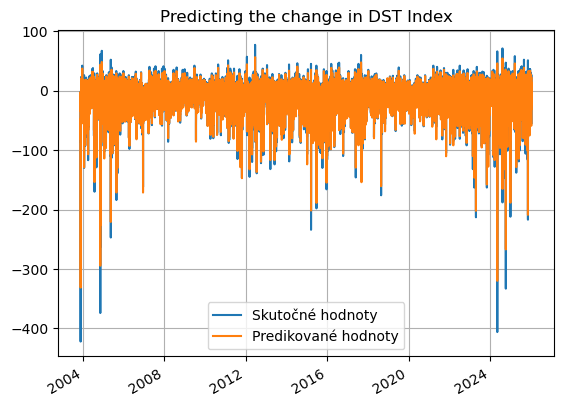

In [18]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [19]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9634437727221232
MCC=0.8920142905538033
Výkon NN:
MAE: 2.3363, MSE: 12.5332
Perzistentný model:
MAE: 2.5680, MSE: 16.3204
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 9.02%
MSE Improvement: 23.21%


In [20]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step  

  5/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 44s 50ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 43s 49ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 42s 48ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 41s 47ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 41s 48ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 42s 49ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 42s 50ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 43s 52ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 43s 52ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 42s 53ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 39s 56ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 38s 56ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 37s 56ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 37s 55ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 36s 55ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 35s 55ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 35s 54ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 34s 54ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 20s 54ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 14s 56ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 14s 56ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 14s 56ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 14s 56ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 14s 56ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 14s 56ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 14s 56ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 14s 56ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 14s 56ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step 

720/896 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 57ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 25s 113ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step 

 59/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:21 108ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step  

  3/759 ━━━━━━━━━━━━━━━━━━━━ 46s 61ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 40s 54ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 38s 52ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 39s 53ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 40s 57ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 40s 58ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 41s 58ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 41s 59ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 40s 61ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 37s 59ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 27s 58ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 15s 57ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 13s 57ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step 

586/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 21:10 1s/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 52s 58ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step 

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 53s 62ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 43s 61ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 40s 59ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 39s 59ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 38s 59ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 38s 58ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 37s 58ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 36s 58ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 36s 57ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 28s 56ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 27s 56ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 26s 56ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 17s 58ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 17s 58ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 17s 58ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step 

727/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 58ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 54s 59ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 24s 109ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step 

 49/224 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step  

  3/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 44s 59ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 30s 60ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 29s 59ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 28s 59ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 27s 59ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 26s 59ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 26s 58ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 24s 58ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 23s 58ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 19s 56ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 18s 56ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 18s 55ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 15s 55ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step 

577/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 9s 55ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 41s 54ms/step


Shapes LSTM:
train: (229350,) (229350,)
val:   (57333,) (57333,)
test:  (194194,) (194194,)
Global sigma (LSTM errors, scaled): 0.2029791
Shapes GP:
X_gp_train: (286683, 6)
y_gp_train: (286683,)
X_test_gp: (194194, 6)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 3.28**2 * RBF(length_scale=0.55) + WhiteKernel(noise_level=0.652)


Global sigma (LSTM errors): 4.466333
Hybrid prediction with smoothed, inflated interval ready.


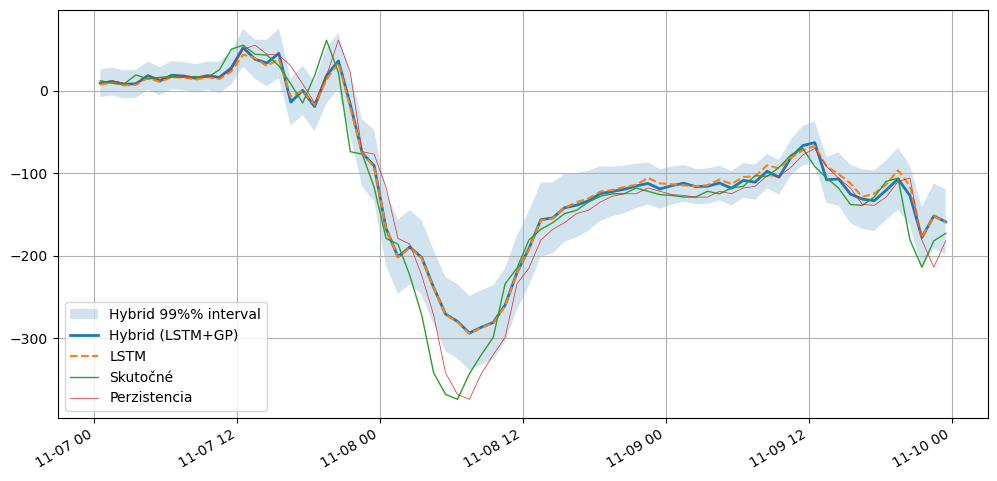

In [21]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [22]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = y_test_true
y_pred_hybrid = y_hybrid_mean

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 12.3274
MAE: 2.2212

--- Klasifikačné metriky (Prah: -20.3 nT) ---
Matthews Correlation Coefficient (MCC): 0.8859

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      149764 |        2294
Skutočná 1 |        5109 |       37027

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.97      0.98      0.98    152058
   Trieda 1 (Búrka)       0.94      0.88      0.91     42136

           accuracy                           0.96    194194
          macro avg       0.95      0.93      0.94    194194
       weighted avg       0.96      0.96      0.96    194194



In [23]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9634435844752386
MCC=0.8920122701311133
Výkon NN:
MAE: 2.3363, MSE: 12.5332
Perzistentný model:
MAE: 2.5680, MSE: 16.3204
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 9.02%
MSE Improvement: 23.21%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9752    0.9782    0.9767    152058
           1     0.9203    0.9103    0.9153     42135

    accuracy                         0.9634    194193
   macro avg     0.9478    0.9442    0.9460    194193
weighted avg     0.9633    0.9634    0.9634    194193


===== LSTM+GP =====
ACC=0.9618781315495409
MCC=0.885879397608392
Výkon NN:
MAE: 2.2212, MSE: 12.3275
Perzistentný model:
MAE: 2.5680, MSE: 16.3204
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 13.50%
MSE Improvement: 24.47%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9670    0.9849    0.9759    152058
           1     0.9417    0.8787    0.9091     42135

  

/tmp/ipykernel_598513/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_598513/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
0,2026-04-25T10:09:44,LSTM,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.3,0.963444,0.892012,"{""text"": "" precision recall f...",2.336327,12.533178,2.567961,16.320413,9.020130,23.205512
1,2026-04-25T10:09:44,LSTM+GP,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.3,0.961878,0.885879,"{""text"": "" precision recall f...",2.221233,12.327465,2.567961,16.320413,13.502067,24.465975
